In [70]:
# Reproduire les expériencces dand l'article
# implémenter les méthodes suivantes : PCA, t-SNE, sketch-map, ISOMAP,  Laplacian Eigenmaps, Dist_match

# Question : doit-on refaire la dynamique ? ou lire le fichier xtc avec mdanalysis ou mdtraj ?
# fichier xtc : fichiers qui contient la trajétoire de la protéines : ie toute les positons de la protéine
# au cours du temps
# Calcule de chaque angle dièdre du fichier xtc, les mettres en array ou list
# faire un data frame ? et projection de ce df avec les différentes méthode de réduciton de dimensions

# Pour la PCA, isomap sketchmap, il faudra calculer les angles dièdres et utilisé ces angles pr faire la PCA, 
# Pour t-SNE et laplacian Eigenmap  calcule de distance (?)

In [71]:
# Importation des librairies
import numpy as np
import sklearn
import MDAnalysis as mda
import matplotlib.pyplot as plt
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

In [72]:
# function reading files
pdb_file = "bhp.pdb"
xtc_file = "bhp_32r.4.300ns.xtc"
traj = mda.Universe(pdb_file,xtc_file)
traj


<Universe with 256 atoms>

In [73]:
prot = traj.select_atoms("protein")
with mda.Writer("xtc_file.xtc", prot.n_atoms) as W:
    for i,ts in enumerate(traj.trajectory):
        if i % 6 == 0:
            W.write(prot)

In [74]:
xtc_file2 = "xtc_file.xtc"
traj2 = mda.Universe(pdb_file,xtc_file2)
traj2

<Universe with 256 atoms>

In [75]:
atom_phi = []
for res in traj2.residues[1:-1] : 
    atom_phi.append(res.phi_selection())

    
from MDAnalysis.analysis.dihedrals import Dihedral
angle_phi = Dihedral(atom_phi).run()

In [76]:
atom_psi = []
for res in traj2.residues[1:-1] : 
    atom_psi.append(res.psi_selection())
    
angle_psi = Dihedral(atom_psi).run()

In [ ]:
#part for use DSSP but it doesn't work
# transform xtc file in pdb file for PCA projection
# 150 000/25 000 = 6
protein = traj2.select_atoms("protein")
with mda.Writer("protein.pdb", protein.n_atoms) as W:
    for i,ts in enumerate(traj2.trajectory):
        W.write(protein)
    

In [ ]:
#Part with DSSP, not working

######
import pytraj as pt
import nglview as nv

trajectory = pt.load('protein.pdb')
view = nv.show_pytraj(trajectory)
view
view._display_image()

#####
# Secondary structure of pdb file transformed
from Bio.PDB import PDBParser
from Bio.PDB.DSSP import DSSP
p = PDBParser()
structure2 = p.get_structure("α-helix", "protein2.pdb")
model2 = structure2[0]

######

dssp = DSSP(model2, "protein2.pdb")
a_key = list(dssp.keys())[2]
dssp[a_key]

from Bio.PDB.DSSP import dssp_dict_from_pdb_file
dssp_tuple = dssp_dict_from_pdb_file("protein2.pdb")
dssp_dict = dssp_tuple[0]

In [77]:
# DF of dihedrals angles
l_phi_psi = []
for phi in range(0,16):
    l_phi_psi.append("phi" + str(phi))
    l_phi_psi.append("psi" + str(phi)) 

liste_angle = []
for i in range(0,25000):
    l = []
    for j in range(0,16):
        l.append(angle_phi.angles[i][j])
        l.append(angle_psi.angles[i][j])
    liste_angle.append(l)    

        
df_angles = pd.DataFrame(liste_angle, columns = l_phi_psi)
df_angles

,phi0,psi0,phi1,psi1,phi2,psi2,phi3,psi3,phi4,psi4,...,phi11,psi11,phi12,psi12,phi13,psi13,phi14,psi14,phi15,psi15
0,-58.849273,125.703440,-117.999365,137.581337,-122.115749,136.855684,-107.319847,127.195153,-141.010739,179.805354,...,-138.734326,154.758139,-108.210698,129.201827,-127.502594,42.009742,-92.239216,162.028024,-81.640559,147.254885
1,-78.257947,59.952488,-144.920534,159.417973,-133.578487,145.721403,-103.368438,134.938380,-140.181365,-176.435768,...,-143.806074,110.308622,-69.637247,124.972898,-126.835874,120.804949,-156.304959,145.504795,-70.172077,149.808065
2,-73.157692,-15.044584,-132.364052,147.196510,-119.627702,141.388517,-95.840421,143.817902,-155.227764,161.305039,...,-139.543600,135.050206,-85.749193,107.138234,-84.854404,-1.819699,-85.449137,177.853885,-127.260580,139.956440
3,-59.653925,-162.117772,-140.683461,142.324395,-149.353417,-4.917327,-88.355361,139.776507,-150.331045,145.931384,...,-162.769105,165.568876,-65.792039,-35.139781,-134.051112,155.047350,-74.194500,-20.576736,-85.109215,-5.201583
4,174.010346,-152.850503,-91.880400,22.013410,-133.955898,175.748683,-147.026919,147.069953,-95.372974,123.391616,...,-97.516652,145.550604,-117.507126,142.261362,-84.342813,131.714313,-130.240505,-9.937218,-146.771800,4.559911
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,77.808781,-117.872262,-62.006333,-9.782023,-133.038082,158.578060,-61.156664,150.173222,-59.250421,-27.548806,...,-82.278178,129.297967,-131.650333,171.430592,-94.578129,155.692098,-149.300081,168.942944,-54.104547,-29.182558
24996,54.437359,-121.886680,-61.563688,2.974931,-134.812055,160.932643,-61.082674,154.917797,-72.764823,-2.675506,...,-69.092114,151.760690,-139.655381,140.980997,-68.427462,131.815559,-119.344987,157.682173,-75.325781,-35.481076
24997,72.942109,47.492923,-62.847982,-30.401723,-58.118744,-17.979129,-71.684670,-20.752471,-71.024146,-29.384302,...,57.641356,29.634907,-79.663446,-42.028149,-113.423654,-26.370884,-86.008331,157.212522,-112.631171,144.973541
24998,70.187112,12.405449,-73.663919,-19.160543,-52.707938,-26.593941,-58.355885,-38.679079,-56.700553,-26.954100,...,55.810084,14.321045,-65.935485,-30.293787,-131.781503,1.707157,-127.117385,167.737647,-128.036551,163.118576


In [78]:
#add of empty columns which will contain the number of residues associated with a secondary structure
df_angles["nb_res_helix"] = np.nan
df_angles["nb_res_strand"] = np.nan


In [80]:
# Fonctiun which calculate if the phi and psi angles are an helix or strand 
# note that an helix has dihedrals angles between -57.8 and -47 degres whith an extent of +- 30 degres
# an strand has has dihedrals angles between -130 and 130 degres whith an extent of +-30 degres

In [81]:
# for helix and strand
for i,line in enumerate(df_angles.iterrows()):
    c_h = 0
    c_e = 0
    for col in range(0,len(line[1]),2):
        print(line[1][col],line[1][col+1])
        if (line[1][col] >= -87 and line[1][col]<= -27) and \
        (line[1][col+1] >= -77 and line[1][col+1] <= -17):
            c_h += 1
        if (line[1][col] >= -160 and line[1][col] <= -100) and \
        (line[1][col+1] <= 160 and line[1][col+1] >= 100):
            c_e += 1
            
    df_angles.iloc[i,32] = c_h
    df_angles.iloc[i,33] = c_e



-58.849273365218274 125.70343981888864
-117.9993650763056 137.58133723776317
-122.11574894742898 136.85568426470923
-107.31984738148658 127.19515257998846
-141.01073925505432 179.80535424864115
48.847028294363106 66.65574137786307
58.87266771610984 30.284080858482756
74.0169900477653 -1.3138572367374515
-67.22698989082889 -10.731246214883065
-148.71025103173562 153.98151412889476
-142.94716171719398 147.29388726859787
-138.73432565205184 154.75813906775787
-108.21069803245418 129.20182703564646
-127.50259370355076 42.00974246728857
-92.23921590746265 162.0280238231424
-81.64055860205491 147.25488481462511
nan nan
-78.25794658947433 59.95248765140452
-144.9205339265134 159.41797275238335
-133.5784869186826 145.72140320193003
-103.36843830289287 134.9383797292233
-140.18136477910875 -176.4357676452711
44.19869745037976 63.44420442637122
59.9394011558748 28.072216973670383
64.21643583633325 16.87057707348593
-86.01041896854063 -0.4453993465522592
-137.02184556554437 162.7383474120048
-136

-93.25090742433224 -28.658223657788866
-46.629245797011656 -35.76026149155932
-116.37236811121267 -23.153146674686283
58.27254659752136 61.50685317725341
-152.58808045463203 169.70755159575316
-92.30731952434152 89.53805629960844
-61.901561908943414 160.60230741424726
-150.78749739473517 144.40021435043735
-138.93061182863528 -19.71732343442159
-129.00070109240178 -42.79419196182491
nan nan
-66.8868361824713 -22.394575807620793
-118.6313291730347 149.33004568298824
-132.87776176101545 157.26024257744288
-126.25424729872536 151.95569663908964
-144.28779599773657 171.78321073120173
54.61937235328444 72.8734610448805
51.6495334915574 41.908580336171816
37.34533104611277 45.900420570733566
-104.42417830769413 -13.007492680403846
-121.79755490675136 148.7776816293307
-129.35178845348534 144.21864962322712
-131.8088080652475 150.5463463810882
-101.55930489491243 141.95179504971873
-134.6175682554001 30.447468901037386
-59.74953971280016 152.06391122062132
-76.21970621193258 155.5522659464096

nan nan
-76.77624402277058 -30.70711870637139
44.031443626046226 53.56545207364038
-147.24509430535053 166.53571325655216
-143.10343706360712 158.407351174424
-147.3741872223526 137.87055932489648
-121.49933016543966 91.45419510868649
-65.49359486126009 -24.33139858576314
-58.2061573164376 -25.03456702512733
-126.40832550157349 -10.504313135846566
72.92380998571271 26.732118314848982
-100.06544219461969 122.82465054516614
-104.3673025720657 122.51722051236244
-127.11543488603724 146.86440607662806
-149.6842872024892 165.92532539077754
-81.17155607217497 -13.692646997488238
-71.51131508571287 134.52851877359183
nan nan
-84.7932073089293 1.4253940477438096
57.95427658103855 26.75432712697245
-120.16902416385608 169.13215969335081
-153.96930903622126 158.5127122789347
-111.88782241298115 151.57520928201285
-127.19011793428459 117.09259485944793
-65.82219066210818 -38.009815343468894
-61.9162036119083 -47.581732672576585
-83.63995752541778 7.09479244251302
53.00890594993901 45.923616719571

-63.34672104596407 12.806677717337568
-87.90280607066809 149.5747650055453
nan nan
80.49065970499565 165.8706943910613
-156.204567244715 156.4289924986436
-137.7223515177405 158.02563462138224
-151.03190535232125 160.61274678307714
-140.4095842934304 134.89439548020107
-123.11998873969779 115.25846233141141
-69.01479727728132 -34.699630820906684
-61.642375318690455 -46.205535288241144
-96.98394427422794 -3.7113307611289836
55.20062192229093 20.36996483365041
-104.03972473363794 135.40538762217443
-109.36520710902082 137.74460878534538
-164.8801195324831 127.7926550797813
-73.78200205640314 147.04821109887126
-134.9269275580707 -23.373209844491804
-134.33554403407467 158.66331108803797
nan nan
-88.46926916719748 -147.81895131198223
-76.97157100503757 -2.2512891925679814
-134.94295902847054 154.06320545535817
-96.05478183744574 4.8632481717589995
-89.92996459415188 43.39222146021731
-151.43322247326543 154.8768892692554
-164.3127414070065 153.24101114576112
-124.56990845881917 -36.794990

58.108067151773476 21.601170488412002
-148.45118671125604 -22.034958865424148
-133.87267563025023 -25.80184079179531
-80.20858520808451 160.89790658961897
-87.21644259800894 153.66361351798054
-59.86623341280211 152.65713047043303
-79.17884507002098 -5.321492670788234
-88.2581018639051 133.24420757239903
-131.0551424101938 144.365927360778
nan nan
102.13606502559738 170.99065508422424
61.01903620888105 28.682388465023372
-86.7460576299129 145.9269048771832
-93.61815513184646 161.68972229198354
-128.9960792255601 159.2249713665172
-143.59692565302694 116.51752192828664
-81.46139876327057 -23.797454316518987
-66.37500176208937 -51.52205350971758
-86.21502763822743 -9.171545386087995
61.1530529211372 41.20184661973242
-126.704193106663 153.77628119727115
-101.16545259831814 141.96878263150748
-127.62464303072359 143.78530516169974
-82.64918834445048 157.79130519217455
-127.15425376727343 -41.54859725641649
-128.68509767537125 -13.301115980382663
nan nan
-71.03734230949455 147.278547245782

-69.20716427548113 -37.56561030353424
-73.60834063509779 -34.6690810905476
nan nan
-165.13192945215883 165.89348552580606
-25.052835424829738 -34.293488198312254
-52.7424083569568 -16.11940610925798
-102.14621829109474 17.82232875204835
-130.3918150621993 160.8014886085266
-90.41477274205461 116.0402421710358
-52.41296656202043 108.29459271068833
-55.162275658028555 -28.374228933076843
-101.50172534238523 -9.204283095901596
46.59577002143476 39.58126919198372
-153.9674623062794 -55.247662467395436
-90.44540691717656 -12.885590785542783
-130.63634071177978 -6.403721204447418
-58.70343666788919 -17.174167979382965
-69.84009464769748 -26.286799720757028
-101.84364774192117 -50.58180129045673
nan nan
56.9787888845714 7.235591795054679
60.44144359849648 43.521011621051755
-136.90635492323133 170.8392769799002
-134.60483768182806 164.32478295176037
-145.40780104879576 116.43412115352247
-84.10832261442067 106.3880406783442
-65.84888238547383 -27.64965643128634
-61.64035733211486 -31.07262524

-80.62358166457474 -59.94887644519698
-39.66765070296444 -47.99923706057069
-86.22567439682956 6.4795093513337845
55.019305247505805 28.468126448291112
-83.94076000770609 -33.479882600894136
58.112568911629516 25.648821632251025
-71.34713455075232 -24.043907237336526
-124.34073710007098 -34.91858055904815
-86.25282337521195 169.8441888551895
-135.82066268440502 -21.81381725071485
nan nan
-90.90132971264399 -159.88878990306682
-93.81856521410462 -12.159307996727229
-126.72981959021699 161.26858982677845
-46.48138129576398 -17.522517598224105
-96.33222576599465 -7.816548897904773
-96.66791131634105 162.2393544593697
-149.9628359845503 159.96115859718654
-143.83404268561887 49.94556007065887
-83.63746479925425 -31.545386525002822
-72.82974517224916 142.36371236534325
-130.32732358165316 138.4806111610143
-161.30291100456597 126.28061254063972
-143.30307032108485 126.1194536186623
-143.66021361871182 151.70534373283232
-136.57503804103237 141.89020910417742
-101.20767387496733 17.531772227

-79.95700482644182 -47.1064785249735
-67.46676902334768 -29.24128281081161
-89.6570734409706 1.3057950084670515
54.15935763426864 22.54682206773357
-80.05061747865219 -37.579963114037184
54.28683245110985 53.85852379084048
-89.69621471234419 -33.40593306952155
-132.7620498778167 -12.22854628068532
-115.41141534232729 155.87555180115277
-122.87740947739161 169.21161989671137
nan nan
-118.9339648084625 -173.33927335543135
-128.8346169791091 135.8614683461114
-123.5996228462223 170.6594749699129
-100.34178868963397 139.14066724113403
-140.41087148687865 165.33586510138875
56.69802123578316 41.40620359852448
74.25242870186597 46.051855392328086
51.84562843830205 23.984245432840783
-91.11108837215332 -8.252474230096231
-136.97726352229267 166.78404562884973
-131.32266228738214 157.68415440397297
-129.26630063925532 159.2534792569444
-85.29526603118964 143.54805903235146
-137.01825619086281 167.6974900468783
-66.01762093766978 141.39337504046458
-133.86500747001415 144.21976014499256
nan nan

-141.7521726503012 146.98644491050229
52.506362710216735 92.31983921360211
47.41174863296713 31.802038803109312
65.84280341966492 25.921001822297445
-109.4943326387254 -19.025688858141265
-115.9532394934954 -179.2563659393021
-113.8719788916996 160.56869362043003
-150.21396868460334 161.0006143375427
-89.94698164953478 145.68219782829178
-123.50126719592825 162.40422240921896
-90.35560901191162 -173.35850024706107
-128.89775347913576 -24.15390852026949
nan nan
77.96941367618723 -153.91019846747375
-140.915732320141 147.14859536026057
-137.62457334940444 169.43668154513531
-73.12959087089143 151.10615398748945
-159.89680297024105 138.07786974510805
57.21129735702261 69.81666703366
56.25157439066099 33.542505776509024
50.66046233445251 30.221955960594876
-89.3948090307237 -25.66753854125172
-117.20702389545329 176.30148850716674
-116.62139543585697 172.2162606682415
-132.7807267683578 162.1215183374389
-85.74843013721741 131.23273705504633
-112.49411157828612 168.81178806344954
-152.3923

-138.3879037620068 144.98739212388887
-113.29321495445821 -5.132672160212743
-87.25551998991499 119.00038749314285
nan nan
165.34985380845438 175.01883028084367
-54.7033299961705 -37.112394920181025
-69.28531719386626 -25.522149792787104
-62.462664854662656 -11.458733736261681
-135.70945650247447 -15.484482774149434
-115.31435838058488 103.5769436470814
-58.97581771563829 -14.388880212672532
-55.79594364262855 -29.474654977814865
-64.17020385503184 -10.16130126330607
-93.85826245081319 0.8363743527065124
-157.8390097436433 -31.697783614160763
-129.85954528914732 -70.2409671081025
-73.10992640853463 -41.86477540012387
-99.595555641951 10.304996877703527
-111.24669124389021 -43.110351260073415
-136.9454152953185 -25.374763018217262
nan nan
-170.37694045613648 -158.1083394363674
-52.55933442110534 -42.05240029194979
-60.33799300549855 -21.142125127867452
-86.18620249585108 -13.741298254744216
-135.99649838177584 -24.98245354621945
-73.04776518372472 112.0528013289769
-63.176410169922235 -

59.609915287220474 33.69560944583395
-130.50854764643063 155.37461735792328
-75.21498833478316 91.35147091510032
-80.20248276620528 -33.787432745348866
-120.81427830911684 169.48059104786117
-81.69867681589557 -32.71158096373684
-145.8221812322921 154.4637506357327
nan nan
-63.91455416763174 154.9416560513731
-51.256611702046975 -22.61237182707382
-70.35291965937732 -4.447856399267637
-104.50405983557205 17.732680528301447
-141.19372389384304 173.33080212893302
-150.74853949060528 120.26910667781455
-81.65624318440102 -11.545616241715802
-59.76077009135236 -51.65054448962431
-104.16258612309707 0.02311907208237402
60.14613877076235 34.56316709375539
-141.0921175549008 155.29727889740423
-85.07358647832328 137.34068356889603
-122.35901291441263 -39.57853334294798
-143.65005010854128 158.79892708780446
-68.67038432142411 -41.08995655664592
-148.1106276896431 144.35019355659466
nan nan
-79.93367656801212 -137.58281395996022
-87.9840487536475 0.9701721439199782
-78.49980300236554 -9.130023

-68.26020990600959 138.55318287938832
-140.86331092591243 -179.5483784016418
40.12606535097026 75.73972154622707
57.925078055269935 32.18260317418149
43.656644987091624 20.63652665353351
-67.23431159647272 -16.54470006582703
-134.79080307325222 171.8616908458257
-120.31255823730251 152.23449203516137
-134.83096886400853 171.30521772997764
-143.60156211673288 132.83698296068172
-119.11361364722312 156.91704636020046
-75.23814452726008 157.66273595803025
-79.57617379426122 150.82329532769108
nan nan
-71.0157980875017 -164.96868800678263
-71.25474570844717 -14.328459553609708
-72.70377327080182 -18.624051609269944
-81.03299350982657 -8.861943083279888
-143.4348654700604 6.974898731898629
-103.48755211069535 107.38578642038422
-68.27699002613241 2.8775886322721167
-64.375218750539 -34.996731135427616
-74.69569146736116 4.789392767314594
-121.2569651728175 -24.543860998718475
-126.34979714964746 7.063626109539509
-136.0087819400318 -51.05910084970385
-63.234011048258004 -15.966873919829512


-155.82583829266403 153.5126049432115
-79.76759106581962 -35.89872960458145
-134.36714142957902 139.98917855246387
-74.68387626112496 -10.622910911748646
-143.21194945940584 148.5562326388407
nan nan
-75.6780867577806 153.44509792903392
-74.34065003619995 -16.811426129041596
-140.50670592085243 -33.60843761242891
-78.32928616703045 162.65469663019329
-102.03512867688241 148.23416080776485
-126.26692839140102 134.94424135197525
-96.06708793000709 131.4701302779582
-66.45234266297985 -11.977379926273093
-126.95172253381148 -16.792884765771703
69.43882668979325 1.898663317385407
-105.21732304652075 -24.084040358502325
-60.49729385107536 -31.505019430515446
-87.86869052256131 -0.4648351181061827
-136.24491788917265 6.575088995419321
-121.78473498875381 139.43031723698985
-137.62348311614727 -26.72026914338937
nan nan
75.32626649507017 -161.5580767173796
-96.81251046202804 -14.853948090045318
-73.67562307343857 141.42065051717262
-141.36364243973148 -48.63062967835209
-141.49580539990666 14

-71.47985814799742 -37.84592228351491
-59.26799777816318 -33.892894533869224
-118.7778590761424 -1.4350995717541983
46.736339381444296 49.746253301785465
-128.25504905998855 138.20373802851734
-99.74763091751434 127.79986462842747
-126.36099708967889 122.23201240161956
-73.59080915690303 148.1027813470189
-95.69788404109157 131.40464302210938
-69.51092607459815 136.54113296046881
nan nan
72.88554440225273 -160.33306529014033
-67.23346399924996 145.36396690504662
-143.8287553832952 -3.2847078867445276
-101.19317117169956 65.07262650526
-70.74227882122491 20.303928955975923
-63.83735668863187 -21.2507175602664
-88.26958437615119 -39.63025487331071
-80.46857984296979 -24.659602962667943
-87.03282154799534 5.758540595781293
56.980179486422365 21.77527594396555
-84.31353027002781 -31.29220639142979
60.213901443007785 32.90227641964113
-93.99517256722332 -7.3282230511513236
-140.10489842214284 -17.553237560527638
-91.95775809032163 161.77314641218246
-122.6089872624139 143.57400625056076
nan

-84.9749526559625 117.76151847767939
-75.14127383382535 129.99117012751898
-129.8241979044918 162.61885683646196
-124.54293230537796 117.24771392730327
nan nan
146.7395790598561 -156.5474884201757
-137.17463807140797 145.05854916762593
-135.82169254479638 134.62021839713998
-92.31436090968943 145.35392343694647
-143.4613839018215 161.87442376010935
60.30892231436706 63.56469528665668
53.910704356500474 33.499120973188774
47.422404578751525 30.792275594090057
-74.7777335430685 -30.241106293869162
-112.37565440751776 156.4914927221041
-137.4632905803558 141.79024643540868
-132.34408013781103 143.21717881529972
-75.47824210696615 133.81347284992054
-108.61458672736303 155.8583179230805
-155.944291500399 149.25605969163013
-68.94433244442634 138.3538025793814
nan nan
60.81624735602717 -122.58332555270052
-149.32092348939437 131.24801877187716
-148.33447047561626 -6.19318618134255
-92.94558238566631 116.31061501849422
-122.2919075042696 43.54193909302884
-70.48622925407014 -37.8236838666383

-83.1051763585566 -9.138602468906928
-112.98264461653906 156.51094327618512
-104.0842173527356 142.32969516128267
nan nan
-91.10772681647764 142.24423654538512
-128.2592298772491 140.98541973087777
-67.31515442109728 140.4602909352757
-135.36328235633584 -28.286395501349247
-150.605822357004 -36.80356374256904
-123.79056892685021 142.87876531224083
-118.23019337329643 -11.635140991317211
-64.5984900370257 -45.66592526687412
-101.97424756760336 168.5011716579668
-99.61503249789683 117.59206185994232
-63.37810294643074 150.5538875769672
-144.9472220291276 -39.70814469266682
-138.7114643653433 130.1032663061455
-109.85028662183066 109.54896414222661
-94.76231478169616 146.25396804416076
-74.99177934069665 156.53396168051245
nan nan
143.4713130765833 -10.733462334354163
-70.93642487848194 -1.0641662531848999
-63.571417791013204 -27.289068452237267
-58.017838809115815 150.61603231474655
-95.68681830408704 130.06810708320273
-141.02814028444232 128.30637433583476
-63.789226021204755 115.9532

-69.21994517309719 -37.678180853385214
-75.41927715495665 -17.43265196938567
-80.26940878993932 -43.77788763238469
-71.78205987690929 164.78086353279056
nan nan
71.24958007821942 22.520680871447247
-57.26074592287913 -19.0048239820604
-75.48598188401475 -23.42496076552085
-73.26008266854555 -3.81726794852419
-125.91108926154524 -14.993576694623453
-61.70155958005669 -51.18481501508315
-65.45639177384278 -37.63190860257643
-66.61273637163465 -33.785312191877686
-53.69331202879492 -64.95764694820558
-71.42101059698469 -24.947863867604386
-66.36145517471329 -49.12596482484578
-65.2405480796634 -41.69802539309519
-58.666309525882475 -54.53320807206661
-69.94044906860513 1.2782856102350564
-105.35506505321214 -38.07433864002837
-63.3095348521434 123.93342507807219
nan nan
81.26355129784368 -113.65551757524159
-111.41139289197845 159.64490770108563
-140.63357919423512 150.1089536419199
-99.50726180628807 152.19826915778458
-148.95170563402493 163.69317531971168
65.66463359303418 62.198356294

-131.1257056091049 10.25407575841093
58.71461606016408 12.0750709487852
-88.85216251118483 129.87519075269418
-89.9062097806247 132.64752943048833
-133.01162925032725 158.03434425068158
-89.82635356364085 127.72674274425466
-89.55716187339715 -45.131692555218784
-146.98416070015344 148.7108894235681
nan nan
-60.813158145987906 -48.32081263453371
-70.78488210571432 -10.770033998137931
-120.01810559639488 26.592492756278606
-133.7127542926964 40.62335343178805
-122.84694484510139 148.76470066851232
-117.9447850548043 98.8920686218452
-54.45087698152035 -24.92298488595754
-74.5886417874176 -40.96353579968439
-80.9200893579543 -24.287498446822273
68.49145925126773 36.20884872617099
-144.3852609727358 160.90861607157845
-62.14039756693872 131.57247142806364
-153.0416086757902 114.26313518473737
-120.77420757663816 154.09461344597787
-92.0140210351356 -38.535468517787436
-133.03821317575324 95.28869373904072
nan nan
-76.77049419766702 -32.26663071042805
-75.12078832572786 -25.212116732086066

-84.12615316566044 137.30075612817532
-126.89163845073895 -30.140064305405396
-138.17685950715966 170.06349888676723
-111.08496687948585 -18.220097702855956
-90.75779005313704 137.9204596734081
nan nan
-67.19587075484029 -149.274860899165
-59.484689278164474 -21.26694853798014
-72.67565676701788 -38.1092007330448
-65.80117446034954 -32.64510032674983
-85.48810716665709 141.3403877088986
-123.55243080696047 138.50721560557585
-82.35964903854214 -27.580774031785257
-91.41153979768876 -0.7838233696993208
-113.56134178162132 -11.650169278933708
56.675057295862345 24.8617896324778
-142.72741592143058 171.9083518014982
-93.97446440483262 116.59311932230321
-124.65554939342616 -31.08488122850587
-128.43950486091947 159.08867888039342
-128.181749568496 -1.5472915056585954
-151.936554739045 139.27663914593145
nan nan
-111.52957458136764 -12.448192608693457
-163.1594849558761 144.92785864101953
-136.33873511685422 160.5364512373815
-147.0950653229815 131.0560413119102
-108.47002043037456 131.514

-111.90720838072806 91.2923201845665
-61.19004209365657 -26.858487545575173
-61.290507991167985 -23.907497981057563
-123.33605568305238 2.7679450114404602
57.12118515226325 46.393365344622296
-115.865715436878 125.80733543546998
-89.12017010475907 150.94690901901924
-134.77369878613752 124.91393075964865
-145.93345075336353 164.42543098366951
-111.92910110625195 144.4860757906019
-83.2366422060405 134.7173898263128
nan nan
56.71302107011353 -161.1792772447648
-103.85963733006771 -18.743420019458057
-149.8312447833421 165.07104507952928
-122.41240053106327 131.06036607832763
-119.17487117824481 139.42082775134065
-127.37267280679382 90.47105560071047
-47.83029730936531 -39.714219488779456
-69.72641739461936 1.1346585911314233
-141.44122807575567 -2.804899828772056
69.14292076415296 34.62555893620358
-112.94170779412542 124.4163162554004
-95.72879704410533 134.13585488378766
-139.84421349690547 133.54962560901174
-137.62425385933346 139.18550562680633
-128.56102166813892 117.897009810956

nan nan
-69.89999560674973 -154.15601287809494
-58.6202782452275 -15.438192090698655
-72.65184692926957 -14.921665929312743
-92.11471556134856 -5.5378758339030085
-82.6179354202208 137.02623488096643
-119.54426870570832 -14.292599850207358
-86.28618793280042 147.7285495314654
-64.44318918099586 -7.554844122269941
-65.89736919184925 -18.20196122584342
-130.57456230564696 -13.343660819403414
-112.3223016425463 126.7393890008738
-126.47916841626393 -10.61535910507518
-146.40157243096874 156.56344960385158
-57.98432770103985 151.22259284393115
-140.79463900162767 138.97813315980108
-96.07753672623039 -2.9845474284830207
nan nan
-164.76310836602005 -134.46378229263667
-56.2282974401069 -18.09440775136988
-95.08053070669055 -13.00377042490731
-114.74188676483904 5.822529147575381
-76.19984400354288 148.5680363981142
-128.51539111099748 135.29066000796053
-93.66765241735636 -22.417936999023986
-83.92956576559415 -17.291707753650012
-104.31506304478307 -3.1944178226083766
45.42786944692209 52.

-81.68969785015476 22.160764782745055
-137.09752771821965 151.84797361001122
-64.36879057459774 139.1479620142711
-84.76272097408042 127.11271183824029
-64.76121554718395 -22.47445734154519
-100.27776386044995 -10.42146710403442
57.41427641318047 32.570343203201226
-79.18067224811372 -41.52252838808052
-160.86751008924244 139.73780299275552
-139.48256540236412 166.8510865062475
-86.58842619128546 21.462705502607307
-74.58259277400056 154.46365943869225
-72.05082811890988 141.26178376356992
nan nan
97.2981252736241 18.452807141746426
-158.30079633957087 142.18826645353306
-131.95242260451053 -8.5489232576458
-89.10852804240405 -1.3295109715481874
-108.67020767588212 165.50510215062621
-96.86513111743335 150.66281544365654
-96.34704804258688 115.62514981484051
-64.59350779399644 -31.4851753345886
-81.4974171732907 -14.788317682106822
40.96217157005244 51.291368753508884
-98.5377760132872 -31.157597563812047
-149.76896646079157 130.59845256013745
-141.00446156282325 149.14668412824105
-77

-123.9688081111329 -14.975731138486504
65.67741372997209 44.84527908344441
-133.95077964715296 155.47434164765093
-105.85758012359783 144.00641402456054
-134.4654628701528 115.40941195603764
-82.33877157896136 -8.697751998841301
-75.6977227275518 152.5645795831284
-97.20603559631301 130.37995797982398
nan nan
-105.54729697767398 -151.91250593326507
-68.25410587157863 -4.6159234540323855
-76.37006588717752 -42.762433489095606
-130.43114942805892 -3.6637056473059104
-115.96302727232796 126.1316673551991
-98.94787720988714 114.26566998761112
-66.33471563200351 -44.0377276181513
-63.96124537034253 -22.427562867518578
-111.36866479650439 1.5121152798795188
50.94764063312418 49.30401510297074
-131.91080000200586 138.65370610469296
-98.79051187363392 140.96382278268527
-142.82586697431998 111.64149892753393
-97.63716085429745 111.75722444457469
-80.42483568844806 -34.9959318711119
-67.1168065222934 146.60572014620033
nan nan
117.43139968575058 155.92211949794734
-149.84217990582286 13.9127629

-142.4711231085288 167.40765824045243
-73.3112305605523 -21.47493153367568
-74.98536588793749 154.83487270652478
-77.28741769272607 128.67584331422412
53.087838301060394 42.16811179799015
nan nan
170.77721721686444 154.0690496852464
-124.11074763795023 -35.43314973183032
-160.7286376280703 168.14160229982522
-143.7994649221468 158.78553251577583
-106.98806445192133 133.15729391715286
-101.44219099647425 108.62026736298637
-61.78279600189312 -23.58477062396813
-81.2578457089365 -46.48122362118118
-84.67747215691101 -0.3372482565067068
58.4862099205381 42.474674434613476
-142.926602958065 126.60813445896818
-68.6812149548126 133.39072001284273
-128.66148313476035 143.71481658566094
-84.8562548236533 135.3609406632295
-115.02261016923285 -26.731823295159124
-60.44654068670553 133.3050058964835
nan nan
-96.24150723611363 -159.63866713051004
-119.48346513591946 -33.101348227176324
-147.74332134214097 148.07794325750277
-124.16456607441941 159.52678948973437
-134.08559340356896 151.773778684

-161.2154774992271 141.93745938157616
nan nan
176.3217216428916 -152.30352314627777
-73.23818944778024 8.621938909563056
-106.62214228019151 -1.757159500341372
-138.93430980535632 -29.693343267662637
-133.71161783310882 153.8715663463716
-142.69823372647255 123.40339030251793
-73.9251685342413 -32.17956925104445
-71.29409864214787 -40.53477648707913
-96.56687983520847 -13.17689638633853
67.0915988054425 28.11377964647978
-103.33091702156257 146.32270492531555
-119.11476724827546 154.01116702008093
-123.61954069101508 134.25202806278247
-132.02369245489993 -2.1116365045416408
-95.89500660120127 167.0090545006328
-105.28762774125292 153.283817920008
nan nan
-175.57120631710615 -129.79072311832428
-71.214293608592 9.435022152643898
-114.09577674095267 -10.20048869933189
-109.12290328620661 -8.00497247006298
-148.50077120690543 144.23796319823373
-112.48203878619726 99.97670596192145
-61.32629433552656 -27.769131632402175
-67.82067586870856 -32.21953418785162
-108.69110503485776 -10.069406

-110.55748890573203 148.60267572424064
-107.9227602302966 5.098342193235304
-65.85298013905614 -6.12287147886841
-101.57680869952651 -30.61120294730063
-66.79065213126424 144.85604936927484
nan nan
64.72245848383572 166.3328721985901
-73.13427386475676 29.96004658399024
-86.12415705039461 158.94570104761505
-87.18921021387186 170.8182660672973
-119.26623024352621 159.82306628749302
-145.62279302930847 145.61010497213044
-155.03515956722666 168.53814815792114
-90.78840416771767 38.99224641410441
-82.11456411797208 158.20070282572053
-74.7781637035425 145.39058462177522
-109.85726902504281 -13.444248547586986
57.345474317467826 22.812871468168026
-81.57797880128673 138.53115839192893
-137.1599050556077 141.7249954480615
-126.44854926394923 93.60420926617421
-138.85041530055582 145.6888933653501
nan nan
51.44021388898691 -117.5488397243954
-117.43427807156617 13.219649743470493
-114.75682065578486 159.91861212422236
-64.62856259372992 138.37999562545568
-86.33587799258484 150.484395619582

-129.02668228744153 148.09968132517184
-140.90219669283607 152.51129074340778
nan nan
-81.1614040562758 159.2155235404564
-146.29652627746358 151.85773181942474
-144.75270340215656 -0.8473495611727935
-113.69555030415016 3.479206201986126
-145.55963279025596 151.67851350258167
-155.13201625996643 162.84319274710708
-77.78567219526269 159.63912208954352
-62.367202571860446 -25.328323668724426
-88.07644519787212 -3.4021865508432465
45.99346762360021 29.377387671665023
-34.08862547235382 -46.07020721402967
-114.08763221896979 -12.853220295736113
-77.67428402810734 -57.397601851586835
-159.48419401054744 134.42252346206013
-89.20849235030502 140.80423319388095
-140.17248269135047 119.37678373562377
nan nan
-89.89661099698442 164.20067304867953
-119.3462733246899 128.2272963200596
-95.73685222702755 10.834329613174882
-67.3639530951366 162.7369942463664
-124.46023255526848 177.74839659526498
-64.42647310770003 153.27399116763382
-65.43000702954616 132.3776793798067
-77.7737522488603 -23.358

-89.41917309474577 142.12957011258032
-61.3462447967721 -5.840423062987193
-87.44905107011257 125.70362079198566
-144.76481622075855 134.0390994183717
-93.05114181818095 131.47945089145932
-107.1465414653786 137.49526406190006
-67.12826677729002 132.76703319630178
-80.75943137790195 -32.527782413089575
-108.74968859020792 42.22948950106761
-50.91501407499022 128.86753426587433
nan nan
92.12745899689156 -146.72779577038594
-91.09345771206888 107.83154512898447
-70.89472000986916 166.56768859292598
-115.83971313843443 -17.417238442540786
-124.40897256075675 156.63017909252542
-136.58792125794457 163.13398804586777
-94.88236861709899 -20.269571715041316
43.7392625350079 22.202206261815007
-50.33438206676487 140.76635805590908
-113.56086192062472 142.6353096197488
-78.72376853217548 -5.8069440878356335
-112.35652289051689 -10.78689591085424
-114.58837917082542 -27.543551735424096
66.65422102827466 15.83542372802187
-95.97330670125585 139.5650985517146
-70.13572113376843 146.70313731948497


-121.52141600790411 2.48199706905076
nan nan
153.40412783383798 46.820613811115486
-132.19242154168276 155.10116152672805
-144.2160846032497 -1.1618970680242942
-103.77062189673326 -25.36945302051069
-151.76551405562225 142.255491487021
-146.17052026976745 162.37554749131291
-97.55260421080251 176.62418436310892
-76.4292048348977 -8.253797387327005
-127.65588810610582 10.133073994709468
50.750043104434624 60.755429275272064
-60.21966261539239 -24.9200980422491
-144.21078557643733 21.329552284255005
-130.86359012730694 154.6646865490088
-128.76209320598616 163.4987199107845
-113.7482505136362 139.30965892128378
-136.80158386327483 -2.6559985764337326
nan nan
-84.62705369542931 30.449827184790784
-93.83557273668444 165.73685327319012
-144.71585757320645 146.10435189541363
-59.570657866960694 -32.443239090862235
58.03824144703394 42.384478648977904
-103.9151438060054 149.1187294283475
-121.46070515840533 -17.2619069094197
-68.08336898765717 -47.582498853893945
-72.36225910485574 13.187192

-155.7855955572598 -31.111144457902142
-111.47077053817937 125.47529194508031
-127.03408042114741 156.63693777518114
-55.8014081290948 133.10793186188374
-121.7881945909667 -17.58252126996513
-87.9468778472093 165.32794649693668
56.31239661506858 29.02371728248255
nan nan
81.56088793408755 -29.022464345594802
-145.4205670991697 165.3984297544607
-126.64975621655317 162.4101658869678
-140.41655052367926 -21.01119354069104
49.90997652021442 39.56352657668661
-79.24137279217534 104.84957435302294
-61.703486259665674 -23.596939927945964
-50.27738719181419 -25.823108091435017
-78.1360225439859 7.540855782795839
-136.87325752482633 11.603533414834175
-148.5817225299671 -42.111707732529005
-129.14101774756546 -52.63209427158249
-81.12472109893955 -21.349265505847786
-142.71933174590245 138.35944467636207
-114.20221649783262 157.14731009104568
-166.67034767799862 154.92003468669924
nan nan
88.31284699540585 -3.2642471987045223
-150.0181817333858 157.55927543421853
-130.91182592877618 134.79869

-106.66085855387149 10.249804392734616
-82.58710188437882 154.78247462746185
-144.8398856057942 122.89319508531248
-67.46304815773429 -1.9257883229338668
-76.16791858815103 -26.640653950353343
-123.83720848517277 -19.841584371298232
51.668170401211476 33.37590569536166
-116.46082605878962 158.30388996906103
-89.23490054324748 130.07067599948576
-82.134101493235 76.64926514116468
-56.04732465645814 -16.261631071329816
-89.40324724568802 -19.423664529839016
-92.35844236074509 4.8615300644452715
nan nan
-69.86572926520148 163.0821489855087
-95.02248628246927 -31.85782667375233
-108.58547875304379 154.5986954128271
-149.49311541835283 133.08905784448356
-90.1493875215929 161.46219653078026
-134.37014402037053 117.7123927591782
-90.83853444915971 -7.059319076121936
-72.7249329597662 -33.96730519629978
-104.83066093741951 1.0338888721344892
40.56097263814078 45.09425401814603
-133.2785488612431 139.20262493621954
-103.41737409857072 147.2624248650001
-145.67282862397474 165.87833351696807
-8

-104.41396455992933 -176.86296197274135
-129.9985406762697 148.26258891683284
-136.3067286005013 130.03673298173385
-75.76984859661637 -20.302809935470957
-50.17294181532352 -40.840389620478526
-110.74869954464936 -12.274386405487844
59.12879943118211 38.4955149943097
-139.3022370846928 159.67856958938864
-78.31297068292473 162.38681151741136
-92.93550346756332 27.910895488457587
-47.964532572275765 149.76553575019838
-72.13794107852007 -20.170481956055742
-69.23241184879404 114.50913489952437
nan nan
-73.95379237844291 -4.013191386475164
-131.666496422194 155.3179120768353
-97.6811875656726 156.45800245542787
-133.58820040270393 178.3049712493611
-116.21198375966269 143.7461314691789
-125.40546422432463 129.10065234962943
-88.07908682365431 -19.447082432143215
-86.98014402064133 -13.278534298739809
-97.27037720794702 -17.985648306810983
58.948218523304654 29.526989136158996
-146.7525824040526 160.93413661645118
-68.91947084320051 130.00973152151488
-77.02153860955531 -4.23145655378405

-66.5198538269129 148.24876368722684
-59.71893943970105 163.20872351575042
-89.19948381740438 174.40777969058794
-147.3369934130583 -0.42503687262263473
-71.3432499574988 0.8143439636913529
-120.0942229600592 9.080405787205846
-81.53092603819266 61.26882569840159
-65.97470009576885 129.89248428316512
nan nan
-171.00612485140613 53.262153750486945
-127.08351539403164 -20.00796741830769
-139.39528532760835 136.19287786059368
-117.07211160308303 136.80377394228975
-140.78385843586454 179.08376968122883
-166.90031543388224 -157.9743135490684
-57.76243748227499 -18.629320540606038
51.38682312321123 24.222306775089248
-72.1693195193339 133.03541577396047
-44.54264127388552 135.6262958563046
-77.71005818801102 138.74394657553478
-87.25790746112304 64.36072769614965
-117.09025024641461 5.512133315797865
-131.3180968208898 123.99156131675899
-142.51507587573047 -26.489583518008274
-120.03379618070333 134.76198656150711
nan nan
172.43861355854548 -167.08964698032017
-80.1536252506418 -10.0173473

-72.11934644093577 -22.266570686237003
-72.37791655595483 -42.24711107706409
-78.25104089622855 -43.519315442042256
-57.66963765849769 -15.778070661286945
61.55316653707535 16.203780591498955
-67.34081815105431 -41.38512019967776
63.80118562976745 10.06875958408097
-81.62105104173293 -31.387836832609104
-78.32158892448706 -42.938489372275576
-71.17389467524214 -44.06807055449756
-85.0042497786587 133.67549482399966
nan nan
-56.16680708305329 -65.44337616919768
-58.76368662303577 -42.02838674118642
-55.11980743330758 -35.196109372597526
-81.08057772066742 -43.68514385589778
-48.64034170631699 -46.29789882477868
-61.61123145679751 -20.383546748418883
-115.16108922280222 -28.66487180268064
-60.41712516051453 -30.459918708876113
-96.21959099149083 -4.140820721102341
50.19021744390453 44.136832398042074
-90.0786705331243 -33.1993995620024
43.925962447085645 50.02392349066766
-121.18583306253541 -23.357542192565738
-89.99457117201491 -39.92560540612017
-69.35491995832973 -19.5164713434822
-1

-61.85246760317967 136.28171319987038
-59.38751831611551 -11.331381647880566
-107.5574767774538 -6.019258661167168
-108.30609973440086 -11.743095528517019
nan nan
-159.9812300510657 11.337375661724309
-148.63569420033315 168.08616768277534
-143.49425041557132 177.57767070464305
-162.66414476607937 177.6801866949031
-121.3116908109131 143.09800383810824
-123.48270081395655 112.4949485648681
-67.14885294568302 -15.889309132600928
-65.82489851491758 -52.64400879290566
-86.01804424544945 -12.201277381040041
63.39948284400982 27.57750303432467
-139.0113064625165 157.69382574623833
-79.12319940337446 146.50097301255468
-75.03264939261948 6.155321003929604
-57.014701726670374 154.52283473371688
-101.50574354081948 1.9105513250888557
-60.34142044450725 137.3661249146437
nan nan
-85.17578794810855 -5.802596260727328
-98.79278882766563 154.61392226062338
-108.7419301210327 150.71003473948628
-136.55515723697934 160.73603753941123
-101.17795517843913 -178.56973424729932
-158.91611314616142 117.58

-134.49982522300203 -18.26207670555729
71.44319176665232 27.53846980870805
-87.75213151823776 125.30772253994273
-99.1834944512837 136.30153022700972
-141.22602095387927 142.69674533928682
-131.38592738808532 127.61760436335148
-135.0118980797942 164.0230827767326
-92.47706468986476 45.99988665185757
nan nan
-44.69596902498946 -42.80636173578547
-74.7795723859733 -29.987209598453358
-69.65652021355481 -38.3884325958626
-79.30175864480837 -21.285109775725893
-75.50884382981633 -35.87539290923479
-59.78734277019723 -34.15388308963191
-74.06311499281817 -51.9352939116613
-69.95416778546584 -22.800576132840032
-95.65167907019249 1.9303355197398693
47.15360360200389 44.18362881367919
-94.00781374310439 -28.86419147621461
74.53417126303836 11.321904348660746
-81.65893369123594 -33.95384139930951
-96.77046144052404 -36.056390594145036
-77.34491422201809 -9.24954590767181
-152.60168050155883 -20.48870349843736
nan nan
-70.68590965664481 -6.012541900084847
-104.83524179033817 -11.47016351462898

-73.05721199244556 4.449324507847836
-50.10301553402881 110.15159854553606
-76.05506631871805 -0.5237059695168821
-112.36780429991649 1.4581756550100058
nan nan
-69.7514450450508 168.42392673276368
-102.75968573913947 -23.150635920449087
-95.07648029965179 166.3451577922751
-160.52261374022365 154.2602436829914
-111.45454772186123 120.9779548903699
-92.43980590755793 111.04110195077429
-84.57914349280587 -8.142845765731524
-73.13866502365254 -30.12131851782751
-116.39066807425093 4.344683195814268
52.406909880208126 53.62445009023038
-120.80968692612572 132.77588988916307
-112.04461266701833 142.46824309108626
-83.71881035280292 -1.4375083366395391
-62.0682713747084 152.09125731204492
-85.00425739940563 -35.830016192652145
-71.62834073100956 30.399285893063688
nan nan
-65.85958760247699 -40.23796981805288
-101.9419323171151 5.03078648784909
-171.50352089175726 156.96178016205118
-122.4269155307729 148.41869484001242
-131.39697801168992 151.45061382859714
-132.03937583400239 112.4267053

-131.4137762630742 144.61729997620034
-93.32594620810704 155.40055076988688
-137.68603520023424 123.37765660084555
-75.28050397391898 -11.238244479093657
-91.23066704915618 -32.91390663571726
-93.46559199075374 -21.83045584442416
56.860071832232116 30.15667667627091
-134.82171513123393 157.0253916160504
-78.69149511126749 153.21832304922884
-71.85822475034811 21.83182465298099
-65.7856092350517 132.38598660795705
-124.50938689244225 -19.752694296405878
-126.5075909486988 -19.079233309827035
nan nan
65.88416932683198 179.04561488316577
-136.29367574868425 -7.36405330847246
-171.49758280004758 163.7065483691315
-128.13828884577515 -6.495119928779619
-123.67879329368351 131.10279161075954
-142.90431781800004 172.61671945231853
-80.6202190971514 -22.42354109249246
-123.8796237442019 127.62317203436973
-150.74334229410988 154.7897579048661
-49.9763573099835 128.70604565421058
-141.31731065683746 87.91588626401531
-97.80574813691504 -8.998453402830068
-141.83153912461205 135.87328648780388
-

-64.60532144257753 -42.60447150398286
-107.40102993295692 9.517158903709577
48.718122989093004 48.56444289598801
-149.88500887404885 142.36299167768328
-78.66675249456254 93.19512254921415
-69.27584659178771 -8.951929621977055
-66.84005094329945 -21.223332366162033
-144.27384228915264 -12.640069208003785
-128.7890608756921 3.1706668567564997
nan nan
-84.53021231730698 154.10735215448764
-54.658575427729424 -26.575466129107852
-68.10191114669826 -9.203371490439672
-83.91965928373145 -4.126272651693702
-153.76941981688782 145.72001914846058
-114.38107100573006 107.20918128570618
-74.5935918975138 -22.845925886328033
-58.58938145338703 -60.075886415619664
-88.73745123892074 -4.257661919370111
52.783573125741746 52.0635294734
-120.81279418278082 134.94826496751486
-88.7097557907188 83.38232063498661
-68.36140208245148 3.478576042071537
-70.67836305921163 -38.57812665142023
-143.23499890370246 -7.101111039626933
-130.67206085430024 -10.16943820934062
nan nan
54.757356319974754 -127.65066242

-85.41545081098754 -17.586635875400482
-75.44175062940482 -18.560725771841554
-139.50792843631527 12.521605717245752
50.92950619445058 29.971049224364222
-104.15230627343715 136.76440011824053
-89.65090996923433 74.91802141228463
-52.60922431364713 -22.980495928013998
-62.164366853172204 -26.410530380111016
-130.15065503265313 -19.962777168581415
-82.85828535247308 -28.653029461159484
nan nan
-80.92397584052705 -170.18719592976612
-66.1484730868037 -2.0277200888226186
-75.9217395510024 -11.065857683332919
-56.24410664616195 -14.000938143548336
-153.25110138828174 156.33156956656987
-135.38563674850764 112.37091444928107
-72.04859574593135 -35.293448535438245
-69.27399056803469 -21.358057620668035
-116.2391779091623 9.086532977949277
50.885236170486245 60.827680394956275
-136.29628566503953 124.76610458531668
-78.27530305046508 81.47713845781469
-63.18390867263349 -15.44992088074776
-65.02844700745713 -26.618478231004115
-116.75671620405608 -43.88659615933179
-95.80349655826059 -11.2982

-96.43916745890142 -21.725619177143553
-151.23546266542112 159.95563751690497
-157.35660753532383 152.1337538975887
-114.70197983425433 167.23959031706858
-136.77923341743283 129.71516825725018
-115.70838726118546 114.24081888764965
51.71934859793639 38.56273506674166
nan nan
-69.61697215017915 139.667446260351
-85.24730851193414 -44.47768680028849
-146.79791676046992 169.50511705627264
-116.92030014923166 110.90731173127732
-65.98453429569554 116.90919390753324
-119.86652308310865 146.99789941201655
-128.09046008949161 144.1249284382656
-84.32362959447843 145.42515692693266
-54.91275460404202 119.24066033149487
-73.44689688227511 -21.260331310674818
-126.75878961419538 135.49653917010846
-145.32077331291697 158.6517913768638
-142.13092981159215 165.94183745539408
-144.08702435121722 162.09868616676337
-168.07672300379102 131.00389770166998
53.49856376541078 33.690420047853195
nan nan
-61.42383147031756 -174.35068156901988
-72.91513079470384 31.351160882253957
-67.6956579892503 -25.798

-96.78674751077118 111.43021800289073
-74.59464507263232 -18.14196562862905
-81.27273221354997 -17.05315439851009
-110.05351450582397 -7.679613351370572
52.911989896883156 46.444805157344675
-120.38825765369268 141.03669960625064
-104.80304815709027 149.94972123641853
-80.08046663526255 -42.454938331734574
36.9297378118831 58.34547628660587
-155.49660138461272 23.777324511603236
-86.39091910474721 7.403282590930417
nan nan
-101.55461972297502 -163.772603138459
-75.89894306015756 -22.191755464109125
-54.65363471061641 -26.5124632427045
-58.72840909834231 -8.471706020361475
-128.89365958376618 160.90754411895236
-141.14121130976278 125.271020300943
-86.85749762552179 -15.99410972266833
-68.54681277314504 -23.95148917982278
-114.10671207955555 -11.510651873546449
65.63384999133547 39.651112843524736
-139.39747280489073 148.7426010372905
-122.37879840684623 151.53667109536568
-72.98419427750875 -23.86413558645701
45.696608281845656 10.719768763885812
-130.64747476408718 45.58845041645131
-

-90.28473413693101 60.42206262166659
-152.5219493194547 -174.94868378024256
-126.53049172526423 133.26533130843464
-140.1008977083295 54.93381146161727
-130.77219906809566 152.15388253533078
-136.18386775502924 134.01165704098935
-84.4250265613069 34.770704182893056
-121.98550802428343 133.6271734083489
-121.66766286969852 -18.821652253693458
-139.36514704484102 168.4049710738271
-65.47119559833355 -8.553441428585513
-75.90364976600023 -14.122567881923821
-146.4853822204237 -10.554394458495608
nan nan
-71.26073149243057 -13.658191839443996
-144.19517747099263 156.37056144655452
-159.76452817044185 150.64078666382298
-97.20587906636793 -178.56713540417724
-129.2652540261232 161.9298211905756
-139.09818146841351 118.65699852741358
-82.06758102173191 -4.680025712246312
-80.77754935110595 -31.589136657869396
-104.31189071906992 -24.683931827323605
58.78852423151271 56.52213916376266
-141.23056608347974 148.2952111471364
-83.66408435010555 162.28421022786864
-77.21929892135388 142.301187191

-75.72619949331975 114.928097949526
-110.82568278613762 147.05920081682876
-116.18113472205482 -16.93417464504536
-119.94731443443152 166.5868693613664
nan nan
-73.39412136805007 6.054856661816658
-86.99810096755488 -13.07744224586079
-123.9355521545978 -2.428325613979845
-73.91511372016443 156.95038797390674
-95.70706218941724 176.2524403974354
-134.8828236461625 146.74401232180819
-110.22048142651798 4.173308893338974
52.89103560388112 30.596494282570653
-126.25809671204672 145.05745915083773
-113.18101640999355 -173.8725392002267
-139.7228017862726 -40.12466305586671
-134.259302109801 -10.07757564095398
-69.67362512447049 135.27584320170683
-122.92353814151187 153.3679681326446
-133.70330586831037 -1.1910911374458923
-122.41197145207636 153.12383085323762
nan nan
136.22678585737805 171.1306767936597
-67.391843444412 -1.8475653943834058
-80.77405654919984 -24.99337175404766
-58.75763406458933 -8.130926647452256
-137.35833956824243 149.98315083634583
-140.1201382372102 127.57735232300

-82.51096390749161 129.77530417959264
-139.32263244425104 -19.414055216725608
nan nan
-166.79969594836376 -127.23678663434775
-84.08122922376683 50.520659930362825
-170.88313875797277 173.27401134875043
-136.5041313138576 176.62678737031493
-152.38448483696965 130.95267819767182
-98.89344975339995 108.1860004828927
-62.862919419875276 -41.572045974357536
-57.25884459016202 -48.11017075563293
-98.80712871097938 5.2286861007614105
61.78933130574812 32.8797730305542
-105.5943682066717 135.75769735954623
-103.29379687796384 138.18074988192893
-141.41056792484213 128.5901559192173
-86.47410006026202 142.83356457104807
-90.05779081146854 81.18643810739195
-78.81731833781028 61.47985409095713
nan nan
-69.85940135192624 -119.57990673658776
-75.08439129160061 37.796852667179444
-150.67938892260366 159.51604744841458
-128.62490052075742 168.46258801685045
-158.60539655929605 128.67335065324136
-111.31424647656206 103.51320606939181
-55.40184587894144 -31.220841657326805
-73.94350405661642 -27.76

-152.4842353410522 119.67679191814044
-72.03384222762793 -39.97209631614449
-66.22996948230602 -36.4258725039025
-94.70637080772553 -12.312102065132443
62.13658235629554 17.029496980349595
-93.0785167025363 137.5220647219107
-79.23428693808104 77.76720995920107
-62.017663002606646 -33.73281609826644
-42.3404260793811 -17.69446195632413
-96.2764996125116 -23.421182163618575
-73.5831966335868 158.99524467435594
nan nan
125.53035669795352 19.77887922631138
-130.4340203809451 -52.568646514961394
-138.67589538410283 -31.328173358237407
-85.48495655529082 153.96077127583612
-69.46061557758969 141.73027256647276
-128.72902797798298 148.12917143000269
-85.9092036253229 -13.19618080463926
62.82269453691525 26.64412759639605
-34.82705328143355 123.1304906007339
-43.89557888008349 150.76958551131173
-121.05211651519683 -25.969957247510383
-123.6368099314062 -47.69452381221772
-84.04460646687613 85.02811742895581
-104.66695195895971 141.15048085350048
-67.26850737932274 -18.896786733714915
-75.566

-82.85290458105518 -4.336315959533231
-124.68559121941922 -6.971243582999213
46.01625971100362 53.80124210080801
-112.04447510603957 124.89230623152321
-101.40860503198117 133.24650509848678
-148.25671898970106 140.49078232501577
-102.68306972826802 158.21120910235973
-125.09903000531929 144.60741801275748
-78.1105734021562 94.80053615870762
nan nan
81.91703522670392 -17.06363167198324
-75.3490409398785 -38.82634880747149
-74.10761371763445 -49.902790882877035
-52.176346865915086 -32.83199962166212
-73.46172455363055 -42.81978881930303
-65.28975100988575 -20.024680678838383
-87.12523067190924 -41.46489188494962
-63.88971968103351 -30.18666863444595
-98.06762778444985 -8.622869575631135
49.53906480721827 36.16899338407485
-104.17021124646043 -6.900859330572843
43.70675110235055 51.06443421451619
-75.77145839667824 -34.901923183891526
-144.4300957917367 -22.36188335740448
-75.83214183047518 149.46787679448323
-91.17827673253555 115.92594043993327
nan nan
72.2308422356967 2.92524004615854

-66.06627547088235 130.45819165034936
-151.26450246302468 -13.663830798573642
-89.39861671634272 13.804923338613781
-139.17427022617812 16.356358713836702
-77.58277892444092 -26.35990980467336
-102.05953770996503 0.030838932287485334
-57.66799204041107 -19.616409853086484
-131.44435672331264 9.536755119074948
-81.31379853366974 145.36484150145662
-136.16604859733863 160.19131030199168
-128.06523547762896 163.7492002448184
-132.3681406927209 171.35747186821104
-144.40042141164517 157.10042172033593
-86.98682381605134 149.42358094588616
38.0997586743786 63.56827594938142
nan nan
-54.10103328848169 142.55429421592973
-93.02439053172833 140.21404678237616
-145.39933501147746 -3.0410656950521067
-104.52563669920286 23.36610187169695
-115.62711452583467 84.73820539252524
-138.55626976430796 -17.440396589680944
-107.04369533399768 4.6654186002829725
-52.25333413677496 -26.329481529537443
-135.90947641251842 14.710043740510336
-61.379031578972906 127.3976147140048
-110.68803815443073 157.17971

-138.17017023309 145.77095237269327
-138.54377779622823 168.9219061473387
-75.86402684489249 120.50062885313488
nan nan
97.23723181986065 15.476437348917614
-143.5940558462172 152.2133585303688
-152.12080510281672 142.85053043823575
-137.08339113699955 123.67364172301691
-104.82701736852609 151.67663251319306
-138.38432404453087 115.48559276544513
-62.537724235303365 -37.861110472034
-63.40830062475506 -26.179175219423282
-115.08770044595693 -9.367700793205415
51.655964035938055 31.50081287278426
-86.95691712828895 148.1410451914469
-122.84715011039043 140.410204598015
-145.93329797044865 151.3638181925451
-120.16531700124636 144.02304166464873
-145.30076353253284 170.47380647472295
-83.08046265032152 128.07375324841806
nan nan
106.18988882044376 2.3613790344145285
-139.86654816099121 154.50576680800842
-134.86543405873803 169.00427802260472
-149.1386090973246 132.4553336314319
-108.06033207468441 150.67123803407551
-134.4172576887526 120.75029334122996
-75.85979517971245 -18.357400561

-62.855059270548225 -16.443396517890644
-110.85803273551372 7.410749491631912
40.48387840295573 32.14914522127774
-110.75279111264356 143.92655108495342
-116.0584530947918 147.26146677808305
-144.6541597650532 145.07793215713025
-135.4668052667993 142.06848559859847
-134.20131892899667 166.79735970179144
-79.65800716609996 -16.95622283378608
nan nan
-160.34212641903412 -33.28202706109817
-129.70133410909918 143.5755168182597
-159.1445910824353 162.9950821349164
-142.27178312927248 128.41525563745327
-101.54753768826046 134.6342118461655
-114.3350284054459 86.82592977946165
-44.97802639353144 -46.78802586869873
-59.59776866446652 -1.9349946475441209
-138.66566240569276 -3.9370989596929244
61.1719209355314 17.517808948741102
-79.21490728090004 126.84258924187279
-107.29379302622819 103.80802040002526
-91.85307790805635 136.75431681625363
-147.47621389256744 131.16219012117043
-125.40036055628083 148.6653474698743
-75.12088505234655 3.5957530616866697
nan nan
-51.20523754222041 -84.486773

-89.97500049591616 40.490424588704236
-103.41012197179377 -178.7850466383946
-167.4948717886861 -23.399256473093537
-73.19613022441824 159.70659527677384
-66.31730153471968 161.19642927164668
-110.43916407703898 -163.88016770713375
-112.02282885699019 6.491871716711628
nan nan
177.5235649778496 -176.7499121510045
-85.71543824285017 172.2591387634928
-71.70124587029072 144.7951267620015
-136.5395583093867 171.17687916243307
-85.6019869738545 149.11946278034574
-157.957365984531 153.66821016404634
-75.79701497651084 -15.480086789183225
51.03950095623616 6.5541727416553694
67.00409189841017 41.02634590069992
-134.83308468422265 4.865024307022846
-81.03305670800052 167.58813233055787
-116.8038812041089 11.944321869930976
-81.89736310256907 140.92636314821775
-88.8086670981309 147.49061010358864
-70.70275044202474 148.57368667319196
-120.7315487126205 2.391149814471582
nan nan
159.0928132150536 -175.30855760582696
-96.44206957534124 141.24077127503577
-73.54295985473114 151.2165396252764
-1

-79.89261427681974 165.60285558262194
-150.63644219017925 130.73847366212803
-137.6441563926786 165.6703457534285
49.70700922121517 65.30439628139592
55.01203266347091 50.059156472451946
57.548137240495834 15.872302746167493
-80.63484844646185 -29.356442196567162
-139.40356838186926 159.40161899510014
-134.6783716619332 157.55342460646358
-148.3838847793989 146.086453083187
-79.74347287048901 127.38926592799129
-126.8548096203845 -8.978694798922971
-85.3200984605974 36.69469282196082
-87.95181959470817 159.78004017135075
nan nan
-76.50790332621406 4.917893123359455
-178.57882760864715 141.97442266147883
-119.53830704789993 141.03654963500432
-91.5494913582849 145.02760097960893
-150.56495588517478 173.83439725590765
58.98355232901648 82.38988243591992
44.675652905073875 30.40737741537926
51.919437303304875 59.46769561627772
-112.77872277444068 -37.82665183392106
-124.95249001117983 159.80695877009276
-121.07165185937644 159.99770277171925
-137.14498365326426 129.48866501235628
-73.6397

-74.10568299074066 133.0259634302625
-104.12920574943891 156.76211224051386
-121.25471436146282 135.2538331043066
-116.41921119039876 160.42898191543281
-106.32252182390299 161.115271715423
-90.77949842205263 3.204091846731506
-69.9452491695586 -27.658849418735752
-100.49729582034504 115.79396925492593
nan nan
77.50784091158049 -14.878136404914944
-96.20200376813936 31.971808038837406
-144.98884091451436 155.2125987326395
-95.70048195547034 136.21688804567205
-119.90540611229355 155.161121612376
-135.86677544582855 103.41961914120884
-63.71637363555312 -14.131592337512501
-66.51828115990965 -36.11080276732965
-108.60393533319514 -23.037163349848658
64.10849886011103 19.311509803720227
-96.48586106284927 162.64207813897718
-134.36900486464137 139.66375117800936
-110.05784863533272 110.98563997859922
-73.20036196077798 144.56311652073748
-85.38982052935016 110.86054634184856
-59.528610956465535 141.32278282931932
nan nan
-66.38792449091306 -5.946708838433216
-156.53081703292023 154.30238

-68.4730320320029 -37.13309141457549
-70.7362688097917 -33.35866489673953
-70.39279701493341 -36.57760390660299
-67.69049445409611 -35.43356360108887
-75.02844530840372 -30.364514499692664
-68.62154102630963 -37.02284373159671
-99.68166177730065 -0.5455524615164494
56.920935904546724 39.82579616852639
-97.0360522283292 -18.738099197844193
54.39670673940125 52.791880380422
-84.08877705937769 -40.45909638688845
-137.492592337054 -18.231302761995135
-74.3414174852978 165.5108831695874
-137.44409374087272 120.60780748048302
nan nan
-58.269120430085 -44.986320637940324
-57.988483661943945 -31.037879014173697
-94.87273404451743 -41.201584622263255
-67.38809655538226 -14.55467361881154
-91.83269424545209 -27.39863805426546
-75.068887164401 -40.47559607151122
-77.40032782704702 -23.66283540545928
-69.8356379534799 -63.55297473692921
-77.02206309554082 -6.240905564521024
61.08561590375113 29.03928380663202
-81.05272582689072 -13.457732172461897
42.92916719061738 52.29365413060445
-105.490462594

-122.5180069070735 129.20105612044813
-112.96642271245439 119.73421810697492
-70.88998573641379 -28.97634966212368
-60.47783347828787 -39.09229308407713
-117.93496483950318 6.127361467836336
45.321307485854184 37.59072991667532
-110.3265539846106 140.5080178799871
-96.129742579571 146.38682925284957
-143.92855782616408 153.47558693287056
-140.45323713090028 140.698468067215
-82.98897870710789 25.557474871768076
-103.18914891123687 0.34451677890013993
nan nan
-77.2878192426846 -13.463683597295008
-94.60492961927818 -9.798996990070949
-84.77901769766987 147.432818622075
-137.00881712222616 110.7287937942406
-86.63522058447981 138.78445870441897
-148.2921836375311 -175.8286801735584
-123.87016966195701 154.01785277266674
-75.20403272053181 138.96520145328293
-130.14847247750276 -0.9789186564477247
-67.74543899158742 148.37387358555554
-120.16080174954534 170.1295914617369
-117.31814350254965 143.28256726593872
-111.86935631678251 32.7910012626206
-48.215967791615235 -48.09461701043669
-13

-67.84202550924576 -21.68642090207533
-67.41078956828277 -40.06323971636944
-109.67033958204253 -5.933042410788543
58.91911361838175 35.604943196385314
-143.3993547177535 157.00602232345227
-110.06879386605107 156.06335767050325
-121.94335005584458 139.03383127423353
-65.20607132900263 140.7909563825344
-86.96556124061621 -47.86088722269438
-150.1639965336236 157.90765154716667
nan nan
76.04823695169989 175.62992052873932
-142.50320827556249 -2.3929715540049794
-150.54105801807003 163.6387831135519
-111.55242338095795 156.29732939364013
-144.25295539897365 143.39369650883077
-120.71429261827423 128.4403421599048
-77.31930157107483 -18.28791030563721
-64.0147523245134 -42.64595434653001
-90.44916639832157 -24.709774018770506
66.02383134972442 24.24322204424717
-115.63903321588712 147.43990033774344
-105.80887373504531 146.79055451546745
-138.87941826963626 117.07283890936533
-65.07705213707969 139.5153458122899
-73.77412351902538 -48.81863923656764
-138.75813334921764 153.42705436355607

-124.97751503563696 146.61119122314614
-104.7953162766893 147.33336752659304
-128.22569098113115 144.93877138706605
-137.2980842156886 -8.739936539336346
-128.4374129991597 2.7411273958817204
55.27154983433444 69.13564563313177
-135.43627172864714 3.0497960111932776
-143.87202900967193 0.6580307168497972
-140.28110501535247 173.156729046395
-123.0750505082446 130.85634061466453
-67.24074223918805 128.576286965833
-70.43899008233659 -40.26323924705268
nan nan
166.4908106237468 156.32241995695077
-111.4501759505491 152.4054888223962
-117.739978677008 155.0588500642984
-89.6509239212969 -29.884039786294643
-142.47248049685533 161.74205873688814
-111.47974382347509 -171.6832031622643
-68.87273128650659 -12.705342335050563
-104.32757597672676 -44.86232121793518
-74.70509048078495 3.57364341831427
-81.87780993868442 147.85395967958206
-84.72737873551392 -16.726657165344495
-130.64142008226997 157.0531711092704
-137.365959660891 144.1283137733824
-154.38792340511094 166.83876164004204
-126.10

-142.0139566293336 133.89464783596685
-109.790270656882 179.07255924511966
-119.31085365516591 142.72978199493792
-139.5213766098977 111.5917312208253
-78.28129338263138 124.95467907646554
-68.87997758317574 -26.80036350932637
-84.085410047318 150.1592933618391
-143.91438902181886 169.042995965662
nan nan
-166.51003534477366 -158.33619765625045
-144.68193376541748 151.79880248455882
-104.53041158027635 141.8746890280091
-128.93791304592693 8.791720358309451
-113.34960032008603 151.76296009659862
-144.6772069001791 126.20128888257956
-66.02442281133149 -8.763101001882443
68.62020976170109 -21.147704719212083
-134.2396932564299 142.20012427566735
-116.56925898198551 155.73265578725128
-88.82899639873754 146.63380711737702
-144.636913476565 159.03692881135737
-133.4920111265961 164.72066179030517
-82.67308398498783 -29.993432532279744
-74.800670455706 135.33110651616204
-148.2212398571025 -169.69795421719
nan nan
-61.37216556454082 -18.826029017073505
-79.46239465751472 -31.8761705028024


-172.54417799480316 131.71057001986367
-81.89848268923842 -0.5155684800256027
-62.12811451659436 140.4421684414591
-141.35319464290794 128.68527827892112
-99.65385829153762 158.40615650353715
-143.84792055499938 109.78974951951123
-68.40858038390667 -16.4750737979148
-81.60766384892754 0.17552511198853596
-137.1371303100225 -1.8446900538935211
49.928185509456 19.861443204451948
-110.12026440222844 138.90404344640066
-105.6190560686592 147.98727519046713
-157.2760106723677 145.0073853043207
-113.83281933117057 138.47241991105048
-106.20043034975541 3.8512443101111358
-69.22195224814983 151.64865654075152
nan nan
-66.22378099575992 -13.144017049910518
-125.09097453847004 157.5692567871744
-109.41462291667328 130.1204120223935
-77.76235006341405 -10.506625704404955
-134.80911219302354 131.30076988058616
-129.8189692018193 145.1149041431856
-82.91615252716953 -18.930902513030375
50.63395183124689 19.871514347274548
-99.49585572570174 111.0029668194097
-98.57443655670147 137.0523546763433
-

-83.25232691334215 -3.9678955440667787
-53.28526975651998 -35.3986802316529
-84.9135750202001 3.0803029372222706
-102.17933751612364 -45.18212656240261
-55.54877151591575 -45.94168405248478
-68.49195056195259 -22.280717387662857
-66.93572973599737 -37.31362193366037
-106.21965873374351 2.7401394352806783
39.59654387545757 48.06164648491993
-98.77268873152009 -0.6937792158379252
48.36899790665427 29.301416303678984
-70.44563524502685 -23.660501329398404
-134.86588404383988 -23.142272980237788
-89.90528578363643 164.18283267571883
-146.92995122233484 145.40183521824216
nan nan
-177.0772355374447 -177.46770042106147
-145.421575113571 -40.52850014486638
-120.22315830041525 -17.413947140094997
-96.66315865716729 -5.670160422197367
-141.3202861813594 143.9222936060009
-119.0080454439404 121.72670067892025
-81.64051192449303 -25.002292443029063
-63.3324933012749 -50.33823639707276
-83.93623868195428 -3.4785163635638376
34.43071715970664 57.64454511466048
-144.96403114818438 127.8623209320594


-135.19357285448038 158.38504935247633
-145.4985200603216 123.14473343894971
-99.32257435315626 112.74385396673233
-41.71096500536102 -53.71110463767436
-57.33391785160662 -18.17106458874192
-136.4030372694811 2.3293773965506945
51.09096278520427 18.54975147002173
-96.47486147991798 130.81351171397552
-100.86705918613711 155.00922061628833
-153.7406287589292 150.7598553009539
-158.73218631822672 142.6872649810917
-91.75002952592607 179.9905005771718
-105.67152415843141 -30.395907031965073
nan nan
137.58232282663053 138.17541588473384
-80.39748651101145 -35.0704662499552
-127.33924189372568 134.3637308849244
-128.8079238094962 151.2814846518377
-138.6724729905761 130.92655823393903
-103.12144967809975 110.49838647438791
-65.06183455716241 -30.919070279656076
-61.93959613629034 -37.13229497726789
-107.08815997602842 -11.907646751773099
68.23107796296492 34.10726708901721
-97.84140365764647 115.57607296986848
-95.46744361424453 142.10867614665565
-136.51597670415498 155.01452595256643
-15

-126.31605369666467 132.756877922496
-100.51867237616436 91.33319230913631
-61.21361718590864 -50.32105647528888
-53.41398520731144 -7.762394066267327
-123.31132855941196 -3.7324108336276143
44.660366206802166 56.89084435784444
-119.32215932531011 153.4842915665328
-85.7455500056587 135.4507414729682
-148.17107782976203 2.887065450364594
54.8689348634484 -47.55392838744005
-125.56108194194458 -18.42386519120358
-97.75182816039535 1.6009690294320655
nan nan
156.0013516314128 -143.43293532268527
-63.57887615551546 -6.0956750741956105
-105.21545144716457 -9.416318237010294
-125.89758383905568 -15.06748578866881
-151.41057453553856 166.351478272237
-131.55053634317622 0.9831039917987315
-129.3694236664758 135.69608361864113
-109.61323806059266 -11.468485928986544
-83.85698827153722 -34.85064953223666
73.26921415250283 -15.629244566366516
-51.33665000869699 -31.512096163729208
-129.81762666988715 -8.033680755048952
-92.88636281096102 -13.613250113839783
-97.36106085202464 153.22290679881186

-114.84557639417983 133.99098352091897
-111.50230663714841 -32.0063144662178
-72.53716638779274 15.55173802547149
nan nan
-82.04917907368117 128.0032977571593
-144.1584531995259 59.57110533289195
63.04152191743716 -51.626027061440524
-102.9881422238511 -21.47812578691842
-129.8637331572859 176.07587025164227
-146.799388102552 106.45607663107273
-68.35011279530555 -31.556793020944735
-67.36134243463205 -22.6180769473548
-116.28304670708265 -9.825587025807913
61.26606481255382 47.34449977558392
-136.95127190594837 147.07521638116
-90.21229483389236 139.13996777975072
-134.8924426436257 1.497433059490972
58.470793221976884 -71.46762527083031
-146.77295085241053 29.42591386572225
-126.43575535927681 6.170012419957667
nan nan
-80.10086899299174 132.21168616868383
-132.6942756248655 41.4288915643929
73.31082707409142 -54.024034266909865
-93.04629658132734 -20.128954809755875
-137.70567011001197 134.40643322564816
-102.5434129218672 98.44805281403957
-63.270323647747 -24.91505478050833
-67.23

-87.860408153055 -15.65056570355662
-70.38476560795172 7.273830195519603
nan nan
-96.72612475521792 -26.40643464363731
-116.6501787477416 -35.54628445951699
-124.07560128547257 137.66486003746897
-144.08907615250791 166.48136864398757
-82.8141262510622 134.7612496356361
-109.80898255251373 109.78274233994829
-74.46152738000139 -5.731031233962307
-79.199967187334 -42.39052800351047
-99.36864532831521 3.913241563769583
37.32918457148908 78.14134096012178
-166.991998073237 157.52853831612924
-80.32013684859724 128.52994543582565
-146.79019757823164 -169.6907262373795
-81.64505035703671 138.98104108224013
-65.37432358218825 144.21687650101876
-81.57310333321367 81.07048337785277
nan nan
-147.59403383476112 -85.20405284272792
58.76608326552553 15.982435796148978
-83.30046561521569 138.05915949120617
-111.83793311473444 -6.508721250085348
58.297843888384385 -1.3769190027516123
-74.41500914780623 160.7365305937816
-84.30716482572107 1.827110389439921
61.78959836168564 -4.331293041085747
-62.6

64.53093220318848 18.51506616659151
-60.345336807855986 123.33945730860343
-69.62640479654779 -29.2813524862083
53.23179087944942 36.60454729686173
-98.51072752992195 58.47648195601146
-64.49702151647395 -10.399265337944591
50.70098740076416 23.805550822100255
-69.99860793657724 125.05497712227614
-87.85521294805642 147.65551877331666
-112.60197400110165 154.54573622990614
-135.41744592324295 165.1863239315495
-141.37461226800875 136.295046478143
-102.43036041902371 5.897149149734396
-81.88564465401257 134.8137214739843
-82.36450800396513 42.64305745638107
nan nan
-154.087790637276 -153.17175736418756
-60.144100918291024 -9.167495376514292
-80.13182303960187 14.38693909519415
-101.60327184238126 -5.753935027006986
-150.6268820703085 163.27140145582055
-110.51142673762548 -7.276711088253393
-145.16611993405078 157.12006539761597
-126.22135395557812 -8.836325709768667
-142.94732469657663 -10.375952764639527
57.504537270319695 23.902672834120064
-82.8578156553148 -29.413050053468478
-134.

-64.2024172402559 -8.781090465116392
-102.12419707166954 -9.202873308648424
-147.25861810544882 -4.711516665650593
-138.1193840920015 154.3878571432684
-145.83050347381254 13.743511463207998
-92.52222034111647 158.06645958666755
-140.5103214873787 -175.9512530294116
-127.29224062571696 74.27833547624185
-70.00431355872428 -21.4413769208599
-75.38932211086446 -18.446940043534827
-64.30800800865202 -23.93909990038066
-97.74764767955645 58.88136098411863
-144.78743390817561 166.2870861989987
-100.70729079268814 140.5752666524369
nan nan
-60.5623420487376 -171.76002792207848
-57.499184936804994 -16.506012526844035
-64.95438222400018 -10.617715571549216
-85.29481195623403 -12.138674082377594
-146.97696797667862 -7.02895244631565
-122.06231889041895 161.3241870014045
-140.5362848523784 -8.267964753734114
-95.7929102637738 144.49156515332598
-126.37976268415149 148.13070312692588
-98.48691322665964 74.21507860157325
-75.39794224336495 -13.98217532203298
-67.9187290387421 -25.120894112854845
-

-115.99805454023205 -2.466580143829485
-66.72721895959307 -33.756231875503886
-94.39012426006293 -25.208062260250998
-69.16598008777997 -26.015719081050907
-107.70292003531637 4.260481836782061
55.24007510430884 39.67058211305156
-71.9150271199088 -36.591293615560645
41.97975233095922 49.40836292621305
-96.00178713544939 -14.236527945761075
-157.9497797410642 -2.8601458486406957
-126.97583125811668 151.91173342817555
-79.26166632647569 -27.73308203801013
nan nan
76.58378483587262 5.537497014031919
-166.88935189213188 141.82981286159
-61.976304424064786 -12.239178044359193
-76.71659437454687 -18.664779688674678
-131.5230096156193 -7.424457341917118
-61.446846893733756 -29.527860204251546
-86.10165571177541 -34.41324535482666
-68.40931636521344 -38.25343404238638
-82.07748180942566 9.79419134624763
59.18430922214425 23.53993200412787
-89.75911460959377 -41.7878278702861
53.488021468588364 41.42646602379599
-92.27106379244864 -9.801223337747574
-144.84431597443606 -20.405889450858602
-91.

-123.8145422769063 -43.91132688248918
nan nan
154.8506870218087 17.989232228477327
-137.22383946076616 37.02883014934456
-67.7489446765805 -18.822336633253617
-67.65662258733047 -10.237995786836995
-126.15104601934179 18.845715190840156
-84.96489760140857 153.16984398054458
-83.22986751984247 130.40462491644917
-79.97495089882847 6.895692224468676
-129.09216845092996 160.8717836686529
-140.69312556756327 164.01942555204204
-75.39539414952779 160.02878981652367
-38.365968565198685 -47.315203290882536
-46.982228558342584 -40.56277958587423
-109.4337162142536 4.017262572458796
-122.5110976546955 -36.034814092889725
-132.9884719193404 -21.683300597438866
nan nan
62.489283818856165 4.126441722987882
-76.93115231207646 35.446678158439816
-58.63630726566323 -35.54809695873353
-66.76558929661223 -21.039459668041363
-91.64154927844612 -10.308884470108778
-86.23462410186124 155.98990023048748
-79.36496501197337 124.01429602556983
-93.99184086153357 -7.590447883486478
-78.88782098681035 156.37358

-58.69891074129541 -27.563801599898326
-115.1871983262472 -0.8120647286162752
55.94320155234172 36.76201608604303
-129.615358256068 140.29884674987628
-99.26560904691327 139.0668761039943
-163.0751615075034 -176.21917464582083
-108.20215190902891 163.23897998863134
-85.79962854915776 -21.279961769020982
-73.38766608604935 -1.3376311652580337
nan nan
-177.05749820502805 -160.8811955777709
-53.61895843236403 -33.306807215025955
-61.61683372809168 -24.105802497250874
-63.32429950313615 -20.397885833722718
-144.79451007443865 -31.490382593262893
-98.36002457292102 152.7545874875517
-142.27742778848335 38.72612306753526
-87.55394005606571 143.44517324387303
-106.12973048301691 126.5859273230641
-121.76764465805526 22.184115872360955
-57.773826585419584 -31.47866494309852
-67.39788744273281 -16.20546789706822
-73.44510013021032 -23.28471109992645
-113.22926847413116 28.192811194525255
-146.0654333140948 166.29736508080057
-79.21102425460346 93.38728062131582
nan nan
-79.63658941817413 170.93

nan nan
-53.529428439799126 141.32085350395533
-75.70323892638017 124.78528686130547
-137.97679316727013 160.69942213026636
-28.44301808841355 125.29228336682418
-154.5223642734752 163.46847229032207
57.76566625983746 62.996599923630356
46.97318969282987 38.32404150913321
62.90696544237614 22.1627597019311
-77.57400255587473 -16.64785711692466
-148.34612413982478 -167.8748063353441
-145.43306460647003 138.8372448268047
-142.96043362259348 162.81564848496612
-95.17008339148495 109.60659230150817
-100.87707558503493 150.3232475586889
-136.1881808629171 -165.06325879440752
-69.05117844433404 -10.637099058273675
nan nan
179.00925303278848 -153.6174282273359
-94.57274090218482 151.01269652201188
-57.409557229435656 -18.155197008729793
-76.82048884919385 -10.498782221387597
-143.13866920906707 -8.303484248759181
-55.936488137376216 -26.729390771380906
-89.6710544139544 -39.66691263541534
-68.92846780509028 -39.67969807213248
-82.37336565125368 4.960768772530275
67.85481455317613 4.2774682191

-141.51756732056333 142.99576063132312
-71.62367745776419 140.339637599533
-112.66999293312541 133.92434845498397
-114.60700242122456 11.552019766463731
-75.81944782748202 -28.296691611774765
-63.72925417264744 2.6424284066829498
-100.90829355896834 152.24136070968754
-73.9258431397663 147.0241960327435
-126.38687968859446 133.1119299176964
-64.51613734601247 157.97588378011875
-96.48708596543462 101.06801057562134
-86.18865418258758 -8.127045535248682
-78.38997634487647 -20.020376651130245
nan nan
80.20006905259437 -41.00260495816891
-75.7470358230637 -29.708456236514053
-150.11357910416777 147.73308274177455
-139.94617590887887 134.41139768479567
-53.67346522663243 145.13175652987997
-131.42599969467452 135.29695226408583
-103.94583553405818 18.827468637266556
-70.53798494524827 -18.29427875583753
-71.41962376490571 3.795119587179452
-91.65767910250729 170.58957643835782
-115.78359959431609 -173.1788078316907
-143.17308999785803 -167.26250437795994
-130.18126339907417 160.61862075748

-120.45694710388251 125.42237828851832
-106.92519511168598 -7.030642728493909
-73.03807704735274 139.9478949045047
nan nan
147.01620136755565 -144.82134644819254
-142.82490412651342 141.9727601634819
-159.80332901116276 157.43930549297735
-85.13252934682468 -20.599233453223142
-162.0397763729957 115.66235653411422
-88.46598312675086 -0.6408292841156739
-68.40152471072068 -0.23814078916257592
-115.02531632631619 -13.564081403315523
-101.54972474823929 -30.444130436109678
56.05969711815788 27.04829487508597
-53.231009543988314 -47.44379234683909
-128.4956523812756 -164.25491267240966
-92.68493333025833 -24.856362257392576
-134.3652795297194 117.55018831512584
-93.0416867105836 -35.79256022925124
-68.36757440271556 128.65078858528426
nan nan
162.62342738575887 -171.54266271233527
-125.41197321098619 124.59539951908475
-138.17435228403548 156.8168901062039
-89.13910268826515 -34.56715969832445
-133.07433140056028 125.40797360937707
-111.41947611256293 9.119561743032047
-72.13252060848362 -

-140.5834606233728 152.2050596924627
-152.90044938503976 128.99439840159903
-154.6680426933235 162.38372153008532
-71.17292115335175 35.71262587770592
nan nan
83.14215675798201 -171.5683977767294
-125.18395483531879 152.75880232636
-75.68428854746709 138.46302156830947
-147.97431455220718 156.43621983058935
-132.97795048146318 104.72384848616569
-90.67587726475521 147.45745266917154
-54.028607912397455 -14.348267944604894
-104.21380300582354 8.820387549113898
-123.52646232936733 14.747372786303755
-77.81812928611353 154.32672474756518
-63.72343457176747 157.810389588294
-88.44446631024572 121.00910781921466
-76.91993326661543 124.62886254872636
-75.99515343979645 149.72534238691858
-71.51140974245278 -29.87277517070458
-139.6638203595393 170.24141980404994
nan nan
82.18541790760528 144.31461725557713
-85.90837301630903 157.68381506651173
-83.48082875020081 139.47663537375556
-148.89625954144992 149.52686128596554
-122.76154866602236 171.0518282479597
-148.98162889003908 153.04030659913

-57.1296059941077 -24.871702840403927
-84.63768961640756 -15.778715755811996
-116.50210139090639 -8.94413718946817
58.1697810578395 9.082599984898952
-68.87930961022786 111.41211680686189
-93.40230897273845 126.09998931520735
-138.97322726128178 160.1662648924287
-119.03727262375853 151.6733544264438
-151.83827683448402 -179.91313211446587
-83.58409065278654 -11.12759140294541
nan nan
74.19072807164073 -21.686666398462418
-66.2769862798104 -23.57437689773948
-54.84986498459369 -7.14695077155419
-85.16745793035088 -25.635261489825062
-88.4416665281789 147.33915665430854
-168.25885831738324 177.43630019186185
-146.7982462664252 162.4107961832486
-148.15476128011642 1.5225659311326316
-80.06998486704921 135.49833830349144
-130.03222699904398 141.96113736456482
-62.366615565037826 123.51175728013119
-71.86593091204455 -43.78975458192892
-72.44684003278041 -7.673257034641323
-109.70449888564197 10.115077600866716
-132.08963395942303 -38.23236996960475
-141.32574671569284 -24.4071930878948
n

nan nan
-90.40797355491507 -164.74715935460588
-87.06240747459586 34.15381858609276
-71.67798662701293 152.87039342400996
-138.78395104336917 0.1255604275525809
-117.21036542005187 139.53762832752955
-84.56579743033292 -20.651623400104036
-39.280157082692995 118.44496011880771
-42.03032119334106 -28.1706253539699
-101.86473391875953 -7.8597252149159935
-123.41691041595024 -9.021564163698796
-62.457529479423705 -18.646141134373373
-120.9821321752943 -16.14794939341303
-110.41299004005126 1.4196694293109957
-133.61907525332347 127.45447766286664
-122.79124007646591 24.711392707827724
-149.6012850236041 164.0753620296273
nan nan
-62.64684496827271 173.17337057291888
-90.8873349933854 31.799111220640608
-57.890156804630216 154.7952721439775
-116.73855182271714 -13.20494766568949
-120.36425383270098 155.46703855727984
-98.3518523471971 5.383347608947043
-72.63013972182523 129.46085301211144
-43.283786541661364 -36.58009143863961
-69.35985349865518 -23.547979143201736
-131.8432429418643 -13.

-150.7458754574986 137.64911752823397
-140.36854960410577 128.78845991681413
-111.07116101759765 169.74876653431707
-116.07209309008147 -4.398070261645899
-145.39876690880158 96.16562417074502
nan nan
56.12687555814929 -92.61157419061244
-101.50226421165713 9.925334237697127
-63.43983042631318 137.56586045122344
-145.41326071198893 127.83159725811483
-62.327756531983724 140.77929308675616
-123.69723563671288 127.15405340183186
-61.80846947786787 -11.769223785328208
-63.4265734669057 -16.60843106861565
-82.62930896575713 -6.962585021524654
-73.22539841671353 145.22133010720896
-129.58650402134748 165.19180220062754
-147.17617743292598 142.3536034680505
-150.5793851576877 139.0093706451369
-150.69417441471424 159.74980671151064
-71.09141245644987 -35.7400766593583
-150.89375787662757 172.936717925969
nan nan
54.85135859579176 -134.23557919284198
-89.79186856601392 136.85257554422688
-144.8048885768245 139.48795182513686
-150.1352637144406 148.44221019341464
-68.22976770503753 147.2413751

-67.48767855675848 146.60172704944904
-114.89159196904156 96.18543002613818
-148.3551765031224 157.76415917124405
-131.37785399312955 44.93513867706823
-65.23088859342135 172.06779162520272
-59.79566487113091 -26.082576485883603
-117.26459241647589 142.5112171591642
-92.42034202046167 -22.480256978043204
-102.87648044426028 -7.874264274727911
-132.6773887035066 151.8622133908266
-137.9737790289116 173.21961045614896
-92.81634496421081 141.43792199915822
-81.8510696072992 162.54091716890633
-75.1900042016501 140.46621223446735
-112.71498063863491 -25.26840369651438
-91.71446044031433 144.26662271418152
nan nan
-170.41180891798092 -155.63555264830435
-146.5278086251009 160.786524417854
-134.81215386240467 147.69090371792652
-146.46585207316556 149.84893814081218
-141.03029209935366 164.602209332978
40.750100038893066 66.30158750095742
52.70303175053435 46.79029442969145
55.28796424956087 15.175985346331972
-66.85131574862719 -21.56689615397486
-108.61781762307116 143.09083248167244
-145.

-78.93997917603139 -39.170265862987534
39.60840233786523 47.04416598270404
50.97359584213841 22.59456793714659
-135.20226392796204 17.72994840834848
nan nan
100.49259388955079 144.31753726792078
-104.97510400350917 155.43282459560137
54.58867507437152 1.1442942901145
-125.81672957671665 1.717745209166287
-118.8591745310493 134.38293758626278
-107.21773391762731 100.08005531023981
-51.497985703436946 -31.38312639224785
-79.07453266225114 -17.220818359483527
-125.66590545031575 9.818233102492867
40.434277426350526 36.77263636374964
-139.69794893499625 172.99800495269622
-89.11814648217248 146.84790535371195
-127.56496932590478 154.09673007997995
53.58379972867364 11.034861724299228
-129.70272437989016 55.81651270053771
-86.8499316338502 161.64003734852508
nan nan
167.43438144166277 -178.66080891104937
-113.90996776126013 143.57036705446504
48.98745496943896 8.866897486345257
-148.96699327045647 8.090488501287249
-138.91278409639241 123.54424888447781
-90.31524754522256 122.39459546731877

-106.6606202834339 -139.75782398015426
-74.541259941449 10.770025188082805
-81.92635338188906 -14.863877473037093
-86.48172291821459 168.02910503175974
-133.95151408499797 157.50806021151263
-71.08235409898072 130.2126742293117
-108.86384314784196 -15.847354243329582
-62.09285726517444 158.0955822450431
-126.83457432544613 162.28230514162715
-138.97591901435652 141.49500550324217
-159.8027219474305 152.58109618063656
-151.71427870015583 138.63336108845968
-154.85876471334137 154.1116639440156
-122.22959428179988 11.715210442609983
-67.88119940403462 -17.924681898671846
-71.71622080191666 -10.770172453170941
nan nan
71.09780955887148 -146.9167917735422
-99.66201981693263 3.598181241175433
-76.9132154498634 129.31328072378614
-119.38569470138887 138.57982544947592
-60.367104337068106 151.91652573812064
-128.35470569599525 138.14266312868511
-72.32661180969116 -19.041875656983898
-53.936163870498696 -31.09000638402105
-69.0667814326898 -12.94602261161477
-57.00665481540744 153.06905787063

-76.48062839909733 145.63030794190752
-141.34979348375165 155.45948332487262
-134.49657402513006 170.28038655153355
-137.40880764850098 161.95481407683346
-136.21553354360876 119.83210130433416
-85.12322087886969 -19.31551470710194
-69.96623334075888 -38.67286471912845
-99.40064144473011 -18.659095892313374
73.3767895762577 18.52523091906378
-99.3549413822901 152.58905261402285
-101.22642307236094 136.71327235839001
-133.33675815570422 147.74818579151227
-106.93784938897066 154.44164609132588
-141.24281280554143 149.1664168488256
-84.50024093949922 -41.569247873894604
nan nan
77.4715602666107 145.48858680864612
-75.77127716766967 122.69294604423085
-135.8978799867513 165.9850385469365
-139.3932341077327 156.79876158229013
-157.20855329038525 137.77454700688145
-119.51793998706468 106.39321825445197
-80.10773077262802 -11.023602751881716
-76.6289777920538 -24.26821776635982
-120.97713833837477 0.8080718923085624
57.748001546591325 26.323436960588214
-90.47614049345448 130.1336303672906


-71.20240897400484 -26.918701427410745
-74.23125624128163 -49.28523119282997
-57.65196643734893 -32.15132685280959
-65.53791046154835 -51.36122609116341
-57.130375947911475 -37.46756085033993
-103.5328590268984 2.573739482205404
-132.16795454922072 -31.748494286979753
-130.03185673308414 -16.75251892809222
nan nan
-62.60622992187857 -10.970667611465036
-86.12071070962693 -7.36175130289696
-125.19257311136015 164.11827359059237
-145.97510501826122 166.6239099951745
-156.31840317808602 152.7926664428714
-123.97853976105536 108.96888638823202
-57.82091654535874 -29.807421824272033
-76.7956938403117 -5.129303413616165
-133.03679288348957 -7.825335921087151
56.40286056562647 24.255918326491134
-88.89317500196039 108.78060762932472
-95.16301320147231 131.4734540008181
-154.27795861696984 163.44382610356715
-85.90485385447812 148.2392115114355
-83.9615749714625 38.86548564044231
-144.40746399552168 154.1236112036982
nan nan
-60.456110592025986 -9.55716658186322
-67.5084857417853 -21.938906883

-146.86449551917985 156.0653897099698
-131.64471359968292 149.97232435053493
-137.68744813655186 140.4840577377251
-143.195265752595 131.6309389832253
-76.78012320511 172.90840995534043
-88.89784725790808 79.7681698713996
-82.8360180512067 48.9741157489832
-41.725419024092005 -56.06175919893606
-35.58527721321489 -12.061225710088738
-76.31325797401325 -27.640110872170617
-110.92458687529712 -61.267826966421715
-128.31292603099817 137.58154359943669
-129.639999431639 149.40331025180691
-138.6411868817383 139.83150448354317
nan nan
-75.00480286506944 -13.248131248807669
-69.70293179869822 102.34535792731434
-126.89257740236977 133.14521219124342
-144.88018735086368 158.946114979063
-147.5603500285039 128.69885136502734
-130.570332030668 134.22774277454187
-77.37023591484821 147.36950941203887
-82.70715448492261 51.576459933287175
-52.26168434461186 123.24060879287944
-95.1478751606465 -22.84518251483725
-60.302857865149996 -9.226879343683166
-90.41025984734537 -9.93273483168978
-132.1475

-59.57647226787751 -30.140774643039222
-78.098670182481 -12.212008427543358
-48.14902198569737 129.4518676579846
-89.35211643818049 166.61152998692003
-102.56460029681519 135.48304179412742
-98.33813103690875 139.38030983768164
42.057011068897026 27.506223960626905
-138.57319129721085 -9.96623536449989
-66.63901219649178 -19.879136421626775
nan nan
-71.278697417254 140.8495303955038
-77.29355888142129 -13.174147498454206
-140.88391025486743 148.52431769469442
-159.64572492515975 163.29029633060009
-131.8462850308634 114.25026012789058
-99.18128051217002 105.18127226027299
-80.16678991533647 21.144559230443857
-90.56159160553567 45.62898674457188
-154.62565073843652 16.379689122655215
-90.0917789454293 136.36297188400727
-71.53130879904113 154.9029753176046
-94.7103452240541 142.01243045344486
-117.6877563501534 136.54836502271053
42.28378321396253 26.87808567642046
-140.97261956272234 4.9209312713068805
-67.62691584846141 -26.93221161105441
nan nan
-129.15032462353417 -169.325954314428

-60.27787114240129 -30.301034237514596
-61.02650601168348 -22.967832751334484
-70.79366828785234 -21.75944953935561
-82.60554792563077 -35.74379210360423
-63.86954790241349 -27.879500483128915
-83.46876388964546 -22.731250386349178
-66.06967322710985 -39.75306131183527
-74.15975577722706 -34.05804165760111
-63.737691100689936 -47.85464443054836
-58.08967481759892 -51.33595680698518
-47.52474409740598 -45.91713688132181
-58.95374667944589 -47.304813137671566
-94.53756099200261 15.288817091264265
-129.57173180680002 -42.78255466726802
-130.19234692306443 -11.356983226763603
nan nan
70.44213153650135 -52.7099838965874
-34.81976377221958 -46.24178036142003
-60.56013417537007 -23.455674863197203
-72.42420901488619 -5.840283216332229
-107.49227913108656 -27.7345230379683
-51.75152174745814 -50.68121435318134
-56.71840039177338 -44.67306163285066
-68.36529891600243 -29.977974879012457
-93.50018568250917 -19.545338744991753
-63.08638310630602 -50.81968336769864
-67.90229251992724 -39.768620658

-61.34295006503377 -17.781527274021386
-80.80256126759787 -46.293761970231586
-60.68943798117977 -43.543975394764125
-66.40092108952985 -44.059599312350535
-68.84983734740392 -37.55012954081764
-53.169877613199304 -49.0112224508208
-56.9826054389659 -45.33913650144131
-82.44019340298819 -3.5699152012693
-120.2082705374751 -34.76984007549541
-144.16366766365326 -19.736747246130967
nan nan
66.10972662348553 -109.01453853069373
-69.54394183454906 1.825147964379314
-118.15017534084659 -32.437964759138175
-76.50652005314143 -40.57246231768729
-120.97450958586087 138.33621593552434
-62.36495047789447 149.00932228850948
-79.30801565693761 -39.22876646453988
-101.4463463318417 -33.28060472507763
-105.50509618886275 -1.2599027172691426
65.73091230774283 4.671972763954715
-72.01963409720433 149.45695484759648
-68.61186283030158 127.82959188283155
-75.07898969078789 128.63512983856717
-70.45289942129992 109.95945249280922
-153.6409111495427 142.38247362955644
-81.3778396181506 141.31664328388513


-145.77511725810308 157.8122327677802
-129.14643165467342 -20.457564888387164
-115.50972962680498 157.2203027522214
-109.2293595889538 -0.6054444891784441
-76.59130615131491 136.2257336356847
-70.52833809807271 -14.439022995990548
-74.82528102504642 -18.20466688988066
-131.60636735110626 -38.118817357578365
-41.35014213541373 -45.079977858263966
-96.06978356562315 -15.920807000527647
-107.72194115879181 -32.59483411044771
-136.30920058496167 146.9464536621455
-130.41481276403132 -3.77574836952215
-66.99197024791195 164.4190902704934
nan nan
82.93512745808175 -3.3850967640777734
-102.65998758105616 105.04208088840768
-133.74192361473843 151.23053361503528
-116.277568780636 -47.574684225901706
-79.30788490295662 140.37269884865472
-87.78377127006245 -9.373696479438378
-69.99108641554544 112.44272586879512
-61.8733254826531 -16.515367461556973
-73.7959836558978 -3.0534515988557143
-129.85786664296845 -22.984172297244022
-55.39045359232583 -20.230716341941548
-128.77788067751234 -3.3989206

-103.55089745881001 -10.187053247290397
nan nan
67.64082835169665 -21.977423183755178
-64.46504313932964 -7.1471909420460005
-84.80566194670656 -15.374598971406135
-74.53162038396438 163.13881990412415
-145.03306681463656 151.93017161692143
-106.04744077144234 123.06470018768312
-87.890099792294 135.11182226706433
-76.64565164483298 -20.6357522671445
-79.74486160477218 4.369514467927291
-83.41217807636257 -18.885136907508954
37.28043152273831 105.45532773072978
-145.11281447048265 163.30131067288733
-136.16129004954644 151.46119175936664
-104.21209200958421 8.569374962600143
-122.39843982044405 126.44328225665616
-92.89846458509446 140.38281257042422
nan nan
59.84310707394259 -47.411880448544686
-115.19514696108509 -10.608245256666976
-123.34570255375979 153.773044162234
-151.7586731384041 171.81813142458589
-149.99772053211706 153.5060737962599
-115.65050667681155 101.08811010557368
-60.167793592966326 -28.299399155727002
-69.87232076300036 -17.443914855313746
-133.1755930940751 4.506

-85.12622601932404 -20.971744588299867
-112.98405994227527 -18.749327844313296
-126.41314860634749 144.46186695767474
-134.64043680231924 -36.93531981915127
-82.957852317202 156.94205155076176
nan nan
-70.97597965882895 151.50422782518285
-44.26742732279103 -28.52589897393284
-67.07885400477448 -14.557657216037533
-75.69946682976642 -23.819220825613353
-79.77286847261968 156.2726108156141
-135.39974615437112 135.2544073962796
-58.05120741689964 -29.374932666674283
-59.036031823513646 -50.80141974079816
-70.540415710782 -39.77600301203986
-56.13745182360742 -51.54884094168117
-57.685111413831606 -44.835605919528604
-57.92922756530047 -53.128395607239185
-53.24333030511087 -46.03851014053947
-80.91069285113899 -5.165584454544814
-125.40169178183505 -32.37326524433244
-140.2043772748412 -8.404620060700845
nan nan
-82.54642426407379 153.7567998153053
-62.92509927961809 -34.51256866746647
-70.26264201599469 -2.1364987925349452
-100.61130316064626 -19.198493993322938
-81.22038998966582 133.6

-84.99340925094226 7.480745818022947
-120.04069733471397 7.707733035480703
-133.04701146914286 -43.35641374796055
-140.39012209927327 -27.216326229771347
nan nan
178.68504774258466 -151.31582158469064
-52.40988156177784 -32.79222776037822
-64.23913236435712 -40.032525230549865
-83.92357418817274 -2.670139572051479
-78.86879581963892 -38.61997859412807
-62.79467128036542 -7.763900477133436
-113.98603030760928 -41.4255150248323
-58.924328365517425 -41.04022416065707
-54.36755640878741 -55.984265298099714
-45.11354248081103 -51.288595997133854
-59.79634422968633 -29.8027753186211
-67.36958545741487 -41.0167391221103
-51.3913571344291 -31.27875843257715
-125.25919093191679 25.3767735951457
-133.82813105878424 -32.183988500144224
-135.90887690045864 -10.789122842116916
nan nan
168.72441633064494 -157.1684978634331
-59.57226678148549 4.869261819449555
-107.62932961288179 1.1049293076699747
-135.56524633911908 12.089618226970117
-45.37550640017176 -38.177227834586986
-55.234998394892244 -40.5

56.54593561461294 39.82227577807407
53.08420353906878 56.626959545683206
-109.92574168622673 4.740864048220952
-65.64724817371588 130.76914815569282
-93.00389357675596 157.32082028880592
-144.98735420647571 1.2595452426195255
-98.63375009588918 152.13187341875127
-73.6460544602688 160.80362320612983
-83.36183500205777 -16.47190551334941
-63.65751203001271 -36.68102314112267
nan nan
77.96100873942859 -4.735853766812914
-92.2045273712238 61.63935577491166
-116.4398179601874 178.31458044382185
-85.38036206118454 116.32634591521561
-137.4947874067916 -177.82194536819188
37.72557679898352 46.14487171826942
58.380626326551265 29.06215543938243
47.845181080278394 54.14128494763718
-102.64488693662777 -4.636971235128349
-66.05575998658148 141.17682320299005
-126.18375914271886 168.26833089750048
-146.54185369048292 -10.680857646832019
-90.9109060833846 157.5041521298891
-127.64994729703861 133.56391777724784
-56.72843238952327 -14.333223056795255
-117.25789240771837 -2.7310664793482617
nan nan

-138.3675140496701 11.640291144339354
-127.29303902942505 150.34797964807143
nan nan
-79.3068302867106 44.16349640969743
-60.8389121928684 19.423808950875962
-168.34014716595777 165.29075891886762
-137.2428952039627 -3.7616097168261593
-85.25453842172693 156.47064349263263
-80.9086108422677 -16.385532242188752
-159.28961497078504 144.81996502162139
-61.43587178762928 -16.79939271393838
-63.90725128854854 -28.28217221075772
-77.31876420982462 153.09999112293858
-125.21341673168841 3.786521656439894
-77.67135442749493 159.66068781048037
-107.29359962511843 -17.93951644138327
-159.6079728453558 170.7320161819983
-99.60003753474679 -18.65599900219233
-57.050130703772126 148.02327851662693
nan nan
-105.79989301072428 141.30437626544744
-138.55413372434523 1.660374595866168
-146.2793721371158 146.3962569342742
-107.56863030299377 -26.666783419378174
-63.58232307717961 158.01917695537796
-84.276624531747 -29.34900827067327
-141.4724696105188 140.72385590224474
-69.57712975700947 -2.2127246840

-166.06958006717713 132.28822734259683
-109.39010212786478 142.25923964883785
-126.17302561974746 97.3430472548413
-61.56189383895315 -26.24896639196066
-86.99904623556651 2.7218119473872715
-128.88242526462872 12.127925503568509
39.32237936385331 56.41457966181017
-130.2061044716637 133.47422617832748
-112.33570662617691 124.86089964675108
-136.881081431917 171.5999705574033
-84.98551510192738 151.40889921862086
-71.36015972012305 175.88655128535845
-148.62833247984904 142.06748879945312
nan nan
60.97789778627374 -111.76126616474573
-92.66559257168113 19.974856649934985
-87.53656637956931 146.44606374592018
-125.97355093577241 163.23912165929264
-137.44035405939758 150.57688345133414
-130.77543851460675 102.68747678285729
-73.30480275898258 -17.454140666515702
-62.056013612855246 -27.028815750917282
-131.43685768170022 8.336842725463306
47.93202965551121 34.97340732747573
-105.34998446766119 122.44265051178884
-112.287044397955 127.14639253722086
-144.50759173016095 166.93958027296839

-97.16592184759247 147.74438848604865
-113.27827033217525 3.2276514194894603
-139.1950295435507 139.5164102604967
-67.90008417098326 -12.492101908805601
-108.565286698753 -12.520125126562217
-65.9820772204063 171.2262993825456
-136.13368321933038 -23.481029230939594
-118.26725981187185 147.67995529423928
-131.62311106290034 -4.442385633109029
-57.84234973616785 153.00700560779163
-65.77771051875571 137.42672565129604
-108.14938486825925 164.95028162535797
nan nan
78.9789608583573 -150.65757798946777
-68.61217544482378 13.131991792606557
-121.93782361706795 178.61466505978578
-153.88133129906998 153.44749524991857
-110.5982941203454 158.82246302259793
-144.64320860041616 126.65975085809583
-76.12460017363588 -40.022581475919495
-55.15556254358766 -43.5794127486085
-93.69348607539641 -8.325781452696226
56.37611426546567 37.017410500521734
-118.259602697815 150.1099585455684
-135.2548775438624 117.32441180534191
-137.46982323921057 151.58511392129276
-56.11339754553765 135.544982928235
-1

134.24737929944 -176.53585686976044
-68.46043264002057 -9.47461724193615
-82.58433016813241 -30.6214943676705
-66.05372845127302 -20.407393704906035
-80.39363832373552 -45.255271401331875
-58.82976678390472 -36.24597946334707
-86.28303785701983 24.824615196073072
37.659016730332155 38.8157622964887
-69.74293200396441 141.21212957075699
54.50285122041366 37.47730317144126
45.49766003307505 31.31597084568416
74.4646154383042 6.298761796188822
-67.32879669169826 -9.242535004286768
-115.03828872667422 5.70651250354381
-145.99679789862142 -35.078044403201005
-137.42502407007146 21.062091116228075
nan nan
-78.33046671420557 143.02442140647113
-62.876406332622686 -5.681999963206188
-106.51937039887993 -7.409719773921
-132.04830047947775 -13.601056432521105
44.93260532197122 38.21484949741364
-52.18937466895126 -33.093137653006494
-79.25186625655583 -30.331953083484887
-134.2592775819256 110.93701271104705
-95.4811063081349 134.48656261618882
-87.06239647602763 15.469877785058083
-53.492598573

-134.0832371308012 138.6061952721991
-82.46652431236288 38.68589841168608
-109.68168451382097 7.390772191831126
-129.56224830969276 152.1226603072506
41.95128890479184 36.06376580641888
-117.39302067067494 -66.4299289333789
-64.56275288797467 -27.5893905375772
-64.83825925316717 162.20496355948598
-114.03536523638209 -0.9608345512668687
-73.45913922573274 -23.347271974241995
-131.46625450840767 -9.257447357971069
nan nan
81.48212790888279 149.12708240043992
-84.66911084881733 138.85641347114884
-86.95003793099193 102.44153381283755
-94.28045002229666 142.00901532823693
-58.54150240043785 157.44722080559848
-140.9350781470793 117.56870582564213
-66.68672586514518 6.402463245512082
-64.85325781023207 -7.302830123323837
-116.57393234005633 145.96671533965178
36.2689075960358 47.6129901164874
-127.08556013978477 24.340295794788602
-111.82128383698071 -33.45339511719122
-71.80601504052872 150.25228740593357
-61.91579141923707 -41.28430956783059
-78.64782251162782 -8.160166255971578
-113.743

58.241714931824156 30.809457750209017
-64.40685314364902 143.35678063181223
61.80527915552232 40.85070818292764
30.26578906351016 59.236400906274866
51.19038829224788 -1.9597357863955656
-65.44704229962404 -16.520063159040777
-102.56750707258476 12.57048764777018
-139.16283509216942 -42.975032526879744
-97.63348334067895 -41.9047883093779
nan nan
53.20122943340701 -104.55669040319977
-45.757034998142075 -35.581710053882986
-78.81152978768857 -14.747408358542696
-85.28590543248569 -20.143254649359672
-85.94160953764131 -35.87890777895822
-65.04068229046537 -40.53211306810594
-88.62051663962804 8.085025388464693
44.729401271038505 36.469590434561525
-60.07003827940359 151.29904062120033
41.68865609732075 43.87757395032149
53.2118969928428 37.18007898811891
65.99873737703311 0.8896011990821229
-61.20369475694077 -23.63455779450957
-95.64155334947488 -23.864145404820878
-107.59658908648531 -12.466890378345147
-156.3339419385255 -46.817818933246464
nan nan
-179.41138886200633 163.0835926657

-64.5667732248242 10.018399537206166
-62.43340283245898 143.99130435235682
-49.35974908515437 121.83145525651497
-64.54673924612696 126.55170994754856
-136.35186064004603 139.87718674441763
-106.34539403241526 -2.392478534084915
-70.53163472119161 -11.21763787545163
-74.689577462185 149.5285202753697
56.59843042184766 12.634292189450273
-70.4211766915148 32.66977330825456
-75.31296109772674 159.55872672559113
-66.13457667321838 127.80190300782708
-134.11699772237623 -32.1793721582277
-106.19907820177554 120.78690326143688
-127.03073164951833 168.01533757651995
nan nan
174.7518085924441 -154.15187540956
-133.20772802095638 158.45534655065526
-65.12191849629068 -23.429864423673212
-68.78452884711177 -12.8192099768313
-137.53061103724048 -11.257877428539919
-77.29757308012876 -46.439353655142504
-57.08042453518681 -53.13181050134963
-66.602736323935 -32.58094242464121
-93.42490806083572 14.211776124516188
42.28314956531813 37.40410079128022
-84.53829924896452 -28.378598028793235
55.988997

-90.18408304548673 -10.292612465565483
-117.70238983524855 -13.26670186974148
-125.94704204852383 145.6004973837359
-132.1052614340511 -158.92890749900724
-83.51993846438322 -11.581387141893096
-99.13521063449109 1.9743198974887257
-124.26149213615739 -38.14344096537409
-70.14768021963127 -0.28990490492435705
-53.15341476022452 -35.715441218095236
-135.40954754889898 -12.233025356018667
-117.53502539320743 144.47782246291973
63.70578731886061 15.567013039758603
-66.96401056609754 138.24486095847257
-153.0918788636615 179.27347814303036
nan nan
63.36315376224834 -105.20913348120966
-76.60858437913285 -34.28235713653464
-72.27550417093103 133.30135215122496
-149.30404824644458 -23.180937963013424
-135.71609325952792 156.22046128025784
-70.7684033219065 -13.993343610644374
-65.37977120679761 103.03831168080168
-58.86715855607216 -14.756435180452153
-83.36727226890548 -19.465022245180727
-88.74791943833749 122.8855170167256
-132.28996980255167 -2.4168175729280117
-129.71366988934759 171.57

-79.08730896849514 -21.614324999180504
-124.13537901570136 151.37438283510605
nan nan
95.87424914176435 16.310070538998065
-121.67025375680062 -61.25763108826788
-155.7533917695537 135.79184750060043
-133.03903511984674 -49.063150976451304
-136.327335708102 137.04277027657534
-86.47308462885326 -30.29338326966884
-48.203110659151925 124.6379482353205
-87.81937463698216 -20.24348327989473
-75.26662213386086 -26.44983326208972
-73.61080149363693 147.2861406232645
-135.70912855338713 -21.6699824560982
-148.04621247173378 167.04650545736655
-74.93766100279218 138.06836972506977
-156.18509280476505 160.14807158575948
-95.99882990358911 118.5585222159242
-98.73579845762819 -40.54305489905203
nan nan
-84.06866251294126 3.9788332855571205
-120.70580145364268 -47.42724800931539
-151.30669908447598 142.3892687783911
-144.84139713143014 -36.12599749837166
-133.0256200044758 148.51336319067755
-65.10538061080484 -23.799932898833536
-77.09935573211946 105.80285935328864
-58.49487771919164 -7.746219

-68.60666012573452 151.7547077456037
-135.20018339012393 139.57936849112377
-96.02478834866096 127.65384502572205
-122.91700472519621 -19.430232228609004
-88.60242904867737 155.08271027004815
-91.89904301099436 135.04756792355698
nan nan
82.68093859303768 -148.56906484254276
-72.61730500015997 -20.3755820979642
-81.8306241354395 45.16710754936422
-141.8670719501295 138.91408789995901
-54.1892973880244 158.16757685810947
-149.31487782191394 115.8130302674594
-63.60545616528615 -21.14084421988957
-75.91639079625742 -12.584956994862521
-63.26386668356348 130.94063484939198
53.06296227771342 -2.1648240012147286
-72.68481537333199 129.0293351021298
-68.96665515199004 154.92073573226983
-129.37519114344656 145.983836301979
-142.92970716663748 18.69551806758043
-116.73546979422126 156.32020049166886
-84.80075499417163 160.82196708737453
nan nan
85.41271124184651 -177.21161824950477
-63.20406153279492 -2.1130803088624543
-93.27802098467313 -17.595759935330186
-68.64906645163049 143.49325531349

-54.39108523501338 -29.274437728417706
-96.65536674452974 10.291405465918558
44.18851214505069 44.45671393755214
-102.77487070250713 -28.924509277477895
60.650365625805776 12.326585650779425
-57.9024203801973 -25.514401860407023
-139.69145967733868 -15.258174999858545
-86.20613268986298 -1.0610851393114633
-141.78567057719533 161.76224404919435
nan nan
-175.1712692254853 -168.7605236408618
-141.43342305457486 151.1848200854053
-54.6099472225806 -17.85024404936278
-75.51816512880133 -16.941756165173306
-135.0626340471281 -26.84164315178116
-64.46731685217812 -32.48998991648613
-81.09489068746295 -41.85593670003208
-74.4979629287739 -36.190915370279946
-80.97210858791 -5.572940214023362
62.55548572778802 38.3830733578588
-80.91110540095362 -27.7036333221318
43.899367914226005 52.32395615456039
-100.88348639850572 -30.883062566156617
-134.6958551838035 -22.03965586824261
-64.99241464630536 -14.106072984245538
-146.95362524786614 151.78167162749196
nan nan
-75.51212382086129 159.2945334516

-78.46622187071694 165.51188091439155
-114.66150297301819 160.88578902439724
-127.87326815377423 148.03882786234936
nan nan
-129.4428132579157 -56.17306144973067
-102.93755590717083 -9.038266502994142
-62.779438830792884 147.12449715563602
-140.76969507325413 131.14810435775297
-55.25721931862237 139.78876110020727
-89.8562598170355 44.92761971136062
-64.65395738654296 -9.789792429811706
45.8005080667446 41.596949470325576
-164.86337042248044 -28.159625645080627
71.3041445004888 45.02254083866762
-113.61145001754306 -20.495127315158932
-86.16572967386307 140.56824660885198
-117.3254270077729 113.00658713719281
-61.63949041738648 -31.632625675739753
-70.27689969939544 -24.647613819163826
-93.16215531175881 -21.28780359198543
nan nan
157.281037922924 152.2076269447631
-76.18894230833179 6.02287761206841
-85.32376954846393 -6.945463330196239
-78.82056439571132 146.42907596357696
-136.9013035128127 -178.64576052920654
-94.11214682339074 144.4644926602769
-148.62346888325385 173.72982859258

79.29201308985945 11.584377622694884
-64.36791002584226 -5.8960622396787805
-97.3347617291368 16.901627441089182
-121.6572732555458 16.25109810141502
-86.32158420211744 154.5921851774669
-93.01780709349597 28.16413099313349
-78.5067276540236 -10.193176735095903
-76.15874374265337 2.5194521222062005
-113.71542150002225 22.618350632349273
-103.45492304459734 -17.880172832429842
-40.74785540492835 126.05835754114062
-128.23252304608638 149.00945023859452
-85.26108423859229 140.9795944422218
-131.71946656199614 -14.197454725460085
-107.98288545242055 -53.590408830977076
-153.35722610735294 152.08137160264707
nan nan
-54.873605205050836 -3.854109750057528
-79.5545002826303 -29.258094006356554
-119.5164942476672 -16.534449071780518
-84.06527906712155 128.8256191241291
-60.80148708860806 165.990397558666
52.33783533405204 32.81662280055257
44.06424612978019 26.632581426350516
69.70452268335609 38.314355090278376
-103.32929470654715 -6.825177700758719
-135.31235235910813 33.832145887034876
-70

-91.81229453789543 115.61904710423939
-79.34829521648594 75.10406515712887
-50.68440801966538 -31.943955856204067
-57.1564725042063 -30.03114300824082
-120.43570122703503 -19.66693254091599
-99.09012630185964 83.01380624014844
nan nan
69.43462513174313 25.523011544989973
-91.17855200320969 -15.641625391807386
-88.82999586871837 -17.39508465397079
-76.89928426018388 -2.3564469649608095
-143.47129489439413 151.1760974425162
-122.86012472476683 105.8540341816278
-70.34945918660326 -20.813849547897764
-83.57183006973732 -13.07424088604702
-123.65398571725778 2.7581208583809023
58.507462539519096 35.05946387817639
-99.64086111502364 127.50403923921033
-86.41604470696498 86.8280434502041
-55.86898805707828 -22.957364224180214
-86.29368617534202 -7.083455426640616
-145.03815929736137 -34.49096322089925
-94.72973499600808 1.7132713043252057
nan nan
-81.89054367219094 169.66942189100013
-56.128951160525645 -6.483522387178423
-85.08921398552296 3.311420423441254
-105.36047537317934 143.509206128

-61.971911258922034 -9.862637574650247
-86.4459946144695 -5.562614914457689
-148.53052682341936 36.85539637222247
-147.47414204038532 138.04891967795672
-68.09052540013494 129.57605230057425
51.204938920271324 52.601204420784725
50.72953266232028 37.62756168117103
66.49728694145786 22.188087855544588
-85.77659120674308 -32.277200594936254
-127.13379688983122 42.923705954662
-66.02755225216305 -18.175885737316744
-61.383193118831834 -28.278405589053747
-109.33812846960402 -57.06410170090494
-137.94996924399132 135.6251250663518
-128.59380429911826 -24.30550974026834
-137.66329299099846 143.13834004724683
nan nan
-59.219384836074774 -8.638222871376774
-71.16321403054684 -22.576713871374984
-121.91528019945095 -20.763930220764493
-92.68165777279523 130.12664387241423
-51.71575819554637 149.59584024893317
57.535490180149694 36.17607845349739
56.348461421106904 28.782429290237143
48.68855829237005 18.120025583484786
-55.46418728741879 -30.439688092601166
-141.2397435447825 62.24297884966486

-60.12898953553358 -10.409194621772757
-99.41461945709784 -5.807116517150861
-80.80003265338584 128.1963360178219
-121.91284736145735 11.182851224759084
-73.81398301579884 -17.48787332872325
-83.0256888344468 -13.39402467589127
-62.28325751746552 136.53475149897264
-51.696994716957064 139.07789518139938
-56.31400046794022 144.91472971660963
-136.38529028694012 129.82299652493887
-146.7414864339675 122.53029354269952
-48.24011385806781 -31.927995432961932
-87.314983198964 -1.0640655746966403
-74.37867248361555 175.31618067016018
nan nan
-66.0829024994727 -13.989923500858563
-65.99120757874421 -43.03535088281422
-116.02711478709861 9.56223304936219
-100.80777941119489 148.11843378315015
-44.31693547593116 132.00995670837582
43.27067784985538 47.63722137783436
61.569367496416675 13.919117566190453
70.45253703455742 19.396946125354987
-73.89410371850099 -0.5587047205515451
-133.98008433897405 13.077479985845963
-50.7931984842878 -33.68380899240895
-63.188151514453146 -25.81870316833788
-12

48.80313452056553 33.11591358409739
49.530200613447875 30.621860469962144
-79.85413453846797 -15.605583245849315
-126.72543286913499 17.330395675191873
-58.386171257886886 -14.892640814191079
-75.93868529964486 -17.74097101487062
-124.88387099940029 -37.82228131545588
-130.05821263323836 102.02332816645054
-93.87142548358193 -29.838891766279794
-114.97235465905891 0.4345602724247387
nan nan
-89.3460584445271 -151.40313295924935
-64.5928482845163 -20.126853681373316
-64.65860918906472 -16.47616319389474
-134.37878989451275 -21.592272147751753
-140.5035240337766 136.73504447882638
-92.97576054325725 113.59622681078896
-85.86451612931575 -4.163320808796111
-93.76726804071731 -39.13709356359874
-95.3413483732968 3.1896732459116994
44.14586815325312 51.783710767874055
-135.7716754656237 142.39157553021147
-87.38097010075866 139.7324200240736
-106.77072407817475 8.849191845129624
-54.04906927293088 -28.86149215066523
-55.70935643371487 -42.232262071181744
-102.25898723626608 -13.073076813701

-82.80260742580319 -17.056145251027008
-114.31212830487405 8.72096124130494
nan nan
-175.79601342687494 176.81128276839766
-46.4694672768512 -28.962817836180324
-77.7403032514869 4.184638030062696
-95.76756479164635 -28.597269191620352
-145.68679748081206 168.32786038303112
-120.09505472240106 167.9959800344777
-52.67983961722271 -24.815616613400277
-79.52995147166702 -16.749643398299586
-121.64059834570917 4.081191035005178
-58.82558242510475 -25.730800071826366
-74.15442213757558 -11.526292643432
-141.2418140877547 -21.622820605424614
-79.3400438771641 155.88865895354672
54.97863127466002 42.4046717917683
-112.10413622221313 -0.9433941120661938
-112.03177143342386 39.24389592443674
nan nan
-68.39333928933719 -178.53302599326955
-59.46521204324365 -33.63630650098152
-62.43860007763456 -13.822677172460697
-73.12253240667113 -12.645120772289452
-148.09100837435304 -173.53069214166396
-155.72887342256973 177.92026935174493
-62.8111010055849 -26.348217393536352
-80.79876064995011 -5.59472

52.585448131001144 53.145277644758444
50.21954999365518 16.62964808173247
59.14072240682016 45.52812340676331
-100.681000388244 -26.72028671564456
-134.30375378107908 78.80170588706925
-75.62922189830311 -11.575969195778194
-80.35273607931285 -15.819679997511534
-138.8557893382378 -34.32071270909367
-92.06434024303601 72.18349525963244
-101.56658654898641 -17.344757595509105
-152.3280791457635 144.48108687214688
nan nan
-75.53740103296587 -29.332135723718395
-66.28639205164396 -7.504641101362978
-138.45723419506132 13.62287997740881
-134.21934744726101 143.38072844970483
-74.10090598599223 163.77620678564278
48.68159674654201 47.869183364634445
49.47197234003828 30.797865193280327
58.08311679062968 19.672600960466355
-66.54978782968749 -19.855195650754972
-146.45518944468253 47.24290453236955
-47.09667397960521 -37.05537775230448
-62.915444310478705 -6.271006248934939
-131.42497025560527 -45.34928757610838
-83.62738442069454 57.89763224623996
-78.38985757732274 -34.848683816270785
-106

-131.67693742877782 -160.79817759365028
-113.37547263511786 157.24667252160035
-47.57865103992662 -24.263569289286828
-69.13186712349142 -11.532045975927806
-150.2793634154325 -15.80345471794503
-55.9211623151378 -26.40775090060106
-89.65858710450345 -45.84884149418489
-54.99705061132972 -39.10256011253182
-93.34376119500075 12.807684987743817
63.472621150907514 23.597177033753162
-86.88539746999889 -22.47119298965199
53.36082000717703 2.4180462687814623
-64.46331466136431 -30.73246942875236
-135.0800341934071 1.238609749674361
-100.7273361600907 6.143037929243006
-147.67284665939854 141.40246036263
nan nan
-105.78052137627722 -162.46805986961436
-57.96766830106732 -17.680400804913116
-62.40835192031464 -22.849170269334707
-70.68513642867646 1.83170750047378
-90.6902663598036 134.9683049979372
-157.43175703077455 -3.0166871452970683
-27.077990257318366 -45.72275802515198
-62.57427505876011 -44.382320098048936
-75.6525305480953 -27.923480547876636
-68.46338751854938 -17.920516600439946


-91.33620080325844 -26.51880625555981
-102.37358079251736 -13.207691694627162
55.639579872002294 46.09816028390383
-129.1953083914004 151.1372388656978
-94.93846155700022 129.3496477669057
-99.36171330074585 -13.838471286552922
69.95277769362373 -86.71218592288776
-117.22542661428118 -5.519061050327596
-84.03987203066997 25.254639019122497
nan nan
-53.98197847072942 -28.55270299201291
-74.62739559326556 -7.3436284300824894
-139.46545238299555 8.848524945946526
-135.53845873244813 128.66871780521595
-63.13568348232808 146.07591693351665
54.14848152318354 65.00670486173748
47.445053530307945 34.36770938945147
44.35393572565355 41.884895525756185
-87.94534070839771 -0.3859746163784369
-152.6597962791564 50.770683760898514
-57.23010514933322 -19.580185288752364
-77.23229533273648 -2.5173185930769812
-136.11375348218678 -31.566859801840245
-132.31982869195122 137.30203860100747
-145.56936893838753 17.660532599431658
-140.74723435675529 152.34645300773562
nan nan
-68.08260984810457 6.6288999

-72.30560137667077 -22.99719579007167
-144.52753268976733 -10.029617295213393
-78.06744895240077 -30.98726261446828
-94.89003032884892 -17.387737983612425
-81.47250334494784 -46.371135368448
-70.75140843577898 -7.521087753774306
60.27042200573231 36.08753706469858
-87.06410762031763 -20.653867262879576
44.10723364873786 35.42676849538379
-84.07845293838014 -16.281023062845158
-132.93639701933338 -26.801370602086916
-75.00697774102693 18.476854987472205
-97.29984317938057 -14.742885719997304
nan nan
-64.38046004104399 107.2038401616072
-165.89455490130499 148.2082038351775
-162.35861809817786 4.457883599539638
-140.0172516098802 169.83611813133385
-127.56408207245249 151.90890406571555
-131.1552771151084 126.68387023070704
-120.323251219503 29.14577246407506
-59.01834719568102 147.7448767518219
-144.22858085469352 144.1066069880627
-129.1507751369684 158.29761453485798
-107.77978882936206 156.60419937933432
-118.24246802953465 -12.685557261854617
-79.70530019307813 38.18011178067262
-69

-88.0404249146852 145.47120822619598
-150.84559638865247 152.44334404266087
-126.62366939739015 174.11515371194292
-61.21422433380492 106.26979619001588
-62.20730117555996 137.5320246248681
-145.89881205562125 -9.599919930568506
nan nan
161.4725006268191 177.43414015524272
-57.92191354043613 7.341602942500397
-100.03797468434861 -0.3737375070982199
-80.26389177394097 110.93280717591398
-151.46613646606158 166.29769494032436
-119.67533539085088 167.87223499759108
-71.27471392602764 132.71594725167634
-76.34916297005947 -13.485701991179042
-53.3898861828143 145.22269311275252
-115.17061140109548 138.00206534420596
-77.47436688311164 149.72644361988077
-120.62727442145534 138.82998158194442
-107.5574370945599 162.47365395836806
-55.44774944951291 121.09021109087732
-105.18878747415424 83.90094275505085
-80.45984720894681 -25.074733918832802
nan nan
176.33671859160143 -164.90417617092635
-79.77312425233626 35.43095261359047
-140.8888606075844 -19.12671121572543
-90.62666119763183 93.586174

-152.0922282841293 129.43271220283754
-106.32322970009544 103.38198108444882
-71.25767322878028 -18.488678005161024
-83.25856376200893 -11.543277219932172
-124.0795805572506 1.4601639572811178
44.534632964690076 43.9394823660328
-109.32461604332136 129.76941767698045
-79.07087762449454 95.98645925879475
-65.96457242477248 -45.98481780809774
41.08821785958802 -14.324644295924129
-82.07066827997562 -4.987168261361152
-129.1459253441768 8.228220140069304
nan nan
-71.90328788146729 -26.066216414850686
-55.51237313127538 -16.39707207025717
-87.59141858427228 -10.174532406275027
-136.1128753823058 -31.10149875085554
-152.1189921898623 106.22521838386524
-80.2961754734444 94.20193917430615
-67.07539256241662 -20.27817507663123
-68.8139075291342 -18.925359540788527
-123.18401421342206 -2.0692680973877713
61.47549894809347 24.2914868431239
-95.75351192971998 122.73384852405971
-71.09194373197582 98.28302625514196
-76.50720175590551 -36.904814107318046
37.012803024504635 18.130443562829146
-122.

-85.14135557364193 133.33863574828578
-85.16763451138517 84.09015584295842
-64.41120480949739 -19.363733835413477
28.42311637367648 40.40036352397402
-76.15757835884764 -41.85724662771009
-93.76400098949499 60.0418661457086
nan nan
-58.206499454865785 -29.919741945498792
-43.35641403036848 -26.841358976227983
-94.03156581162953 -2.039379268040221
-119.74365144576679 -31.657008767639255
-136.5641972979252 141.63223477468384
-135.12448201837228 103.39903357037045
-68.94667652039752 -29.803635281277874
-73.90576393221743 -9.586384780100037
-119.5872497870863 0.20143091795978302
45.84571902288735 39.06463940740344
-110.12015288599439 140.26054080191534
-83.42834926622395 94.87693135997482
-71.79031576737587 -24.250438309535383
62.42653417403922 -11.90603698006282
-39.68617383135301 -37.589080114034644
-95.9199034000489 -6.068719676922542
nan nan
-64.14284955811762 -22.254983722712943
-58.50902080421471 -25.174269607575148
-78.73914400460426 -13.870833258997262
-111.92659498201537 -37.12069

-63.66830768850318 130.18044318731043
nan nan
-83.511223036376 158.36962837172106
-148.99590024147255 24.808565684699207
-51.29389310268505 -36.46935657804735
-127.2591601428908 167.54074873421573
-105.22464050807987 139.46746935516805
-89.09310712383845 151.87890874565673
-134.09080931131382 39.31315096115317
-82.67967387485132 143.57529828862462
-121.87515919251737 162.60323210048392
-120.02643999312978 154.5772079056828
-139.6761647624661 151.53867291975908
-139.801524218603 139.16838276505854
-79.83256992564199 147.94119350489845
-139.30892412266675 163.9573630125508
-147.84090621432685 18.171553378169627
-94.60245577251256 140.63312846115335
nan nan
-71.56552252604823 -176.65498843105135
-157.77010485725086 32.806359552897995
-59.32887498487215 -38.490008610935575
-137.51310362417487 162.70128636574762
-120.60114541855721 147.90793373489987
-113.20882783778211 157.30016991330143
-128.60665340198383 -2.067608261573044
-70.4180754630744 159.61210353813917
-139.92083283158945 153.149

-77.77434952222188 -13.55712866208777
-120.2427823740725 -27.85634062705589
46.13122962537375 45.301139993544645
-82.04971853867814 7.7514571429278645
-85.44487192264313 123.70942785348333
-70.9754696818733 162.3004881743006
-120.68907455269819 -46.55226109181621
-129.90256774395843 3.9282994827617914
-132.97369032515118 163.54627204847543
nan nan
-74.16716180349087 175.60829245320286
-109.07617457163197 -36.54001901105025
-129.3500775649416 -40.481485281700174
-105.21957807263635 112.36867151725144
-85.30900847787143 157.15777549946313
-116.72823796172487 119.36272650086724
-110.52995336619384 19.63056987632097
-117.8218397490594 161.82869491629256
-143.84889843785118 17.471093060730933
-78.21478764806928 139.31348991879784
-84.0521871408947 147.00140868276173
-116.14122045976133 155.64462125197178
-146.30806633626108 169.16597125158617
-65.24708695636872 155.19030377603326
-93.42573993305726 -12.007454498027226
-40.090707833776314 134.72150565961576
nan nan
166.339809806431 178.59380

-95.09301243826951 26.842454204753896
nan nan
-50.521787887325466 -24.83722388884148
-137.7929647285099 150.54830723830872
-141.19971126801008 -6.198133683283446
-109.8232426151833 142.41429644396888
-145.6268776081337 154.1811583510552
-90.59374061153011 118.16999392354349
-92.35157448926078 78.58509594500428
-59.70557523709048 17.709450820489728
-74.84195659459773 104.28700654994948
-62.67226809227381 125.07045745069006
-93.61166806808615 137.03902447157162
-106.8682452668814 142.57388159607132
-76.52199392543866 76.59612994122783
-62.55077215300651 -23.33397767922029
-82.69462196155293 8.886272908560844
-112.34964375014239 2.2320296484015096
nan nan
-75.5471380119776 -22.690838874526268
-126.01094679250342 143.031178101408
-130.23324724007458 15.966292412525728
-141.22763432996018 158.4855702844144
-158.35693859935134 152.89456599168255
-135.74647179050476 171.3824206696111
-142.2699079696469 159.0909879836183
-128.84890838365894 5.673783524763184
-59.07604672539047 119.355641709832

nan nan
-74.6703376501622 156.45456793318726
-122.42979917369384 171.77804550148795
-69.68089713496154 -27.73747231353282
-84.09949641974589 -19.255158493058023
-130.79154025065566 -17.278204338356286
-59.25630639949681 -16.348363097444334
-97.2685586904954 -42.9091748599491
-57.077415251489846 -38.92944359361041
-75.14562421141206 -15.354590064173912
62.33355755452446 28.866870059089546
-82.55835599830205 -32.04348182856539
46.75487024656737 59.38164787136951
-109.38519772466775 -36.120295197855825
-132.17075395418195 -28.192710263429653
-67.83523524970192 -22.04874512179361
-101.57392666255049 171.051128333178
nan nan
-97.62169101809293 153.76270331608754
-130.16902050795957 -13.16702235361979
-143.5279252224415 -36.98476857006217
-138.05686395479736 149.84365896347435
-131.29370436361944 129.14388221661073
-108.05015645675411 140.10280624879894
-84.7868758238829 -16.72426644528574
-57.988443293144165 149.56895911326654
-80.08233773890875 8.71992575689158
-84.53305949904185 158.95703

-81.83053171061802 151.30092603441514
-116.10580552927472 9.968825944341454
-58.16858746053816 -31.77597230786879
-90.44940189084637 64.43727727488292
-128.92381942885896 154.20785985522795
-151.09841669287 176.64470844286592
-142.55230600534466 155.1466562554076
-141.6945390997337 146.89243017603548
-127.36433476168023 -31.22340642081618
-116.7206093491057 176.85545414384333
nan nan
-100.69208631009751 -160.8073506502719
-132.7915498939528 157.85968707845007
-50.86871980055257 -33.37345644487983
-68.73776929430198 -21.184383986471264
-143.63047242218423 -11.377703916945352
-49.14957646940886 -37.688787566336444
-92.6859611961185 -38.726561942992284
-76.2895095232625 -4.496947371167635
-115.3250898576677 21.270888480241958
44.146793330602996 43.854950641277576
-94.31168129629417 -47.6216968035555
73.00596410894146 36.862203302638235
-95.00176680520076 -27.760653299795635
-127.76697545211775 -26.447332183943036
-72.99844658055517 -8.905210273591313
-175.32941090310635 172.10211343020435

-54.20260233975942 -22.147298582752523
-92.2610432033771 -22.893061371928297
-129.75161149498615 -12.936529771754547
-101.25976846704675 105.04380563769361
-143.51504584584606 -25.369565519814618
-78.22641177145 -10.25250065663012
-70.98067616406126 144.3333466368439
-147.32994502848126 14.974695657166901
-83.84623138154798 164.15361249223002
-139.41538644398378 165.96713354604134
-87.67063338252127 102.05436876247762
-49.21390061614564 -41.68292790102416
-73.02199376541346 -18.718616117920536
-99.5535275947365 -60.734760921068286
-51.56629991520506 -38.09457497545621
-138.97390354960615 -14.929067499598547
nan nan
-70.61321819098241 -16.653006594048513
-82.78311580131776 -22.068373895779928
-119.67411207397501 20.183096355921123
-152.70544067437302 137.99337838194646
-67.10221754960848 153.16160648354995
52.90663906186625 37.79833611044858
64.04954491767113 32.911071531632224
62.50614091370723 20.60133608212449
-95.50674459921464 -7.0637899663833235
-133.38967928583187 11.938687014678

-78.99041043261612 46.35759353504902
-155.61306152040814 164.75378685639063
nan nan
130.00197190061135 -152.56030997585765
-135.9423405392835 40.572982756322865
-77.82728058613054 172.3757912083297
-62.50919263243271 148.9339848848314
-107.78831113371226 -3.0640448712324173
-49.47157111362356 -38.47327891904911
-105.85716394140341 8.10721698396893
-71.03422312965284 176.98371672922374
-140.19832262134676 -20.557010970311936
-146.68541510882557 84.61157624209565
-52.617569960081624 -30.77111130563208
-66.00484790510393 28.226233192336352
-141.343752574027 -9.136137487955848
-137.3860494702008 -39.2399476559004
-134.0515097751727 -10.145601678016604
-136.11997124979953 143.1620137559285
nan nan
-102.65304860134245 -167.53403521322284
-60.9287441740716 -16.5623701159231
-76.8169043714801 -3.920847035385941
-130.05180647456413 -39.8410834149925
-165.6756218357868 128.19160216846598
-94.93401958620244 105.80502302162928
-69.14292269772359 -35.67194193441433
-64.95356648692974 -23.0903975532

-96.87312752447549 104.31106153880593
-74.43328868236745 -21.27886323133708
-46.86289079034892 -33.47681027130496
-80.42896620211508 -6.729870925920517
-121.42172626377369 9.386383621565482
nan nan
72.88627566706151 -179.7013097026768
-111.99385089635548 154.15783148109335
-155.04598859613503 -3.4997098392505808
-69.8808503058173 162.5685338863253
-151.86438356601354 158.14748583186918
-143.60881923603534 147.7642121301604
-73.61891764878466 123.95616959542163
-104.15481634232985 1.9082880146971084
-49.76631675692635 140.95915267371876
-115.5973839982393 150.94263747367012
-101.15998000382194 175.06006931782704
-154.31540164418928 165.93937342649832
-136.27395307168155 149.62757158013676
-137.6287024065364 155.84262152399202
-136.00156305945055 -10.699748876697742
-108.03459758954904 122.51883307402082
nan nan
-81.12052836257897 179.46948331209313
-110.4583648396934 161.41893254794658
-66.2159975057917 -5.528663221736909
-85.7428684520138 -24.398451301368954
-135.34711961077704 1.03125

-127.67407748925456 2.469386505930285
-70.61693555275122 119.69844628553734
-75.04370288498657 163.74861459630387
-101.05451007330873 164.82546656527543
-40.76407593685137 -44.39856798988714
-62.68380519236933 -26.455568970908267
-123.44273218157298 14.268698711720972
-126.36867526964109 -34.69209491980057
-129.16481463765763 -14.811906428548259
nan nan
-52.45487945814143 -45.627369185726806
-69.2490749343145 -1.893122277973569
-154.301567219322 26.523966057544225
-100.34148130939786 120.98468644575838
-123.00045832824944 14.011423883020552
-134.90261145878952 155.10851669370706
-125.59782779631301 123.23023227704694
-69.95785874350842 6.234975348441803
-98.5053817703947 155.20785176747273
-132.95067534244214 160.28778922562373
-91.23815397701364 155.56408054095476
-54.837429917315696 -31.520329340520327
-83.48443715509718 -5.213608567833748
-103.76437241137786 -21.691350224761305
-88.61753055133153 -45.05093999449315
-99.62071320708502 -37.78775196390847
nan nan
-56.92768492457152 -19

-134.29546643674257 -22.098207223772974
nan nan
-54.75352251604882 -7.786556537906909
-109.61078179409633 11.111447668647315
-159.26346909675252 -5.943796618201448
-109.86013802872456 127.41170551390987
-140.59262186603348 4.674928768784191
-167.48097951417932 161.66009312407886
-120.05541591066827 117.53984425164649
-66.23120408971664 4.812267942042192
-104.6140007039822 151.87611309312535
-93.3697285648207 177.89095634194965
-98.74791537633894 161.00514095675354
-64.56068592268316 -33.351116557598985
-80.75807153869764 2.0239289237256193
-136.59059281463038 17.687373404932067
-152.56376282636856 -22.0291983816265
-118.90633959839111 -47.90895858617809
nan nan
-82.74788079805153 21.743580979486854
-113.1305252597208 136.7085614228179
-133.0565810156947 -21.602161376175125
-68.10239125238373 145.14896376787965
-153.99773478892106 161.18063710317895
-94.96593041380133 165.39781918601284
-85.35525605341256 119.89405597036578
-85.24152301736905 -12.638635015584128
-81.36849708334458 23.52

-126.17600656137775 -16.795873951995173
-78.78289581802804 48.8293182940064
-75.688269232203 -10.682551806145932
-129.92091591918535 14.012283352216377
nan nan
86.37232641526926 -26.098643018887987
-92.01511480837084 141.22855211541548
-125.35787228972049 5.589504594008761
-98.43882930873913 53.90416158958172
-94.3671676510177 137.8819368379472
-88.57857219838561 177.0560373194357
-54.78947581491974 145.15568362380057
-61.821433518686256 -21.22191323091454
-88.9346264103606 -7.663083778873183
-93.75078751144949 118.04461812783924
-120.56009932278263 153.97144901213295
-75.13307863943608 136.1244532106801
-122.94533668141618 -26.811404438199194
-79.88509891750586 40.05849732743723
-60.548336172569385 -27.5358504121131
-81.20173021482951 -27.57162782641474
nan nan
79.1521957966834 -24.19187141937929
-142.40614055872965 131.5687202259304
-131.6062730028287 -16.632102152493474
-76.97369783197732 53.20582319533229
-80.34913341727707 155.03158510019256
-89.53740518774896 154.59887149070386
-

-75.44465230085082 100.29266156851608
-124.88030868267214 142.1940007664153
-79.08367198091045 142.68128410564915
-124.60953446179654 124.83074669166278
-82.3460886187115 -16.168765868488215
-57.00100870706876 -15.725133568140349
-138.84959989586125 -6.2174442296722985
54.914199756482745 35.673567848158
-129.64348326022804 144.32145682799904
-90.0955769490138 147.16827519937203
-164.92898699461503 169.90571920432913
-75.89798556196166 131.49195001521483
-139.1274741266774 133.81613444870857
-89.95970345904476 150.8088142487287
nan nan
174.35783921327842 -166.88466356509858
-70.69922172128892 10.168139251830514
-80.62979512012704 -7.041464372917206
-145.70568333833106 -36.14129287471034
-153.03210424797982 129.0093858026135
-92.92679910228328 128.7743113127494
-72.99461758519986 -23.635697121713058
-84.93871244565199 -44.5356414512839
-82.34695561310697 -1.692858806411332
55.02541978289706 46.356860445723704
-137.18873068279984 137.22358257736644
-73.02547572692725 116.99744525209644
-6

-84.97107983832987 -22.8675193278523
44.37817004762322 35.86989374732425
-76.24247508812296 -43.29040507643894
-127.75181419581443 -11.661135600179081
-86.71816563309805 12.495135006776236
-146.23390693005348 128.62441902867235
nan nan
-61.427500313901255 -18.577043125588286
-75.88568389690673 -19.706975252662176
-118.29072192325759 8.078160133089256
-102.00403712606435 128.79789948453939
-101.13523470567458 -37.122434125419346
-71.47164599922468 165.33749717561258
-147.5378878109657 154.36412965646886
-140.5966348026733 6.056433359330938
-46.322361171827964 130.5271023711745
-80.41956057555456 168.68308281312778
-135.14406498825988 158.50523596607587
-64.60181319821699 -45.11366620427239
-50.350633915891265 -27.95639708528843
-112.04567561628983 2.3951485866094266
-123.04655576077226 -11.429474799692947
-155.38374292734412 -22.914240400162043
nan nan
-70.1015503878814 -32.41132409151435
-62.568546441628925 0.8354818505225695
-137.89953350894456 29.53827293709834
-147.6227555703924 129

160.44054244081457 95.08146586693431
-83.35140167064881 140.66535021347883
-55.07879904424951 135.31324175050534
-122.90096363608329 109.93186094873523
-122.8380324366121 151.61487914298695
-90.18523585010733 -50.71196036806778
57.13253654094949 31.153218808746583
-147.8841170553669 14.502521458573037
-76.61484495806562 148.91154632556723
-129.08371258890733 169.22020578767913
-138.5663386948985 161.37309691921033
-93.82930090727399 157.05007543258725
-106.20268108799264 131.19261195575106
-131.0300339006763 144.82932538194473
-153.2504626579989 -8.765952263208252
-123.1839080082975 126.72611035911532
nan nan
123.33282236430063 -125.15926567749572
-141.7010724031691 158.40280697833762
-82.2122023941122 151.99352860259387
-147.20661057352194 117.78621295389276
-113.79152120865392 161.03765413801662
-92.8823336479855 -38.258263198049185
43.727959374186284 22.37137093895899
-135.091915242071 -18.375893975564455
-69.55096707649318 137.5665876144311
-105.38361742953533 165.89139704451432
-1

-74.42229471982077 -10.63288949361574
-122.700951419363 -36.95811899888064
-147.59182399693543 131.95068501995277
-111.99649753218159 91.11992651965686
-63.280928720760926 -13.580341258036436
-66.51722223897079 -27.8682636846116
-133.83780018597128 -1.6511055427574253
60.512976773909806 22.16431097465123
-82.62787297537714 130.35705488348177
-82.33870748343146 116.57008779526385
-99.53723862878549 23.68260911969526
-147.1193854780827 159.60602683294604
-81.56876713694096 -9.863486016045284
-63.470602343286345 -27.2584049271032
nan nan
-171.87975145699787 -158.27402936316167
-46.64590840053878 -24.860213457851444
-75.21477857349339 5.905373068775245
-138.971777995272 -41.5273151092618
-146.37893115512622 122.34835033474106
-88.47343491111884 112.01099475267986
-77.93670028437958 2.6510325592633093
-72.79419835731734 -63.28713607007129
-91.0603298746763 4.024740230203521
46.19050089384974 34.73254548817293
-119.00481644517473 143.53081045889917
-79.4673028587664 137.9905535319156
-95.869

-156.44099321534677 157.2927640714775
-143.59720532177175 141.96498253704019
-71.9256887325704 141.73682904424825
-123.2185841937558 153.73972769312797
-148.11225119934295 -34.46925992298313
54.092115865744944 19.797748721072384
-92.10638689409589 -0.5920281795830579
-60.480877040794326 136.7038989099055
-76.59711511653694 117.67416484970992
-76.67161326787428 138.3028729376737
-136.39415210296715 152.30834289617812
-153.81093570289354 164.89512060957023
-85.4725833895558 -28.565485351345682
-97.31149105829239 131.74789720908942
-109.55849438283815 148.73209500874435
nan nan
151.41122699145944 -9.761869215117944
-109.51622811240809 -178.23620887382478
-160.8743088270718 165.72444516532858
-85.11567820925593 138.57273503776435
-112.18250630470207 136.7620321195528
-146.06178805346406 -22.59835381142926
58.55273582139314 -5.244774434721848
-86.80167418219224 0.12248294542147842
-73.20751275391606 132.74345663359767
-76.9988352675762 141.33848271126925
-83.63359938128568 136.8830424825949

-47.35753290514126 -34.20718138723431
-69.65206559848603 -24.990419471187014
-114.85698456966753 -2.7710705736535806
61.31058661485252 28.109056359776474
-114.01854882328693 117.89873133185537
-66.90054294892255 125.81726415210953
-81.57653578363997 8.585017160768826
-114.29811645530997 150.47012438670214
-71.55039625201591 -5.187282492345468
-113.37817014145607 127.4582431079002
nan nan
-177.23665875811275 -179.74914409440308
-58.50693042405034 -30.01935710232214
-46.14504200073947 -26.69091219353092
-145.9746447614345 1.5408963610024786
-154.51787499557747 115.45273071056762
-91.77598229090586 90.0134259216443
-62.44360015917139 -9.974655033351981
-74.4854642151053 -19.36483761551731
-123.88483653224495 1.536734485095227
63.60346996958453 39.82346807146245
-131.23162539619963 118.39972374563776
-64.41178371139023 127.8396945699675
-93.46239956256876 26.786394103266804
-130.9452466110855 163.26186151629042
-102.74547243746557 -33.81540290997974
-84.00247069743197 164.0464832055739
nan

-67.10701269609032 137.32020788825574
-97.2452039336764 132.63892529599917
-119.59605714177574 179.25653213614362
53.50371526575207 55.83377542570093
-86.99688413758567 165.95228869566026
nan nan
60.856431671498896 -110.24292571298847
-69.90404413241761 -6.245396675467884
-134.47209295130207 -166.36588740115263
-91.53209051983278 156.21154453486898
-134.64929542439504 143.88806555883377
-144.1073290258886 164.89387839427707
-132.66728380463624 151.52176307860262
-144.03760388815732 40.553778058445175
-83.06702762665107 134.2133784251024
-136.7924235257241 165.23851494570235
-91.06017025937449 141.48247241467644
-54.037081997143915 176.72320720007556
-100.51577293673338 13.131662652997848
-77.51558772018981 169.6933555291851
60.24936023063453 55.71463089410697
-88.99160172520469 150.78649228782555
nan nan
-174.33789068664433 148.0493636845703
-69.25346063216529 -24.264199098872712
-132.80454754790574 140.13195787219604
-83.1904215169308 151.09764536396847
-73.58443169374478 -31.70522758

-67.74285424662222 139.59861225694266
-113.30049226592902 141.02841173021292
-83.58160623904078 138.70662679991793
-126.91180388913433 152.0181874797744
-70.39264107075451 160.80727464650627
-72.20244159641665 150.41387773842942
nan nan
77.27000157217431 -17.45379471598162
-144.86950230040014 150.53760990887758
-69.27081134136434 -19.270591341253912
-53.35677648451967 -19.0963614626527
-136.37329662430247 -6.609881107996483
-132.4651342069668 117.117408631012
-88.53952664862389 7.880866168441548
52.11637150857318 22.915214231624617
-47.805635295072264 125.54266811093326
-119.38588966496766 134.98410458652765
-81.00516058858702 130.87440638095427
-105.33892943701045 136.9032350861555
-93.25088790014348 123.0047464061311
-106.87823780019895 153.04921012877782
-98.28085280271932 127.40942841846486
-60.13540487370752 148.39627012414522
nan nan
-142.3486200465142 170.0060510532601
-129.64715949757803 166.25157195531176
-47.37235867809111 -9.711263735831103
-95.03314307626208 -4.352378987541

-76.29047957772356 121.99288244465525
-77.87357035028845 146.31076124923658
nan nan
170.03982937235654 -168.96715545401034
-71.50988855434372 -22.54492260818029
-63.521162191237664 -20.360217631029485
-89.53331470636348 -14.73861313780281
-129.62300585931635 -33.77060728835815
67.50189179767435 137.97802632734445
-62.83808552688916 144.20375960889012
-136.04353069439964 14.556990171161189
-47.74253942171119 -37.64609639111562
-81.06337452550436 -32.800753520513595
-58.351265863688475 -27.953411240357628
-56.39564460629381 -42.45625372950471
-81.21743640204313 -0.5812859770908176
-125.82858631896141 155.07096556785802
-151.61070435039622 115.42302092508639
-69.44922602938489 161.75110781026314
nan nan
-93.28952301893338 -166.58626203963072
-143.84697460697538 140.59270647094647
-44.30580644088169 -8.811705660449393
-90.46252568968825 -18.664876870622834
-142.3542842960999 0.26365366658522643
-73.09244463011963 -24.863594529217103
-90.56217417602777 -33.521863653982834
-64.56949887137736

-134.29815106210478 165.7787377098199
nan nan
69.00882006978208 18.668638629964693
-166.23688267723475 160.9856026204344
-61.56584584816537 -29.46552330553099
-69.39729674481937 -19.366345083436716
-126.22571982106216 -22.183755210589226
-93.25276379795048 148.4051009743983
-81.74734955505438 -17.85101184108506
59.51992967910728 23.218019770513116
-53.382874870193014 129.33631202591536
-72.52276960096454 140.70399436038326
-97.67461297577853 156.52734566587804
-145.43104860986978 153.17397167274964
-138.14248251635482 170.1331568618244
-132.49938668088782 140.65364927085315
-77.0733687435875 142.95764275446393
-115.56509713448297 168.60254745959426
nan nan
173.72525810128255 -165.65104176055917
-67.45524439004602 -17.724180412057333
-81.31855039476932 -15.421735051856034
-120.09330226965027 14.118149728701207
-110.78263883252278 152.6586284380358
-121.75199291182439 116.6664883916087
-79.93895615978322 -27.406091695455533
-75.70901331646368 -36.37339443188109
-98.60160784608466 -0.1881

nan nan
62.16418999377236 -128.68167677091844
-95.6021429574976 17.998693326112825
65.38897258112935 12.44721682052011
-138.40245026419004 -41.655109577001575
-153.7900008052253 147.34539969662853
-132.64918889597743 97.10348735289153
-59.85777536211635 -29.273400924530417
-41.8564574563143 -31.249786028466882
-133.33346051977963 17.109463967768903
46.901709756409076 36.52224033967775
-116.41810161721567 148.38709664495295
-100.62732300882071 143.50287638911777
-147.5471149373647 150.61640691659696
53.202940450785015 -87.73106122400426
-95.88538524504476 -11.366029237617916
-108.06887508625772 -38.714181294955864
nan nan
56.99956097997537 -126.43276755770434
-74.21654407116573 15.741458508801534
54.716481505912775 19.237587138334902
-140.14617833030195 -33.26329052660697
-154.26244357348247 150.8116827032989
-127.49078305565159 117.59403666288094
-76.63086716542993 -29.22638642382688
-60.18194583711398 -5.072155068900392
-140.7334179774754 -0.16475292719087034
52.906895629453416 28.606

-149.13961658860364 153.1997948431717
-103.86866536507127 148.58442732805042
-109.9366032095536 12.341582344741802
-63.45458937923377 119.8942995586718
-148.25463505272833 -18.975674619958767
-71.37816044984883 133.77148046089042
-162.4861412723905 161.41974565254876
-62.35182826941464 109.06358845541948
-66.08451426146776 115.93977236410726
66.61326377308808 -42.45578905223736
-65.05845405824928 163.9141656068904
nan nan
68.88698933500392 14.877375578450058
-89.64430886811562 15.283024140612438
-153.9118360559797 151.42887890707132
-103.1925637896429 144.5772452106875
-99.41976992051083 156.67928781589174
-156.8392119610869 160.27267294789155
-102.76812182241642 127.85466223511133
-80.19585212558255 -8.303766044166325
-77.68687774802333 123.50551541239395
-140.05188752170235 -29.12871842387341
-69.75973032888196 140.83213886561416
-144.95563949648164 171.25215248249972
-66.45015379940429 162.7774669316283
-127.46623765734479 136.45455641682975
55.8093341121365 43.71719192361244
-152.5

78.89412956671721 -33.132404943343
-104.13211201920875 146.44097797705282
-58.24554347161611 -20.639948118863586
-71.54232257213584 -8.829614350369512
-129.57589819835175 -17.03337174341315
-166.80314904834327 134.07758313974105
-77.47168549585325 -3.6456756821044456
54.58531463766373 20.128075928584256
-113.41893216752906 144.21020358210004
-98.42299402656145 144.43896505537134
-129.39802277553062 151.8416240300657
65.5820172112124 -1.9003655178569845
-52.859268427183714 143.28456252144065
-151.89026783240044 155.85404947233795
-104.26187067553674 158.74033707099832
-114.2063881893202 136.20246381862754
nan nan
93.96845777032706 2.083190892776229
-147.83222891304086 155.26753700134498
-79.32848086958606 8.446509478225737
-71.893786473424 -34.737392881612735
-105.60439017745914 -46.872252293677604
-150.5430777494517 127.83087436182338
-62.44737634966021 -16.93039318966426
62.885683460583515 33.19347617488244
-72.25139679497165 151.43490646826552
-104.4176762383917 154.3822202205736
-12

-77.92845281275473 -18.71423999484229
-93.42927202701482 7.970684996648322
-138.27863956281846 161.40874742072492
-123.97640074646645 156.8897580725937
-139.68085975545142 135.40959797933687
-71.37424587742619 -10.991074526765757
-71.77659201466288 -17.22116272004918
-120.58329410853531 -28.501391932124857
-57.75677232299191 119.14946353998809
-96.59367136773479 142.50026063890564
-68.35449210449947 143.94454513378702
-86.90966651304021 139.13988441590897
-78.64423780202678 136.38231309632076
-170.50644276947673 150.26067586752097
nan nan
-82.17481512822621 173.64960701964134
-57.61326141444915 -14.00093124129462
-91.57752259891393 1.4149124226057868
-100.08789519316694 2.9201282421458217
-153.84584769810098 160.70128456416214
-109.4575758318575 165.69535954787221
-142.90887838189084 158.81348880596724
-51.945650852972754 -37.76666982502294
-55.52952439384396 -42.613736440675545
-99.54790948593286 -3.522670397527396
-82.21200322270418 152.57194856766884
-142.20789115931186 148.29544122

-142.82580164173604 -154.04393349617195
-143.59968901774357 142.932420433366
-41.31417649189262 -26.537306402192485
-69.02861321190016 -23.219339293894908
-148.9150961571317 -16.62390343236077
-61.76632964540515 -33.625529690411184
-79.1305921658212 -34.6249419525909
-84.31109137076801 -23.236572313055046
-85.99014579178204 2.3633229403280374
66.25032105004597 11.093984960696774
-81.59948931874682 -31.016668429380292
56.59080231454677 34.24086630283377
-79.37285617530056 -24.565932714278933
-129.50397423601137 -11.512108130300577
-119.89473842374969 -179.66362952930226
-128.13175457020705 108.93689301753722
nan nan
-68.78951594999185 -156.936743156254
-141.7986707601687 149.97132959042347
-36.6948253410831 -28.132714034856804
-84.83129054803481 -2.9575545572066844
-151.8575469636508 -10.996925530707731
-66.55639871761997 -36.819332149535505
-81.01081996080538 -41.37521624335262
-65.77565825787161 -16.545357222599208
-107.16532621916478 3.332546849631633
63.856187799387186 40.2246670716

nan nan
-79.69012608553362 163.09291720958944
-145.62617811923585 144.50976234506268
-59.84230978154769 -0.2898101975156727
-82.85270579995368 -1.1812838781147732
-156.3293370895279 -18.20425947946026
-70.91129822266747 178.85016120068738
-128.9144684347072 142.39843469775533
-67.24374317563151 148.25500586540673
-103.53665829442149 171.60003196863275
-117.47491367785881 133.34449591323764
-140.98800999289293 143.21263825831508
-60.42746274851544 144.00714128803898
-80.94958867153741 97.70025366568414
-53.652946226463975 110.65219105949558
-61.11799738742785 119.05941880787701
-152.9276269026964 -29.651652015225054
nan nan
-73.98061459374736 160.42523161575295
-90.79339945958056 142.00906858826428
-52.20661400769388 -25.701355094767944
-72.42204673394167 -9.099220875545692
-146.6837808331627 -17.646502529556923
-59.76378517377943 163.87935801474342
-132.09528158268563 163.4014893539486
-62.82237442282132 139.42484663239568
-61.96224746386115 147.78131224828977
-76.84360982786654 144.14

-84.38093006649206 -10.68823244176288
-131.4269834561856 -1.6908961029484713
68.61860191833368 50.437112351741575
-135.5116931810098 144.0822681477436
-82.98546361957311 95.52117826805218
-73.36956139771557 -1.3865877803237525
-74.39870197251561 -21.91932660630305
-121.81283627767883 -32.541140512523775
-82.94375165157712 152.58745488994373
nan nan
-92.80436956586787 153.83165169084384
-56.91730390775317 -26.277771787662132
-95.65418095216803 0.233161785272674
-117.58748029587575 -35.848957810243945
-159.5180477873078 113.44231892363229
-92.96321233540661 89.21926628511272
-69.82532818672078 -3.021126443930422
-82.88828370453223 -38.67037613659618
-97.81602630227587 -6.883627492966868
55.27364188049376 52.692437199074334
-142.07419628671772 131.28997088086373
-75.27717976518463 84.03420616292546
-64.33064060985407 1.4255083590185136
-77.82228983310647 -31.450904761335828
-104.96747668211279 -14.456399370461021
-100.90615170093857 165.2603974668784
nan nan
-82.59764678304622 116.7426376

-103.14943887568221 148.5932244826175
-64.56641389444711 -16.569979025653456
-76.99535306146375 -12.228128194254127
-135.35598387586356 -26.042104227245392
-59.90955054203834 155.52943087075863
-124.0663601390781 167.94200589296537
-151.89870154687873 159.1594475557343
-69.8780112017399 136.00793761854644
-119.20932120178432 168.65414143684401
-147.68395552808695 152.4740573514786
-58.78042013171089 129.5578969538316
-97.05068364685769 163.30562844606237
-128.03699266054954 160.92165549977253
-140.27181343190534 151.3146931412402
-74.04686544263774 166.16039038001034
nan nan
-70.80555976831643 162.73572679320247
-89.9108625474112 160.19944524136562
-47.37909328326087 -39.60466593953704
-64.35199868390056 -15.680923199289106
-136.86163875992602 -0.13042133966859326
-72.79702799795784 115.11779370061105
-79.65342626478149 169.14087945393374
-124.17734200959391 152.7273578991924
-57.92852158917553 155.58540608936306
-127.43801482770643 143.24816620297517
-148.26615568020463 155.9874447764

-161.55484853576507 166.31337384953045
-112.82508266838704 172.51810490297692
-92.81219160803543 139.61629254521205
-114.06580086135868 116.41155122331426
-128.54935056149517 -3.2184061885095705
-49.46843227750238 -43.616265998015535
-59.022090740952386 -7.119423274762835
-140.89431268096158 16.380162335231866
-136.62541751507976 -28.95488666024033
-136.60141309774636 -35.59013646074588
nan nan
176.91940359319057 -161.9027635697972
-60.07357229628998 -7.310864054232453
-90.24756025896924 -22.737934429726025
-126.4618589900615 -17.829475468939744
-103.63116505504794 163.91101164020563
-85.95505170623495 -3.1280781157535573
-153.86199428662135 172.86511323827963
-101.28273606512509 159.29491808986012
-79.87983291483292 168.69691502595393
-77.1206462903173 130.8856319480262
-136.161672894352 -27.06119372287811
-77.3627493541419 -48.81890665443852
-57.523163265441035 -11.507592471632465
-128.96638015623967 20.45813939316915
-149.2358800894317 -30.659074740545382
-143.58118810922448 -0.0122

-52.96012063484705 138.73695017434707
-72.79248148774407 -6.901414844563445
-66.6268643979112 19.304961489765414
-138.69351930441806 148.58797767320235
nan nan
51.480227501207054 -14.3482335209108
-71.22770956016191 -17.975011233416346
-54.48590565189935 -12.932756061035606
-68.56520626924198 -18.39484484720581
-134.26968565602047 -19.45670287712165
-87.51451714430044 162.0340785477337
-75.87061231737154 -20.741587521339273
67.37443959777184 25.447869191568394
-63.414211184249176 127.77027078581133
-79.88815797701722 146.7589459491155
-51.09830926618389 119.48546209138335
-54.505499582213446 149.04672487132868
-46.969733932187665 135.58825978995196
-108.41764435979735 3.5804263449448066
-71.08089813381436 -19.607454125089177
-71.17576283908664 145.22660412454627
nan nan
80.27238126372416 -23.040025231888997
-55.71264579301355 -32.57121635196018
-50.09002403258714 -12.13177703593943
-78.61188492770142 -21.356358382717122
-135.2186797820471 -27.842603796649218
-74.49925063703493 145.2467

-136.71474655224284 145.7199169717864
-106.13731356430615 -18.781117085115017
-61.625008774343776 156.36560256554637
-151.67025571525997 123.10055119461408
nan nan
55.971118877462835 -178.82778814109213
-140.56510949404813 170.3409760973431
-91.53705272992482 137.40717529009373
-139.89975904502307 154.95574853078918
-88.54114094778267 149.04744978168216
-144.24096486116213 161.40238636937414
-77.67137256078782 156.74264451549385
-132.22982277577717 52.22615051098618
-78.53668499902197 132.2324666813226
-115.46369566105419 144.74995879769628
-149.0947608732584 160.20402243913327
-139.48759700396744 145.0667468701461
-149.99253620847492 157.00298393710338
-133.94487797502018 154.0097390033846
-73.08090121621245 172.7433797235361
-78.24604049830081 146.19605417948705
nan nan
-72.20876232705173 -159.7608993417623
-61.65420961566746 -15.017070287115525
-69.3793618209949 -9.598579065756606
-79.34827562357125 -16.951019619478636
-138.1327985259748 -2.4176823771203755
41.13020753415292 -15.624

-141.72658882931628 139.62349640197993
-57.20404413854209 120.20402441126484
-118.33949852062077 123.91448624194027
-147.47693220467522 7.144155890563665
-57.67507579937683 -37.749423421052505
-60.020242961990796 -42.19435894582527
-85.19062361680396 1.91445600376068
-124.80190372262611 -37.15787444704748
-124.56497779994876 -25.467957205801767
nan nan
58.62254354481844 -130.26662271830557
-46.932091479161926 -26.02582283434263
-73.43663182540753 -21.3700926650258
-115.61180844375721 -45.20879165164278
-143.85187192485313 127.65872633480264
-101.6050797145697 113.15542156808618
-72.85204963660928 -16.664809276018957
-65.40510384569585 -37.37888793754381
-101.16031916986694 -21.359701670580208
52.300567421195375 56.74041679606118
-118.81373963767146 148.1366871292533
-77.10379306532977 90.15218127467352
-66.1849711316636 -10.76214756521665
-61.22978426807746 -21.59238948221709
-129.8190510316518 -27.10906687819547
-97.60492742577327 -18.781828410879903
nan nan
25.011473183097763 -97.835

-56.47902816720683 -37.898323759084946
-67.25968520357465 -13.722553548987504
-116.46281559126083 5.103587791168887
-123.72356901929793 -47.036508415661345
-124.30467944151476 -30.277453703081196
nan nan
61.54476130102169 -111.83179297795027
-64.29965766335859 -16.84435231568922
-92.36186726015414 4.42800097947662
-123.09641718319904 -27.34274953368213
-163.20687772066532 126.40659856002287
-103.01591258256455 111.6797038788872
-59.07776294563909 -35.902252897978244
-68.95106674123046 -30.440576733458858
-88.77654004475454 -15.556456674020486
45.317044327063066 58.18568942792976
-138.03030545856151 152.6585670830496
-81.00741344744044 87.27498060771464
-53.61415989080477 -6.387961824974163
-58.12030748518453 -35.48221856726233
-125.96864491562552 -41.33517544802181
-96.87377336178646 26.03514092255993
nan nan
-81.65918039799402 -178.15386064641112
-122.75827092750143 -38.2636598716159
-110.39385677032382 26.35087300488605
-94.45603990591003 64.08317989309981
-80.26973202960984 142.4860

-85.05582530471729 -21.86463376919224
-88.88262263961566 -12.211017524814832
-82.40643940906527 144.61468801711862
60.43357634244509 3.3153959744156145
-94.93124655604531 -31.787994938028728
-126.89913506566324 -32.82244472041967
57.56668066030895 28.656113769897956
-123.79556851072357 156.96314392762696
nan nan
-94.62351750872477 -143.15649134731623
-52.08541645835162 -33.14987577129193
-56.87039525384134 -9.417320037870352
-101.32262498324678 -7.694395828156275
-94.90632584695626 155.11911511777686
-85.58849820765383 -12.907816794065031
-159.57471975302147 136.70004707434182
-82.02109596939968 148.5215428125849
-70.69906120295407 120.28971792165915
-101.54987629888018 144.23307925902748
-125.23634340485796 -16.169411249612498
-49.96788229762397 -49.76517153686762
-70.23165410219723 -9.650386779906606
-118.10328632838807 17.036950242657504
-138.7964202393555 -44.67166870632554
-134.16895206609647 -11.772157402524089
nan nan
-64.45675268632105 -177.16335106255008
-64.69672651328109 -38

-151.8887163598702 140.72579546325693
-78.95954700704154 19.871302450535797
-104.21123950885692 -0.47198645374592296
-129.40329887976728 -7.952479875452073
-89.654377333695 -10.875125894235177
-115.56564031893257 -0.30722284640422104
-77.73235772395948 109.09167457375372
-128.92442457977887 -7.785321307692425
-126.48740686246666 146.60075663643477
-103.15943175451507 118.7381484905428
nan nan
108.32844684094447 166.8572756737979
-72.98484392120805 -38.92398276829149
-69.31476520419193 -4.491782242889135
-87.60082047922425 -12.05090437318821
-135.99627768893316 -0.43098258794595323
62.114459263950785 -57.25215247396218
-147.95266542176213 142.34602542304046
-53.55727556190334 21.134503953643122
-66.63828621496012 -14.695274052419457
-111.9270024004828 -31.20256552214601
-66.97739931649208 -7.591394911163957
-121.78123405549391 1.6361950376755978
-77.60387649383294 26.252797890527567
-82.81530126710702 32.66428281304664
-127.65236879119908 141.6920025575649
-97.44795991135466 150.5398291

-110.35602691086271 -40.28185693722553
-76.57316163851672 -12.885828593808505
-121.59002524719402 179.64072127646742
-115.34243442984175 138.90142451037798
-121.43495167235444 -9.188434115662808
-140.0305591442932 165.25010028283896
-75.81895598647586 152.41209866282682
nan nan
168.83905790334714 -135.29939998518108
-59.9353481348656 -25.980079681757015
-94.97703329409802 -4.586116811764031
-125.69099309738314 -23.24192303098967
-97.55113033850908 129.20327394914833
-97.37509313512082 7.416949136170466
-114.18554398569415 131.51854823349223
-74.3629688069603 2.1297618491019152
-118.3908308600219 -9.892053442474097
-89.07805176313798 -28.952383009588036
-82.9446414018413 -24.28624951037981
-113.28378918253304 174.24825189996037
-79.34822052463771 151.60850806718702
-119.97112433443394 -17.0339825211338
-136.7125563053755 172.08422068421598
-68.45360273079348 147.63433375982027
nan nan
-176.79670205375695 -129.36829800299523
-86.9360752371543 2.254747488314258
-120.46620132199106 -2.3646

-152.98047380089045 150.58198025149952
-134.38435517989114 120.73502066804238
-79.59635094058793 146.8203431760514
-74.15264212811758 153.19506310177465
-55.00522377966367 160.20626052715258
-85.29545952661861 114.97146057984743
-103.14379783254522 116.57451542937133
-109.65621804346068 132.2163218072192
-93.43120374124852 151.11927418987446
-89.68439760183479 127.54920567333374
-131.01576060662717 127.81920734852628
-83.16114040219915 134.29110622781693
nan nan
73.32659913843636 32.867296580365604
-140.24064386462302 155.5892367599636
-137.72993098419298 175.37188244788067
-135.74636915669936 162.19622662999603
-148.47524649428894 139.89606622680327
-136.92366946138927 128.4327206940014
-59.868868772381056 154.7962878092851
-103.31696404513262 165.73718206449243
-85.62063656757759 159.38097400872053
-74.88919736836243 153.16427415585153
-107.34125928128933 125.48009699208299
-108.72846204747478 129.70574876849744
-107.60296847736406 166.19835326837725
-91.04796090209754 133.0292568841

-160.60189949278305 135.30921319060664
-117.67661930709062 115.75466006461244
-63.78096073772932 -32.29655958852756
-66.33923254702616 -42.475099384496275
-92.21191113262314 -5.517155656777295
53.53193362414558 43.28909279837171
-121.22624775902685 141.65418113788007
-83.4777247813786 63.19467555784099
-47.293259527029505 -13.515638856542243
-58.82557909725303 -33.98107339891578
-136.780663419961 -12.299269025773784
-126.30134072378925 176.51392202778428
nan nan
-157.67627304557814 -174.08882862746734
-60.45797935481042 -17.966482475704524
-95.74648093204476 0.6533290147297642
-113.74028382424254 -25.63071712972551
-159.91011142397025 144.29973245608437
-127.28012195909768 121.86176526139158
-80.60013280841561 -33.364155449280084
-69.45703921153373 -1.242710965667622
-138.10928693506193 8.906235098981169
45.09162813932573 44.75150932667955
-128.2045696543739 142.0257337115726
-77.89098193823312 79.77590053456598
-71.90305786831846 -9.232384606416312
-50.90194826355672 -27.4281452278186

-84.64699681394764 0.4769538206185782
-157.08080483269106 169.59512220011658
-149.40138767526742 143.45489048791762
-87.61909211230332 -6.735182980580656
-48.55579365137531 121.6310963460359
-69.45930267933377 150.9252417344928
-154.16521350398156 -5.826387527838329
-54.20296344651459 -27.264294159310342
-63.11581365084641 -15.276611446904703
-138.8206653890525 12.33464145422372
-124.55706869908582 -2.9082651765015815
-116.77807286230076 -10.792372877514845
nan nan
-87.47967480019479 -140.30574366690058
-147.63100961365015 160.87594141219594
-72.87932774440705 4.768105513960134
-104.2022539006329 -7.091511039466197
-148.32086167089852 -10.531271200657535
-64.690963596879 -38.1560163996287
-75.39396545022466 -28.540587866162568
-76.48283081442008 -42.21526282932828
-77.21090068353618 7.7925108029398
42.52318873381378 44.96783554573252
-93.8812209159147 -17.318067275730858
51.848481214975244 43.97572679716339
-98.37460689209365 -32.45657294975023
-126.99936298798724 -24.417984069757583
-

-158.78266837164963 -19.65077830134329
-67.22278494480491 -34.17593479206032
-47.738653196281255 -27.53211206563974
-100.00313785576654 -31.335361743816993
-71.91414254976561 -8.96392124688045
nan nan
-140.5059370516159 -145.46301426767906
-64.46659809195677 -7.960097790908636
-87.82786587939064 9.594836618365147
-145.28173597126903 -17.492282766565307
-143.82306267366366 176.44517503247891
-121.48081139383369 -43.10179664940682
-47.294994421767136 129.8830425399481
-48.36284194221803 -43.00419391861752
-58.38705615766322 -24.90835614963009
-130.45601169269065 20.245673480719777
-118.58586555825357 -39.83732936321577
-123.09029540007235 171.42874032904953
-91.84200636249771 11.035823000587735
-52.79346086757482 -45.308617196224745
-148.8847452503683 175.76468768693758
-126.2182063693885 153.6098276920742
nan nan
-178.4475204634668 -143.72747471031752
-74.50594771991908 -18.088986494536545
-77.242675485098 -19.26872709750404
-96.3766721427307 -58.067409946970955
-108.76951243481868 161.

-110.4721942858452 39.35073058522219
nan nan
-169.8593490060141 -134.2616915046268
-75.16176599896897 -30.37948597485777
-78.26228846845875 7.010108566233898
-137.7990413156615 -38.88478955096252
-117.13764968145662 172.35379759106692
-127.71869849746896 1.7123874021268106
-99.96591871881259 109.9460337022326
-48.97440255554256 -20.052288107254174
-73.14267503645642 -19.51314088932911
-145.0217078432455 3.5700272375642155
-67.42230580458272 -18.622469789541224
-126.44721810103837 171.07073828231606
-80.7467950595132 -10.080767210858097
-104.86373437127587 -1.2992464952420382
-97.00928658102731 147.54025116210678
-132.81524471314913 157.89773002132884
nan nan
72.30399701099134 30.369369764465322
-112.70628097362496 4.326111113528139
-79.50377646564043 146.6942213391166
-139.61445944699685 153.2727872737846
-50.53055249008011 129.66111641856665
-152.67472475650555 157.42219551435178
-166.76655227942146 136.7507269210592
-86.92781219053059 -8.708935413466303
-59.55962757553114 120.5757809

-91.42561449822972 -37.116840156125704
-49.979300465920325 -21.632215970244097
-142.81956357711525 14.615970123785079
50.42582293263434 35.61180303942115
-159.73621349543805 158.14649596298977
-71.91263440433696 146.34405177168662
-67.76527749060773 31.98288352835211
-140.88236555689235 13.481542405186694
-62.20431457140583 -21.367159367040244
-94.86180003158711 57.54614219642131
nan nan
-151.05342656238744 157.96731482264354
-115.75222408290486 150.26475239530046
-138.6312054672094 -176.60851800097385
-135.3376385350211 166.73826708084806
-97.79065368149354 161.00152345066226
-148.47540357606317 130.74317017374858
-86.43074230218086 -6.004999655798486
-80.11599635480967 -37.95674081246874
-94.33023282993926 3.363552047269495
30.392484704819417 39.809693650002735
-156.51551636174887 170.76348395823473
-85.41967171567879 129.66867220059015
-60.843569846287586 -12.805585865978987
-97.40885645626955 16.641166069547427
-71.19193258876507 -23.195734363137326
-88.92963115418664 145.718999348

-105.79548027261353 -4.0128767304299116
-116.70692337560358 159.42741239346947
-153.68045099778445 146.6398942593347
nan nan
61.52869890242684 -139.90379299219006
-139.53822359317462 8.325666338941373
-139.1241779442026 123.35041030904763
-125.20898570857659 -16.274524451734663
-77.30271227347164 143.40389872916458
-96.58196261446582 24.635832586498932
-158.5236419232178 124.70066593479041
-74.16608913426883 5.540428358998864
-72.78406995985075 -3.20329023078634
-100.13614739962588 138.14140435133766
-78.36886368472818 148.04250048635228
-69.20759289094617 157.65286664065357
-43.425490739090584 137.08037750816447
-104.40005023279025 151.27319238540886
-97.37575250802259 143.1299748607314
-97.1069194875406 135.57766823424296
nan nan
48.355364409479556 -102.19610551359222
-63.19816583162403 -20.54035036596314
-88.6674021153576 -6.2799550324725715
-96.04627010599927 -47.67468367443636
-155.91314633286703 136.67797931963224
-121.86707747955202 116.48751767309474
-56.27751526718686 -49.6618

79.49162554433354 -91.98645766612313
-113.59741978801682 2.7637992270901264
-83.68467775521617 138.66922199925057
-147.65525598330123 153.79647270927097
-140.94024542292945 168.27354463270117
-104.81727142731667 161.020594363161
-65.05115157229055 146.45069414680432
-133.35972663567222 16.146928334440332
-80.96292706942772 120.17886414946932
-78.09050580733322 158.78064191082456
-134.22397691990517 144.72912975775978
-138.25369364895306 169.1802107359093
-95.20809708232096 141.14938023251864
-143.08779274766394 158.17650366438923
-145.08385434110036 134.8054137413613
-49.25553376574659 135.24929022134472
nan nan
72.85786479129078 -117.15195932057907
-67.67349412320736 -37.17764392754697
-72.0803603987389 128.32869880330784
-152.01376803237247 149.34629807254345
-136.44643469135323 -170.7024126332668
-64.72098560126804 128.6967903217184
-55.60917536919873 155.13093365073075
-138.5729388111431 13.144223388051632
-68.2530422801818 140.71744837258393
-107.64367974051252 143.35887912161792


52.02748917828881 -141.81561129720015
-82.84959792549891 38.13582883577765
52.59949620483896 17.547816487297055
-146.66380092108378 -47.4856067488602
-161.898907535496 145.47854429847678
-121.24974539482191 103.9985237947953
-75.9972364414462 -32.55573123937771
-60.42313961808938 -20.99987445392943
-102.31263012164973 -24.055031350516895
69.47780825564091 28.42579855169274
-103.07495951465422 140.47361690091603
-73.52911635107446 158.62945996703118
-159.300951307174 152.00703946492646
38.53422209139862 -93.20230242724949
-79.36429860994149 5.33917550311981
-128.95990305136365 -7.6565562083639565
nan nan
69.10127600558828 -144.7169050712657
-84.14161342246621 18.69385435865534
58.61366491585981 14.269178554651068
-120.1782016093445 -52.06239218806275
-158.9754668065874 155.36561721195665
-115.01675243989425 115.8687918268016
-69.6093931641373 -38.38031679571208
-69.29756555288887 -30.496293982647092
-108.5545027531295 0.844907462725546
56.17188588232949 38.449162810403074
-116.719060303

-93.77564572016834 -14.829960256350253
-81.89581456946887 157.58766402913187
-137.18383656304346 -55.39831433046218
-101.99269499418078 133.9441233393475
-110.45928028710101 7.773685541342713
-73.08940327973161 138.28003062195168
-134.9251728415935 -16.509919307693345
-60.644437547490625 134.18384400780604
-48.24780498575699 -19.339356802939466
-70.77404013767891 -31.719883421707838
-86.40287704610391 15.921527945150425
-132.4084063572816 -39.31568547045197
-127.77628521270235 -2.421532448772496
nan nan
148.00994098472523 -164.41722298626965
-59.182627150156314 -27.12127307272271
-66.64954913953768 4.314832570093094
-100.88523265650576 4.7015622246399955
-104.9183292497256 139.01031183904544
-151.44841085299248 -24.351380034408056
-131.25810780851734 129.2374605876589
-86.7654932204282 -4.340898709454555
-65.71820197567877 100.32082557363825
-143.0714871330425 -11.937592498365232
-74.55067546507833 157.19364361898147
-71.17468722881628 -23.046390722854984
-81.39996906795301 -2.12956798

-139.01506958548396 -4.56793096790009
42.89238300173168 30.193065002365728
-153.9156836558845 177.7305757059129
-76.75423974465826 150.65263505278602
-136.73185825515156 162.9497272440856
43.027954524423386 -94.79320923877414
-84.81067743049437 -13.97300532974395
-110.69474369722433 -3.5982629322075494
nan nan
84.04580407442442 -17.55790404777536
-70.05083242967366 141.72660872956135
-107.46254960301601 151.3957623997172
-158.43794414549401 172.68437950847016
-113.53817832167046 147.64551947422476
-129.34024581167466 140.86775385120626
-86.64141893701185 -22.368736641476794
-80.29628013792734 -25.326517861795136
-102.37207498312264 -2.4611550496036805
57.30082133778432 21.641906415695253
-154.61515547599362 178.54814293047178
-100.58185715748488 168.48747972602834
-162.18288316118972 165.46283216775169
-118.57467679489892 153.4848819643535
-76.01694824619335 155.64505962947067
-110.89645249214088 -8.214802529305025
nan nan
74.59803291498766 6.526196746720688
-94.1482200071808 120.29092

-156.74029192339134 145.6617782579093
-135.56047276515918 164.52923179563595
-85.11289708393033 163.75540956435782
-150.1260529142917 146.17297526076726
-141.21104257751213 174.84714913650157
-151.7945929551406 146.9094401554323
-77.65948348437904 171.47787479974562
-95.32548230250774 143.31875430698275
-79.9823205450421 135.75511127377325
-90.39148552420943 141.8274799035754
-147.60757246035675 147.81552633427026
-124.74198307783418 -29.81432309586956
-81.01573296002007 170.44693193322829
-63.02046555528605 -27.345110441284543
nan nan
-68.83515274949384 -163.35547579696387
-123.30190684355348 156.77179846393196
-61.04455636941098 -14.070834464690389
-80.2110218398069 -18.873932008744934
-143.79067569670738 -8.972885842904626
-72.80870089357663 -19.120756448328592
-92.02055322993813 -38.123577720722
-74.63765829460264 -32.903561026076694
-74.78440686844172 -6.583170064916535
57.655817439727805 40.016357398208136
-93.1709349625396 -38.273604229916224
65.22312078647114 33.65953747290373


-89.44292447744816 -38.261177709239284
77.17084499216335 -159.33725955911856
nan nan
147.00790675875746 176.97405289504633
-60.60062560710247 -16.950863670436178
-73.80495291773713 -6.885275818258171
-91.38984714813373 8.289576343473566
-133.66435431516297 143.94680154974643
-121.2006919154526 114.65906619085808
-75.54078657063818 -11.289577337508836
-87.40101875297722 -40.55445345023796
-95.15156809867172 -12.96128533120791
61.065922533372834 38.58892287231042
-114.09307408383502 160.32946818909818
-68.57872606568525 137.89223832963768
-68.65424922659999 -41.42217434110056
-58.23402329456222 -28.32118750667442
-87.12825743271586 -27.853099769181963
38.14931801040128 -117.35489744849144
nan nan
169.42872962194446 174.85770312125058
-74.84753442431361 -14.794023998475677
-62.204472297787625 -20.30523267251071
-73.83090582348352 -1.763399232675936
-110.44486565818356 154.50569304161834
-135.74243972847708 112.67521762507225
-45.86229580575077 -28.89545317952279
-86.88313886282438 -14.447

-142.55336473309788 -26.14126061479187
-63.26590012771949 -34.5341360110944
-98.891279180424 -25.44803455507858
-58.31304140765274 -39.89330717968077
-79.19488198649921 -5.524297128644834
51.130639099916884 53.766220945788824
-111.94227680575767 -29.107927270105343
56.06634425196257 37.17894087162066
-83.53727590476757 -40.27257729168726
-116.70146680655726 -19.824911333476926
-83.00594226144368 162.0191469426946
-67.76280567666113 14.904517701308011
nan nan
-85.74660411790391 -159.70903451769698
-133.8504399391518 161.9467842914037
-67.54748454385738 3.392099306304102
-106.32954442700071 -5.282692405201664
-154.1631092361011 -12.60947680787039
-75.69508383790732 -29.84500299398519
-91.55027989677362 -20.020313394038133
-66.67989321783179 -32.2410576770382
-87.25162536519707 7.658288083167562
54.83444930536825 38.320471619242255
-105.78448632111838 -29.271176906622124
53.035063825275856 40.66628367877019
-78.60352828295463 -34.707675521739496
-121.54952851295394 -28.445058883730635
-91

nan nan
-164.95833102865495 -139.01463011856848
-66.5321047853385 -4.965916383180747
-103.49786566418427 1.576872057596441
-83.89024163573748 -0.20440290830069557
-145.59138822569176 157.5603254589268
-104.06342505463238 -60.91179949758838
-128.67923525488027 146.14199349906772
-158.21605053731423 141.60205448968327
-72.27439629806224 148.05246118488412
-140.0539849954135 -4.88281394197881
-152.55460273204952 168.59475015732875
-126.51179892321025 22.011904440597124
-158.13620873229686 146.39658063372647
-71.61666930301593 -21.52446919907288
-78.04174871201282 9.571206439555906
-125.65824445104222 165.67510778720148
nan nan
-66.51739755595996 -157.0270890850859
-63.8820988560887 -19.85519316776273
-83.38353836546665 -0.9010788814993611
-91.94169409269284 -9.535203488666946
-139.2271984303845 146.24838879360036
-97.90589732445852 -62.63660345694174
-158.8073267666852 171.32164035871082
-144.53303532689588 145.1225350547992
-89.0227119196958 92.65146030543214
-88.00818247277824 -10.84574

174.77034243391523 -151.12854116073504
-75.9332117792265 -13.62656924179819
-87.40283295500407 -12.551759662085948
-100.93520837938803 -33.16831641145102
-149.2338222212402 115.94400072134721
-85.37681558977874 98.79855421509046
-69.62248580121049 -20.264047525401704
-80.99262325329224 -5.573970052671247
-124.61342786339253 3.0684483176218453
51.86255868219992 39.39548611385871
-130.57835413758423 156.96052269185043
-80.5579825323999 139.60051962694075
-76.18150070899733 8.514491405486892
-108.40497341882177 7.9639444428990185
-140.42353125807892 -42.693780002896474
69.88424495891097 162.13136249012163
nan nan
-87.41502128088834 -168.59764790984775
-60.42709694093886 -9.057778023041244
-67.09066771794605 -21.882199828265666
-67.1293461803096 -32.64380905367402
-71.58783884804897 -30.078280485600846
-64.54854275271893 -40.4077657058852
-67.02060654608023 -47.897283187210526
-57.598564535346625 -10.619600458721994
-125.96674916701919 -26.186301444859243
-96.95939534122316 16.687349239978

-77.72642874505064 -4.150072351518684
-101.37350770658448 -13.959812236028599
-72.6226513262555 127.1443767608532
-147.70378411726998 -0.6815895248389847
-77.19166792576006 138.2062769044219
-92.28877939813589 3.532092637172458
-56.2395973339171 159.89948548165052
-155.59172219693443 -36.35905142995663
-71.95822665000112 125.03085940561334
-142.47950665538846 5.47570968443374
-133.6546076962477 160.83863176614636
-54.8347277714416 -23.172588035744983
-90.4874880292659 -40.40740645110181
-141.05629539843676 153.30037822826154
nan nan
-174.90546530496482 147.52082703624305
-62.68325261667944 -30.5943594721235
-63.43619953604778 -28.857580051645158
-76.67320600723637 -27.666094420236945
-58.476424269087694 138.3810099715188
-150.52709741730473 9.269124219180954
-93.01739675056608 152.58933604443357
-126.83504240215854 1.8174901621370199
-76.725211522194 147.76612625181195
-120.27342098720291 -19.465771405167857
-82.68990651974663 100.11556045317471
-110.12536751642311 -15.297754030990468


-68.02118911001062 -7.6046376375269
-87.6156692549213 -25.721296445562466
-102.2085535136921 -11.895968798177194
65.37918971922853 48.66318522272372
-141.02335210334644 148.4200957828287
-104.39649271910446 131.97758130878756
-149.15945580313047 159.68770038204852
-112.85400896192367 150.29729865795713
-77.58239895429425 149.3104811542635
-106.66788846059461 137.97092579474665
nan nan
88.81424018100583 16.728661121339076
-116.4410441122708 141.24268363581803
-101.3096617026486 156.55424828568832
-158.4028827498614 166.49596759594658
-107.83285158068715 153.4512958331225
-135.44399514233703 134.59067087423458
-88.71539024685333 -30.97474287253452
-66.17790447655794 -19.624353364279205
-135.18745054773728 -6.108243113124652
62.47055090822785 9.777889494570784
-88.80827327988827 137.41797010198832
-94.69955965953737 129.6059808586439
-130.3385108557495 176.21428146703926
-116.53863548512868 149.96890416603156
-75.78214613747537 131.17916198179566
-77.67063731084981 153.58109382678234
nan 

nan nan
-79.57841881871082 -154.526691999014
-66.20822414909289 -13.477842184848516
-71.29926255630477 -2.557277457796666
-104.18452519658057 5.112023883054279
-47.919168954588976 -44.556522802411656
-80.11374847061445 -24.486360270164813
-79.26296896712357 -40.83934943902947
-70.16641624177939 -40.4000360270605
-70.2157650290304 -37.39455820028318
-92.7768899049757 17.614202350496708
-68.38698700053118 161.94351347260752
-76.57433342967961 -33.229463054150536
-77.62867612312373 -11.19776417016306
-96.82404555345191 -40.137069415694775
-93.71035398329104 -30.33742506827385
-145.16923672144236 -12.213019049193068
nan nan
94.44958260467392 -10.42574971663923
-110.5866915120081 143.17787870979313
-62.560410093967384 -29.485147341363298
-61.838628865964615 -12.1081747238022
-153.73988343037956 -15.724643749353023
-64.92883297244798 -22.073936985108723
-93.50380538764631 -43.32509003662909
-56.23382116432644 -40.66398435915377
-85.22416004547749 6.906092335654041
49.67781953616469 32.537749

-74.68830713679523 -22.737952306505434
-60.99137952713641 -17.672982854907673
-111.2288056451275 -24.81726359727369
-77.86659604976236 -38.22637961302917
-156.78837491999195 -41.74328680409858
nan nan
-73.79925850851096 174.2373842663556
-124.07152719895674 127.08139967513054
-83.44391147455535 95.53889676219758
-76.29265462212085 150.91076762903955
-118.70263403381401 142.31957371179777
-125.4044135044572 92.2252706302871
-61.02194470972384 -12.132968595923815
-82.62685354912249 -54.55916745245307
-82.9352076699146 -2.837309202142536
48.331606659942956 68.50558774648734
-150.5879733508504 169.04951932647367
-107.21186745715394 153.74030934725013
-143.10701906053214 146.7227767102115
-91.39234166572021 145.63510858844472
-144.6767244746975 157.17464910132173
-61.27397392324682 -9.84935911728715
nan nan
64.9531018164966 8.868881112280945
-61.3409265191159 -34.936272276666834
-56.355870670802425 -43.566075875311796
-69.22046527450875 -35.761033850343914
-59.670471250090024 -43.8192253322

-99.99149354765292 144.79793370306214
-56.24203225948774 152.73758463775695
-103.45856016919372 36.44019343466175
nan nan
-92.04282092870167 -174.50314069646655
-131.23275322154424 -13.15373247606583
-110.0975964345293 18.116294427836255
-90.06257579198997 -0.2856679669646289
-93.06103437571645 153.64740177089547
-143.07427664968324 -10.312862097211921
-88.823865694007 144.57158383492853
-66.46455526396562 -6.773054144088475
-113.8321762384041 16.01801212855954
-129.69653796351773 -36.96258163851919
-62.17799242341058 12.84135161219407
-55.67864976857241 -30.11570874473746
-59.950435922082086 -18.414345474057257
-136.99413373792214 -13.4797874394564
-105.27749801726544 161.09856530134547
-154.7465785659849 161.09836490536864
nan nan
-66.15554546123882 164.0581798969125
-115.87717476232487 -22.267009626428415
-102.42035594113977 34.87789913937488
-101.14088522094558 -19.77177341749799
-77.36264061937666 141.64694502124914
-122.70716374993803 -27.708591611385994
-83.71997902874547 143.75

-59.93844831509097 -35.61305220880213
-86.32497602303049 -14.499117765602724
-74.10518522534514 -6.81992284503185
-71.39309536541641 80.24068511170951
-45.20139934857952 -55.66919656873031
-63.58798226822206 -18.115758905544794
-118.02656977254654 11.696292493776493
-120.95420785125566 -17.74119543062295
-165.9821735593507 -26.334728803921788
nan nan
69.05001597771965 -176.9946224573221
-109.4904107518489 -12.250934530384038
-132.74332339286687 151.2306305918978
-75.14326982243081 153.1924139307838
-143.93580476246194 -17.713521270687643
-119.2896882345815 14.869794228332077
-69.09180600624559 -23.548624774687248
-117.17103493253778 -22.746600705743273
-134.74312133264806 139.49741786919492
-77.72250914166074 129.08302008241034
-115.28081299744456 157.23273501440727
-69.63419272321231 -32.363974717547265
-119.61927769999289 165.50406183700235
-96.233538752795 0.1912806291223832
-115.83870547964631 41.96080614869366
-95.714171939505 -32.18396209798156
nan nan
92.22105776087633 -168.8289

-110.50663112622894 140.924920123026
-66.12954420903468 153.6496523256607
63.884914848165465 -7.108898912582951
-120.42793944673818 -61.091882176589166
-120.277517899095 -14.53908094973497
-124.36723089241885 161.1293813631173
nan nan
80.02776286876325 -2.7973495082241198
-127.73584103103434 135.672654704101
-60.35213761249213 -14.069302739491839
-83.01039102513425 -18.964229422487172
-152.38019240198133 -1.3913186519476077
-55.731021747436756 -21.699700264767607
-102.42325511521793 -26.012543017250838
-59.56322461381233 -49.117023934179024
-70.43201125351459 -0.185542936322792
49.19896507460432 39.91470455086523
-88.70305248313105 -43.13886994852842
52.17427589475426 40.66438588554897
-88.60658676004084 -18.03617182717389
-135.31568814044158 -28.467788185048587
-93.12450898355316 177.2733681831476
-143.5636310318174 -0.7358328382647922
nan nan
-46.6028889801402 -30.13504275278969
-132.84428805078045 25.349367918069756
-77.41712498515871 154.89530757135975
-147.89984882123545 111.23511

-164.19420378671995 -167.68839566851338
-103.2612002707017 162.04187918032815
-60.79927659550426 -16.45679975457173
-87.75226394095579 -6.785406230419818
-139.64317312853532 -8.08494385377608
-59.71033478355028 -27.944181420506354
-93.81602841144861 -23.998403359846403
-73.44189397447936 -39.876217009951944
-91.74314118640807 -15.207274609099798
66.32450377809286 52.359323817803144
-106.38212156452958 -17.35908126330805
40.31495970975674 56.70792060720323
-100.83156657636448 -23.722149021729678
-125.76302348340292 -31.586582065869774
-82.01240908494121 158.65692233266543
-112.97416457351652 2.3191517273112052
nan nan
-87.12799208656001 -35.332733904848396
-159.65256629697276 165.01050228476998
-111.13093005179925 142.69307434347084
-134.35522692735495 131.6289080366889
-100.57570189138626 153.74295317399387
-126.86208434112181 108.41578146408696
-67.72583599762386 -20.10669476741957
-65.1063643518027 -36.974306070007174
-111.33246769849677 -20.986994313972282
63.381686213571385 36.7925

-124.83381778721484 -2.748059710571263
nan nan
-117.21574088867521 170.60928157528866
-61.281795994316965 -28.969338458892263
-47.28540498922819 -22.747223173612028
-62.75681927370307 -37.79117458756209
-84.68533378048303 -24.08818109845222
-61.60442090159843 -45.56197645281055
-68.92510668725383 -37.08858635548927
-60.52848014384371 -57.137145257072056
-63.10200306560632 -41.32562261771272
-55.67756733281713 -44.03031049930345
-64.44698654872725 -38.41530639376414
-69.39391486627969 -40.21534885681641
-63.509057151299764 -10.138310441214857
-106.67634574306379 7.15616052191336
-137.15831798260498 -31.111326711066425
39.08644808686575 33.437827254201196
nan nan
-147.7380617522855 10.16057695514822
-156.27331743005337 158.1850327822634
-119.443338951898 147.303983219334
-140.90468176003566 157.72299968577124
-131.75853513777864 136.50941255308894
-114.03135162652 113.4418769260587
-68.23731745579188 -19.4718920769461
-85.3323774773576 0.14363564157328473
-139.3248145398675 -1.0836259450

-51.73695187326564 -28.7180062528354
-56.280760322272144 -29.149724839074675
-117.64301761586083 -25.664887214092538
-147.25460609323054 -82.91596330443524
-164.29483847625414 174.46397393951432
nan nan
-91.0260604198117 -160.0822804177627
-56.07184016553525 -23.39500610574805
-67.96735498844232 -16.868138740546385
-77.93758191262879 -0.7276541830828834
-115.83112629953484 156.88732021629633
-98.95428893369937 17.776648207902237
-97.56479034232332 140.184515907377
-61.1058541149743 -18.663806058846994
-86.6339665090466 -3.976037259699505
-129.16839555867676 -27.645699538439622
-67.07369903780314 -25.407672591798853
-50.5107664937803 -26.833816190669722
-70.99092876620223 -13.474388870381231
-145.86153744956843 -23.3077131491019
-140.29445475482026 -104.28946662720143
-135.27929666108608 167.05912402316852
nan nan
-169.07164698548243 -0.41819496055127786
-142.3590221793782 136.4117705875567
-118.66098317556272 129.22054553514698
-132.77525595603993 152.61541148889933
-134.68270001167437

-67.36056645615722 -20.933602705335474
-90.44038568046521 -10.603814157581905
-112.04034836103313 -35.838203813498865
65.09502651032199 166.81017411567433
nan nan
50.58891681760872 -166.12376349646166
-77.78236214318694 37.7848421627476
-153.0854404797906 -32.11466653841892
-138.35748775779456 154.04232901197494
-146.80076196484288 168.57828229669872
-74.13704871309596 162.91372720212823
-146.1740590044314 160.84999958445758
-74.02199551699812 147.65180402024026
-117.59621711094054 155.24782034959392
-120.34320312304992 129.01551374004788
-53.19763637325443 -43.3785211696541
-72.2054721842027 -41.29450974903349
-64.42432495993879 -32.136054367637406
-84.97171525889593 -24.44141205691811
-97.43535803658524 -40.497349080840436
-138.04035762096188 0.9172537997610688
nan nan
-150.84695450412127 -16.546195948564044
-151.6094453931112 119.28579279952255
-114.80994258354004 142.2625103861408
-132.71007595649635 162.14252178864461
-140.34541510734158 161.9116960132842
-136.45700455253018 102.2

-118.22699892652946 27.79213615955778
-139.80899829477016 147.50851046107098
-135.51444044544718 140.05309900689753
-130.88192362218177 137.0388163909014
-53.34660960268685 151.20835566708453
51.377492478406886 -8.01767812188468
-122.35856612827648 -50.91051927351676
-126.73774402400275 -7.566001165782217
-140.50598104605905 170.5540463909362
nan nan
-169.20057663018227 -164.0833588557017
-69.27723344066885 -19.739016808179972
-71.44335411212185 -15.990665226273416
-89.67977456881621 73.78905613655863
-159.58571752157246 146.08771210909038
-114.2125827314284 113.31399843918467
-72.41343148415962 -13.189109583826315
-76.0441522104093 -44.92667670519203
-74.93737180698348 -16.563750707187964
56.020767291018934 44.01515667090921
-129.28636723056223 142.14386261012416
-80.68305108124721 136.2108323593273
-73.86098564025079 -15.896645977326985
-64.12705269879474 -26.267662941315297
-112.09749132353011 -39.37012148589935
52.279087039724544 179.5505417790336
nan nan
-158.25890082571044 -159.2

-97.91910549773719 144.48625058055669
-136.5364603239163 166.16577078805594
-60.78734351660314 -5.993543778961902
nan nan
-70.80426213327162 -130.61957944741468
-62.96491677845676 -21.79048496041171
-87.15553711261143 3.7349527649601195
-61.16706420646294 -51.010226101895555
65.14399448959409 54.094451945739
-80.78669457203787 3.281899493058987
-134.1359076301807 154.7117673294064
-69.09163195723916 -24.615428024767095
-68.67390051544132 -32.65065034477664
-98.37861377120797 -14.021425134491283
-55.424498019059 159.23756070068228
-136.12768383318195 -20.26119948810506
-76.33646269049667 161.72064722183669
-91.65455382454158 152.29684230441634
-93.0888517997583 -30.05888545952011
-139.19724768507518 -34.472250690293244
nan nan
-57.52450357471345 109.209338677448
-148.77126577330873 111.17401360939346
34.06450409484434 -107.02873512218918
-82.73519320629616 4.374133814178967
-135.64640602294702 146.71382663520663
-131.77950637202136 101.03661482328816
-66.01199228802619 -27.5116856537483

-65.37748659575297 -20.907623114518955
-51.4298907202439 -26.91466077456581
-83.0669525651247 -10.531653972504195
-139.31787108319654 -5.661106571283019
-132.3911588520164 29.217450658416308
-33.35879895127344 -40.58393135813317
-77.75034692638953 -5.47404887620154
-124.98260192319873 -5.790544590742821
-125.79149548603908 -2.485260878050917
-77.98811491478817 -42.96969384252971
-128.68198711858363 131.76460984360887
43.0946730389034 29.70179292064233
45.205373028798924 31.35056257717609
-140.96818569115248 -4.470284075511948
-152.48585630502154 150.14422474369383
nan nan
53.671418774031885 -104.21773337814737
-58.224974591388154 -37.12145527956491
-48.74415183021988 -9.780182844972217
-88.69985482332889 -16.453398449683196
-149.4941089008201 -7.790048189414914
-129.43029417064545 49.83745778332637
-73.11905095309785 -24.179030076085017
-74.60767712694525 -12.338030884237412
-116.90329125828413 -2.4957885369181256
-145.3630328297105 6.67469736735278
-82.10515541089283 -31.2572307444292

-148.22148652898528 165.09533692935207
nan nan
93.60816417164523 155.20136398081763
-56.25268068668725 -26.211183975812734
-54.90144103774273 -22.358798282031294
-60.09244691395262 -13.773842156151408
-143.96686658059537 -23.375351454228078
-92.2241283955273 44.59164614244496
-48.86218423746995 -43.83351002151768
-66.80558352092271 -3.467833316295815
-136.96892470696054 7.4392846409971485
-132.56916065818348 2.828620840156477
-95.92522846165983 -33.46493694765209
-129.30318893455186 138.944796163579
38.6860951636041 25.334389212951187
44.59917882300226 35.33123605037275
-141.55954892473426 -11.23156105561986
-150.5528775209953 171.18888268491972
nan nan
52.84551542182105 -110.63094342755096
-88.92340705403952 -5.390344519328728
-61.1516133640319 -10.769501248135372
-68.09467254872207 -45.57013079263537
-118.88600860448078 -4.2834310339786015
-139.54479532752566 38.155734222187085
-63.1622280050595 -29.809484236930885
-65.7222493324327 -4.885276951346589
-134.74735435250426 14.552661205

-122.66432481021783 150.53538257251068
nan nan
-85.82538265847133 -55.1684560481846
-147.28150900625482 150.91299504064347
-127.47804907879318 139.8724227435711
-141.28132976568008 144.81212097037374
-111.03702037612175 147.0149894556333
-133.61999161092527 113.1771107308775
-62.99905498112059 -36.84439411736146
-63.43559224602361 -33.65504885748137
-107.58268622419625 10.759860196829056
48.943775772973595 22.87731591186462
-83.68010435185072 140.06031737802655
-119.6744749888763 134.13673141762214
-140.12151308569793 159.11422947899547
-134.19701923562388 139.64468508080992
-85.73758784290035 109.0815753566689
-69.92253662505206 -24.54871379513162
nan nan
159.03728174976914 178.9622120032203
-43.7812122483935 -36.063273403894605
-44.97295196342536 -42.056596874739114
-58.83806532973885 -23.536440340606138
-127.17447539391229 16.9150032007921
-85.51405419170888 -53.323852851487
-58.12951544096701 -39.31456667470693
-54.668427274286465 -53.077276075295785
-70.10956699152055 -23.46081372

-119.86623554214349 118.83800236604948
-76.7564543303005 -20.544718485958185
-80.38419015576778 -16.45813649939109
-117.25838973296132 -8.372999803182635
66.18153945759752 32.126143051868446
-142.08697532099984 153.05974159791958
-63.34311953431912 155.36878876875073
-97.59432808399421 149.23613475203027
-63.30622281349864 -20.07649457673711
-69.41957395035276 -31.985228954475797
-93.30055680208818 -27.08769585985429
nan nan
-150.62478639284254 -134.93541822539999
-62.792326247099886 137.34311266353723
55.644460990013805 -20.19965594976204
-93.09817620556377 -6.577907661957074
-155.67805912368314 149.53515068658808
-125.80326095872076 120.9463083543725
-68.49969519209841 -22.43959147330038
-82.06756411317882 -6.169295541028603
-119.76844465387946 -24.539671152247223
53.53175127449212 49.75209401105799
-145.7302453834379 157.43189007694704
-77.89005625614881 152.55959143202747
-84.65688538230287 156.33034702667695
-69.82917750336703 -24.988441607454526
-48.16219673036297 -54.89510933661

-73.72802019023003 -30.812573276694746
-102.30257658518076 -11.081140632335869
-104.33611653746584 -1.4439529257653105
-114.94579710149426 157.17096984881928
-136.9420703466187 115.86307714032665
-80.38742201094055 -18.076622929496427
-75.29595186251292 -25.880113273323477
-101.59322840080095 1.8136640921539575
39.237816209577474 49.71593484205428
-138.42047786012998 166.26534007789914
-81.44130725357682 138.642353336817
-98.53689170297868 172.7820955528411
-136.59434455721836 7.029822334862842
-111.97872526617483 151.60766038212665
-79.01150920294737 146.0574026369656
nan nan
-71.26537592338504 -29.992710698089358
-46.68412535362876 -32.152303821432994
-86.10760801402832 -22.53905425609438
-128.5068770275441 26.266479008676615
-126.75236412584074 137.7338253076507
-109.55645626107132 100.74467043815035
-63.39103679636754 -29.470669281909103
-64.03448403161828 -38.08092152374805
-99.95491292337162 -16.21560912421516
62.083368755996666 59.40134314000284
-140.3465948945925 141.8575389290

-173.95892571587027 163.10868370079143
-127.80991142526275 129.78230041522198
-80.7719103425267 153.12516505007548
-155.63145746358714 143.57608337041677
-167.14700683478915 -34.78425655318217
-69.71554956880355 -15.908519530415019
-84.62327173922628 -11.043382089511551
-86.2204903176064 30.998482895324166
-58.1226141486615 128.29550919383146
-108.33975708049694 154.16636402947285
-47.448674399901336 120.88356063756869
-57.87911561635432 149.03715837719446
62.03635759905814 -28.957903074191616
-109.43299024847566 -21.040342762887942
-121.04973815007666 -29.23814856579461
-151.53841917780605 117.74647895493493
nan nan
-74.1652791754203 -9.840038652976514
-76.22439799699218 -13.68568943713308
-127.42739492943704 -3.5060038072703192
-66.3104297307658 -25.4985216515606
-109.68715095289292 158.63643952954703
-135.0527070308127 110.76256451674531
-58.889062886020014 -31.9757963595086
-68.11092709461701 -25.186283877761994
-105.84426874697978 -12.531058452767548
51.38199275214622 40.951162569

-85.78118305763043 -7.846133896194295
-111.26276057426934 -8.870836972318934
-54.31884048440599 -25.061504006945388
-123.67723019853173 143.49151858373764
-128.39289827263815 93.37183585037229
-50.571263181379635 -22.244183781050857
-68.31465279912388 -32.52410186959221
-103.44284890970917 -17.027420390960287
47.76362131918555 35.23443934913232
-102.25943528101037 157.90694739153355
-86.71283639190128 100.4451723189845
-53.836236082915676 -5.902803571690313
-108.16651364536719 -12.173772364679314
-144.71995557196965 -21.572798255157114
-126.60880017046487 33.28517322520151
nan nan
171.24972543144435 158.29217013812715
-58.91198476202927 149.66063854186572
59.080932926981056 5.537205885743129
-120.15303884663182 -27.836622760832128
-132.76404608153447 152.46580743892403
-136.70427818214387 87.66940952498304
-72.953954261264 -35.69308823915671
-59.06465716051618 -11.754124730747765
-117.38282253804326 -18.682519353406768
46.338495330110625 48.10541623931631
-131.24427672764884 174.276467

-62.319484188358125 -12.25323544356491
-75.19479186601428 -38.051358145851374
-127.58399177745594 -3.6132863593941034
-61.248712005704185 -23.00780994064803
-92.52245935638754 -47.74396888195156
-62.1615731643658 -32.39235182590523
-81.5023477831971 -7.324085474712936
48.738097140104514 27.69067647523749
-61.444874207490955 -45.214952383216676
52.122972577847364 33.1519275794918
-80.58092457955111 -21.56186439763685
-125.95906602095461 -25.29139341985912
-102.30049547181042 173.25669640546434
-124.7791964282797 9.869068421580971
nan nan
-111.93609221007455 -159.8442535171369
-129.76011423442912 142.01858038420386
-54.89569031075641 -33.72033833454776
-48.638454267018666 -32.19294005811013
-143.85965699325035 2.685159554697635
-70.86980733565869 -37.23981328683203
-76.44310226482061 -38.88292015713191
-72.57818372579693 -34.43751737747891
-83.54856793284915 1.3061061153351596
58.15687510070316 19.590313777232225
-71.61389267449654 -39.160208216559724
56.33541019340313 38.75658447348075


nan nan
-152.50404274549206 -174.33539293980436
-63.2416638107229 142.6785926865837
58.190108487785324 -21.437580289494804
-88.45886881814397 -23.678011221113323
-145.31238186467607 140.38875744601972
-112.84143256193421 111.25319448543415
-68.08482598797501 -21.64684848306447
-76.65958399532823 -30.51489855119219
-95.53599854978224 -5.81381782220394
56.802502286723566 37.88534236338256
-139.2738376097963 145.84736633604794
-58.46069912428426 138.49727056661564
-78.13276449397698 172.71525344769208
-51.80220751374576 -15.087772589639458
-81.64181093886566 -25.767885896612203
-123.2781188421499 -22.98180813256298
nan nan
179.9565499887758 -125.60780265215904
-60.86637202198608 121.30545250607064
60.473275299370655 14.608143417660456
-136.92034652366146 -10.45652640242463
-156.43790013332128 169.95000657625317
-137.03096776158785 122.04937335781831
-81.83811655651935 10.508986018467555
-103.38888383051533 -40.846849959633545
-75.84477312614148 -40.282146789731634
62.91507676025104 44.975

-116.69931764868177 148.22075034830706
41.79243650732529 35.72916433596522
50.858342328497415 15.708271335466668
-142.90550036810106 -22.990480077741474
-133.73759235895696 162.7931793858929
nan nan
-73.16982685208725 -175.03748129381194
-56.259154057666926 -23.146519576844977
-49.234459347513166 -22.20370490038091
-55.81848147629361 -13.198323280634147
-146.57068026701268 -23.485012585905515
-147.8721354815635 116.28572813725842
-141.1758177467609 27.860761939147338
-64.4008242484248 -9.596909875059492
-115.5093978385283 -20.35132104207944
-92.48851461873362 26.302023754343494
-62.73733982577903 -35.755507095656974
-123.52569711618308 150.29480319867375
47.860635674045724 32.94617631153687
41.91063219376065 15.217660076570128
-143.7326803550327 -10.877705631594374
-150.4486725488808 178.9718990621937
nan nan
-103.70275823309538 -164.29065275679162
-53.36003789376811 -38.99188020818814
-39.53956543556903 -36.08411983065356
-68.34543922517027 -15.183646650273118
-142.2152208088157 155.8

-68.08937009856136 140.12563173810204
-119.61253046382987 103.38927281632401
-61.16475639139643 -34.22417648795487
-69.85031403099732 -9.318286850678884
-130.48568389180232 -9.403686466939263
68.30447718579181 15.645264673011374
-138.47297979306987 171.95993410608943
-81.96072176730338 121.87657834613451
-52.79122216640354 -28.66146967057374
-98.96253790820785 1.6867983596906282
-128.23409615011096 -47.73508938530763
-130.5740770260805 1.592844473528542
nan nan
-95.5692559640794 -157.6240641766639
-59.96639375337577 -2.9701588798612866
-77.45637631844633 -19.560823807096483
-87.23033648239479 25.299802902286785
-70.5763612978774 150.2747677216377
-132.03547152381975 113.36412396288685
-64.45921071419225 -11.6860560311654
-86.16830496483277 -21.356327428608058
-106.60193042929708 -19.530729899855412
55.957271178532004 19.439989615416884
-148.96179344599253 -173.13253902550736
-81.05223895809392 129.58174938030365
-64.64390264055282 -34.894338927195214
-75.50121199131075 1.95019090300278

-141.6975539408038 -16.79927219433676
-62.24042608507615 0.49117185146488596
-108.08232037263446 -23.348093114018255
-121.48203092017229 -8.609434194728408
-79.34096777276953 179.29196199577592
-132.17899889980325 -19.226051746606167
-71.35957454599897 155.04760689066282
-115.50189476705819 163.87008454130915
nan nan
-75.52289832707773 159.24584429522253
-38.858455617227456 -39.39801679445057
-85.6248197272703 -13.828707749051267
-87.43846941564829 -4.333744210596336
-94.35610436445604 129.83742179994644
-106.86030196341551 116.6605072471544
-66.98475493685875 -32.346286477377525
-69.26395293391478 -28.379322999547753
-102.18105715363887 -7.682368264012597
55.960012935740835 35.9676073837365
-149.8161481783991 165.94415158265994
-95.2311980026358 121.02545438135522
-62.0498503973019 -23.7494969212271
-73.42715247881165 -23.29383683049817
-141.40105985921224 -19.569897648038168
-132.18616472897907 1.194949698389489
nan nan
-96.4733967387688 132.82678887754915
-61.93989527069674 -6.83837

-73.75417230969654 -33.55000010886226
-142.1579044878588 -16.951216078493918
-121.52416929016228 162.0963555556634
-72.56910197289186 158.72117348685026
-99.39348595926657 -29.38357695748557
-105.7854947282156 -10.734577399046517
nan nan
-159.4729602930754 -160.40808802089325
-95.6984723997857 -4.0537639784142305
-133.06668363138346 19.445870957095803
-165.31286953542283 137.5772053330756
-138.4198049199385 144.43872021159535
-164.95799090503834 163.50441661434633
-59.404797902056316 -36.64691687887397
-65.97023759191245 -16.06933937899867
-135.09119826612627 -8.635819907822206
-59.29547601885826 -14.000614039193005
-83.85306259169089 -25.756383718385877
-123.69678120218711 -5.985719495456665
-81.51918920373913 142.79166693351527
-90.98628596316918 31.29489680400793
-117.5798454504024 152.5037667815913
-99.59145722473161 171.2223433812103
nan nan
-175.8857747726382 -163.3694391695078
-48.566275764384606 -21.688982494852716
-68.47223578033251 -17.875117856510343
-57.2854166032816 130.38

-60.92922541484052 132.5602380291531
-96.40451205378723 5.3458614429297375
-117.79244523690404 28.703407146691177
-69.84382707545177 133.01410396149933
-66.54059876514201 -16.177265012687077
-48.20599129413911 -33.79006306392008
-44.74146840554828 -26.79005144621054
-101.0758410371517 -9.480432416413034
-102.8099342984462 -32.147061305347044
-138.3157768027059 -2.2828257120003843
nan nan
-113.5672500183442 -170.90691640100184
-84.40289971877193 169.1920177297274
-52.824346704960355 -34.799638350739095
-80.43441746960907 -5.817666388477959
-139.29193576837804 -20.448786444201094
-56.167329920386955 -29.601273068413935
-74.27583419828285 -55.30341784019561
-74.47009099236018 -14.55536275306347
-100.25652732758041 -0.9638922216646113
59.20866887185481 38.049503185400816
-86.59999858033115 -29.058722554441005
49.59145108121161 40.706416480829056
-84.95851301449918 -23.402970988957854
-135.07071341752965 2.617663987434367
-131.4113433323635 165.5149773095629
-137.1924793671178 -51.739694297

-128.09523029884082 124.75835810495686
-79.674381024586 -12.632433182894042
-82.21842666141606 -29.994156797062303
-107.61943904773437 29.967964943502047
-47.559840489881815 -36.928851910922816
-64.14966920033585 -38.49681223318888
-116.35358683900594 5.402848974393816
-69.70739294754613 124.60374160641963
-107.80168286932609 -1.2197340945141066
-82.07706733291359 164.97579764370914
-147.67961775876805 167.77191294705503
nan nan
-93.05582805660184 131.3804891546914
-119.54337158371581 -22.656871588479504
-128.3910667340993 -15.956074727053634
-152.59939431057404 156.7688432207394
-67.7953762676999 147.83892555702718
-147.282959395807 129.91708961879368
-86.15421969454017 -21.689567428705136
-47.748014905501904 -30.688808628975732
-125.2505451930164 33.51139566456264
-42.231973762284476 -34.73081791296057
-56.34687928260161 -21.789889721913752
-149.82075513571974 10.337926251836677
-65.80904366029476 111.05420272645858
-81.38392843788974 10.628791360424199
-136.40442527756608 173.208712

-75.48301276066594 -23.065907720458295
-120.94568188970766 21.297881797811602
53.69502910330691 26.299286400868436
-89.52396395325772 -23.88708321854074
46.60426348032661 40.116520641144405
-68.92667496657866 -42.91542033282804
-120.71271254495875 -19.473925759095014
-104.9165902878663 147.7770925895035
-74.86471611918974 -8.16435426687764
nan nan
-163.3383109059918 -154.38338284234933
-125.22458154898767 153.25230161325408
-67.54871352617303 -3.2375354011606654
-72.3063739723871 -29.34110701325205
-138.99666691827656 -29.9346937171907
-63.239926551739536 -14.53317841035851
-95.98372291352646 -33.38933008750589
-57.85389807387989 -34.362278067446745
-109.65267115860446 11.814458417542223
55.57988741681373 31.55106080782905
-83.61543393315179 -38.38374927800296
52.93306223726818 47.82561628412894
-77.65576759053533 -35.96493325481073
-148.22548832335033 -1.1958155410695062
-104.67874587045215 172.26292268095955
-98.69042674625123 -29.123399909894502
nan nan
169.03037984589722 -147.43002

-87.82224432194276 -134.22232628402938
-66.12968675918007 19.54836908250985
-132.48557020584076 25.983236392133076
-63.334567078162216 136.3227177344693
-109.93346578707174 -27.430301131055742
-65.4374448332218 -37.372434770044066
44.07691508940963 35.17379742527566
-143.82097319850314 -33.34942516862883
-87.72692293196772 -19.12842335466968
50.56787119023035 34.20157554726693
-64.38011885753424 -3.1101161118026415
-116.33063123789302 130.5119267484422
-135.48216211682828 163.79833370920764
-120.31518666452313 156.3951301655865
-78.5746821278349 130.2390277857781
-136.2847007548683 151.5402508111092
nan nan
-89.32318614624154 -157.0410365607607
-51.78524947900155 -19.497992888360276
-91.31646734127871 -5.169200770360842
-80.861401780753 109.6848406963623
-95.12023795379318 -25.321650740385795
-62.93764629910834 -34.894038321434046
32.04309299715707 47.1175145853582
-137.9448557664577 -21.55569748629282
-84.05108529826238 -20.981105083662175
48.97184858866182 42.541139155817845
-82.0177

-92.93922766300012 149.6789660462732
-65.72848831727165 126.29218381654348
-62.288759620081436 -34.08372006085755
nan nan
-79.1872076780159 -153.41419561551893
-73.18532309072192 -5.805734841475009
-66.18839047578655 30.64949746179227
-140.47198108196113 135.70021035726467
-135.88030759941458 26.850179591861014
-118.46903343977006 -43.44105730064969
55.34386726578657 -20.11230258879217
-65.64694400385689 -48.02599112200959
-78.64187244268578 -39.134457144690394
42.378432289386055 53.542044627593015
-100.78976901733257 -11.824346426117106
-155.90498800978136 137.92093570941222
-121.21148183394504 169.91164734102998
-45.549119405352315 136.76859700318826
-61.43304601383482 157.48912827008084
-139.3000406778667 -13.98045326139539
nan nan
-78.23867395495895 38.581373392969304
-131.91640920294537 148.9638576755028
-48.156719489201215 -28.922244999493305
-64.41769782889833 -26.68609725030357
-79.91554996939172 -34.07278172467287
-69.5046168087707 -18.14626090381954
-80.96540790648933 -36.917

50.92814795750194 28.650663172063226
54.36607095181169 24.97208315122035
-150.78233694888382 -21.534023158027694
-126.81525654493359 161.69128827254633
nan nan
-73.61528852318148 174.97556426432953
-97.95161394985841 156.8882205807704
-101.51492998959822 109.57177762125846
-102.06744805361382 122.4132849915166
-114.31835701041057 141.6364170912046
-130.14569584507765 150.9639258503673
-141.65683998220283 129.36023674459284
-75.25434110368977 -8.74374763729847
-91.54574331402027 100.17900063789828
-64.71962470306718 154.9660509873844
-68.01579170555387 -33.757605808218095
-64.35520757662563 -21.55306328415484
-80.65804376357983 -16.79218386615159
-128.31870639644438 -8.227320835633495
-109.02603764637566 21.778517501023725
-96.33215461430254 173.7789391678579
nan nan
-55.33321528701592 130.03904732290422
-64.0083052440149 133.93560388711595
-145.40955071668338 157.78135842948467
-117.1288188044491 136.68813323241906
-108.84607685894875 147.8038237436275
-155.57315637619578 147.548869968

-67.84632386940383 -23.534755593717364
-71.76998612421087 -16.418169352423
-137.58119718999885 -2.1714828625467164
-131.3250481796481 138.57803481146394
-105.76725264941966 147.3928732145287
nan nan
168.4269376754227 -114.4497642447033
-84.94307748109563 165.05836482777485
-121.75034030514527 144.07419027284615
-140.60567175701746 153.78498821241814
-88.39863886491521 133.38799060407044
-148.43554218287895 135.70723537381255
-74.17322669974783 114.49765748990337
-71.78678620884556 -1.0205564678574326
-98.78109258338476 120.2066112826196
-77.24026440400385 163.0767801618188
-47.08069494651223 -62.25530918980705
-65.36047076470712 -14.313817511526018
-77.68051321226022 -22.970609669759572
-121.73720052052829 -9.01243286595591
-123.44782833855467 149.6786367940833
-164.12803157692207 158.68909416676127
nan nan
-67.40995379813536 141.51935814626535
-128.83535794341148 -43.99111876847928
-128.20520448855098 -2.389412188006623
-148.5321454573965 161.95390977634693
-99.93158283725462 152.6616

-67.85868723468319 35.43468779441753
-146.1389998607385 -7.280610619479407
-99.12406554136182 138.28569653482825
-124.70351134597679 -0.6374823517663871
-73.04859077870513 -32.0360017067967
61.7360869614205 19.97552687444602
-80.3101384902637 -18.3551242266207
-130.11900420861565 -5.007240100640353
46.2967443636541 63.95168956369345
-79.97683450589237 -12.60216583152438
-129.73635841632606 148.00387432600982
-142.14566259380916 174.12358527912443
-161.3315886535566 144.3088151694895
-85.7265484965313 157.6471432852967
-141.07435255589164 169.90484917386357
nan nan
-147.98324982738745 -165.9409367672018
-55.169024954109375 -19.885429131204464
-73.18283485204329 -41.83439424715786
-73.54505529306871 -21.62246865170198
-79.26582928559016 -33.52312761287811
-62.398675055428825 -34.859746610556364
-70.19127059652224 -48.960331124600714
-54.979400115449515 -42.16674455516119
-58.50268739931237 -29.75639258342381
-89.27295242824833 -26.88350035812756
-62.278608777211204 -49.049953288033926
-5

-48.817763735087546 -30.224385314497567
-65.71283408361711 -52.09808804923142
-67.95589015308663 -32.520255630787815
-68.94331906583159 -46.17872392523219
-76.20883928166522 -17.53111550295692
-72.34976152261731 -23.682754261936687
-78.2179178078167 -22.342694440670602
-79.5637205235956 -40.27606986466234
-49.16196033956439 -45.761016815600364
-53.619648994860725 -22.205363563908264
-110.62556977742065 2.7403980017611205
-118.78661298176523 -47.13747245279425
-135.76305960438214 -14.004281859435801
nan nan
-95.8607239617607 -137.8065665454782
-70.79971293744242 -28.59106912058378
-65.73647520852647 -12.473176585871624
-74.8242787009675 -37.00972720754041
-78.55021169630916 -28.315621536000727
-65.84303257872733 -55.565715859746895
-60.13751039940229 -40.305521240500966
-51.25469048681375 -36.72851317289089
-74.56354076918832 -36.74331530640701
-55.7322564710235 -48.77968712681196
-61.78104261297681 -39.6243543531959
-68.32179076046668 -39.63371231990515
-72.60652600883832 -31.505215215

-129.0935883244808 123.39409731623061
-132.03073180646922 -31.166836429983626
-92.27116027419267 -7.694838466621361
nan nan
-90.78797268477761 177.67584375757383
-98.14962643873811 96.81142333276222
-38.60488881703403 -47.63123801119313
-65.46254043499282 -18.335607194511326
-115.38930348163386 -18.564352812795093
-61.48230758149975 -22.36844862355383
-95.9541457966166 -32.61668999904415
-67.17712486277064 -28.90972299678244
-99.24711012245909 1.3004405851488534
49.62427106681887 28.744026946251655
-80.83262956206325 -21.593887686393046
50.83807086421814 22.718396606244813
-57.98095319740348 -40.64257260659829
-123.02657432806049 -29.192218597257746
-84.10515313423859 163.2907864366326
-77.1249453155922 113.13209099966932
nan nan
-84.66398718408418 0.7466941428272101
-89.71007936052453 -15.481611053841814
-78.7176284861235 148.36981032844136
-151.00828500070372 165.91872902114042
-66.00835653181174 150.57151615874548
-150.50081035728206 175.67173922289896
-145.6054005984832 148.2804748

-62.388482726371834 -39.830525581299106
-57.38774097563544 -51.98907136514718
-59.707230389569744 -39.61017870829056
-78.72234507849453 -32.366302324533
-79.0173469276766 -35.30817090168843
-152.24819410802417 -10.312625412557717
nan nan
-72.721129915842 -154.3884264467222
-69.82936745454991 -28.825080900360014
-57.58388157220463 -20.62679401384789
-79.78916628234664 -45.53474955761325
-74.60952063565291 -31.128947918572628
-57.059692531986585 -47.28069561354308
-64.77027617481689 -41.48428968496807
-72.9667987748672 -22.072373015617345
-78.16675276235662 -40.503177101873106
-63.846534058794965 -39.851334149660765
-66.09534360606749 -30.80643060116546
-73.18034349905898 -32.72548197730741
-71.25580245399817 -40.57081140295389
-63.633026859118296 -25.698117362334756
-102.17592553604926 -53.06927849551616
-112.03694482946099 -2.58779973857063
nan nan
-79.29572003626404 -164.999856041906
-72.33088985692277 6.894956629014507
-78.13883676209727 -15.166915626903927
-71.41773052674209 -43.438

-64.36639695355434 -40.91577588074643
-55.10941915752484 -43.61018556488936
-66.31312975891593 -44.92426157041037
-70.28204341650003 -24.37497730116191
-83.08137164144351 -30.408627322143946
-91.39407942782856 -42.33106098371011
-123.94763684739308 -10.87993193590335
nan nan
79.83485787235477 -121.04490650341695
-133.77909521384112 -18.700442726656053
-144.48535401220911 140.3876291942302
-139.74058567487003 159.772128169887
-146.66315383500506 157.31169132389945
-123.16204505923523 136.20506158165625
-110.56711904787221 167.9245017086434
-139.91694518068167 163.46128860762448
-148.93321077792837 150.16028883156443
-77.7788812959833 164.28369789968656
-65.04040412843696 120.94788105680702
-94.69423347608932 -32.13259040790752
-112.2780937335007 140.28497534577176
-128.4553403932864 -16.476302900220794
-59.20675286482356 -48.50447007558675
-84.92025644703233 -2.757130145160949
nan nan
67.43374396692738 -133.98815788200778
-79.34576922272845 -18.392896558767774
-158.1453332601802 134.396

-65.8961396077153 -26.59994498777118
-84.99511030895327 -48.699809799822596
nan nan
174.93780817720682 -157.27519870212396
-48.750885889822165 -52.84775054827258
-55.76808504248164 -23.887485322007105
-67.76260042186702 -29.401816713477007
-84.81242381944081 2.077112994176676
-85.341151212414 169.36687504904765
-107.40858258370697 157.58384842702682
-150.94807834478888 27.29097305506009
-76.193490740502 -15.85817439132678
-76.46986469620087 -9.977941489686573
-92.23268184989827 145.6862087649688
-157.59987482927684 162.21475810424363
-86.30442703759843 72.00883975751839
-70.14922383391773 -16.694474129581444
-68.39244915325115 -14.456731078289739
-148.07691482714876 -34.45594128546967
nan nan
-81.66965300691332 -157.6581775470688
-66.26288090142518 -18.39363827296243
-58.60806447213692 -27.01535819271812
-82.97280429307435 -4.156659811511517
-89.16677943403505 -15.715447964591977
-110.25986714216465 157.89697702248822
-75.266008784 134.2348006761182
-64.00001696806058 -24.5681547177848

-146.2970188499625 5.889846378252645
-76.34628768393603 143.9826407119316
-144.56150714754386 143.36577366147753
-86.96988218037954 81.86038309550823
-60.70287458839324 8.053699924661833
-122.94544945721933 -1.0676425125564148
-72.13907441403909 -3.4996755300894695
nan nan
-90.17252144865762 -150.1661520153899
-40.636071716798384 -36.585631962864376
-67.42908076111935 -17.780641446742948
-66.50931477144137 -10.672181748335534
-98.30673574531708 0.3990623378682943
-69.23337313664554 127.96336763240011
-121.874816894263 138.37241659866027
-93.48796110675863 7.869704789457105
-87.22992929739245 20.637683992637562
-117.5047523557086 -9.982472548756828
-85.74736111179887 139.87826938201835
-103.17035842863801 157.649435017572
-87.91334812580574 54.51572271552852
-57.39592801820076 -19.9277055088134
-72.76016231933126 -24.956873802147815
-105.98984942121267 -52.99961523330668
nan nan
-137.27997712899872 -24.613524173154257
-78.23816981567417 -41.05459527846451
-153.42807042472873 -38.0643684

-71.87762282309573 151.55977560235095
-58.09021584425456 -22.26396192467963
-60.26400026540652 -10.833855618503833
-81.21416885718158 -24.63405476523613
-95.89716564816297 -52.695857566460745
47.36251201648589 72.57377159961426
43.983647578551775 41.43624342388901
54.078601362890154 47.39766654779487
-130.40255594470327 -12.315923743101784
-108.3990174390469 -21.680784051258076
53.080788491478486 42.59934843530415
55.04384533576839 25.450618382007267
-72.9800055045778 -17.70608768776316
-129.16759175926546 148.65756150115865
-104.48110832711058 -28.69356358224436
-144.8775005488206 -11.640459793989377
nan nan
-53.587521599441104 166.26394818964775
-63.49319667334289 -28.13651015450494
-60.090541454402825 -18.213338553921517
-85.18986318822172 -15.056246135824114
-87.94218723702869 -47.23877076610566
53.39105910560642 52.047198787805975
72.12154268554704 15.028655255682366
73.30223474006824 34.488787481585966
-118.07763174588798 -22.21963835594956
-106.4193981162436 -24.942542061335043


-107.41076721330283 144.96538342881377
nan nan
163.77794908863174 -127.39598996765076
-89.52422264195067 -22.468735691584158
-138.0808947491876 -14.749800094121511
-104.7061313663246 157.22793967044902
-120.29647765024231 154.39570563735094
-164.01339099673783 148.99939881034825
-81.81006181491934 4.615563603547721
-136.54236603274393 -12.835911483455154
-100.56984285452066 113.13367966595891
-132.8613628513918 -26.063170346642416
-59.82521777442059 -38.511749327712536
-130.1166354466535 27.508048139060186
-84.20026578468243 127.74539998191658
-117.43159025879685 -17.657800737871096
-61.94676601823768 168.45296998704214
-132.5238139001618 159.94615942764207
nan nan
-159.4987722834602 -122.88572342640958
-96.60753152746668 1.8071509339723835
-157.4545162106051 -25.945845589932556
-82.43543047938543 148.48652530621501
-119.98061289147327 159.3063195281054
-168.2770273455065 138.68936441489134
-59.246310954886205 -30.746181951116764
-91.76337566637582 -23.283601160183668
-89.8161121261446

-101.91620391326771 -29.83373195032448
-168.97340965349198 -17.009265067334873
nan nan
76.35799060287795 -2.147898469958049
-65.50861962313093 -25.19429315586047
-64.68758526866753 -7.530906385780867
-87.70621599168875 -8.529154501748664
-135.7295073829161 -20.202766046690886
-73.14583945561887 153.62792919277223
-142.7072626912031 16.863108543763218
-153.26002838080714 -17.990643232402594
-122.91087336222155 -16.68582118063505
-127.08110872685035 26.75252070755357
-55.4231621757431 -43.002449173335094
-111.90070832010782 143.135882619573
52.77451479139532 29.04873877499807
44.39243763203067 21.243964129630296
-147.73058697645135 -15.406167392890328
-106.60661991884928 146.79413672621322
nan nan
84.48522638823707 19.876040668740018
-59.520566542998736 -39.08254063683793
-44.79161879501358 -21.227887007085172
-69.26531871738254 0.8263212176411145
-145.04860702183177 -32.52820030765382
-59.857949176275056 140.1067422655229
-123.61138165155175 3.6051650979328516
-149.46239833236967 -23.29

-65.18850592251378 137.39692543538715
-127.25160958710985 13.414107302396125
-92.78268731687844 158.35366497850214
-107.97165840881283 2.2980050838935657
nan nan
154.08552948919646 -160.89867786529769
-66.60431544314255 -16.241996282969303
-87.50182375508787 -18.12474382919689
-55.27027844601859 120.68193003661752
-141.50073377659763 158.83756166262677
-156.15898608918604 152.24735384151094
-72.43859726797194 -30.24651059736856
-111.4316420904485 -27.92107197302549
-86.28253012972986 133.00769986170388
-109.40118494689742 -44.65512025212671
-139.87951308444252 -16.783163536368164
-84.4327918441337 130.2123804613649
38.47713403531244 23.2705019196377
-116.5509229154107 154.89169530235137
51.42608673999648 17.559150667916647
-137.70301373488468 164.43757334993572
nan nan
157.23535198038832 172.37916687640885
-65.1222866126299 -31.988039802707885
-70.6883846691371 -21.990118242800744
-50.68518163533323 124.64367113156891
-144.2906507734871 157.07458022616956
-151.3401090393727 155.2971815

-113.03983112461646 -54.1841808934818
-50.30247101831982 -42.74452289027519
-69.10723490698683 -18.7840455513568
-89.32054199163552 -30.16512862964167
-70.54690714376169 -37.5902051893528
-61.73604942279343 -34.6248652190223
-64.1817802025905 -50.667736627243784
-47.86780041010311 -42.96729684246087
-68.63052237792617 -39.86656214986936
-110.30969157054348 -38.59560652946668
-141.83925009367923 -4.613458021589655
nan nan
-73.41148868678688 149.79100382307976
-57.78815357232993 -32.2059988726406
-54.87637480207331 -29.813761829184482
-83.33994284760071 -42.85878469791721
-58.11455667559069 -53.163680345057074
-56.023723964703336 -31.552974128486873
-62.613028483731284 -36.108535446378184
-75.34165669724645 -28.961900451072363
-74.2221324739207 -35.39430898373554
-78.09297421631354 -46.189281505877176
-58.676424956867635 -43.490822799446
-56.62927012051398 -49.15584260769892
-68.50514094295917 -12.890876196055373
-80.37676809745803 -40.23032584799294
-102.9532635725453 -44.29932205872585

-65.75961458517946 157.77484147929653
-147.6124688398159 153.97842503583018
-54.86530313208355 -19.078562785468797
-96.60328679965214 -23.94552213341598
-66.2014982433186 162.28975750656792
-143.85975067696987 -30.79221617212077
66.7482923073016 20.53870605504288
-64.17126800679411 162.1420813664189
-134.13938557352205 2.9123121161267833
-136.68925685727774 159.00375885207066
-73.26836402475848 162.63386256341985
nan nan
-74.75402904618261 128.91325187026965
-72.20907968783997 -6.565047373710467
-72.86203918233446 -8.466322037281019
-134.58944349657136 9.523670903059342
58.83590182789853 1.2245968333113668
-82.61586690591272 156.4055915273375
-133.2949336582612 127.18209603599726
-57.70228198932125 -8.788823295574902
-133.24776824284095 -4.547453449939441
-75.11494127162747 -173.85558390516846
-128.00887320297937 -33.27119793735215
66.24787317309658 9.89946113158862
-58.367821661263925 155.84347054828558
-95.6761435182356 -23.75580529224713
-111.9025045273047 175.01171423705196
-74.454

-179.6763809776506 158.10919403600113
-66.58878934341875 165.5803938433722
-172.6253599194392 142.61797712846962
-136.65142967016232 170.602239622728
-89.82210410633124 155.58771695699434
-116.81961335768419 177.70383053153182
-43.29931052529172 -35.41162852668875
-72.22488463761786 -46.532660692901885
-87.70798532826603 -23.081460337224264
-76.57485763688392 61.91540157467538
-68.30426362013857 148.10268560786074
-104.23946386796888 168.61074510020194
-143.52261460175197 127.50366896029496
-69.1767147681685 127.12544793040595
-127.63294494977906 -11.544331818630717
-91.27519157678452 149.66389283642937
nan nan
-82.35666946908562 158.0161143916838
-71.27072938282268 145.77602058848242
-135.41928245915975 161.94740121270385
-147.13613800405273 151.43887043936758
-77.72300880040434 136.57754982528786
-114.04407949845101 -174.8019047990687
-67.47618608556309 -19.742505583196117
-107.12945780700409 -11.142218205067048
-95.61091341151635 -18.5613162393642
-82.117674938935 135.07099010521563

-129.7903358159112 22.05536739122709
-65.33530861248961 -24.004465079504836
-111.78412314913835 151.37749171923014
52.47911702375442 14.409302070504038
43.006684681858786 26.901599874057045
-149.07796124929436 -22.255092034535394
-134.62737696864394 -179.2892593949809
nan nan
-118.49615254901323 -170.5826378028
-66.66755230474489 9.032205688478767
-75.25361289338612 -25.571733822953437
-65.84815895331478 -27.87763906794782
-56.41296098780993 -55.67648980230624
-69.99557282421695 -40.39984941035063
-60.22079242807515 -35.85613702789571
-74.76426822307391 -34.4528663799421
-66.62223772134479 -32.31146357717172
-65.45407346653381 -46.21486988498421
-52.41124426645901 -46.3467236642165
-54.43379777829658 -49.40855534892907
-68.68411320351908 -32.35228632614435
-68.6672232470487 -46.555247355608486
-60.40665331645697 -33.272321323893635
-86.69355734428773 -0.5273976393719377
nan nan
-177.40110648033033 -161.97596456859773
-74.32600993373475 -16.500714907028975
-51.916775425367035 -33.368898

-52.38615210784074 -19.88779492523843
-133.30126391295815 146.80246183165295
52.83715849117153 19.442876822872343
52.40364103861176 32.9544846313722
-164.232096078716 -21.932123035811827
-129.94352384876893 178.78586232827345
nan nan
-77.99789973183123 -176.5471142167371
-68.8997089362211 -4.856253367346932
-57.11536325508877 -15.72946986827246
-80.2127890814784 -1.314937700901193
-105.35727612244416 -1.4452790366227801
-106.83192786906748 142.93704271916516
-132.72490870477446 26.481431273898504
-139.65112109091342 -17.490024981432445
-153.11328043151914 -10.426791701967096
-131.37658542891378 30.95224739489361
-75.93656099427896 -24.20418730003958
-127.87719444837349 148.54525347913415
55.240109612581904 27.977994009869292
40.52267297569391 21.55370199163282
-146.90898214208335 -12.094347052011258
-142.6028012109574 150.7585646682849
nan nan
76.53022902800376 -151.1586871383387
-122.32877601661572 96.76995206660051
-46.28595601838902 134.3450402096263
-145.00727908486556 -6.577498108

-133.93512665535985 176.02466262610417
-80.18026608903159 149.23124976756046
-145.67535586869803 134.94225076228722
-61.44393242309393 151.6442646383537
-144.21419529324618 -22.68289557969327
-63.002419994775536 154.09718339181128
nan nan
-174.2240187879152 171.52816359661614
-117.62351689561395 -8.203308050619436
-111.66039967235385 145.44633964413768
-128.57909376093798 151.4038301957437
-76.91934637475121 145.1730213054839
-128.14362990446833 173.01862924718108
-60.81597527591248 -4.738921528327238
-99.3369647079631 -22.719504773636213
-107.02922094211225 -38.64435819572171
-122.22104403216582 138.95137979434188
-113.95599569741941 157.3997132049265
-75.53559124400647 158.7530030762175
-145.03747270154824 113.57121692305385
-54.3563830124966 138.64845370119176
-113.66818795487308 -6.224494284758377
-93.82042701957991 155.50803808606523
nan nan
-88.59621026583785 -125.10654835609718
-79.56008851193492 -17.872538685724063
-68.8879949060956 -11.970202373027693
-132.49058760044403 -43.3

nan nan
-135.1074277012203 174.03425252742497
-132.70200103076803 172.43007203117315
-137.83794809424555 153.6660788619485
-139.71973565581905 135.01839612863938
-100.98309203308044 147.78124816388606
-115.60415710900345 112.08056354102575
-74.19625519532777 -23.337466472696835
-65.4539766867239 -28.354408380944673
-122.45099865307898 -7.557963348161787
62.926396996630196 61.2844498115247
-156.80860473558968 152.01653537230055
-120.59901607033268 147.66307937592194
-128.27601256167299 132.40929757065092
-79.66324611153064 121.36834345535185
-102.48651559611616 144.1271615861625
-136.00635469427274 -27.120772254231074
nan nan
141.53746442909 -171.6652326427842
-118.73760518964957 133.79976931622141
-121.25646092077683 169.77633108220232
-147.0386554158141 138.9888644346831
-77.74999859809976 149.9609166637471
-132.23315459471354 143.9258258620871
-88.59442073329781 -19.93176034409413
-71.4744162385614 -41.55623713743046
-91.95888306716382 -19.668964963207276
59.56011877794826 45.6700067

-99.15366987383427 169.54418266259546
-145.98472328315157 161.92301335283494
-118.94684963952152 138.35731599323975
-112.26442795232671 172.33635544107025
-66.58643592329504 152.38789111430657
-79.29842467882315 126.40608577390215
-81.62858614261259 -13.17070699905266
-67.80070292049618 -28.8639345869979
-70.40257612186345 -10.920049024269012
-111.37301525422822 -46.12323128824594
-53.68347752515108 -17.45722504633306
-92.37199435171345 -16.456471590495916
-124.73324634851652 -16.435825293298542
-60.27852938878483 -39.10690008228173
-121.50651706225375 23.701860642226027
nan nan
93.44034586361127 -22.316196373308166
-95.47371701190544 -20.79240622801801
-112.3416861454696 -25.340046608109812
-71.77268145380043 -19.12540648173641
43.149604082841016 33.48688296403515
-112.75340138159265 96.0269689731951
-157.69639725968406 132.60404716218346
-62.249916135292395 -21.438805821511764
-119.21568394537928 14.838411933561742
60.12215127891408 30.894905112595374
-81.18012072874487 -9.0582545943

-56.34417259629396 -51.645710380981406
-46.08517075865304 -57.254808209109164
-61.662028779077986 -38.27122748010267
-56.350153608321 -32.9527195665658
-72.86572818503663 -43.4568990048883
-59.64856551039785 -57.95238189645213
-157.82275637878195 6.537807184428942
nan nan
-162.50343960289507 -158.0347902073997
-62.04170157612128 -20.734129247690113
-67.12684807916904 -18.920722563525192
-117.97103717910583 -24.58371153724226
-152.0977032830253 121.55317651773062
-87.74459902871064 120.09082772125731
-86.33884879874738 -12.88065838764931
-78.04481577342241 -13.815479462296864
-124.17991926781659 -16.425427245321472
58.67029347059144 32.68987920751444
-104.65365557123638 140.68360962121852
-95.82581204783116 71.46478717101134
-53.48477984456287 -7.9651547311573525
-60.42241666658914 -38.43591794158732
-102.8484341882946 -43.2978237103087
-75.23167110729929 17.05810545757014
nan nan
-169.8118056660124 -141.52405289903393
-71.00151136973798 -5.647405203163895
-82.5090512180223 -13.77542237

-65.2464856544784 -35.95175304343924
-43.37921725476355 -36.94285866294591
-112.89989453574198 -3.7148807975668676
-108.99044100921438 -46.73669490208139
-138.7507014194219 -9.27917725223237
-64.72575517503928 -54.48486721855946
-68.02333078590557 -29.137849328163565
-64.65939885021558 -43.29821054064842
-74.89561071027659 -39.481207265663585
-58.19843238013013 -56.42520225226257
-48.49169332081131 -49.01889121346557
-55.89545313275319 -52.81623055764867
-57.89309605375479 -28.210244407597745
-89.64234041049714 -35.43045469800575
-77.19884383846522 -51.11293518813353
-143.06924709009425 -8.728193971413429
nan nan
-52.93676472906631 -26.124861323601834
-57.99032191740024 -38.956087686225274
-102.18715399232813 6.657186269665445
-112.62533363351385 -49.06780862635571
-135.61145824582664 -7.588886855026062
-72.98499018489291 -44.073550755476354
-65.39337507547782 -32.097850356674094
-66.46456405069763 -40.45061458927593
-64.43164681280425 -47.488468250712344
-58.799343964433376 -56.931300

-139.98863559680305 156.85235663202803
-157.95717448758887 137.67963534618931
-114.58322784024371 -7.098777257778206
-72.05347481464878 -13.365720879271933
-88.72071248860877 15.498026943157308
-93.54910468557121 106.07326912168845
-77.32374455332692 166.57812692137455
-155.0528382308552 149.36565022977473
-99.93692781756567 139.17386583594552
-52.18478353177629 135.22611900348764
-94.9968235900705 143.40253868189393
-72.86136207979311 155.96659385405584
nan nan
-56.260380795351445 -34.743265209594256
-78.79037849767752 -21.652919640561993
-102.0456669594166 -14.952039955438188
-81.76907848658179 -63.57178943035156
-96.55762381941918 -23.702276683999226
-65.01319022401772 -41.22399312890574
-63.07778506464274 -47.37688406689339
-72.61913913107531 -23.03630943230182
-74.0435776495996 -36.990524221870906
-62.65073912513002 -45.582159688014215
-54.44519020625566 -41.869806072477935
-60.83945341489577 -49.55230967716091
-60.04863395728936 -45.04739522160635
-65.03683204326467 -31.100817169

-67.19939279287131 141.30476969257413
-97.61080063714189 -38.82981882324391
-160.80229384993666 6.58335073621918
-131.1221578707611 4.320030495386454
-130.54687990307102 11.404788474796266
-71.88822000778609 -22.607498589969158
-111.52154415053758 152.9498659942793
51.03257878588134 25.06322592640204
47.090272570122195 11.013613908571138
-144.45165313591727 -17.70661856213798
-130.6534468580348 162.04146517077132
nan nan
-120.69740576811239 -18.11411351914425
-59.629922193579475 -33.383335049406526
-47.629054453172905 -28.073031510506986
-65.84371615213674 -20.47874540217223
-128.15608876184368 28.017866747802433
-121.34984225581728 153.58036746478157
-147.02078874437842 28.068278006998113
-150.36382379781915 -34.37306102867836
-117.03198504193321 -0.010753142109176474
-139.80190385779065 8.077778410945433
-66.11423663876839 -25.35227902727085
-96.71019943730813 130.217523473607
46.79475550102126 38.38672508440613
39.244745145071356 21.601791181732832
-145.70863436485826 -2.63026918637

56.12521453769833 42.2171288793723
-107.86493976889744 139.17216840641373
-80.32273967670514 114.94491454495888
-72.72878224460278 -33.877841369139354
-134.3720896178079 129.94725582760364
-67.88685253091867 -42.84429404614715
-163.16346354079514 154.1488762462048
nan nan
69.82891990494257 -113.93067753273381
-64.33245926367631 -3.9314690457284094
-112.39969024603516 -10.022930587214859
-119.3356490023225 -9.020186054272354
-139.30659862682208 149.696216793488
-131.25974449554454 100.86923637090028
-48.71263561752051 -45.01103055949424
-68.4454237039146 -18.586740262353565
-125.46362545042157 8.169783385266106
64.16269221739515 10.568507095189855
-91.6461423277066 146.7099845587639
-95.22544149528935 101.88133506722978
-80.55075928667372 -25.711357469123115
-137.64851072906782 124.34560586404315
-71.46668708685017 -17.733287514069957
-162.36254606238413 112.91437683415789
nan nan
137.45241432035397 -132.72842322550915
-71.47233519013866 -5.009175792870387
-98.97986194446844 -10.4058346

-82.93750172960776 -33.193746102046674
-140.20490469500982 -22.26580215490381
-67.38791711924176 -14.971932449255053
-78.01854773007963 162.2910567205391
-123.71416259012264 123.09924170553168
-49.29619485809965 122.3986137083343
-71.04130447819253 -7.021985138139999
-59.912100802316864 -21.29072156503629
-84.90409974950533 39.133037057681285
-113.43150294298597 -13.347627137658177
-130.4617345739593 150.73324550443405
-118.17044287448918 14.295544066404384
-128.94504853423294 127.17861571522451
-159.06396829950256 173.19333995465792
-132.9527947005196 123.7934076188971
nan nan
80.11029425752865 158.22220189115592
-64.48542643586711 -21.16592507272603
-140.33460453663483 -21.8682768698876
-70.57466741604252 1.2119215853973007
-82.41793420046208 163.55570100386942
-111.49360895612142 140.503948115978
-67.8422189341334 131.08205410495452
-77.30599124281731 -5.378471536749843
-72.42182183207561 -13.501068084557453
-85.56022122086384 -9.456878364195752
-60.35590478176294 -12.84907702276830

-145.66995924094994 148.07857319682017
-158.75203408137443 131.95145272079142
-151.71717914441817 -5.24702117024398
-85.81359585541307 134.83900685159045
-151.92012667323155 151.20094122791912
-46.26151561193141 133.63417887803112
-113.17872904584057 13.474779042057715
-115.27661462972848 -23.99079981373698
-51.011888479166835 -19.72254487245939
-69.32843513228525 -23.246061687420973
-58.11354222825413 -41.31443218349435
-75.76993032616079 -33.064231386334235
-81.07734716762592 -29.762710164571388
-72.15587206317657 -50.97838100759097
-137.77684242029764 -13.720175294722749
nan nan
-77.65443742755406 -33.248053534064596
-136.47055115390077 146.4502446539689
-113.32764108142239 157.6775520499855
-131.48312894881943 -24.444851984589857
-90.01626948610287 135.66293643368044
-138.85778417413982 144.4653807910466
-82.40091807256987 122.80476660865439
-72.19731099449012 -11.108708120144133
-111.94890481222838 -1.2747311092591713
-61.57808979827645 -25.387266995076406
-69.97201552303183 -21.1

-68.53922534262728 -162.9993706683647
-55.15868077172328 -20.706960220355548
-85.27094976695261 -29.180983918191544
-87.0909614510014 -48.53243839751076
-148.5970819708529 153.53075685028986
-116.15566642059127 98.94728416744954
-58.074470558178405 -16.808484009109616
-74.13706218787739 -28.921805652112695
-120.19517298280844 -6.738451310748071
53.377624455247044 42.5968614668725
-106.7185071724806 127.8688183977809
-83.43727379156347 77.74164837776279
-48.54955082741745 -27.302112702768333
-68.95066776313445 -18.912676692157092
-100.39879908174096 1.2368120612055713
-102.21186703787345 0.8894125865839672
nan nan
-48.00904669096106 152.5763800491357
-57.92616760597274 -40.25651537239093
-150.80670212500144 -16.170429343272342
-82.51496778920898 -2.5535192478956934
-109.490009092147 161.76775988787395
-141.52631202890873 140.45658414252557
-88.49571464234037 -41.0722111123019
-67.12017551783448 -19.746874634856205
-112.66599389907891 6.598729428341746
50.888921274715734 41.5253371516552

-124.05208588676597 133.30206186871004
-66.59398992707635 78.10549602308373
-59.70271132862108 -21.113438972231123
-57.280058307829606 -31.54970023175713
-68.40599191203394 -10.434450591432457
-112.34156745591672 7.957149683054518
nan nan
-169.51520489000242 -136.7813851098479
-68.90481551555875 -11.869279895067502
-94.72142748812482 1.0162159956507348
-105.78999202290579 -59.100491099491
-126.909175270019 129.42033724191666
-99.35419594556424 97.38183863944535
-57.89166349149181 -37.670231640212066
-54.0698542863935 -24.98765733890288
-120.10611489948253 -14.532069058907286
67.90074305349997 28.676639976397862
-77.12162091827341 124.05071817744731
-62.40605737059981 80.62437538343558
-61.14710306507356 -18.3401511363295
-62.92419699781807 -17.82344845791854
-95.20305384457616 -13.135811474300326
-91.18657953384673 -40.4359095631769
nan nan
-124.48487713859592 117.54955825160424
-145.32498566150645 145.30732542060565
-140.28871121956072 3.906398136921935
-141.44143816477703 157.9115426

-56.677586391756535 -24.226301789158324
-58.77977737263253 -20.00871761118996
-70.36894534181684 -12.479615067127567
-149.3936812956447 -3.866494463866294
-55.26808826182828 -24.449735395269833
-84.25410183878441 -43.48755631572165
-53.60235261272504 -35.247908042812014
-106.92031741159953 1.5295039917638187
60.90399550551082 35.50240707167697
-86.10504593426793 -22.169124997422227
44.281866978237474 38.57994262372484
-85.712199562604 -29.766199030836688
-122.54847463473162 -30.85507043159695
-80.17409753662128 157.62843623512762
-148.37956651406864 160.92586665535572
nan nan
162.4561468850554 -155.8818133356784
-49.04787332473398 -42.93625013683996
-63.007300606563746 -19.71222534421886
-74.64809725805594 -3.841754575739674
-147.8945818134098 -7.02869184137949
-56.121259399483584 -31.11578953961076
-72.62549430011045 -52.43475785748282
-58.1718915862403 -19.251774642643362
-102.93755310810377 6.252108650779736
51.64121252514947 18.81889690978007
-75.39913489558182 -39.621841742383126


-65.96946393908931 -39.13734153893417
-69.60855849893673 -18.872948709038308
-110.54473200676615 17.124126955128418
-126.36414163487346 -39.29963564859444
-142.11783867094326 -10.630328785353761
nan nan
-74.73701775116393 -160.63094878091002
-61.27875751599272 -27.95479369612112
-55.57730108250106 -5.275370967592246
-91.87068132304147 -17.77161712828626
-132.97561735860447 -9.508164765642451
-58.84450335102058 -21.897688931676175
-96.42327851975566 -27.06677193215855
-68.05979428997678 -28.191831055926123
-102.08756457778145 1.100772547876628
51.278329232392835 50.08046032017003
-104.75716458033801 -25.471111693254976
48.259246440463144 37.917401555160104
-86.37596854816701 -23.146149494446995
-137.23333637966047 -50.09681265969151
-55.07254378111257 154.17192934560916
-79.34117268768128 142.3986723568969
nan nan
-157.12076315835816 168.8264779558127
-64.41103240894326 -20.367659700577136
-94.54153849687405 -0.6954641286254438
-118.06582405488031 -24.216719967909917
-128.42431632001575

-120.57304366747769 7.868885038426291
53.17790738568638 37.92817772335555
-149.50498700002186 148.53033690990125
-75.89618422301513 132.6022414816186
-165.66763363399272 162.84521264536193
-80.42517481493958 126.49965354909745
-61.54132203908559 153.64176911718477
-63.29591194122783 123.74322486131
nan nan
99.14499868195723 -33.26898153847518
-77.1520167128741 156.61313745391175
-99.73923856058967 131.93726284701748
-144.0308109883031 173.62934067730774
-86.01799812046562 124.53241265575016
-101.94210677743537 108.42544145423878
-66.45245251806608 -36.41906158902388
-56.470191442535146 -26.658879442979
-118.82250995873778 2.803136492698401
56.02027631466383 28.893916280509444
-140.61543060545853 164.52746850878773
-77.99180207681987 125.35920946039138
-160.62957036183502 147.91513817410544
-63.897304255363345 136.768985630301
-75.95901865111811 149.7062091731165
-71.51246155791806 153.71590632177643
nan nan
76.36333130275399 -34.797996184225305
-59.489751336516704 136.15156578526688
-8

-71.41914771231741 -19.124974687058252
-82.66052120798192 -12.019687690282847
-117.01216046559307 -16.45818129234724
70.46496241995759 23.56142927776679
-156.94465657812952 175.79228309832567
-89.59044172166061 166.40828066779812
-151.76534319531007 145.3098220068347
-108.26383801635549 165.76919937393671
-89.35892571955867 161.8448644291565
-137.4336273572967 -9.385600541830376
nan nan
79.22248526197126 9.260531324817505
-93.75914349150968 126.17496952621025
-105.64128705094552 128.1083205972796
-133.64870313484892 168.5101121369595
-96.62104189296521 142.2567563821722
-116.49442404332844 125.06363359923853
-76.28190393627422 -23.536916437139382
-59.72527227677793 -50.09569420961281
-93.47978983076133 -4.184437837203081
50.10217407374733 47.518323280385374
-171.24187361296447 161.01243150898944
-69.44188359234552 157.81910081218047
-133.7948294083002 131.53971392347927
-129.78538771400008 135.31111665219606
-86.2305159414191 156.33765753425322
-108.9596221179686 -36.5981757565051
nan 

-84.18567096443635 127.73743015074758
-49.979080324972664 128.48106454696202
-70.98047645427911 -42.221877338509245
nan nan
74.19194502955938 -14.592092093419865
-89.4062972122292 151.13351849185435
-101.55361915234214 155.34765855345404
-141.0631948344644 136.73338741500513
-72.40171982021829 152.07373849869066
-141.45155502057574 122.17398505829442
-75.54122788365882 -17.204999985343797
-71.72136865483357 -33.0351535637093
-95.86794009033873 4.678527759518968
54.25072919254887 15.66544061388731
-142.70434188077328 175.1888649147943
-98.34779206319865 156.02079476257276
-149.96312912078082 155.94518356240806
-99.13832212491576 125.40292004910859
-68.98741249599964 154.84058959034022
-96.18996602030755 -9.233072172628237
nan nan
100.57889728102683 -12.189014613634924
-86.32212926794558 146.0323503585856
-86.05587420549428 137.81761333396653
-152.94752382575268 168.82688184041112
-116.4217889568664 167.1109201614395
-153.49464785567162 118.62052215553592
-73.29770752934773 -32.557233307

-51.270143814866564 -53.89365415658108
-53.3756907185438 -42.357280541369015
-68.33069408629379 -44.35941994688989
-60.96210899311342 -37.49999761969013
-87.44986547702368 -22.850504816631588
-101.60034738735786 -15.919358183759828
-152.68499369545918 -24.070718533797763
nan nan
169.47601654533054 94.42360344117651
-51.83932469263693 -21.970872616847686
-126.12268135894885 -0.77476213095562
-118.31127517389561 2.056117605763793
-148.3680679792869 158.4129361380334
-151.68880975525403 135.76706274518364
-104.0058106182384 -12.043270646555886
-69.74963132185636 -46.59298896502584
-94.29605908899656 -12.660357922781676
66.01377026375076 33.60758365468404
-103.58625442164795 127.97439892412206
-83.86863483497399 118.50272312827754
-81.05282317326368 -15.761130400380493
-90.2423069436848 -4.425864994801025
-138.53482672812572 -54.6202748830141
-76.52509510006088 -27.136709702121088
nan nan
155.58674301348088 124.31321071591678
-66.7753981629713 -23.532416726925074
-116.3585382513543 6.68819

nan nan
128.3873553689989 -171.39185332304692
-51.166616152503074 10.845409348728749
-124.2652187714012 -3.376170498846501
-86.70627630687055 -40.58342875902723
-71.22097089920493 -4.749563274034268
-108.23185364022935 153.36768087633325
-134.78780426780466 2.6329761429565055
-131.55243953173917 -32.32015582365586
-97.97450851601087 -26.13540039650246
-115.7848264407817 31.5868543854769
-83.24598134282192 -47.74259486186534
-88.0061966299928 102.01999130060749
56.85640415412156 42.663215884930786
52.79495552412797 10.237705723313661
-126.97269309895894 -23.732653023850368
-134.47331213677646 164.45293676795748
nan nan
-76.32038350667536 -167.56372450494572
-55.09614258018576 -39.260974477703904
-65.30900612798582 -10.986330817096935
-79.35488314332679 -14.250764903293712
-140.0509511853852 -10.267097046994241
-54.645096201239355 -28.73893058925746
-86.61882141555921 -46.891548354854045
-69.58157954549627 -29.441655308241995
-88.76976510178913 17.149229155053852
52.571208663968704 23.46

-129.4455427409651 148.20522347059153
-121.77140809281383 167.2081605403203
-78.88471733704093 -5.771111201658278
-94.95640076014733 119.81020809831314
nan nan
-75.63925606317663 -176.48472282292002
-129.55945593445 133.5943039673341
-143.4454732979624 176.0458233425199
-98.9455670561915 -4.686216302380097
55.48857943002695 42.97522935187504
-121.7522010567642 -28.025693292648107
-138.22383154148775 118.86422149382105
-58.56753678067008 -24.70744425181079
-75.6025271133526 -27.595387377519266
-96.20234257178012 -34.059332593766456
-59.66177385991445 158.68939897283872
57.74124582765778 6.962229793768174
-131.61562550477655 150.3255306428349
-53.91799119797422 156.7039303676023
-60.78121356464611 -38.69857918021613
-59.46233051602234 133.1786258992165
nan nan
-68.49701139706261 178.91744071609327
-120.94886105752872 132.06483009782994
-141.0873856724412 173.01160725603535
-78.79702716942593 -16.44584118148374
47.57987751822045 34.39134773486402
-98.87608704629424 -34.111763880437024
-13

-83.47703043473842 96.39268857916646
-69.252641481822 -23.802914952921352
-109.32286840480391 -29.051918941981924
-62.23649913562212 -40.99985148064482
-142.03128868189677 -33.0729048200483
nan nan
62.91934352843001 -29.106477418028014
-65.1520420686113 -9.246054311085892
-66.78569748249078 -7.044447161986386
-137.8482613012817 -46.98101514180454
-145.17633272620495 141.18704328285807
-122.6567323848089 127.83155569328264
-82.91647268653291 -11.919155627791321
-75.9012975509686 -6.56347571730535
-133.45357433341647 -9.256634090063956
46.020855738925654 36.46643223758411
-124.6936504343721 127.19373837701923
-67.29109584182187 108.98632875962126
-78.52317002799805 -15.596503429537776
-114.32246697853036 -24.86615265192824
-72.31057178911804 -29.270038080674333
-149.67669602125977 7.1028876551114655
nan nan
93.07114270507375 -6.4060106418570895
-95.1785675093633 157.35030938092157
-164.72194336585142 -7.255050778166337
-88.97031273869005 164.81753906945076
-134.28950842047823 144.9395125

-61.28648053351697 -28.56479398810638
-78.81235797534032 -11.895129886349167
-117.72919532332295 -4.5887206581703825
-84.8528500190427 -17.541376833382934
-140.62114255592806 169.4837503432949
nan nan
-79.40225914502295 163.24163859114265
-63.069194020863385 -17.805368923842828
-67.77574103952497 -7.7625841965045534
-96.05761021013947 132.89488787367122
-64.90859656917428 151.1556378683787
-102.13275405159371 142.9285059106615
-103.78777092024367 17.643878987683685
-65.1569394537567 -12.995968967867123
-64.11425480034744 -11.438531742414666
-66.50174776662459 -8.037041152618787
-83.89002004972042 -17.64340114293101
-65.92955912584429 -14.343391162298232
-93.21460354141442 -42.34980284548738
-63.20302634304848 -8.662416854819597
-113.50729281981668 4.663118796648343
-134.6448167732016 145.4449783486044
nan nan
-69.95963177789893 177.232111257434
-69.45413476458161 -0.41376212711459875
-79.76670550647543 -2.1354945835012082
-100.69177088397471 172.4606137200314
-74.70239941007236 -175.45

45.51019331338186 -123.86401414805859
-65.18473614916829 1.453890574195867
-69.30589856592738 -22.55561017949244
-139.46095754397106 -45.32448233058902
-151.42591925993446 113.19093203772778
-93.89126986393141 109.28410281206328
-81.94359853954883 -9.883066938832991
-89.99366769111782 -23.894613571385367
-115.33756719080084 6.2499714767226004
46.65672751302093 52.228354472728086
-126.41273376770556 131.96815674176335
-81.30587277241126 71.73946609270503
-67.10868015025297 16.21632581451118
-72.31783589311229 -32.003005729449306
-142.5497971003617 -14.36749008126408
-108.11450136286146 159.85661059893584
nan nan
62.27916087837848 -151.70954126956403
-60.46167040889512 -8.530375720886012
-70.71666031587976 -16.393645392620396
-127.60814057474317 -37.567716816972236
-157.55650029580505 120.68981384867608
-103.17702441273164 96.47061074464284
-65.77585548303568 -5.415485202699641
-90.94900561213659 -31.81623368152669
-105.14855422778918 -3.19136832704281
57.518244691822616 55.9503595884380

-120.8012959526725 -11.102758058295802
-73.6493019115826 150.35661451689268
-92.96855491306806 153.01388549762038
-168.4893892071316 137.49801219738225
-75.56167229584544 -16.471854751724507
-118.26688844054307 -10.918303883240968
-134.19377265319596 -16.74377660586992
-136.82562824281874 34.56412819958828
-69.57395559640928 -30.408806204846325
-130.37995720628075 29.42436565689346
-70.39986460238514 -16.69631718138494
-85.62268376287014 5.6056899777816565
-115.43089771218068 88.75486496570602
-88.94314730795975 -167.59323415533152
nan nan
-175.28521722498675 -106.71833227125049
-91.6106668408291 -16.288023557504253
-91.85322470321805 -2.803948489604356
-95.08388875709342 -2.411080166645674
52.389459338215424 17.56887099883263
-77.1927602207478 -32.70062771075725
-114.19331592363177 -36.84642008999326
-69.11188418247394 -3.267008470239339
-128.61322216437154 -10.69781991046841
-129.5040003328801 -36.51558187653568
-122.95038556804687 -27.905395037740156
58.20681157509943 24.45588930966

nan nan
-158.01689705717013 130.54750232013657
-69.33880628386972 -25.937426721322606
-63.384589194794906 -12.503561545328512
-108.08183302940387 -45.77606375037687
-148.28756602818595 145.64470146392122
-123.01472454913204 93.84134672632467
-67.75425659069248 -27.406968960481453
-60.88925462423129 -22.815113084869896
-115.27384060601796 1.545583098879226
49.10688007933071 19.738384435592515
-82.56554146062054 128.07008438260823
-80.04406622035954 79.79182733359723
-59.42894111395198 -12.522092712788089
-60.47790798161824 -15.109765383143415
-109.04097036875159 4.156333611057509
-95.16455445376805 19.316856643346725
nan nan
-111.86002517045137 -166.93387235457064
-49.75736002084688 -34.499663787637935
-81.2370978791618 -6.47586023748809
-71.29769016162078 172.21220272946636
-128.94504395461033 152.33748052919933
-81.79039793464702 168.06443466550084
-72.18985490357268 120.2810887524087
-77.33373517585092 -11.910260857654253
-72.99595638377804 -16.98156739790496
-59.34993572136746 140.7

-131.05918506091834 7.193701587392216
-86.17669193200727 -9.682246268189644
-142.61112255988832 -26.255039056490954
-140.97927503856474 127.51816080720461
-91.27638859596185 110.69580793826364
-83.93103091774033 4.029439440480369
-82.07018575765333 -41.43334023644224
-116.9151784723732 0.9904512817519829
60.391337407854515 60.46242030312806
-147.50548167921113 157.5370816246018
-91.23312765440035 140.42828383169476
-114.38256384575894 -0.8971024863879383
-66.09768408082083 -24.329129436567566
-110.3757450249432 10.825537686402413
-97.13544239100257 -16.932246396535255
nan nan
-62.54292766261749 139.19807647100532
-60.39440092044002 -27.510260498096095
-60.3010699723387 -28.614859521609475
-70.17609879338174 -7.861279220647676
-150.6272133994778 -11.664074777906308
-43.923182174323145 -30.831230478929
-78.92444480782068 -55.01213526988761
-54.54636699893565 -30.05754334219258
-96.3815416663551 13.671710634593062
49.9141573701765 34.18489585372695
-87.74256816362524 -34.50589369053696
47

-86.28249770045917 19.397954348354094
-81.09417439166563 153.85617356774443
-126.90774186956385 -0.8926130681063257
-109.90077784237063 161.36761519865502
-114.4991653067768 139.7396864989086
-152.17333755758773 137.13805219606184
-78.09904999674637 -19.778243575222742
-99.53517540932867 -35.37863982583575
-132.0087112686967 -21.834168637388444
-131.1273700925153 71.43322443531292
-84.36325095772271 -25.676649740966077
-120.11845384680714 -0.9060765014374392
-63.122900078056915 -24.14384474580164
-115.22268104210767 16.98068264069861
-137.0291616753501 -35.52001907612255
-110.39159058360754 151.22500087185418
nan nan
-61.95005733306937 159.322556495437
-51.32095825996326 -28.057079638595116
-57.2888670956785 -16.465910910962037
-82.56528146687067 -11.25059363530095
-136.31522648224973 -13.721956846043334
-74.66273394810871 153.975913673811
-128.52120495168413 -3.982712784655317
-157.39469814353703 30.341744117014493
-135.71005749127377 -27.434972443415184
-118.683560104992 16.387138343

-70.3337004278024 -19.8504989126314
-88.69521391863032 5.286054275945706
-88.29114565640619 154.5178894273918
-138.8890446917528 157.49875423922686
-123.12668992409094 159.86830205690802
-69.15824496086783 152.2480869358575
-127.87487818087594 160.1257264223658
38.20827058115108 35.14987233883826
-150.63940301084443 163.3373391981241
nan nan
127.73048396567557 179.63987015105423
-65.21365705458012 -27.113920639555413
-66.32013791008042 -27.703429618625144
-76.05633956906836 149.41169287174333
-144.46968641924252 -154.61753785052312
-133.52186104541767 174.4737488017995
-143.53778589608618 120.73392891749714
-82.54324265308622 -14.377913828862487
-75.51558189585232 19.60335845978211
-120.28319019351066 148.88605255396538
-101.11617616096393 148.66640499504928
-147.1210982768996 163.44351800574066
-84.80145208158784 151.69163918651432
-147.6245826727801 135.60936030521822
41.78500176740466 26.898829034262636
-127.42995240065969 161.22654017256534
nan nan
-91.28893470961347 -157.127741517

nan nan
-91.00507966879441 -165.99063769472914
-82.0254336679552 43.354991152894556
-61.92381918565238 -31.68959225142067
-113.91602310407052 -23.423295236303886
-154.47391579823562 141.68373780504183
-111.91990556512471 123.34050572209115
-92.87278224025354 9.680360897263169
-110.1827960905107 -24.728486365541976
-125.79413240226131 14.303559046395423
47.876099928417496 53.60179718519044
-146.34261456063223 138.40086293929852
-81.09262035101366 112.27175223102604
-72.6730964792587 -21.285273054662063
-91.17359340921347 11.625206154678756
-145.5733443323383 -15.847668191294781
-158.53957523753178 -45.58552113959893
nan nan
-67.57824619676636 169.58824426454763
-85.1149549353827 35.053438216706205
-40.796953102713424 -44.4134344888002
-131.11285944301483 -18.638245646521845
-142.12094891127626 137.17305922664522
-119.1221684936182 111.95030375179098
-85.68589424181187 -35.91081278539602
-62.52526790705981 -7.418011927832869
-123.52275901832968 -1.243986031433673
48.595050333273406 31.82

-124.84806644539911 -10.25970338041786
-129.54378744858602 13.314382010683495
-58.15937556238772 -32.036922957634324
-117.07467495442073 137.81678298713882
55.25103950015679 29.48818137608906
44.95524518815618 29.3240275311883
-156.3824219863144 -23.739536651989013
-123.92604766047022 150.0136684927379
nan nan
-70.69741979807576 167.0150649914259
-79.4436516508209 -9.90439100112116
-76.56852345916944 -22.522392541720624
-74.62959094874532 -9.690996531378072
-137.41182459926156 40.87513686019119
-147.2466217145017 143.48400597944945
-118.73007117958991 4.396539072548764
-143.51115994604717 -43.286798024956106
-101.44193965750334 -18.826084960989963
-117.1411886052106 19.039921081231338
-72.36585714420953 -40.95300194379643
-117.80777980171844 143.7913090772237
43.846805685624226 26.31606726347919
54.36146224434733 17.366515285682254
-144.44996892062176 -6.516928608615538
-110.94761591064321 147.21166927251997
nan nan
64.78758661189829 175.1018348482919
-143.17830277394714 150.0462444869

-66.24807489789855 -19.19437484955898
-104.51682693161364 -12.713416768830031
53.60077678011044 27.83784149406629
-83.19237796376478 112.69846798980014
-100.59448105181424 104.82455839196557
-85.98813340387927 128.53650235680703
-133.28427379978132 139.86987485552257
-79.1030785165769 158.29129441557413
-151.92968694221264 138.66624006938235
nan nan
68.58321834010735 26.18348804432834
-102.99184851895807 127.27201340689912
-124.33399399863772 155.24436203505908
-139.62986299192647 165.78412201166347
-150.92158270127737 155.73700208831815
-142.53614049022153 117.87073056989462
-80.41326243984999 -34.303704956049295
-56.15722324326878 -21.933129730754253
-120.72674313821263 8.147252624919755
39.714334255045806 50.47942694999021
-123.62107239576432 129.45851790552976
-90.18135209194082 144.78014055218958
-139.0955927213438 134.14182580406114
-148.74622993324704 146.27054025018802
-77.50794182024345 151.46298111162102
-132.25762641419445 160.0677886777046
nan nan
85.11000376048565 -1.73258

-78.58054826428724 -41.81791631386175
-77.97218449933135 -18.41888783501938
61.304387928733156 39.18551457905465
-152.11641771647805 152.88960920857278
-86.868364866019 145.24452235058803
-54.29819103922077 -27.51020876849063
-68.66265797107395 -14.0463146093533
-101.24804819128651 -57.84276260223968
-148.05475460484263 136.52182894516025
nan nan
167.812358615829 -144.54825408703388
-69.56081621097405 -14.773376089948908
-97.26954035228749 -9.645774874299759
-100.61609545555545 -41.07395167238671
-137.0319030448753 157.5311492960081
-98.86055027727261 -40.99761785751417
-133.022922833696 18.583297113415025
-86.356338158107 39.50842857848108
-51.366178793187174 -27.96729433104303
-67.57699822342845 -20.55702419646439
-135.4797639268555 -20.165779439577364
-149.1590284562567 155.05776092975805
-78.40746518476189 129.06329731593485
-134.13224455164953 -27.06052170291526
-114.00008778181638 -28.999172975791307
-92.62594120875676 1.901607352351552
nan nan
-176.11099654636982 -138.5899167979

38.52454666564515 37.84615647351281
-88.80066916897552 140.57233797378314
-91.59386097761836 75.28418420528688
-63.74244916563449 -24.81718379050828
-61.300605704926134 -18.964723641269078
-138.7860544627242 -23.52149408283822
-87.5279686524743 136.3236199124826
nan nan
-84.01414020857307 -162.44395893729072
-73.6342310859132 -3.3472268915794383
-71.63748986674851 -12.468803220143172
-73.30034079488655 -32.35059437875578
-65.73785248257093 163.49325429438755
-134.1911518732351 142.45191416164207
-99.39490744449097 25.474717125599078
-64.28499577576981 4.304403583068541
-83.82036725424489 -34.280382448996484
-69.52267748361716 96.34786186673607
-63.10426191321338 4.035025550130264
-145.88143409490496 148.51069145265413
-84.04652935198419 161.10753992162742
-61.1871689576 -27.0310322655381
-65.1243967267269 -19.535906777450837
-110.65223939869905 -11.895076463907758
nan nan
-109.97332642740244 -146.39477804329204
-64.2178165702865 -10.926369553436588
-76.86611410847773 10.853082154486836

-90.78835756207434 130.29490134142625
-104.80756987324557 140.45846567483207
-143.68134211751885 155.2445188505034
-159.13933117949773 146.2224050722478
-144.95704472170962 152.22225484988283
-135.55677762226162 142.2880634473862
nan nan
-67.7658265439658 -152.4418229736571
-140.967336831209 148.30277269524706
-117.72329712488019 159.2017488946284
-136.43063052321386 132.58757607762925
-128.24675591065574 141.1225099590212
-130.9039221501327 115.565638710908
-74.12967411187715 -23.908400398734422
-60.70123280212443 -38.111023091662986
-105.72988439298378 3.4480532879672032
44.04608509246948 39.52644554723564
-105.9437993043159 125.40256123284804
-110.65425902743316 131.41929935370592
-134.11255737898531 151.0962346657886
-126.30838756166986 149.10939210271465
-157.97383982544406 148.79099471592522
-144.2733239319874 146.39936785422134
nan nan
174.52112340083735 -179.75942544611695
-52.49091725735168 -30.967569482678
-59.57726108794349 -16.068168924262377
-95.25287761247576 2.5625158463

nan nan
164.75490624443904 -146.68836831120493
-76.60301109678463 9.912967289952302
-106.37143267956998 -13.788832050924524
-95.8900335699937 -46.9822023859324
-155.82842664198628 117.30427679006048
-91.43852770218487 73.80501482526608
-36.23945160455539 -37.23698064450764
-45.118721121966495 -34.160598380896666
-125.82223405113872 10.10036610495708
56.5742888482437 25.019090730199856
-92.20190202530219 116.3329108185935
-65.19605225418218 72.12642296651137
-38.26533395374064 -19.54769241604365
-59.52449249899682 -20.939613015665753
-73.76080502399529 -5.792836254775039
-141.0092954259983 138.0098009300296
nan nan
-165.9118038665703 4.915273433443904
-73.69886154150035 -29.74157906967903
-57.132473468707055 -15.091437294388355
-86.92876521127366 -0.9356819600398696
-145.37911840011282 -25.33228705492898
-86.321004048112 51.180630669853485
-167.51627687065238 153.91899365361806
-82.43881225842894 36.3205868059009
49.654270302409884 39.04072048705077
-108.80397772337297 -27.9574778771638

-71.49056828065699 120.53834644828667
nan nan
75.81073401300199 -117.4117194584952
-67.46820761584905 -7.755149273504645
-91.10138360954414 -19.14623384029244
-112.74661272188176 -13.309877672485698
-145.37808961401967 140.19160032817732
-106.01941338275904 93.09006776129907
-51.435887310799416 -28.165115737489256
-83.39100627628837 -49.47378085015673
-77.64793237439052 -9.266613123063799
47.91389041710267 46.3476948190272
-129.16674721111795 163.212180762137
-100.80359289773543 126.62339647727865
-116.16269643565002 20.801027240048523
-60.43409877041183 -32.995726093100636
-63.34184998946341 -28.827687275865507
-66.35292640229662 127.19100725089098
nan nan
-83.01433137623155 -168.83104264417602
-49.46681562394094 -29.016429415670466
-74.82109297622524 2.409541481215361
-120.49293056020868 -5.755572243028277
-138.33403719216665 -16.41066587314226
-127.7576659922301 -28.066604113450374
-85.03374071309302 96.39914544027525
-57.11438290931717 -5.426353088860706
-80.50195261356477 -5.78537

-102.43063563334985 -11.375331177459687
-56.86283159981186 130.79764899044102
72.78712539737097 -48.39818648361961
-72.40739549071702 -26.132691084419953
-135.54141628342992 -36.62228327381142
-90.02152636402454 105.23297228905913
-91.36441836925756 -100.19404862206386
nan nan
57.20602002783553 33.59757551308962
-57.56887759302135 -39.359389216829165
-72.30826838169229 -0.2740656825217508
-62.3568469604454 -42.194265639149684
-57.19563212486821 127.90644290199046
-138.2611345060266 -33.212029369821074
-160.90259556139185 172.33348352893844
-56.02348379440574 -9.730793223418095
-78.68588823475585 -19.08617350314565
-88.72122181135364 -33.12084347520247
-55.10583130882138 132.0710075001541
71.7783113523813 -42.93452337058017
-64.78956082642192 -53.48798009800759
-119.59214980744305 -41.969024852847774
-86.31976691792752 121.02968745512538
-108.70130891284259 -53.52821868433891
nan nan
87.91826773838488 40.051093913535645
-52.30709214294605 -40.61224929748315
-73.66065125091538 6.02818527

-62.32993211876573 158.45566290720893
-96.45680954540981 134.21417470281858
-90.10291524860482 115.62461315062673
-67.29844766657325 157.584197563373
nan nan
61.55935214071133 -175.6269428884958
-81.51101833724427 5.546417632826038
-68.23435047170395 62.52769673256743
-84.08742471413586 -32.161612236902215
41.70238838260329 45.409413321656594
-102.53218829261253 -12.933376251627717
-145.83147886688627 -23.41486631719263
56.7197973122607 18.0995425328263
-104.10675160761522 -11.446069512976905
-75.92964608023902 168.46627139537168
-56.24300334277619 123.7328633699764
-160.30551134779589 149.239505140447
-133.43726979156452 -14.12528415105155
-127.8114684195174 148.87027093262122
-87.97221758933709 12.346237287438612
-137.7157377512789 153.86499365625406
nan nan
60.753362658240434 -154.34587873306532
-98.41960954033512 -10.02102904392312
-99.28410437877055 27.976346428699948
-95.44210865374058 2.188870771078263
44.073005071541836 23.891315269734786
-94.42170849892776 -32.26928026297317
-

-74.30198911199128 -14.814410010538678
-80.10315449581475 4.750495348399901
-61.473278911530144 -25.218013901484976
52.74064298953458 40.10515220844219
-107.63776194250038 -10.6716072808781
-112.14390829517599 -2.1642430958249848
47.583204198898976 26.20666983007341
-124.02168992543325 -32.379334290063184
-53.34803148815922 151.13139716423458
-58.228003475088826 139.19770965710768
-124.8084848088096 141.5971263162873
-83.81481866464887 -32.13949122952615
-130.97723032835708 161.09133089807622
-84.42127103047308 58.728814846838425
-151.1004495598865 152.8538292869388
nan nan
-67.84748343802568 178.72347239008326
-77.67325822828205 -15.092921524455548
-79.47225094467814 38.58343197387776
-79.12797980270598 -12.748950083745388
45.88985477522829 37.58893997560618
-88.38852341530306 -11.038710693785204
-138.4614326427368 -19.359019762024946
55.39763887191095 26.46185956988587
-116.65046169566271 -20.310826043819635
-69.18550711191445 168.25618323619454
-63.41687002289965 140.78181253707663


-85.94428758626204 174.5256489057858
-68.1337494753152 154.547373212027
-117.67930031617972 165.71892571780523
-103.48949679841725 147.06590478848645
-146.63545740516275 145.74837748647371
-75.30698139248445 126.81698265081248
-140.07905299606898 142.24036929806033
-103.94273155134792 1.3102495362198137
-93.9925736421909 118.70187219039492
nan nan
-62.96777677617029 -24.74470356132048
-123.54448574474425 179.6952290866268
-145.21921803141154 175.62959722912277
-141.78940346637387 160.45728309910942
-140.96402536727462 -174.19454365861475
-165.48073174552215 129.2629229012635
-137.87948905767172 -176.82511670404372
-153.03828762985665 173.43626851112634
-50.40971946613113 149.4294629111559
-126.84439077336394 172.20396034799148
-83.6894386496092 123.35543131204716
-101.47164485365268 138.30125441571357
-85.43592973236343 137.0552279594468
-132.79285494867284 145.45287614638892
-113.51965614781572 -5.3326296928496335
-112.30341483099211 156.33062825504632
nan nan
-173.6663618107958 19.07

-107.79222430802649 153.08278261728765
-70.23331022624491 133.26195125351896
-115.76762582842244 168.3478626878315
-142.27218047960798 155.117664910206
-118.0331209107252 150.82602921845645
-84.42100365038443 151.54848505674303
-125.58334781348347 155.3099135124129
-97.10696542749152 -31.960758886232465
-127.59983608569321 -41.235020870757005
nan nan
64.59539050987279 -132.887682359636
-155.33957301546695 158.83767918386673
-89.95073362856351 164.58126048464518
-70.64188680950586 128.92993415922356
-72.55464468397771 150.13881182880854
-141.11847296194134 159.76742255463918
-107.73546416841809 166.23986799616355
-104.0717156857748 159.9454395263498
-83.35259872169529 141.93309471538097
-68.80124638107068 142.14349032830464
-128.59505740683502 144.88898795945906
-147.742064337793 161.0298394075364
-63.89180986306388 170.29745478910252
-128.44955009044082 144.32961306999022
-128.53473602466698 -12.854008753543338
-120.45891704156617 -6.084743252971021
nan nan
116.94402301220062 -163.8445

-141.8334642570631 -10.11601661240979
-140.20757683999784 23.20479596947151
-72.67101552587133 -19.157398362635945
nan nan
-69.88636779203807 163.69476028372196
-64.83929953380478 -35.25937517666936
-32.78718830242415 -34.00019071678623
-67.59296938747799 -6.7728335276458616
-128.2389047036878 -31.967260524009795
-76.72402269338622 141.46112073462842
-136.76139382963245 20.424869785221127
-149.55099779916725 -12.454032683724424
-132.66050971409481 -27.048852758415084
-143.84504149871972 12.561547674579755
-62.17133875326487 -37.97734391487636
-123.96942988498968 131.78019719546515
53.4008776615283 29.173694969393907
53.426131411297874 13.453534866474891
-139.37734572089764 -17.06283212635052
-137.6849220763772 156.44926371600138
nan nan
-96.44248949076116 18.26536899383411
-138.4551624795926 158.549221193771
-97.34545213256898 150.55635151313706
-107.04428536398322 147.77371397567882
-125.5370905524721 150.7559299715464
-117.78864782504326 132.28568011007857
-91.45830254184204 161.9950

47.28117303814229 16.713015817902722
-148.41444141873424 -15.19133430330712
-137.2827356180009 148.8113188975334
nan nan
-151.63627103665053 -168.4196332362598
-62.12472605819321 -15.677516197798404
-69.5591525784744 -10.645190804606072
-62.673000418426064 -10.361724814692842
-135.593329699007 -37.135046812974345
-88.3259565259409 138.2227376358788
-128.41298581739548 23.875491592594177
-148.82282869289205 -6.768015939250039
-139.01212825948016 -34.28796740600445
-129.03241011430114 22.617536690379644
-62.91175935843887 -20.796859786658427
-123.37279700218491 145.49528293475083
45.008467664589574 30.52444554767559
39.3675624598388 20.61111953594739
-146.82184273680556 -2.5421780053058813
-146.29199521924232 143.58822666614384
nan nan
143.53334543942196 179.73366553341484
-70.82333245274297 -24.046251851628252
-50.31266059505125 -19.040128702523138
-55.59844875926023 -14.539148918037858
-150.37835431996533 -24.65561002599989
-79.31616056978544 160.63331843106414
-153.3843775188445 15.76

-138.223048095306 148.2337848801487
-129.308464463622 142.64183865617576
-133.9469000125861 156.10161682912073
-67.90608949775363 135.2548023680873
-108.7062438208146 151.44848241368572
-131.71699810393068 152.10559923632258
-153.57376327683625 141.91669065259785
nan nan
-61.91853936454929 160.86566013531225
-66.87140584847369 -28.159728033880356
-71.12591797054633 -6.487232639507157
-98.65867928729772 139.59400854408872
-128.7444370607508 -170.6076612152044
-136.28402933119762 164.3484638924892
-133.11684027842617 124.06519064493082
-90.26954654544794 0.5858260616841694
-83.36255603280104 134.6984294935544
-128.37256334817835 156.3053063493314
-137.2523271284315 117.27765222429001
-133.58406675966356 168.3967262515511
-77.0087732675578 120.75525291072577
-123.94979337854939 111.85509304460993
-101.91770752005318 143.04499744150942
-112.41293175849859 145.43211887426668
nan nan
-93.37520974140858 179.13732630333934
-57.73549275368303 -29.72974880868087
-70.94363584426631 4.627407501429

-126.65332214038743 156.633966102961
-67.94055761582847 107.80948282596117
nan nan
174.74753279564908 -24.496186501477258
-138.33350057259145 160.49135620312853
-127.38764383220443 160.64473669271675
-155.25241491988905 157.23779261140962
-105.796883350035 135.22089873275544
-102.07220624587193 95.06572003440105
-69.29555447494926 -15.20002900722625
-58.88755739434331 -23.179819945147074
-136.68572116801863 10.955183586098892
44.868905715907786 33.10177376524517
-116.79816188956163 142.57376877756212
-93.37835244583145 142.16082266154723
-149.66123662658094 151.81251752582608
-106.83491251405441 151.86825411666177
-135.16793496634003 163.63140209792593
-78.35956972469222 146.6723604795894
nan nan
107.60611129064323 -17.183558576232826
-136.75774745918062 160.88068775130054
-154.0858137985051 151.91641763355008
-139.528486949607 171.61130354141287
-151.9118034030883 156.7562821824365
-129.40381571489053 129.1981979782402
-66.66836715524315 -44.88014554967874
-57.79700957345047 -40.74838

-149.49177776967625 129.21415593590044
-114.23001581872929 100.07503944342501
-71.36949052614312 -28.036785042165583
-65.37343887967309 -19.881717677761443
-122.75961245383128 3.4109681648985886
50.256872129659456 40.61075184381642
-129.28797736126003 134.94963768559646
-64.40364815593237 110.65590561294837
-82.17972370924059 -46.57893985220521
43.782250684960516 71.33991302896534
-103.39269402303981 -173.94472481696667
-101.9782256220428 -8.759446309669974
nan nan
-83.01132596188323 152.50207863737086
-61.10625610819749 -22.262632956527696
-75.9284707930389 0.1865651492855724
-125.63099593257974 -57.257516984727516
-128.4929425326298 129.99695921126792
-81.68088953392308 110.95967155648236
-79.27348436713584 -21.335532021111817
-84.07886402849344 -2.4398359049827008
-134.94539145869584 -10.938945822916962
57.491683147512944 67.7106133557252
-148.77185243077358 132.90183709435445
-68.59073524348271 133.7746811746231
-112.33958546207712 -35.240302805255446
36.394931029366646 74.28769480

-69.26458583134541 -11.991444517888926
nan nan
-64.9291447790296 -7.794615997641419
-151.46599109194906 169.05127473794428
-156.8480274000414 165.7410168719228
-157.59156219366014 146.70503799594638
-92.82719859356965 134.5092164795212
-121.74952838834034 100.48131503426376
-80.50054331375819 -12.829884783931135
-59.973160731921695 -17.67855386465388
-138.018235408099 7.512249606015135
60.58254352132346 26.306841457214105
-107.62842444941828 137.51273918643705
-108.31145072699974 139.5466775302857
-152.63378676095803 133.36741811828315
-50.4220924597986 134.48881335543433
-83.30507625726477 170.1795662054341
-67.03288948441194 -9.715375283210228
nan nan
-85.26299854523356 1.9690164841904878
-147.96142168582068 154.4425383245874
-152.1407350778857 158.33774264052897
-118.57461236744973 152.24062924287324
-127.36934930831909 153.03530471292714
-127.832512418135 115.68516931560556
-79.49324452502395 -27.67509217439361
-57.58968998449617 -48.55426863634506
-96.86861327076251 13.47583419239

-127.89193093209744 -5.368167491406149
57.6506283787172 39.4051847162608
-131.03644053874118 134.40494218578274
-76.33511566624037 107.63841968560368
-77.69579217333514 -8.11645015252236
-85.72640292383531 -7.865037641219391
-142.03132479074247 -42.70085706614379
-128.889457491131 4.354872831873064
nan nan
-63.24943677783964 165.99521103002445
-76.41582429771212 -0.8569719704369317
-65.35906881012014 -16.41698145048058
-88.86439521113908 -9.15163625612965
-76.63667188662906 136.87451351129496
-142.26025943190112 151.63592677399478
-123.07667504451597 6.973367983080962
-58.44492607854657 135.04518877806393
-103.02254501189181 145.45717041858686
-47.36019989235297 141.10287586037714
-83.28398354003659 123.88647204359728
-78.94875918720224 140.4602616740508
-122.37672079077525 121.41465636494333
-132.39523767410014 -42.57646980936487
-126.6595439607896 -23.12376914982512
-152.3666057893039 143.9751494672989
nan nan
-76.34071917064043 155.17179784104204
-57.80024684800311 -9.46561577990211

-59.38641726669249 0.6972147771959321
-86.01038218367809 -13.879115837213348
-61.87327101773443 152.5157484346788
-153.1006600939657 145.63195459986912
-145.31396625167542 148.03290199782018
-86.22529012783704 -7.438291801939676
56.27703724904782 19.956098940360846
-151.7457195059552 -18.485488146985404
56.748818701851256 36.801533203425066
-89.93281328938708 -48.48490350942765
-99.74808204955883 -32.41809517211389
-89.92942163157609 27.279193314278494
-132.32760869242637 160.05296130271824
-114.32687858725969 -25.467229817805155
-140.17741391848548 13.0318185599697
nan nan
89.48339832246027 157.49464468100516
-66.38657398009825 -27.486009377949056
-61.44902347075022 -19.22163562679893
-107.23793242880167 -49.51711862009812
-148.77620003428575 102.02376196447243
-81.65134253309425 105.69309739697023
-79.64906430533527 -23.758330371880156
-71.28713540753128 -25.243874116532904
-93.47150473654344 0.09118928552060189
49.54813963042955 24.812311725424838
-129.2466261653958 139.093903416870

-101.8240005938055 136.45254850171327
-76.7936818802634 87.73559399561177
-51.11683762368754 -27.98430543583488
-83.59310358428189 -17.542042237994515
-133.690985287856 5.383488458640437
-138.67706119740225 -27.545317825312395
nan nan
56.660790053459 -115.25424783240975
-62.53765750065606 -13.25853565187932
-93.52426136861901 -6.09742577652475
-105.52560230165429 -48.16744441459698
-154.83945306095913 111.75109293826542
-84.84569841062418 103.41038723000591
-59.53562484454533 -29.587209982264117
-64.5400919875316 -31.373077800584294
-122.37365523566159 -6.19332731630212
51.11113192088815 60.6473308813613
-129.85284601936567 129.99768254673248
-76.13347128426916 80.0968535003569
-56.8566324177055 5.113693911054498
-75.38445207302678 -33.63412637016412
-141.84018713074937 -28.946986254395352
-104.00518069327542 -2.942075116801039
nan nan
167.97779979318517 19.30356942183279
-106.05248996688668 -4.592507993338854
-62.21782130447593 -3.1686494251036414
-166.84279544561284 170.4519805764892

-75.45345833956372 143.10485110773755
-103.4738821045671 -36.46739177666834
-70.19765007308061 148.64553591890058
-105.90937321957429 136.90285587780298
-74.17173080521852 135.14047478927438
-131.08091899543427 137.39728842852867
nan nan
-85.4376263107452 -167.12715199754766
-65.23929981884598 -0.8073539726348319
-71.46502101099709 -7.900551626719458
-124.98147978735828 -5.820627739162221
-141.2329093743848 -3.4607508546201133
-125.60108458468606 -42.77531690862102
-72.70888344654202 107.18589737427165
-58.80625290436933 -17.05468135205065
-87.58099115039501 -7.245880272298475
-120.61577521342872 -49.574874773686815
-70.30780081414058 7.694024416809583
-128.96294833461954 -23.51510849899344
-111.84124676823203 -47.96644504133239
-123.38247285825167 -19.6112316299724
-124.41218137679054 24.168330023169876
-62.35251447580485 -28.381463438678985
nan nan
157.9852578255494 -147.42364343941597
-74.2590890111033 -21.60454207566771
-72.5884354119995 10.699362638966917
-128.23262918161083 -19.7

-64.34118563863386 -21.866113460231528
-88.31155793188567 -16.575556601085935
-119.98074025802453 -59.453660182835684
-119.83022187204324 -10.07323852834337
-123.79456197993694 43.870835464437505
-61.75869854941658 128.2779770286673
nan nan
-84.18509894881079 -162.46397211008988
-70.22911824275133 -8.363085943004204
-52.501216347975685 -33.24299052854907
-75.54626042570482 -6.34040769812448
-130.3675152955635 -1.5561761238475302
-61.3403673825173 -37.42403243786987
-73.05383459580285 -39.271118011394115
-69.84230619802852 -35.98080541035034
-77.11760497704672 0.9525525232976079
48.270924828130944 39.96056543738859
-96.843226354792 -23.725559520685582
37.82482638695295 46.36551364378682
-85.04759150323328 -27.875089984100985
-151.6109533160421 -29.424073244843882
-73.43206512627654 151.69420428381815
-62.541477954849505 -17.732294869404587
nan nan
176.1946071367558 -144.36460447442593
-99.19737748299593 160.51998039349314
-158.59841410046388 155.34459239057867
-143.7117638890976 155.536

-55.14691459256212 -18.26903842790884
-143.22119872364695 -5.787903237574398
-57.76330833368014 -23.701966788942617
-80.47737555938697 -50.98520747357009
-66.0644244359298 -32.00985697011681
-81.84999554757724 1.0181614436742619
45.906316226521334 28.329820684610546
-75.8277063555699 -31.291238440838704
48.12910782872371 32.33035537826504
-69.63635937234342 -24.02134272166424
-145.5191929581544 -12.178272033957235
-96.96329881800237 166.06812877587842
-109.03216044048662 147.66226795940912
nan nan
72.14733113814866 19.722469192976618
-71.48091911153966 -38.04672756497616
-129.2202944465443 162.0318151176993
-118.09356162257207 141.80230153727635
-124.21009919009668 150.66739047729075
-156.10795449622645 -169.76201529241115
-145.48618638785064 7.884262527287925
-72.53916016937647 154.83935071244412
-76.3899063672279 168.16882627404962
-131.7443803714308 157.67990318004064
-58.33861624755266 121.78931484262493
-94.999555143154 -18.106962061961166
-74.7852941189786 163.20241696967568
-132

-64.89523728931732 -27.668591810219585
-89.66863169906144 -44.538431060445724
-57.03955160882873 -45.67782902091074
-79.13176225411017 -7.357916240648724
53.60178538100085 40.330761697001456
-98.49968669017554 -21.578212867898625
56.03535795845856 38.485886450980786
-79.72098850548618 -23.61896730805271
-145.81853258616735 -28.954913426942824
-69.02375295085032 154.12388882510714
-119.19477064285738 169.84929336511178
nan nan
-88.50831134367739 -164.54810249820974
-71.3175609324089 -19.94626947952934
-67.70844656419324 -15.983254831906457
-102.096583645854 -48.295509608064044
-145.70112414466126 119.3917967138026
-99.13862830365419 97.91673976487249
-58.344401928724494 -35.15065019887328
-61.294889547633666 -20.323969867597622
-127.07918177477028 0.8287118767816682
55.450138034164056 37.482148116534596
-91.8806126257838 111.19239013409819
-67.26675767072777 83.6665638351754
-49.095853452254175 -34.526563949003304
-42.03701017580512 -47.31411579419938
-103.46067247721338 -41.17934234501

-60.57933525901435 162.62791283614933
-120.60472582713044 -12.127626029976373
-88.00797045542117 126.99340360037222
-151.1170629115276 160.12214649554787
-118.05701445512176 164.72155140033325
-82.10148144337894 37.93541589816507
nan nan
-75.02750951598325 -22.222343797396935
-135.9844092901407 -10.578653238955093
-131.25822324835426 145.6198798123302
-136.79429447264803 151.28062852083454
-155.5212222549049 136.7057609374446
-139.96706833320317 150.0849775370621
-93.64810130540782 136.4850402688324
-53.25565254990474 142.82652169495526
-132.80184540766794 122.68467851804841
-78.54798478758588 149.1526325705513
-105.3664200207736 168.9785866710608
-105.2460689788172 7.782365334652617
-88.34163528820433 58.54008801809562
-82.08380653761895 144.28429981117057
-93.19067851997079 160.2668148929686
-63.228958209531825 -14.760148575765704
nan nan
171.30032453659385 179.06511093508695
-136.2158675185979 144.39209627863795
-145.86533455716102 42.122825376585254
-75.47147019494943 -43.968633727

-158.18006107372065 165.0012267262261
-103.67608554325874 173.4241887002354
-156.47623118544018 156.69533542040537
-108.0126775818438 176.9273648724983
-154.28201029687006 138.6065599903501
-63.28218523988298 156.5520693798698
-143.2218775857661 -21.480433062606245
-87.3348253747934 169.41946631832795
-142.57938617934565 141.1635313083993
-149.54132147767874 113.80258683455558
-67.80039641445255 142.72033967372099
nan nan
170.4698018774043 173.82177797998958
-144.40398795756354 140.93990173885828
-71.8885306604155 154.0635354161517
-107.11993722626163 135.34856669155715
-81.3390374872994 138.78123220469135
-93.13969283571076 145.0270922993227
-139.71340894087163 169.17512906948375
-155.6876093852963 167.99152446299678
-115.15546373566579 164.438762928333
-112.07471576010488 166.3289278505136
-62.054305554963584 153.31877694841037
-141.78897291601834 7.856282280330351
-130.40384019210552 151.45721316779756
-110.41648433381992 156.59766636725462
-136.19028346554407 161.50477908816794
-14

-117.04280034219997 5.627833620908813
-116.93304956092061 150.50248789401118
-60.794107873594406 -32.081705980349334
-154.8929062978677 132.8083753954144
-157.85334971294273 152.78085436760003
-130.6238303204641 -32.46523375175427
-81.07057079181537 -17.16073298537233
-107.84918096552465 175.81085105814444
nan nan
-80.03613200764025 18.768616409145736
-158.73064375738457 157.07824715143252
-102.45308903755569 21.697368783521316
-76.54137265795909 -27.724249486029574
-121.86930301933326 139.4785047382131
-53.7702086934665 158.386945873656
-59.53788336694601 -13.68696701533343
-48.70991377900704 -24.109374291043345
-93.37041170601131 2.2998833093421305
-128.00946290927214 167.5953168567872
-97.58302835199098 -47.82669235477821
-117.43576693019288 124.57069242865946
-161.4140326208582 143.50077544270624
-123.23407737008363 21.03703486025659
-137.60993373775824 -8.494963234385676
-97.93256882658363 160.46595616089962
nan nan
-82.91327675775743 66.94227828894891
-172.74944326688993 158.8669

-81.54171939316801 -24.777053107861608
-65.03105250065573 3.8022379557259978
-143.46999010267842 4.4179099769261745
54.858238596214385 37.962532730245286
-121.89313291531666 119.83294193996373
-92.09013548984112 123.3973158823477
-114.31904361132518 149.82035990367464
-122.28770125337383 152.83693700433622
-78.62403775051435 -46.20957351302913
-72.79900328100733 -2.771418301961233
nan nan
-93.20288022893892 173.22676205432418
-128.43246783343147 134.68834932693377
-115.69084617099577 -32.49537911495206
-67.04654034857693 -6.337622237217499
-67.05199580737009 -24.742197160069512
-117.17341713857381 25.163977256792048
-43.466122529743686 -20.79692484184858
-67.70333996446327 -12.488540823575006
-136.47001280042252 -15.919933209114465
-124.81188665460795 16.876895568342878
-58.56500217814161 -23.932986038609457
-134.53115170796303 151.83913771764676
45.35333895851722 36.05686523173217
45.60429643109376 12.910691800822848
-141.80876387286463 -18.899228763952014
-136.68745885737565 158.9260

-124.57870258832457 -16.261867294687384
-69.56738008084508 150.04453896962156
-70.28370718491503 170.68942573350535
nan nan
161.29666846768586 -179.6847683008821
-64.72549650542906 158.39905132556322
-153.00333673947787 157.1800594265117
-82.98413555506117 -32.68834051291291
64.18310360204495 4.1982285679171065
-80.38656769089256 -29.75719791412259
-73.32280898651827 148.13826645441114
-75.51393690858318 165.7295385806914
-79.85800262453762 -13.19329225326092
45.9559075111514 66.69606506568094
-89.27864948014168 -39.52786291814759
-67.0559173527303 142.77203648741332
-72.100319875624 140.81042927660783
-131.9920887350684 -16.463297054779126
-67.83647489397072 161.2242800350836
-87.82211018352089 169.53314613954385
nan nan
-103.78832681061029 -152.67646605590133
-148.38896423189814 157.46442616107322
-128.71906611403074 133.33668423121918
-61.02903762676791 -36.88490821846005
51.615098491058156 35.69222996809613
-95.06943055061937 -5.22624053989297
-130.35485600687028 173.50700762909136

-141.40196213329142 -169.25770314750835
-82.82443983836627 136.36200907761966
-142.54921504188496 -35.22994428058487
-58.735262804218316 -20.168804227960837
-66.3828275130447 -21.16350585818881
-123.49707048764073 49.599802368529886
-60.42333172553173 -14.610955602659578
-63.16330416121285 -14.612494371882837
-143.8121003848025 8.910097782657953
-137.63937578030038 14.453621531896312
-41.421875140465254 -35.63032298725653
-135.5142873547852 148.59145968810404
51.697627177445014 23.633638481250326
61.218031502127054 11.718447146246106
-139.16977307879367 -26.314309670731486
-113.77490837063603 133.64588058128194
nan nan
145.40980125082694 154.52249358296066
-129.8521311927162 146.77744903904323
-147.61064845203794 171.36129277183437
-81.75543221443961 -43.353730037959465
57.00029695079565 40.777183734774425
-70.51924251079902 119.60459531386502
-76.44682083874827 107.30930002480994
-91.50918210708014 5.31437889599144
-68.77452853071051 148.0699963454963
-154.23779367917834 155.281635500

83.78968962800062 -172.5923193849706
-141.37558443979884 137.86421192741696
-142.07328208312856 140.99743768733845
-125.50510454676349 -4.644234359491933
-140.58763419884122 174.98717853401115
-59.87239851170174 136.37857878268636
-106.05774509360765 -11.212707511475323
56.198659588892504 14.464792826583798
-141.96939790579438 -22.80546185618102
60.721873907318745 52.633371215479514
-114.3375815407825 -42.04263775284047
-115.81544986781073 -24.61545060064476
-66.58379396617974 21.362169261061503
-145.67954036603555 12.724139756407082
-85.47664927730058 -15.618593324033604
-144.8996970263627 152.90173224832628
nan nan
86.59150519090792 -177.6119512799264
-109.28265722057172 142.7035360372673
-157.6395524586855 114.82842773215987
-109.26246941306235 15.375360969804126
-131.62036145505516 171.32560065382538
-72.57675591797044 125.16868376901236
-101.53850775703872 -0.31684997120210223
42.88530153991044 20.50371275472832
-144.52314419328457 -4.5965078300444135
54.92735159987879 29.28017422

-162.78469455080162 -20.279284309092265
-60.93304764082426 -26.180594915476437
-68.51923760797065 -7.966839291653426
-146.1074733861219 42.45011981982602
-68.14090115555122 19.02025931694704
-110.79077194796152 -10.748966341692308
-137.7162593219719 -9.633252763182906
-122.1594952958884 12.539815091591183
-46.72907996928374 -54.795998208888264
-113.56939724570323 132.51620275295338
56.56831744754042 29.548730991968537
50.51487494854443 12.677696787569667
-136.06790447806816 -26.133527630003837
-136.1256010547527 164.60991681075092
nan nan
-82.56737493245109 -10.429851137013872
-80.72177494118137 143.75988510217366
-144.6112987432612 -43.0507830938206
-65.42709973855628 -3.5509555782237805
-80.39004788946383 -12.30627967540205
-145.97182135474694 58.948537075076814
-68.29741388462517 -9.882634284599245
-76.17095358286146 -35.602604052341206
-128.34708969036308 -5.856477995138561
-118.91759798342359 17.711340407378522
-70.31682419876356 -20.274937301532407
-132.33440191366304 138.3895617

-119.25421886079715 -3.8633396792122134
-166.91595215671717 149.73245148391462
-100.40358629086147 117.37298716024765
-71.68095842372543 -32.78717401268639
-46.54174904472291 -65.32418082254591
-92.47397429127693 -7.049960340732802
55.685568490511315 43.28415857220302
-143.28512448286804 149.95233459855623
-58.28424483864824 157.96740801775582
-130.76778374975757 -23.61477800047699
-135.0319888586079 -4.908342872006066
-143.32818218157854 138.71206796974656
-59.82753572470277 -26.237721499070943
nan nan
-175.44728209131785 133.2821551345724
-67.5078386746551 -18.842143117767687
-80.06422989173974 -10.542323360301463
-118.62474703387343 -25.816170901211553
-164.65805848352773 142.32740462787166
-126.04004259534364 131.18500884470075
-82.34825298819538 -34.04461086251665
-64.34404983835323 -27.123329231115143
-109.19531917497291 15.381427676481533
25.844814657048463 55.91544454720075
-129.96701459194128 128.57208990978137
-76.49138346307383 74.16615413288228
-59.37039544111841 -5.6463838

-122.9150458162946 1.3166091423916122
-133.2050063224873 -26.927679005667635
-139.56809235031662 -20.02984131616429
-132.17769915099043 35.0102065091978
-89.02372623082331 -13.55958646149407
nan nan
161.63976288376372 -141.34300535747383
-55.93000383545317 -49.179807508202714
-75.94678808575023 5.8399508533287365
-111.67602823493266 -31.515440680521227
-112.42798530735107 -26.736090781922147
-137.78728335576523 -33.151647486382394
-65.49511957425831 106.84011057399496
-53.359067983507785 -35.20496192778205
-81.0103505498556 -12.700144455823942
-116.32539380971043 -42.068686100258134
-74.05549525481533 9.798464832716636
-127.26727341815437 -10.498517784402399
-130.34449588796556 -17.16257995193326
-132.06956688193418 -31.553122009729407
-129.05927592509696 69.97056462923257
-126.12064063151853 -0.671880054772048
nan nan
174.6580805982298 -154.71058458034378
-64.54157622193487 -31.025843037911034
-53.11558804539537 -33.5750655897901
-91.98940322436081 -23.220106117605138
-112.94279443466

123.14176676416366 165.2773035908199
-63.02707833841953 -40.13910172933682
-62.15974844554854 -27.364902024195946
-80.74261648707333 -39.15801624424004
-80.53573097377938 -4.656574826032433
-84.33447265656328 -41.937835689705665
-65.17741085311965 -19.752853571573734
-74.73630652867809 13.642145772961188
-143.6187595848966 66.91673159486908
-100.67213170053114 56.00402314345825
-89.08605860339244 147.07691489051996
-153.01470396558688 167.76208556474094
-139.78813776983844 146.3600179740137
-138.31026944196847 155.50291404388446
-99.76068598803496 173.5979178850246
-142.25379227346286 -51.1445874466192
nan nan
179.6366205646909 -159.30434355619502
-52.4199043657008 -24.6845367199538
-80.92756024465285 -40.80462468641981
-63.227629408228786 -41.846365074588306
-71.92488751604482 -28.010773260881002
-63.87465126195986 -32.07768388303364
-72.82321840978726 -16.33914313081213
-84.32418728919743 9.338057463385804
-147.3712218466982 121.64069067856222
-139.48218728237046 38.00887473594848
-7

61.696293134186 16.67331750018184
-115.58685638333179 133.4378517445605
-85.35185066382859 -46.10878676663721
-83.82690123888115 8.288911203474294
nan nan
175.31547754116536 -163.53873737128737
-80.74203926637067 -34.03319944994279
-125.16960993170696 172.835410096354
-76.43515283420028 -9.138490709548172
-113.12269223943798 163.2347461216634
-67.27196886138155 160.43865471374633
-92.49794707590668 -21.59135994799779
58.84388281689945 28.80080060052086
-74.28851459647947 -21.763588370451338
-101.84796168681572 161.58934795316728
-129.1892100292826 137.33670828088358
-121.57775138853673 153.13934152294942
47.858920910850514 59.12752700184965
-145.40150582907873 138.85682025429688
-64.86024375914221 -55.30242383956915
-106.40239202026396 -48.17602958930688
nan nan
-62.99335975861622 160.56688424170557
-101.33456867771996 -36.92126792567311
-125.57179738662668 -172.53490574396523
-61.13740850759732 -37.412936245401745
-102.0556814337847 163.9029004476045
-84.60807447745862 143.01929161440

nan nan
-73.34013155988119 177.48503234290052
-95.73604986367624 -10.36172394180217
-135.629548275399 164.4710173546013
-144.8382613977024 -177.85479873932258
-131.80263942561228 8.52000813663552
-58.59423665074998 135.35061541518917
-135.21882119746542 140.46836059042388
-93.15529184024494 -178.54194258601726
-87.87087378843451 133.98913990531486
-94.31245673323888 160.37053010480037
-144.50932597686943 100.11160071603729
-98.20153355355411 131.54995781336982
-130.17922211394318 144.79122598294643
-130.30531345103196 167.78956811205236
-76.61262004967412 155.80855187667984
-107.62385064390489 151.77617854629904
nan nan
-64.93906990792755 139.45359885664791
-117.3667672676857 -13.517787789867494
-142.8319896261336 146.2005204768874
-144.68653310971547 144.64209755919313
-126.66538155944355 -8.791604466899235
-53.85244414066228 136.70173221718753
-136.4658306778288 163.33605148749973
-82.07531164824104 126.56538086355371
-56.88207066247274 129.08860135571064
-72.42440429191292 140.50126

-88.74764487701935 178.16178859219664
-124.60831435911727 123.59776106443674
-119.76146592655313 157.1699256453754
-52.88137683536714 157.78350012405707
-105.75859742690325 169.63603230974869
-143.39585389556663 154.5536446027993
-140.23402558237586 155.38516961633897
nan nan
-75.43164016747859 176.70676205917547
-58.62872888370315 -23.27736279239807
-68.51004149118269 -13.537994168484177
-91.86133160609339 -4.763045938184453
-103.57536580117352 13.216042098540935
-126.27879082386433 147.6517812780147
-65.92110393786326 142.30603685891217
-110.16757484666878 14.248616539700137
-67.24410206894869 -58.62895296996815
33.22664275590616 69.3492703926122
-68.59637456507417 -12.9420242971011
-69.82386912046269 -12.26914491361095
-106.20699246982089 4.744151596105012
-141.7542303248338 -36.830386904919344
-129.55827421904732 -9.47296681627861
-117.13075497251982 125.17520681268701
nan nan
-74.64032490245603 172.55004089587288
-69.8636634368987 -6.898824209301904
-65.32220704342156 -22.67064213

-48.53452881693289 -1.5659456309455773
-134.32619117977532 -7.4857879573068145
-126.93900604934832 -16.589382863458194
-151.59910908154006 -55.246183538576496
-88.17177708773498 50.61347612722244
-67.60350822254037 3.4060354205725556
nan nan
-179.13123033983123 -154.74791771498133
-48.21904352765006 -48.92702365534249
-59.67831316383759 -30.98942614727451
-95.21140369012397 -13.858975490990224
-134.46913614506659 -12.53767985984951
-159.39786098775093 -26.345418231714845
-60.2793878963843 121.57477885713897
-77.43052472900396 10.372741163824791
-132.77070547872424 -58.22127073527006
-45.10205233672534 -34.36687113669239
-77.08101006201129 -4.641102277196117
-110.99902574092548 -1.800008455369326
-146.49599831283726 -31.33860302659846
-133.20374673607557 -41.84725568893554
-83.34285545130032 28.85187446844358
-58.1536748825341 -3.045001786186226
nan nan
178.507379082897 -156.44943331194307
-44.282051677485775 -39.117447480520575
-62.11462230731864 -13.813967834346148
-107.10456935008038

-127.03444748725687 159.13975621110296
-112.90097273811192 157.17576229246922
-151.18185929969263 147.25597491801412
-73.99847979904635 132.59898958474767
-98.20384483545827 4.56821249696216
-70.47735097019827 122.33034659604246
-91.56325141000357 163.2517797356172
-137.5243696879666 163.9313867169926
-147.24163108239526 150.072331899307
-104.21101282275164 161.7545292971048
-149.16735450065573 146.69664041279276
-122.28709883119551 -39.70238458059429
-128.85890583737282 163.12964268418736
nan nan
63.230149626547785 1.1884652609967041
-136.52817918467736 160.01745902632175
-163.3946636569392 167.4709636748929
-147.83843960162585 158.31789225212398
-89.58478524142267 155.01811515853294
-141.34278092167708 118.47846491492623
-77.60228335430327 139.44238745557408
-124.57450532321518 16.74614342724258
-70.21816143658279 139.48752355423187
-90.4148790195326 154.52525802289674
-138.7428927967788 178.17801077886605
-146.6663114447049 172.36869875040327
-130.18618561128233 146.92067133391072
-

-122.18636243306786 -32.03980999721442
45.43619974267291 34.601109044327316
-63.08915984221642 -23.90631865995439
-48.100805591566385 -18.649236977158306
-94.41230975266922 -13.761679439738128
-144.8938435759018 -51.04617596675525
-106.40868907349423 -4.295956682106602
-147.5601281877324 173.22664055341338
nan nan
69.22578831555457 161.73813259347884
-64.61320758239007 127.68880173024053
-132.2416851382801 149.92264822672183
-120.74997271691355 141.92951056264542
-85.81097655962076 128.67358473009205
-124.83088644715855 168.31798807755976
-52.81868176173621 137.67294968652777
-91.92597543799373 2.3326090061950353
-77.22576849279115 146.5784756020179
-106.03907224874817 162.55509073325447
-104.11105887503575 157.35348485303953
-130.8298686671257 146.92295772854172
-87.04389952155135 154.17156751344197
-136.2261326137677 151.05355844473115
-128.73926006512406 -27.133778914413426
-117.35210738972555 168.54682637601155
nan nan
80.98994478287244 162.64653261088708
-68.6409602871301 124.1620

-69.35387307632381 -24.360350331557914
-70.0410379886976 -2.05807844467476
-140.44068710312945 -5.357291364983185
59.28814339051268 24.27372104705585
-97.31393188885549 139.69500945982233
-100.1863179074784 149.13978403206303
-67.25289825998784 -10.90651298716495
-66.58781026524007 -23.782251226912944
-96.47012339971452 -62.36611658979363
-58.13516159948236 -17.69084524139582
nan nan
-117.42397554630956 -174.28669285089515
-140.38212317389093 136.14984902945864
-139.52897800005627 -10.466254707077638
-78.00111064083215 -3.6901711125629597
-117.80265908369346 158.7458825389945
-135.88383668125113 109.54685225112405
-52.50504428017788 -37.575188394377314
-66.66876758715186 -14.843590091561072
-121.34976376393539 9.994940729085489
50.235376388511135 28.721452496001227
-112.48193577556991 127.33541818229313
-78.83129723878895 145.66702969753962
-56.327099763499774 -17.684338987593883
-87.4578583257778 -17.713984560103388
-81.81783149316885 -33.98105448497851
-62.16446147526243 -27.88324998

-110.7452789882558 169.95309415856167
-52.13618806639341 -24.378526453836464
-52.403722491503 -25.018906276216747
-56.19634286097105 -23.021184636375743
-82.5233348124418 -7.251142150569462
-70.82894990980918 -17.546603848991452
-73.36689353899223 -25.996582988990543
-77.71616475569927 -12.994372712577242
-66.47619991465932 147.9230935888552
-104.96302016352692 159.47431305769103
-112.37587727007744 143.6505735281922
-77.5799325244043 163.42126235596427
-111.32463530218276 113.70023476745868
-55.140609195381224 152.3006794224082
50.53731396256093 43.208952001447344
60.029433175239014 2.903860659931166
nan nan
-59.81179549951835 175.38235956225276
-68.43400026727198 -17.255154046579634
-64.58201506602605 -17.02685238010142
-76.22243148171538 -20.88456256361406
-87.67991189595496 -26.574713514847137
-67.06339908195925 -42.17490187824753
-59.5817784683764 -25.099349109327967
-86.22096979161974 -0.46486733781976425
-132.80275885920963 23.785483044208267
-119.51001024832513 -14.050374138785

175.22896686094754 -144.23891553856618
-55.92609477691667 -29.251887541373865
-74.44175423167131 -22.522379233025013
-90.86496772689786 -31.92577161934669
-124.4588105032083 -14.49401224336732
-145.4082334560953 -17.984694030674053
-96.68796256867195 110.57412820898342
-72.47697259519713 -0.9639224940752551
-80.34877647516178 -15.944661968748743
-114.93166445810495 -54.69629840236898
-64.63733803718263 -10.088386902770567
-115.21767459229035 18.259329486314794
-147.76911573113455 -27.60253441614206
-130.2088757690114 -67.95200917094618
-81.49285605733488 44.0789860271615
-71.69334918162052 137.31153117428167
nan nan
-162.15716276694155 -142.36727826645054
-55.549492580464936 -34.405254410775754
-63.823989598010876 -18.936848940946135
-92.88773724246144 -35.632988666908844
-130.78138334809375 -17.619698169665373
-150.92012009349162 -24.49658480837632
-74.49577041208748 108.19569707534895
-80.46499920377607 -7.485321584699923
-78.50909222411175 -8.139284827291691
-119.54408247093524 -49.

-152.36392067021433 151.12448564891105
-157.13799977449716 133.47723842947784
-148.6284668341852 126.89704911428042
-58.86447217278663 120.501862412848
-76.77693067849972 119.3323547666729
-64.50295217518978 -24.36852678988721
-64.24948077885541 -11.394142560811074
-64.64206675379889 -32.43941721080439
-86.41119206440071 -23.516050628192794
-60.9923487074558 -31.677525320826327
-67.83922474251125 -42.7794209487771
-52.23500069091556 -32.31998663650483
-103.42375961227285 5.341511200093999
-123.83970313619731 -39.08882621391699
-116.27476344405545 179.70088898325605
nan nan
-155.7946898939694 -156.24597204977576
-56.65210769429499 -42.02455851921962
-71.74328518493593 -19.15698560608027
-91.35768334333576 -37.50756409225751
-126.97131042831637 -7.927623313298413
-144.40962623278517 -29.83442526321256
-71.30094476500824 124.31064676822524
-68.43355813885103 -21.190960108904886
-86.11133922438744 -58.618036857226535
-75.74637623306107 -43.76614639954374
-63.460536914864825 -33.10956098354

-98.45334585014288 -178.8245874367592
59.79002779015628 11.06128103928324
58.015436686576074 5.768308991307872
nan nan
88.62662892082461 21.59487731125857
-148.07775438062012 146.02280828079452
-57.996406234827404 -11.454616946632527
-78.16190589835354 -8.467672099044801
-117.32576525683618 151.71287903799671
-122.94550317059382 121.35440247298935
-67.15190277487514 -17.6223588428779
-90.25794508157878 -45.36622285958484
-91.71756540896146 -11.266749683584566
44.85652092423839 61.33424236839104
-138.91358661209324 134.01326213726782
-88.82406110269997 134.5927398588118
-64.20256489812921 -30.603108764545834
-86.92262895867164 0.9387843756252809
-121.52239984107695 -41.83940897973808
-156.60472174361925 -21.679545740162173
nan nan
73.72401906856437 36.052737439199774
-116.5317058196778 157.27775111906422
-64.12934643193961 -20.502284483002764
-88.20704244537588 8.934089974365603
-121.29643238697776 148.28004911009643
-114.92031982788619 117.8026939968173
-80.00093460415442 -7.6515122539

-78.45822437554925 -22.684902735338042
-63.59877539994996 -17.571819315146115
-84.25107244601394 64.51075910594919
-163.04478701224875 143.81342954720287
-138.14400140725377 173.52689179592795
-117.31188765443176 153.28429309082628
-131.238251330886 -23.881645196417555
-62.87867588535277 143.3254208240867
-123.57877668238942 119.68326822208915
58.74486093575536 34.8778734986547
57.077890467815735 -3.4953154874564145
nan nan
137.86703302861432 179.27554886557385
-72.05190207629467 -20.60228116870154
-61.0214943733872 -32.37950114568347
-70.15082018377463 -27.2374866507701
-68.45207996354759 -32.532148908752546
-75.79284392875842 3.724699747460047
-116.92097993813907 6.772563846075132
-79.65259117893136 -6.769318113107342
-106.99393786749381 159.60859894488092
-142.5415054001043 151.97595070587224
-57.531620743820056 119.06644432784972
-117.83284999754046 -32.23345896615198
-81.94843039025828 144.15232535752568
-125.10278913724838 132.28562214348185
58.644577181614196 29.700013191476646


-52.71849685947995 -38.45410435508384
-130.5816155065482 -33.13454603161159
-69.18872750763586 143.40798552965512
nan nan
174.73376178071786 -148.0745556178465
-63.57493807269345 -7.466924849561302
-82.03935300406826 -15.459876889918391
-114.72713016987288 -43.59255827905277
-147.34478307697796 144.3607017527857
-123.48792569664688 121.12882648786608
-75.1575699481575 -30.474743241011755
-73.20345319479374 -4.939450285111755
-136.38564121092432 -3.0871341771253515
62.008920598664616 44.14382750408749
-122.30882159852388 124.69669897512041
-79.76774658582073 69.9468319889436
-53.572086554737666 -11.746916138009679
-59.56182556821912 -41.605143898923494
-137.40743745783914 5.07212946424863
-123.51424321351124 149.1747545352644
nan nan
173.36640222379404 -152.4686290796881
-64.90450443296795 -6.967261074072192
-88.57758079081553 -17.02983740767806
-104.89696486078188 -25.490676006932294
-166.6763680696146 133.38692172938386
-112.22305479566204 115.24548219236578
-67.76669967129247 -33.795

-64.80091662484496 125.92102696226401
-136.87409965582262 125.62732956743642
-62.10967785747619 -6.1854476467437856
-106.56071915122858 -6.89699695828469
-153.82852971399592 -42.70743638359936
-90.95231544233265 -23.661127086058027
-138.70470923494022 140.31629105369674
-74.69134645836213 128.2754635519653
-122.70218236836823 154.10160575529176
-131.76211263931822 177.29439665607777
-85.45909729284612 -21.014904257747943
nan nan
162.72091270153496 16.806879707982098
-66.81371736635619 13.192311357597834
-119.60842095166629 158.8028731950616
-92.19677364603662 -48.665823979289414
-125.69881582185745 157.97129414842928
-80.41819374854133 132.48798327920647
-137.67302459459628 118.05779716864677
-64.56300492857066 -9.101505552841274
-105.66699946607609 15.949668213344507
-147.50639710358138 -73.16402493045355
-85.55823600089353 -25.156115436173035
-150.67011719184265 -176.58861517227817
-149.09901603762663 163.95362735450476
-144.54011948223555 126.08345349737088
-84.64822816456144 153.29

-65.02813612637664 -36.0981129701486
-84.57884930752982 21.469525923496057
-122.27657147118714 1.2419331207234656
-79.09892020169077 26.072494226196916
-149.6483090386209 154.44063321645072
-114.84481606879501 -17.0222499769255
-142.0129205167452 151.38108463643977
-86.73026506997354 -179.6339238711443
-161.25599548776697 142.66448452775205
nan nan
-141.30847870401902 -156.74526424709066
-62.11486948628187 -26.81930905329363
-50.293005261971814 -35.63929846853812
-101.4406705363259 -29.455237009943346
-101.81094952437863 -12.944994477758517
-147.48962615394282 -46.465119187351355
-61.62442815683413 108.32778814067211
-63.7837789257224 -3.2529633933381494
-101.22517945403608 -1.5016662659748508
-136.831777690095 -32.76198685850878
-85.29908890191639 9.463929962235849
-118.16201068819193 -15.839426166542385
-134.58053486938988 -10.201442864799978
-131.97852239649671 -35.908645244158656
-135.07133172303313 -34.219996522345326
-137.5743598922161 172.94928601869375
nan nan
-146.161034145497

-117.03360305563588 -25.304852680119758
-123.99876157266142 147.61100942472734
nan nan
-87.76278762501478 -6.680921046069671
-148.62464141670563 146.83929951492578
-138.39599193069262 131.34455147533924
-142.78703601209213 49.16180809739325
-128.77303121302427 172.0502154742514
-97.18260419271897 116.2881225753285
-70.81361266914492 -16.85481924378351
-64.63230294241333 -41.97455793049652
-75.04986101671632 -35.17024024986289
-63.03005553576493 -37.73181516576979
-81.17237137120875 -11.407122065641039
-59.00473349087345 -47.103074909342546
-75.01854821278506 4.904679447274452
-110.45374413401132 -24.42322634204342
-111.13640102017189 -17.93865221414039
-144.96919742534584 162.44210541477165
nan nan
101.08047727205225 -19.313457285615588
-139.2317796006876 146.08268091151427
-146.38332654152657 152.73606278194555
-73.78255738947664 143.99175739585706
-142.17796848873436 178.0549271423104
-132.29819290829755 160.2872101118153
-134.23103364578463 -9.906753150058924
51.540819990482326 16.5

-153.6830661355585 132.32098072606797
-111.93086533658212 149.49136841798014
-132.18963236371974 174.96114330293895
-132.62515700047712 152.96716792775092
-123.56921954525811 1.5476641159525655
38.51139149500784 23.40205233871592
-145.62064896659683 -14.35382523748098
47.97874498750966 65.00607373466303
-111.20497152095844 -37.301909301615915
-125.81269800812957 -26.465955816820095
-67.06839854369262 150.1200622894149
-131.7259890916918 137.3696086439934
-92.38304264015997 127.57262721591894
-129.01308379023195 166.48293609903348
nan nan
-139.4750032828465 23.76479975752947
-160.80598658248786 136.46453508268746
-148.96332271304095 161.89831300103518
-141.75274944733025 150.646583546216
-135.96177395724905 174.8608352747157
-129.66841862284932 155.80636524398608
-106.68737339763321 -0.23327281293095775
52.719011901658675 0.18822980925630886
-142.57380282870312 -8.710700471860399
48.835652657634796 56.58963720736549
-138.09129538909554 -7.288815672632615
-134.50267848597215 1.6719506757

-61.54017039817632 -3.3917006116285267
-69.75940402439552 -21.248460630175558
-81.49587005930653 -36.04959749810516
-69.53275453640589 -28.16842148635773
-68.3891435670283 -49.168500285061945
-52.57523161523405 -38.96628748583105
-85.00847155126317 -1.0490339733480154
-132.93971863599398 -33.25849813288444
-129.28860463413147 -53.12266511177085
nan nan
77.5869881899062 -54.779552541051785
-163.48914603095173 135.09457883499763
-125.45641493694531 -177.18887237340323
-124.79679965374002 136.36118584053975
-134.4611901665587 138.8566020050677
-141.75679304346798 143.73330023122128
-113.0860783241769 49.15122874763906
-72.90099095193185 32.238658594615494
-70.18194872236549 -24.79431068646443
-89.05527594614111 -21.628130533434778
-71.84789199424974 -47.21325249285372
-50.76438189550964 -48.25373101811537
-50.99928774075227 -23.703203994997885
-132.93001280281578 28.919074317195356
-128.55944815924195 -38.070980219406565
-153.2409213198096 -13.879312351155212
nan nan
-167.8485460563558 -1

-94.7421435307856 -8.32019978836964
-99.61108947791453 -27.855416366661206
-85.09790637573455 155.0105714145533
-69.64943737264913 129.70308930029617
56.136783465446356 35.074286812738244
45.62855797163043 6.1064249405584015
-140.44730707614846 -13.97312043020326
-84.5657158187874 88.62999988172594
-59.705686620291736 -6.738983364172379
-125.49092284111889 14.194063856195726
-106.87976664125024 160.1812256667173
-120.94420244277669 134.60045137825605
-117.96397457440584 142.88407446488776
-136.79461069062046 143.4079214701348
nan nan
173.4997585345066 -178.63010387385393
-59.547360267900046 -23.744120911630773
-84.6405650069723 7.100821831297053
-112.4259641018213 -34.69061641011751
-71.14502347507322 147.33643524093907
-62.26720162214671 143.68355462955589
54.91235536540731 29.786379058793845
65.78854749606346 -5.53992917551575
-143.93543604994403 -13.416022295078605
-88.94683617664005 84.94718606438563
-58.234604463303185 -18.339600163298428
-111.1715879972343 50.37932281650309
-135.

-49.44747973213667 -18.69397364382645
-86.00772733257362 -18.405323186993932
-114.46076823539818 10.911017699668076
-122.93477023403737 66.33314038875486
-82.92704545991955 -11.885896239492443
-105.2697979935313 13.670982750512533
48.0914619413122 63.2588012083545
-142.23236076584368 -40.33909112823199
-104.52222125939969 -132.12304805995504
-55.51505149402784 -24.34192056810815
-53.789389910126104 -28.701398584770082
-133.72736751142892 -28.02264660499336
-72.26371794103788 145.45114690389366
-61.621423264629236 153.15391176988314
nan nan
-73.59113325608625 -157.7147847113124
-58.8196354693361 -21.40913565075129
-62.29335560287619 -18.458569781616927
-68.85135840229285 -11.616480062991702
-130.74041861822852 -33.762615957779474
-78.62915176042387 72.53482689838724
-72.8506960808286 -14.325833188402997
-102.48614303798334 -4.227469099074107
56.71359776049526 41.55571608401932
-120.22120123987516 -8.663494295993228
-135.23809347299644 -88.47085894187636
-56.20533550334112 -44.5149341820

-122.6133448554784 -26.28725734283331
46.94307235344234 48.133715579766914
-152.48383593609796 165.4531912557972
-68.42684713107522 118.30079611875323
-66.96019942542183 -19.73936873280416
-88.30632995940765 -6.749989778367043
-139.9476241346852 -42.59517179305046
-139.427433693122 -21.459421767188143
nan nan
-173.88640734052922 -146.20692435477144
-74.92390938817489 1.8316400901284782
-99.90356461448124 -22.07730514205426
-128.5625255449936 -5.607770871500631
-150.26734602824826 144.31711418698953
-144.017383214378 150.70218036093405
-69.1892852203575 -17.112945617361724
-59.40566585444136 -31.340954660213615
-117.64919987983855 -19.912738291214723
63.751026385808814 26.804802311399424
-125.75683206356176 159.0352138190454
-68.35489934081411 106.80921353470548
-79.5165509816318 -2.3285390874535374
-94.23718674797028 -30.085246042718154
-114.56119707315017 -36.97575111401365
-113.48833575162304 21.27036507652016
nan nan
-132.55967353176746 -172.68493905213543
-48.17034348072687 -23.845

-129.6909521156879 15.85830771132776
47.6382145810061 43.49255874416878
-123.13225656633668 125.12173993527384
-69.59931806966789 87.46682706382408
-68.29787473052002 -11.209720626598854
-55.58710473986799 -31.91549332724876
-120.1715983248062 -15.91591851382031
-128.17753904233052 16.754481542624955
nan nan
174.7333601987642 -143.20829860797252
-58.43477045001267 -12.340159130954682
-93.67896035567153 -17.863705272854933
-108.1347256276962 -31.280306207285363
-157.35103601498804 99.4606594635565
-57.48867045550276 100.84543159872837
-73.37021026265603 -39.42831206697504
-63.3332541409263 -8.737938453535476
-119.81662760952089 -3.5577866074259297
69.51798386041946 3.7342207982797344
-74.76881110573486 131.74793440180113
-77.85400426861513 81.3278804948363
-68.76423121237687 -14.665657961936779
-38.90649891723452 -31.12578085238495
-133.9759481362235 -27.491442887716406
-82.56888946172771 8.3239232515875
nan nan
176.38364442245472 -149.87388684372516
-68.6376765632976 -26.29487754718561

171.54430998319776 164.29208644393515
-32.58831607258951 -44.88022270593061
-59.26374722506734 -34.064244287180166
-76.70666463855156 -31.20371145315237
-86.47922455656416 -25.366596380316047
-66.35618671116295 -33.58772615912181
-70.83116898455062 -42.52048611020943
-72.11673816195693 0.5359370267658359
-131.08558766840537 -5.827890014091355
53.33800477105814 38.34456176088941
-80.84101992370894 -17.83874979579015
47.193056482262456 33.15229507048615
-79.90000876468248 -8.319551407947747
-144.2357309961933 -28.410400124651726
-72.76546542708037 174.94198473695113
-150.49093135355753 142.85878242214326
nan nan
-169.56853950538536 -175.53634794647235
-58.07215089451496 -19.469288759503325
-68.97462409030672 -26.477498771076913
-81.6590459326918 -26.790532333088258
-92.03182543054204 -37.59931462784341
-50.51892385702045 -22.738745024813777
-95.39179443938963 -37.617571519291886
-50.74140820575688 -48.39045475477922
-79.99313958856857 -7.580570046842872
47.85968968577253 36.5116123600197

-98.55295665338974 -26.27351151326421
-65.76354993508143 -31.761266822284394
-118.25612747575134 -4.327106209238858
60.891912872728625 38.614417927259574
-101.51950455065345 122.11977662145026
-82.53936673810645 74.41365787498796
-47.015045831200695 -27.989555868143814
-64.8967349410192 -26.508114651144773
-114.15895981099973 6.016732397977146
-126.23002989334488 31.68718448782701
nan nan
176.85845598804954 -159.26776716880255
-49.40592356869781 -15.335334249737047
-84.30336778678122 -10.428545456720848
-130.48796085852067 -32.87199134959541
-152.10124570196768 106.34481825653657
-83.74685680679904 81.49898616357811
-49.801481915623704 -19.850168725880984
-79.21821772270063 -13.555168219515872
-126.57482087513803 0.0685115617614232
62.749595945456036 46.386737454075366
-128.27915651610073 135.75605879353031
-87.06101225202232 92.53043000711807
-75.99898732284663 3.4654276807418998
-81.94987647491725 -20.175657139559103
-123.4123209609736 -31.046771422928515
-119.5027670228459 54.545068

-100.61266306127436 -21.462750334396773
-52.24324229853708 -39.93147479617631
-72.22533280916394 -41.76064937159124
-70.19552148681215 -39.37841782970455
-54.28950160678521 -55.840714115140834
-74.33118725476287 -12.650806624019534
-100.76958863844499 -8.84179792754903
56.54857929532435 44.88891992653333
-92.84605402413023 -14.18930247909265
47.55913793354898 25.252899949947842
-77.06779852741248 -36.04725015776752
-114.3065363893903 -23.05375829230806
-94.47762524279312 162.89229892369875
-142.77407403340365 -15.406308634742537
nan nan
-56.6546793846222 175.54710550356003
-78.21494816584985 -11.874052025600093
-60.29630646679779 -26.613846134699354
-64.99416676646 -21.802177287914027
-80.74869098887741 -41.00345085493178
-58.08784676926359 -33.8770395287896
-76.88328094934751 -11.538939464749774
-88.53540024356184 -37.927860296332746
-80.91553772150775 -15.851049564922121
60.93763050707202 39.74776502948924
-104.34642261086606 -4.740544924979717
36.907122225611026 46.90064983802476
-8

-152.97817080726017 -10.704601511115598
-114.98318081924074 178.259227815026
nan nan
-51.13766035378449 -15.007130502358773
-56.450080881377026 -38.187872289203774
-98.01120577239263 27.11850699679373
-148.22012748190255 -46.495266829235575
-125.15741570735993 153.65496260537878
-71.22512932705722 147.41558855571637
52.896568141992375 29.2723664481436
59.02637925851336 1.5559032572888194
-142.36208563790103 -20.532373339868748
-77.83456415163913 83.9316998255245
-50.28715546606088 -35.84259043337885
-69.84350305788669 -9.91118815451003
-134.90831653978844 111.23175400896874
-83.9410783400736 148.73709277290322
-134.22450041086176 173.45173237031355
-132.8114075501992 -178.60631607648577
nan nan
-56.763945932964276 -25.727844997618433
-68.75947700681425 -32.50719784540395
-108.768438974786 50.821282755690234
-144.31229039105486 -49.34402498485802
-129.63646556615097 166.3896317524628
-71.68591094796278 144.02464287974502
62.35145606575373 11.68545640590612
48.663444510403615 11.38684521

-60.95036892576717 -35.80650126030681
-106.12864694607516 -59.5098331531267
-142.4956493741384 -19.110544522864807
nan nan
-56.49036782093588 -18.442213662890225
-56.393999671943 -31.36273358667361
-88.06150839448479 11.149733070471909
-132.1378719512127 8.189807282879666
-144.93091264893746 146.86084434646548
-140.66210496372798 122.5306641963468
-76.900641010656 -13.777363812031528
-74.66162522316426 -15.465949687194142
-127.76826359707186 -3.785272285279236
48.055099483215 49.21241737362685
-133.27381136698514 165.09297874169602
-75.44268804952272 132.55392164142094
-65.93804525453137 -12.589276087982377
-74.92050242136342 -43.82064441635835
-94.89668857154176 -29.24747384241179
-160.75882195954034 -23.196961076356
nan nan
-54.38537112403008 -37.71055747726753
-54.13278564990847 -26.43505447927288
-79.28967309774359 -8.516563718080715
-129.62055493072694 7.768067449475456
-139.40749082982083 142.9482177414618
-129.89232453205108 108.93433937770973
-67.97061532887923 -16.585809654153

-116.62834890233029 144.0633484054941
-131.70702449052487 152.26399781467586
-151.63091501206264 128.4863214430659
-109.57342059287666 101.17416012851345
-133.9502002906455 142.62070611472078
-126.02376874770333 3.6669169857519215
58.08735950554662 7.535997424582292
-152.74039256710404 3.5997447857170335
44.35531682081646 41.566551563509805
-98.94069536122882 -30.973727422683126
-116.50647812623806 -36.65345151877673
-76.79857992021164 7.136211504491223
-138.07779373779312 5.552882539881548
-141.64448534984808 -8.856116773804583
-146.88887176787375 152.18970695280217
nan nan
177.46815214935293 -4.002790452569318
-61.10817432968032 -8.387300994513463
-87.38988639493357 -8.260173688391035
-145.67892419825705 126.74056183292161
-83.4742668958263 102.91011880778392
-90.54933977790574 -1.2032565809437779
-96.48863877234452 -2.7635164109962354
-52.11830164941669 -25.198824196881468
-88.29678000985659 -6.235380754618622
-66.36766036410769 5.861040020661345
-136.959671949651 147.40075716451943

-149.89399385849714 151.51993180818218
-154.36744593063585 171.84759809462835
-158.78253761633155 156.09237207498808
-120.49747998011344 152.51871444202504
-101.90526160394093 125.69905985635715
-73.2671827643579 167.70779914891466
-95.62582182810999 147.464877195126
-80.54757542918905 158.82666686700358
-65.942247066551 158.99451313833956
-57.16608321309393 -31.151702283491296
-45.51629896964057 -28.589153090254907
-138.13112510836905 1.9090463711845047
-125.75492660575377 -33.975850939986344
59.66076143595206 30.839061226583294
nan nan
78.60312371748765 -21.43352050435204
-55.26556407365807 124.47846745783917
49.616826128802145 46.15392401284483
-119.48016897661748 -174.21702621979807
-125.87240394515102 81.2789542960044
-94.09355395694908 21.093207316009227
-97.01250189202453 -19.77052776235577
-112.31703570585647 171.66907174812755
-61.8025469399752 125.33778749829047
49.646735810447616 10.076899259032308
-77.09506035419554 154.0098514196215
-134.65756885074848 -7.158971919085852
-

-64.97178288115077 155.1420393966741
54.839895162204726 8.861800826582494
-132.1776455398825 140.0716951762552
-136.68438792659973 12.983628826674632
-142.35660170620113 138.5770547782892
-47.69735386210052 151.62864455061654
-107.46594815016991 3.985107830342175
-108.449818900306 93.76917720211783
nan nan
51.060270865878294 -157.3781191447032
-138.27894664398514 138.08062912061519
64.01807155551579 22.43403802176759
-91.30178331819293 163.69930548847057
-74.09784226242444 87.13304432184086
-96.89892808378553 22.68888990406531
-74.65070583717146 -9.298520210972441
-125.29777338279763 167.2184094981493
-70.56456518437072 144.99791401928388
47.15064932167953 25.77182474540969
-125.20942754209393 156.8182639641115
-153.1965862553773 -3.724273164356801
-127.10523818983971 144.25092799176383
-62.82476015202026 133.04190777480775
-90.3954941867954 -24.69890904361175
-84.26781762933008 11.127258583744977
nan nan
62.82112822803785 -169.15459839034241
-131.8780855679714 141.59765325672134
51.97

-64.70965349273378 100.74979978696823
-153.14869008112586 153.55396965321043
-110.93872156525353 -17.310040514586888
50.661286728078785 20.683366004382876
-146.2567821534754 -11.292184901735796
49.9942178706251 70.10102004395364
-131.9531456019444 -20.027947486310396
-153.7604015404816 -21.639574889727307
-64.17132033041891 -5.610527509597721
-102.04061896359114 -18.93180493994743
-52.152207169499 -43.235163125708624
-100.13683284613923 -35.60856147664852
nan nan
-90.61326239476934 33.804913682858064
-101.372149284576 154.03017070083507
-145.9399104148451 152.46297306597157
-36.63904687006283 125.21402878481894
-70.85130327446382 84.86401837937662
-143.9991058416187 154.28746358674124
-128.97669044998597 -5.425321767486362
55.73541257246757 -1.4342273301041808
-139.62795952323796 -2.7765304688971426
60.67268156332427 40.26827810289722
-101.5065698901336 -35.531412217226794
-128.10723822061252 20.55749062169339
-128.14202622659496 -29.234336350477676
-100.77786402613621 16.1306554160041

-104.75884879434686 -19.853884095571107
-162.0578298734479 -26.304178943173966
nan nan
171.87205310861074 -123.33442610375177
-139.94698602192895 -14.880738759044679
62.3379882871055 11.18189884341241
-78.71714279161962 -16.137807226826197
-129.67042404853797 125.57326492123016
-111.28674864709062 -13.7377197375555
-85.4664869498444 29.084520758344837
-122.40635442074704 -1.8629897919317429
-120.55477437571766 -29.088310978758503
-91.1066381441333 145.06979186072644
-146.14325465414987 13.81022447705773
-57.57182698364009 -40.83627417777459
-57.65613488539164 -29.79078149218049
-107.25836947256694 -12.356361016904014
-93.08197993600798 -32.5299936172783
-127.8492437753111 -30.057512389864343
nan nan
63.28307036295911 33.42193352518292
-60.98243749977531 -21.059585623303988
-83.98763493427778 -15.25104051829388
-119.86791486038581 -34.831850150657964
-148.94342114563662 112.95323052773882
-82.0442061553548 107.6200939152882
-71.7449447164848 -19.530138029372615
-78.1651983948329 -13.392

43.43892507782224 48.07757261070934
-95.02831065005111 -28.84026261385671
-130.24219569740274 -14.640897108521006
-111.0202885709316 132.05161224849908
-84.93985351134697 154.10302354760694
nan nan
-77.1912048255548 177.88449958658066
-68.98114217195592 61.82311135661934
-67.50443940475776 135.03176244280564
-95.38772676982524 127.20652439503557
-145.63795263940472 141.41469526140082
-43.23911175629822 144.06212203075603
-81.71518341313693 -19.81749062453078
50.23345667577638 21.529245453174482
-65.4560600908577 -13.153430508191596
-51.087739413983144 -28.66134311190509
-73.41297254276574 139.6097723405383
66.03862601336607 0.7039039717078117
-107.93416215917186 -45.167201521240536
-136.47681527768188 -42.265625181202346
-87.85028427608066 114.91181026728606
-164.99287454484755 135.66182695783087
nan nan
-176.4655001098323 -174.4885964046463
-104.97918493186437 18.481772052576957
-75.86774099345104 162.06024727913842
-125.21519449834982 147.35842072257583
-101.68742008316272 154.702315

-83.59103390935898 -1.3740492958945707
-114.02481002073061 6.308014542004839
-80.87402415417712 -24.75539803580113
-157.14697448333112 7.808710313511431
nan nan
116.81630133293186 -171.00530138177515
-57.59783072270562 142.51529076069264
59.13639903475694 38.74128982507169
-107.00547229372026 3.019012810408691
-119.63638674700672 15.551464112751516
-70.56299315118828 -27.74212717775274
-86.16505432722502 -25.936968831897858
-68.89813073864389 -10.430306019135354
-121.88953666466942 38.499352843510316
-91.43933224104264 68.62807715737787
-87.51056317821268 9.780488708761604
-85.92492618779958 140.1391118547014
46.07564138038824 47.40433373840452
-92.23388040652944 156.26875310781807
-71.07120399397596 121.92614497786352
-147.25711311570484 152.79519936240237
nan nan
-99.84047560571936 145.09024477791604
-55.016906284978376 -38.78349558781384
-54.36551684339638 -29.026909428393356
-75.86726783590989 -31.48415340260153
-75.70766154059346 -26.784690798423174
-77.34293693072819 -42.72976885

66.74040712428335 30.761120850214894
-107.8792741389597 -7.1297581425013306
-62.45925833497039 123.24311787664305
-139.65474517357814 -4.987947637313182
-49.62771758020298 -28.682987967198393
-56.395289056506805 -6.492259227879001
-129.4091289521413 5.057295131087624
-115.15024656249368 141.0006486990878
-77.30209183584105 -50.07380966599278
-48.896219610074844 -24.172896421411828
-96.35536749473536 -42.29459626929503
-80.72778320322186 -26.14201010874548
-64.74415111734095 -9.751375222845875
-89.79939704118905 -24.317677620624703
nan nan
-154.89568064488654 153.18159225467585
-121.69099880492551 -32.510793634539446
61.593777940035906 59.50439605150375
-107.24425249357463 -2.8296213331413043
-69.72422441619868 138.22314302859766
-143.89172030417325 2.8159228413781343
-76.88309456492772 -44.53267037064931
-64.51659685333192 -12.193042569696416
-76.19897944830447 -13.14033787748175
-94.81950480090973 140.12417337282588
-55.97383659470954 -34.766243583457154
-75.169668014518 -9.9978921275

-125.59622400067339 6.251892492168491
-64.0833982425004 150.58281042185115
-58.28175400309398 -53.52951642337862
-48.89783041170196 -50.737080787066866
-49.04948759488513 -29.727051907896467
-108.9802362628863 0.9519161217590335
-126.368732518633 -14.983044467009185
-122.01403212050758 132.3082131361721
nan nan
138.16651554641916 174.1771898749171
-62.4990033393736 -29.827721993230668
-52.51815396360921 -17.28763554093139
-67.43063923276694 -7.792565116460572
-153.75403467089652 -33.89736425207841
-82.95883482253588 150.22326112951447
-77.38527156088395 147.48585302409654
-90.59355011503514 -28.23164187533787
-130.32443568296947 -31.250264258331047
65.05242580829858 47.454594222177306
-65.72413087260853 -14.454684410548452
-70.28107929436442 -9.55377699227098
-79.18036131939299 -8.683549301098257
-130.71797454144655 33.96612077670899
-66.56009522113698 -26.11440261760024
-84.02285925695789 -13.127332424189456
nan nan
-157.3960905498721 171.77750923340304
-63.723897918016775 -21.0659548

-93.4872059300186 -11.227759057890797
47.87814938434253 58.349266951616855
-145.70476601270877 153.85049966446928
-61.208861431837775 124.54406424260983
-80.63464689398496 -30.311804930852524
-84.95971007283048 125.56443439887637
-119.03112498809857 -6.108691761911613
-110.6900776430133 12.863526890448098
nan nan
-157.24737211060085 170.75481556232347
-128.3866527427402 -14.410813646650457
-132.80719505174818 -26.720356240440537
-131.7382568318324 27.62543188453746
-130.998402535651 160.70431304654176
-129.4981308241834 116.42152968000173
-62.25687069137612 -36.64532140244093
-80.31012642871596 -10.72217176901004
-126.69240854829728 -20.173385195271184
63.47089445123819 48.24165473342013
-136.69871084888044 167.8775305769914
-85.0137346741225 155.99090615934156
-91.76945019575935 -12.69129985635731
-123.97753084292346 136.9937248788163
-130.1767710258905 -28.088809661076574
-98.98718458255374 -17.123675888214635
nan nan
-174.45207865286733 -171.00578504348942
-128.32479972622167 -5.579

-58.31863008024096 -45.498059300660984
-96.29138546649327 7.725920679302628
45.50172505017695 51.00095155519401
-96.66226445925065 -2.3818648913544718
46.30731659897088 39.35948044533581
-97.53852780988434 -17.707516323939053
-137.9262607446038 -27.15880197106572
-82.89685866717879 157.14867601345676
-128.48157672638484 135.77726555037827
nan nan
75.70101729239349 172.38075044278216
-138.32626539025028 153.55247453004628
-169.44146559661033 6.971652553280405
-123.28697168142831 -4.77434305862853
-76.89941212116278 144.73987829946378
-131.25097216400675 154.19088103607777
-110.60939536208967 -26.441155495893543
56.23598432200393 17.804393183957743
-127.72346124258347 -13.825991211907214
43.43028061020744 53.8137611599849
-127.02580493742158 -34.54339077827943
-102.26743680802755 -26.451871142285604
-77.03314863171553 -24.70548571394617
-121.79440784117743 125.67912565256638
-121.5646829548641 2.7950277439284488
-93.8988334978275 129.50479409956907
nan nan
-167.6902833173833 160.66432834

-130.47012541912275 157.43469937447244
-97.29063440536213 145.18395008336276
-126.00285376455113 136.2688467623079
-81.65569569861486 149.50924594419226
-131.16703296210736 157.23595044802985
-151.57726738660307 129.6274872414801
nan nan
-76.21770821268463 164.52170205693298
-108.75536650818435 -26.741266300683044
-101.89869096032287 129.19764866022916
-86.10596892461726 164.90511365534067
-117.70737825930917 155.5351341752262
-137.21802466698 99.89004456845302
-78.22391857888677 7.385399191641696
-108.97165640157199 -49.67906503001526
-70.57097411379961 -27.776238290616273
64.97685263667557 49.61091826595446
-151.37043880243866 165.48187421875502
-110.79599350864162 150.78282861963234
-134.2344574284447 117.6078838748819
-47.68055372001671 142.3059683825678
-119.59132190089946 140.22555257181395
-118.75963496523951 175.52609500124146
nan nan
-83.23194723398359 172.22960808278847
-99.84595625397519 -1.4800233114765844
-124.69229158148606 127.56680966969523
-92.02039121489011 162.415528

-65.23960894830515 -9.168649702541057
-60.2323503716156 -35.691069562840404
-73.8619021238408 151.3289291131326
60.57432379889901 -14.096236108899733
-113.62406514822291 -51.09654723695638
-118.88848787489323 -14.75351633062404
-136.49521066616276 161.01537055711648
-61.01955779294056 154.3043517667685
nan nan
150.40935500915296 -173.25345566085812
-52.14431268063755 -29.54154660970246
-55.85773186213363 -49.50673261810931
-54.03318357619357 -32.74261330745105
-68.48929743290536 -46.25576759482795
-67.61004010183154 -26.44853111630519
-78.53375873543757 -18.081534759804942
-67.58260394715225 -31.895808638954367
-111.25308611450728 -5.305148365540631
50.19010280405467 38.49671720607217
-84.03726824265223 -4.6218578564401485
42.93950499087633 54.38335844174851
-109.34182151169907 -31.50555181236714
-125.107518483875 -19.245386889942402
-102.37768468671294 153.65889983806187
-104.99989961759383 144.93269417332388
nan nan
131.31114970580973 172.64756320885544
-44.900788743993644 -26.767914

-108.4428976385582 150.02194130871004
-81.24111058683873 -169.99736083312877
-87.58045630533405 -5.476267210158747
60.37787430183991 -7.091484371918508
-57.314228457190424 -30.406200240801503
-59.589273426780906 -32.345330955527665
-74.83079999500355 150.87999126274048
71.44497653917277 -21.603651704497256
-112.00662980432959 -37.13115057973454
-119.74968403723847 -44.75456093396194
-75.78220313867091 111.09608708866493
-119.12048517871968 161.15895330037978
nan nan
-82.42332424018224 -6.607010598029359
-91.63210324210992 67.79783783011007
-80.12578732691168 174.9433868799234
-141.90011529693848 164.98319565910683
-102.99720881387998 169.13468985397392
-100.05929628187651 160.69334817228312
-62.44865237897292 -24.460737981656983
60.514046294870724 2.475208888925873
-51.55100221978133 -29.43587023980112
-67.91795641499856 -16.794173904522882
-61.56471721729546 127.14938016559448
58.10960807667735 -11.83675056123168
-88.15086940994861 -32.713338555245066
-141.8187920984833 -34.9334810763

-78.40096792586178 148.45406723812832
-116.11151810585265 117.69352215810338
-134.11703114094837 139.76210741692017
-69.94869763805706 136.67631829844103
-50.095721097192474 160.54632142674183
-61.65716382701113 102.38801737299958
nan nan
-50.20021688159513 176.954601139566
-53.62292199807509 -16.039976400099693
-65.89771202342479 -12.655592970998741
-87.43056462764724 -16.924450778066788
-88.89390710581192 135.62191586552728
-48.56511409620503 142.69485232705682
36.013479607826966 45.413143721697786
47.30035536299698 -2.9890292985431963
-147.8347019660492 5.0381433256351125
-87.95934394489178 89.79104832259557
-64.9909596613195 -18.126007544231715
-80.29673382569003 5.860178656078009
-124.59178103664074 143.1444676036588
-123.21715456600401 96.3864469097497
-99.18025580152988 146.50880595651398
-63.55140473539433 -22.219600510754912
nan nan
-85.82390170876748 170.6404360242367
-62.50630948350758 4.554750783393953
-99.51559935251788 -24.245074298208333
-76.4865974992193 -20.05887211155

-143.59059766249584 146.3156506405431
-125.52477600757868 -19.86014301186958
-84.63683614978832 -26.24656540069923
-126.17666987767689 174.7887065523996
-164.35266282012873 147.42769952397873
-108.83610329658742 -13.345719785372975
58.937761664582844 6.405059792055031
-132.78296605129572 -29.868939298019356
57.1135497194592 75.13059912934955
-139.2998690152745 -22.149982558104572
-134.6887753217387 -22.82343935227304
-68.58225781483578 -4.988411276554159
-129.13204556207464 131.1744679173121
-67.34039259237714 -37.72495495729111
-115.50604271728471 49.071657454233424
nan nan
-60.04094832708271 161.4599076141011
-131.09310426250252 139.75196536212866
-142.26978014549084 -15.750114066346724
-78.73606502577033 -10.58636498149027
-146.59553468545738 150.48170940198435
-135.59155780653987 133.71988094269713
-88.59550216992665 -4.88148801923618
38.68629001459249 35.62090820752179
-159.9420903208547 -9.304632120601559
54.772166108124026 46.86472639900577
-131.89575522298676 -16.79605366994348

-119.5853502574612 134.12145155233463
-120.94134716850786 131.60350017171677
-137.7459002386598 165.2667040207762
-132.24767860992307 157.40135505891234
-108.21264940167028 154.0964793230125
-130.99892316250757 136.6841087124871
-137.6562837830555 151.70269871113905
-91.95865412522693 112.64330557834523
-92.24049919622838 135.62819374650178
-135.33287458891874 -174.7108534754324
-160.24932029666257 179.03933894354572
-139.7743984743562 163.68817267927236
-133.61096457905126 153.0752490637837
-97.52096123763347 98.5057011257256
-67.16873160480392 151.12497744010247
nan nan
-179.75713281797005 -133.89228498551938
-46.890695520192764 -36.36107143327464
-76.37005677552243 -10.13446822453467
-137.32280401895395 -13.23800442996356
-140.13994802298282 134.03975778698953
-121.34172333956248 95.64808955015995
-58.48813420131079 -32.376577931204054
-63.56976898202281 -31.757371927634015
-117.65517012106254 12.819937855779642
44.532078633322044 47.50478267665176
-137.44633315819732 133.3960560963

nan nan
-59.51729995418748 -170.2499282900795
-115.68314299603149 135.15791403267883
-151.71914765299877 136.8350732251903
-71.01152590966497 -32.748991385096076
-157.25393185144824 170.36072993684428
-128.97535110868017 138.98263266874295
-129.53666576228127 150.53095942449553
-114.62896490139484 171.93649777933146
-63.2550776963765 140.6947028033639
-65.75477925446155 160.67365400387592
-131.1780990132538 -14.532945323766011
63.59684555015386 2.994843683924571
-73.86576710722252 -29.391241825953855
-73.85352364816158 -9.278655778677974
-123.97228766770189 24.83201462975801
-75.13905168306837 -24.119089495403397
nan nan
-71.13942262328843 151.543019973907
-125.60080628720766 123.41270238686238
-158.1556678623842 155.42052371159306
-69.09998293603864 -39.20450715582911
-151.50090564628198 148.72358995941428
-94.4421244866804 153.97201918860128
-141.65363379432435 135.86316232207804
-139.25117853469388 137.22720079827073
-65.51006311742772 154.86630492371472
-88.63216586516391 147.83497

-95.570940419212 -21.058868356293335
-70.90606030977453 169.1767759203712
nan nan
-66.01149510091729 136.98990623001
-64.62430853734264 154.3922033278525
-141.17041494198332 -23.93632146043119
-73.97084419437516 -17.51956027715558
-148.15823880513284 157.87098312461012
-93.86145972708316 131.69363372884408
-101.4010543127932 0.41715216567991564
49.32055367511358 6.6006111211583605
-149.91034806135525 9.432330708781391
54.72963597257867 57.700756110530854
-129.48402827573918 -37.86407118065117
-99.98404939302735 -37.87004061965885
-76.2463794807768 12.3374904455971
-149.80388127079638 165.8826219829905
-112.69075536558574 -25.536489865067743
-81.03830432112427 -7.581180680553109
nan nan
-78.62189007882493 151.41649792005762
-67.49586317580163 142.19692051299234
-124.83622362162312 -23.876963606271858
-75.69158989847713 -12.813935632236156
-156.6088147822947 161.1599616600227
-105.3841680606514 136.6605764806786
-92.42037064643569 -1.3956558375917494
68.01475485178509 -4.206612112377529


-48.85209402909175 -20.790062573997314
-79.36764266733293 -11.004460047646907
-113.87283182097424 6.876524664301266
-56.16215240551015 141.03698180563717
-62.845625621136605 134.01421165699813
56.93521897242834 22.41582992846434
60.650313359998535 12.26993823342723
-122.2027373948567 -58.112220883667476
-84.68046107357563 104.84515537155647
-60.728419516625586 -14.774664486581713
-107.71262232234339 43.722223531217296
-146.02266109752205 159.43826868822984
-134.07430029089713 172.58114270287274
-151.26600119629592 153.83930577192902
-87.1856111778257 133.27456416885406
nan nan
-75.6540644722781 -179.16086079274493
-65.45050017359901 -6.523191307944779
-88.51294574350203 -15.842838746002037
-77.92537605318894 10.181235249802059
-65.81384151621164 139.50650718612928
-70.2009682708154 136.4451506070071
55.400770323448796 30.300756571235716
54.410353358990726 18.268167967631303
-138.71957301112283 -36.667714971480265
-94.04129828438006 116.96583965168493
-73.55293420228949 15.6400105291441

-143.56448259500308 -1.6966561312380535
nan nan
-85.75880460151595 -130.9643059581715
-63.74889866404309 -25.260200480728386
-62.85906984840057 -20.871171562081713
-74.50871143146198 14.141552085991446
-109.71862736140449 162.382438603899
-74.47861311421225 138.48064571240354
50.44188310738541 24.90071599093901
42.71553557537363 32.802038380480454
-135.62973860548138 -34.37222076176249
-83.82158737993842 83.20276034753601
-61.04250482591015 -22.350228968984833
-87.4835870629817 -14.311345661018915
-72.11580557860445 175.64064163518188
-138.33401518936665 105.41839397526489
-83.68212094276414 143.96443323893786
-130.58613996629782 -1.3546156555241482
nan nan
-152.59458863669656 -176.1346199045033
-66.1269369013628 -15.743394372673647
-60.040866378617764 -18.589062771215726
-78.05969234507445 -10.788640500526641
-97.09701896079419 169.072107740892
-78.7569742502096 138.0354286361952
50.53494681979885 23.941616122295542
44.61745662555978 19.198972993958133
-134.2129179634537 -25.022856569

-101.90672471692162 -55.732583154537785
-99.59241708915074 -40.23036541856984
nan nan
-73.85431946299245 156.24652370031993
-76.86080022909786 46.836933569691276
-135.76505448137166 43.90290242586585
-73.88965627097562 81.23784673609829
-67.2961672512545 157.02378974279057
-116.45770897251164 150.6791099235038
-131.2657069858899 31.02520547888311
51.259223872219735 -0.35164168502256193
-45.16495573895814 -35.812345688270135
-78.82109843592842 -33.59710712557672
-54.704218288152816 144.1955149613689
45.71587556938766 24.471198900783133
-135.06268015489448 -43.124838034408235
-138.1126757025267 144.81402397362427
-111.92203079708344 -38.08550420122164
-108.24563988748098 2.4077654840375255
nan nan
-90.80464918379901 -172.17247383819395
-112.71993597827569 -10.569385146568338
-90.88986643056793 103.71811898254285
-136.27459759171066 148.10480309366332
-148.61364928981047 164.82274093972586
-142.94135898452 160.09129791320015
-98.03316070448143 -0.2752177559345253
61.87344961042402 -14.456

-115.97207879574543 145.5497382099472
-73.21875981662303 44.00360302825886
-75.64647914257141 -14.97787275982395
55.3916982225928 32.46198835682397
-56.06501693940166 -24.811564993158907
-67.65069540569726 -23.69505752479323
-72.26779373150103 125.84841028714102
62.62742902503039 3.394593248735579
-102.31845306823969 -37.20370340412019
-111.21809128614426 147.39962019482465
-74.10437729349165 -7.363910064863908
-97.71180597224385 18.875226550786667
nan nan
-56.61588079177056 139.3935725348443
-69.70410031115777 -30.605061312440114
-126.58208572545743 146.77462837968557
-146.643866144493 124.32576001383131
-140.15302562269977 171.55573124196488
-117.8919799831011 120.83036740641661
-136.77065478280267 -21.584328631020423
28.816014024097203 44.381082652170996
-56.56822824445214 -32.91464468826205
-71.44074290871788 -13.359160077602468
-55.165297228694826 148.7715514520229
38.37627954027321 26.12085958592446
-119.60579660540442 -60.46682738485244
-91.20555400722355 163.85944823949004
-87.

-117.49488457192574 -43.4252068242536
-56.13613619102394 121.61033212264624
53.633442243319045 5.407764375697288
-106.43329081433728 -36.788962594811245
-125.24576512406188 167.8276187246879
-56.99766304309384 -44.606606019631585
-104.09607044423608 -2.1447447345516184
nan nan
-80.62006083038317 -174.95354188153217
-104.75767846998163 142.3804040915854
-98.55055463277223 -2.6970816117176697
-76.44878880026481 135.5044773708543
-122.67952919458557 159.8884374032388
-66.40043776112537 -22.207003966199323
-73.59988290101751 -10.188077658553064
-130.74928111560413 -18.641913253345585
-88.42996133926324 57.17434479114281
-88.7762744252096 171.54281850552832
-125.78211352551486 168.5589577738366
-128.24910134182363 150.2413595763402
-91.3463570697892 161.74692748098659
-121.49703109448552 -27.191030139270833
-73.09458512254866 150.46528823872117
-119.38036803583731 134.69622835844754
nan nan
-164.5166025530754 169.19921096909837
-81.5781735095784 138.6989916688628
-96.91955938674272 1.755027

-153.45652897161486 105.39312543912641
-74.03733324586916 151.05143558589782
-119.53342355553835 -24.53778310219867
-83.12936226486501 -9.0988752957369
-149.8415362691115 159.5728908472676
-119.71276600352375 150.94974744632566
-123.05330069719085 -10.63947546494254
63.48475735030258 25.425638276759322
-157.5038779670119 -18.661961028285063
55.00190071264511 46.034534382231776
-134.69881270478618 -16.68426283760745
-109.76266606460406 -19.310485792077895
-97.99795903009336 -6.347790026870848
-148.45067966906768 140.779455293049
-70.98735350544258 -33.130209171655544
-97.0546293437811 148.66470670118179
nan nan
-73.65235172196239 -26.631038247944367
-100.37012693007883 147.5563227343923
53.09536397283902 26.91697054783815
69.10966505708876 0.6749815849089398
-60.697857646961516 -30.464480136708275
-59.5603940061027 -52.26972098109575
-78.38193388740075 -22.596269061378784
-76.62219606206511 9.27199625311646
-129.9857881709529 9.65820762453855
-58.66721128417696 119.73917051390225
-79.64

54.27783248491618 15.077590260688197
-71.618962107621 134.43720060444755
-138.2698617086535 135.123238813316
-158.21571134676768 152.13585814195395
-60.874530357488716 153.4104424067007
-55.43131716927335 -32.16794077713446
-131.69339603915714 175.39985735723607
nan nan
-144.6915702172408 -41.16808129770211
-122.90837888318455 -27.502836556022167
-135.82310251316295 147.39743507471835
-139.18623909307692 130.97418873802118
-71.03230579103415 155.83752587750624
-135.40105665426108 96.7049185668234
-56.33171471045751 -26.535502439504782
-57.39189581703873 -43.59789155997325
-107.63959574312071 -4.312350818879354
58.249745051429635 11.481842867849592
-81.25583119343554 152.7777222117089
-129.86760781112574 125.92745888440353
-146.19627603493376 160.46757134534937
-61.571003927767514 149.7893062126932
-71.2124620689042 -49.17870157646558
-110.05769412251651 131.62564723285823
nan nan
-56.713526702327314 -55.390798517528786
-43.56272245891614 -13.643413121505944
-77.48180984523574 -15.91895

-101.79081691893451 8.550558490242867
-98.35955028428461 142.50286436963424
-66.64935833748578 157.85645231110118
-114.95957132745086 147.22830784019808
-80.69150735317181 140.6048109844528
-72.97390595051206 154.96075231719016
-109.78717514508845 153.42598702743055
-52.56572930489669 -39.499566657863774
-62.94536357155691 -17.26789251644143
-99.96007564968524 -39.71200444264367
-72.31719654766175 32.573464451817266
-103.54989900191748 14.591683071271246
-133.99803406574998 127.15240962850227
nan nan
69.81279150391838 178.4528197994594
-83.45091263451621 159.6001596893062
-144.07218138654463 -18.422172354765223
-74.12000101569771 -20.926018007086427
-161.7140038358647 -172.9288096982594
-157.14031911971583 145.04594553428166
-99.9884739120832 -12.141120132799793
46.87627635894263 37.79292324936481
-155.83265663996295 -9.424744179326085
60.933193925936585 11.570095661929496
-103.4287990222614 -25.188863799012207
-108.63282970752984 -38.19620871749996
-56.529155078010575 -5.2877130558308

-69.88095302194094 -13.850231585033592
-71.39095550827746 -15.996805816218147
-86.87172460431975 -5.942849577182044
-76.29310253053775 159.78897630062414
-152.1741307006934 147.81536789930578
-73.03060464778774 145.9105571308978
-84.26559005553796 109.80590880608678
-67.90518949395572 171.2982408279713
-129.75697849780187 172.62185717962984
-144.95692343534128 -8.723554813046336
-57.80172409669659 -31.192471024880238
-67.1971064773084 -9.457644034587288
-140.5412828691646 -3.654266008039283
-59.51093689241524 -15.945624938921938
-128.69430422108837 7.3778167797561105
nan nan
-96.39955869174464 -139.78641433550325
-63.13083903687094 -25.63397237609842
-68.20057865997974 4.6375207919857955
-133.62735461110108 -9.0339078503829
-70.35583546269537 81.62150019393879
-80.76531213121729 167.4745978756727
-84.17644933543208 156.81146942587793
-60.691539475706655 132.26729199296116
-93.41645895174018 138.79707189870558
-72.25201032473508 160.84881257503022
-146.98982482212998 -3.389907257340424


-74.03191448571998 -11.523406296279338
-64.75183119504956 156.48242491122275
-92.32897632018341 -19.802887158608325
-150.42496609973452 149.276069422042
nan nan
174.16014726570225 157.31315707392588
-145.843611846399 -28.59118713265877
-104.32919089478267 136.49111233156256
-135.889440440143 -24.129363395276947
-155.18480242377555 144.22120714710624
-125.1962114463304 152.2616430170842
-90.36426019242828 150.95807043165004
-96.42956346685597 164.3077053522873
-137.1018151151461 163.49821219296413
-134.80621775872817 169.13523972508887
-73.49732991816357 163.35183273871786
-82.09278606469137 146.28053513291874
-136.30925981155858 157.12202360328246
-129.20689123157328 170.28195969007854
-120.38504918142458 2.1466821520903134
-89.93430828693604 6.27501405691779
nan nan
-97.23273418471865 173.03892982585268
-133.87531226433808 -18.623093887019674
-60.882697879905116 149.6827016572103
-142.511242311507 -26.915247541948897
-150.23081752880398 142.08216966584584
-142.64116180245773 140.34785

nan nan
-72.9292689218149 -166.2499092597574
-132.04747875992385 -36.188817961099886
-82.16345118211207 146.31585818018468
-149.1209196363598 153.23990219649605
-114.60697229542794 166.85104609153478
-133.51851290164174 138.58278004897548
-105.13830855134337 -25.676633294649232
-62.863774094237364 -47.697717827951585
-90.50978998416534 -16.0769249550446
62.610773066264734 32.27886802429624
-100.76458934911189 143.38562003376038
-141.45570365324912 121.63145638868171
-150.50601658983175 173.47920590392246
-63.45066472322828 152.98488524890405
-63.653924382977834 -36.07276058470513
-163.76956329490187 -31.095788293022448
nan nan
143.04933620643777 176.72096203005768
-138.78879878495997 4.565218462705746
-139.9110271453021 -44.61204293241362
-84.52273284546979 2.892516358721221
-151.34569065678522 136.13972985442348
-101.20564433704915 110.72941363022302
-78.85503009090559 -7.726115168768118
-73.97640022983808 -15.324866696167867
-131.12848263269544 -12.638924739741709
74.06699088705658 3

-88.3452246560472 144.79751841555705
-123.8539421035186 151.24307620060563
-122.55132171888128 166.4327489088196
-87.41318811865978 130.29594591666063
-112.49239239276405 -173.77416604999544
nan nan
-61.118746987948164 -166.24498112918906
-67.91674642737311 -15.762707887780365
-62.118900175022276 -9.146450114516075
-98.59569030394374 -2.8150039366428987
-127.57975516760534 152.36647646031696
-121.89048209404048 118.05578722907013
-82.3112977614618 -21.0756380885541
-59.55090932974376 -17.425303426792887
-134.67242601042236 16.571925320998748
35.017656735264055 46.57516787753251
-160.50334667805825 154.269283645522
-70.03512682820812 124.55238889015503
-84.58260670627315 -17.59409687144296
-131.08031580390596 122.3604489920495
-102.2861240250343 155.47647479931024
-72.74773835987321 155.62033537303134
nan nan
72.12741831919814 -39.647403396742284
-142.92980538377822 -18.971524445807127
-97.87480146785394 161.31588979013793
-72.67469257526919 59.20750258581216
-136.9844571815057 152.1563

-140.05967474092802 118.12426366713618
-123.10782604012908 109.35913428307418
-121.11925139733185 148.15641602386748
nan nan
-95.28773886228008 151.13652877167078
-79.94394198844658 -10.391301939449294
-143.73343294865117 123.01198246724942
-81.57006484307716 -69.37709053455937
-171.48418533877256 165.40957115031372
-111.03612849556673 176.01655687840778
-85.21394375763772 -4.831760846136857
-82.88840761601087 149.9673291538991
-91.85141744582957 145.51592538186165
-101.26870973723358 -8.517172343904855
-102.98320776011047 132.62596752417699
-130.98539117819266 -174.61480441003232
-83.17031767885973 144.53441669132093
-105.37118825093935 27.64456193668412
-71.86124365310134 -32.84556972994707
-123.7298146488793 150.34645521196785
nan nan
69.967072749981 -140.84844034395803
-76.00534328408627 -7.5892691727507104
-91.72094461992981 33.33195804569331
-109.69619388452514 -2.26714778437241
-83.97472128982572 132.736518468085
-127.22093086926021 155.04063346711433
-101.27277795326334 100.603

-146.77889327254292 157.23493655350532
-87.09990441420275 156.78423180619464
-54.612929372118074 -51.540877370787456
-157.70927734744302 -13.801441571823835
nan nan
-83.94572018692001 9.197773971807864
-80.43585203095675 -5.437351399632706
-58.73453018911971 -18.413809809729717
-63.380700735363554 -19.661040778823324
-120.47103280893408 5.184123853121593
-121.81784481902339 12.74086244009185
-70.41527697725506 -18.97832916494647
-97.32171517754502 -23.45159747203719
-106.91664402030057 -30.717373489993676
59.57568194829226 62.998561817568564
-99.71191016752422 -31.140723309608106
-99.0403811692076 153.2603631316973
-53.80080496942531 -34.72415845463768
-69.21011283602682 -10.119387584882002
-89.54937093513594 -37.76198584313636
-103.19315749918282 -28.683158733424488
nan nan
-81.39700691022058 20.77263391648317
-72.17756133734795 -28.42941756035446
-49.14111394279477 -12.491030628611973
-69.62395300043833 -29.7284237195322
-128.28604083752285 -21.538371030890957
-97.2854987843117 6.967

-85.56673621484143 -58.25800573038211
-74.91144933283093 -26.24493590094205
64.00427067460637 44.29984936125616
-142.24294359460882 -176.881704460809
-122.80178437710887 153.93636890482458
-147.89888697893034 157.73792530990585
-83.79106388982336 138.83870970449834
-50.91752536901843 -44.7571915822711
-134.2085432748213 -33.59321708859165
nan nan
134.410593469315 170.68097070708905
-72.43360198307327 -8.32249503918185
-58.16434637295056 -15.822540126692585
-91.45627713372228 0.5946525468040795
-78.44314045469085 133.3495647289078
-113.58982907339113 108.50965468997923
-58.68772011863706 -17.030002791332514
-64.10182117886637 -45.32053525213835
-114.24771627654167 -7.378011907123326
72.43150323566653 28.67288582505437
-135.24945648731423 170.22264643187668
-77.2408905264593 123.4672940393893
-66.06943695592237 -21.906241380834093
-156.0431803513366 147.35075595043355
-115.8907517226638 167.65854992512482
-51.05928628900174 -16.865853634633268
nan nan
165.1999956929526 156.57623782132742

-56.90251251290187 -18.180339493016845
-79.63664399311605 -1.2730030552451406
-117.79082430980371 -10.295991989455795
-149.73951331343588 166.77068944753205
-131.34852891401866 118.4673225248342
-127.59628265553678 -8.847544761039764
-68.40157385645117 152.64065417528025
39.07253796618915 39.871979264004885
-52.78579995133732 138.68464196358636
-96.53592946990447 -25.94303825011118
51.22542636703308 35.75935456043544
-135.77893318653983 143.06498436230885
-94.53778964656925 5.039298642453703
-127.65255971750544 3.2874115107232527
-148.49302476584234 172.2984481006267
nan nan
-83.59844638091126 -148.79346603835845
-64.79659837753985 -18.877297991174427
-62.93590093158009 -22.01039287453108
-62.85755480113108 -15.312224662890003
-133.61039699701234 138.04781069448913
-106.9932737294304 71.19289616059889
-74.32018798245248 -2.3657313214309563
-74.94058430323159 151.6963816613364
63.00919467534377 24.259707651079825
-68.61259546548139 149.33761764889186
-95.534167184737 -21.167405758469872

-147.33815641469346 -27.35550089176701
-129.57999329474802 -16.975427770562412
-79.37452111757665 143.16622093533462
-131.7255160513003 139.6038487450649
-104.47155911512682 -42.790331045114755
-90.51185606314347 125.78589927171365
nan nan
-139.34430901705045 23.092981671809685
-147.28677128374963 146.31463747515343
-132.24000190420756 -17.698702029790688
-93.12483702162316 -17.693091840240616
-160.0606954025653 163.18530065283724
-128.4487110582674 -178.45696762076162
-161.06022556534407 -4.4870567028324215
55.88715568704559 25.24812455513384
-148.78030390607614 -25.031166244732297
56.55161347016244 60.98177932496401
-141.73518654501677 -34.74647717676501
-88.00044784860953 -39.266560277942965
-61.19205134450645 166.53436158390204
-105.73640923170687 139.8599738721188
-84.9604209312384 -15.48446355853601
-144.2479985558226 133.27140794710908
nan nan
-75.22609214738262 142.42335205474882
-91.40791619953373 -20.762231900630702
-138.624725095957 168.0900812849415
-154.6862575227762 150.2

-77.42347343840301 -48.59370452724147
-90.02870641247489 -20.61345548472672
54.539256132961135 38.44216177266119
-120.20208898891113 169.17546105335668
-95.8884386788094 146.81509670075692
-130.53975692701593 28.722592426040567
-43.79097346628608 121.49055795598821
-63.44385043933875 141.24061663308592
-136.8558056260713 -45.649733404633544
nan nan
-67.38654964625253 25.127297553698867
-62.26218570572857 -15.317561090131479
-58.19193640063383 -14.497792307803385
-71.11692415006556 -21.495657602592207
-136.5914564876846 10.967086316693383
-141.53213198200908 18.297922985075346
-65.84681984182987 -41.23048941477537
-82.19490323232814 -1.0153474773978926
-133.6780421272799 -28.160813595314316
42.17227122270019 71.16136795646555
-96.15929960828322 -12.98287854377905
-123.46061416048015 157.60814419747356
-62.23862889644018 -8.780357323060526
-96.08937688219 9.87807099202722
-138.0543199429162 -33.85511037778111
-63.99554330435458 161.39113059736817
nan nan
-56.74014708788037 -15.5453799293

-116.60022506411418 171.12933595341198
nan nan
121.71532039798808 161.11606621714927
-70.60493189690894 -26.67990031655109
-61.00727061210644 -16.02585322837314
-73.21973954196258 -16.99629090977709
-137.94595605123538 137.9463375551409
-117.87150119894477 127.31508020687536
-98.20049381312178 -14.070881856277687
-94.33537456772767 -20.267594291428324
-103.88683943160805 -9.508553719608264
60.54586373580929 40.238997588851156
-153.86225747811258 165.84663852526094
-78.7682197504345 135.07469177982904
-88.3077321342269 -0.33652537176904157
-115.0740992340212 129.72832412321696
-127.50233053273605 164.048765489273
-147.7782740414619 150.7893830173112
nan nan
-179.0112744992972 172.2066441990313
-65.40428507257052 -12.722726615682486
-50.68441202660196 -35.23998433053285
-54.40899086736444 -28.49848999961528
-126.77542713102184 138.37637875664504
-94.49274461329287 130.5648495522864
-80.9983590411419 -15.897017413077073
-99.81234254058619 -12.442300422817834
-110.84552184935983 -15.736338

-140.46246915518765 145.8869672329296
-60.02124095476273 123.68703461983084
-88.27379933621657 0.6442199688103973
-70.14891869777635 123.9556309018053
-60.657936517506 -17.119561313513536
-102.29997873995356 -5.12884623903978
-118.74163743285136 -0.8772056388907667
-117.81837912151994 99.51796316095815
-84.30008610955724 132.50318823101955
-99.62171093227802 140.3764386248607
-99.31180537922835 79.3463388083261
-84.0037306601079 -20.501776569260837
-135.317218524002 127.57782432253559
nan nan
-103.06797902662636 133.63772459845327
-55.97567856656164 -59.98875365875592
-118.96283830716516 -19.28600062216918
-90.79675630519351 161.564889892611
-78.61559866357196 148.94896635272715
-123.59888753469 3.929739752003851
-83.96346105188964 108.49599904986427
-59.47373993953799 17.20419494754907
-109.18896420293315 7.085413295545495
-119.56498236789547 12.512960846051284
-155.33936175337132 122.34576369979791
-109.60722997092618 174.73041771985052
-116.84992586383608 132.2864802964495
-126.3105

-135.09356322295926 18.84266785474492
-155.51480699377444 120.34979175008262
-141.8871394293173 152.85684033837163
-116.73472938609963 6.433139242109665
-120.44520147548033 -0.22497127634146022
-132.58571416827985 161.81330787508924
nan nan
-86.4337284934086 -170.43952067714963
-74.72507069148574 -7.866081441971684
-86.04239464752928 6.397833665276175
-81.25941924776194 -18.07036487361482
-134.62463073673655 168.14555752345424
-104.33666883239638 115.48175511307826
-94.85013628757112 44.066189283129255
-127.89000710772021 176.29655246102655
50.799635224821685 32.86136749979825
-70.95183076173043 146.4071517645064
-90.14601426776885 -19.156844642128664
-138.39525238529663 127.48946798107646
-145.91092412630917 155.93774744548762
-127.49011814927549 18.10269873264267
-134.5148335261153 -9.560514572914952
-127.80036688313636 179.82092427445366
nan nan
-46.648783088612106 -28.15251311089732
-75.54900607835667 -26.114345069682265
-100.86022977634904 -21.46723423507421
-82.27524261408539 -37

nan nan
-79.56264707512754 -11.861903237773221
-102.9349802633183 4.809071532940602
-67.98848051429994 -32.72439277549905
-61.275119232651434 -48.17261472782671
-73.45376569769643 -43.25640193894944
-63.05013492445991 -27.716306156981215
-76.34635681332159 -50.899096456003726
-52.47995528608371 -39.019066082983976
-107.18103163028077 -2.4895460693668183
55.906767470760826 49.21180730726078
-98.9846748940663 -12.843652449318222
47.272381955874856 23.384313132934075
-75.80949147702621 -29.232129992738216
-121.50187324923345 -27.92317263743374
-93.72913502542262 159.3225382702076
-106.10106559444489 148.91542615315942
nan nan
-70.54084923113015 -21.87145948901605
-101.6831325306616 -1.9464541418756969
-63.45708276424033 -40.404155221256204
-63.07414340939791 -42.95047332896839
-73.02279885015261 -47.26501052367877
-45.477061598923505 -36.80558258157625
-87.55946191582578 -31.321170410547793
-75.4834902421189 -22.715828363196806
-98.70867700920792 -4.20915371044015
44.18181358921293 64.901

-103.46748225314838 -9.393439230925928
42.55777179504931 26.20957986339419
-65.59857814987548 -35.76637985709623
-122.98188917233092 -33.10039009900742
-92.27097972870702 169.65500596551857
-142.4771186268211 135.72243553196586
nan nan
-80.98770735972953 -47.240675670719966
-51.57613608899797 -32.491515776631765
-78.223253266128 -30.16584654636145
-75.90091392745549 -34.830829327430116
-70.30404428017505 -45.19146023021667
-63.530240328986245 -36.71271343993787
-74.34664681001907 -31.967653843816407
-72.86444544646835 -24.089089916690224
-94.4368313088894 -16.72599061494791
49.862335678959205 52.583864033908824
-96.73807699311183 -22.60751231701143
63.46089017065913 28.76792047462331
-84.69719736133658 -40.24398801092423
-106.54553372646757 -48.56010767192951
-66.58371632171455 162.56788115083918
-145.92798251861527 134.81676555469147
nan nan
-54.44065244111674 -27.112193844189573
-94.67315278278726 -33.91024883570082
-72.19066020762092 -34.48260749450528
-69.76310158396686 -43.3276648

81.51871608716341 -34.436700232059074
-159.87762557522845 165.6857184255775
57.78023032164615 10.264114028321302
-130.14288112772982 137.74991389057342
-93.63638942492855 137.05123864614194
-140.77321651451035 175.30296500799832
-89.39327838034315 132.05965791277328
-89.3572570079553 -6.971297977357139
-129.78999226501202 -25.446601325237218
57.546141634593226 22.22642564269701
-98.6043049158808 -41.766838796621116
-79.57268258946515 -33.11305113803119
-57.329828529962825 -11.678507401669957
-112.4769476348867 -6.347032654966922
-116.61014571110341 -33.07259094473524
-99.76915741073738 103.83921280250674
nan nan
-63.10828989586316 -38.99473142930083
-88.55238921196658 -7.258652609256557
-69.02231151233227 155.3767840173971
-153.34222755468468 155.375211116349
-73.66302738329253 153.96476991919496
-135.12906839237925 115.72665884676981
-73.05476543273934 -16.423688516643622
-77.61475219670425 -25.883216941984834
-112.27423547705601 -21.758764445726555
59.1820053456547 42.371107478323474

-95.75258789451166 10.707985411187531
-132.82774012234452 -42.95266789164388
-60.31922558970108 -17.979444174856944
-148.49925596339176 158.62618566693376
-136.97400898232937 120.41803497210151
-71.34134601121832 -17.248216495201138
-90.76289503842204 -30.53220628218391
-103.54901921934555 8.24919346063166
64.17783920336562 12.88195519275961
-142.9542903586053 170.01861370888102
-65.32661281201864 145.1786079433996
-95.90910942133027 -7.837376646346084
-135.8100108701496 147.039848588879
-124.49427584644293 -0.3825627292894168
-80.66529755219776 164.29946922533364
nan nan
67.73362018045823 16.48250651256326
-78.36365246972959 119.53167036489683
-71.80001532191788 -17.413851581896015
-100.273711728258 145.24507885174873
-108.08233246770844 146.2998077228638
-143.05732530288006 159.08937078306693
-75.88340253550636 121.382701276144
-70.58807820168542 168.92851894784445
-92.79991300483212 123.83808942062296
-52.24351656462565 135.0233235300291
-144.2413625072382 -27.790869545690395
-88.85

-100.48229469761647 137.42051771100338
nan nan
161.55470457527775 -165.55614957570995
-62.08603468206305 6.494238593163665
-111.94691136770162 1.0149336925715549
-131.60904641553714 -30.04099452100737
-78.18751966683648 123.8687891768251
-57.659794042200836 153.98024871685942
41.518588676572705 35.95233899070366
54.6514171483742 15.919742881512061
-142.56077287498218 -33.45334469746623
-83.95928124678991 96.37539848983421
-52.520640347422194 -39.49524770246128
-87.52946849023374 14.696201955529812
-137.98146528785622 135.4693109662272
-95.8407814611338 135.0051423402142
-56.38326130691342 151.0865480549044
-140.37089371588655 65.60609230214156
nan nan
156.30235043656535 -157.89250267835186
-48.26203084036327 -24.223520769608683
-69.12698105295124 -23.040215745230917
-118.40782574772086 -45.61758553499979
-88.80195351797798 161.9297793286099
-75.69009741969106 143.4416553903634
42.50257703607542 36.28270629896376
52.929160690662414 18.710200692592952
-146.15284828874366 -24.902743537881

-75.05715287643216 158.42098293524435
-101.84181933502614 135.1585370963959
-100.2823140270196 151.73515095999775
-138.23790669311228 126.17692408882034
-86.56776377162001 -28.720121798761223
-50.662233159511 -50.270197312032074
-94.43700031439948 -9.615317514505326
66.04408960560637 29.103425212531956
-118.67840813922561 134.3769511251569
-75.43288682263263 148.9588648568154
-145.63344124112814 160.0874025152098
-106.53167654934708 132.09978735231155
-87.77278638968154 135.24061846885948
-150.4255831327792 151.76769608261583
nan nan
-85.10596651175642 169.28687272421615
-83.83751653647539 34.83090330454662
-49.27073158620907 140.86352274126986
-77.58340292123104 156.83077763207513
-123.68994708350967 149.50593070750014
-139.15640027963212 119.63427778231203
-72.98970101755337 -32.76032419164163
-56.950088445532515 -17.003244859273757
-127.54546833555203 -4.477215044837666
52.74462624785667 30.093655686506555
-106.22066708890169 144.99825385888852
-99.5972545783619 134.93533212063832
-

-165.51675092303782 -152.70127213238086
-102.9448598892685 164.45888673697635
-144.393828968881 -15.011549357312944
-85.13760838740954 -28.367878157253667
-70.90672787748986 166.05162315038905
-139.9045245654936 151.56705482741827
-138.94214268622295 8.80483456058383
39.93174028320592 19.953782622958872
-150.3492608774851 -12.015664084577539
46.322709309130815 57.37489004047858
-126.39432933029602 -33.62010759290164
-99.28693905279002 -18.445340402766615
-105.25042122507072 164.50310233979334
-144.69392648741785 137.31310961836556
-100.9498410382057 -34.81920500877912
-71.81304991214147 163.58342587122672
nan nan
150.40387970257188 -163.75842273956317
-96.72033320599476 143.08638177623936
-127.23691776219115 -19.426636704054314
-87.33959343199669 16.968966046464377
-137.15370668454233 168.42292971757098
-134.08890503294293 150.77995982691067
-126.49162188415401 -5.145153910363866
49.78315854731311 27.72215892624593
-152.67412883672023 -15.96221504208784
58.95687378494093 55.94555031022

-131.0130374924553 39.13015490537432
-94.58631822693916 30.292193052769587
-47.27857856699651 -53.00988804139947
-64.87028128977755 -15.188840223163316
-120.20142431424208 25.971395328774946
-134.38771943971975 -27.475178063834
-148.18379660869581 -10.354864087282166
nan nan
173.18165245082207 -178.94800289450077
-53.62880624158075 -26.999086967999926
-64.36524251408504 -8.548860074591706
-87.73487455794205 -6.131070635105192
-90.66670178190768 147.10622851083454
-65.12339614464062 135.0057621300245
35.36660134460148 36.89844041353644
57.65027515282496 15.740899641549333
-148.9072265186334 -24.446799780281324
-83.26754210780564 72.11873050226197
-67.30772588767441 -12.69806180050599
-73.20818544117071 -10.747027503209802
-128.88963919797288 150.34159882201652
-123.31679474141511 150.78592939352924
-78.45926005105976 -25.211885535857277
-61.93378193008747 11.761209385818866
nan nan
-117.43565566170051 -142.81991310747296
-81.08521233680689 4.117131287638255
-73.09070745040924 -7.6697667

-102.64150563276787 -41.97340713701216
-149.41260671873945 88.82398816574523
-52.40622906627069 111.86173562050963
-78.10686274298632 -48.00291588881619
-68.19705645692272 -26.84098237764582
-91.1016120696297 1.4226106271245629
48.12883012427967 29.993820155107958
-137.29079548940476 135.80246566254218
-52.25887943512435 134.46704016304247
-122.55145484274145 -17.529054030767593
-60.448320254665106 122.69202864259401
-121.78518205643967 -33.996721571906875
-135.56573622888686 -14.246769182260438
nan nan
105.01121755891111 -158.18739127003752
-107.84457139886648 146.31290258265227
-82.78634916008323 -44.141298178434816
-84.5717296486084 147.909551330779
-79.21652000525546 136.40322493103685
-104.59906502268207 151.59532354644946
-99.91038406979615 139.83166972316104
-105.22465818616281 155.83902848374976
-82.08241916975688 150.58683607279016
-54.219184483649784 158.9981559733872
-136.48143605564246 -11.764839857749317
-120.95090296388395 135.95473448932688
-136.30479334536753 155.988711

-154.45132348798214 -45.99415907523577
nan nan
-63.32859672546183 146.98887105510047
-90.12088483537535 6.735784555036212
-84.5598334652387 -10.825384211047941
-103.92704454812572 -15.226777035928428
-121.11438238105328 -14.482068337081886
-90.66508780672501 -8.737933979294217
50.77189380265333 26.63813623121531
-140.59578646296222 13.727417707258212
-92.73327635727203 124.25981019126677
-69.07656457270909 -46.72640824427304
-72.11346123893898 163.11571101794524
-98.82057542547155 -44.01357006719905
-121.38701302194237 8.066571448381994
-148.48792398555787 161.46328494684008
-74.58976924116592 -31.321440798116672
-141.77441121633484 -26.559205893667226
nan nan
-89.4350330041984 -171.71504714714118
-67.42897864637528 -14.220395953087777
-84.86461579362663 -0.02379783994802054
-102.75614636196754 0.0990225863570428
-130.6474548900491 -26.876147700672465
-76.12517052562184 -22.64267509144557
58.57580422950985 22.729990819750892
-125.57048563287569 -21.31612455741838
-75.48409202394036 122

-106.73077799504087 168.76710693990356
-150.00053909767794 163.999104112163
-77.99487282302391 175.79124715938687
-117.81752528581221 174.83900472934155
-125.54341246565976 4.033050542709672
-92.19911118202316 168.4048179916175
-77.13179833996466 -27.456117648916155
-148.403214556558 149.88455966819674
nan nan
-174.94650750347313 -162.88104775950842
-82.88806578350165 13.93942352235185
-94.96952003567726 -3.560175972487651
-143.46829287685463 164.8850613608206
-156.22519183974774 154.4049787317242
-74.0824231698559 129.29494729415666
-92.96416723189454 171.02643482864082
-142.7353082478368 159.3945988555766
-83.28291160335026 147.8322362587996
-99.60970687254752 166.1334003244722
-57.800543089119486 137.6618099118387
-129.05264701385727 152.75497645642898
-107.62196420097285 -16.62110297542743
-77.14896933606128 161.49760416375986
-82.31386038728527 -29.069573356141863
-153.61926162123905 121.48154717760798
nan nan
-167.09321200861194 -177.63869117401353
-66.38687534778136 -25.59974018

-104.81611226308024 155.26536244438896
nan nan
-65.55899440073127 -58.224815489593965
-64.47661795701612 -20.022542141894498
-83.61565668490589 -36.99473224346692
-65.6689816908835 -42.37350808069102
-59.42537505524205 -49.33559509624187
-60.12971211608483 -30.52961256135899
-84.1221902073122 -35.63660541835079
-59.44431369373972 -20.336919302580558
-113.33666156346614 -10.232318209113682
46.3261998406295 32.171364641180446
-77.31407344099877 -27.992145133086975
54.913360025557886 48.75764383117232
-93.75516490502277 -30.98391211264721
-133.79645391863838 -29.684235870874687
-85.52807623675426 159.7261505740675
-117.67463100332024 150.45648145537
nan nan
-56.64317497771446 -58.47361355623254
-70.30501516924522 -28.36453143683818
-76.33362198771357 -35.24870778772601
-67.58420497855525 -37.91788002430618
-68.17928129178259 -40.55028741880126
-63.70473590173192 -46.3038299200678
-69.30006664152909 -34.10820955359401
-65.95018974261444 -9.040792851279143
-127.89179890574113 -0.87127455971

-118.69087764697403 2.216055845929454
-65.18911832565107 122.58349210679519
-81.82205775073538 145.937405172465
-141.72967898558582 152.38616143560046
-172.05815487447134 148.94426227846702
-71.3681831325532 115.14025815264453
-82.75910250457636 15.78784937978629
-81.2595162903229 151.96068528859968
-134.9019171072404 149.9211427106254
-59.29307409683954 -22.436091655317522
-77.02063476262818 1.4870258275658605
nan nan
-63.98347459122902 6.647945547080606
-56.59197803703807 -42.86530787068732
-63.18363459857784 -29.8084016072757
-72.46284195580493 -38.09183237476752
-70.78266646676967 -43.303996948361714
-64.83610402496299 -32.04615691389591
-63.843907381477145 -58.456945964947884
-58.86425451416667 -24.55245679710831
-95.91653583346584 -7.433198291831796
48.57675532009995 57.26547438083511
-114.62132888660479 -5.620362252334047
49.35643724633321 30.093565341716992
-76.89821061646775 -27.695499991824857
-132.9169854144708 -4.010548142721515
-109.17077075193018 157.5695122316015
-85.923

-144.56397193840826 128.08253666392415
-49.418042172227 138.06803368031518
59.95859894353082 -21.4539409200233
-95.71739489845677 -46.2807848158473
-128.35741860436076 -12.50392228281154
-133.22312490459618 154.28441089131184
nan nan
-102.69130227586695 -3.9940349061457217
-67.40424525333617 -14.427787752525255
-56.59305392766235 -13.735317502162571
-90.96892059844402 -34.034541832292426
-75.27072209681711 -34.76543411045375
-64.21247246767578 -36.9195701418479
-67.19859949388149 -45.311255863669096
-69.40826493164435 -28.93014619947723
-82.30531731559286 -20.34617598615758
66.04875369262643 35.41609927917677
-101.50159888851702 -6.004359213091681
49.93940918723025 27.36340700737601
-78.64028484899859 -26.62373353973749
-139.65120003146765 -37.394252344152314
-66.94558519363392 157.39990364039448
-133.53871964103283 -173.59081285169893
nan nan
-67.22360797820409 -22.130227134727082
-61.237977072035264 -13.726801313478097
-61.179270501026124 -32.02747575023164
-73.36204232238443 -18.584

nan nan
-67.58812601098256 -179.12898133183626
-55.04561795636664 -30.589773896414602
-55.280556941794394 -15.009027956331739
-65.02689245690654 -31.662129609376166
-122.51481184839467 -26.060654538653104
-83.11602963804698 88.8127628104145
-49.82377271271698 -38.98423492354317
-62.685670960370075 -56.393986274567496
-57.090025978450534 -40.4616594595527
-55.76163060737382 -48.22148590514103
-61.91155858279719 -38.90908004986736
-78.6658326038512 -31.420795364188802
-133.38354381262957 168.7637500482913
-65.73707868963871 166.88855795071345
-132.08435113389197 37.070166909340614
-62.936212552911236 109.23241130057517
nan nan
-164.63207455663002 173.0485044664461
-63.57732572787162 -28.75433154050962
-51.7096665323914 -22.860966838292914
-57.63107555555676 -23.38237885163031
-142.8308969400703 -23.292449007142096
-77.86241761903152 109.38860682207056
-74.56534075925269 -17.644423932112545
-61.481179284062115 -59.287726832499644
-58.23019888634126 -39.28416434471576
-72.68722696786969 -3

-99.89609958095924 145.44392033796845
-128.92293612184778 -29.88817557808303
-73.4975484770123 -20.149682465490184
-130.74878000127782 137.83637677512974
-92.74570344379434 126.83302079288043
-85.38236093976708 -1.8386837441925983
43.18390738656016 13.212840109897511
-146.74691258621536 -9.796386691468731
61.726567246896245 18.04252711210686
-90.4021560937432 -22.890422399180004
-120.69367161908274 -34.25057834612753
-68.70674662034291 147.7222225403575
-115.44122597549364 11.247733698866242
-85.14216528446522 27.558210439289855
-122.07503252194067 150.59778514523316
nan nan
-83.69832446234815 -175.65922794545705
-105.10207947837293 158.98134057685095
-129.67314502930108 169.82716639373044
-144.19005273784225 157.55370933024534
-114.62277945727519 154.9332836491646
-125.61984664144698 100.99826564400146
-56.533549583182975 -30.530857871518272
-66.90481086504408 -20.576779307177585
-116.46020732527974 -0.6746874920157615
49.38520122843179 27.44767440344637
-77.12693546087198 131.2289528

-71.70810250397903 -16.66029287417247
-145.96717566221017 146.44901983481722
-82.77502126447649 -33.46590379115344
-119.57173214248925 10.421748700632318
nan nan
-61.87120229670751 162.44205238577825
-166.15577294907584 142.6031363090126
-126.73054161657288 170.4827827927055
-128.9833764191763 153.9518478996479
-139.9679320237802 155.9146766434282
-152.02267610297184 118.1202318916624
-60.5786573846902 -32.73611128054853
-72.26791728904526 -8.106774684483307
-119.68949361104512 -5.279706704320303
54.46974971443367 25.371965376014607
-136.30311546779012 135.32698990982186
-81.14895983163464 159.15305376825543
-158.62014642471345 156.7303419980464
-82.58051300345042 165.5389499294202
-98.3195542202479 -2.5826842494074618
-146.3757738803793 166.956118503146
nan nan
-57.108072626571335 163.6932419945495
-153.94081542144576 132.46565557672128
-128.91756888722438 149.11337451994027
-117.61440533070316 148.8669508999807
-109.8417677816165 179.63876098502854
-165.11002084462748 112.11008727696

-65.54528383485031 -25.62367965323421
-72.87188507733768 -51.02338095690637
-58.73572859518111 -25.97218850510682
-106.70117135357451 -6.85182522435593
56.076947952116925 37.051956823058255
-77.18933555188202 -24.05260875807968
43.66416667478532 44.7902142214807
-88.68970844716286 -13.682420234063311
-144.73548382560247 -7.472552110426888
-123.35606486503474 160.89053498959188
-116.51435409253918 130.09048469015625
nan nan
73.09175459771343 -118.25920729251668
-48.500764472933305 -45.06216485577917
-70.08240460973504 -31.402728060416887
-75.56507537279447 -46.823964952361834
-49.79650294703063 -41.36695651451745
-66.38938381274811 -34.178854287034135
-67.77419178580382 -55.84300446421507
-52.53141812982275 -35.7136615217047
-103.51900131980561 1.1578890608425283
44.82331822452279 38.11029346216005
-76.34413705348028 -11.579668603755724
48.11896299868826 26.30780264790877
-70.39358675664324 -40.95708232750255
-133.85308000126378 -29.500128733246108
-67.41149009856316 163.57573431737612


-105.89555497972708 19.08161838008021
nan nan
-82.48656963234599 -23.934706411430746
-84.02791199896589 -9.263089523033656
-115.07658427462275 -4.523180062292023
-77.13357878209881 134.7763144553272
-117.56716868164176 157.33231071441404
-143.80878803926777 152.2480768678497
-151.90782116535695 152.86911331475926
-141.4150546345377 173.00811283640166
-125.21990977431447 167.68259316545786
-126.38672942071967 169.3061730276446
-149.25122950673182 144.4245961803891
-128.85384169273885 120.92623558959485
-149.98904412139768 154.964936676204
-134.38243686356628 106.37853306942141
-139.73334754178214 -17.499830590632293
-164.070738799083 -9.854886456414826
nan nan
-55.34577441654902 -24.143147812463198
-89.82151269336406 -37.04844185782313
-106.67503088272258 19.0169467113407
-126.12619412093558 155.94345516164472
-148.4368591219827 151.39035023460963
-137.81446763518343 155.83088424758358
-109.28815717847684 150.84661642693345
-148.5465439941295 166.75142250686272
-143.11180329251937 129.9

-67.92689914217085 -39.46634325761399
-64.63264865806315 -44.389770117138866
-65.44730063825241 -32.53429952764587
-76.50378453093023 -30.31532523123439
-70.28551889556715 -37.137872709754376
-101.5980754751455 -0.9602183543339582
59.140117996123486 35.2107667627299
-94.47956261701569 -12.752808516682922
51.653252169919654 40.98613673750074
-84.30718073117701 -42.35371578203297
-119.1842114594271 -16.14196251901302
-94.92346849112741 171.86667547089252
-128.92313101660835 146.71790716891144
nan nan
-75.58798757924772 -153.69586172223288
-70.30608591279113 -25.25502071118811
-52.54978563769776 -14.021680852064325
-103.97290233950267 -17.15014172391583
-144.32503914366143 7.106669460737898
-68.17944847046263 -18.458991914082194
59.56869407204194 20.960288907304328
-127.33367087677786 -37.970394415576784
-82.61430074974253 136.7741867073014
-108.71233668808115 -25.74215726376278
-66.5553569068412 126.12267834168304
-67.18502448905305 -43.56940397519796
-71.54128660134562 -34.6172441229039

-92.61349800187328 -28.681197400925516
76.52700906387894 26.919254770836115
-129.95137632845314 174.21829405947443
-86.54229599606383 142.4823950202999
-80.98671726468598 -21.204911838390565
-65.0987074710494 -16.572107115660263
-87.35561732446945 158.41645990931855
-98.7822869411409 25.42598878293584
nan nan
-172.34670522112634 163.95827110454277
-61.03542165795848 -21.86178953020404
-86.1001736578485 -4.262752608576594
-76.60439768261702 4.552019219771047
-71.68139307663873 128.67230566677708
-113.58683059236066 125.3455509151838
-79.03679760446086 -18.087456426943742
-76.80929612812011 -32.3362738688513
-100.7640100955385 -3.8437389216248374
45.820405512380255 31.279942520702054
-133.19894922550202 156.23881128528456
-66.9828826012623 124.15629298281041
-68.04576463774818 4.89147018931342
-91.70066582932616 -15.807143826684305
-87.07837425600358 157.20905775905564
-135.1338687659889 -23.441208462011303
nan nan
173.6802191510224 178.41185595060148
-50.13167887671538 -24.6648418092666

-110.2845851637282 -11.914436546801346
-85.29168133130938 115.84631909450728
-116.90435867772926 144.55571400090147
-117.18051742247584 158.13492619821855
-82.57406256957982 137.84082421819184
-80.01516948383131 154.65429159870294
-84.58334575039969 155.71049928000352
-134.22646520418255 169.96427049512823
-135.3362099065256 154.07567849380732
-138.014313994519 173.5294474901325
-138.73110366456388 148.41558833417196
-122.43434967147004 141.35831974835955
-141.5450539908368 11.605524349640637
-97.9842527473271 25.15518037398242
nan nan
-49.850395859989256 -39.41142524632378
-66.79336019133052 -9.726074208872475
-122.88271338202551 14.205487644578067
-105.66086378074601 108.11997291401127
-135.72770650763712 167.12026643757628
-139.73073684207418 171.3120153765975
-71.29273136502354 148.29277669775047
-63.813205911937025 131.83493868438498
-103.63710492632427 156.28219133849026
-130.71695895045215 154.74087997688798
-113.15705257684932 146.70110629483932
-139.7000731121662 163.428807295

-76.83655365780297 138.92411491262143
-157.297253434706 148.8637190471967
-89.66027498605656 148.94153879708472
-133.33953197472246 137.24556049234909
nan nan
-46.801770973012324 -33.1640743497649
-58.96474931154318 -31.32216176083749
-80.8992931990059 -28.9383174116486
-64.21034093578109 -45.149941078782575
-58.28297537856923 -46.13342758947887
-57.050541777461724 -24.485092127808315
-95.55166547049772 -39.970338604314634
-49.88229180344492 -39.653868733615695
-100.33359883414204 -9.908295626313151
58.751112399018275 35.8377938233661
-96.58848370855206 -3.325388975614884
46.938154249968996 38.787848244691666
-99.18093276923028 -29.44993982015713
-123.07741180241807 -18.054854474281886
-89.27249248306741 152.6298141497357
-126.0032998910019 164.65727752488777
nan nan
-59.52079754759383 -24.18033610810206
-68.60444698565104 -37.33383069362424
-67.53251608568509 -27.899623774947816
-77.08391069891809 -33.80336012568909
-76.59242153443039 -47.213858685008915
-41.437508044977875 -31.300770

-135.25551537034343 142.734622221644
-59.62294442288156 -39.98932328735034
-125.7265892759782 -26.150369915447268
nan nan
163.38425822204738 167.32994885477348
-129.28932590120417 152.45058968959788
-132.83461816861913 112.15864400473521
-138.5157034379232 140.0308331411801
-136.65926918400677 173.0287806745714
-150.18972394263224 137.15638959048584
-93.11925049472889 -33.676149383066296
-71.63049703737056 -14.347281951314024
-119.77496113203702 -7.106288953867005
54.011378688182994 55.210431107177364
-126.4370785938892 138.45952836104954
-141.60312982963265 150.68640105454503
-73.07330700621141 159.12052358499167
-137.52362076568988 138.65532741852968
-90.23626542120293 -35.911723099544645
-146.4359132019098 -4.169443019965996
nan nan
-60.53999348147143 161.25803052454478
-89.23303599059994 143.22161331283115
-119.0459996602503 -16.10607099444519
-70.35506039684643 -33.33286777075628
-156.03543921517286 142.39812847616165
-75.18049176250406 136.3875516176731
-88.6085045868292 -3.21382

-143.76946947089988 -9.08623275271715
-158.0576330444975 128.3276014255499
-114.56552416897492 -6.5337860473850435
-132.8340577649397 172.76162890167475
-69.78680463581745 147.6511135884565
nan nan
-80.11429888930886 -167.5386971672324
-54.66194602496946 -37.00325792991238
-53.988903814475925 -12.880944395206892
-81.05372273080731 -29.98762100114007
-143.13901316763383 -16.252871904082156
-87.8224434135076 128.30123378977447
-74.06641730389458 -6.145690744826094
-116.75730123888141 26.579439939596302
-139.69723464155607 -47.68285500379147
-55.99771982430329 -28.178767428180507
-47.50348130788383 -28.400465148870964
-129.4185607732648 -35.77632306272717
-134.55522375764005 114.73124900266697
-102.94304976453633 23.602548445787605
-134.61278800267382 156.52655549101954
-65.59854874968998 137.43039075745338
nan nan
-78.01756204596633 167.5795734049802
-36.98604387872742 -44.44426799500654
-54.20366653314275 -14.620842825555433
-65.00948938172277 -20.875438275641212
-143.72059064640925 -24

-67.30365881845931 -29.89963312000489
-53.388910930398424 -4.637449233592611
-82.8701359208824 -26.79578316450568
-132.12571072266533 -32.38509249500764
-68.25017757384302 91.4108855788367
-36.744172367571 -38.555090622085814
-73.97692384377835 -0.7579172345290077
-121.57304843669262 -32.35666647775352
-70.46266839525896 -12.610265275360186
-68.61890100702401 -17.241150658288902
-141.78948804378 -19.7946360492558
-135.51626914915872 127.44179874983237
-120.70996499725865 6.140618647635537
-139.01251767286294 165.78235654033094
-74.02627298230357 131.91172151553798
nan nan
-163.8958335407293 -176.35115266270324
-61.55665186660771 -19.28637705029358
-59.13038736700742 -19.27290920282633
-82.20239230390114 -20.002061155502336
-138.14656334761233 -18.36629104196282
-96.572415765406 107.30762652600663
-70.91392377390689 -23.645223435654323
-66.56128055206825 -29.973320210004573
-94.18560435988856 -34.75662144532854
-65.49686172126074 -3.7090303794005868
-87.95903567349957 -10.05866650750689

-132.28560907044863 -23.252526721930177
-134.6743739201488 105.78940507324614
54.34002592684653 38.25957604171235
nan nan
173.12086865406366 -168.11094698273877
-70.48248086953556 -26.194421076951553
-54.814165676604176 -14.537537139561527
-85.46809936202712 -22.148603297976255
-136.4486291750039 -8.620661452906495
-88.06632893056775 115.1677564042204
-66.23868269882738 -30.1120826208305
-56.600228681301544 -67.97955876641798
-44.725581100450576 -38.29335520478495
-67.66261799997852 -25.235635728122887
-70.19885559710754 -9.132503787021085
-139.6840423455955 -16.23969403513108
-148.64322483299895 125.1380488451053
-109.86543123925865 -13.692290881259359
-146.0067208514759 155.6097463521078
-72.93791263108065 139.3152030518136
nan nan
147.33128180839424 134.7472863606353
-56.8116305895377 -26.81786262124757
-60.33564138497932 -23.343152145453743
-62.60335204611089 -31.853145786806124
-107.00667957358256 -47.258261248522295
-67.41296053964007 107.79429861001955
-59.5422236211099 -28.1577

-125.95033311600531 5.5902511809679405
-106.31978535713478 146.06086762617565
-88.90717887010035 133.9666864876294
-113.61913319831392 -5.35697110153554
-74.07194560301839 119.48609204638541
nan nan
175.81240847543103 -175.57798899326122
-59.50767415783734 -27.322015757492927
-49.239336042957724 -28.695326076484072
-57.63689846634405 -25.624959310993276
-116.68339514403445 -23.786077524057983
-82.74824095439124 -39.07985986406703
-97.96788625727501 -52.23632644341704
-64.10949120727773 6.311800006004993
-112.60876460251208 -22.399091210526755
-133.56961089339904 -21.833194735393654
-139.3416722283065 -15.41290012910109
56.9570774617495 13.011800131596596
-68.22227300805801 -26.029660747456074
-107.47964337977947 110.92145507227528
-88.04955684078851 -13.502212055756143
-152.16833474119628 125.98923210355807
nan nan
79.00450620347755 139.83845310146538
-122.84858242063582 -17.120014962729392
-167.38571550236387 146.9306654527529
-68.25916185617689 5.151929491703856
51.21741031113501 0.2

-64.51996717994348 14.436869666546698
-146.3339432505538 142.823834401824
-82.74535408839914 150.7072813560777
-131.79096445120308 -31.937658480432663
-129.32435079096166 134.56706298935322
49.258032641401606 -18.897503508052004
nan nan
-69.18739511691561 -169.1782039906917
-46.81109750733571 -38.510752703272935
-53.363446682124284 -12.07744540754442
-78.84774471178068 -19.2199592823309
-83.30333389962138 160.21768276736728
-66.25235160266945 122.14446054712835
53.325976408676084 29.20874579541863
64.47246927649127 8.988280205243791
-147.35441747340747 -10.742180860758038
-77.18545672432042 -176.64472694420982
-89.5035994549484 2.0542045613817965
-148.14897114308334 161.08106554358005
-97.90404401126244 137.6166761816224
-148.325222804103 -10.388213156881765
-103.49903951818993 119.07677246120018
52.80490092375528 36.638830464974156
nan nan
-75.7329042601706 -151.08785983446296
-42.03598135405506 -41.226518788648605
-62.947701688124475 -7.06327478263003
-82.75296177756768 -19.594041617

-67.96225539348296 -20.724893810347318
-110.4094635468092 0.3422274691007255
-138.6747006374029 42.05601375331811
-77.64331925790889 135.8990404270527
-45.944039243991426 116.48493098867714
59.53728627339451 9.472010312324212
-132.77822016026016 -22.256179970322446
-142.73787203619344 -4.637455674290886
-74.25878909346031 -15.026438380290362
nan nan
-75.54096327750712 -43.563228366744355
-69.00775827883955 -25.187384510756736
-80.12178309617195 -26.755590459814094
-76.83242383311749 -45.676679679068386
-66.73691943429827 -25.77377579606069
-72.39522616322202 -35.27878995804528
-67.03596464901734 -49.16076208391814
-51.767376099804984 -45.98312656873324
-102.58004421056194 14.425434744847566
44.04668741368778 48.420867583294836
-86.88608825592664 -23.595278323735158
47.86258428233487 50.8975060678271
-100.1580049194356 -32.29646342298218
-129.9650014555245 10.495136831180764
-144.16584455570106 165.8925177544754
-133.49718351804438 143.13098793633873
nan nan
58.392213525924326 39.504032

-135.21795666150098 173.92131750753077
-149.19267941306893 159.91989223548953
nan nan
-69.40223261153932 137.68758010892444
-143.17538761354146 143.06084858822126
-150.84005182376148 -16.324626662875378
-83.87157532481294 -34.57601826363729
-149.99598713970832 154.02616645121458
-137.9138062912349 105.63184682444214
-71.90816814510848 -26.166057112691842
-60.79675993978459 -15.3737239823652
-114.29420007578324 -24.00293663779213
67.59326135351847 20.427145339630943
-100.58372407280724 122.62252152379148
-67.45296330307869 146.05290197457367
-105.07222725247436 160.19365009959841
-77.18280743347174 115.93888341527533
-102.16712515544245 175.04542393437382
-142.40582745113517 148.62313397775762
nan nan
-73.9518465431414 163.4193758576233
-129.81794599888377 133.59091493261465
-159.30914838087972 -14.62869425993942
-98.98124588858298 -27.483353181480283
-133.33153269723053 150.29899383983405
-119.79028936825877 129.75862350754136
-95.49847594179889 -18.109297114997872
-83.79393079928826 -

176.62443151522226 -140.14346906484792
-86.2586725384912 -21.101272180360706
-68.7178185902252 -5.051439729760908
-102.76092610598536 -13.08266098965888
-100.63810561859093 -10.718829017683639
-81.36973555064094 -4.457181426356902
49.719980773006 10.627260661772764
-125.03732456973634 -40.97653946963612
-68.93276592331644 127.83040943463614
-77.07690922945113 1.277728174724646
-117.42388440376656 138.77307320256398
-109.93136241804783 -32.30134289244132
-93.33871526300302 -10.974567323352607
-152.97899158250536 167.36820743608104
-79.35424358172915 -0.32494330058441817
-81.7649129395204 -12.178478135461699
nan nan
156.15268220975224 -169.84453575082895
-40.08407507594357 -53.176367892696334
-67.43345178315427 -6.10597923807692
-101.34615512201871 -3.9853409135720366
-97.19509420732817 -13.167721057222531
-89.40991375565103 -18.41300178038858
41.562651959226685 21.834770921914235
-138.6609694474423 -3.878579376557221
-85.03667497788985 129.41919583033294
-91.30989724893 -15.837531652710

-123.49676586642832 -5.9853600423527595
-138.64901011620861 151.59276713580087
58.850792250275795 0.22258861895241883
nan nan
-80.74748422016059 -168.02854000592424
-45.336789563247294 -30.298747178474642
-67.66560054820975 -15.424287470277754
-91.49711311468677 -5.412835226566971
-86.51102313324381 155.94320122444884
-54.20560185788534 112.97790815506434
60.42222885348568 11.097404125119455
48.7753945217317 34.85256497327957
-146.69620970853364 -37.55798684432306
-81.04079083515497 159.32650431380998
-83.92305198843823 22.470539140366938
-135.21758357009372 132.72362075332384
-60.2378341784837 141.87092236499893
-103.75275229258136 -23.95441939622449
-127.49833585665084 152.43560413453721
65.5160985841616 -19.929146745473034
nan nan
79.94733807467644 38.7692229198555
-55.01916778983188 -42.467469374362196
-68.58679180647879 -39.03275898832227
-58.24457836081397 -46.934634025576365
-69.80494701755983 -40.45725534822415
-70.10179546729087 -15.779201715233459
-93.50712224214809 -40.84582

-77.41277750226806 133.19766867254134
-112.2424706361056 145.0247195964752
-138.26307323280633 143.6645037005313
-127.86821594828167 153.3769762921261
-130.28255056645648 160.08788633876063
-116.33143702532963 145.75712115214247
nan nan
150.7250175204075 179.89164801012896
-140.03069436805598 164.59537128648583
-144.4782174178089 144.28014260053854
-138.58147569959957 150.5674497915974
-139.25023547232186 147.54758910996486
-136.10366509655537 114.52448346152748
-68.49609768898308 -30.3306616945107
-69.91712863716964 -27.94059661973568
-101.75913933499041 -3.185060960500663
67.10659419345106 4.427414338994737
-77.36907193904192 134.418017501613
-106.74471702233231 156.77616636365286
-146.69742925325238 138.6786646852733
-129.00564241330008 143.0592126836232
-145.71524386868145 146.3551411593115
-79.14726426300147 166.0847584870394
nan nan
80.36034706781182 159.25395868685555
-134.4569538662479 157.77669504355958
-132.0314506204199 156.48106007319274
-140.21849348662894 168.199446146653

-128.80461171924105 102.39654003780868
-115.54421802263502 28.469347032085523
-86.28756137945324 144.21905827429475
-118.70678324358181 -29.992607664158882
-86.465861063319 -33.083146326345144
-138.12028891625746 168.2123904212634
-88.29587823859131 -28.457282382066957
-124.46635246835059 123.84163545085536
nan nan
-76.5854931778816 142.22769778448514
-136.9010788770769 145.18475441631014
-118.53918529009337 137.20287420928585
-130.47328061335566 160.29637579745622
-143.52431678569417 159.62593334180244
-144.52856982461483 99.17270048082162
-63.52383727811325 -35.490531266654195
-59.49889987735274 -24.985420810264905
-110.91983200908423 -3.981237145487917
54.6453227356246 32.46356189772317
-115.26388802720533 129.49871795812362
-78.84763935703752 141.75376658485894
-123.42329308422421 128.114874315167
-79.95083981190479 143.57147252046659
-157.0130129964992 158.06252325054598
-121.84112822438593 156.68469328505782
nan nan
-75.9637295560229 113.41164537896692
-118.86458108954703 179.182

-107.93725055056757 120.78811479798983
-63.499137091950274 -38.4371203045965
-66.9532067717172 -36.67004114345458
-92.62818539529518 -11.261321880278228
57.64579675793329 26.425028992198126
-111.72260863830381 136.34064778707602
-119.34675867657371 124.62992126481777
-136.5822967404983 135.37143340696787
-129.43084501873943 147.30870581882752
-147.00709386794315 147.06933031382843
-104.76868550924227 148.5836101556251
nan nan
-102.79598110750462 -142.44135860713047
-47.98616864296111 -35.71474931988606
-66.691922613891 -7.193297467916041
-84.12913248379091 -30.166276725584385
-123.35862253963462 -24.087800810625037
-65.018471903183 -34.999020514444474
-77.32871955566377 -1.472850353010645
-120.58747740343647 -2.0820072931071683
-130.85151918525048 16.673809308831633
-61.12195637130537 149.85249061035685
-141.04143318556734 150.5002637738246
-74.91004985518163 134.3319301992017
-142.74748780846534 -35.074109833747244
-134.82280083498196 151.7246518729348
-99.96497340012158 164.196066866

-84.42843744511052 156.76858671982777
-106.57788374501399 134.19893369771708
nan nan
-175.37588119266235 -169.90632918508553
-66.6147604647437 -4.222868872682735
-79.30928027002946 -12.649521613379925
-68.67277109008951 -12.977422603923143
-107.028102742687 145.01627803746547
-125.85569382355894 109.8843528298445
-76.25230999418007 -22.16228555610922
-77.8786186593703 -23.623063986699822
-105.09746555098707 6.6749624531946505
45.013885920135884 27.171528298945965
-112.63553155661255 133.0087719584854
-90.82466782064964 152.41892897691355
-73.97122851599786 130.248404724537
-136.5484454400295 130.43261824065877
-133.05786406351257 140.66677144275405
-110.10400204009186 149.61392958535873
nan nan
-113.08932920524568 163.04196045368462
-86.75206444807336 10.276148599483184
-87.45896924485001 -18.980328894804018
-67.11883758070043 -27.95877722747074
-99.60694825754389 123.37931544387861
-101.35862557201202 104.12520508935668
-72.60494506175122 -28.05853842081012
-71.73919734484927 -8.89049

-146.74064505891334 149.09383569528381
-133.5336855924046 171.2896996608602
-80.34031271634147 155.34653555052776
-62.93955548415634 142.38191047791344
nan nan
81.25366797481736 10.428322576358871
-139.0707124932965 157.0289682661572
-144.6587995456912 155.32139200852623
-129.98330135036704 158.26273259319032
-150.1725241447473 144.90890481912245
-118.32467731404014 109.07100211693516
-71.64985683955278 -14.939088432652355
-80.93998785221017 -14.9726358034646
-130.28692407997298 0.35317215209946984
56.78633022475672 24.74776731566368
-83.77595917861586 129.90372665596388
-110.1130617680727 140.21271007895467
-147.22310985162528 125.88567837438507
-120.16006462787577 158.43347358918183
-74.12179978811517 143.1464108313118
-78.37709814721612 131.26813981212152
nan nan
88.02696689897058 18.463247722222896
-138.0374383675579 144.28911413271516
-127.0259363821317 165.6964886942906
-136.24787713202906 148.81445824181108
-150.12044065986802 148.12051139129153
-138.66695886885745 110.195500988

-100.77360976392546 131.84390778758365
-129.827593247655 20.110147613472236
-48.24316446204704 -35.66460039643149
-64.09962963639052 -18.37425267188513
-84.89611124206779 1.2027991450952318
-83.2589924422967 159.92873963274198
-122.12379497968251 131.3440599109056
-76.29475258737897 -19.574214378997016
-87.60685996719809 -5.922394843527496
-97.64964120733778 -21.245009608378332
nan nan
72.4312626197218 -120.58738305076197
-103.9196524509128 -5.9974937103292465
54.293829596445086 13.477917543884043
-71.41534206089398 -19.078285250810158
-58.31986433931233 -11.09770908438894
-137.52114305027976 -25.33643412789748
-96.00412860286167 155.89292483971687
-120.35973709800774 -10.962388058403324
-35.556828862232614 -65.01157466502578
-61.8412331679951 -7.513074346914556
-108.50188405584886 -31.3463547409084
-69.9811143699142 132.3352899119639
-94.92801146060984 82.46439057561182
-68.75669993941271 -13.578328563111397
-68.04052938105251 -20.37753333415386
-93.24139656749503 -47.79699100200908
n

59.861486588080936 30.45416560984565
-84.19985770993824 -37.701773172740445
-137.73975590189454 17.23179132586053
-114.62269159868468 136.89343559081348
-90.2347111423397 150.06218077234422
nan nan
78.0277732115761 179.84149209523196
-77.16913983804025 165.95130551521305
44.61735959044824 58.10036102913012
-80.82294607022055 144.87673851697903
-138.30407487289438 -29.16903266740252
-97.96523980005783 -26.725349889402295
-72.4748895288327 146.02711334900346
-67.78720159741685 -5.911714465622573
-69.2810597931638 -18.490010375434746
31.542109620388867 53.1429198186471
-94.1972898950391 -4.250415629428922
-60.24420570927184 127.1604687529253
-88.21116700668692 80.16308393190678
-74.76827357523852 155.4651976036323
-77.07285601220767 -29.88570338720227
-145.35114186834855 130.42103432301047
nan nan
61.44579012051739 -142.49341118215588
-104.00129613499615 150.9048121267638
47.17270202836303 61.64581456461428
-72.64283989386179 159.7770524689667
-150.96340064314805 -42.39563652153556
-73.57

-68.24573979802118 165.93853823960174
-52.28166237391465 -21.21789762543638
-63.34265366220904 -19.78033491631234
-80.63108314868794 -10.727502183606
-72.42591317962757 143.60275508061517
-122.49620320445854 104.35496461298649
-58.979594535787676 -32.783720258539105
-54.56902165142265 -26.651630932914284
-121.91957551816964 -8.891030629926137
64.43495681706243 32.41344468345349
-136.54591388284587 124.5810361180398
-62.41441442781814 122.98420968062004
-60.445397906938865 164.85324111600605
-109.31586575979246 -35.381304182956775
-128.41232569791853 163.04394946421593
46.53725381609 9.361839307560825
nan nan
-80.86770865474986 -164.82532184931634
-60.92419300060615 -16.53730060954723
-58.10157349616051 -19.718433320835178
-75.51493214861543 -9.36267060382975
-81.54385971241048 148.46808482161558
-131.51372980575573 127.70510408813455
-91.12997395996584 -21.847074049598636
-76.5799771071892 -29.653834635087613
-92.10053182331025 -13.959847490448405
63.47732356767333 25.33224454975123
-1

-99.08492514513786 135.74811452679344
nan nan
77.58670096039731 -10.987214471905661
-114.09356922600975 154.50835631239528
-45.32908451997154 -53.46456044566306
-65.86441537228355 -31.488425756441853
-85.0150837535057 -49.88292195770579
-48.75092023519372 -44.14434376286771
-78.93132589721515 -20.108288520071213
-72.96416727036363 -22.407074991516872
-111.9170462685989 -1.8179732505636295
49.044937794697404 44.35523245842385
-93.75473587751168 -8.590536248320102
53.66826609269251 38.9868609916878
-101.44649790745252 -19.719109029267297
-144.0788915342807 -34.42127491120799
-84.48744928148724 163.06513962256153
-112.26543805076103 157.1162838573382
nan nan
71.70990523262311 15.489582048073567
-152.21878347575034 149.5633817339829
-53.49736727720017 -48.856897665997025
-77.60616218077095 -2.823416832407998
-112.22430485299869 -30.113384608889167
-71.92233831173714 -31.914112403559546
-73.92785542925526 -32.12869710062244
-67.2639848770495 -24.225605362179436
-119.79956235144908 5.4134838

-105.81445863569115 -1.7535136210339155
51.313296031997865 35.58670283205275
-96.90321257864358 127.73409878293792
-92.89014905094768 130.98492736446138
-85.07750659007947 141.8001071495271
-121.34490627631402 148.53108487463805
-130.84980616484972 -175.8046428468797
-95.2937444652457 105.38835131079335
nan nan
-72.92006626201662 178.84673477626052
-70.7620605491279 2.5525895663725144
-115.5561225437837 -5.546342270072481
-118.6309327265498 -47.09039388895868
-136.60766877756458 152.76531497876664
-138.74996438361853 108.3292259703809
-65.55304269708861 -22.94080970022258
-77.43529256808682 -9.582980201450903
-131.19280809708945 -1.3491101270242047
53.72036391057874 30.64363948719164
-91.52035350764461 106.3285254331737
-85.55762318240907 139.57832282812953
-90.96681685840841 123.83260605535067
-83.3816183763574 150.7092713836588
-108.0264592444121 168.61443727436162
-86.17583174323379 157.98654501105833
nan nan
-57.74119163797515 106.0719251923997
-139.65505391201467 141.7650635090741

-148.45109969275416 -11.505816669942643
61.96418302970399 20.66900854635905
-87.88456331609648 -22.67402321696654
-129.15811775588844 -18.525606894446064
-107.00507967505926 179.8159110324955
-82.68227741808897 139.2900309770516
-71.84454091875374 -39.376682693567986
-147.35738283877322 -43.76459444082315
nan nan
-84.84351123761249 -175.6927637123749
-82.46516407949852 136.20398432963296
59.88737621107133 51.95509185109481
-66.66156136034911 97.88368427757253
-71.4308287748555 -24.158227646864304
-102.80732023601595 5.5779969687270885
-60.92337731869243 108.94661853527677
-56.74150135541399 -40.36720278439717
-75.16070956567503 -19.898390992740666
60.857462354009115 57.75653187715005
-71.08138638740232 -31.995367034976493
-97.33173821583812 157.44594527704837
-78.0375488150112 142.99065417175612
-151.07314920219542 -23.791812763708645
-79.0610873164852 -38.88789950405939
-74.8223569450576 -34.499654353070035
nan nan
-93.45702745583202 -177.27159289960707
-122.64708066919798 141.9256098

-63.16355783392403 -31.57970985627691
-68.64837867648633 -25.803364417240726
-109.09587169555431 -12.710294929229136
49.03915836740561 33.54733261489472
-133.81506303769282 141.99533454466547
-90.64207262853651 160.71749416993916
-57.527209990828865 161.10920382245777
-58.49147447173029 133.2657282747725
-90.72392306958704 -23.941834919563224
-131.89095491510466 -32.1082199959416
nan nan
-79.6159044035755 152.73520432169005
-75.89681679917616 166.12073928100946
-158.63004079181866 167.30372177406082
-155.47443979372562 162.30661213047773
-139.15960795799967 140.29032805826316
-117.30776450935906 103.34939922847313
-69.23568296313074 -39.01656689229171
-52.80838421391331 -14.634435136034952
-136.56386631688028 -2.5824630778524416
51.119826080275395 26.986209254342782
-106.70770038688751 113.68554008929723
-67.45973850851524 147.34082724120105
-147.48064977987568 139.00935742852198
-129.02302018051853 166.55544133266926
-70.61115548801403 134.7131437766119
-133.22449026314573 150.4329628

-50.60289066390484 112.21720926379164
-86.12517886358533 161.5608990629775
-91.80131364420394 144.17532502483684
-73.62578681777939 145.0991911784166
-72.01910592347465 134.60132907941207
-57.053271769936 147.10104463025232
-79.17000293391183 136.97561863192462
-71.56646624230117 148.50163214521874
-129.12331508923066 134.49163325178233
-105.80380796105294 147.80061030728226
-91.70599849676053 140.92162520979699
-90.87020709167079 -3.988724006240525
nan nan
87.07332886759572 -26.458165276714066
-83.435558120153 155.50716112855147
-133.70552273565056 153.91718135651368
-139.04297770732956 122.53684614227667
-125.30717573076586 143.35043178617053
-133.36693247474554 118.38512914962769
-81.92870414270378 -22.34724193691482
-74.46787348719884 -10.393571584750621
-129.52591900171657 0.2334065158027984
48.05663354605962 40.079089933516215
-93.49337747408221 130.10674847664836
-122.37540802320625 139.99569095750667
-142.06426628670076 147.47415006716375
-134.90928609484538 123.99395283328133


-78.9292865303552 136.75267882212484
-132.09667835300672 135.4080636291464
nan nan
-65.13080839093794 -15.765822595922982
-71.64110904864378 -19.554294124833135
-144.1632740208038 -30.156146163209957
-52.09595252444961 132.37902267274401
-121.71640804274615 157.18601509303605
-80.87902490905614 158.75976556617098
-135.99086657870228 164.0447591703043
61.484533713877845 -5.255721985997788
-69.81621841234299 -31.61622837327855
-87.02275241919634 138.50928484647963
-111.98105702740938 151.33627055486977
-67.80894419642387 -25.446019246070268
-77.8281104753488 -24.027025297712385
-66.0650839050499 -40.52844610680155
-92.04963662073752 -5.410094813910657
-73.92525762543423 -28.412821234269572
nan nan
-66.00387626460919 -16.84762235463509
-123.34200174956388 133.8040069853964
-82.78490653902654 123.02844739382925
-115.24578955991177 161.76022558250034
-110.43082816096738 140.24241925427214
-82.9888497152994 172.87727987741192
-86.5286336013011 170.77624205890433
-143.1756990550242 163.532598

-67.15055359092591 -20.536975323671886
-120.27963373680547 -4.238273789056048
-74.40897494691599 -41.10985367925639
-136.03823658362904 173.15444137376053
-113.39645252945182 151.79560166885787
-86.33139962265219 154.07924790012285
-143.93126024944956 162.1722902315173
49.728204495414886 33.18393379557126
-88.4850961225279 -4.40755741581411
-91.94922678368482 148.19315664849753
-94.38782603065297 159.76624628615002
-42.63125986561205 -43.71557366571888
-69.49760473650585 -20.726565517204342
-96.48811546516514 -32.477664624297454
-82.17709465402281 -70.84752629754307
-122.97227478147047 -18.07933601721319
nan nan
-63.89115325158854 -24.196952333204564
-121.0433763578842 3.2817993786662685
-102.9027027994846 -35.358281736751366
-122.79288706899627 152.36135951725757
-104.09802788556703 139.63747003680058
-100.01534121741108 146.4971634634406
-154.69233725309542 165.4779449589215
60.178428330720564 20.447846456236547
-86.78648579462843 -26.278620321725903
-67.27135818651125 127.7232749954

-132.6054469544779 146.38395133545293
-119.17932502564504 106.13730371884783
-64.01000122243617 -25.85262233806968
-74.57734005073455 -29.254494996318535
-107.9666364592155 6.6983093464979575
46.888731793975445 40.52225163851752
-114.53876801026657 115.15388765048962
-89.79486679599331 142.41704104072906
-143.22178356192828 157.43416259378228
-122.2407939056095 152.26308307918086
-70.55666384510434 150.49488695265632
-141.81842874346205 155.51549450899168
nan nan
-66.16604155513873 -40.06090471596011
-80.5089389419466 5.889384222670477
-116.16181647118268 -13.09624989231736
-131.87531709996597 140.14064394563678
-123.31422743668192 169.02374195943827
-63.79539402437274 165.735636388373
-165.61071530875742 152.92604633402243
63.36907628235391 19.204057313158053
-72.89749758721004 -1.035681278321067
-116.78930633304523 173.22730266714933
-89.34394327449716 147.3206536746479
-52.08772074643788 -41.78727184861998
-61.337079764459986 -27.933025102909557
-98.48962418937941 -13.90763794867150

57.92343579140851 2.053831159478845
-84.00075019458338 -26.689785546684014
-79.1397350606617 147.40748595649407
-71.236976615322 100.81433046298837
-56.37905919949745 -43.30567127845137
-52.63397915690869 -33.47016438632437
-108.31878337629635 -13.38840140541054
-101.34798004989871 -44.28170078005636
-118.69849695158202 -39.64261848698061
nan nan
-147.93073583804974 -155.09644089896918
-63.31008151379277 -10.996366934695441
-95.99398946857214 -5.932626442235815
-89.82595709209352 -8.486730574551261
-137.63655835263344 135.3488942671425
-112.54399467481886 127.59150509194615
-84.88334176761806 -2.776513255542062
-84.60749425788 -47.75423709261283
-86.53530339209067 8.329380710715537
38.54988670962779 37.12638401312965
-135.34213819382177 165.7306962386777
-73.40028253124143 138.93568457235472
-113.36425545723944 42.79087201213489
-144.74598570140006 157.87019923425777
-113.78920867883078 -16.665002821063183
-124.37626587862104 -0.9580073180660517
nan nan
-60.188929323217465 -14.08215443

-136.73178713135243 -19.59450126733689
-90.63748447725665 -12.501394236656443
-95.05731006899065 -24.80245252931994
-81.4940992349526 -3.964795084856382
-87.47627692203805 145.9745420258962
nan nan
56.52919122370988 -158.86324697073093
-80.08511317510366 137.53847099010005
-50.81245154204229 139.7988463016949
-146.80555924182593 134.72946611712698
-130.3793516260645 -15.566602557183673
-142.36439008215626 -9.706876528024898
-150.16916495658728 143.85092511167161
-141.7420602642392 20.1116388752976
-67.71898196012853 126.38714344369848
-85.60211182096563 150.96462186798124
-91.20800718416193 106.27135383520071
-129.29810799997833 -35.948360601639585
-58.53574394873241 -22.594113388750028
-108.78010001971113 -13.105732055517155
-101.40610217314278 3.320688499600886
-74.75647361734448 118.793244923424
nan nan
-89.90767116315655 -144.46437740242823
-60.12303551995564 -26.596737900412936
-70.25758660514127 1.7842697189837446
-88.26544274385908 -23.59975010678782
-137.28819553970845 -20.9055

158.02804206070837 -5.096352382178585
-91.26344447302172 152.9619739983991
-143.2341506333757 -19.594089985654502
-78.41095450927598 -41.44260997149604
-124.88000694060395 165.95899271276085
-101.47305288608557 137.776278223099
-98.17158480200638 -6.464912620074121
42.9714616206125 28.070500789964118
-151.50964912110103 -19.10662232135046
69.01779054395571 30.006327049734686
-125.92937291113596 4.931453564285169
-131.45132784111337 -33.39222543317716
-79.64273332636046 149.31034521981337
-59.02595102992129 -5.753978433278328
-81.39228359440683 173.27644618487085
-147.6090491609046 166.95045483159993
nan nan
-168.4902356716186 -11.027388237252277
-98.72022876458105 151.2024130055756
-136.28600404923023 -14.11001941393215
-74.2745962449124 -16.71191578815187
-155.0812334152534 151.06102135301856
-79.87467748428725 145.19514981101744
-107.25697302634113 -2.46568468763792
45.90717312545374 24.701325607397482
-143.54662358240626 -10.418821726543488
51.27743752390973 28.537737579492738
-104.

-138.78870059624563 143.8393921058443
-53.6029454247953 -8.182503219026483
-98.3791725677521 -9.230787292570009
-149.42470493168466 -8.44946815571901
-70.8708619939385 -35.19671004562239
-67.42606280314668 -47.99292738464206
-69.09429010799457 -46.157428329344384
-73.1837970480892 -2.0585613586045874
57.41273329840667 51.720699881916886
-107.19147697602993 -24.917805719125997
40.0251442551899 63.89414512929016
-101.6883285659882 -22.09661785096564
-134.6392352326866 -11.963451799263767
-100.13230676025258 168.0235579426727
-92.34300438941935 116.36397533153054
nan nan
-72.32649473702111 -101.55110553041895
-151.32593797844623 146.2563358422109
-142.2671920938687 -1.741454340997622
-91.74100821099515 3.895127815901527
-152.43934521689312 -174.3718797325238
-107.23386236084121 143.47207774532882
-97.42867409781624 -21.226662630818154
66.1425947225884 17.072519940042593
-133.1495161772362 -33.44726153319554
50.34354386503241 43.712747421198586
-107.03418227650685 -26.94423298645472
-94.66

-133.76324937320925 166.1207677275183
-38.289036646897614 -30.11358505660003
-77.66780821156816 -23.908119111647785
-138.97297789340507 -20.643121259698265
-64.3816450510795 -18.733155284189884
-92.09424590343035 -29.878135416848544
-74.88685385728039 -33.73663039594631
-87.35927373501849 0.06076324018153361
53.46313807479894 33.46871751279867
-84.99458214682225 -30.743826546154047
43.88718482989421 62.41681883277429
-103.25421793231757 -22.393991977656604
-138.31049362410653 -23.115716906840678
-100.82698847081402 155.24118779211548
-68.55056813962254 129.85624766521315
nan nan
-128.69646628886863 -168.88118833045263
-79.3160317073636 154.66795861206697
-44.10397090951399 -25.3528441781625
-73.87511786000957 -22.694972139715173
-142.43187302255043 -6.14684761051016
-57.17231257137655 -41.10758411105007
-74.66898552706549 -48.149648837485266
-73.92248269615123 -29.694313238534804
-84.06069288998422 3.572000158574283
63.29797088394404 21.795144104321135
-79.89667911805749 -26.4958821985

-102.9908438406484 141.45487419097324
-128.08119529796497 149.82455729218884
-136.68249933784725 170.65483713528002
-140.83765564338896 156.28448987030404
-93.92941834887964 -26.182009284153096
-142.81077607931505 -32.11559669563969
nan nan
-129.3373652767628 -7.281230367619266
-112.62858135879829 -34.82716501621959
-153.478850242002 154.77333717855194
-148.92509192172255 164.58665023732564
-93.9131427312125 153.58698716124852
-151.40315880250003 150.00706012276288
-84.59537015760365 158.71632529834966
-76.56809649758395 147.92770193959342
-56.484697160299476 163.08452988045516
-121.12403303818313 133.93101631503293
-140.09145280464983 170.312155188658
-99.23656722984235 160.8508359001499
-144.9105380669957 150.7761180736464
-91.21262218005253 139.86972502822366
-102.61772423997606 -26.790677117392185
-141.5437672295875 22.09108843823343
nan nan
-64.87072092110557 0.0667504842337172
-131.55531185392255 -42.732532426768245
-161.80432733309846 146.4265889018282
-128.20576718485884 164.73

-74.25937925183855 129.9044465055293
-144.2081017396174 160.3382871959067
-127.08229135539628 149.17119955282644
-115.03042556981555 153.18377689438654
-64.1195603966639 5.462169560594619
-52.893650735679124 -16.647767790512013
-78.24127891006738 -12.120009852175828
-45.876138553485184 145.14869873256833
-64.0114976630358 -20.851785669320847
-67.02335402552266 -40.53753783932423
-107.05197420071278 -12.083949968824655
-139.71889353743882 107.17013893519538
-75.90013507641753 47.46261514885289
nan nan
-68.71960990099997 -161.57542684065035
-85.3002695410633 61.84347290543117
-134.713370294112 167.56605135038896
-61.61168079303254 121.7538379513914
-150.21807354217887 161.65431054758324
-139.68358163238867 -169.54843076411973
-147.19766128933674 -133.29916086737728
-137.10202859942692 17.049088992932067
-67.85752313177369 -2.378565160084334
-99.72845614794974 2.8986941614781325
-77.39350312423346 144.7814333687082
-62.36029783634401 -9.240923298795892
-68.50722126976109 -25.0625565870160

-103.56823788460035 24.004252836775347
31.6424139090732 53.722169574555174
-136.52192321975767 140.33665932350172
-94.85328584050151 137.7606116630705
-145.7160123586159 138.20673505173394
-142.12006008207578 136.47593386814492
-151.10810479677107 147.60971751801756
-103.71446817465875 -28.089709892736092
nan nan
176.152945312556 158.09962033460332
-135.33265561438157 152.73337751505142
-52.930149762367776 -17.642163569667684
-70.52293071665177 -26.5237364163785
-138.8504837992632 -5.3920949899454795
-66.96424679241703 -27.596911564129336
-106.13652418590561 -26.416841617392947
-65.97895789688113 -26.14666530097382
-104.50163671737405 6.4744597339703684
53.7319544690849 23.752120085860568
-61.07273488016893 -45.676366515515944
54.595970899521845 42.43303064034033
-81.78613993153353 -37.77230911731633
-117.39690674618035 -20.837371503307757
-74.2050788715759 139.82089461510802
-134.96362075074504 105.40419668491151
nan nan
59.80370371062439 -170.2104136433859
-117.69143437110026 135.864

-95.2129059421012 -9.12961577660854
-119.93254343447616 153.3420802717932
nan nan
55.99406556436632 -131.7766861297636
-74.78728977217887 45.29095361403461
-47.121052356748486 -20.757407511952458
-64.57596353864639 -26.97989827542359
-66.71441298224129 -49.37520940656867
-55.423444072356574 -40.211734160641136
-66.52773950693559 -44.89503589807957
-63.281078801204316 -19.74615264610377
-116.86780293808711 8.486589914619254
-57.58954489622163 135.17691517316842
-74.23809044423032 165.3407002042525
-142.98095403945848 -178.37737755109137
-99.54782832074856 163.67912496332255
-112.64392251455695 -42.8001386981221
-101.13415509974133 -0.4500729451884556
-142.13078165721882 131.92670005194677
nan nan
-96.29636677533753 178.36363258605314
-103.93549008409882 160.09745861101112
-140.40822177609837 -3.88849876619187
-95.92754982689246 -25.62095108728429
-107.46917677991654 173.56364470819247
-109.43085618479857 163.07609937383577
-136.92267411373902 -1.1173944359174843
49.8286924186792 13.1251

-59.043128656020805 -20.95101314495244
-83.3465483182844 -25.55768568535338
-124.88760171555714 3.678148436015355
-98.65785738565728 115.64611916448283
-71.7790017340403 -29.13653451570473
-66.89072487401523 -10.19425806747725
-110.78667822987352 -34.13437450384356
nan nan
-178.25211145129887 -173.84647956936556
-41.021448861212356 -23.244875851448153
-72.79389275988862 -18.007535806236866
-53.50508887993691 -26.65876410509442
-77.76468774578072 133.46958983263372
-156.57523901200696 135.66630980196277
-66.85383280489809 -9.45329652832368
67.60899633719372 -0.6046968452912118
-55.75047031963025 -34.085798981882625
-62.06680877420522 -22.331443824383218
-74.57935100287044 -23.553152961106285
-124.53258629442433 -9.93995950661289
-89.07952849055742 94.18099785481712
-77.25740667161195 2.811948263463615
-78.51833051809669 -18.997077799157424
-100.50026046808493 16.039307681056858
nan nan
158.9031299857575 168.26299510281456
-70.4692214767019 -14.5297214771404
-59.4918008282699 -30.8880440

-123.07930886105561 -18.887338471276816
-133.03904421801778 178.66251875464508
-130.3257787976357 137.4785431374984
nan nan
-55.485466089417145 166.86964578504995
-57.26365428120069 -33.13680345463091
-56.809880033180185 -5.646348885967287
-100.89855438013038 -8.014820851665085
-148.6668279580497 -42.785039439494525
-59.1453105903852 109.58486770326337
-59.27688074676829 -39.90875205816033
-58.69790946180174 -39.15898910872396
-67.34709121259576 -47.44478976282092
-46.28713293333686 -53.45808946060737
-77.97041020572688 1.0196036326317326
-106.4425392678226 -9.431816676387907
-126.42187069307538 -54.795314729345826
-106.48884106208229 -34.086975438828055
-99.78652063120474 -173.92910889056657
-128.06151350882607 141.86271376365082
nan nan
61.4531457315669 -161.4979652954739
-97.72320038307632 123.79262967584785
-128.1742964956906 -8.302317404769934
-71.6767922734882 -0.1327885091360746
-147.21429136081747 172.76987793031316
-99.36897924225849 129.16418291693282
-80.51641668820497 -16.9

-84.16274166266632 -171.80648340219946
-88.32601700398136 -28.740172983393105
-127.05607204377425 -11.428468130304404
-128.89037520727635 129.54274703124267
-103.59075074808086 16.72087156017707
-39.63765301305166 -54.37789628020568
-69.81853191215913 -19.323578994997188
-73.21347036662347 -23.883172029840182
-106.12690614262203 -32.49175120799011
-100.21429572034157 143.2291385502092
-126.90340748312634 1.9574471009355698
-74.28157214429567 156.99243355505862
-168.36507898598683 170.21954492707175
-65.13125263924339 -20.040435585956278
-64.15995942800286 -31.75470183291385
-101.98486180468767 3.069535552464854
nan nan
-78.42950943065857 -6.607693201440593
-104.53335887211576 3.8917295100402782
-95.59707459342023 154.82623897089655
-147.64058236963643 145.91275529138088
-62.16695060972442 138.6075738478917
-134.38639115911405 133.03189217059594
-78.78054752515641 140.71063110495066
-77.46792461235411 -23.553921590090408
-86.68609543989136 141.8574876584686
-137.06070403984398 126.69105

-122.04231623573723 13.919857224784
nan nan
-112.25193944376872 -171.33678274522737
-68.71172934122924 -10.094757787452954
-139.2333347393014 -23.520384320925405
-134.98628718539607 149.53817205312845
-109.6541370497972 -5.559751320991811
-61.194328583210144 -33.35410174458765
-71.09745421219169 10.66832580838008
-155.43623436914777 -0.27433760345626457
-134.0358565152493 -35.129746257982085
-95.35981645228638 147.55616162415248
-143.0741811184367 -31.05276695068089
-44.7970290954406 141.86384388768735
-150.67407407053855 148.50679654388637
-67.27749063101622 -12.595212616740952
-83.73619942560516 -1.498421723007554
-87.3955770826281 -3.7501695984448062
nan nan
-47.09689461900415 -8.90159322838118
-80.96711884904698 -27.669939293094593
-73.9911635431592 -30.97747427003572
-73.7429643459812 -28.18201767837225
-71.70060216467168 -37.76176913785861
-57.72554796836977 -49.49198172616737
-55.541187712747735 -46.500843945685475
-62.64558186365062 -51.41846139994305
-68.95333267337853 -8.6744

-101.4029951995838 -28.266151314659375
-129.24790360062653 -8.96695331597447
-103.28283727440592 169.06109202906518
-132.60197358612433 137.52134720110226
nan nan
-175.96775687043078 164.08123011820388
-77.92333957626347 152.52388148311016
-46.47998415635353 -37.661737473620605
-64.59292661106943 -17.67619981499511
-141.10696452134863 -0.841632866584068
-57.6103390406847 -31.456607882629097
-95.96362349760064 -36.77540343514391
-54.11676887501315 -24.447430965162127
-105.9013509386193 2.702047361461732
56.53566372255948 35.95805583516114
-87.57326811594345 -35.98278983375147
59.64544772109624 43.15796932502235
-93.56582850246035 -35.03043783310652
-136.31669895377408 -5.173564731122559
-130.58110921529064 152.10297167695435
-110.70055826096437 151.08130067663856
nan nan
-85.4043024652315 -171.22421728712507
-141.44101877478627 -18.25217154344997
-128.32339847390128 10.951584731544044
-139.9414560882793 148.60235254342584
-127.59854394056883 -23.877958363136525
-48.00398318151003 -19.57

-62.43008640243062 -17.086291134268897
-87.7427526790143 -42.44912042196797
-101.63811834335485 -32.69324151018129
-134.41122481827932 -32.12487476279884
-131.1609298627246 175.05244530457287
-111.79756895097034 144.20630002914118
nan nan
-87.93914611714203 -177.43680562000503
-50.66863155533187 -21.890299535740024
-69.42516945751676 -1.5327631306899823
-108.75067212386138 -3.922142396382985
-146.1779908596376 -32.92000286787688
-107.34306543485282 114.51532697659478
-64.07404704389818 -31.91881997078861
-57.15498029445781 -30.651287482026955
-86.76592058152687 -42.29349733026403
-57.00383049631069 -45.94406844887168
-63.14970723209645 -0.4580643555578758
-124.46012418831846 -4.375186217609652
-137.33837847018125 -38.87163430577476
-146.62029713822344 -7.436800476015338
-130.40348791306 166.74828431885345
-87.1417647574841 147.54208213062444
nan nan
-79.01525649697118 -166.12480967261538
-37.6590798931253 -29.03308404707961
-72.99232677148355 5.079236827579247
-116.9440531858592 6.7357

-74.42679281064851 -36.69951961109922
-82.35420234087125 -28.159705513704573
-67.47753217979016 -37.95351710430317
-63.40870113607197 -25.248153660159318
-95.72238304398199 -20.015584754490927
-82.8789305724819 -30.40888935659035
-50.62733891070681 141.29901952357073
-150.64785383674885 -3.911623233094781
-150.39617479244617 146.66958155387601
-127.19539655320139 148.87600513917323
-151.66043172783927 -19.176566598355976
-79.24339278995286 3.027682298256403
-75.68301515785807 -13.79179631144762
nan nan
66.87673593325333 37.28472930404214
-129.82154776261558 -32.995829477584415
-108.38014150329462 -40.61882783603412
-145.7150525091462 156.68456700298148
-121.89458465722113 26.49960050908452
-104.92528237639831 51.4256638117834
-57.67229837410285 -36.00294283546775
-65.94618661799323 -5.42183380067275
-117.88821307046707 16.622636057519074
-144.57386275129358 170.6604447174098
-126.64432424095843 149.31064796860613
-77.40706217083385 176.77616548247033
-64.05237862910803 137.811504598154

-158.4785062597567 16.843562716643742
-149.7536993718093 139.38937326072062
-141.94107268086185 146.97284485875312
-127.5098723783621 154.10866733971145
-143.00548672367756 136.4381124084788
-149.90518314326914 138.45067280976716
-76.73003440887815 -0.05972107786873072
50.852322091019445 21.255034434074354
-73.03546762897903 -15.714441103905598
-30.35472356239347 -43.262172101097484
-56.97888068179479 -38.60560030008997
-104.90514765804211 19.460501922050238
-127.91715965897701 -57.18986380626295
-58.25376874440749 -4.567061863407268
-63.89670123489089 -22.572213491352596
-52.69147647536643 -27.15028951604839
nan nan
-171.2778455070393 -175.73526962272086
-67.66321508112262 143.23966511475768
-148.46750729142306 147.40122449248386
-104.1912693741058 163.47731796443085
-144.72351324925953 148.34666775504797
-139.02099975961042 114.6306364585547
-83.85622602482321 -24.701495409533504
-60.653351550106144 -34.20415662102751
-102.43387369104273 2.360759292287675
53.62523050160236 29.7367552

112.26307134890847 173.60330627155827
-148.2898153608463 144.76218602062434
-53.32273786660157 -23.74719435072866
-76.30291337297308 -5.429419165686167
-150.79329287739387 17.268095670902525
-76.91147453921998 -20.15138301042912
-98.64288116968255 -31.569295616071795
-68.44607553706764 -37.47659028027743
-75.96027555345519 -4.935233125668216
50.635610446955255 43.05705673948792
-92.1333621672526 -31.095019687972854
54.76576610090756 28.091715622755995
-76.03688661892367 -30.944060650441244
-129.93065941707837 3.0788840053641198
-129.7286523343686 161.89923006680647
-114.15218631401612 -19.742166347372727
nan nan
-64.58190181117422 172.40960025667485
-121.68152107393347 123.82965118552575
-101.93645261799253 150.56997207737788
-129.18225461690506 165.92867978417428
-141.09501923426643 140.67372636525945
-113.8136010201227 85.41295528478163
-60.934057593585905 -12.479645480660132
-75.11125204291181 -29.544361138558795
-112.02230435230587 -9.470459187241234
64.1176160638719 15.89822438439

-119.6877289665772 152.2408222256071
-81.85323876419564 82.31940448159185
-54.43849845062539 -8.65648255519508
-49.52606064010921 -44.01201592917559
-121.82493254174543 -11.242586808807
-114.3047391417077 9.575840058609908
nan nan
84.06442611978757 158.31588993411114
-130.07343685656485 171.78106671709128
-121.65756197910808 169.09897498994042
-143.76035736738848 143.135792037463
-122.60862120431678 153.6084647070719
-148.98407627101358 154.88516257772903
-90.3057102399623 145.41433438540375
-82.54388348436675 37.07650963246192
-84.80646913813773 144.9727220307876
-118.81000485855593 163.4510699958642
-75.17481784407155 154.56075029147212
-51.24257209511068 -39.977881620354026
-70.94043505239841 -4.579384297947888
-131.97808905101715 5.167381979838508
-120.77241656451088 -41.334480379883985
-108.86362832539152 -10.095794042234246
nan nan
177.90581267862223 175.31224457715908
-113.87972983237 139.48921242943825
-131.14455203298957 -4.073151358355183
-125.52647976967296 139.4107426497501

-106.1139691149071 -44.98338562102148
-127.38052326203643 -7.10819678322714
nan nan
-76.29567901893867 33.79615882850886
-121.25010426209343 175.92489943030404
-149.5105662560733 176.72206393789764
-88.08860743748178 165.5384891114981
-145.91394500245363 142.25036125895187
-159.62525962200132 166.64546148531383
-117.22570150577326 140.78248418159882
-103.44358563773366 -17.777915384215454
-60.510946959604354 123.43423700447315
-90.13792877680439 128.20713788924755
-87.60863154675425 154.39181684461093
-56.33561151999696 -18.58982677483952
-65.11111653356419 -23.389241531474216
-110.00173320530384 -44.65674573446695
-62.376176459654445 -27.972659152012803
-120.63939253797025 -40.34118692967679
nan nan
-72.88417562528821 59.18453286327145
-101.24250941360626 165.96290359197465
-144.27360477746998 152.084316582399
-77.5731058040141 156.55688263475287
-106.5473989251809 142.41441151254003
-124.05318852456581 168.70757606473276
-162.37441699219244 136.42201945240274
-108.96628608942895 16.9

-117.37146443794008 170.40574658884492
-125.00294420213875 142.6235557087938
nan nan
72.42805589330571 18.103160381336117
-79.09362327661282 15.98700972299231
-78.27333977702196 8.574806218137917
-60.16271361291318 157.7086806537686
-153.26642697324178 -6.313905900368508
-145.7452038628079 153.88093053213404
-95.23457022887771 -9.068826821200012
57.518701706223176 25.745785782314478
-71.0652921708931 148.9654798576892
-96.18453476508714 134.3583842408625
-133.30611127327967 4.6697740715982885
-68.57534149994505 -36.42070833175308
-69.84497421683356 -19.348661439594906
-93.51194806250632 -3.7111318051860853
-134.12218239228446 -22.311832552922027
-138.53537966127342 34.60352317842891
nan nan
66.5218622601013 26.245509818416284
-61.189774327587294 -32.629339634601116
-63.97615395776386 -30.34439323587901
-61.835887855285435 150.16327351438537
-150.41151328013834 -50.03812039652729
-80.44281497023385 153.95871452045213
-125.03844979640505 0.7474508190749694
53.150252728301425 17.334054336

-138.27006036136805 -17.500234261957686
-75.66857335910099 58.964220431060106
-105.0100318813232 13.621614745255352
-82.94361828695561 33.04302660291199
-110.01681950160295 10.056895931229315
-47.067600833973124 -30.67654434442264
-98.87735185858051 -2.2420695096553556
-67.56324862478523 -27.975300394967373
-56.12238539364372 143.1495757321613
-132.8284602963389 138.9947082919949
-80.49779268431635 132.89476222346804
-114.19971764525647 141.09502328736076
-91.9560093830355 160.49214429848274
-120.33496659721963 -11.549220746351095
nan nan
-82.59659454647014 -13.837821286594643
-104.29498647871957 141.4470047539838
-127.98746863520442 -26.63836058361899
-69.65652916726887 30.406854399779604
-87.79484494540417 34.3864667012149
-85.86479814205462 21.124259314127006
-84.33791555787491 22.850167457832182
-57.98091868710318 -10.823497416601832
-142.2536283834014 26.92187692580292
-81.24552502605142 -17.144671091230883
-85.93614987122209 132.50806960552612
-129.08184553718985 139.645887816233

-89.8323484517834 12.697157723052555
31.624682691261114 49.07103940546071
-149.25072137523452 155.08801497018402
-64.70671331044065 152.98085786817026
-133.16396142497987 -14.698163530528667
-55.522194741160504 -26.27024803700002
-78.71840262985374 2.952508292685474
-89.46139659728486 162.9278747601057
nan nan
-175.32829105375924 -165.84543501148056
-51.310084397601834 -24.03334336163581
-80.15068160224506 -19.30391591114825
-98.80722508614997 -30.68942670936803
-77.39331385244292 150.93987145107158
-117.7890480013152 -5.965773883148398
-75.87169094126132 158.44832829683324
-140.77031106869427 157.17363855676948
-64.64020470082559 117.30170877325405
-95.60113116352495 152.22541750413123
-117.74458122930184 140.1656515079974
-76.14058096059378 -6.494358119321073
63.49597021454228 57.554831342676515
-110.64429133551191 173.13314779916564
-61.77990739640281 148.61350476983168
-102.72398367985396 150.89591376622093
nan nan
-151.83525320293126 175.32333825366004
-54.36758402570338 -16.52824

nan nan
-162.43245840855053 -176.62257992118253
-87.24583200324425 159.32463665140043
-54.86768742857091 -21.539007448154862
-71.77432389296054 -26.183020509046823
-139.13075140330284 -3.540209334467735
-59.541934886218826 -21.742911998897828
-84.07923742126665 -46.9318103329684
-73.05223706595822 -20.193929913051296
-101.41030548587618 6.987744576064477
57.13386204919887 19.219623583115684
-77.55440196115175 -28.92206552755527
57.105180010701396 14.01468596666548
-63.71059436000718 -30.568016084752227
-135.45478528056026 2.3015610228998504
-119.3290185857081 166.54473751149504
-135.71491290267053 -24.858311492836524
nan nan
-108.76458338723657 179.89343180300543
-113.29874703218243 150.7034043901849
-50.347488117247245 -21.165042694305654
-67.01816501909187 -33.571311676464674
-140.82849509510578 -0.12586273672654377
-70.7684914051702 -13.047375556002896
-92.44344482838757 -40.80344954004529
-77.48690897852532 -19.099236382842157
-88.90261996258475 -17.899265892209417
77.5282520989111

-111.46554955240423 -27.422534710249604
-52.95068150475836 -46.023404980947795
-55.621053531153606 -17.220720766140406
-92.8342590152196 -37.66699334169943
-122.62573104536975 -5.32538896830743
-145.36623196394956 -55.92067675529142
-94.15635597430654 -14.240437154700958
55.86352549179104 7.890790739314886
-57.25319723085381 -21.270596629369102
-112.18065159512958 3.191253624667885
nan nan
-91.9356390675792 -170.01647900049315
-57.69114246106397 -34.6535620784752
-54.47532880392912 -25.278357155639533
-63.20413740022261 -15.941286335797846
-118.69570879216379 -37.34025486760878
-71.89614387028443 -25.402887855291794
-114.25368422155448 -39.543466242934926
-52.20668911236395 -40.52471957214659
-65.22463575673281 -14.278752870144125
-113.85545335136304 -12.173912784442944
-138.08413080007907 -26.700233870558463
-116.16971826030706 -34.58415320184797
-116.09288075583406 -2.2871438637729136
44.51327039329089 16.49205591803898
-67.73823558157885 -26.775278495184374
-98.45737128005068 2.2107

-107.50513219156319 -2.117491775393315
49.90463440611113 51.39202448639203
-130.72827963125673 154.26536986510953
-72.57989736035346 143.31484851061518
-89.54226897427766 -32.892275312920134
-73.0447714341817 154.3185759460076
-92.58272837989858 -7.571470392186747
-117.49097080055213 -10.958047093261992
nan nan
-80.1130366470152 -175.59714265532102
-59.318203679001776 -27.271072067998457
-54.01969509520176 -33.891669110733325
-57.804427111016196 -20.715843428459028
-122.08074210505362 -0.843074515647293
-116.92633331359868 -24.729811754030006
-139.19284862714952 -35.46897438680822
-44.06142277837603 -42.31505779601501
-70.09732960002768 -9.250077662161944
-108.66169602732027 -16.56612156457147
-118.99151898996236 -21.82447624635701
-143.6897980472383 -54.66099704034807
-53.65592681128508 -38.531077112273586
61.284736336200005 7.9422802907533665
-60.01711190830895 -25.514495359986544
-84.16818560355311 -44.63980487675863
nan nan
-116.04431228986913 -133.41787603185963
-47.83737782514159

-70.29336667727881 -20.0652332676266
50.41990615714024 40.306421540030776
-142.24351611270345 154.4428471200716
-73.69786234465184 125.35982283656061
-51.354700408034695 -22.346017678654253
-58.95324545840396 -24.136734151949003
-70.70511118660922 4.972503645809766
-125.28792759247669 165.6406860839876
nan nan
90.84398106851967 -14.595641284544755
-76.20805067344718 128.41844003641873
-131.45208041111852 168.14913578746874
-157.6954843580371 154.20261783389662
-138.33017364953514 146.4388533182077
-118.97514904489013 127.7597012319844
-82.39420616563778 -22.586991161723635
-79.28139253995604 -19.47171301481572
-115.39455981366427 3.9866235753153467
49.321294738065184 36.32887245850643
-117.2276496638039 125.90675731772811
-100.16996064999357 160.9758423177193
-160.3538930637379 141.9044682243144
-140.7988817649479 132.42993397824125
-67.5486017735381 126.83664422731165
-72.96081770772363 -47.6185185788877
nan nan
169.48204016361754 -142.32242126625414
-54.8470536404741 -26.771102303198

-84.10179215261469 -171.94672042150563
-63.903005895526206 -22.63126048223752
-67.3888136620934 -15.707966470889657
-97.71190485728928 -15.040562348240467
-114.91854677365393 -7.333613557565803
-72.16465848856444 126.19009058733829
-73.74365640576833 -34.920141355649385
-76.569152858067 -13.177493721512368
-108.86173263289231 -24.961983224894613
-58.75252489480998 -40.01464880416688
-65.96069728687438 -1.262855817027317
-110.93539741150205 -5.131866435815636
-133.21057838780692 -31.19760994194858
-135.07907878375374 -11.011845196778543
-138.1032503219243 -169.54984493497795
-131.04160921303435 168.85888109805688
nan nan
-93.72981404179401 -160.4769259285263
-51.3664442652621 -22.23454386007152
-60.986663003477574 -25.51775936698379
-129.15798660974949 -29.634643761886622
-155.21616431572156 122.05681130963507
-82.20600089397117 103.77699743970682
-72.16636981413929 -25.911754987815943
-58.80331272402185 -45.55434827990736
-94.67506622359517 -1.1151758649862231
41.95805902068003 46.3412

nan nan
-83.1432794091561 -175.1602140713853
-52.14620290878956 -26.074778923562505
-57.158296520410374 -21.33849433882572
-65.99508952572187 1.0347083819051346
-144.36478514016977 -23.628288223350477
-78.950185636865 97.18836572379458
-41.699397357702416 -56.243541419755935
-76.8369211345721 17.33150934548323
-131.2541050698566 -39.47432883892661
-47.48675246923919 -53.51017982529345
-64.26587379963934 12.54601220350792
-126.12276866738337 -19.099429624091446
-123.24983808609483 -12.815818369638126
-153.72020462165966 -29.173640669877006
-136.7409403646885 -172.94381746142346
-115.04853707323686 139.66049565269861
nan nan
-64.89546453114083 134.3284822933043
-65.33084345358387 -14.340115005678465
-60.384345044802124 -20.700097499341545
-75.30900016568243 -16.02667102738807
-125.35481634733598 -14.589612257636293
-91.1558790089033 120.30323663555596
-51.21284545247143 -45.00695615829853
-73.72070206736375 7.814598148901471
-131.49357231488435 -39.43898822449846
-55.157992398434345 -47.

-44.888448270320545 -32.90231867346337
-72.20843940374083 11.644880102946424
-84.02619281296136 122.11290443029993
-122.05412190079439 -27.811589697306875
-81.05976108728288 163.44817457289284
-68.49854501886662 -34.37029532786661
62.28403644436654 24.203079243760136
-60.31914872220245 136.6664160884347
-88.04124327462752 153.40250313258957
-99.99954039765478 168.2843859587349
-66.46356121340166 -23.60140540016413
-58.19173215834019 -24.534341437563164
-112.59004748880747 -37.17560939622849
-77.52919340435794 -2.166880857188063
-147.76357487703993 166.43739703002527
nan nan
-178.09761707418832 -150.3642321425995
-49.83378967693698 -32.379675107764605
-80.39178369151655 -2.394751610732628
-118.16844099351556 6.537492391911577
-121.38725477115707 155.41542573965086
-119.95629803718785 122.17807776972015
-70.26397128089815 -19.465151832430916
-97.70643874182299 -38.22227480261118
-84.35813032206438 -8.824540175801546
53.308105448568554 54.39491518621692
-140.05882310664796 158.07987826399

-128.52920810332895 177.56550520823598
-118.67756117821564 125.12115734794413
nan nan
-77.57546333657434 -171.89394498730107
-71.92763538763913 -17.69210814985991
-49.29029353817515 -16.758565417018964
-88.48626842347265 -5.042697263353136
-123.13415768515415 -2.099978311440362
-82.20312235118415 129.46653695260449
-72.79857987248033 9.11976143401104
-95.57656824901504 -17.280791340778027
-128.74062128734252 -27.2107796446846
-48.97657660722698 -50.25290958359884
-60.42028132424713 -12.594481256845487
-108.06693776385201 -10.23770424111273
-128.81885830580822 -30.821129121972195
-140.14843814334668 -39.36659757721706
-106.91707408232301 -169.85491477177396
-134.19160984440592 131.63562029293203
nan nan
-82.46499624870941 -147.13756226528568
-66.27313211297601 -22.59551523792516
-63.54235572506537 -20.40734733187003
-72.60007485532459 -9.72961476884945
-144.47900862373643 -8.623475455597458
-56.91967064702863 126.43209183926204
-77.81686869142533 3.5421545307158064
-86.23664649433795 -1

-126.50103532955477 17.6539037481896
-134.25255877915475 -31.69638004038066
-144.32127445538927 -29.37363332376469
nan nan
-77.67773417425343 172.46021353947037
-63.089211669558026 -27.87938555969518
-45.4555056765881 -28.80666972682921
-47.91474526761724 -39.909146955779775
-120.90464290424377 -29.637727170253026
-76.39768992220174 -51.65037465869575
-70.91580727768874 -35.261919078809136
-48.413685898965404 -54.965012079307066
-75.37096700056826 -30.81716772722537
-72.42131963080914 -30.971192617539813
-123.69345412064018 -11.369386107852375
-110.81809212879163 -66.1153856552451
-88.91921819179368 -9.094099413298986
59.07312504337317 25.893121668966003
-81.03249181643969 -24.098091068583845
-111.62716537909714 -10.601128404301912
nan nan
-94.51338168587306 178.72697112204716
-52.014542963693174 -38.3304140618011
-44.130053994068085 -32.296740735446065
-62.49523407835021 -11.381547357335732
-122.73161829811077 -51.855944928504535
-65.72018461153277 -71.69162178956377
-59.8771968756264

-139.77282306646538 7.147868221167599
-131.39340591341053 82.58030583107617
-69.81101696939004 146.040853797293
-72.11690555203924 144.26555070259164
-101.20672488174074 5.681507405571485
47.40926118433806 24.044726477733892
-109.36164164870755 122.88021901930543
-67.77887307183866 141.46707271007168
-71.36045418449801 156.39836825978003
-141.70238990292032 -11.954416552525515
-109.42195210766802 40.606759323212096
-72.60283485226729 -27.346298190610487
-117.26495450614264 23.26982580402164
-131.45466145903706 -20.901176469496377
nan nan
-178.52364474406306 -153.64874307893643
-91.46814761621198 9.25600967565243
-132.81166227883668 5.1009289272828005
-134.1324445623686 138.38726243544212
-115.72452419407693 162.03076673557248
-79.6589678770388 129.61126299760048
-87.50455918870898 -6.597060724109462
46.844874939186106 30.18733548561706
-142.54457985705855 149.32747898466678
-87.0282207230575 144.6444180559541
-60.09151336091981 158.21765504417363
-135.8853461478103 -32.59591603245359
-

-142.1125654186977 -29.292341151876744
-86.19902985298926 152.574432092301
-115.26063014847638 -13.984949132673794
nan nan
-142.9772180549054 -148.71618201051544
-128.1360684411936 159.65477494107617
-63.26956193308567 -18.431991614778166
-93.17360275765306 -2.2776281617592784
-138.79678987187137 -17.865157242344313
-66.64033281703078 -12.481867323789483
-103.50400602623951 -38.16675799418131
-58.04654849535783 -34.097834135415745
-95.10338430352964 -1.1738954577588248
66.21404284148011 38.29206611283134
-110.21699938147222 -20.137588802085425
50.84517026542952 32.07164493392446
-80.1932529247451 -29.04792021360791
-128.57261540993443 -32.3283429941294
-88.8090242463268 165.59577098864472
-109.9352340678335 10.679661893311923
nan nan
-77.78888954342368 -165.70741362657236
-95.16636862451736 164.92451174147783
-52.69493722629033 -30.88780309374614
-72.24342867706645 -10.377758436582901
-150.5986412229459 3.7577275452015275
-62.286779521417074 -17.39405115818513
-92.57911487503537 -34.23

-89.7471020308935 -23.39348969403104
-116.62885583088989 158.11524892027037
-74.73941380082208 -44.375102095968074
-139.12388871054415 136.75581778067146
nan nan
-133.7754356212447 -136.26670575804746
-74.50886953050927 147.0697261465321
56.564996500574445 15.469124476242014
-143.17881438648877 0.3338593428695711
-151.0300698468694 144.4916293240868
-95.27116117214162 10.624171604104404
-147.37173904638635 117.22234196254966
-70.40402136180666 -15.101892014972384
-81.09226703455688 -10.296660086873265
-108.8787325743432 -13.799855814624587
-55.97562431166598 147.31267924959553
-122.17117682411968 1.3094468974255136
-103.1103966483623 -12.525142053344823
-141.96155282366456 137.80854170688988
-41.410200782209465 -33.23397680183834
-175.70670280331385 117.74345454630392
nan nan
-145.09542246051072 -156.45064141875125
-52.40844786632582 143.6400114616161
54.38266254781827 -19.874686457679932
-111.9080164736984 -16.97601215501824
-120.38022964044228 144.05740062235637
-71.45469496690575 -6

-123.44244717360166 131.9250593829785
-83.36619276476362 -26.674951691634096
-90.58949624249988 -18.569348933687102
-108.81346900275693 -6.937213786075264
51.742680943368875 29.813012044707772
-131.07308050816312 165.5314214233767
-71.81771895287417 152.1963416185502
-81.34047727026172 27.289755234961504
-99.13548168519212 145.6400801667868
-99.81750624800408 -21.029390246527175
-61.24596306930732 137.18768115463325
nan nan
-109.95797513427141 -156.51410571483794
-132.61829409006126 132.67903524500846
-95.36136552492677 159.90248936537697
-128.86566567762534 160.20150536251916
-140.32621643277596 159.59603446695354
-137.17619304817242 110.01421927852886
-74.74451939789368 -16.312961241497288
-72.71030582322643 -16.633665224960556
-138.5767916927082 3.72874320341082
54.209146674109036 41.763497236441346
-101.57028150503906 129.77991882793486
-103.65418978005079 134.84503922523928
-130.47409104455602 115.14713609612873
-128.8859030047339 137.43520894660148
-63.605607598748705 178.3432570

-118.10560219793909 -37.3096824144874
-150.2243603489927 0.13079969873504688
nan nan
-146.49632502981618 -150.89274809355507
-64.49642139700838 120.35690416956231
60.593937356939456 16.95882194439271
-130.35253895602764 -10.726958220223711
-131.50262519634177 164.3671474331443
-90.75356342258277 -23.654174227133755
-151.74838069352256 117.66967144594209
-68.3883948637463 0.7371214612966193
-91.04120448601984 -8.663775196365997
-130.26228646278642 16.440949716303496
-77.78443181776545 159.80851460738572
-132.4470904188427 -41.29287008530125
-71.04857834784339 -31.107185391540842
-143.53068513300892 145.16380246463493
-68.80709743580994 -31.470121704337483
-145.78923513545604 -48.87657639763848
nan nan
-88.55420087226858 -140.97560092854
-59.02133742605694 -21.95267959365668
-77.22957150515725 11.730210957471364
-128.73117738848472 3.634598287114204
-124.65036585726934 152.270531630072
-119.29319864655525 102.63683324315151
-77.04506510694556 -8.103217365818592
-74.95548475384389 -55.574

-85.9210010175292 -39.96853123474464
-69.07884910361818 134.17993908077491
71.10114994183589 -40.894974078688364
-47.880978188136694 -52.20686019793099
-138.31007710457448 163.656322117674
-76.91720355518775 75.66951907753734
-65.91220360466524 -23.031543115220757
-82.87142630130597 0.4753750425407466
-117.7783923024945 159.0474303778491
nan nan
171.69473633432187 175.12195835488697
-53.0671920925296 -28.54960349883512
-136.85379758739802 131.9165276243984
-152.5753036864823 129.46702721811553
-76.712699404619 160.54592683069427
-160.59455988590543 -169.50597464602635
-73.73818506972172 -18.225481810905148
-89.08242504187352 -11.628545857358764
-66.34772514885287 127.90120596401982
70.32056439349235 -46.24954629822188
-44.555051953871626 -41.68095217379534
-135.7802595696301 163.75764497723273
-99.40041217689885 116.31538899015865
-81.053962976882 -33.86719083063747
-92.60235277312499 49.457205709481144
-150.7578059207377 170.8692706470831
nan nan
-169.49017991145092 -174.5699873478924

-77.59364304531275 -24.73907899631719
-70.81824477410416 0.033184308813151916
-89.96774605742185 -9.42488585621178
-147.36720842211423 155.9390147744482
-123.92427298904077 106.39322580419048
-70.70799114960359 -8.938678806203585
-92.13876991804422 -19.28047980727736
-113.63746897036646 -6.032163374968068
65.68794651011179 36.96592957947402
-134.5238459330289 145.80193382680247
-74.92731941008645 137.02854549337792
-79.14703116202632 -12.580997222206545
-136.2516457275374 154.2956844421048
-75.47566869230293 -23.175792076775387
-126.80967114431657 134.98183200124956
nan nan
-74.31631255119828 -130.9724367189368
-105.31178919763913 -2.523223824318809
-58.74444307953287 -15.226893059123617
-68.20524367069086 -16.18787416422817
-141.81113635851725 152.89592096853028
-113.8218659473983 102.01071979441451
-61.623470645480396 -25.902887631635817
-94.5611984447515 -1.0630939428857065
-113.15594326673808 -17.117744687658714
64.64430449998963 37.68102822877838
-139.25781365330457 165.2045069504

-61.79332239945308 -22.156596646725745
-117.23560016893572 19.252906232637162
-119.23096962405391 158.9765952083802
-42.608056726443884 98.90524010279273
-72.07215104170375 -12.34847124145451
-65.35136203230356 1.1477426538104922
-66.7921677431373 -11.100060011439385
-55.36807418723729 -29.611892371749505
-133.98993064513482 -23.611904803204002
-64.48845250782449 -38.270578001889234
-69.12918901569532 -24.16176547898666
-117.10801676010469 -24.559538308512913
-147.4041344743936 27.163007321843295
nan nan
-61.93823326877999 161.30357507323737
-60.98768064704709 -30.27126250244769
-62.67418734318261 -25.787239012455824
-73.11597733317684 -16.234380011492934
-118.64657713027529 22.88129968622168
-118.83089961846395 163.15568960822634
-82.9393315978486 103.6000244461549
-61.05381084708173 -9.740039345117216
-80.54304412195734 -9.662716571153155
-64.2455788819426 -0.49713745024678097
-73.12551843268824 -26.74089486269473
-128.28067774998027 -44.174592123423785
-59.71335790182363 -19.6925089

-106.68696061283704 -29.97467423959055
-65.01533596012388 147.63029993519268
-112.19694124619636 -8.627036210542254
-125.53500264775587 0.7930019736423719
-79.10029382671652 -37.124770601133456
nan nan
-112.13461949123082 -26.12691880289389
-61.7906827460722 -7.252051608216737
-92.40736356846533 -3.819633493040523
-116.41758233540554 -46.09633115258729
-156.67154921421988 131.7380196229677
-107.477995198491 101.40405987103948
-75.52820625113398 -23.732956667821156
-53.89552309339127 -31.407371327427843
-124.22228435726464 2.662136608042945
53.02948752516199 43.51786858827174
-109.92014564756306 134.77686214097528
-81.70672387327969 57.69100522450864
-56.27273133238135 -4.75102786442249
-66.23712508867462 -32.76579451215264
-126.56302943411244 -30.479525012184894
-108.971326489985 174.3107168361765
nan nan
-71.9524718151725 -7.792656624368665
-108.45772316819448 -2.7222788520252785
-92.32056747012179 10.075135339319806
-120.18064688948873 -36.86361864838788
-137.04380409870976 132.73151

-162.80385597965937 152.49480258283168
nan nan
164.814452995242 -153.97081935975405
-72.24284520249185 143.8956475233646
-155.3958410895151 155.04551359149755
-128.62422804067816 -30.73154027585432
-112.7404028454019 150.448020162125
-126.27181290637809 89.6575144204628
-58.13921185730866 -2.9618056767714203
-67.6945647525386 -34.0544578037872
-129.208721855811 10.865713871308285
56.76359377861648 47.708282990789776
-132.7158853898451 167.98700612835444
-107.56965521169768 161.89474552617122
-66.91619133520622 -20.106859797768777
-82.94032041199972 10.683735915741725
-128.06468570584278 153.7892376383733
-146.69804200368054 145.61624457080404
nan nan
-68.81784215356085 -169.31064241191095
-66.30966454011754 156.18582745602578
-155.67760460448665 161.82661027329073
-134.38275648848563 -20.29359327835318
-125.8460726909367 132.83237530347503
-110.32745453477648 124.90036645917117
-87.91621545248927 -8.550044883770179
-71.92106496747388 -27.71218565442728
-122.71500105689007 -13.690591632

-140.3993516969627 164.61431442441636
-85.85972144077209 79.40990658872528
-66.11006711006293 -17.07316771843723
-60.6147912483783 -29.79537881624012
-118.40563397468411 -17.38851566846009
-55.77094400421419 156.01636783572732
nan nan
-132.52835819947916 -165.37629141541325
-90.98973550283753 48.77412656506291
-103.26459684527005 -12.381196409101879
-143.7218029752409 -14.25571895189723
-144.77128099334948 151.84477410678176
-128.96181513563852 124.9390979731856
-66.8120604429341 -30.295333930249026
-75.47762024558213 -33.2948043833533
-109.84008470906879 -0.7085075254966184
61.76327830028778 33.52966724428181
-150.44729513362842 151.9546474809575
-89.37615161211228 103.1982797592425
-61.71547491573863 -9.603511327197586
-62.56917386421127 -19.14953582348828
-131.04875471047941 -27.881081494240192
-122.81068242870354 145.21978539348143
nan nan
-157.8826536830572 40.33858063875967
-38.813051371065654 -53.02758677222874
-71.56303646241267 -4.879425794465422
-118.88947846576104 -7.3857641

-116.29766193368484 -1.5629722016274534
-68.10181569527639 165.96702237243244
-74.18920086560672 170.25938949177456
-111.04772298334771 121.10241293952666
-104.52359415846523 172.5683797061397
-113.09492444140602 107.527928603572
-97.07936798294621 154.69585548101176
-89.36522074887816 119.17422968965137
-85.12326708774752 -33.324221851178685
-79.9751894120026 159.44885932977664
nan nan
-99.87426304789746 142.32063852480505
-129.44057765705102 166.72182507876482
-130.21986187295542 164.1204460393525
-138.9005952160452 8.4996481041958
-64.57548441158505 152.15354078232826
-138.63451070904702 99.44990148725543
-78.7277129726975 -4.456815071012615
-78.21456988894067 -25.303619089468185
-129.9579103705624 -14.4677159956732
62.455681902612376 63.643465054999545
-150.49430124231074 178.02799406858534
-124.1725541650252 127.05207628614089
-92.67895175503557 55.078912053591665
-134.38615786107258 -1.8027010937606596
-133.07755645528164 170.76548473739496
-104.4900629926246 6.2671227267078065
n

-122.90022873976511 125.82139999505031
-113.86380699019931 119.21011691214781
-62.481718634828965 -22.01833359134292
-79.31295490018061 57.78336849072416
-85.10223431208478 47.786865053198724
-43.7796302987097 -43.68070304087754
-46.416810290297626 -30.33026750373584
-73.16835517499575 -4.517525041978935
-133.79447224910382 -34.63610489312955
-72.72285812110826 -51.75510239568606
-70.20291805310686 -25.241289560947013
nan nan
-71.62419679854429 -167.21319072449452
-37.235404148658105 -40.34166610205987
-63.65014718137531 -5.738858861056163
-79.77533777592012 -21.03475387981061
-138.49754298738517 -23.245626801196728
-83.47391649314395 93.52701329988969
-68.71940094811436 110.48775721701386
-72.97757526635965 -3.0941194001987142
-68.41145576266153 47.806874111234485
-80.8877313579952 27.203170563645244
-59.339713062125284 -7.709452868632283
-52.79176863111872 -28.40788487201797
-56.57789425987447 -22.944633784162804
-134.07167309274763 -19.886437364447115
-74.6126470307556 -25.336167201

-58.30590624927435 136.2715864848742
-148.32439777520975 47.01712050815505
-63.532397271682285 -10.33978310923012
-65.12436591461204 -25.11373432246965
-73.99002655913907 -2.935047695143558
-138.11550915044944 11.043575952417735
-136.68367743006687 -4.6308037851923665
-140.6674576274685 -46.85396768274687
nan nan
-82.55051492010571 -154.32373662501206
-62.042803460174774 -18.532819584191706
-66.0736478215618 -15.212502486012307
-80.84283971705035 2.925775660721982
-131.178454634601 -9.134307235657246
-72.69415450660408 172.11230183143348
-145.51697275339382 161.27182602304902
-151.26018194076124 28.092582608327355
-65.46710698377066 122.13787693045207
-131.31211922814032 35.613759541987264
-40.59647385834182 -25.22186895435097
-39.300700292839394 -46.38044615854493
-57.72610177758393 -36.23355654421421
-98.04077907461132 8.232655133000398
-145.34483295541907 -34.669798271066725
-120.26915927818335 -36.73985408145781
nan nan
-49.35389485073897 -30.54363535729713
-64.96336282649091 -15.7

-60.71414786458193 -17.576489630584256
-77.37763930818743 -30.63217930498792
-108.53958343763917 3.7557202156041622
55.2782328650943 35.67186180520346
-114.21244796710066 131.00510681724222
-62.3754202325906 84.03537696760596
-64.21612807528821 -0.6134463226191218
-73.78648084917882 -25.04039313642647
-129.2180871706257 -27.934321933475786
-109.40184532875546 28.086070245684443
nan nan
156.52038871844456 -144.27149851011677
-63.57281252805681 -12.643370187175194
-97.24445439843099 4.7528415468630145
-118.49517039277913 -34.95929977724831
-158.164315245463 121.68704370041893
-115.1659451684247 111.87153346952482
-61.26876537860214 -34.12382687691875
-57.64377157598676 -24.104516990585132
-122.55519239829303 -4.836897103509564
50.68746270560401 59.49122052808826
-122.47947868703456 131.5545628933158
-83.6805123764286 82.92830206731152
-68.46443169528926 -4.108898502718445
-57.13195934271919 -45.3771157506703
-122.83437488015473 15.026216161889677
-144.43276838878822 37.13058011088677
nan

-144.52523727169384 -13.610047970352543
-112.4227914339007 149.5149878245704
nan nan
-56.746615464222025 -166.12121815339475
-75.27673216871949 -15.27449257212842
-67.32919197867572 -3.9805800180587982
-85.02927005124837 -11.96038169830826
-139.73057452662653 147.33782709346565
-125.53328425910205 95.77863267641828
-53.329643087867545 -26.159827352509517
-70.11463004705021 -26.146045876874286
-123.40777755264612 3.1744595649692386
66.71833714324404 19.59084075136334
-122.42153109448414 156.30708059325124
-75.43876394477081 158.00331909159135
-105.88490822183316 -15.278063338222765
-122.48625873203197 122.22315744052038
-125.36478988161564 -5.380361309067579
-99.13867196265171 162.8340141946842
nan nan
-70.26629674411339 -170.4647228702221
-69.84638902798962 -15.606956604851158
-57.47351013230868 -20.18241926107885
-78.13229184361653 -10.510198810912433
-122.3282219974398 173.54701652130305
-147.05538470902863 116.76016915888486
-69.29372223740174 -19.391274825003944
-87.33348082431836 

43.62629688800317 18.077832336374794
-74.62354145649664 121.77328703191809
-62.30975977451305 64.63713515721614
-59.8302017157936 -14.730458669395338
-73.52459659169588 -17.19455268473455
-98.80189609546574 -18.185404407481496
-72.05654331481958 -39.54414056753298
nan nan
49.24878539378502 -150.41443107774577
-49.40785306322172 -36.39630072690138
-82.49146622366852 -2.716186813606921
-117.52341280172107 -50.89449996148918
-134.9415651870833 140.3257004865005
-116.4205190566786 110.76699422108008
-69.74737786442877 -28.666159404424874
-70.1197198126858 -6.897016718160998
-130.7915310388384 9.892128861281108
37.20254919700895 43.90139308073497
-99.54993400177332 134.64316530291953
-77.84509527176135 68.37649408263518
-51.24123019538648 -28.972749317357028
-59.99258351535487 -21.386320300675887
-91.05714193560796 10.227622067107475
-134.21241678772827 43.62841221199946
nan nan
-88.57551715913365 -18.080405892111106
-81.20728667723712 80.35188981362674
-118.2117505176554 129.60249666360284

-93.09354014949703 -25.30028161435194
-51.947853175276514 145.16979682519232
-59.36664631352883 154.70029753798195
-66.22120334254733 147.3205093024258
nan nan
74.7223471816333 -179.59298264836818
-108.48418376068058 165.01231853436212
-70.81135276875716 115.35596601192721
-61.56174944304516 -22.850678693020008
-135.4426943137584 137.41112248533332
-121.51905078465691 125.0150597839511
-84.73672900697984 -22.893238427526306
-69.82713865973753 -27.04722758826729
-109.40415702214602 -2.3703426266502965
55.87409821849006 24.252836694009943
-97.67389464342979 132.47302652200514
-79.7165648007068 110.49740226824252
-68.91404776639118 -34.80037767694735
-43.82744562002953 155.7944836058452
-74.5552121491152 162.18641834549032
-87.00100204600348 142.2431576080867
nan nan
71.18347041955072 -161.06771733499448
-72.74188345116264 173.4286399964556
-90.15040149610579 149.87790786194577
-93.41042834295709 3.0940643276635615
-156.0710566308277 146.25120357041249
-119.23196966191556 102.204783408629

60.2710693383676 29.347234206926547
-62.55187317971059 -37.71971390521118
-126.60167373908891 1.5944357877486575
-122.6521238850577 171.0301780171058
-135.16974457483255 159.1885205887225
nan nan
177.737379786787 -142.0980993346927
-155.27940689645442 146.3872717059895
-46.39690086348679 -24.272034355595192
-66.84189856092377 -36.95455942736146
-127.00516100675121 -15.694369186047826
-75.33755591245006 -35.63932681207067
-75.8856738929015 -40.92573325165482
-59.34127329565025 -58.27079612880716
-78.9372016354359 6.5711283673208785
44.83407625315815 54.52473428031346
-92.97640399619068 -17.8953789999985
47.72426470052323 36.05625779488393
-78.25122686315714 -31.749358841106492
-125.85913735592074 -26.366270240263265
-102.87006201106833 -179.26035479177466
-131.04976845790137 151.97029398991234
nan nan
-170.92549466958965 160.68470527555183
-129.9202348992393 145.58057465167235
-41.505048418272416 -26.685613735488523
-83.1236254993889 152.30529213357872
-76.08232613723898 150.22942426780

-63.60243362112648 135.52862525085655
-122.92494412396127 5.95974567116018
-63.24355642550678 -24.34770397063087
-110.42551127550712 -37.47569631596295
-119.069693195795 -13.804995620836678
nan nan
163.9270329481106 -165.59537230262563
-73.858945843613 -3.1675642423471118
-77.47491569377938 -4.63680094623356
-116.57583044431422 -48.43713652340565
-145.64793205728415 126.76544003152584
-81.65280097745261 92.5625491397129
-53.374380764748075 -32.09482656293089
-75.79015660885537 -18.26793871654823
-120.67614437113136 3.9847601181870758
40.317577567570865 67.02568441589932
-136.0222323762741 137.96683641421978
-76.53640629106884 121.56995870028288
-111.73441088907178 -10.257328476292676
-52.62279064400245 -28.477651026092342
-138.62758906054327 -14.459817265375484
-109.79902056842697 66.86950766432125
nan nan
-87.57853807164247 -152.2153574166195
-97.88827396665334 116.20110317075182
-82.43886037866876 127.21865538003277
-72.11021120567418 -31.48222354524556
-98.41332766827081 162.5644510

-88.96093719678703 -43.79575075137074
-99.72678661979005 -0.36420419969497736
46.803582465206404 60.71728466710098
-137.61849450723489 136.04044877444466
-125.5194821162774 141.57424332910648
-129.10426221454046 134.2608427929927
-120.09177772177566 150.79983524447815
-74.60550782453711 148.93345783407872
-128.46313154459807 -20.37907673573805
nan nan
150.28954741010688 -22.66156664624641
-57.077169778833 170.96581541112954
-155.02304479218864 175.02559608083575
-150.94932460417226 160.46187506545658
-134.65106435991288 119.57940680342412
-89.51821423945746 102.11111404558214
-63.09196990128891 -21.563904286515275
-82.15025985009257 -37.39567299461148
-99.56695291134898 7.490406762309245
51.138341500737944 24.094281458954274
-114.51345443768118 128.1328351650687
-100.73048679714988 153.6995091672579
-150.9660126734615 170.56416858921074
-138.87254618102858 155.7924105424147
-95.75912723000759 127.68212814693999
-104.157534802528 128.1044587662321
nan nan
152.92371235466914 21.504674375

177.30188231772104 165.0160301952156
-78.25870717924408 154.1885201479219
-57.57660393170559 -27.09296769273011
-67.06143782091252 -15.358523104647203
-123.00287926018626 5.861073364522025
-60.04703903538352 -34.73202850067277
-80.18647096282217 -38.02041578810493
-78.34146173456938 -7.007576071511234
-110.17396616864612 6.553498373827488
59.33327394682618 31.7963829880799
-87.01965482897599 -23.12173476456192
47.400680389608354 19.991308637305043
-68.32165321007706 -22.198501634370224
-135.47099160718932 14.80651295767179
-131.99973059315997 165.2861278812091
-83.88163601882862 130.20528927440756
nan nan
-54.3080736443407 173.13627770208603
-93.62109756378756 156.6717524283085
-56.25120665281995 152.95604387574656
-99.21460630663447 150.36862564827553
-129.57124047042586 139.51869931819814
-156.6854175711607 125.11434264951387
-131.32482076361666 -170.90174326780354
-138.54455234921173 165.86010463511397
-90.90748787343591 154.11759403064858
-132.01274514794696 161.07325469081275
-133

-80.38294576309295 -21.249789394006918
-63.52004332297069 -22.660144673919508
-116.94783051357348 1.0335083752418919
48.86843211080468 47.535780634670544
-151.02117333725707 135.83088608749233
-68.97487868172746 131.75965454568288
-89.99192613872442 146.55969258767112
-108.74593264041309 135.94833326257054
-109.14701865256993 -50.22031197373152
-110.41767739920066 -24.346192863911963
nan nan
-145.5204363489177 179.3064060639838
-68.58308210219354 -16.583702226412544
-88.47286080937285 6.5692864499365555
-128.5841984609345 -32.022980534604265
-149.5895103530011 150.36783092587783
-141.9011364601655 127.5079544932649
-67.22080692631208 -30.161482761082507
-60.67475646952893 -33.229486231060264
-125.40652737628432 8.475691924568718
46.746883935182794 43.70481194228091
-137.21851724290232 132.02215615551899
-75.96355528028445 102.99229394091053
-75.42648399939728 -5.554788571477312
-85.93473604651743 -14.134874395497393
-130.73729083614754 -37.67690841534707
-127.56183018628502 168.5958688

-93.56264399713415 141.41968622947672
nan nan
-154.10602478396302 117.41899050539938
-134.10634977467214 -19.488291130420308
-91.83867960657761 167.44264039309425
-72.10195848648122 2.1533032582496907
-157.07459051090842 152.27571702545265
-125.08196215972382 95.04552301292067
-61.89413262181527 -5.359204842158571
-83.45933308910372 -30.386948837082112
-128.64866021156718 5.660678390023958
53.85437677195972 53.344232134212916
-122.11682559892091 142.4313439056897
-91.29639682637016 140.9617995705965
-79.14140738265526 86.36728030596103
-61.48497100556398 132.39786202128457
-152.03968670667615 -46.598671178803066
-79.57987754783949 153.60380463762883
nan nan
-66.57623940062024 161.28122843798283
-133.30372747364117 -25.425275263488512
-117.83997780198325 -159.60121875061117
-69.90524502991936 -23.608357414741654
-148.9130239605904 159.6426694854115
-117.59749925391101 134.00267430197
-91.3413673638526 -15.339771368714295
-75.15115074374906 -36.91532772613205
-95.6642282424761 -10.148835

-108.57624910628687 -22.42466023746572
-148.95053738785157 136.21851183663728
-99.98573495029802 124.68974561410978
-87.54174871139764 -3.805543899970583
-73.70789180262118 -78.28024946045484
-77.32008548579797 4.639148481278927
58.76662631852827 48.81479008836668
-133.11472110452516 131.24950519611855
-59.16746025417952 134.8365336033154
-84.0123755797678 118.60218864356015
-129.9273273564834 122.22984831189676
-125.5334620974367 2.218946367393167
-124.82879386407691 173.23320056068633
nan nan
50.32519804404394 29.481771475368454
-73.51811854656503 5.252549982936474
-50.52725266894291 -20.10719624195705
-60.98206071408723 -19.493820485812456
-134.32213225959146 142.29805502029154
-109.21862359873084 99.45663911741231
-72.48977106871892 -29.81634737828645
-51.48978070617922 -20.04437107734863
-143.53057321391898 0.25204993808768295
64.60054860739537 33.6421698548578
-118.88109744231907 123.71452870564937
-67.1206334032311 119.60102196492343
-71.52081617126345 -6.999709667481982
-82.140

-67.57423334160163 152.29544489582167
-103.18663180032712 142.547750429939
nan nan
80.67777889097846 -157.40927861041294
-71.15718595656217 124.50433032018884
-93.41738258406849 -177.58492417959818
-146.5952120025107 136.1034696346379
-94.89074699977816 137.6076931993837
-134.77362115750552 153.89761986330848
-154.59895286208035 170.54305545793667
-79.57538812103668 152.6680281480607
-111.55579453507764 160.21318462598992
-101.8401135299944 152.46489844150196
-133.431093356863 160.72830045463385
-149.37097084000033 144.8769647194848
-130.59158206570206 146.32134203142766
-87.75033756622186 142.26224393281086
-112.21825668035251 141.0403329977954
-142.1293470426516 -11.982926218435935
nan nan
104.13272575627886 -153.4199722550583
-68.94667725468442 153.63973228742037
-134.76796941516963 152.02332565276126
-85.50860493844301 143.0845684974515
-159.51677603358044 138.00300080537346
-144.85419248133854 152.57352319693646
-126.56094176661881 170.82668157643292
-115.08460372238478 -165.86548

-90.16803054760115 157.82069453814088
-55.80378054690233 -19.349293182563702
-86.17982554495555 -2.8496810206433443
-143.28677783274395 -7.961572994246193
-69.00674889070021 -32.724899692006936
-72.96006838567763 -49.04816765217123
-65.75722508257229 -42.26445098476262
-74.74113905688833 7.0388783522976315
58.41201296950977 20.492397508319566
-82.64963363102879 -32.47559886299809
61.18527792243895 30.121997520729202
-85.7755226385305 -23.92133491799094
-139.1485856197411 -9.312638324092529
-111.66662388961025 161.98234260478318
-112.26828595151096 -21.16167638955437
nan nan
154.48035205990084 174.05955823199898
-119.72636388352639 157.14311264501478
-55.96430471220469 -21.297436671747242
-76.10449580227832 -6.867530500651301
-151.5897007583042 -15.961333106908917
-62.66146500130217 -21.212796309338184
-90.57613601949507 -35.83076510076199
-55.37590656887457 -21.65244564531669
-117.25637413609041 10.644343417649862
53.13246141829205 21.21788536110773
-74.51111419849632 -41.9530821870638

-73.25081436813926 -22.72778579039401
-78.85801354220274 111.2695557151627
-70.46668734847745 137.39776825318947
-81.00098572146118 127.83127143470709
-155.29026479405061 140.14390402766367
nan nan
-82.0769207990673 145.17785704871568
-77.71174258130168 -9.636514773907342
-121.83774801671977 -3.5822205371589506
-79.59188532740987 -19.864626622784396
52.946246919904695 2.264202059056712
-144.92919215882222 143.18872162756819
-94.68102665651634 -9.589857857142132
47.629907842447636 50.59217768268268
-106.44176398693914 114.36912965744422
-126.0265765387184 145.86136017553395
-67.34656602494606 115.94361814696376
-67.48613229202711 -8.624271544570265
-69.81981450261675 112.58504548493383
-65.29069946478326 147.25314496598958
-103.22341123552756 118.06250745107049
-155.74433802762334 160.12297934391813
nan nan
-63.6854834609857 -20.321783972042923
-68.93059526146963 -20.02092700685127
-113.4803989137743 -5.292378619215557
-134.3167739012717 150.18822780714325
-79.50634440620539 158.8272127

-78.27448312027079 -31.52914441300686
-120.91778291945458 141.5125035931598
-124.29892453147883 98.9515325645536
-65.54409001338156 -12.599669866018973
-77.08417704528863 -45.88779045051214
-82.71398426608542 -8.698569839598516
59.243577184801346 27.976464565827047
-146.7611944703454 150.5774973075376
-74.27084360249657 144.1856844600559
-86.60258996078471 156.16503772937642
-161.35950033509047 -43.38752025391412
-50.245449079385565 134.87523641551925
-117.78549487324742 166.1511633553881
nan nan
175.60251497329742 171.5999680232671
-77.79532350055821 -23.342145654256413
-83.85431826196964 -2.07883914536184
-82.91052532380948 -31.13672841319091
-110.38085391124132 133.74833642544363
-92.18016854915044 115.41057324852643
-70.28980215446941 -26.8698181499027
-76.87490972390599 -26.891837166491953
-110.96413754429373 -2.3887292785473644
58.8701266424103 51.85352055499908
-151.32952265660262 136.89525212852294
-76.36558609590516 137.0322735809979
-80.72348727873941 151.89643970001157
-165.

-137.28088116238078 162.2399124155009
-153.96584734291366 131.785660582258
nan nan
-42.993305026998705 -48.56533135730695
-90.76936632788451 15.104245106590641
-130.67072455376308 -17.056312069738052
-84.30818235638846 -39.11765639917667
64.28602564208812 -26.558387351483585
-76.20339992733693 147.400416641361
-66.57646622651345 -20.34103222451753
46.25178543446778 56.53942666721707
-83.08084745211352 126.41109022949937
-94.58520515297441 129.61691670563135
-88.62427944698614 134.78328112280195
-134.0367925741441 14.947907590067572
-112.61157775005147 147.4433206343732
-75.9416319523603 117.83546417804872
-94.70767396533613 -17.540046237201242
-151.17847368703653 -28.226038588173104
nan nan
-82.39393548913839 -133.16568633146653
-142.29314567771073 148.97074154546667
-58.689794331279565 -18.786241068319224
-63.01018245711359 -26.12517875818252
-135.96127933022981 -24.357326811594234
-60.78412180253329 -16.091646182536504
-87.61867778454166 -53.37014626664657
-61.406455482875245 -37.128

-116.09047327673247 156.8430938126189
-134.57284472769618 164.8708657925411
-64.08967489809723 150.7460730810923
-118.16788189621461 164.36612753583785
-138.29939153639228 132.32656006567686
-163.89269825086043 153.09205492386496
nan nan
55.52443423227075 30.453515773999033
-84.81118847226573 -11.84732379500768
-112.28136187175551 147.58787242839156
-70.56183627715791 142.2599343036668
-70.73451225533948 158.46205859953807
-147.33369810516544 139.81511614465643
-71.03065529349867 -16.325994617436717
74.16295809825274 11.492478268977559
-49.54966494018247 140.55562571704334
-108.49313177735011 168.1600054671896
-124.64653385212212 154.90763877765767
-115.13228060854856 155.54947412959183
-69.59040284932682 164.62509239091833
-138.11411919543852 168.85562957776293
-114.60610087112745 134.59401565097875
-139.10844741040228 152.8655643281642
nan nan
102.04962000085479 0.8514930592524351
-61.95100494484163 -21.14639899511926
-107.54718317073336 165.3378528685903
-85.98936799024696 151.16663

-78.2490435117641 131.30183980828002
-103.42575521122147 120.84015870306187
-132.92401391059244 167.9256892069433
-154.46471975277578 160.02018273266063
-83.95987108577076 159.0645814702471
-148.75899532757413 160.04732722137797
-141.10710366992947 172.39573394435203
-73.01631962991752 152.99306999353814
nan nan
-39.895112804679215 -29.268264032516406
-71.74437998822611 -29.17844117535724
-121.84341660317764 -0.6352707535126622
-103.0087673358275 -31.254054343894893
-76.1542656837881 159.0515268144087
-159.68193058370073 161.8225462232353
-136.89594103525042 101.9370423592598
-128.7104651805267 163.06752153725745
-127.72302235242773 148.68705039409014
-57.87239038573566 -178.1031852432172
-146.03598937468274 167.77301282609434
-112.79521830274635 24.513758225003954
-85.35051024344116 147.71820878754778
-114.22951949194155 3.9021045881608054
-71.25785230990272 -12.612070153856985
-122.50114012111737 179.7631711116822
nan nan
89.74177902998142 -148.24412438209757
-172.0116241219304 140.3

-139.2267312205842 142.74331257628305
-68.59837872891985 153.18924914320485
-78.17363182891117 155.2418113789163
-129.23336079884 147.33043401201633
-109.2815484811346 141.54654040081883
-116.58954349969997 6.203114791338551
-68.75035945545042 145.6486210175188
nan nan
80.46423532704888 162.1859825442868
-84.14188654304778 130.83430168107088
-127.80021202207817 69.10521711278118
-114.48790597668686 134.90089815515023
-122.89438683331429 163.20435987919376
-91.22098913780226 157.93865480644817
-142.24738293489233 17.10607018758908
-36.46037309704606 140.23799456587793
-146.31605605243794 179.06527599089873
-133.80196022235904 172.37857724886007
-62.019360576056386 164.80017664153408
-107.9407221837635 171.7583025650789
-133.78072486870812 138.77380711510438
-108.43619306957639 146.97043787994076
-125.23005953616429 1.8371799557201511
-114.41313541868766 168.19584535403456
nan nan
-96.81151554414907 -133.50647851715152
-71.44365193192573 -1.2210175527274827
-109.19709422332771 10.6985254

-90.00391828122258 164.34131965517906
-71.97575325960996 39.189776988202446
-60.62620511748431 162.17904707640042
-80.39117142589348 129.38514686091895
-128.22151150730286 -22.945474940346227
-127.29661272509941 -49.798564639457375
-139.95912464773036 127.41422052388064
-82.36062413745553 -31.396788522625357
-126.14105795199309 2.0772180288094164
55.33983769244248 41.99404789755862
-138.40650692557253 149.01827063322705
-92.89089186607049 151.58161859560957
-65.88156589456464 149.27045225853954
-143.0000520916113 161.14356614203737
-92.74894032353927 171.19364336838424
-80.67851822224202 7.331792396984397
nan nan
-73.78916235764656 143.54899708509123
-55.21959210861275 -31.63390227495518
-66.15141628863718 -3.1087981814801977
-95.63733572616826 2.014946399102363
-118.64628177058886 125.89080733659856
-172.38454377930276 166.44525599056794
-65.39554217960566 139.33608961582533
-107.01200293941837 2.4160075861059327
-65.8306885407597 -6.826600861946909
-73.73649005213393 0.62073993211776

-70.21728281068984 170.42005616114162
-138.39621100172494 135.11464050837503
-104.84317517916018 179.80221442149283
-141.54056591606417 157.41139251343643
-127.04302024920935 179.22535439237117
-86.25957147851237 165.10942526824803
-120.02978311787392 147.48416253007244
-67.54721769194013 168.0212920500439
-146.93847653836252 161.0407595803978
-72.66302675137999 175.28670774757893
-71.0895636835406 154.5246609352565
-74.47478203145431 -18.47450917338319
-64.97521766759314 -14.658689793367902
-106.83611643553716 -12.524868705296749
nan nan
-54.94313556002174 -18.101786868071546
-86.04855584510948 -20.741074161268806
-112.14578971719396 31.3938975488081
-83.65868675193717 -17.704498423990906
-127.38079701965549 162.56154738621606
-138.7732629655554 139.24292235991942
-58.669672370009806 124.22154080170144
-60.85593472378371 -37.7109519363516
-60.120455890865586 -7.24148093618192
-77.93115643425725 -1.9081445858099924
-58.379337499607054 -26.52298635742109
-130.23022319670707 -33.83878131

-90.92406533199414 118.11072910883207
-70.01212161224558 -21.992536040976027
-64.43837398367532 0.9198573082410596
-80.69668653428853 133.02380754321013
nan nan
-75.44390334291231 167.77195611072705
-150.91713776454804 -29.256679259515835
-103.96580578992692 -22.014573924786706
-136.29871943960455 -34.25516018345848
-111.22901511165551 173.23010754445804
-108.73575710672172 -24.17728790839584
-120.48126465068827 175.2505396809724
-90.78865603214024 2.8931205796224773
-59.607267526111706 -29.595348578176218
-99.59832626565544 0.2746855547494464
-139.88145553049787 2.18009693227903
-48.00412937963977 -14.395851988814348
-86.35292234714073 -25.607448008999746
-146.9148234112813 62.4207655435236
-44.5525953480321 131.3561117269998
-84.26516471252613 109.86194229342662
nan nan
-108.05189538778062 178.61592220298158
-143.21304186105027 -28.022929967261796
-107.50101634977617 -38.68965114968602
-129.18597326617453 -30.373035498482103
-131.04477976857086 166.87685375097067
-97.25613182283021 -

-84.47266075788148 48.421002315535546
-81.76706669390967 136.7830481573788
-108.68150074560722 139.8231753970392
-117.18849514499692 166.37234540271447
-92.97166781370768 159.97607456519683
-149.24948872547918 155.82948634980886
-107.39956711454076 -12.045949765032644
-49.10625371236539 -44.22147387565588
-58.225358340577735 -40.75406951452529
-92.04209441115448 -44.48600226876248
-48.343866779440226 -46.19429094392724
-76.87619967286159 -17.310200306101567
-101.1585701971377 2.4995978636556995
-130.08132454829175 -48.886409976481985
-115.75060143934115 -27.105062981093827
nan nan
-152.91731243437135 -174.44721054708296
-93.75383934595489 60.028385721451535
-89.55523291037309 173.52326527428065
-142.84218825526972 133.9363721449356
-142.7387688034089 132.58037182666985
-76.40914436459038 171.1874986518014
-159.39483388145806 116.25246819201529
-86.3459746984695 -18.718626901272607
-34.6334944621108 -54.248029350028744
-73.49570451839055 -13.474467578983587
-97.91703762289941 -37.906379

-127.2660601907048 4.214696669934732
-135.37385977002643 171.62128518384685
-112.05175996829912 147.18213986806427
-50.59218092013133 123.8336762413419
-80.2239001807533 3.135169328273549
51.41129588170586 16.051679283853588
-80.37059229656984 154.16669432162863
-141.61799364687275 160.8792282817089
-132.60353593021358 169.46044696198933
-147.38496579441212 147.20509243787285
-56.13047372272675 149.24052913085603
-71.55571652443278 133.95022762227188
-70.23594366076519 -9.599344790912701
-141.78028377550797 143.07055905217797
nan nan
-74.43416535601042 3.4604569618313477
-81.4067012684073 3.7219193490174853
-112.4817184382309 149.47980771545784
-118.94875205487358 147.71258525691874
-136.20229193144704 171.50762550323492
-141.20282866173568 142.6563945171279
-148.17406511302215 119.30664192669568
-68.79348804941336 -22.41655133746229
-60.22126351045408 -31.341278002637964
-57.147971593051395 -11.266000484675715
-101.7497805985393 -39.60175750807495
-48.09511132920203 -65.24131856212999

-125.5568236041211 150.2203308229822
-122.05398058782198 158.9032830569037
-123.7026752758894 148.85705128701838
-125.99738953398334 158.93352505409152
-55.04865928576212 151.2001324847734
-141.99638989058067 -43.55691451523816
-78.64306857292699 -27.52762138944244
nan nan
-69.41918199465198 151.55628043586015
-52.079587100791706 119.44219208015295
-141.16605177516203 19.62391570674651
-66.25737511167004 131.09172776496766
-155.86062138700896 168.21296093094008
-152.05331006653876 -175.8039015359115
-137.33454530747798 -15.218542164993792
57.64450933315113 20.17659445355991
-53.181518431875595 140.6056698884438
-112.21365000108871 148.97302830252795
-120.17531084552536 150.323362019967
-139.55629329425017 -174.78405796711718
-117.5360191793408 149.8911532451324
-71.1831565300089 144.59815984156452
-97.96807297402673 -32.78111707396164
-122.84128092037277 -33.409370700346635
nan nan
110.64909393877448 25.34029567946851
-58.44784623283024 129.67632852918197
-117.09523222553644 8.01591973

-84.14763877078605 39.998685657384954
nan nan
-73.29785986823836 21.380676765417633
-80.72159549438192 -12.080813835639285
-142.11007590553285 143.77837278853968
-101.73843210960128 129.36747644964052
-93.0858860402609 144.14936683755587
-124.09796078215864 96.66515355644135
-63.6337695490084 -27.26496603991327
-68.68316533826504 -24.339758149427656
-112.50117093167798 -12.541971277592756
43.76248344395216 51.82231509522489
-114.4357048063557 171.49793344965826
-131.33337579775227 150.41666944797973
-136.30895447997153 177.0355572002614
-120.36122179058408 145.22192023607107
-89.251101362538 5.059661605538542
-91.05696959860735 153.0084638588157
nan nan
-170.2236422554875 -169.01825839515712
-70.9254327275862 -9.47625195806956
-70.63045843505205 -10.472319776217372
-135.04171824282722 -35.321081796876626
-112.48445190384298 147.73185399783472
-52.80945626913387 143.95245350882414
-139.4843599657871 113.37994279665993
-86.85446636092142 -2.0293291444653576
-66.11322917233956 -9.59182712

-93.93447207499807 172.8543143285178
-133.9620809127344 141.67241224891916
-103.73454038127613 -32.264028201939055
-85.01695408948483 155.9609606473079
nan nan
-74.07669496670557 -148.48661680242083
-57.433655214775214 -17.58046607810107
-68.43261435709472 -32.444063161758926
-73.05715471329026 -27.39948475475046
-72.87613573046126 -39.843264420419295
-56.30992989569135 -44.22383370117513
-68.31524234558468 -36.06886492692896
-63.929095786411764 -21.535676203138593
-117.82194437354414 5.918208535044899
-69.43996822331728 145.54311721036825
-99.74343510197598 168.51983332533422
-154.31930536205851 166.07215738894547
-167.48889129607554 166.33629828248144
-154.01886052064415 153.23049559842167
-141.34173123347705 -20.88895159278701
-71.71130930672227 121.0475186526897
nan nan
83.34936872573951 6.530972553352994
-143.6258315106764 132.75456476462142
-46.8007760556012 -30.7258951142624
-81.7851004746097 -24.845660282513247
-141.26233170561702 17.36317315277139
-77.41414029683735 -35.733264

-120.77725326902645 12.39473934008981
-125.22163283242007 174.92690436257035
-118.66272311836504 148.64684849512156
-85.01889109795961 152.62889060791622
nan nan
-133.57707612628408 -169.34074995951795
-69.56437133988439 -9.363402151796702
-101.9492327280938 175.02080629714462
-129.73349403387337 176.0459905249097
-126.38062574589297 141.71458729956117
-109.40771954342281 122.79465545196913
-78.49947084669036 -6.668398792430499
-86.97004487245732 -53.77854530632267
-74.77951880972812 -22.454498321196837
58.23563661850776 57.8304910805286
-142.36880316511247 159.23561319264053
-116.83760957710948 146.90503128891444
-80.45660611275163 38.772109734202324
-100.54283635277253 148.33083623042882
-88.31892238969562 -25.889759191397307
-59.2577323321238 143.9679702676866
nan nan
-77.1395388963628 23.269029470660723
-142.92528107948132 169.54859971613692
-149.4959861369787 146.8461933320327
-147.74260623739724 167.31307289833555
-97.7435338009406 177.8595990758011
-147.82214273819244 137.864331

-147.6716630707964 88.73740576105241
-98.44925745631527 113.9235493011855
-95.63770351236674 -19.239404760924835
-48.88519531980787 140.33680460518335
-151.54277297889408 177.73926885685398
-136.03618683903224 149.1938602685969
-83.42823385412167 -37.92400830862418
63.89210670507958 34.47473973229768
-85.00431928359875 160.9101316179315
-142.98217558446035 153.6340628424528
-130.82499783242974 143.88853483363576
-142.79728936600793 168.83779119321935
-85.1289981695176 146.36951503199566
-135.58166453359092 146.36308137761128
-54.22254020067403 122.87343665974876
-152.46415532906897 148.80053226542367
nan nan
174.95387721435006 -177.6740312841605
-138.25903634487193 134.72309653311126
-111.65224269641314 4.977004901189121
-104.07207094856896 134.4990268432399
-160.82369335362804 171.81899433839692
-143.60391687974038 151.50949369344022
-87.675476765642 -15.152891191649879
44.204315018113284 38.60358502229013
-72.23961859082347 155.1508975904166
-117.39609385693919 -174.94297284984117
-1

-132.8833224319277 146.19017869367713
-163.4986961515304 152.4161792174649
-131.48179854531904 152.0246499800564
-150.82574125028003 110.88976581932762
-138.3772984351664 139.92011570593448
-95.76967135975609 162.0717709409741
-59.95869851629413 123.8760839268036
-98.95581629958099 152.65945079152493
-137.53099386721541 158.14118096959734
-107.67458178738767 140.7978275702369
-57.30114265067863 155.62996119324092
-118.38100409922325 -177.88943657280157
-91.36903174609006 -17.02732317900945
nan nan
87.16936573502434 2.1518233457956875
-116.00874181877457 144.8055674122574
-49.18115681463405 -19.729705231244463
-79.74885458139103 -8.27207352815549
-119.49362293477608 129.53375391280684
-136.34090873850883 152.08330797069678
-75.68415863381287 -0.7600722616102843
-83.8550606164998 -28.21340640389454
-112.74782525542379 -40.48762523751846
49.73873599583325 44.31380036524755
-63.63971690676022 149.90474956476825
-164.43012664357875 151.0215157667848
-149.54357854176394 127.61457578432346
-8

-68.02212905795483 133.14273821301137
nan nan
148.0820363060725 -147.2927498983258
-80.22305055991829 -30.562304479501048
-78.8948326189356 166.41797416985008
-151.8427859421308 144.91392732975427
-95.32239777417409 150.5937591687153
-127.29366460426081 108.78821147907405
-111.93088334972259 143.78535355139144
-121.19863575977203 171.38006071688093
-63.479430778353986 128.47893351736286
-76.31168684316665 138.12653481317741
-96.863125951333 156.67172470808188
-118.60267246051374 135.5461726510891
-131.66131302262315 173.05645169363976
-117.89371962614712 155.15341847091165
-66.73169861831103 155.71427462324843
-82.03104983546677 154.017287044652
nan nan
73.79028675130478 29.645496618493123
-80.10480464390452 146.5473617999642
-131.52600907126836 -20.555458846472664
-90.00616810321891 -1.495532868730302
-148.67363083637989 141.93872028798958
-121.66845859708589 123.5477372902498
-66.35340039626398 -34.117153312393974
-61.05174999520603 -21.437858277138
-101.05866856353654 -31.8584888394

-144.08030133591618 -22.921757549059336
71.19420980081475 42.293036368339784
-141.8989363404966 160.9019530832586
-82.64715163574284 126.64410463483445
-58.042874655982004 -37.2882335999456
-83.01113893015504 152.7329607055187
-89.72045899566926 -29.424230617591665
-59.181652181802406 133.52203658214313
nan nan
172.4624672716449 -137.87941903866115
-73.62370470006935 -16.353592924298294
-80.97557075887136 -39.24337166557294
-87.58790983592989 31.107393490024304
-134.28857440604403 135.67266009319175
-91.97670111463923 152.01806794434572
-57.41795223403993 103.38524803625813
-68.22438938543154 1.8865588131473
-68.4959467335353 112.20856247541732
-76.6587882367134 160.98527273484348
-70.27703736605658 138.73970528964756
-123.69186997809733 153.12672812890327
-132.19208810538063 -19.20942453602328
-133.9297756463682 3.0902206796999634
-110.6508823131322 156.3768665752664
-130.71010735882965 10.68653137647084
nan nan
162.149980336533 -148.8364590644693
-67.17508866902217 5.084244019291088


-73.72548936989898 164.66183146728764
-121.64567488499839 -22.072132748889018
-62.63922139510768 167.80655228939153
-78.81476815237498 -41.669883354318266
-72.62588544146169 -11.681855416584748
nan nan
137.76675597999343 150.70367556753635
-65.17407934088907 151.01770092004935
-112.6096988911182 161.79672335485384
-160.89864432385835 158.79456309905135
-138.72673693070615 167.91815229017362
-159.00012237303733 159.90160035314693
-149.5313294715219 160.35536410581526
-83.52175429204036 165.84161564757315
-74.53619416853108 161.03718785799668
-134.55488555448318 132.3680986821857
-141.7910435223135 153.5732596332333
-136.90813396046536 162.6771224305469
-74.70329463449278 163.50653082155725
-144.672130849684 134.55707844617703
-73.94475051311454 140.56509457307172
-69.92260214687668 142.073908539581
nan nan
116.42095241241987 150.702538449379
-52.6083646691942 -25.12016376685421
-78.01123007337718 -11.111659753215868
-88.72137501613521 -33.51574678065256
-66.39513417837482 158.4861733994

171.86267524828807 -144.37375727843917
-67.37833914966855 -7.564978697690077
-87.72209557852392 -31.03630788008806
-86.66726653135217 -7.079433094831417
-59.776950803474165 143.21829896811303
-149.36820003135423 117.55630306939423
-59.32231918201257 149.90853638122658
-125.47000594508519 8.644991806760542
-82.53408360707633 135.34753147012944
-80.42219940965913 158.13885525077472
-54.126813672103886 162.04295184764422
-75.73812399257173 147.60627251365244
-95.71031190748161 -27.44100324436821
-115.25010903312482 142.19000293970652
-113.21846607052392 143.98266391126356
-79.7540689269787 162.06036357432706
nan nan
-83.9290319158301 -172.04196559005155
-52.0718084869249 -39.00447049219419
-60.28035667247498 -2.9080310327021857
-114.52585119595868 -8.128126217903041
-90.5714621163248 154.39344985161406
-143.1510717520396 117.25627579640154
-59.57175946999877 140.05182675992637
-107.10266404223327 -0.06987199364568647
-68.77307628680143 124.28293100559357
-72.16352309966915 147.82500470344

-161.19073090942814 179.4172311608937
-139.9084210051955 136.46317203576066
-117.3740768421594 150.4321620413978
-141.92331424854865 123.82033444574986
-87.98944837542419 -17.391118637886944
-66.22774062323482 -37.16596337270222
-104.09841886644425 -4.190874172754475
39.08643485228229 51.37699559038552
-120.88407788114084 163.6183276622709
-105.34477464620389 158.48792307677888
-124.51753402994106 154.45674453471173
-67.90087733348598 146.1110864916147
-146.74288078988846 141.76436444713943
-143.24272632037417 154.34703117397248
nan nan
-83.34025401682636 -164.9883457400899
-43.57115758445868 -30.942970584664163
-48.914141536148016 -40.14437509613964
-65.3753551565258 -28.499943917846895
-63.22164693742018 -22.244269622718686
-129.25379335452024 138.944370107626
-82.80921855832898 133.4233179650914
-64.96768470556724 -21.18410179847005
-107.94085518182526 -24.469869346564373
-76.76980109302187 131.35083549417598
-126.24875036572077 -18.835009732183657
-150.21494838762533 173.0642841088

-162.9901538366618 159.5782134741294
-138.75503038814247 95.6911903107985
-69.60324740652166 -29.03829338817348
-55.306506038891285 -17.951392173898405
-129.00734606047908 9.72523055327943
34.38536660890165 34.74601811888361
-94.99746310714463 141.13085928779878
-95.150665993647 151.99463954855014
-156.30273832294506 158.2234467982585
-117.76050446727346 162.30645882421274
-81.36983754734197 129.56959287625347
-113.82284868356562 156.34638548504597
nan nan
-126.5709779644925 -11.493648237732504
-94.35634637009102 -18.48761747982955
-116.09801506083265 153.42028419551798
-138.08906851599835 134.21931139133397
-130.2338954629859 152.1016274130713
-139.7401844789327 122.66914438038549
-73.41621458486539 -22.2470371886957
-69.63458461616386 -16.47356569380831
-125.7244131499587 -3.0139762002265895
56.00898005868045 49.01010792236842
-111.95106649249905 127.27808070789828
-110.60284083582556 135.26300614027664
-133.4244431535637 178.90477212075922
-107.68316965978308 146.07867615211848
-68.

-91.8395955122326 -31.742738640723477
42.45597433959134 53.28648015224906
-103.00291995708555 -22.253446519786404
-133.56066756772958 -21.272688414581772
-84.67259760016564 152.48864779163398
-60.41383949000738 -47.73871220139888
nan nan
-71.05250248512387 -159.76428909584607
-124.45839621352785 145.57354509606793
-57.72331533474575 6.8145637209083985
-91.57720023736549 -4.816862111274504
-159.13448745779618 -22.670475101497185
-64.91306575639082 -19.351633198844212
-90.78060538523302 -43.565802576257575
-77.97307417358498 -23.819475876480425
-87.55364581999942 -2.4843863537182345
52.7027960357453 48.90069007544839
-101.8978779814289 -27.598947227191587
49.99320324592104 48.789401847697405
-93.68083902795482 -42.86595516547417
-121.42207355861586 -2.7305134226478045
-108.08923847667793 173.63834460763294
-141.2234864317177 -42.66468886605344
nan nan
-160.69475778395457 -153.33211060630313
-59.59881707762734 -1.6277025055986902
-93.58132771853265 7.969309809131446
-149.87590550036938 -3

-82.20536704510049 144.80603157899023
-113.96616128782726 15.89541570563464
-60.76221836547843 -26.911504874818938
-59.58793827297126 -15.894081094739988
-64.63372713497193 -28.9262127166657
-66.79418332350137 -25.987205756179787
-51.39571919120428 140.59441007310457
-138.88359733768291 -34.621808098364404
-72.97652812283935 150.94012995479272
-99.59700097265913 127.32215046872496
-148.9633005755549 17.597758174546012
-154.9242614303528 170.00108506536571
nan nan
171.7289606190055 -136.40434787698604
-68.40642675301326 -22.17432961041653
-65.1731735363791 -15.134241010770427
-113.97227363978543 9.145636372351635
-68.7056088287218 133.98943605662004
-149.9104594011928 19.297790952988223
-66.17308201063828 -12.110831267980572
-83.25130467231028 -0.5607339263828903
-76.73371037946946 -25.189571862704298
-91.32213811344025 6.7780064761390655
-66.29876795805811 126.57523846021775
-123.97803019173259 -24.806905625021855
-64.93767697796387 141.50145092069587
-111.72278890537017 127.0790532080

51.4847366663429 35.422258987870215
-77.8111317776189 -28.75320040233348
-124.19920696546188 -34.539827483243236
-81.04803640347126 157.03915092579192
-106.26120874425197 123.50920248843558
nan nan
-154.51851206151042 121.04813574060687
-76.19724561958381 -28.007569185501186
-60.40363653811743 -26.22524790237447
-71.34738477075831 -26.99926068571685
-65.99919025291575 150.7414437957403
-132.38768161439074 117.31451487321105
-73.75327860499904 147.446962549943
-69.86283035729018 -23.26462485447345
-74.54488459433173 25.29018801000873
-75.83194785623265 143.50589518356298
-121.59632916329653 151.99168127447803
-139.09658560053467 158.6513850457658
-117.1568058278275 168.91398223668995
-118.76402455691573 -26.099333491555402
-73.82014665288544 -12.46737167703804
-133.66537436174323 179.68824097998734
nan nan
-89.50298649805795 -123.40027988271949
-54.70843119963548 -23.565105847411942
-83.28972555576034 -2.1994726918118515
-120.94196770883585 -11.736916596187012
-67.74044809856753 147.116

-96.02487517841388 -0.7348265171738958
-159.47964940628265 -10.855615797652902
-68.13599308704664 -22.726336954196544
-87.47611260320869 -40.361959349388925
-67.28645325503528 -17.197348132022757
-115.04432603769833 0.7745176361630705
63.55413208705063 20.042228239393893
-74.5958885244943 -24.684532565957575
46.34268041860465 43.36876359537363
-89.38621746599706 -37.55630058091164
-119.34860111684044 -37.64317173891913
-66.61324562573033 141.17143307725027
-76.59946957477972 -11.174269810290818
nan nan
-169.52609314092115 -169.6639171637117
-77.37079240625573 13.957955114846634
-141.5995812818807 -11.29633887884441
-86.4384309760905 75.2772955298163
-125.1694545758192 137.69405984299627
-84.61214715031252 -24.064121180931725
-151.59179089309848 80.00563152833453
-64.40081558151999 -15.28398840329927
-101.96469430721883 -18.318088604788198
60.87540009339618 55.172941973872106
-124.8203908044161 -26.80968359256428
-92.41189987117994 -16.490967949269603
-139.59820071792092 155.24740495139

-89.9357440596562 49.84040092827872
nan nan
-87.0703564965305 168.16573326202067
-82.95865461897061 32.95741122090427
-139.27115989995 174.70395789224747
-125.53777746259118 159.14819805921422
-143.66065292680068 147.78154649413676
-146.50204136291563 127.61873104075632
-76.32239887086982 -20.680221071977243
-63.097190647645206 -43.19622525586624
-92.41504873926243 -20.920335093861564
50.04743932118209 49.272775350475904
-141.81674783019577 142.34243548272187
-107.0926316653422 150.7875384295039
-142.70140089846677 146.41152984900754
-85.3294568269746 157.95745864045264
-73.77471282549725 157.3307012924482
-92.55825770526606 173.43503491999624
nan nan
-96.57534011215827 -165.182469397127
-94.58695637844303 29.30758622549452
-132.67070043214352 157.9666355095654
-132.76921964918952 159.88972602201812
-139.10062320650573 152.86887902311744
-147.57960889126866 135.66272925088018
-58.24215149602252 -19.279237795098958
-68.40282348150143 -16.44885936400546
-142.02318191924513 4.969775767640

-155.82282192832574 131.01676850169514
nan nan
-57.38269267398859 159.20609587401967
-57.47523939377953 -19.693905242730946
-79.60847175589792 -15.251615004578191
-75.34950888928306 -16.336182200891873
-159.9191498984448 37.87664789487494
-81.56796016104346 13.436871479509476
-62.14211507040386 135.76959155698128
-69.29898419258038 -31.40079374832343
-117.4227083436407 139.1785025555452
-127.3105053053671 166.98046029584413
-137.09764843476717 53.059954613284496
-107.36486464068449 1.0009457333639904
-100.1021827530513 176.18241650788306
-77.74662636000618 151.3221647312984
-67.28752836134956 -26.74663021265949
-152.33706664122445 141.85518844891155
nan nan
105.63512864025688 -8.595742479825532
-137.824300783416 169.71787334443064
-93.73159642127983 144.7652000905353
-151.5210968047819 -17.430665317568884
-58.025037164154554 152.38583224558974
-157.7261884975349 148.67107578128608
-77.66871636389396 -38.89823123963584
60.64461131717193 60.816025924839515
-106.0515093563914 143.89387108

-154.2496333568431 -23.87481800295042
45.54435989305269 36.800570045445085
-75.45220931140396 164.35884885963986
59.07727290169695 26.75064596557831
-103.50138203786094 136.1823801934942
-67.28588404492044 163.47644248559658
-116.22280825092933 151.41582144869759
-153.81272448359317 157.01489270054674
-54.019731728316636 171.64840765287573
-60.052914262907514 161.95859106268506
66.69257223963268 13.258646484689828
-117.12577859471733 25.592379158283766
-88.92261168934212 60.95403867336874
nan nan
47.59322889850349 31.990262394346008
-157.55992497202618 159.59445953167412
-137.84901651473606 -18.750963203011615
-77.83633030295584 -7.038300288378352
-166.06930109538897 141.95649754710274
-111.78628140225469 124.46517891323795
-66.31749015999009 -28.99865804175901
-71.52078227645504 -36.575414803993
-120.83258807878244 -10.904686035500372
63.78357587282928 37.828884531548496
-112.21321343060637 162.22661417985117
-94.07377153590579 107.56013330332372
-58.77096631125134 -44.71874557156863


-94.26185302703448 -179.6573924475175
-65.3481269252908 -7.074391962403212
-140.32876058926345 -6.861990884117184
-130.38241203505746 32.15487396571465
-132.98202386562977 158.64592263269213
-152.87811745459294 137.9760292838171
-126.11281323825624 136.57048315402253
-137.2512353583682 139.1309656420911
-148.392223099779 159.52365363228122
-77.47639671757747 161.01047687208325
-105.87117905357925 143.65489646590473
-130.34417647455257 158.08149493309406
-111.72779276048048 133.94263339859802
-99.20372737027601 -7.388571515358101
56.1413845486076 -36.93057054835133
-132.6097163666323 165.1624892634194
nan nan
-82.30235806812928 -171.85960526271816
-53.79334210982997 -38.598802008644356
-126.68385571635494 44.07808120281787
-136.9973831292426 32.50864972952779
-136.85442325388658 143.68854177832205
-151.38924334929493 135.9396583207391
-139.52838467705382 153.67725760704064
-150.1290952921145 159.11610165710258
-144.57852265964777 149.56241976977023
-73.49761161852007 143.62303506121694


nan nan
-82.35242831548446 152.8565082523623
-55.762020079129165 -25.605530319807198
-128.55647403660703 3.685413171446006
-110.01394837923556 -15.326600477660188
-149.2430291205193 158.99131387300022
-138.4833981139935 115.58048668037024
-109.77208766880109 171.7387283205716
-123.97626232035039 164.12014184336894
-112.64598170278033 141.9892063472366
-58.42367105436237 171.2032215377635
-128.04495898679926 103.66081580550505
-140.3066322406269 161.92298759144302
-145.20962805635364 141.62202112594085
-88.41911565401485 -8.510562476654943
51.153192793069515 4.541777151598512
-79.29792645822968 153.22085537496665
nan nan
-89.6126605539694 157.3488403437567
-123.54842464614477 171.50115583775553
-147.2022898784705 153.9744561444974
-104.23976123884306 138.5674168136179
-135.51735846678136 177.49551515537732
-151.46637066873274 160.87308458436962
-124.61613256070113 161.51382479184005
-98.66159434867704 139.52171459128863
-62.03845586690853 165.9893276301561
-97.49675022356665 162.6389650

-67.59088630987664 -13.745855062851675
-135.4026122501153 1.3323945480121355
-61.699940001769455 -25.47887920536902
-86.24893509351746 -31.740533608078163
-74.16209698524054 -39.35094363200901
-70.76926974977269 -7.849571724588194
49.933842407818744 23.606466404872382
-71.45718634114803 -20.490772346740137
45.55862918658861 47.03664136682635
-87.81627515686192 -36.68268423362911
-139.26266627910138 -6.811014100971959
-93.3711027661921 160.63945417012343
-109.80654217932418 149.5448704107024
nan nan
-71.74327964365158 -173.3269789601099
-147.53484028125737 156.21594197319743
-61.53370706659564 -11.18635374768563
-86.56989446096455 -7.189943265135016
-153.580612717916 -22.538918510276044
-62.61293390324989 -22.2541445382728
-81.09172073535659 -43.551628568564084
-57.37251636026453 -48.96018001913768
-89.58770142506809 12.148048203000817
54.230998405027506 37.040194729827526
-91.4637349513121 -35.216485147787594
54.42478681350229 46.73059290762683
-98.63928196318778 -25.538018459232692
-1

54.88451201334945 -0.6852261474324749
-64.9343996385776 -14.888526220068512
-54.57375857092198 -1.3226091939782112
-70.97829019837792 -17.247756539334926
-106.5454036259316 148.66967886517008
-130.58891502782865 150.57018021798476
-66.02481861458664 21.85986207280001
-104.69880169216077 8.084374847739458
-53.36046760673078 154.70919228226958
-140.32297769988205 140.6042077204461
-133.6246770137796 -26.443209157591596
-44.282734548148 162.91476009434714
-131.39568996701428 144.80102037897464
-116.29371232535864 144.519572550621
-57.76305163465461 -49.58842495285605
-75.17540919176336 -12.240973529888024
nan nan
88.18161949390232 -10.962077025383849
-70.20510467545569 -8.104709634683253
-65.67296304867621 -0.9774546614566547
-91.93148836332196 -19.354675691633012
-77.05062661572546 153.5010538613798
-144.6952051607532 119.64182369042334
-84.02405487135735 12.612041866579565
-70.26301514709408 19.988939794735916
-77.12594457808767 161.7927425092685
-126.18860148329226 141.9538650754149
-1

-68.03876480754043 -26.315350129398627
-63.83664297839339 -16.83332024844983
-101.20621963116413 -5.8516287925388735
-74.93980958348868 -21.780987311457388
-117.71436560383786 151.87605081335477
nan nan
157.9593571610687 178.847895401239
-61.262498272594286 -19.147950895685177
-62.701739252978875 -18.03559801562463
-75.24138693453327 -3.910876609237712
-139.1269547389274 -173.08485351798473
-148.7727913184073 153.05743838253693
-140.31144732867298 155.04713276529975
-112.82129380017125 143.72460059762867
-61.43965253615019 146.16473482828562
-117.07857309978263 173.07240000169875
-86.8589698218041 140.61362428014144
-60.47409838706671 -27.794441082603132
-68.05709926027032 -4.625558001572551
-107.57564500339646 -13.362159069257238
-89.12341205488353 -57.5113948547524
-62.92789853820828 153.16869819192277
nan nan
-73.8511196561923 -29.695899495998155
-122.14653349151963 -42.92532830435218
-131.8201036862363 160.97386114350846
-80.3527769582481 129.59734236187202
-144.90445821323203 143.

-130.89682275840204 117.32153517878587
-65.11904117339057 -11.823052583908595
-76.67401582129521 -74.03432322588588
-71.7669388763454 -1.2855488694126238
60.53115178316137 35.30228663954894
-144.72034304390425 142.54553555562978
-92.56060576501763 139.3724010803714
-134.63351967165545 152.2615479092021
-58.165672997815705 141.84515889154082
-82.15881504718071 -38.73622045922536
-116.87439408356761 163.75562766086256
nan nan
-162.18983775145045 -13.284112884331288
-73.78586095269797 -21.51742679025967
-115.51276417986587 148.13389506093597
-138.4210147869535 148.519122089788
-99.4353735518924 166.68875533907206
-150.96450952495138 127.0719088701138
-67.69279503616615 -40.34797250731045
-50.93260136566968 -45.53061284229005
-93.02049936288995 -9.51752223569527
61.24385964772701 39.38928272312309
-143.9423681594073 131.87782908688246
-79.87034496526333 134.65490472670461
-132.78416409003987 158.9740042582553
-60.78297619744185 139.90707798493008
-72.57446024394066 -38.947390212970134
-140

-112.4243835994735 129.29750411251882
-140.53740583994 151.5303267001947
-64.40871872611866 155.71765413477868
-76.8327966374184 -45.942978157871764
-85.33119482616652 8.07979234744937
nan nan
-58.42341509533538 -24.585564320314173
-70.23599937854382 -12.23861867480972
-127.84291582785025 174.15719224490746
-141.55314259550778 132.00325108068213
-114.17567908169234 130.71655630895918
-122.01943203175871 123.35988803395752
-77.6378769070197 -32.062246016701195
-77.7135557401707 -39.58283855647264
-94.52455530686167 3.785518686409147
58.80834194947983 30.181275692925663
-115.43808978930674 130.27935860380094
-116.37176701915857 131.3109060069256
-158.46633597993545 154.89987134878004
-80.60802532735546 135.536561073921
-60.800764891216375 -30.252200896821172
-90.74484323324758 0.12626299054081788
nan nan
-76.4928885788697 -11.738140467054158
-70.35126569605681 -9.37188109839262
-123.76260703175743 163.3563455503747
-142.68322993258704 145.85267300572576
-123.84540723088197 160.4393758424

52.972323047302915 26.024109330794772
-60.1058992923098 -24.099572962088732
-142.59431161144886 -33.94546086151073
-78.93120414897646 171.5191222597449
-107.78552634143205 -21.78513634577383
nan nan
-55.21452540321719 135.5451920666229
-38.23164501790738 -21.027428676491112
-72.80274706535387 -17.660311824386962
-70.13634317765326 -9.386480395162213
-142.44912182632558 170.0761852009277
-139.84896430048065 151.03482702382547
-67.46554776906511 133.59680000044372
-99.51510380652745 0.738520041118803
-47.96445466345215 124.91771449550835
-91.08008339937751 147.9262410440497
-67.7885545177017 140.48552736865318
-59.50741507223716 -19.180525449524044
-57.86897735084835 -30.22730880824157
-71.57768648411425 -20.671294624102895
-73.21945912001767 -34.71682509567471
-79.85572665801774 -51.23259874185568
nan nan
-77.23135285096475 143.0202764367349
-78.09958364522026 121.45594023886132
-121.02398102969138 -13.836492810015802
-49.99098043435763 -21.60671662080684
-133.24236448791495 -11.5761041

-73.89974028837229 133.03776488792292
-133.675727905411 123.18960674619778
-144.63696172978982 150.51150001995902
-153.37505516048412 161.31236247481584
-94.2667873903294 153.90803364043737
-141.6349118720099 122.91701850403928
-83.49091529684654 147.21229566775963
-137.97170598727558 156.46012187911163
-153.91064582759705 80.81168478707566
-89.84619752647613 161.62852798974274
-139.5106306583987 164.1105287359976
-144.33363935739027 137.8757364038842
-148.49873824662583 156.14510091860095
-133.50457460955596 165.0084422779434
-113.03770673390966 141.44551065596676
-151.88988574402572 122.42924553426842
nan nan
-68.840424901135 160.82016903249712
-157.51339726354723 140.90001475458018
-117.20782970154302 147.5415246444363
-123.01577380186156 169.59554440429486
-130.1771112799019 154.08373423157354
-152.73532808454965 126.21927979462338
-95.50428331255928 144.02921910818003
-131.24786311710253 30.841821233487835
-54.792317483234065 129.07497120961744
-107.89182368126087 171.691810788325

-51.37150997282739 177.29944709343198
-107.88439329759615 135.4295869540838
-141.71804650365297 148.8855327639731
-129.53026060386648 158.3736547230678
-122.42969276435474 149.75095301305714
-122.34929602603738 106.05285207473948
-104.80617261783911 161.03361662617795
-146.1293122028779 122.13873638681288
-111.89905081497184 12.241041426012803
-87.08754672808246 135.49968288296256
-129.3721105753173 161.5220218357727
-122.24414620728783 157.28754189464274
-72.96880545187399 140.58025974066544
-83.57464403961384 117.41571398916156
-71.6703032830583 169.21505053157878
-138.465019551533 157.9861719804784
nan nan
-179.4965866401011 -178.43402351804053
-67.99987407512272 -15.153723862481474
-71.78245046152047 -7.8496360324820875
-78.14654938734587 4.266253839910985
-118.41663655824301 174.30448214995613
-157.28650669889134 128.62850393454784
-77.90362189457012 158.96074501584846
-111.37526698214965 177.57900231236198
-136.26428176485993 156.8747313361675
-108.91907341521531 154.600154449460

-84.31191275984494 150.47002974920144
-64.34515983917797 149.7890465931777
-115.36433981186366 146.72972958714635
-118.91995454062835 149.96438117011024
-93.08653209635318 146.46845464058055
-138.6534174254417 136.37750614362292
-120.17483991854957 -10.351878930188802
-120.11776137553026 26.74473573369781
nan nan
-66.93217923362711 159.57898200277683
-59.505215874436296 -1.757505476006616
-108.9958598251002 -15.663647298948883
-96.49839565202788 0.4857239290816884
-132.80878622119448 146.73652119509248
-139.3619060793567 132.8366698871755
-79.0561506466943 165.10790943476508
-91.65436484156167 174.74049568807902
-94.5292879353874 153.61254890765463
-77.46107166489284 167.41435744231376
-136.54985526288795 165.01321728288576
-74.88342181817538 147.4395546839599
-47.325852133760996 138.94698079454358
-128.34085327265066 150.32627765374502
-120.5008836086596 6.481891945467946
-140.18839708224627 16.861261833681883
nan nan
-59.83173689557052 124.56638126389358
-70.66444838761528 -1.3428600

nan nan
-101.04996205538289 26.988600826374636
-125.677304794325 132.45226449072172
-144.68694742387976 162.97878981970646
-144.38750567398043 144.08592013334513
-115.9475783154226 155.90338379907743
-170.83536529876224 161.78357686770954
-136.12955712865394 157.7243251239466
-61.52167031853427 164.3645728452435
-81.68170427161245 -28.60260298490302
65.09997269153737 22.747429957210663
-66.8427836986524 -1.5714279027511375
-81.10712861290986 -9.391686587752645
-60.34465070055618 -8.605471180154337
-72.24013095495458 -18.006328298792592
-97.75362176004387 -19.81129893976971
-71.09349814351192 -6.0875301431892685
nan nan
-108.45188549242226 -13.82382216891689
-152.5736693665101 146.80126835606032
-144.90974935817772 -15.167282910141438
-67.57204787752438 -11.908739698703107
-137.43108920537043 18.970133731255153
-69.35110536984355 -18.369954791914754
-88.12536911485235 -52.03538368843112
-64.70881827104812 -8.015305466320074
-124.86069145053501 14.126496145387105
63.89565403611676 19.565

-63.549130138109035 -43.346631812215165
-51.688716325822604 165.5023440641907
-66.10359998051958 123.27002560671532
-53.93526352027054 -19.132103396662366
-84.14894292859739 116.07953497608815
-74.64453765094194 134.016862262157
-124.45803416734392 -179.04754937145452
-39.76065558090015 -47.29269544368503
-71.31965076011413 -18.247193289127495
-109.9749778135415 0.04335521758408109
-125.8211071803467 -23.10573609536792
-139.14326733401052 -19.989907474443957
nan nan
-54.62967084126578 -9.405128176846764
-103.30872365863759 -29.403746210034676
-122.27252567499411 -34.99201644353015
-75.19615324546938 43.6136236963753
-103.42981025913315 10.91693658168991
-95.51839335912092 161.2255614961142
-90.75444024199724 152.73709207695393
-85.36805901081385 12.953422128033253
-76.73419178654672 120.29022013849695
-97.63163204099133 131.83399098884897
-113.84407595563141 169.90377958812408
-50.03866498511219 -44.297343625712934
-69.73949232951261 -20.964994758800458
-105.52752969260399 -3.133270409

-111.30181348237303 140.4287104215046
-132.50893156336653 99.11868715971336
-36.88108842973042 149.52270674733217
-66.85089264911545 151.92889641979863
-122.05507766877474 135.2575679969022
-125.06737929104787 144.94071167872252
-88.566860713574 171.61671335066885
-120.44150904327203 150.53840152482474
-117.67402035700991 122.86336528208102
-105.55210700928117 157.18828962631835
-83.3093278628279 -15.69989428077883
nan nan
70.33635595595379 -2.6271813015942382
-67.87253147478955 -21.834036926735596
-77.09030501895677 -5.151110235957006
-92.02602771986808 15.423031352196372
-141.70411400479108 143.17740734871157
-86.29678971288781 153.0643150002223
-68.87743797246871 137.6648965960209
-97.36478387670275 0.19957502576595018
-64.74335549999398 126.99757717665004
-108.07086479823253 155.5853719548347
-84.33260906142561 159.61705649876197
-54.60467288722113 -42.689148863909836
-86.99046111135192 3.4122560555790296
-106.41518490469097 -12.433062323921998
-100.21231232687475 -25.5950856225430

-71.58207690548726 155.05395668706788
nan nan
149.41774085571282 163.33194714054167
-45.851189375180006 158.2323485257471
-153.11744879295898 168.2952384941303
-159.8336732043413 136.2541551307048
-83.5586835517608 163.23662882169435
-114.2568323273626 162.45491860628658
-131.7177432963949 160.92818398551483
-114.20081502559914 -159.5277201898335
-136.63900727818495 153.18442033640454
-98.34901112820323 -172.72778302281114
-123.75494498269643 147.58473996426474
-106.75324532273272 161.1709275825088
-155.12869972229123 140.61775638783215
-85.68532330558078 134.0658332155329
-137.94386508463802 158.44282177179699
-73.8694096477938 123.72672169866148
nan nan
169.90690188839193 -133.9974547393489
-145.02366868072897 131.7563199329935
-68.52291101130743 91.88400662323494
-118.52399925642203 132.51154922495664
-112.19882102259851 148.9160264866857
-94.44918370997938 145.01042600396372
-67.03390562513148 127.86381158675047
-74.99429006793815 135.39619328484966
-99.53240351233352 154.267248708

-98.11759051011293 160.14726115443577
-51.76539063945978 -44.51120153446705
-29.431197677277137 -35.196524936140335
-125.81292559306777 5.538793468067086
-98.17644571828622 -35.94368994198118
-158.5259702514343 -38.79579224894593
nan nan
-70.8778612045161 -165.27862796726578
-74.64328211679914 -31.540772912083114
-47.979565797950805 -13.245445914120591
-91.31293313794946 8.008620507520748
-99.29406913971307 161.66735456460313
-134.40967884113604 170.63079886935415
-93.41076556208309 132.6233712281112
-96.63821911321018 7.950026981531928
-73.0933389517936 124.58763564092446
-114.2962641720079 155.99194855346414
-135.71353248185198 173.91774910492643
-30.020036604821083 -51.98377487250685
-45.70147917413863 -24.039203915668566
-132.0266496880343 -1.1300661522909112
-117.02281655503675 -9.468435594954906
-152.7825958241452 -33.444124689388154
nan nan
-82.2779262689952 157.57672428083947
-51.269429450581306 -28.90076300933282
-77.12439307271154 -8.336483689028466
-81.86157348229904 -22.667

-51.993400734870335 -24.375384462641083
-85.59423362763324 2.3947852686662
-98.24783791886198 3.8941319229463223
-70.64380419150955 158.8834543832359
-135.71012570033884 156.69264729500367
-129.98732145621432 134.51366762575702
-143.15646632279612 40.15190521932693
-94.42218505703333 148.5291559659854
-96.95244025210899 153.48291108107017
-86.00904607944672 135.95339761678233
-96.13162537861713 -19.178118646505418
-78.61875024933691 26.2175428073315
-117.93505557561183 158.69703817195997
-74.37488953192343 160.31984903999506
-122.86236460604871 104.08475946661906
nan nan
-163.82921585491215 -119.26604198133829
-136.12854235597476 17.697407401399634
-95.443788399204 22.98813333671729
-145.24956755953576 137.6396043900252
-152.6301230437404 130.37680123599338
-78.15024917144056 127.10743117407068
-111.14202881836826 -3.6245552103068865
-75.46749269583408 134.80707052719058
-56.31623162753351 142.4412037935702
-97.09593739600935 135.7779862190454
-126.17034339131463 146.82254856163271
-13

-70.0087646577705 -0.29070535424765276
-99.27126823120372 -178.8419274200576
-151.08717780440912 137.2074310887084
-118.38970128249224 150.4131989638449
nan nan
-93.87728705911628 -167.1777281159997
-37.00866548413008 -27.25984453997155
-81.86386268877716 4.484445565841959
-116.54927332309138 -37.22601625867227
-64.90580446789225 151.37165075469676
-144.08571860610328 128.35406304709124
-118.71353897143393 141.6351026559925
-93.16408844514088 7.399481385422329
-70.67170874220474 144.45303539452502
-131.49683269908382 152.87505430677442
-57.48029392247477 153.79813035331952
-100.37163062352651 -8.271690462401304
-65.44550017442988 -15.954602200739666
-59.4664246043093 142.5125323950418
-165.13351959862925 139.7322251911192
-102.3350161959741 161.2693451688058
nan nan
-89.78701785200123 -151.85625893207205
-71.8694720119671 -13.688809713241675
-63.33070207222684 -11.568174578635267
-78.96979529177074 -22.076742948348276
-95.14198181738686 140.07405659440758
-138.2738073219902 148.4218886

-113.8946815845504 -4.357995125408185
-110.25354111598215 0.41023338875587584
-127.79547421260759 123.26450644327716
nan nan
63.15523308827924 -155.10703996049062
-80.6641756324703 148.83561425239353
-85.18061264059354 138.0232942256771
-87.61334392818836 3.086438864364143
-141.18114320364785 166.3835194837654
-106.67473987147298 156.74912592310497
-149.98002510957087 -13.194435170360245
-115.33139295390461 164.61941685790472
-77.97291765422958 149.70606209251838
-155.69384930791009 47.81416913399127
-63.15719383716819 164.45202023428195
-118.39043101314194 147.09779732479888
-150.55924094812596 160.07934881433766
-120.25730541802801 -2.4500445027480136
-112.31636499747938 -10.931261437889768
-95.49445238235043 147.94822534925302
nan nan
81.53819687220741 177.62459041438623
-147.07344225221297 104.34156545816775
-99.09537663330708 140.83268605487015
-123.53100611793325 -9.608378872364563
-83.40378972109768 157.3869774751611
-125.70859404671289 144.66576799947956
-98.46873232403404 2.95

175.0117600597463 -148.48870781851102
-71.56026561481468 2.3292153550644286
-87.76274963294222 12.250112436789136
-123.41866304024698 -2.9313010974447136
-154.74057258979258 167.30374141471987
-120.42711701378614 151.4416208025071
-70.83167353764013 128.83693144724052
-66.62675194079624 -22.161115035139705
-65.09507529914171 144.17771165098677
-113.88266632544311 160.61078036557637
-159.71949944387387 147.98641792994115
-80.06376312651005 9.488370185728874
-78.93919038641094 69.74989276242718
-62.57616145460141 147.0304731357841
-80.98841263771378 -22.036059538649774
-173.08650230963602 167.82085367661875
nan nan
77.9341502903561 -156.72069205921983
43.20128827239914 53.48475754256192
-74.83417540660366 131.47216888583483
-138.00015512026368 26.54190802834656
-72.87475318029422 143.19919800458135
-144.76532985866967 145.08055694142914
-104.90425816763887 -2.844707143991841
-58.54926220650527 178.63621885046445
-140.0206052830285 160.3930331468596
-72.05045679248693 143.17550058679984
-

-84.13524170658776 -167.09123170645682
-68.20176706619246 -4.464086493762997
-66.31205399745096 -0.9700257897171733
-96.39908397628025 -3.1221921790767886
-148.48030754383493 160.13779316623146
-98.78630665708876 132.69871073961127
-67.33672968938056 131.21848686033462
-128.30890899181017 60.92951185491156
-83.67934529372104 132.35391436893676
-115.71994276530911 149.44504412812663
-104.34677397014649 141.48984233192843
-92.44150682952973 -19.40188273967349
-80.82642561465049 72.44083566342448
-70.33984004458596 142.87025454935565
-126.3662799925648 -38.61654245596115
-143.0800866022065 46.470931697672626
nan nan
70.48186944567085 -43.06618774426028
33.632417246893944 58.26847212575707
-96.97299890341439 156.96623530858497
-118.41571759932515 -84.89279379289316
-138.9994463401258 162.15568189282354
-103.32971924149481 152.27234587357046
-90.79455395792579 17.986194446597313
-67.43167262623845 155.45157277252403
-95.79845157603586 154.44267946595613
-130.8577167820438 158.98770807641156

-81.48326251547515 163.6988927102779
-59.41274525536853 137.5556854577007
-106.29883438284469 -8.008644750561547
-95.94452812486637 -31.136109969175816
-67.69393086609608 2.5299852191716186
nan nan
48.850113209199655 -146.67056045489267
-79.73269273639097 -3.3302254746837874
-81.56444900524374 -3.3553089159774303
-137.38188143812923 -8.10811791659528
-150.32036724835936 131.52606943265639
-102.16660805888127 125.62968467847661
-82.89228262763089 -30.362001738026443
-62.4595026801713 -19.491029305561362
-106.92131969047733 2.428436121178102
34.34520829398706 52.94878345302429
-120.49416274554744 135.68770356760334
-64.14029059372487 107.20700242340213
-74.03963368107323 -29.212289400037417
-84.03581018386234 -32.610273655552724
-77.69996803323635 -41.80160199218708
-83.94302861362631 17.561424205880453
nan nan
70.64502728046556 11.218016202446588
71.07700565616229 16.553534708104287
-89.27844024787936 116.60406202400208
-135.54342249133418 -20.45489256422251
-146.33322315127552 144.3594

66.27895977267355 -5.61570434592639
-91.85833630596879 21.97999706685477
-62.986889394181766 -28.162197393512987
-110.6862170163351 -4.068610559784258
-122.04826832576879 20.146488067227015
nan nan
-80.73873211617017 -176.56942753609124
-97.71251257034267 144.60979781293753
-139.66428191428204 -20.435611328820276
-110.42307225750628 140.83082350637392
-143.86612342920472 136.97272291999778
-90.30035969766155 158.60351826302275
-106.78288140037506 136.1327984950197
-109.00253262660165 12.823627610236661
-65.80634428700046 116.42594453495016
-66.70361876461924 125.0111770704382
-147.70279502988467 -31.567144516355395
67.1298330756739 -7.937253031514391
-87.31453695043757 11.623837288848533
-50.22724089075846 -17.649025810786885
-93.27390363890343 -12.213135633481038
-144.04225715396842 -7.724927767963988
nan nan
-40.111695534897 153.59516118878636
-47.99277622237638 133.2510612424096
-154.68837169893308 -22.131639305682533
-127.21272349824117 145.01452223096274
-147.8310085623242 126.002

-80.34038467732542 11.528539019198103
-135.3022267683489 174.75358323990665
nan nan
179.82222084915168 -175.39715710080992
-128.62030133583426 -7.273304890824522
-147.53916637830656 161.83091899011347
-98.9063991255741 126.26090139111999
-123.90559284024177 137.65693622404063
-116.23016589789273 113.88416969161284
-65.95464333268728 -33.80962473618368
-75.65786984471939 -35.641049540595496
-114.65156251612223 20.060443098021935
37.4603704598445 34.74936933445555
-79.97854229847965 144.16727792948683
-140.0939842884038 129.4610191238446
-148.6554968542356 134.72178095709057
-84.51291040766738 136.58051025313154
-84.15759470260765 128.16223562484322
-64.69532058105104 129.14322649554137
nan nan
-96.06515444142251 161.10772854675153
-135.60846587319634 10.845369735307061
-166.10591078300195 165.97354277907863
-131.52974044110658 154.47507030550892
-149.57355752612384 160.21905716124806
-155.07720675197476 125.18289868217973
-101.35898162606256 17.16203683892482
-113.53281017802846 -56.469

-144.9450213252138 125.51772874725718
-129.9756782038664 158.1660689010252
-56.139925654127595 139.21171771313416
-56.70126426883596 130.31840153745958
-84.84865807113313 -5.1890853186542065
-74.06663940611591 127.04014527046259
-174.9580258049599 164.60672250497035
-76.57339281793041 -28.659533036902953
59.9861154062654 45.00150918986814
-63.021923220817214 107.87279728179821
-63.832533353391206 -17.556569503307607
-95.58206535523978 -16.73135472219884
-78.3361799083785 136.70489503394265
nan nan
152.07055349101205 -153.43893023070282
-78.80058693561162 -12.701185370746595
-76.19879265842633 2.5672062653809276
-159.9338712452622 147.94466408913735
-130.82243305480512 157.49210225309216
-76.23930752243028 160.85949151698713
-58.71209741033891 143.47610362935362
-119.17919284452167 32.76857742552956
-75.17827852471045 84.34140361399771
-147.35729627871075 -174.94851752887834
-96.90018784895439 -18.38863941025051
48.45405371108876 53.90425650496463
-88.81348615845695 90.83274431950822
-5

-94.68703124863019 147.4246986999842
-78.11876402141512 100.01619664060532
-59.909617246587516 138.35982823740534
-108.50227537311588 -17.415571398707375
53.80790300116478 20.689195749321875
-48.66368268503431 -55.209401431364526
-131.6351914026333 15.58434623104459
-113.2583142983775 -9.842639538075552
-105.44423012118428 139.81202769539175
nan nan
86.03511727367888 157.94522038021134
-103.09144351410126 112.07008637062141
-113.78355751534414 -19.700873505616393
-89.85529797679445 -24.619045321522698
-135.38690471298457 165.35843432212062
-144.40137428938914 8.046606032344792
-75.43311344547818 144.83585152246127
-72.7478377407377 149.4644829698056
-67.37972392458241 122.92035627794246
-102.17170237252225 146.2966507951189
-87.74908469548204 -26.99519967181577
59.06563109676514 21.793006320204643
-97.86290465873653 -1.7215362565479733
-131.28052777916898 -31.327961009012096
-129.7763326957395 20.916444181754066
-97.1583144618084 -15.951182599382996
nan nan
-86.69842255122325 156.16267

-53.82585123118985 -45.54979041487229
-59.82413435043642 -35.37158718671789
-73.13572546926795 -42.52153340726885
-56.08088107814975 -43.67437249029094
-80.83897705305746 24.99872267898797
-126.48993054712726 -40.41342048470245
-54.61587197483594 -49.19038783187966
-46.925123725917715 -19.009946927685743
-137.4939207686649 5.000983450579804
-135.23181061451882 151.40875732102307
-152.21573548797946 162.56826402754402
nan nan
-65.81791141110513 -176.026811175057
-60.66166632707555 -14.419330918404915
-52.948333664135895 -35.03114846649471
-56.303941681132365 -32.8452501653281
-79.86780746117692 -36.957253357080376
-71.98552077859918 -39.33707353905902
-67.68740972670514 -27.195773011146223
-72.72044064433587 -39.62341049202093
-58.72792554051405 -28.379691995085892
-98.46451005318313 27.673014924097348
-134.7512739051547 -49.799317708515034
-61.17522585909271 -19.03550125493512
-96.35291917950453 -10.316912264824609
-126.49822102966364 -6.268368504188171
-108.47850138001627 145.12220352

-122.40191519649602 -41.95560579667463
-129.32671315938134 -31.62785461241051
nan nan
-156.64372549402512 -124.96349963785688
-114.87516364624885 133.24788036915652
-89.21356381107103 133.1455592591065
-129.83059927429412 149.31832389609554
-140.16682585755228 147.88069204391607
-41.15567546106731 147.81986332892828
-79.49006092172858 -12.205797983979759
53.979752044128674 35.407172605755086
-71.62034494610946 165.2164732361949
-128.26578518537542 159.4455774476754
-143.90770221845906 -9.831143433265185
-144.6756407414719 156.29880278635352
-140.8966121649873 127.9707637590049
-89.46980342838185 -13.716370238004659
-75.65826135057407 151.78887583197545
-147.58186818168386 28.22040243351227
nan nan
178.56076353900542 -151.67578024226762
-119.34933499987147 162.94216310298805
-144.5644342994951 -6.7355823162832715
-140.43816538212792 155.5825348391171
-137.57158618560413 156.788162554944
-73.51317296515788 136.50347376816094
-84.66079820257376 -59.1436842332224
-122.08562381544601 158.31

-69.13803515511289 -20.802632670890716
-86.23105585249884 -46.63406352290384
-60.785117522970125 -38.042565010792096
-89.46123950639056 -7.841183864400782
53.60373196376244 34.969201699658775
-85.72230041833168 -24.482432643523342
43.90678191058393 43.56839645822717
-57.585223060181704 -51.50851718196709
-131.66514096052677 -21.686907465794416
-86.2570099976811 160.51345463158475
-113.09325546461682 144.68752055144182
nan nan
74.10712534158975 60.60482311334446
-120.36559656437804 155.0330417074506
-58.47428373068782 -19.112563321119858
-84.11033483516894 -7.285171257030494
-130.74795695036002 -11.494590600315078
-74.50569098522767 -19.156930520747576
-89.8116439025239 -26.428397393340155
-73.47789464918712 -32.87532283250701
-83.01695815524022 -4.316871811824943
50.14488528138363 24.37112222497031
-77.37656886009415 -26.067888436907783
51.79343451684468 35.286562375314205
-65.89540443302141 -43.81259585804225
-125.38554385431904 -16.00258830961293
-98.7385513737051 174.21331744816
-14

nan nan
-58.674395760500715 31.333979726893414
-62.35917429808642 -17.73094444865122
-46.062013013326876 -33.80462497647163
-72.4454557369009 -20.622618145238214
-90.88128080315975 -30.477789647728894
-57.42501985655051 -54.34970688786936
-46.60260400258721 -56.5565275341166
-61.86688566859246 -27.302922342353224
-74.66045242465742 -44.78332268177758
-60.90921597900025 -35.36769197838512
-57.711102932434585 -56.336098746174294
-69.38995559345412 -13.68973423338594
-73.8595381305541 -38.46405476060337
-82.86807624989679 -21.240849722551197
-112.58900936703809 165.12242277161218
-142.93438425688132 170.4689665744134
nan nan
-77.53213865334727 10.374168809866134
-60.43798364292672 -18.523178664811606
-73.25684480688763 -34.774878418227544
-60.770274700126166 -48.997939323135185
-67.67990661424219 -24.470276603010614
-75.44519485923206 -44.092078960961985
-61.08837787650947 -44.02560712583606
-65.83848752615188 -42.665698621981555
-64.48011708068758 -37.42474522464069
-74.05116424716158 -9

-79.7544394352804 -28.641901877380402
-133.67138281735035 -19.726367378647133
-112.33274893889696 137.2442228503691
-92.17254377532436 142.68295863237825
-126.9414003010538 -14.958259074443484
61.96085937222161 15.252510378082519
-48.60223523319502 -36.57198511992956
-111.43485272937016 5.204644829289957
-136.61634554732422 -46.21136035134458
-139.39931760408453 2.792724020788595
nan nan
61.111457843073396 -164.2206632168237
-152.065961209615 155.95637468893898
-146.42025108770434 -15.710785503907026
-80.59781730761149 39.43530826761536
-61.8327240972026 144.29672845108044
-142.27747446591354 30.396114257282797
-75.37196672712913 11.150866224641828
-121.88084741871539 -4.372959150267174
-91.54761487706219 113.13449581717668
-62.80544380786165 130.8144359785656
-111.42802045772616 -16.318570510564413
62.261487270434905 30.541510109745243
-68.18961280045953 -20.021281850847174
-112.33173740790772 11.210387940113435
-120.2906971520281 -40.33276161829456
-135.7455579682995 0.49006461077694

-54.607492920262494 -30.203528659490274
-53.985387867296836 -28.01605118657027
-67.50733073550992 -28.335898394841166
-66.32535203900564 -39.132842498739684
-73.91921981265124 -33.66881845752811
-70.50316939370784 -43.18828489149075
-60.4778688400581 -34.44114792092588
-59.32315362397414 -54.56883633808152
-56.30600255090538 -27.545773563620585
-94.65008384321735 -41.97790826599553
-61.85390291486143 -35.79566494236697
-57.075771092200654 -22.678125117054183
-123.86339766996866 14.302561269179066
-121.55451363556895 -23.669857384786305
-153.5450285245299 -35.681846466206125
nan nan
43.56906144417723 -94.85546421688498
-97.66705066961956 36.784647323007356
-51.81846367905927 -29.31594554943092
-68.19687380076171 -7.892391797222762
-103.51334249685807 -24.011356835912352
-70.35843901162485 -53.56098512049521
-64.14361856878902 -40.12225705198926
-66.61920850484866 -44.95888453864628
-57.42254496579708 -45.570290800536554
-58.62581015606394 -46.05936640583905
-55.346486216730604 -52.10187

-95.19642337974345 119.43830278578146
-120.16131047118331 1.1917746175754549
nan nan
81.80606685014878 -163.02318257416306
-66.15487109479116 22.223872773534865
-125.49500641112847 10.312938639825429
-73.71119156856686 -32.46632204139823
-138.53326952370696 -10.09314382389556
-68.73822670805694 125.42589632317672
-137.2954403109401 131.67543372943882
-121.98640830901128 27.98212668361402
-66.67093876853538 111.87902996798616
-116.42628311562008 150.7486657965902
-126.17725892581734 140.30473903542213
-58.94358673707593 135.09743138676924
-76.67922778934268 131.64032174784853
-130.62159420293256 -9.99204062581966
-63.52304368166619 123.51020068703305
-71.01386399708011 -25.10918008281219
nan nan
74.92364879055262 -137.6276985629671
-116.73979104149181 11.560326062027936
-102.5393089085412 14.089857709868955
-73.07312010904917 -25.39156620188935
-134.40578045887372 -12.709705795180877
-83.40658032006758 158.3956141450149
-148.94261816477942 138.35781308679333
-110.90420284932523 18.83255

-94.85444745424944 -18.310578733337444
-144.2636385397632 -55.21483264433828
nan nan
-54.477259607411156 -45.624798189255486
-52.69740947743536 -37.59321287144805
-105.48492142364718 1.1788948636542265
-127.8483505341563 -1.6366737524320396
63.40448444814745 -39.490943882072294
-135.19517322000746 -1.945091167136638
-145.23704954057877 123.55990546979457
-58.37428883769068 -27.363179137162387
-66.73439308029286 -40.22308819024053
-60.89960212248331 -38.126121478639135
-67.03529033848571 -43.16811377922837
-61.36333941262741 -42.524651753371344
-52.24075028011006 -50.5252161916004
-87.25275610010449 17.36408588943644
-150.9248307806846 -30.39969504761195
-147.2234621778784 -23.964707197694928
nan nan
125.1561315725977 175.02389074194053
-56.687831085906865 -32.69751065015658
-58.61056436753888 -15.023290959586637
-60.37022770657813 -38.83156199499581
-78.83578086997665 -10.313264710994025
-68.82106363129252 104.89818759120452
-60.05472917825484 -35.84278448758249
-57.36026405890156 -38.

-91.15409631137221 159.86590677997492
45.13850263066204 13.032902829306595
nan nan
65.51808470465475 -103.32987843175772
-61.54783989909213 -14.526106214613264
-147.8996846746191 37.76275261032172
-59.27353417060485 148.16538443052173
-117.60643899109567 128.197572422345
-106.33656441236607 74.12898024995565
-58.97433946493157 -34.256823106021876
-65.94227881319993 -8.737256101154381
-131.23697515126855 16.505155237926044
46.3612913149408 31.753087029353946
-106.97966841753919 148.2504788294885
-96.68196763453659 142.8621114147709
-144.29236042404477 -175.29916933587228
-109.96260746693883 153.04876931916775
-65.98396694271479 143.16565943803295
55.37305511352127 34.64015635108745
nan nan
-54.989154966012144 -31.528640979258622
-127.61257877015512 39.82503820908987
-70.48921843296353 -24.721399281661906
-79.3427718786483 4.61350609493416
-124.48131954344605 10.71219165430378
-65.94525714814546 97.92312426206188
-52.88830100756941 -44.47640172099762
-55.436408099011985 -37.800334461581


-64.7633733716985 -37.36759426804553
-69.26118426751206 -35.10427242406038
-61.01884875177384 -38.79983747060271
-66.19534752706157 -22.84581211639336
-109.01460368361062 -61.62454060163545
-116.3255046069155 -35.65818911331058
nan nan
-96.92979245638978 179.88159502675853
-133.915460430182 156.34752296213966
-51.18046685170539 -39.70624515543663
-60.61466862309184 -24.749148205563912
-107.77504698878799 -13.481917957346491
-67.08021765952319 -47.392976885857465
-52.48075559943332 -35.09979308656185
-89.40777035594706 -18.39981441425519
-70.6319946355556 -30.632272969763683
-72.28257469434827 -42.21367418088326
-56.809710451901566 -48.62024847942214
-72.71560176332925 -44.96203966847806
-67.5790370814112 -37.52479434778862
-63.604062070675916 -35.67632623332362
-99.07444251179555 -34.5765018066245
-131.70871587453755 -16.55022546471551
nan nan
-89.90790147335679 -150.4742948339954
-60.985203136643335 -22.934601885538342
-69.48200463766378 -16.551235656353708
-68.55280231846237 136.4252

-93.92310017618492 -19.781301176217212
nan nan
-70.07753674939552 -141.2086620900601
-71.12828385995316 5.679514585712416
-89.39505426515038 -13.197629074058819
-87.83139390793738 149.200516049916
-111.93549933771187 135.6670275267734
-137.67340388688186 -19.968803272629714
-64.3209577484436 -6.427509244223797
-40.43909087432676 -27.802855235522237
-80.64092059380071 -46.22975930338861
-62.49522664144247 -24.441374033841846
-36.329899239444885 -31.41515046811544
-122.11845560067825 -48.687706473757736
-65.1376665530252 -12.309002453005021
-102.71884193389921 -5.862004351833901
-112.84348456244048 -51.16491638821137
-71.66466295586221 -9.150660272571258
nan nan
-83.27345472123982 -173.42153444354577
-51.81405868787262 -19.903024780965456
-56.49060028993076 -24.019314708378335
-73.01743166555661 118.57617478310324
-78.8917241382773 115.91023082070268
-118.56010009234289 32.6689829490257
-124.40290723450376 15.912356019838493
-73.55053452922647 -13.810833698500911
-100.74976423464535 3.92

-122.5062854502732 154.81263988726812
-63.527915464188766 -30.61728740575088
-64.86395669341158 -10.01058616312007
-141.22643401340136 -24.061587511434006
-58.45215530691299 -19.46386935663563
-85.026046232797 -38.021286302982375
-58.63830476999827 -36.624052489135195
-78.55447641432353 -12.90307236271459
67.94349619998003 21.46315959266945
-87.6534555405474 -28.541999769571333
59.98090736625478 18.082542753045995
-70.28914197408709 -37.22985956379601
-129.7390452884329 -0.27796686075383925
-112.17644319330208 161.47934868180218
-74.85028473701365 3.2775173542245444
nan nan
-177.503316820495 -166.1482703809773
-127.46174878468236 157.1052837787778
-57.764587808156286 1.8550418308961028
-105.34175980209592 1.160717523350057
-156.03360183359328 -14.689034042234757
-65.45125506302271 -27.146558787832657
-82.53372050400723 -48.56663353538209
-54.899171650926846 -43.625861017061624
-82.77870146553153 5.685296515356019
45.71046663353507 48.480457911138835
-113.08788432771586 -28.439243569219

-73.187744221809 -1.9198327132903155
-100.54746534223442 -5.047133428112012
-76.10666335605076 117.05142436433519
-75.89600689956528 162.9588492719939
-135.1739372614442 -14.271895388298852
-80.76382421297838 -2.9429708071785483
-78.20450316611581 61.65884299339763
-122.72972477527347 31.15229190967313
-82.64913126059415 -13.349392267629415
-91.48175064390281 -34.9358077997596
-70.47362173335804 -52.92298284612086
-57.693066940296255 -7.613090759161784
-84.83910159794594 -53.95991182545774
-79.63566352965866 -26.941383785072286
-149.91705214804065 -36.01790885882422
nan nan
162.80416209062375 -166.62917732592066
-57.44234364830416 3.2034343039240367
-85.667832877276 12.746090285410624
-95.76396177297089 133.17840684450556
-106.22992531558522 83.4994476380102
-73.62735289155847 -35.19248391731848
-67.8765954217381 7.690031585631519
-63.7074206212525 -1.1526653981104775
-85.74506661093741 44.238022652264476
-73.36919020828861 -45.133712593869596
-78.78577319982173 -21.52539346689295
-62.

-95.39212157480468 -18.094163551964034
-74.07276572918411 -19.771671561765277
nan nan
-61.63753779935587 -144.36759556036864
-144.29722546652397 155.09911824453678
-45.088557462769046 -37.58515579849103
-66.23918032548214 -8.096303305618187
-149.987130405093 -16.16699930523034
-65.41787872692026 -24.198216908293084
-87.59016372218866 -35.74269371415545
-71.36851053259703 -10.685922737043402
-105.89654496025877 1.5878365872504108
62.740481916533724 12.695382354285735
-89.07738002560713 -20.478173734056817
46.913535369627944 35.99774574965261
-62.13650455045646 -38.29414011086285
-130.5452247910575 -42.35786221157573
-69.7332327210835 159.877940568253
-139.308877594298 4.008457475205726
nan nan
-72.60841217316441 167.47734822261864
-110.53142775601418 151.98501735107317
-66.3490666945033 -8.926954561207879
-75.90119745895892 -8.497009631267604
-158.0907295781483 -14.822923086225567
-51.6624330010122 -42.35447079123662
-94.86902116772524 -31.57456004957985
-64.13826911338842 -38.485477542

-82.6275058434147 88.28176091872075
-71.5053331777734 -3.6883193593204404
-55.597303992226514 158.17504749169598
-73.98381890740478 139.48999726355663
-115.88231095956499 143.27402784288552
nan nan
59.03120716672908 171.0550537157318
-59.33155660905283 -11.364450872146827
-105.58374885730409 16.698324454950086
-118.19155030220526 -46.997968540670875
-148.63608200779615 130.2988419215787
-110.23420047242458 105.14018465011698
-55.12618275332833 -41.13296019483082
-73.82964979937087 -2.3192369435045066
-122.62252210248855 -2.648141373878469
46.58650951901525 34.92363247358277
-114.70105374933587 120.23137371566473
-62.77886481905645 106.6626433048474
-95.73689411288835 -4.286394662250087
-62.46792674137707 146.66956479936164
-76.2229997442585 165.58441337753004
-90.59424662387117 152.2716607972992
nan nan
-70.20020118638054 -179.71443140577563
-60.9745986214642 -21.443486950524154
-61.52052130420241 -27.36315765577646
-65.33806503783858 -23.454335333001975
-77.09989286329241 -35.07008751

-82.51620616486699 -42.93176164084374
-88.85666510517075 -6.3972856033982834
56.659654443504486 30.895281912765064
-156.01136468160644 166.59090989470585
-83.54811391622316 152.9180363866623
-141.32252969405357 -173.43180584758605
-119.29383668374467 152.92952526194625
-68.38821792178476 34.286577577544435
-99.3084702625762 154.61474371816553
nan nan
-156.3456320295076 151.94319071734702
-90.9084464683803 166.90389478520348
-81.07559596307344 125.65922323134338
-141.7147589316931 171.78774486047843
-110.79150384806766 142.54367055649567
-129.73652892114816 125.5526782194171
-69.54427106454197 -24.99213278203865
-77.47371046978203 -25.048242796645663
-119.53067748084844 3.7343730518831113
46.97962582056179 28.736370091868142
-150.674842388805 168.5437585945188
-88.62587058665389 156.55361326007034
-156.50164393852498 177.01867833393973
-128.96560413026884 143.4683335927464
-76.00062816505398 2.1971271819669385
-48.98782889517117 153.89562459800183
nan nan
-64.23671468001496 -152.2181537

-74.7606758070941 120.46137840876159
-133.1007272218407 -14.34909946685287
31.4829512286091 36.64073088342829
nan nan
142.94462092023485 163.80187979752517
-69.76890524831383 -10.164161055280202
-58.58828841755018 -17.55265602191285
-77.13853914672714 -29.12229514893199
-77.71369695636805 -40.26252174021359
-59.60210489121501 -39.691418658645794
-78.2925803725993 -24.2492015979313
-54.5104193229351 -56.407780663226234
-64.4855765985338 -42.31366063183229
-57.05110124196762 -40.32235655185722
-54.57814935061412 -39.05733721403824
-75.0777021604918 -18.06273771079978
-89.26577806823143 -39.17628266902481
-73.9435984701176 -27.63008001694552
-68.82871306948064 -29.306458170856395
-78.81049225737814 -27.423848703998928
nan nan
65.39211550690075 -171.1195984615226
-70.60981153345398 158.50687698752523
-117.94249258624991 -17.322735923025142
-77.56318290552598 147.2319230551937
-151.32825678606227 123.83007564827058
-93.82550369291964 129.90819014375603
-88.56066958220185 -17.428975184826367

-151.54962558763683 164.59928876884828
-60.60675144391236 -15.083114085182501
44.53038782697071 41.690489402923454
-93.02466664343159 -11.632644690018745
-131.1156338048045 139.98240881693553
-92.60619192685876 169.377097225779
-57.25538064999804 -30.342663567815272
-72.39907887173986 -12.18099587222852
-112.78142677568793 -13.95190833977137
-92.96822559655423 -49.46857478008166
-109.15130370208611 -25.239866578304134
nan nan
76.57502610931229 12.987157421480159
-80.94441470872341 -18.457030052992877
-46.31451948098844 -38.02789566385567
-66.84717654825087 -27.843095680307982
-85.41460741238569 -37.784305032092355
-60.5515839943249 -52.87308519873181
-61.63500469767141 -43.3585587138462
-59.43365639191493 -53.913550180168265
-45.834226437187766 -38.922230357436106
-65.73144045859388 -46.139678656925035
-50.95770776538723 -44.31700214330481
-66.93660578170939 -3.211408408404282
-135.03682091043794 -33.397698529975564
-135.04598227321839 139.5442632370126
-112.41285858573036 -17.52353265

-117.56230718586959 5.49611030508699
59.96133577490833 29.905221764612094
-126.70055432846881 141.58927113707165
-76.98912613425635 134.82236600047932
-101.07213352320065 16.06155878794958
-145.83251756043177 154.54474806052727
-79.43991595216787 -3.2357287059370905
-145.55647484195896 119.56929702536367
nan nan
-86.99469645141141 -163.85145180942428
-50.74481803880792 -18.53722101966669
-83.1107174034445 0.5302496297837372
-139.03476650563087 -21.333460562147934
-163.61031187119525 136.89035001748897
-101.34765274030141 117.82242552964692
-76.2215535843419 -23.800415799536726
-63.633782800931 -51.180431072309304
-96.84985814350978 7.670917472838956
45.608938503967686 65.07420720953063
-150.6319260867504 129.64447415477628
-62.9195253019714 145.38969975871302
-113.15755607953339 15.763464500444126
-142.40546453813684 152.90994581003844
-53.04957862426946 -50.30886872233041
-144.59694391172542 149.61191054992287
nan nan
-101.32549159746074 144.71535865112324
-100.27139556679052 -25.7978

-65.75279678597394 39.43231610685628
-158.53405812367663 128.98510057297113
-149.55295281645527 -22.185982945685844
-114.37382808288478 167.57968964295904
-114.14703253357472 165.3467113686911
-128.5569011640839 -17.64704399778089
-149.78265730593102 179.31266994645287
58.678235058673444 55.672045878585045
-76.72557774809182 154.06106960471433
-73.85823337189095 135.19940289478635
-80.756039413608 -1.2877780198486222
-102.2267566938974 21.99630153347926
-132.02179152183413 139.46211987317784
nan nan
51.61683553215584 -31.32853996402525
-76.94683732505538 -4.428020132830793
-100.02619530330949 151.02476676726587
-74.32118737788429 4.584167315784351
-141.19413560622897 164.667303495602
-157.5145070324256 -16.565249219431493
-134.38870673343254 133.41297999588366
-75.59538379841138 161.28980947803518
-116.49145493548902 -23.13968343247292
-150.6702596774126 169.36364993537512
65.77237544474924 27.01506145232186
-49.19908035147547 155.92670308481928
-65.86897384834982 98.91712238975697
-53

-54.889641819343076 -54.818205506116236
-57.108162465847336 -43.67345837442355
-61.025468597257564 -35.31729557846197
-87.40416493533108 3.1548602122877623
-127.06085648187391 -45.00510331423082
-113.41533063257732 -32.61623835587455
nan nan
76.10070134948576 -169.07504944654772
-85.40865348947891 -27.31510862646476
-133.63914563587525 162.28393950536935
-50.798926941003266 -34.29802801248121
-120.14923803967993 39.902188029346505
-83.70295577038489 -49.88782533846534
-61.10771701118265 -36.83180982814609
-63.75411369377738 -60.25820702942624
-62.96864239353425 -31.812847307141393
-56.498771861200744 -52.558838675564495
-57.94149646714464 -43.15601678810703
-65.4244198466737 -39.492936638382055
-58.82285189353538 -22.19028379464625
-119.41358237750468 22.149404479856667
-139.7918380495045 -47.08476415093301
-128.1592689645391 -1.4998690543441748
nan nan
84.5163220573296 -168.403571465897
-90.10846724705598 12.873131552530202
-150.55186165963525 169.18233782778978
-74.66796908265843 10.

-135.86589047833672 171.6146970567857
-75.00005873195738 150.06790466284045
-159.49289047853603 154.3125330906671
-92.66736492641547 125.30758109362628
-115.61689270967157 86.22371858829521
-50.26800859794596 -33.631945917052484
-53.91483258772382 -14.949754447351738
-124.80579741454828 -3.0210039771608055
51.358017276293566 30.395251591488744
-126.4918649755035 162.74831193188325
-87.69535300832366 138.5184193636969
-150.2867539676267 -158.9728973050199
-133.30386278605295 142.77526422451348
-77.54169474633312 14.804986067308928
-165.68938487038614 141.95728112747597
nan nan
-123.89290828306379 151.50825262246985
-130.95520689081724 157.18085179263176
-115.93118268823781 -11.442035200287549
-101.59864825091618 152.1792712810856
-130.65528934524272 145.22219255974437
-116.11284196234195 105.12925556563526
-49.77034938699894 -46.93349682249661
-55.48842755060305 -29.45132763985472
-106.5293075738407 0.8603380144319746
47.278648322890156 45.923457734589924
-153.08533387626304 141.6201379

nan nan
58.77934653865005 -165.10364867744215
-143.563620384293 162.3667093343034
-53.79070625951879 138.58677298669886
-153.54145219346515 -179.7639802173547
-107.7101420547341 145.48788690677202
-120.69090548073261 112.49168779509951
-69.26614122661738 -18.185578990389498
-71.80584853656819 -12.368651054810055
-142.7079350318883 -8.901714504372517
56.71823380565979 42.7477231710299
-142.93794670086487 174.39201520448557
-109.89410707083387 145.41101778879704
-142.7238779436605 -169.945079022466
-117.10029718631948 142.64773125663422
-79.78100394236203 -0.7715226228737531
-127.39387442873868 152.81395977659398
nan nan
72.78086146818202 -147.35686585995336
-142.76862862158995 166.36323742079452
-84.19013170053746 124.62652634483219
-151.7681891631249 177.45656644152035
-98.76234602686021 155.58307336486564
-138.4635215025397 95.00984048665939
-61.459821602030274 -27.778372988661953
-59.8362672347726 -30.618223224434303
-122.95489219574692 -11.256951235782912
64.56892601696767 37.564616

-120.3814216585886 118.40615744941498
-86.24599329037434 -14.356882832320403
-66.36946942106474 -34.06305159586931
-116.38966186118286 1.1137977521644933
67.25416842227696 35.551037245764796
-154.46902738765803 171.3566029332873
-91.58976393348772 156.08417123689767
-162.06469487067994 164.8895295998109
-99.0515931145673 144.89473431513898
-66.70529445891763 3.8113675817087773
-116.39001839669525 146.1756317330409
nan nan
74.64315748414832 178.88157139604215
-122.23403754544769 155.52330720690873
-91.0020292611179 120.70717085402349
-148.05257577689562 161.4274007371417
-72.2752579334283 165.31558228798548
-140.08406449441387 123.93197337452467
-79.48289213329582 -24.093416879490707
-73.48691211767773 -43.85745001756084
-97.4111121653136 5.751075756727742
50.62860977805571 23.112893278416223
-126.58850062835016 160.31847038795337
-74.53615175047734 154.2700588396575
-146.37082105111034 177.74398903134528
-106.75553690313293 132.63768900187816
-55.68936531145086 -13.822699762642499
-72.

-130.41945842127348 116.33957743765923
-73.1188027701823 -9.395228951697476
-67.31835431279895 -45.4950573164271
-98.21584839295674 -8.829056755741316
57.64710287563643 40.16789310885364
-129.01500976968077 164.6305280389835
-89.1827600342041 165.10836807161
-166.86108443605076 166.7546000694974
-94.32595242992761 135.13659504773787
-76.02179886521553 29.03829402521316
-145.15572996052404 135.842296079607
nan nan
-159.863799884688 -179.6880182613212
-100.57056125178427 158.37579853854132
-57.61424657064643 -13.300661113178432
-77.7290929649979 -15.691215558560616
-155.2138953824069 -8.214130336449557
-68.56128518717993 -25.868930426355035
-84.44163787529344 -44.76632541293255
-69.97801390706708 -35.17124749434507
-82.1169739865526 5.254742478259589
48.2103031756539 36.19850246242924
-86.55811267136585 -38.64108021390189
56.52679654193776 21.960193755878773
-72.6470158088041 -15.512210682088332
-139.25652859383402 -4.235496202736651
-115.29184253189264 -169.795438224102
-139.74841104493

-86.17198204710516 114.42437945239945
-84.48731142556625 129.75807523736236
-121.19424821095446 133.33047463155305
-137.12455531821533 5.88859179701805
-151.50887074934133 129.87909351601786
nan nan
156.45032513991507 -136.63616919285238
-157.23900591636865 152.73290969022065
-61.66078444349347 -13.83642259922683
-63.070134911306894 -22.425581734512747
-144.2850138509857 -28.104574349540023
-67.86617783993145 -31.833926284503914
-93.52565793917132 -37.94556306353924
-63.7028741135957 -15.629050656032176
-96.2906824666091 -5.3144715029937215
53.120127654041966 29.318131032747225
-81.35370885670406 -25.88042156339765
42.60018642735882 44.35650682602152
-82.05222405934381 -38.694520409943735
-124.03989323966299 -10.446796491368616
-104.33953845063219 171.8716490750887
-152.47534334342734 -27.54503823771055
nan nan
-89.08330109149449 -151.8334342448307
-139.1448470204015 153.2102869764318
-51.92903703465124 -23.010664015075506
-85.80616814361548 -14.662975112102794
-135.2247202969796 -22.0

63.0774637325435 -10.61040893234059
-100.02664422451743 -37.36922793749938
-142.77730397794429 -14.622239444733184
-154.54744235781197 132.34027849375371
nan nan
-76.71869044611633 167.0885921938569
-45.423700960142156 -29.17429768288697
-53.71306604547287 -26.542889632001852
-68.77228551135764 -8.209714896271022
-133.3200882237173 152.2482513181055
-50.346741666402 152.6785500964028
-90.62538448995285 -10.664144857896465
-55.49683210228486 -34.668539507346985
-83.81038584851179 5.635144904442147
-110.75537692341925 164.72489499230338
-140.50359835416396 19.39939684588226
-140.59418040069846 179.9796336053612
-80.96239937231387 64.46481639433406
-111.92598430249637 140.2056978686556
-147.28705285257334 -24.15843215057715
-88.8136926378906 177.70181558309477
nan nan
-93.4405000926767 166.2518415035646
-56.038272885032306 -17.98217956084394
-57.60934934967115 -22.80772631989372
-71.37365861808813 -2.017592863318393
-133.62415362832138 169.33929835113153
-63.10434372644087 172.62579870067

68.20818606854243 -8.007675143785175
-127.48973755197055 -31.024522473591833
-134.3944986618494 -28.175342907508963
-71.36473896342397 153.19557334278667
nan nan
-168.86336952786388 -147.7986829383591
-99.42493695802568 17.78445689363076
-58.94259308734037 140.4908411456874
-120.95339162546387 141.22555971428037
-141.8720154334206 145.68010129584746
-136.4443161395773 107.24987880582373
-87.87872093396672 71.02031138128244
-63.47991683579899 -23.09276215981128
-110.46827119424832 136.44480868975506
-140.16865586076582 179.15430636955128
-137.74053314843846 153.91575072289245
-152.5342997506596 166.6648309481716
-71.89264320364657 140.52687624448785
-137.71209051162558 146.03521129402097
-71.96048981689914 172.1513963088558
-79.06362397445989 153.83422765716483
nan nan
89.74888855407536 -160.58815546421351
-69.21875074062639 -1.0506117598915583
-41.75578463968946 156.77207277135295
-114.56326266670932 152.0529083013456
-140.4401708460176 172.59677850524068
-135.94655391421557 122.941679

-129.3753747228214 -16.431174592739083
-77.15765354512703 -12.061639690622334
-138.5437509138979 139.46021800484226
-124.38764919106303 123.73298715193992
-86.63789981621076 -13.442205853499276
-78.6181869919422 -27.799741797475523
-101.8145926032282 -1.2506420765873516
64.69429753753805 12.670810474227514
-135.4382470651162 152.96664131933218
-73.48331569473953 137.12323701980586
-83.64995030339051 1.1065726450073485
-72.73420364353629 155.0487717055787
-66.35481220401262 137.753926022668
-130.6013649828836 -9.743429861054494
nan nan
-79.45433433442462 -33.206976815719145
-81.50633512918971 139.4823792031502
-117.67672113149695 9.87906463330062
55.53896191043534 64.52797073316937
-146.6163080432628 161.58004791426535
-148.9242937775314 132.79065461008915
-62.55752884750675 -11.836128871925926
-104.37238113191536 6.196085302691144
-75.85924071577311 -10.692515904682482
-96.53322558766466 -40.89944631116236
-120.85744300676687 -9.056705344810524
-106.35566645447152 -46.44738761485218
-1

-74.08249895711899 -30.3321606990519
nan nan
59.52452087414262 -114.24759982883455
-74.7633552666366 8.278621436283327
-94.40438838242943 -17.575095467966584
-118.35929442416048 153.6906020660181
-150.96468991203514 156.0894101630241
-79.97848323733403 137.6536781824763
-66.34057042083512 -8.51911894789513
-115.68029094274183 -36.19697073873655
-89.32511257703831 -28.39290925864687
64.57356501674823 6.956384885591245
-69.6956209477778 140.73935217616997
-83.28133935714916 160.1377799494576
-76.71889033852152 139.59244410443443
-128.61764792517658 -6.742862676620752
-126.4203478066909 144.4268335987454
-99.63725545791596 -30.936114466404323
nan nan
50.69243250908142 -129.50512695345373
-57.16053389889592 -22.3117505309521
-72.06524487066463 -1.6537112344441391
-106.9346677721518 122.82813408850008
-147.9743169789118 148.2664284976067
-75.97564596939921 124.13011226265309
-72.95346767190345 -24.855312799281457
-73.83584065264414 -48.66780783876129
-98.9239010163281 -9.520099143611473
49.

-57.21524981855283 -11.125740127631916
-73.60540615791844 -21.67669509366939
-58.5013299780927 -18.101533653390884
-137.8784071219852 159.90801765927287
-45.54246283655067 156.8619725440549
-96.86132676537899 -7.841523943313455
-60.472929285178196 -23.963878222836637
-125.252461981695 8.485335965401802
-71.25509148181617 169.08337575127717
-117.74167225687378 -31.09594379737357
-120.93792022383164 145.83449509387307
-147.08973689261205 151.1676560089861
-122.53771885098139 152.07402174900685
-89.81135923342464 167.36769829240095
-94.07683159855979 -25.13918320440003
nan nan
-69.42634937050427 179.64753869729023
-58.41116014330447 -16.0597460068632
-67.24800253940339 -19.78796965616111
-54.6467841987142 -16.04596706633798
-139.27170664027707 161.34856932115696
-53.1496131045905 148.79788426813954
-84.2292043560632 -11.121964697023655
-74.5301757836639 -41.29880433756035
-85.26573752718865 5.386191363499834
-73.94111747093997 148.61075684345826
-129.0598090031426 -17.495332954712673
-59.

-119.37330951853473 126.16074031291748
-96.6940608289813 146.5832197861445
-132.45035238866734 129.86423681020122
-122.7220404281484 161.5279719323768
-58.09779673287547 139.23700042097877
-63.302505540234044 113.47970110635494
57.10215563966647 42.969112843719365
nan nan
76.86406313599029 -126.80477096436103
-98.45227983346133 161.32922855733088
-68.94823156638637 158.07192747215575
-166.1551493807641 144.34259764173026
-106.50499693556802 137.8985761893669
-114.74243271538363 92.2841412497703
-61.200138474984996 -27.146279994976304
-68.96165094810857 -9.0130014849005
-133.84235480704018 22.63353648246731
46.88055164148852 23.410524163189812
-100.81702671259656 125.25307181129746
-100.19128074765881 119.9730285028844
-142.49478771979815 177.4021254190575
-101.92373710940393 148.42441165893544
-53.545643286030334 -37.089380482290416
-94.7181711310791 4.892881530343497
nan nan
63.11170813272281 -95.34054203463806
-135.7392015465796 155.59434858129893
-78.30091172868049 147.5782740023662

-125.44366093506639 36.23436965210431
-110.90006932387732 1.8114674124849346
-82.83553283426494 -3.441566482003495
nan nan
-78.17600316036027 177.17080509127686
-142.41202674471324 156.6231343141447
-146.57196333378567 12.166529088142797
-134.6831471824018 158.188286514283
-87.25800188171819 159.43170385309278
-75.18109858960874 169.34812641977427
-64.30328675238087 124.64321905090418
-62.608257087675184 -12.421691637219826
-78.92829823987225 -14.629207300864646
-107.05600969423118 165.975534957949
-149.3970751576498 147.3439560059889
-61.60689013588854 151.65204321346445
-131.45284087818027 146.5485458513277
-136.3597567678734 -5.864464992580525
-81.32872476890476 -9.32109777439758
-75.11693555570594 -11.348359044017828
nan nan
122.21719973771103 169.74231062930798
-78.81402353215186 -6.724997765978768
-71.40004431790447 1.3760646772561944
-91.99777774970408 -3.188647380383244
-143.2425698973259 162.3078540481924
-83.18727072386768 -176.80226383765415
-81.79298720223576 4.840065265802

-74.16602524670729 146.94462296820106
-138.82719541841828 3.670065050147563
-121.03971372884222 173.35985255498986
-164.6787719598233 149.8696585523133
-127.72307406347885 135.83853812219647
-66.06136781863026 135.6196150483841
-128.42266091462767 40.64665078151351
-84.70059088482006 -30.580724207571528
-82.88327352009247 151.0527693380457
-136.40890021861875 165.22537658102658
-61.23779753243233 163.2852960980682
-82.71484154684761 105.63957061954633
-105.23176834061297 27.5653582055538
-59.28149683526904 -40.34973989799003
-136.71082564926067 30.69079278056714
nan nan
129.31810004587066 -120.8550084129022
-64.46604706522848 -18.76523126618911
-162.04394587215705 172.35962270704428
-52.14675372424462 -5.855210640168861
-163.85668815334495 32.19640061709451
-67.73358373632765 -54.22376512912782
-72.55133999852409 -37.45599102721046
-56.846780048374555 -32.358699713543245
-72.70053070643301 -43.291183517751904
-59.1201397837716 -38.07197215206407
-68.66652119778365 -53.25913803482259
-4

-69.66011189008186 -28.394168682855938
-75.28729576566546 -43.90653556308304
-60.063597555342675 -31.9712168918381
-79.57018265211826 4.378152196342543
40.045085010721365 37.308087377859884
-102.73332338372242 -24.0835182727557
47.707518641839684 33.79103505221571
-76.41033910146443 -21.789013389531647
-147.557845866165 -17.20608357808752
-75.31590123628119 143.7377091693588
-135.02213295378533 39.894098034913874
nan nan
77.18044937112776 -173.53416650725237
-77.11782406025192 -34.975183480139954
-146.35983385797897 -177.79456565219516
-56.15052016651073 -32.96337194195669
-119.82133320761295 18.01192600507918
-57.300408446554044 -67.34411795462032
-42.385728946309385 -42.25040446322425
-75.95065880342909 -43.01901553878878
-56.33479984825429 -45.099893066918334
-60.425380468592756 -53.994314233167024
-46.41607196553557 -41.67447794075577
-64.32909332592344 -43.199003473487515
-52.01527753761193 -29.078123262296284
-98.5090261816187 16.17358765191916
-139.57591265807648 -46.75442157343

-86.04085789459378 112.83839081293797
-85.00335044261185 -5.848554278711128
-42.75160849603874 139.690067093446
-76.5664368300609 126.68793924945287
-118.42699221323299 164.27095501426524
-117.72585553997142 159.71608904015613
-76.88713327658938 163.80341493182146
-107.30562754926667 -13.095951321237491
-68.36801446614918 152.08685536047213
63.39054971963006 23.23906002626463
nan nan
-72.10050452493559 -137.4607085929507
-146.364871753966 148.6333983326756
-48.19351550058574 -32.28649636223037
-68.8324342140466 -14.889375352777103
-143.45827809333107 -13.703804480178874
-77.64937719396922 -30.094417706042016
-75.60422113038747 -43.69324883668094
-72.74638819047188 -30.567189910272578
-94.85596826525828 4.1468157212804435
60.947775610214215 28.75544805174523
-75.49235729765049 -41.009588290239755
61.10561803533777 52.28065263045916
-104.32130663309165 -34.463194605135705
-107.32601670692297 -39.50210165495019
-90.31774065012945 179.0486651124212
-147.76596974998088 155.14787433957352
na

-148.6621849764332 17.322425165637128
-61.428519745741355 -54.79838602609657
-58.032188800290676 -46.448628170604145
-61.84985562478486 -26.72555948196291
-77.91822614150513 -49.7867453546681
-40.015609102620566 -60.759712872977786
-56.741980649135954 -56.6877906309279
-52.2436247608547 -42.62011262867538
-65.14634412192333 -42.50217646893114
-96.56917751958818 22.709087140573605
-123.40518138802022 -36.54248549673237
-142.43268356196293 -21.35109951087079
nan nan
-64.95139195895831 120.30347788640212
-50.455805687456504 -45.840967127690035
-53.57832697942918 -14.623898010939483
-80.64502805673155 -9.649034912844394
-143.21670540170928 -41.5928414588833
-115.95173483154579 114.88286858639309
-117.36199818979178 -5.265831611034637
-85.1060092550295 142.37881652276866
-51.69882175750164 148.89388315667657
-112.02420771608779 148.8425718250698
-76.84686714614512 146.44276246945137
-139.41403692732726 167.4392440897371
-130.50968310540392 157.14961344712262
-115.23222522632115 -6.809436331

-55.098734800522585 -31.487933031822838
-76.6026973509397 -35.16617966040916
-91.39138163215475 -34.66444438240687
-93.28711172202534 48.15816994340658
-113.16820051579361 -22.457546265244453
-126.66715019549999 -41.73728590634231
-97.07330487641133 148.27759854740162
-144.31693174274568 -11.797914660820318
-137.80658588258584 158.4976127133802
nan nan
-54.049624311482575 140.28769830484637
-72.56557940917713 123.68324024983356
-101.39795748946797 -18.464632184361957
-119.51343882234951 -18.247238980808262
-116.8146571580897 156.4294329091318
-143.42771103520613 112.40884039965466
-76.62096567689329 -4.225132880945718
-58.649529405886064 -41.213557143883385
-144.45086657513215 12.133164986009147
57.35986049710609 31.888083322606903
-98.88251786717862 157.0468131053849
-106.18088075967293 169.06671988999932
-118.47300126706409 -40.5092723796805
-148.982126873371 -179.61408224081924
-103.76589211036412 -33.782443281348634
-93.0987288157122 123.89132236683217
nan nan
-70.04953249731723 16

-112.34416098265245 26.962407407681717
-71.99676454510328 -39.629271255114396
-74.08736930889803 -47.18221943187283
-50.24040050738197 -44.70882329154651
-59.13577812803097 -48.96406127272045
-76.38960364600827 -16.170178485275883
-83.88446721586294 -52.67186246179047
-44.82596595381813 -47.05836468550296
-71.2643856398585 -20.18856589238322
-104.61732559146105 -2.0966325546357907
-131.73298936529724 -21.136116673702546
-136.52748963223354 -23.224381282945547
nan nan
67.44967858222161 -3.3558534679526195
-113.42300908336497 157.08788475788276
-113.85394290776027 -24.668856264506488
-70.76696626035019 -17.4672322574389
-89.93749784760432 149.17586166894972
-78.87954114119091 -13.126782015290544
-69.62120647245081 119.17110742688715
-57.881446969868605 -19.85512445629739
-88.03716974734135 -15.394259983340897
-110.77176905120665 -37.02082964823055
-85.2266596330704 80.28661914754476
-141.58912581623085 -16.383208197473003
-142.35347897427926 -6.157652674840914
-144.48682460161876 129.984

-51.76473292578854 -47.30708151107303
-124.32860295674907 39.29680786580244
-60.724742340683065 -59.16688066130359
-75.46324581315072 -22.02264925072734
-72.03578327711936 -34.3063140319763
-82.53258225905002 -30.448031949746873
-62.09922538252266 -40.890525881262334
-59.515593145003336 -41.59857551650619
-65.19811237188756 -45.347607432069225
-52.26759734185059 -21.60594722455561
-110.37453733806377 4.832592729479274
-129.2654333337356 -23.70357723206996
-131.1523415159645 -27.80027852393263
nan nan
92.82022729837337 -162.46712468585824
-75.95333286148706 -5.1951685085457076
-167.61182794181752 167.58188549249502
-46.316963662052515 -24.00515082416798
-138.15116795723145 31.62751822688658
-58.693803930259335 -52.612367629634036
-74.93083511907845 -33.07647427597401
-66.11308210009918 -46.237027037261434
-61.84038757604776 -41.92659391661041
-67.77004713521728 -35.07159984244177
-73.65727568464592 -24.8327061847443
-80.80003197963013 -27.358418459859664
-72.02851779139667 -37.707055871

-115.38144979074988 -23.125773662324423
-137.0920737615783 141.64976826680777
nan nan
-57.914193871720464 153.04595602971233
-157.20482568996024 151.88457280468958
-95.3767238523314 154.73621384910862
-131.0592150899526 135.27725158443874
-136.0356315345184 145.18778739355497
-134.39449992456565 109.78613874342203
-64.88242424914807 -35.676837079447736
-71.85913882985177 6.974168553425024
-143.02042258228457 2.5383318199619285
39.926255495107725 45.48932026911196
-97.0465336168274 137.69129821060517
-114.2695397286973 156.20713939741864
-147.01773550081384 165.34800929680347
-120.39029269645489 158.38999051142412
-152.70174279581929 162.05774193317802
-76.37248588549505 13.365027520017005
nan nan
-168.59609059327965 152.18658667906087
-148.65537022870126 154.54866752980763
-66.37346251869975 140.10760220957118
-139.69312702709277 144.4078816866141
-129.00147772869292 158.47463444979863
-143.36790656213478 140.9058570858831
-95.82949569483496 -14.152277064769004
-79.77461451666335 -37.7

-136.8188028844666 164.11022174130625
-94.00033046500967 129.3029575422328
nan nan
-93.65271867342489 -123.13290860560144
-69.25868630094752 -29.391924237267283
-73.08207939995046 6.555043271882197
-103.37947399961581 3.928199703618617
-140.19924193965127 159.0563513756882
-132.7263103763961 142.0330515986188
-152.4288096496992 159.81258467972938
-147.35417815153573 173.67018898616854
-79.5621061375973 154.18334119354566
-75.75356739811208 147.6322149010495
-123.33164569815773 141.03437552930666
-138.65194494522967 162.0271609508599
-101.93120128624422 164.7413659935181
-131.3378663703368 -9.37292129364325
-102.1777145550197 166.18725525576852
-79.03444434628851 122.42888864847927
nan nan
-82.96121406624408 -154.5128809585175
-48.87459943261604 -23.07937812645457
-70.53088194255574 -18.902842633762013
-79.61166394857727 -3.380166919709486
-138.59388094082004 173.6971724852545
-145.88515884739445 164.33906479508497
-159.63862923230462 133.33901698404762
-135.24110466736437 165.694966760

-68.4438379924796 -38.55291957327245
-140.36630039184135 165.3457462718282
-52.45224251017564 -3.8278493352409417
-159.62418421763607 39.05644206125718
-63.596059394489 -40.347374852087256
-64.27800166408203 -36.761617189939884
-72.15760457169972 -26.37604982990756
-79.17249835758682 -33.99316842505747
-55.57611662786639 -50.617877065969516
-52.59914643805596 -46.32241167339273
-57.80143643969708 -32.185792541195696
-65.7490634727563 -50.45303882900261
-83.53873501787444 16.32138440097899
-125.86314697484744 -28.505881747796938
-149.15711771031246 -26.737166535407617
nan nan
94.83616038420786 -169.50496203396412
-40.46249854234893 -29.94529353440862
-149.46230040977926 163.4749831957416
-38.44424424317938 -17.00632178367628
-143.75950535388753 24.280680993822607
-63.71860125378008 -40.33122270539429
-58.665779799830666 -21.31458752691903
-97.39541126009607 -28.471842993041303
-65.76450442748784 -40.90667655085661
-63.63063445020789 -44.80937593740836
-60.8159133592218 -52.1754225148626

-90.28976579491379 -12.681821575482457
58.004750287172165 37.44935297204846
-131.5681089693023 152.85515017471215
-77.80430518538402 145.67106579339296
-89.47397657579236 -48.02341866923478
-120.88010329973947 150.11360593962434
-142.1928904323367 169.34974519310137
-96.56335132162263 -2.508673406545742
nan nan
-78.29223682913712 81.00763752063669
-137.80580979386136 145.3208222798459
-133.88744561465677 -19.566543631148587
-86.73750818796657 -12.545147098986332
-154.66470753759916 170.15043832971614
-141.68651707677236 109.82757384373805
-66.60564683129401 -21.089883259567756
-82.10561114911833 -39.8419857493875
-87.88570229517778 -19.308177635972193
49.815465446909954 50.9629264529761
-129.6840032380415 148.4494236870512
-92.2392891383185 146.24902397838898
-92.50270914957935 -16.184380069673175
-153.38170799908616 155.58569699921284
-142.37962159481555 146.44749317603998
-68.03073538818246 -15.39258116384126
nan nan
-107.73526969092931 -140.50788300653048
-55.3151610296295 -30.25023

-60.09746572307058 -38.07696103676853
-86.56076877617139 -17.482720368105426
nan nan
-99.37704876906064 -165.41514142319699
-94.63281462621167 138.24623520984852
-117.64593904819993 -9.803986460631997
-106.10587181216646 -13.510093362535445
-131.21793050353176 137.08243073923927
-110.14143091266668 111.08459034506305
-83.03802114672473 5.561814795545985
-79.582897936775 -20.185918464758995
-134.5202830154761 -2.7074106584516215
46.372257846002 51.12371627601304
-132.4204577442941 167.24250330297625
-84.7233385932284 139.94725499215158
-97.74497490963006 28.50856012092393
-133.14562724148172 167.28069356887124
-141.61639004971016 140.11030536139404
-130.56464999907035 161.6153896044661
nan nan
-91.04104736694947 -144.6288740176768
-65.37427397655212 -26.32731458024025
-65.07229391480858 -14.969087347305962
-82.86129785673874 -1.0268473586384894
-145.6109234447191 -17.221401040466407
-111.3973572749785 154.81967883706
-117.14772594084 12.461261851266531
48.10603171494547 45.7190531014590

38.27381399448332 37.15988521439316
nan nan
-68.89879496424443 -164.75109359747455
-125.46697351207845 148.87673877143808
-57.171548702240734 -21.89092426851736
-81.74214073622093 -8.741269850615176
-134.3620000412548 -23.788647991411327
-54.34373515425758 -37.79706474711156
-86.42384919067969 -49.956857462221826
-55.79528531459344 -25.123186965634385
-102.49442853170571 11.689014671061248
43.29055671755522 35.941403364484636
-81.701331819192 -29.107991508678428
54.47779522150938 8.557793959866148
-52.66953166051842 -19.258193280493437
-138.54160684772685 -35.405808862596444
-72.03858391825344 -22.163303680225408
50.77510824404441 13.657357085574983
nan nan
166.74989105736952 -141.65100496989655
-74.75105049764916 -0.9974150848188464
-115.37955675491234 -5.247990430944314
-93.42055693191158 65.19915950648004
-46.25450317789463 102.4314125534676
-54.35865151831915 -25.52554151066271
-149.10974235153012 121.49593968909392
-67.73346453056502 7.46858266462446
-109.32025967901497 -17.401579

-100.17362141904609 -7.397155048236443
-159.58578142857607 -7.053078117466344
-50.547785227001384 -40.75119887901752
-78.66789803010008 -31.70829945180911
-76.96590478060037 -39.27112706602275
-85.38152196684008 -0.2069626155807032
58.182776727199595 52.63726952979084
-111.57289749372285 -22.840695073969577
55.595289840851265 24.59777592172135
-93.79774349409914 -6.07167708465304
-137.86815952199456 -23.939018636438686
-82.4844512459656 -8.786241842502852
61.01858627346659 16.087908323593748
nan nan
141.24468544889146 179.34417416368765
-36.88610947108405 -44.8704691554702
-57.955956914517735 -25.456440490733723
-93.16321145837296 3.6580024245420817
-148.82675690334716 43.469066844230944
-128.3944324077016 119.53755358909214
-67.08161737854361 -24.14714868292637
-76.34589013524366 -21.714962649634412
-103.47969273751974 -2.7131804503083794
71.88834777585366 38.536155056835675
-120.0140380447346 -11.40068603568008
-54.005312810859124 -53.287219157630176
-51.364580986269324 -26.172984685

-115.20682744957813 -31.889306655304736
-117.89529952187499 157.15721888420256
-147.06632231414113 162.56579005651784
-150.36652307855832 132.04869473351863
-142.05502286115953 155.82884482698876
-73.91219658284851 122.64739198528143
-86.68250614074762 142.83579727285004
-113.2950990168223 131.3931721407314
-89.99746496884289 37.039714648393954
-51.46540350544017 -23.984005500713888
-60.08440954856686 -24.65708309494497
-129.35145048189028 -26.51742666484576
-134.29457639396605 26.60589044984688
nan nan
147.85199817021237 -173.43951784763243
-53.14850842725193 -24.18796337985299
-74.48287487106327 1.9012430297762146
-137.03987336779142 -27.61568732947439
-136.31118779975984 151.61800788725418
-161.6386192023926 174.29571368122666
-130.21026922101785 156.07059172862463
-139.52457326403314 146.71456726429562
-65.2429693432771 154.84043046407297
-120.88866094880302 149.55494489795203
-145.62415178690728 127.22433561800166
-68.05208406408131 16.327395766839164
-63.70756055339083 -20.844852

nan nan
-60.60577222004972 163.2564806516675
-61.09261606104952 -26.118333434982283
-54.07426646478542 -18.88285237703086
-83.83623803008494 -13.286802452276966
-134.75714811101497 -32.06002777720616
-88.81931811923857 143.44479482786193
-127.80491824639196 26.854097559917502
65.30910135256364 -5.5567331770466195
-70.73974345490117 119.49791209687332
-107.14859066925862 166.06923270044157
-139.64391234668219 154.19368562375976
-118.71040868125843 38.95832316494696
-102.13195302244046 1.2905287698869683
-137.7397250611979 -36.352536634782496
-74.83480588975688 -12.116901591322055
-82.43536983436789 172.32484232289372
nan nan
-87.27828876533624 -170.74721476255615
-50.20491380118484 -32.71043613033492
-56.533911090906024 -4.5402810737561285
-78.76203478760901 -11.939139635277186
-127.91852326273305 50.16793838384499
-127.24272195849785 143.03905764717447
-79.51464560561523 -39.17521051775474
-78.72722578984299 -28.188758167810224
-74.55564477395575 -0.2546077462791175
46.27363527025523 3

nan nan
-175.920078748558 22.589388248607968
-123.38570939923278 161.85087959830278
-141.88878933749967 162.74365992978116
-107.03125868137263 124.20391846133546
-123.33714787462425 137.09680551161114
-115.50326512949835 149.0623003068881
-140.6535886048484 156.21772171657042
-78.4403618482497 144.529866057632
-65.88094832125276 138.0822800606018
-78.25552811534095 139.18721286082442
-72.74755656356112 145.48033088632883
-139.35461046582182 -8.915693361821239
-68.77110217843466 153.14048889055942
-137.4718287396925 157.14598569944127
-142.45000484188472 -21.786930877853173
-82.76065791705281 159.1499019992127
nan nan
79.79813609508649 8.216227557672417
-135.2058033776531 158.92133846798225
-86.4717010602805 132.21382994838658
-138.41187716543757 147.92717380736784
-70.90755825493427 157.03901419614527
-136.68155683810758 149.22005498996745
-98.51877300878824 -16.995881981677947
-73.12892489749215 -27.2416263218241
-107.79539723471018 -14.737231415508479
48.3455673578959 55.174918594060

nan nan
-86.25249909555902 -177.38539046062104
-52.09381998533856 -32.392774849116826
-71.50674274140492 5.5571582313921715
-108.67792292380447 -6.879846392742842
-146.79033677135993 4.368474559160902
-147.23925914584794 150.25377528600262
-125.54789974297995 -12.751190819903616
-71.07238879095532 139.89575886889727
-88.88552728167159 166.05661970078518
-114.24566875283408 147.35277607349937
-125.97348906311524 156.99720994946333
-129.02990512399333 154.91751676744883
-146.44801969473116 162.6458804423771
-131.50139345306346 12.212826598342321
-142.5976928224997 168.23209742036101
-75.74865652836071 -16.885263228070706
nan nan
-138.09988697477053 -163.16768268590104
-39.959971621439415 -45.63777051550238
-57.76508837193525 -9.987096145880523
-92.45009378558191 -12.054474266731729
-142.68233995629237 7.116256105351503
-149.61819796970656 151.68584222219894
-145.1300276861057 0.3766893974565919
-89.56375976565823 151.4645976723519
-86.77343831896597 160.24100353068258
-115.35197641235767

-104.79661252071176 170.6326209931645
-70.7434636361262 166.92117306164832
-59.39845410429394 -43.869957867765734
-52.713933763279 -33.4094333657337
-83.41117395950683 -35.62691671621157
-75.85313939719994 -42.75581693908605
-117.6263588427063 83.7100529613273
nan nan
76.62563905988453 175.032248918681
-148.62429975930615 147.92346369750078
-142.50744653268853 155.91973065277685
-90.9749708582088 126.07457922621576
-120.37597051004536 179.86758169246934
-132.82119463227784 153.83677987657794
-129.59072164021757 171.3587703174729
-151.88218183311648 160.06372853316972
-143.34196084152833 147.8675368162149
-119.04983805527753 129.0858339393287
-51.92874571587053 101.62091492022363
-53.328505890265724 -14.332808895927943
-75.91320385955464 3.0013855197309116
-76.73447506640996 138.468866197217
-149.01733836006665 7.805319518646759
-81.3371435638878 18.341099960721397
nan nan
70.41015778419523 -144.88717043962166
-117.51505326284956 157.34626323885277
-133.64368725811073 170.49669732122018

-71.29636270987217 127.49554074925206
-149.09485645961456 150.89501696783847
nan nan
-98.4981245803765 44.12746898319927
-133.67869164057976 164.27436935080252
-149.1641591044449 129.46769627177778
-154.71104403964114 20.96707799346753
42.11729114775255 44.93038431900607
-71.51193449042361 -1.647491241444107
-115.65054583140511 -49.179309150323775
-57.710684430483425 -31.36786271437743
-57.41502710928304 -31.475844604559796
-72.2309034789099 8.030324846733654
-69.60776792213912 -25.414981855300354
-149.77679468123654 155.50695247435507
-138.20187938667365 162.4345750546064
-63.572906529077336 -21.362144402092465
-80.11772256739746 -26.32632697518561
-79.30695686273725 -14.191495805431758
nan nan
-69.27070636106797 165.20404630438307
-138.68432674975372 151.8539333958192
-145.39050219637787 153.88123606615574
-147.98259898044398 122.20705608027788
-115.78835247090865 150.06366606329868
-114.71888692885538 137.46504907418404
-157.91035640705815 150.12290067826694
-85.06081667541743 179.0

-155.77579278478544 161.65079540263994
-73.49876940683203 128.0059408267247
-98.4674127506558 151.76894020459793
-140.41489451325364 154.8508811163159
-139.78561535204415 169.76515996463903
-63.246651160835434 159.17981932141822
-67.96711093524776 141.74163435977297
-107.39433624811673 -35.118628049248976
nan nan
-69.50989052373737 121.54113710319741
-71.15201692324338 132.611227529666
-69.13501033391798 116.49598251548565
-119.90626951929065 18.592161315123025
54.624642952752765 45.50734126059504
-70.73023469203216 -12.151353738360433
-112.30357433313583 -13.84489884470343
-64.60757386729072 -13.976858504358843
-90.44270287245048 5.046924321611345
-129.40445555895027 49.62642210318171
-120.42638034566279 -19.62406279567906
-100.90351692315822 160.61671092243077
-67.17914024528595 173.62937468200155
-64.84934660877444 -29.232980009257624
-84.52875516580754 -38.59935915833622
-81.84422161167173 -20.58874735849076
nan nan
159.89043013278453 -138.29514488380568
-53.260054224219346 -21.295

-66.32711941206591 161.41722041808754
-90.43595431897387 -17.31750370384353
-79.60627169699457 -23.811629275145027
-128.06514826551853 -70.37314935096563
nan nan
-145.44760413116606 -165.51502724808796
-73.57888310825075 163.46358128271936
-59.05570893446063 -37.36461018651356
-55.46289607440029 -15.25751575571111
-140.7004830700794 0.5541561800897374
-67.03075429983832 -22.419217022511692
-92.34263345424162 -28.143006175790124
-67.3986788797601 -24.404458156413632
-108.96855399839423 13.858000431544589
49.20241382488842 25.756084761255043
-77.48813800237399 -28.782615017037106
60.618279305192296 17.54402812840609
-73.3975341780119 -23.714450578839397
-141.6358526860798 -23.1514845334119
-88.51918589604699 -0.8679690542393509
43.19072236968149 6.723979550522088
nan nan
-93.1343894919251 172.54571635590685
-100.39232746009951 144.46634880940638
-49.99252059305392 -19.893397627321733
-90.97869636922776 -16.33042942188911
-132.18311053608514 -15.355873987862218
-63.845447056746146 -23.396

-136.8981774604622 -16.622966365724547
63.53820878194834 32.66494216532282
-156.78880487929425 137.19047386375354
nan nan
-68.53441215476334 -27.736636186710484
-57.790433205343064 -25.41756039615355
-77.09741299855536 -6.8906626785993454
-130.3153045028438 6.651334104164329
63.325702147649814 61.750751892970555
-73.56125523582118 164.80189029986002
-83.24313291280208 157.65148878874456
-123.00654938131674 139.6147269823691
-67.22373116391073 140.48927837546196
-143.98883240945096 159.30270793456978
-135.6220785366121 144.27855156233983
-76.9614839943081 158.42082769043802
-128.1252859510248 163.16157559350182
-144.61252019775546 155.22280354442879
-72.36194855986034 28.983025016825618
-89.37066115125079 -22.929044816621808
nan nan
56.798833821889566 -178.50674439194324
-138.08544950376606 145.80502620130488
-112.32596420608223 161.95477830950819
-139.107784072032 163.228641313091
-108.40427015803355 157.85018745979596
-131.2974114066816 102.09635505973999
-65.92259588401639 -16.430813

-49.15055587385028 -29.119500066120064
-47.48382928232939 -36.88760098864759
-55.49159401091962 -12.77180907765448
-119.5943988922953 -46.27336117512731
-63.54394988393763 -34.63543177897662
-87.8787537219225 -27.403387633879024
-56.828975879781694 -46.704476430531116
-69.83618122950101 16.05309675426711
-149.056815973367 -13.466963162338358
-134.09769380300986 159.12811367167276
45.68088491283852 -75.03739047835363
-106.77830056935406 -3.391413147527386
61.359706882443184 16.840998819973382
-134.46918308741544 140.56372183803802
-81.3935934722401 -31.736331484216613
nan nan
-87.89844449072065 -157.94141963620976
-67.89082951184665 -32.333969061728965
-55.313674053344876 -11.75363494244108
-91.60800592244964 -8.31169828464976
-121.80757777439818 25.966424053145115
-83.31777539792064 126.5566249114871
-86.14594484254123 -21.137839906879098
-79.35994675371361 -36.07065143729392
-102.41536111551702 1.9799294145480195
66.43557377178453 13.599605462849075
-55.15767670007113 -35.219029448589

-90.80510439846059 153.15689449473834
-109.36070214548269 164.22810138468984
-84.50176860512941 160.7143337034513
-96.368038332229 128.09568246457158
-134.56828366226023 -6.966409010424049
-138.75437714014757 150.77725999319222
-100.69852104394516 171.34569459858716
-129.04224143797774 -7.090477609901485
nan nan
-95.17090713380081 152.6218819136187
-108.04393806992691 142.0983508329877
-54.82710754274144 -23.940661762650944
-72.15058736519885 -26.922256184293573
-124.96625840051023 -17.04546810950225
-56.016571211177684 -28.28071472371236
-88.85955955042236 -46.266796890674854
-49.458131081195255 -46.420111605743806
-87.29489452922029 7.911914603796959
40.10874487062911 43.57592751583622
-91.34673372524573 -34.59414696806957
60.96868126636616 22.11802742070428
-69.52957653290396 -13.759382129523175
-146.04045009872132 -19.51352045348326
-76.55193229928899 -31.706991176004603
72.2037686165877 -30.269811289980353
nan nan
-178.22519380882153 131.8951839969836
-48.59207285266783 -35.818526

-67.7323040277732 151.4543434655935
-108.90645876582983 154.0640734633461
-122.07023407355132 156.22793853998255
-110.73939998318164 138.37271729696417
-89.6910090170478 157.44614174545754
-75.70200041287481 131.73925689185018
-67.72057887597857 127.74612237360343
nan nan
-67.30974231222581 -26.7462828744219
-70.08818597396613 -0.12277215340655119
-129.39295658791806 -28.479545481911746
-80.46625912223747 2.1400447249771046
54.221904523788545 55.14705127615829
-130.38489607286715 168.48461010097583
-151.722339697446 159.8302114715755
-59.79806406435177 156.52361229676083
-82.9112700258656 164.18080248670475
-108.15579266779292 165.1312893551364
-137.4727161242574 178.81812464025234
-135.49668952795378 146.76396903728562
-93.68109654589938 118.94613681449033
-81.7879857236177 150.5267106206579
-119.3421818748518 147.30877974567085
-67.28658148894236 151.64837378354943
nan nan
-40.097414505052306 -24.408124394296927
-70.5493639078132 -20.11423216339653
-90.10654331756452 -17.015772726380

-146.07531988000406 144.552657650085
nan nan
-94.60403899197706 -140.98317654770537
-46.46297479119413 -39.737638212947765
-59.352532711369584 -9.035440617885035
-106.44679379236236 -17.823463667002056
-126.70210274142902 -4.923274245344247
-134.52777027582732 121.59619985695278
-69.20342602160359 -13.689399646471172
42.62031240280332 44.51330803451446
-65.63998175349708 122.02437874607277
-90.57146187421428 141.31533563607903
-64.41616969213366 -42.76656611140637
-62.31049171048298 -50.365057509279815
-51.83092877215861 -43.71398943247164
-83.73151122232778 -1.2730282548469887
-120.1713354112709 -42.040201972000155
-145.7176278261944 -13.289997331031355
nan nan
-94.27902780422632 -161.66194237661986
-46.09353253304257 -30.997077395216277
-54.07845661434224 -13.071583590873187
-108.41193312255922 0.8188215810916204
-143.42849718218662 -19.296556074553546
-87.23979533736002 152.68081261171815
-120.22795332491668 -7.8857814000346105
51.64643868917817 36.03384597251868
-55.19237358225792 

54.53960133513202 26.559594575999203
-102.11002641243465 167.04097844304422
-107.30202453071642 146.80281222244915
-144.22324849260733 147.16508234756557
-90.36111301131719 169.84487120456
-113.88230045084327 153.45404942810546
-66.662510188185 115.04215242959432
nan nan
-66.34149286317444 -154.3859856571884
-150.96839299624952 145.7618287497177
-114.59137836276453 122.78273768875414
-123.88169409077345 170.88172440551116
-131.16035129206492 156.05717895898994
-143.4235076138876 131.89317827190158
-85.82115463294113 -24.088323862461937
-64.41536678133336 -32.39348764784906
-98.3564247304117 -4.134275734653553
35.133041216454494 46.26059493082832
-149.21998491604708 140.43202981051832
-64.82064260544642 164.40294517977262
-146.09739026828512 136.5854672299075
-96.73155143312391 155.69267259404472
-92.15249096844134 -15.368488610939618
51.15164336487348 4.786565964598401
nan nan
-50.25192776111538 170.39111085599828
-97.97943675152804 141.10518802873298
-101.08907345811184 144.4137196659

-133.10123949213207 -49.77708837627878
-123.88064254200329 -6.2167017376848515
nan nan
-76.72272393666064 -147.16497316257426
-50.58571152543624 -40.789962938608575
-59.03711839425301 -11.826898109138476
-64.66903470717656 -20.51023461463367
-130.24006429702246 -29.683418011700844
-73.91481615720015 163.935473357553
-82.9046304185486 -21.671215097501268
57.37382490526147 33.24305958160367
-67.56436434524763 120.59982715377149
-86.35087925290613 138.72811956690117
-133.9769276996523 6.617828094812995
-58.79282884917853 -48.50141212196332
-51.55340319142906 -33.058723164962714
-96.00797156035512 -24.488547125213458
-100.1988129213027 -29.083267983843818
-145.3198365986716 -28.351448953113483
nan nan
-93.06193722336461 -156.93038093705917
-70.85412790641807 -14.251764268459928
-74.96617297020259 -18.74510563033621
-55.583659476249125 -1.9542696921823206
-155.27254411451975 -46.61742724098109
-65.57468602733009 152.1386402993738
-68.76083729618779 -18.88205012074319
49.51528492624467 24.08

nan nan
70.76965758494369 -2.34136861987491
-77.79321361428148 159.10559134987398
-76.87965685083196 130.33926700849196
-130.6190874763037 153.88997430873434
-90.65048625097752 144.0795673840346
-120.70302690005673 100.4355322133924
-64.28331905580124 -20.242753072249748
-82.40275505473839 -7.158559456316191
-133.70648292465205 -18.97472478525736
63.496415334436946 39.81989237109822
-129.34270130863038 170.45329081940994
-86.42806473853311 146.30017821020783
-141.34720540513067 159.3373708681611
-120.47619570789044 132.80522611829016
-81.23234089682506 142.3924131741037
-66.91803838375397 149.76547177776408
nan nan
68.15745791917726 -140.02004668728287
-58.072291420812235 143.80322624837487
-86.36367543911722 157.81830385109964
-131.13738784975632 156.98937725427623
-139.88921511721236 134.544506789661
-81.04232797106336 166.35144934639163
-79.11141334896305 -32.74094516229681
63.96042188001747 21.74359655809113
-58.50246156081678 161.4383161500732
-115.62269804033313 164.9419437199634

-66.36446731016042 174.8851564795729
-84.45564271773617 129.54393540967817
-102.3345420995808 0.8149680660534012
44.61281479137107 34.99584666142918
-56.20900204161639 127.14284207435396
-157.27480719284426 145.05397286746816
-55.98730618189748 132.47372389022604
-69.53002713428653 145.50260290840174
-71.76794245492042 148.26150713357214
-114.71949779308898 154.2864058583137
-102.58365941395991 149.11323735281545
-85.64725340312877 30.7060715414522
nan nan
80.29748403061845 2.885116404461273
-107.71164533315272 18.063297039249424
-71.90738263747332 161.0184993450492
-109.62270542995549 172.3611924985711
-113.0577154277425 152.58605847133393
-61.63451168096659 137.71356520684768
-69.24303464390012 -27.35827941431375
64.0548543652053 17.605001878725563
-61.968139503314596 155.73378337006608
-158.73908165610356 149.65759002244343
-80.14431437765856 156.47814055264035
-96.33324814710815 148.2053031802956
-109.47212182779646 174.70373957172714
-95.48988040367617 129.4756816810103
-63.154037

-106.94316226858986 -13.600352579105987
-124.22696844578932 130.48776736959817
-87.24231633001597 -36.56597265921214
-74.26744179415348 146.5849493603593
-127.70487534690581 -52.40450428152607
-99.54770795663764 147.5617580005958
-139.78793564325645 -18.44852135190229
-58.57443750098042 130.0561047813015
52.19521426599876 -7.656903370534253
-98.77073157950385 -36.61009247654257
-141.73448314588515 -17.94050645098573
-141.02412243990676 143.22561901886013
nan nan
154.3205834884084 -172.49667586918497
-61.735128709280566 -16.993899471715835
-68.80824380020633 -11.735658868525764
-85.55126358293407 -14.454242652066872
-122.94933372106134 76.88026564270545
-136.18291261403724 143.59109536985883
-82.10469058777996 -44.65780265337228
-65.26816565891723 -31.59347389357994
-100.9879997295363 13.905068166909267
48.88439735494289 19.49506839026453
-69.23805769182644 -27.0364061217005
-64.82894644975659 -27.5125001242846
-53.63145348250017 -24.51496691950954
-129.62944957943657 2.6509223639763073

-74.75142883319822 150.22216339002125
-106.49279291025117 19.51807342225094
-81.5263804617203 127.65567605247742
-56.77297621872276 140.09882929026054
nan nan
-107.52736631094265 178.58341461584607
-73.36952560510531 -18.342994746255357
-163.42212722243562 141.61734741067596
-100.5971860622141 176.55457675387862
-98.78029615903624 152.3689338956986
-69.40477359939457 139.212559830459
-92.23615019292349 -13.190616324606788
61.994171505791606 32.02974084353315
-92.6796233283144 172.34188421421237
-64.86837436187687 165.51332403119713
-59.3091937498379 135.2808634688607
-73.04465381208945 117.42773200322273
-123.71873952957326 154.1010258100926
-112.62564073171644 156.37307328145158
-84.76067035304652 135.18166222915886
-103.02511738274515 135.52648916715745
nan nan
-73.24131657577108 160.12186123876262
-124.85634564178015 -15.79412052328268
-140.73790842347802 155.02664461129714
-119.53875080705618 154.7312848226728
-89.35081026775526 153.81474946653407
-71.2060228572021 123.860511650520

-152.07669523555558 26.20422099238028
nan nan
-73.52916251685625 133.76179485558188
-63.308537121768104 -15.177864575085582
-79.20318060501283 -20.444225813392418
-134.9928702006868 -34.93905453800986
-96.34540014214353 -40.688636857245776
38.29231667755005 61.141258138912505
58.62123974689895 32.571509937588836
73.08375318299056 -4.892952682652768
-60.58000978949842 -20.91638895475862
-119.74050740295816 164.58881025989245
64.44349446998007 -49.71662094278025
-62.773098579598724 -49.29606701793768
-67.32266195416591 -14.34236617238591
-114.01053268122021 0.19031302780825485
-109.32379332042002 -46.75913358398281
-134.40098331179263 -26.87037935458784
nan nan
63.38535405957328 -163.7737820146487
-138.44811261352007 176.4614850810248
-86.48175644579098 134.31501322519279
-133.47370984683067 150.1259317731663
-143.06053443883673 135.17944256699124
-120.36754549712923 97.22631239713176
-65.93518466745202 -25.424424872867625
-57.53518337399857 -20.840554184677266
-122.82896487157004 7.2995

55.50605391948405 -50.93066764019139
-56.45014596589853 -51.140972660953345
-73.03202610571482 -13.617208229162742
-107.98848395086273 1.0579148124308855
-124.2742926258774 -29.08646080285351
-134.17842158876638 -29.416160303697023
nan nan
-157.3708440361286 161.57424909541382
-59.103618988336535 -38.390913606948104
-68.49025124420174 3.7100874163928195
-142.0489890075145 -36.248307899622084
-125.31969361868246 -43.342523185342095
44.946878808726176 62.52073320021981
57.28899037207061 42.166583254808195
52.35958651797003 16.062496162508968
-82.31928051038551 -19.528917384948706
-110.18040903111772 148.77869284629685
43.33464194488699 -46.60238464621099
-64.99090718287003 -42.77296163292286
-71.73906806396477 -7.269970605985779
-111.4005653024965 3.9052869268381705
-138.31844062185027 -36.80186946818246
-120.85698681157817 -55.843840404490415
nan nan
158.07848184769784 -146.73582112972446
-58.512423028336805 -16.239582955183238
-92.61506847195812 -11.621939095596803
-140.09703942167008 

-155.15431352612117 152.42997151350684
-79.747282215573 145.23470859061982
nan nan
-65.44931940892333 170.84088218135813
-59.40548033056442 -25.52906757996193
-73.95625708151464 -1.151383948756001
-89.51596977744006 -13.59636287173673
-133.00291652884363 -38.942365960403905
-84.05778427456835 85.15598650799059
-124.9673244414691 -167.28708046492108
-109.51400811566144 35.615074457512556
-106.21279116964541 -19.58670797028098
-89.57909609670892 159.27890734057058
-84.27776497770681 169.6550700181358
-103.33724369584571 152.21028946264383
-127.43167632329923 -17.682397266166898
-131.12522082173857 153.27439435832832
-143.90870282186987 163.05325323082934
-71.33430904629674 136.55289204154533
nan nan
-120.79339653616653 -166.59555129355525
-42.62462120066055 -34.22678953523861
-53.97374999649463 -24.750402846564228
-91.51745424079765 -18.80354827138836
-129.1231526135405 -22.764625882826856
-86.65187740768295 99.94300550181177
-139.0820243397354 158.03246080793062
-64.95296845504288 -0.14

-66.47516015722017 -14.585167808994663
-71.64878451188204 -12.949014473128011
-137.3411336695168 0.034697439519786044
51.62303233063834 24.5341991557537
-117.22859303785447 148.28413973275815
-88.99592242676573 132.5932041006397
-131.62398195164283 158.233723025528
-68.69433106092629 150.60502868947603
-68.6440596650755 137.27085859362995
-59.34219096484416 121.09699525543215
nan nan
-67.08957450226995 163.29068658668132
-77.679366999359 134.49424635798545
-106.02457743330352 148.17273674367613
-135.2450812473221 145.75825989720377
-89.33963269443477 135.75617604968315
-98.76593560453125 113.9766104978986
-84.64818479781032 -8.897564005124663
-76.06428308762005 -48.46322089069418
-75.90604810083059 -14.651799014045743
60.42602927696374 40.594018304246745
-142.9498239195525 148.77410693900936
-74.52550755815939 142.65332965610406
-140.1930821962391 156.189002146988
-82.99352853896531 142.4314693859155
-69.03668349059546 107.15969578607414
-60.002202648566396 142.2478067844025
nan nan
-5

-83.87373014798683 143.18787817566343
-146.43855525121091 130.17252409390204
-61.24401171884779 148.34980150924895
-116.04378246472278 156.7111201828629
-80.47426727431235 162.42643382291308
nan nan
-118.36848066045928 -163.90703657636325
-54.41266672575634 -15.323520128297655
-70.27377978711031 -11.707735190283534
-88.04770921135132 -12.906914280722033
-76.57815504391286 73.80773357850734
-138.9929435916726 160.2856174291001
-78.82437929885845 134.1453407536835
-76.1249411877516 -7.734840799039269
-87.32428960317068 155.01893618732518
-131.2810387086843 175.48605458415165
-76.89010546509738 120.89057729956146
-79.39029754816576 137.951584469981
-127.29576391730602 111.5933977201571
-59.95747691991741 144.6782406881586
-96.55074835313071 158.99665312578938
-72.93855911469566 143.89616305544965
nan nan
-75.28037913134503 -157.01125365741646
-60.915334515182494 -17.47662714486932
-72.94489016525252 11.06491893209487
-101.18530076208013 -9.375556029520084
-70.979948431603 48.0130222627283

-75.74533618611196 -24.397247327966177
-91.43945453825032 1.918825168930288
48.90861190060457 40.039918177101875
-88.63363080236068 -17.425299811190715
66.8625899065717 -4.592411261699131
-68.32390509810581 -30.432203632243496
-139.08881895240017 -12.912572452937594
-73.88975098183114 -42.01211680333647
-109.31742593841352 -30.01204423145006
nan nan
-170.73768925262584 -163.7664850273294
-139.99795709915497 140.3361644835719
-54.95534442808392 -20.684690703505296
-85.00272646557957 1.6047620116553747
-139.33400421789267 -7.125592433150853
-80.61622217330537 -28.341443651929772
-83.32434258575786 -32.2421761031963
-64.5335041243476 -45.04948699007304
-86.13275616720483 -7.061750199494493
56.95642450024314 50.93376917455548
-98.98665015175065 -21.24342640087255
63.75868318817992 1.200124914339838
-61.572938773691654 -38.887512670038305
-113.99689532877514 -36.466255175551765
-67.28976835712186 -34.10232074480357
-98.68283926752977 -54.894931026849626
nan nan
170.239771195997 155.03077832

-78.60783017943544 134.34753401116916
-111.38897725500244 134.04657220595928
-130.65936593675917 158.9394777388047
-122.30699123834508 101.7094000959056
-81.16894779737882 136.69584539423465
nan nan
-93.87130167780967 -179.04932892824704
-61.06438652634005 -13.312517763598521
-73.55938858414922 -27.79683562646049
-79.14708189524619 0.749014495529016
-123.67597902827762 18.110477770444067
-116.96115804658763 150.29469741280138
-93.67306836380567 -5.287893478084919
47.632440379341645 38.175753154844394
-74.99537354250431 128.94562527622043
-106.66585083176318 149.95818604594083
-78.19100893297811 135.56587334358255
-169.29281525769466 -53.465536679232194
-73.03565324043842 -13.742354726262203
-62.69330404747971 -17.17144314445383
-111.0158306680809 -13.377840135175807
-120.59095315983403 2.3164070838402133
nan nan
-103.17766119584277 -152.25173361126295
-59.461824609956146 -31.85367536943354
-55.450599383659814 -30.987559154550915
-59.51847759292499 -18.91948564273916
-125.04528766678482

-91.96642252763196 146.07696582060117
-62.385148050180845 -17.298713775602323
-63.19124235590422 -32.00155542723957
-133.74074738322548 -12.656991679727321
-69.24782273571948 -23.902650034132048
-82.28147464414826 -47.56163874146308
-46.41198203617955 -26.931169014915287
-107.94381346804404 5.0238502929728535
50.71136538007443 36.1928818293154
-94.20522362831609 -36.252660952012285
58.18830089558217 34.66631241688568
-59.749137069707935 -36.67727466799573
-141.36619125133993 -27.55099338317163
-70.93865561338008 -17.91850765267473
-141.1323386566694 143.42860396113053
nan nan
-74.257783747979 -164.494446842354
-131.53094452590852 158.99733189315504
-62.47002579546303 -17.278897580081512
-70.72780993255547 -16.230886160790664
-146.7185016314845 -16.33690624327831
-59.3612262567232 -15.735139970351824
-109.90322026109493 -32.8144280753031
-44.86483430498218 -58.77448773219711
-94.37046081627102 2.2744657210673065
57.95048085778644 31.266744959672245
-78.03372330044574 -21.672848528269512

-112.0894123350319 -27.38693818340019
66.94691354386123 25.144602091816832
-117.38099442149169 156.6840614787354
-106.95181180319106 156.12167271591545
-137.74214260018593 122.87613951456835
-105.72842948329438 166.22917073665448
-85.19150980018578 -11.66614538976981
50.98892370331489 41.89618082887744
nan nan
58.53149573877268 -145.4416992062503
-88.45279679600026 8.130852223146011
-77.69785347065528 129.74755651617187
-141.07768317933443 157.3856391592362
-146.96773697091302 115.13478304404305
-135.17270876816173 146.39974033288235
-152.48781787564417 115.11894741714069
-108.15620456080593 5.306585946833676
-63.18975275183343 -34.00650620548513
-71.74975830367141 -28.031380842874782
-70.72973970294237 -48.892114356422724
-58.114027759469266 -34.3596390552236
-69.50960393504769 -14.61965685485998
-119.57458144527197 13.56236509124925
-140.56826494505205 -27.08681645278471
36.32250815535917 20.049239629586463
nan nan
-99.97097735905442 1.987527435071202
-91.70264182989555 152.282082906

-100.96361944006868 167.9630786415228
-142.02126061582698 143.43310649779713
-118.10341670587381 163.08263348953543
-127.82379382444927 -46.51565216756912
48.50727105899593 38.535723673487865
nan nan
-76.93016192567255 177.7290339129208
-76.20314420015198 134.00493358575326
-97.57767792998366 127.50496353380673
-140.30770879398492 159.36624185575025
-135.77615424531268 146.4755778018515
-128.79327699860582 111.81352524109633
-67.21751963298051 -18.208891238109427
-69.10724531731366 -40.07631499165589
-106.15311284282656 -4.488946089238894
56.50268291525004 29.291756424821333
-103.69203740967009 151.07260460470397
-96.80354304481784 152.2149412595075
-132.34352011316773 139.8190618478499
-106.35593940235242 135.08651143452929
-93.8953855517979 -38.43124002289793
62.467168548446175 2.959503657804033
nan nan
-94.84962352254064 178.36825840381542
-94.46696225963942 147.6075553925772
-150.6189579058973 136.45191788689888
-134.1350337464775 161.73799312561462
-145.3896395857105 140.059960815

-106.24732456842187 -5.04109035527828
-136.30141586668435 160.88678184213714
34.829323071349734 -61.453110929440776
-36.322861657737434 -38.97857765943028
-55.41887242703741 -37.82243023577206
-106.49823292057707 -2.993252175779396
-117.39608072722983 -16.16033142159734
-144.50273893811354 -24.854758501800337
nan nan
-52.00160679480989 -48.5610380624705
-62.76272124807828 4.892783654726498
-143.94999280144705 -8.59933813628358
-91.3286412222121 -25.408762542937524
-141.41567839106338 -53.08989417329598
46.1754142968012 62.65466901217264
54.343739946512784 40.05663009991242
53.98526263883111 57.23897075207295
-135.17898158540353 -18.319882574253324
-127.49338638398336 134.54431677998022
72.80331740261246 -52.89617604079139
-49.895310848229116 -51.2364314136473
-71.51966283512388 -6.494162981878024
-114.71950335188093 -2.1774761941738707
-126.22333738255648 -24.97456152341217
-106.14338962873444 5.202564354745906
nan nan
-67.29614687287767 -42.284173445587584
-62.233026774167115 -1.88706

-79.48931912127036 23.184646664572767
-78.61857986161769 -9.477931911205877
nan nan
166.52246908993135 -156.06024194632454
-120.92529353360494 -38.00760527675055
-85.3020378352667 150.68428262967868
-93.21595066979127 117.64445124145507
-121.79473282869995 176.69189213392727
-95.52108682307987 17.730797856589753
-121.47275107090816 117.67407162682588
-57.60735285880819 -27.209286086849282
-94.92757636487336 0.28640236515060524
-130.23729944185368 -8.261759574992537
-70.15601612795662 155.3015578444412
-59.79730258906 -57.985145753637184
-134.87813757480262 -36.684188591041156
-136.01105604968149 137.2972377159598
-88.16941162715241 82.6059723816901
-142.22566531039442 -8.988049408189466
nan nan
-69.20749689485561 164.2877076253726
-61.412004591346395 10.345620854198136
-82.07078700460443 -20.7157111215071
-106.60830163117996 154.4714825719603
-158.08432557783385 145.08814821810265
-160.82141025702288 151.29616951652758
-158.4007654433895 22.81382584332898
-58.94928755546463 135.8870383

-101.66343297442211 9.491638568355732
nan nan
69.68243480234295 -131.558544630288
-152.90462333173951 124.08541127747856
-59.37618394998579 138.68427198809493
-139.08262097374467 133.6062085765322
-119.30603987651975 145.2411202096563
-118.12939911239006 91.32999150379504
-61.41437173775932 -20.058341210105908
-64.55233377369588 -62.7276178648105
-85.29286036327488 0.6269713436715165
64.11414688874905 26.72532920566992
-109.17393059096597 151.63706283281482
-110.17388011413259 152.2072189774913
-130.34066927894213 154.3659139368719
-140.02289989530425 140.47111579898407
-85.41092171267013 -17.37451917475816
65.41011735710157 -19.578396776257392
nan nan
87.93523076057006 -176.08312415703637
-110.878821972579 123.10846588641078
-74.27968779217308 141.78449166786572
-132.70262822191916 139.73601791875282
-105.53685478559665 168.50461157326566
-157.5087976500348 127.56207724660568
-82.0480197879493 -38.10111439137251
-55.033579275531125 -35.278658684854385
-99.80302406856501 -15.7698083385

-44.73211297459898 -47.750062826724665
-63.71454948792994 -17.818012916519045
-121.94028696812582 -12.921730382111196
-84.90922688305892 -11.479653942991566
-146.0942882862379 -51.276505770068866
47.653033103324766 66.91099715988997
61.10427081332224 14.044529424215833
76.96922047155296 41.415160897319524
-117.74171808294994 1.010572778162093
-137.6300537247497 164.36342505837456
21.756381626531667 -60.286769549463834
-41.997170173215125 -42.930871365336436
-68.30315158363915 -24.37213179130892
-107.72439535265119 -0.8310513848867738
-121.96604514785946 -26.077670041921888
-129.1955902826792 -29.130966031241396
nan nan
-66.03230093862634 -27.396398516786768
-61.82405817261731 -19.88144132594956
-115.37853687968342 -22.370156618233207
-78.82719129497963 -22.387070108800966
-153.4974379396125 -43.84424599690076
40.772693706664064 70.30517247781248
54.514768366895986 27.69677860633002
71.09630830560447 28.19169413123235
-105.1855087931114 -12.319962290407627
-124.6858395368907 160.5827519

49.368316252851706 26.725085689784766
-69.03266222132855 119.0975739821735
-74.89862348470652 140.64221479174006
-128.02609427872693 3.130456993703537
-60.06867704627518 -42.81949525281123
-65.48913975664551 -24.294812607000217
-110.36715734265 10.617359422644054
-137.1310269753404 -25.10061695048314
-137.90516226514794 -32.69437984701435
nan nan
-99.7283977249519 -19.268744669963848
-81.31702426782758 115.06179172545276
-60.65972334000774 113.06665760625012
-120.11401254300587 135.78460778804686
-110.31726474960881 152.0856331896868
-138.00342718747768 121.57378105577571
-89.87173250727484 1.0782272169881446
-76.46527713336069 -17.02316395645906
-119.9384895102055 -16.778561315651352
59.00034480116135 53.6638877947643
-151.11525264192505 163.23672987117683
-108.5365079210522 153.66823966102208
-135.57805615780927 -178.76788979321793
-117.54014802809225 146.32883860287942
-131.56167143593626 169.94160830021724
-101.30166421293656 -28.650338902413047
nan nan
-121.38957188762855 -22.0631

-77.00598717145937 145.615885130233
-123.93990852424854 -175.43644705633457
-101.63542366416664 141.12180925041307
nan nan
167.85780647454757 -156.03699344485892
-102.49289694259873 11.920773938964125
-94.0531397616098 -22.228838766504353
-70.61623762071952 160.26494398579226
-109.25342802385374 144.53684001827213
-161.67581939274154 173.59600319472645
-147.46221460491182 157.02808789646295
-77.32734828816787 152.59717777953603
-101.08037473649935 142.6720268235089
-121.78647663302472 162.33749247630513
-115.92014547348424 164.16206985838733
-140.52458501539908 135.48476531466258
-69.33589647518401 157.81531004441726
-105.97316905687822 139.84376035320574
-58.54337516062711 145.52096701720276
-152.9731209183294 148.67693701883414
nan nan
148.75063677954398 -177.1773736611338
-63.89278141259024 -18.145908559162468
-71.36165977851608 -22.936774692256947
-63.16809211209737 137.56250632062782
-88.76302841449144 159.3718780634008
-155.3032911303831 150.41304696805668
-103.79617895412744 146

53.706059693628724 -77.64256749213408
-37.02227972130419 -41.309561153122644
-62.627319074776054 -17.326603056338783
-130.28775074418527 -17.144716451252965
-79.28627322878283 -20.964284759330713
-103.41636078415361 174.60986718808707
nan nan
-58.983770087856286 -39.60784727842227
-71.68578248902016 4.665244527604815
-134.41084584673828 -25.511890965294928
-67.25260765903843 -26.47492886767067
-142.5100023174973 -59.14337773937787
49.8785970139854 62.0864572834324
53.0872708304249 41.00914128268275
61.32139903169031 43.040720353569455
-121.29049942247214 -16.898752949499553
-134.26511417038353 154.56080154015916
57.99107566958808 -75.36426656232317
-37.48157950636716 -46.28637697235353
-58.88396121037193 -30.593324626313052
-123.84745161546856 11.33204248469465
-130.8364708536299 -27.494078243437343
-114.21096062632336 175.48824299491923
nan nan
-65.64719079020672 -44.40117542649012
-69.94793300143706 9.169237769164448
-131.22677941553857 -30.55127172788412
-86.48688085658851 -15.21400

-110.2375532039131 -9.893772394097399
-54.25842147970055 144.54597500665687
-72.54566042969451 120.72036028680567
-79.66401618670525 115.96713412534625
-82.45008194464324 138.68925168509762
-125.90381222259869 -5.935019191292407
-85.2931786512707 136.90137169675486
nan nan
-73.15247045819268 -11.540857925164312
-83.42105666287053 -13.847577895527158
-99.04739432571722 5.154250295775281
-128.61861389304596 179.68339461592925
-109.39400142063496 150.62180357293872
-143.09759058149635 152.11053747320125
-114.53837089815107 6.248592177959838
55.21543169110134 11.341715904225445
-68.57693045357958 -37.36919964831601
-65.82985142754394 1.3073088995664797
-98.73890078318193 165.87110973655263
-143.04298044725772 139.5407764200133
-81.444141231154 171.094996768246
-93.62623070180496 150.1240741299287
-113.05947946983049 -1.7373978862101318
-74.92567609310026 141.5058330495174
nan nan
-83.05348559279243 -15.435009383243084
-49.56841950412957 -22.219264585457875
-112.32778349407204 22.0822455852

-125.13132414908013 160.1642751609962
nan nan
-178.99679286465934 11.610894069577308
-93.26076525288704 131.83601322340664
-84.99553334264101 157.4524121757932
-140.59738458530535 135.30115795864364
-102.33973911454552 135.78361366472518
-118.33315141632879 121.54322926330582
-66.58482578876556 -39.08033611324895
-53.50880349552082 -40.903007799252286
-100.7186954024802 -23.045724450995415
69.7536259584945 28.49944177340439
-126.70932808328219 167.54265851123017
-114.50575632775715 142.1792123290901
-134.28353686029934 153.95080446721954
-115.21485214599439 148.17169834790192
-140.34515834016352 166.28398416777958
-82.30881360386323 -12.67846959358814
nan nan
-158.26238936872642 -2.0024018211246846
-118.20415189525141 154.19916311024173
-128.44627374026155 145.40613300679593
-151.66104992656454 135.19684535251383
-137.35127293216675 144.68151436509223
-124.75512942577966 118.11042931220487
-75.79302369394327 -19.126226423383905
-65.30972294228054 -6.915022066482715
-133.23671882782543 

-92.61078957385915 23.88864394196982
-135.5181412784779 140.1037543824499
-84.33044301241075 -9.053102088779415
-84.94669880047893 -21.540045421614625
-102.02112345852315 -24.473482728260326
-81.35591580029663 161.30001555355122
-94.04328478893201 -35.50074532941875
-138.19646480517272 -56.699474255239224
-135.30966878140794 113.3735302493266
-63.25868394446642 135.71134373948132
-64.13221826405827 145.26811373134956
nan nan
65.08877494624424 -130.38302675348888
-63.80114951271525 -27.884620367618336
-68.21874497953264 -32.29232776541444
-97.94718048699409 10.31255839348311
-78.45650380985646 62.17158417644816
-138.69461003231794 -178.0169524442929
-158.5236677698425 142.124741013017
-167.29978235367955 149.87012293206
-137.98253188130164 158.62787199886108
-72.10962999150917 157.98246407589244
-63.5519708027664 147.17880192465535
-84.60645427557068 -9.86628777322226
-73.83754791665645 157.46222485264394
-96.43682526322921 138.5067596234437
-58.30240347435151 122.57617694039862
55.9260

-90.46317543745349 157.93877570476366
-146.8789656479427 -5.920518816409114
-96.51849961821641 142.12332132701394
-158.85342700354508 146.69622757750182
-126.50789797525654 146.74877855834976
-110.29605330314205 151.63944371331192
-132.67181407664648 11.217028579665046
-72.08204488417098 120.86111962066843
-86.22283447615922 139.66237213096068
-88.5032543136008 153.3106839185512
-137.80170689469233 141.20369292518276
-136.80885307810897 178.32487666347575
-146.62811342796377 156.8633129343037
-82.74256326853501 121.19456016145959
-102.78621542274205 162.49065006517608
nan nan
100.80374231537571 160.7526366319798
-90.45623288981893 73.39600975044264
-79.090999307859 -5.698060759481411
-111.76147820761513 160.20127282428138
-165.02066408779808 142.37075928203308
-138.75895222097256 133.21735328337707
-94.1808542115329 163.32858531286428
-127.3853503678185 2.1347546198071328
-65.04677177631991 145.95878198132132
-132.3949987867297 144.87661652239004
-106.23860920689175 152.4190948278007
-

-59.84691928507974 -6.17326113627196
-86.75820932761324 -20.65624394640646
-107.66213489231893 -47.70315477037804
-148.83525503400057 115.75923284758771
-93.7477049156523 88.08091166627598
-58.142995675294905 -32.64287631072227
-62.500862912596254 -12.667291304528694
-120.9953986956936 -14.451334698452177
62.853997047741764 20.423826983950107
-82.18053955307069 122.22565377756874
-77.3134256569068 97.91838312633577
-82.72427078463964 -8.326795399941727
-63.15825905451999 -18.986551005758194
-59.48413380777958 -29.266868683419613
-87.39082417077888 7.656140930294956
nan nan
-77.03615248895638 155.9516414659998
-60.99522234638458 -6.415271950857535
-77.99840576599824 -10.713778534591558
-79.81974084607137 -2.0518739902629295
-144.1832082765612 -10.323001764354812
-150.87182604108716 134.24566009892453
-90.03665634029856 -5.446037756461172
59.404739005083016 5.507217901663903
-84.43530415711824 119.82868044963357
-77.48283832525941 149.22628502422305
-91.92190199512235 28.482932420540887


-114.9164512701831 -14.12886565517093
65.44969395714593 -23.902327787413032
nan nan
-73.98062366193415 -171.32066160489637
-59.15927641604216 -18.651727090086304
-53.32061094759542 -18.249611887134623
-79.40591864560278 -9.153475116505154
-148.5170600439708 -26.346964120450945
-86.35326865793759 151.74287269951003
-69.80505616320659 -14.799792677474466
57.671195466273396 30.38205474620469
-48.65615740662418 131.81767529376415
-126.90628734677401 143.7612865282075
-132.35918172600458 2.089278393128536
-48.52554934765475 -50.93757952405017
-74.81995826234449 2.6108736831281307
-123.74805408066258 7.787311237832346
-139.05778243638147 -39.327947278097554
-138.1772755107756 -2.2865807187013107
nan nan
-73.25939363545197 -160.9278217479224
-60.672316912300076 -27.40255516177344
-52.53802304824253 -20.440786787006967
-89.85879516400284 -10.772123725097364
-125.82959279661583 -17.195637221607463
-83.57459318731567 140.30778769258632
-85.46335825964168 -6.467509236462416
55.48542083312531 23.3

-65.16392276442663 -45.90027249539734
-61.40307048601112 12.594884141704918
-137.3965403984201 -74.55998366561893
-60.346173491732245 -16.09147266397168
-62.50586393315272 -22.877293027102535
-134.66454011217783 -24.92828132784026
-84.17732981174557 -8.897060060313708
64.81464373492678 -5.35502172060542
nan nan
-51.723712423879086 -33.012274064310596
-106.75947471733656 16.414469149361857
-144.85877498331743 -15.412864672509032
-85.59996361740079 -25.433315017539815
-70.62431131856468 -25.093058821109704
-79.11169616958811 -36.621605445633996
-57.53376620376965 -47.24538267235114
-57.67484187631277 -37.61788385571832
-64.92348745630287 -49.39280565302204
-62.856469172282836 -38.32252942841035
-85.87142905492428 -56.64273360500333
-65.08236986669282 -22.16852191704101
-62.7724715888992 -27.300015227511405
-116.92011251812275 1.2056966964867462
-130.2178284667052 -6.40727419676694
59.58201869915347 17.56328499509754
nan nan
-79.6627861607688 3.602492747549324
-130.29898343562422 4.084825

-104.38844795235055 -162.21956823750378
-65.72549929225454 -14.42944843162539
-63.336103676712014 -22.167973860408914
-68.96558941823237 -1.8513440870981093
-114.88206456954842 13.047383382646236
-81.40468827267843 142.21411663128617
-138.24688728473768 19.04811050211974
-49.47017688902579 -29.464194264837097
-51.96356001590232 -14.71987553155438
-67.52463579968911 -22.470663584569092
-47.45742160928909 113.67900023809523
-84.24114567365005 141.4245121261183
-84.45647949953526 108.594422042992
-93.30311756301607 -14.471265221110395
-60.00832269888384 149.46413615732004
-80.21693608133847 139.64493735099873
nan nan
66.54002458606115 21.250854838781773
-128.03438036194666 126.94198454489081
-159.3436436862117 135.8361242186116
-164.76808922431223 104.5206607136759
63.822553561953704 -34.394693417404255
-160.66580133120476 152.17871294229573
-77.77039755495433 127.2142294976347
-65.64067753180639 -24.05706632429417
-124.94256204604869 -38.37120394568695
56.81507451198703 17.58819598849212

-114.3942363951236 156.96376330248637
-138.32647707323093 144.95514147716824
-120.20382378324956 144.35121250309672
-69.56474433761352 -21.50593783335091
52.925953429938424 12.492287522125821
nan nan
83.50756055469539 -93.28005906633155
-109.31262491407973 124.74537029966297
-119.47324764351393 125.2723594332326
-152.12978392494006 153.78879475173926
-163.73241404429442 139.65807457603452
-116.9221963539701 98.32567421967119
-51.27438088874796 -33.274643353529335
-60.30908798555736 -1.5180013482780406
-155.48711753860275 0.9589179833975124
46.16568549222883 20.943814099441408
-89.59665606357039 157.16521809276975
-146.8032130688097 164.905121423531
-134.52537084196354 152.70505955314007
-120.38784123504959 151.83695977293965
-86.39699074599478 -8.43476197262622
53.808737781048656 8.686617251745075
nan nan
-71.02631355323413 -4.939402953443526
-71.40390796162167 147.85917285990737
-147.3506173584251 -19.2588086745881
-61.47899352978439 152.35490597942808
-69.0839888235258 154.7221374703

-79.96513020217215 -35.55194638288862
-133.0169551266903 7.488842883292786
-116.04883455388854 142.3810891963935
-89.49585795669434 -33.004491205832245
nan nan
-108.402850533378 -167.15073916422375
-78.72127107748652 28.283500824908792
-120.77669058837726 22.99207698431404
-128.69690470831537 -17.63922607698644
-159.9837831977488 161.35694176336182
-65.74023524987369 162.0640063202394
-77.83794634329645 120.76618637030084
-82.70039994743878 28.566519169876404
-115.61173007724433 6.970845915921595
-66.46036419753635 154.06200673411726
-143.56417582433158 -12.322937862932525
60.09945588599435 23.673049945030677
-78.34126986665133 11.973549078063472
-134.48544693069687 129.44443710261166
-84.87926527308113 -19.00812721605971
-127.39924653654806 -26.011830981293627
nan nan
-82.65197659219976 -154.0099567249515
-53.888272224310484 -36.30853090410269
-57.31124299938243 -16.950022380530008
-95.90968189078008 -31.46165201317894
-141.05779046669915 148.94319595116366
-64.4871616549721 164.98567

-97.47017194226983 10.828125281980089
-143.62387584532837 136.7116150067747
-84.52043907452251 -36.27749516353389
-121.65365337243739 -23.35306591441082
nan nan
91.04754106791671 -128.28814003995734
-62.438529990482124 128.44246799029463
50.6610402051284 20.41251810745544
-154.18540217046947 15.510036080097997
-171.90742799983215 147.48560108059306
-99.21666851535386 125.7301621559287
-140.19461668763242 131.90043312640526
-129.37981913674474 40.21510878695043
-138.31131553913755 -30.6296069818493
-156.10897397501103 -31.569018418011815
-111.07825115629603 -23.57398114564406
63.52750705403962 38.76710091488636
-91.81976539675725 160.5196340707504
-117.56775704719342 158.3079693782834
-81.54177801144314 176.85599360382736
-127.55806923254816 -0.7974926484980304
nan nan
-74.00974638240058 -141.57980000564044
-53.728217388338464 -28.775722124584092
-71.05182981843743 2.6067177367365293
-89.47632738092477 -22.609751713327846
-135.1012665337863 -4.572352409408327
-147.6499727623849 157.1050

-68.6578858720826 -8.617965768240007
-71.699856335777 -15.971402969869969
-157.59841622514188 -15.145911734202873
-63.340177648664934 -25.725892085096334
-93.55777382195367 -45.64384067430334
-51.02422035557023 -48.07688545745923
-82.7665278582097 2.382643367657956
59.74408744476323 23.609555277532998
-75.6457312100034 -30.227179621119404
41.7689518801612 42.4406528150957
-83.08485428639011 -21.957083203749168
-130.33321180017555 -28.622215462743245
-75.7806627269027 160.2825817106595
-89.7236827121642 -14.373830509317823
nan nan
-68.53041646465194 -168.75492150954824
-134.5495081408107 146.51335739969022
-62.525475541845275 -8.565884052860348
-73.26760369648629 -14.258614999951101
-147.34244240828383 -16.81767350800605
-52.015182941826794 -42.48554424307118
-93.93845930763356 -0.8713503301910797
-96.86651049000415 -13.280280473790818
-116.69617458479503 6.8570077550379365
54.742482039075504 47.45951869541195
-103.39565193457155 -15.269242299760526
48.41209297447569 37.366206797839794


-59.93997350955912 -31.01048161136737
-79.91838922117599 -4.280650015031218
-143.21665193465887 -18.496247620059513
-103.24206643074059 126.0798084961137
-101.42778241664533 8.258857123959297
55.95634719591808 26.84728703595572
-115.67444699601441 137.58683141546453
-114.72092376197179 155.2978495448739
-140.65617658062774 -2.908906912048884
-47.830259387682446 -46.935344563793336
-62.66356759001591 -18.04978542920641
-123.56551899280318 17.073969998910734
-131.13442450011703 -29.843554090931292
-121.09052305756599 -23.15718726935985
nan nan
169.0240110002411 -157.69996771272525
-54.79703808184247 -11.826142885516054
-80.2281937420492 -20.47240538960539
-109.96664932336618 -44.080996031232985
-146.62783806551954 146.6680961246651
-116.38134181862907 101.3614808064636
-68.31550035243734 -20.559851319303473
-65.58176192232185 -30.793313921054683
-120.5039948515218 -9.696734546246857
68.41791106238965 20.31025896815942
-85.28722295356783 131.0975801393326
-77.36979249995852 87.82777931625

-110.90097296641218 -33.260791642046996
52.29778836178017 40.91667993571588
-136.8749806806228 134.68002261475988
nan nan
137.76310416532633 177.5581237934707
-66.56898190650043 -32.4177152057992
-61.831078690511205 -15.322947378820086
-88.2194056651287 5.000550868313825
-152.44534289111093 -26.156584169628562
-85.20136645798055 122.557232911395
-68.88915756259776 -14.876053226047782
-72.44523883167697 -23.744060835910286
-71.91376330404405 -15.178263178975682
55.03210386190824 12.794447970525244
-95.71896093737831 -25.41474604716756
-55.275591998250086 -50.89907377719837
-69.54735019700863 -6.828243592699912
-101.924194424133 -15.046153735464763
-114.8981526286591 -19.204636320128472
-157.76658276636 -23.560669790274446
nan nan
170.3535972851568 -177.41363610006135
-55.05452960968226 -40.01085041439913
-60.35124480240328 2.3012957338368203
-126.3540511473531 9.974340506811062
-137.67727636417752 -32.907857553640945
-92.61912149771668 116.83877443515239
-67.98044441798272 -18.554517709

-73.3337507117384 -11.333161944910161
-122.7183855178937 -23.594127245636212
53.638907433867026 70.66625745417474
-142.63637154271365 150.92671529623954
-105.99988566658458 146.1289235151413
-143.94640357442114 139.08755341570543
-110.87301752540101 145.0877940862901
-86.47213697367293 1.883175460367596
49.15287726527686 9.461272628903846
nan nan
-57.77100160525837 -156.03620760363785
-61.99587575595448 74.50428392498132
-163.50272552859462 134.01604370144142
-146.1180944108058 86.90437878011325
70.22891278147623 -27.96275742389419
-139.1167553882568 155.883985566666
-81.42632273725009 113.72952670030887
-66.42408351383371 -21.835765128887363
-116.52192125306247 -28.42397616463803
50.133091753210614 51.381253431671986
-83.37662273025704 162.10637488314293
-149.70731585834264 153.9871590386466
-92.57730091074363 142.68384130447134
-120.0272795156192 -3.8664439438871216
-131.8459309755759 -11.858387038114504
-66.81867824037471 -18.425555853599302
nan nan
174.07957294416843 -166.363400816

45.84333358608193 27.33656865092575
-89.56640430276505 154.07124977960567
-102.10383529447344 152.04851870698016
-132.62446396064533 145.3814236657512
-138.03865811793796 162.3668167213902
-124.70041995484769 -34.119779141711575
53.571127912782 19.71008253073069
nan nan
-104.24592344266196 -175.27738249569686
-125.1493160966916 165.38856215745128
-54.344698960996176 -6.096762907328203
-96.9771108833632 -15.502703363815009
-143.97098590642594 -4.897140054264917
-70.64270819615362 -22.98514573123218
-93.85802427879597 -41.33329788942269
-72.65482909385022 -24.51401997248871
-88.85602762685085 2.2620471420590937
69.044795675975 15.158527572590458
-94.88327868115897 -23.061184301889927
48.450242100608534 24.85862418274024
-74.6070707485488 -29.504011462383563
-132.01305363679248 -9.53204854583683
-79.44142499670633 151.26477321122505
-121.84815700655517 4.046401653214672
nan nan
-75.60259283954949 165.37769685832353
-79.07829667043052 141.52745320541283
-145.65889235263006 117.594547071520

-116.6707641748601 -28.214914700823133
-138.11437782768795 171.6142904762511
-70.81276230998002 4.478025368286147
-63.59297899816445 143.68690083819644
-73.00047853861014 153.5840076076776
-93.8952854447757 127.32023028929741
-74.72046445604322 151.90382917746544
-120.64499177745681 133.55469351994023
-63.036076487775965 137.5485026000319
-134.5660022454845 4.411242129251173
-123.29492620364779 152.72747390599525
-77.33851880297546 -47.45580037544388
nan nan
-82.42594124507853 -166.95895814619948
-164.33317578099806 150.62009001784665
-104.62716174955817 128.60870734339372
-134.30589885771806 153.45438652220466
-138.97767867192533 149.1102674929218
-105.24689114945896 99.01815099553292
-62.99285391176803 -29.716544817779088
-72.5068940758135 -9.625484249366364
-131.36607264180907 -6.7739024579053435
69.84093619222492 11.00196125553649
-102.18625509081758 148.5083437327924
-115.37558527395498 158.46858553060596
-136.4571134650642 145.56803981002375
-133.91715753347262 157.86397285573884

-58.64402111545412 -33.30358756364295
-82.09332508803902 -3.1775111309257213
-122.4526041879771 -5.582904897885696
nan nan
-166.15510125251998 -151.34534353210398
-155.45493448600055 142.11955644250673
-69.7235392923564 -20.122888064681323
-122.2382776333688 158.96128714979355
-114.69732378992568 169.99591847162404
-154.39529393883925 144.17319614715043
-111.03794046102607 138.6085868959933
-139.69993183145863 34.42966850947725
-74.27861846318002 -34.01750620425011
-118.60817535749037 -9.390952623853284
-111.85069819216113 148.37139835313056
-123.36818398755528 -19.392142339519676
-107.1529696039868 152.19735163829606
-82.3163456799235 21.613061481936228
-113.01518699615951 -15.419699702188337
-134.5101306175828 -9.16496120810039
nan nan
-79.02408439945883 161.96981412265592
-67.12011418215866 -27.24025393891923
-77.9547352591203 -8.540755691791972
-78.66943415612408 5.406928062070759
-140.6682545043952 142.68079305657017
-132.29091578253576 141.2456619470125
-84.84905376923706 -14.242

-133.14533976804512 153.23431778907138
-47.23225355560558 -26.6550945452304
-90.28418749752854 -21.87100715644953
-129.85125691726378 -13.18943261752741
-59.54380393879644 -14.324330998957201
-103.37420329348376 -55.983419572885566
-50.938028935017165 -19.418052111484197
-118.6807077619219 0.04702424614830974
62.47709763091824 27.099475978411053
-93.68613312454072 -18.83095898174415
37.95285258097692 47.41362243376221
-72.73570286026185 -43.250748582581686
-132.726555387224 -8.072144160697247
-112.34512579302537 160.00553879066885
-112.66664663393057 -0.922226044303657
nan nan
-66.04942486048249 -16.530128762825434
-115.82218061512303 127.471940451618
-51.91728337033381 -42.726152578112846
-134.51251334972662 160.02691820421575
-137.53785104283438 172.12813284424644
-125.49345411343393 140.1826025005785
-82.16511896820029 138.58254108402676
-126.7534224576678 16.89005961146398
-59.30934588550199 -24.372640738987183
-133.67807778260882 38.925232593249135
-71.62473523068594 146.427362365

-125.98405482542556 141.89835637239864
-125.22306020462183 -26.250949981393404
-139.93453622878812 112.48097855038601
-58.125427762221804 -21.485748723620116
55.683317560478024 -30.473865970368998
-71.55791244655721 -49.68319237420811
-104.44207573584686 -16.387509453298954
-142.03665555673726 124.60862519213346
-154.1067139133808 18.599992887175517
nan nan
106.31646075870103 -171.5328877523468
-47.316819265587206 -32.96915836028782
-62.62507404263636 -4.59283706098534
-79.42806255300674 -15.945426801963393
-132.25438990284096 -27.40962569825992
-124.67273753737364 161.6522573062286
-59.749707958247114 18.45321215954841
-63.99481637115227 149.62339990907813
-75.92588007495775 123.31516808461227
-81.55355101672967 137.6384522594157
-109.52805266531098 169.019914893247
-97.43551075405414 152.95821088954708
-88.39989438805537 74.92012367231254
-134.92731229030792 14.280082721652777
-130.08868870496363 136.20665920267538
-149.35966710876752 130.01799686857618
nan nan
-103.64760095895049 -1

-74.46898744476995 -0.7081167535116429
-103.61261847406402 -5.571539391870482
-87.09399766068358 144.28968572288295
-93.48724177599794 143.20358128701366
-74.89764708705471 -7.8062168058823795
51.886667702995716 21.623014645016603
-94.84855962048299 -6.440250225514543
-96.00294637238257 118.96572739541928
-94.8023262236324 3.887879810373216
54.98808375610716 37.56469693378538
-101.12068476351344 -5.548015443974851
-127.67536730052231 -31.23326673346235
-83.13662409971573 158.61323198262727
-86.32927611141004 131.483204992398
nan nan
-68.81059677936308 174.35717901279943
-73.14251443345624 2.168447252769688
-102.59330992962985 -15.711614064030677
-67.95136532950987 -6.436398136150409
-104.91371462837526 -6.485938636904446
-103.3686625943308 143.8008378572595
-72.58396479299456 -0.7129030244286955
-143.85146977209902 149.45207469179974
-86.5375003666791 177.5591999639087
-93.47512792658219 152.68847570617402
-149.82486693054244 146.7222709881412
-72.90012554854673 149.17558133527643
-78.

-62.621469878322635 -6.782847780562167
-124.57821298357517 -8.530284655840713
63.4922116963313 41.98986684281726
-131.80146664995698 157.96286376079118
-91.26388636599461 150.124477771156
-112.26478213033745 -23.083655168721528
-90.35283165643396 -14.799292796486158
-64.10738736906407 154.0746978606217
-71.23442736216458 -44.97977629732716
nan nan
64.65536897345163 -32.263122853746495
-81.71879092453575 26.122725119038535
-49.40768843619824 -43.960098967288836
-139.65463818856634 -11.097647128424002
-157.665904989208 124.05763224978371
-96.51242798580034 101.29480375146281
-57.12455833246529 -30.544201170916022
-72.76285745143603 -15.918694298519414
-123.59000576145478 -10.152511233724548
55.680958547754905 49.34173549206763
-129.2747477440028 151.38927682269738
-88.84600067208446 118.50271253350067
-63.16663502916409 -20.37881033175529
-106.86462563040146 8.138233863296069
-96.70832050739213 159.0106275853617
-82.67854652185842 -8.411604411726378
nan nan
67.26952639913019 -3.163328509

-65.9222837264551 -12.931405037053036
-65.66540387488674 -18.167655543485363
-91.47561638817338 -2.262264842222969
-144.65788666918405 -9.64349800100229
-133.83955949826574 121.90260255611138
-63.619211111013556 -37.66583245297176
-59.1909200700856 -3.435833302836424
-66.13280065974158 -23.472960903504976
51.7076640430395 34.49589679796535
-135.44553488857937 -45.228674016506375
-47.088266436359156 -54.057922662844945
-68.09285665871342 -22.193677902035297
-87.75336068295172 -28.343938242181178
-105.34663826396314 -19.383150554998966
-140.63220207857623 -28.94816435398539
nan nan
-95.9450773699323 -149.0794214566733
-61.97278816905944 -20.294549576556353
-66.50213461742351 -8.684656229291
-94.75412521993255 -2.7289319517554484
-137.6608901320309 -14.201116601734201
-121.10776732771491 117.06948314710321
-73.91643512641741 -19.66394214996756
-60.440351215900805 -27.01497784113006
-53.90364639628691 -26.903016842061113
67.17547827455823 10.944838774075338
-101.97050053154778 -39.56191436

-117.54892138858531 -23.627162542956285
-145.34742915889726 -35.24726196781994
nan nan
-68.66066953836095 -6.306574716841294
-69.23736467993223 -5.0448914287935125
-66.04856454573086 -23.268924863652
-66.65875108738378 -10.423017308152257
-123.07211140602416 14.582989548486648
-123.29639020260043 -175.38011281707674
-145.41334182869795 159.42469978494597
-78.24440942355 10.798353374449169
-69.19301713243922 -7.1860072921723885
-62.91977584350239 -34.634765695345116
-63.72175007588976 -20.0681705264908
-55.785108343755795 -49.44575542499053
-53.147676132365056 -27.949981110846483
-106.04325656445783 -7.05003987343222
-101.96492410260943 -58.10203504778986
-127.08154180123019 -19.505879618128823
nan nan
-76.09399919807576 34.50236549739316
-61.858956498637085 -17.128013036076347
-59.171511196516086 -23.04520777621963
-79.10486458677573 -1.7832388431695074
-130.49082997577503 26.176046337730476
-133.74570242424036 -169.78593821830788
-154.74305605599483 144.4057218541186
-78.3724294778864

-70.21257118075638 -24.777161729184318
-71.91890625558852 -46.30337089564592
-93.39248421195099 -5.603039571520099
48.293643619950494 66.76183636267277
-168.99238332357388 158.93136406354253
-57.49818716076809 154.20207179958268
-133.2763570910473 17.209605925079188
-57.93025311910894 -32.99454267475681
-124.18088968898256 141.37802346675062
-73.95072267804146 -40.12349429984292
nan nan
-128.84040174378146 169.16926354502652
-58.07585352838312 -18.573708926201345
-93.93003461038901 2.2557761609467017
-113.886010861059 -32.63995863383423
-156.43241966663513 156.50561050127524
-135.7067273035302 113.56024432206333
-72.352233822283 -13.94260610263327
-84.92454336979937 -33.04736583210057
-110.11047917723647 1.4629392439071303
38.12875833609043 71.23095285254398
-160.6696868615067 -174.51793255127652
-95.38033930869769 137.84794210774444
-99.76415072779226 5.233651378834582
-62.23357285631446 -29.046645237901583
-120.5895463463785 156.6545357962211
-89.56900947782368 -7.578811237922277
nan

-74.3847905830357 -24.035326480160442
-66.7588032321923 -45.158332647138444
63.83639987521651 -19.343104618192232
-129.0562846913271 159.3550451297742
-105.77587051241201 132.49471702644985
-144.40893172204312 149.20864705384642
-127.67119207464472 142.7804177803331
-127.0041027988774 7.777239499444787
-134.18484703399395 -0.6704485289620736
nan nan
-72.7771930778327 -169.26350704160274
-50.66336200051563 -26.04523159177577
-58.070990611263476 -2.42913469068465
-89.40732800636353 -16.94512108154902
-149.26649105510643 9.083689394360743
-164.90688810059834 150.98618062972216
-156.30619222062612 177.8751938899412
-86.8523554276528 139.03401220128512
-124.15473501736867 160.54694110455407
-122.58921843664015 160.75599473642754
-101.35756853750499 162.48849252657803
44.601235291611125 27.6107200291801
62.793757936918354 -34.78799605568108
-100.93143046684173 -14.532257189992196
-134.16949283024059 132.87882810304387
-78.99851023838585 138.9543802364229
nan nan
-80.88233528703556 -163.27755

-55.650632617183334 -8.79607753164615
-83.09256695146468 -23.115899005879456
55.40152868979021 39.690532230157054
-145.65878686879236 163.4966793396148
-110.17723940479563 -171.0314124392608
-113.92306271237055 17.812709919276994
-75.61049145209356 -22.500572040544085
-98.91740569427868 -31.572608238405273
-71.08865915441903 -22.70883808457101
-36.81779018465039 -51.896503874235
-70.54642583886255 -14.370560695933223
-126.41172516448616 27.675927477323
-133.0288553430026 -36.91589886094298
-131.51617490391965 -30.775132552630573
nan nan
-82.33291187979479 174.972321881965
-47.94909182999427 -21.751536493714017
-62.91898935232993 -15.739329201519718
-84.11442292261103 -20.913676639330237
51.277452853081705 34.6528225674073
-75.25531611352342 177.70177711797965
-151.37047548570672 -177.55704790818265
-79.3768133267336 -1.3204018647059126
-68.03331848251467 -24.126209107060983
-112.04492184789747 -32.05509932264915
-58.235033151847105 -27.844018999180605
-53.297951651363434 -53.6253724779

-77.93031253984304 0.7612195261076034
-113.9067332849449 147.17009654731248
-107.6645661526695 170.20337110100607
nan nan
-71.51728500991172 -160.92837898392608
-63.123992650314136 -16.198111110690515
-59.62462468511913 -18.08239021188958
-84.440965067798 11.609261920034692
-88.88763008124914 157.09397748301717
-148.12653242609588 108.07757738742026
-62.328697063753665 -41.13321044263416
-45.44680948811473 -33.767670996960035
-108.62423792197634 -4.750937588717819
45.3229296614924 38.13111346981914
-150.2220943795912 178.06360712322885
-89.20546183975337 154.69813524327154
-62.125420192573166 -14.952029722956322
-94.73314755263864 9.517746884818148
-93.07454078840111 157.90167782897623
-133.9664086928378 144.52361196482315
nan nan
-82.036693804962 -162.59603074175504
-59.051579928760695 -29.199716232522466
-57.59047822864037 -27.483756294534086
-84.6536234315296 -4.966890139706205
-76.58848845928897 135.5528913544519
-105.00040940627609 134.66953226857498
-89.57739892878115 -36.2896448

-61.1611059533582 -26.734907996115357
-116.29832377916125 7.933312369319138
-102.00982503247289 -30.12036817170269
-92.78377760349778 -3.448835928486017
55.721213565958784 47.78298771822452
-97.58550658880567 -29.49247827184998
57.68680744749977 57.55663202726533
-111.66094981453605 -26.207993400628297
-122.4383902923912 -12.92749123609184
-104.48318769222864 154.15268793981937
-101.92873314617844 135.3065661860535
nan nan
-170.55047862660263 -156.30172078810438
-68.67306559741488 -6.535932368558017
-92.76020233144587 -10.298799787060444
-131.40628535905745 -26.252888319374723
49.488457074864456 -22.233393764788094
-51.090973148645226 128.34293573788858
-143.3546470287906 177.62323166294883
-116.1864335045063 10.462638795295442
-66.17398251730727 -32.56323263293428
-63.62022869218938 -45.040138513813865
-60.23131100548339 -48.572094989233406
-59.65696186096825 -43.177244919716905
-60.872375387319586 -34.95251496522635
-87.86161666810334 -20.829277678259285
-92.87499708573996 -36.190948

-68.32389057642246 -44.787302582395505
-95.22540713882721 10.710735981385755
49.64336125115242 39.92909755858773
-83.675778341178 -28.158651790158657
47.972691841687556 26.564995212948897
-66.32287666572317 -21.408521952413434
-156.44902857853154 -9.692491121679172
-87.31777864802265 153.82294515495127
-81.82522553883585 -42.08690009234821
nan nan
-93.21207943789086 -141.80142262528702
-67.12255321445103 -26.641619593449807
-65.13206889353037 3.0446622176375278
-94.847196353687 -21.71070254905565
-150.04358661060922 -20.839671584426856
-94.27045766918553 169.69984362329245
-152.1827958828698 165.81710263611456
-88.33049197299417 142.86067939000458
-72.51423611405755 147.67798889108477
-81.33476583494487 151.88496786017842
-123.29490167715862 153.7976500161493
48.78570903799083 34.00688395294111
56.94017018349899 -32.095965687473544
-111.41638030650903 -6.415332841253205
-131.31236332688127 177.17188343023548
-124.63681878477131 135.9432755441305
nan nan
-75.37393963182674 -149.78295296

-78.74135276942815 -18.77245495294129
-84.91347773351171 -31.47003682106601
-76.45505212380047 -45.280551568462904
-135.6586218298802 -25.959047525928042
nan nan
-71.5649473055713 -155.55468772260627
-63.38910435539117 -20.376020440674978
-65.7933329178966 -22.944466367969284
-87.42480890100221 -14.407358573642124
-159.4599278516071 -2.93952224743239
-110.54530276386397 113.05136112486522
-66.59722239724668 -28.15543619457572
-65.11412980348697 -11.694910219830048
-65.72099650223917 -37.99966526893107
75.42915019588513 16.863811771059176
-105.89696640929358 -59.44081996184916
-24.094858840361418 -54.0465567944919
-50.28981394205214 -31.82524619056525
-121.13583658855558 -10.582103866445237
-99.76363438707686 -6.725366597631581
-154.1844397935051 -40.72724100630741
nan nan
-110.05053075894271 -171.8139323485566
-57.27949372960891 -35.556998782465854
-53.139973075549676 -17.538013703266188
-90.44893944460861 -5.304873726253525
-147.28053133701803 -2.112038737618919
-139.35820488379827 12

-126.31886138952753 135.48310545738457
-139.89214321925866 159.93029519963395
-122.85884111678449 56.75102673163366
-77.86690662835075 -15.058262538141484
-103.62220557532956 137.9918111660257
-118.41470099099982 -22.02658851643234
49.42402905329259 33.976675696510135
-138.3313769612386 -33.2287648274959
-133.94683608496769 -13.912474902017603
-143.76323182819527 130.71444619861614
-105.88221681784182 -15.522843603307598
nan nan
-99.22178728925105 -162.21658410235904
-50.67396116447887 -31.018757711020914
-57.78550689317349 -17.142760065280285
-91.42184642263558 -3.310339808520574
-157.39570139513472 -14.54163651073313
-121.79500574529811 145.79503090267173
-137.4406943982341 150.82466753837517
-80.69722128142581 71.2487745061596
-115.59428031488538 23.72473973386882
-128.01950815257777 145.5660138173916
-120.60895890467039 -4.526481759679762
53.62295384576136 -13.005880939722307
-85.54686920403675 -45.858250185237885
-129.8225641154136 -32.39838254218903
-111.76105489858115 129.035807

-100.39658962823951 26.266631840744385
-133.29952765450423 151.37312157940917
-114.01579040723 -14.970394819610714
58.033796802028654 24.93238237066803
-141.0661978082114 -59.21828181125124
-135.30651291736768 0.020479025007541164
-149.23544920218504 129.16607308322213
-115.44746338165024 -6.220485391424293
nan nan
-104.91625141707563 -24.367627789306336
-116.89105049028083 122.35114062449911
-124.94835929725063 -20.45476278561615
-66.65157081507351 -35.804427889957424
-123.43716151110056 164.94112885093259
-114.04151529618503 -21.537320261670246
-146.65651713530895 153.77670777740119
-130.9469554939564 172.0894091592093
-56.985695060480836 138.61776117670368
-103.91271274286385 131.5995307115375
-119.83353148391585 5.38912406129346
-124.33283081240315 153.67699937668107
-121.50054673779293 176.7072482772551
-134.9676504569134 -36.361249020930266
-92.02768246279007 170.34535592059567
-102.73512793061954 147.9730725710839
nan nan
75.91601843426527 -31.839911874457947
-84.29565957508791 

-81.75617104442111 -43.79770677105267
-122.65542070910499 16.452096052988548
nan nan
-80.152455283273 161.09422749400855
-61.41072660130611 -10.438998681051991
-85.14852668255894 1.5817419086191766
-155.24633115179088 5.034518394815544
-143.10545345705629 149.19385233385586
-115.05940364002106 130.59113403824108
-71.36750871408594 -49.162574371770425
-63.21213732637042 -32.88908880649785
-100.44159901977852 8.854537297223844
40.37324212627819 51.892317558309635
-137.97173755771826 120.93982051175597
-68.89037068351556 106.63704148157154
-64.87609854858695 -33.26306671905818
-62.34393372857324 -28.90339643494924
-128.63194727688068 -27.32445388466803
-107.5383910334566 -24.4346523292189
nan nan
88.17409582876202 -173.65783296338617
-84.4992856503425 112.99951925783428
-121.01570904630759 -26.326476275746707
56.06122136253803 -41.34329382455097
-138.5598661582814 150.36666451155554
-125.4670516835943 105.13770804081899
-73.36192107849976 -9.252310728118035
-74.49852780259847 -41.61807573

-116.67963171224804 149.63982018402882
-137.82378789120153 136.47748709775288
-94.82791933662493 -1.1214619169397388
62.04622608655222 44.94579881564196
-112.35568148046207 -40.21971545352175
-80.1801003206254 157.35103529138075
-114.73261228863153 -31.95232785925224
50.01461319592008 42.791724520282756
-70.33315381438003 -25.73797867071849
-103.7838497056098 17.282582692031358
-139.19693596647204 -20.90696163283439
-131.82976037142876 158.30130310526312
nan nan
-58.96438839957056 -174.01198390543533
-56.047374985524236 -9.021470517959738
-71.22413786950762 -14.570962419702283
-66.93766288286974 -18.940818685918394
-97.78258795806482 -15.82301376779634
-69.9049550950982 155.59822428088833
-57.44142189476168 -47.415945804789295
-146.65243884263788 163.60073642872123
-61.00154822359935 122.28534878593624
-133.1455671815672 159.87389761610382
-125.71538571856907 -17.021739966383656
45.715873247103794 28.036964252486758
-114.77969571050747 -55.4659924811206
-121.89650987119823 -10.43320216

-83.34663259967795 144.66072632570973
-143.16687797293125 -35.10402765127528
-158.2963356296635 -0.837777153870098
-87.78867561706714 154.74953171744048
-109.91734562903507 -36.86016197908239
-83.9927543631234 -7.464440623202699
-149.7759129635852 159.2502340654992
54.08909380105287 23.101802187180013
-95.2405679846936 142.4402903902983
-72.61082620123268 169.57808655404966
-79.93660584333334 -11.79860610437648
-87.08517307144172 130.173209177583
nan nan
52.156223491439754 11.087361107856069
-62.11695273415718 -22.680613892932605
-67.93934408251377 -10.911379079490885
-72.98064643994836 148.31654897749075
-88.12335560491228 150.7284904161628
-139.07680174316712 -66.29751356493618
-159.02970788759933 21.24989696667176
-59.083323442300106 158.0079524254412
-108.20743482249806 -31.58092515689988
-101.44361934392762 -10.25391343896416
-157.47345368570492 145.20477225592458
68.23394684340388 14.945020341056544
-77.05470242573628 144.53806062035594
-63.015094511821374 164.45448900936898
-115

-143.21528089384293 149.45582841352152
-131.79305906979397 15.736371678842174
-144.70323638817806 -26.015440905751912
-132.05637531161972 -35.4396129246824
-138.44997318844523 -6.81512363387384
47.611515478043415 66.18857158689693
-128.3460380650619 178.9611713052403
-133.75096565389245 156.14110562128656
-43.7891919196025 130.20652765183326
41.9925318922276 35.55834598262981
nan nan
-164.1353564425655 166.2277324027773
-135.7372700679025 -8.100734605594996
67.37273746546734 26.25353682853987
-101.2169399521913 -55.799697196907466
-96.23912149091866 -22.91511202112253
-106.15183298790289 151.04473684509873
-118.69697626056185 34.09276414342332
-61.83494446320605 117.19649553662815
-55.68168617142873 -23.96222471417216
66.38854786757526 -45.77003763142603
-61.21354042031645 107.75466619669764
-90.92776594467013 117.10805611250939
-126.5221590357226 -33.577766840647826
-89.20696794243385 140.98980570728787
-116.65084458429362 -6.6761387744333796
-64.07042653540697 148.5760651209965
nan n

-145.71901535369338 32.22922116181196
-115.12764394039579 -36.96142004454022
-141.6390079462372 -49.2498408972153
-121.1061175096939 -17.443909186635043
62.180360983682384 38.270277207184755
-81.14912273049174 -179.47507729555622
-139.08874463780697 155.20625483056912
-60.47185703792508 123.44989235442364
57.08890011471142 27.10097991061426
nan nan
165.33930959568409 -140.89933605822804
-60.96050711617509 -6.446647488674355
-97.14528341006081 -1.8485667941868456
-139.35209479393302 -12.738359774577862
-124.24846939808283 175.51639447008858
-137.48822914493704 7.4362955916444795
-109.33848211444156 126.62259155111941
-55.19354120261739 -16.59960745738169
-77.88362934242505 -8.68288111712363
-141.66817590550207 -23.259177866719135
-64.47751265497762 -15.994455304574931
65.8447562120199 5.090790593255072
-64.24246683031382 -16.265334865048683
-128.5730651995039 20.827915582809425
75.02122673408437 14.39200592421954
-110.36784344280072 131.72035977751358
nan nan
81.05031640308457 -53.12183

nan nan
166.35521722057564 -136.10368085936625
-58.5118904851341 -14.262684911053888
-91.22437776783535 -0.46700640789095155
-138.23422882282276 -20.391720600113903
-157.78565653279173 135.5598966229914
-107.08421301903009 111.6354944472653
-51.786854646923274 -30.678342188141784
-75.34688190785668 -24.020072242622227
-115.06657704356998 3.833960165000141
44.1420877425428 38.91548477383586
-123.47539114001493 141.36010370414832
-78.34923313038657 85.25551181812456
-68.41688642172066 -13.771455031447255
-77.27017980684812 -18.356087241973782
-145.7852629834816 -18.379891060254295
-110.3729637245069 -31.170836647274236
nan nan
163.8108602957894 -123.94797456741628
-73.97526813704378 -24.8001121842202
-84.58521172840724 -7.8218533502752665
-113.82790268576174 -45.78414231284017
-129.55324027125712 112.41080372199922
-76.62653495245578 106.19972251297484
-76.48408812273348 -13.289070351320165
-77.50823776043559 -39.61247822375406
-100.48236499060947 7.9942962560549535
49.44893124814537 68.

-132.9302352337411 157.92647644466916
-96.36462111692052 167.95970955309616
-52.598046304856666 -41.43167351297655
-58.541954222005195 -24.52311973386155
-140.02936735300514 -7.708718183092013
-66.13810454553891 -28.193211879729223
-90.02213641183002 -35.459473925304195
-60.972596055418144 -28.355022395508666
-103.69958568973566 -10.860034419975108
71.75661850247043 40.1647278717296
-102.86507135336264 -19.129554703687255
47.92591704468461 38.30220367060564
-79.72579821969407 -15.959173695274472
-146.69363188975 -19.487606589321974
-90.9648500259544 162.08320407719134
-130.66015959447046 -37.51821213208857
nan nan
179.237765694023 158.9717971548062
-119.3004438544386 140.11709030207308
-28.67176821817465 -39.24121735043962
-79.80413733886465 -17.720567103464848
-137.6444223071186 -1.6705976428090672
-61.97648742045438 -24.706302456135923
-94.3614270223363 -35.3282005244999
-67.12708445956588 -42.49752421688439
-94.15467944039078 8.98658352088934
65.50999036439833 25.03634336546952
-97.

-82.88028641848227 39.97450492832779
nan nan
-57.124562149981394 156.21128933037258
-86.96609623101601 -10.85782957009817
-79.33827733546649 40.72176087302484
-80.48262521244355 0.9615808739859822
-118.24211753430644 41.60839682153442
-89.8560321568012 3.580966697218716
63.59284099397927 5.689207401332832
-89.66732224825465 167.60968975234198
-120.20108414149063 127.1701245999724
-88.9580305055647 113.66238901449172
-72.4460903789384 175.50909056354345
51.19817040095901 36.49742087623234
-95.32265283599803 -17.167512418563415
-65.23406202051203 159.04969132188177
-132.1158885084948 17.601640905743746
-90.0099574877585 -176.5873585945844
nan nan
86.93259330118 164.01856635374344
-75.57006804023551 4.616105181901126
-87.5671447615012 40.23627058125169
-76.17762780012524 22.502240265699854
-108.87805821823216 43.85050214058553
-78.5258360444099 -12.04343747429457
54.01854547327487 35.289577605708075
-119.37836428332612 148.95787702324498
-93.06758000201756 102.76591153500726
-40.683722915

-54.80875545975384 120.66906056991496
-123.82877442516113 122.03596900287818
-120.44393997455376 -175.31386410701745
-80.35807113097539 6.936360979122864
-116.64801301797257 -4.036808438270455
-73.19613384687332 124.48735150169173
-73.32668024490972 152.7945741361949
-43.97581462212849 -36.23334506979248
-96.4219146661405 13.820205145390194
-72.68027529978657 126.26191806157692
-111.99760249516979 153.33595535080144
-84.53272571130202 -2.3591518479448386
-152.23886887390935 165.47346017632933
nan nan
-79.60506909718247 -165.78147899656247
-62.879716049960045 -17.29851340281459
-77.31486544979917 -9.611326951622654
-65.7801537338569 94.9166259598714
-77.43245349232738 109.8230564267563
-102.1113904337042 171.53181965200568
-51.48363446096689 -17.22160710202235
-102.83793753741952 -22.203446579565476
-63.14050424981132 145.85066850911412
-119.10573150501365 153.905006520308
-70.23199702145224 -1.7462139986556535
-91.4294327046919 12.329116845162357
-84.08340519413707 132.37646654011212
-

nan nan
66.50824109462074 14.271459882351166
-81.72033235157939 -16.78067876099621
-78.999597728057 -10.673632551680996
-113.07670501900859 -48.405762549874744
-135.68062677828098 134.71927891487232
-111.34151345658655 108.10148723957339
-73.70919041013248 -8.008849945954157
-79.204096241386 -49.98555333161194
-91.81653056056409 9.45172725054739
42.97551076717735 43.14589569443524
-128.78627240893124 136.11919921423384
-71.27887778667706 96.63500787921237
-64.97932955272947 -19.613826566231783
-88.34538283757237 -12.913471179553934
-135.2794972259951 -32.87974521371706
-129.88426118239252 -43.37076537685145
nan nan
94.10291157496899 137.91434788660357
-105.97393226495983 -6.214446089693938
-138.80238678981965 29.1824242674356
-81.86277784009036 23.932667756361454
-63.52783778824547 -28.24184819220292
-131.5540198604478 166.09865306375758
-74.61888185384846 -3.931698467805134
-97.3062955585979 9.814834785911271
-125.97063261952587 22.385068084432813
-62.68635945311893 -28.46900751917335

60.781688743717424 -131.73853223012426
-128.61693682917834 139.07594930235516
-132.25736960680925 15.119648637231517
-131.82059767686573 -11.43015312473199
-137.00398184852077 134.66492242567395
-124.34400245249456 94.15930905961879
-138.01818652471084 4.588636609295518
-62.137419460263295 -10.825622530372405
-122.6083756716863 -10.60701755138692
-56.587670093186794 137.69919926205296
-85.80348617560814 150.5360684744729
-129.77629368546408 154.37182982123295
-69.01901465197294 150.65686677748815
-103.1752778685533 155.16671608764702
-110.2940930259754 165.8548870271046
-114.50931358091671 -13.074208603416574
nan nan
57.848603913683846 -131.90990254879452
-133.57784382078455 147.86828146126743
-148.1112990119249 13.87707060258237
-98.03592353352617 -17.399991054791116
-159.47959709756398 143.6620485408751
-141.97251910932866 156.12761178805144
-165.96781139654072 -21.57952600277862
-83.39414042584136 -22.48174549204927
-72.61346925556767 -32.38449481486536
-66.99294376921918 156.235848

-57.359189423311264 -7.244859855331126
-56.671776184763544 -24.98503066519687
-67.42985583566798 12.208490542277236
-63.24947577290561 6.9378001019404065
-54.55685201887566 -34.48960832094178
-139.23555150914603 -19.65670943358142
-92.05711887751713 153.93796225264217
-112.88991621874544 -6.353673791376846
nan nan
-104.71726250738588 -179.01728310222384
-59.99341665166967 -12.676826697101589
-63.438883708174856 -5.062208222453131
-99.16145889412385 -10.896124855590413
-152.73091253737792 12.31392669718417
-144.10347031473225 122.88350217016843
-80.90608669076995 -13.542769814363545
-61.02434638097625 -7.479214647988969
-85.86490043281024 -21.033823149487603
50.96149746122868 -33.99543525373193
-49.90209780092476 -45.50106101995596
-52.22354888581218 -54.451746028421574
-54.239160187664616 -28.265269755850795
-96.35549097198484 -0.4974702320194952
-137.34583042483573 -29.0358522999339
-143.4058340118217 -32.240368085917716
nan nan
169.11506635047218 -179.4232750667489
-68.7656345045121 

-74.06287114046401 -1.8344355229165448
-121.33698457702366 -45.76133677374107
-152.76224636369506 102.39474887678368
-79.98698864220727 87.01345733686217
-58.31763217847076 -30.548615968331745
-48.766158615425404 -44.806514131287415
-112.89439578791738 7.169757654641829
44.929579578996055 34.53800343459258
-94.78599103398052 122.39168329778751
-66.8923923881297 73.00295220106106
-62.42712614176175 -7.0894840062654145
-48.97708363521974 -43.55515509107085
-150.64070153891583 5.001994788886834
-128.7371985244115 5.183784351182188
nan nan
172.51512902615434 163.56080787581442
-47.47069326464053 131.66042981743
-130.80628955452116 7.597024059424756
-88.72483183997961 156.23297629933342
-100.94547073966578 171.6710202758224
-152.38163162729614 169.2189646231517
-167.45311678072733 119.26038413878628
-71.63068929439778 -29.376424546872638
-79.0633662872261 -34.08471279415192
-69.31021843001514 158.97758782187668
-64.71233509642877 -39.88353555032379
-103.73559550522533 147.88810726580334
-65

-84.72303227470161 151.20225817174077
nan nan
-65.9362889139233 -51.513388756518026
-122.01889362182845 140.12691000440665
-140.46490691546293 22.61025578347095
-102.37957268831416 -23.748422788423074
-115.24829537256932 143.08639318327073
-131.5467829085239 158.08940263352326
-101.56455496921733 -9.143444891613031
59.95544625414043 32.421315290044646
-88.61888990196888 -4.9713258608305155
-115.68460263743385 167.90623127306532
-137.774688029956 6.485064955001893
51.30611553647226 39.82321248101167
-81.6117150270032 145.18966922263954
-124.95689607519292 -14.577678092933303
-85.5895158195842 27.94413015589983
-60.80192214754363 -47.68491049874356
nan nan
-98.05602876639863 -17.8428385014843
-96.87367855251946 130.9520900043812
-146.9296205796767 13.793524959663229
-98.56481008565507 3.7926819160960297
-134.67436089967833 137.123497486009
-134.50162550034185 177.4155151068591
-81.94859881495827 -14.39763522336112
58.86172770997387 24.148034818114716
-96.96266729782906 -23.00064818260252

-101.94835139046654 141.1520883135307
-144.02221426916168 37.47551246648957
-110.21441755284037 -22.18522284198776
nan nan
164.06832769436406 -154.114044521647
-76.05743101840304 -9.22621013007329
-85.67713822563726 -9.449456025440277
-76.88345885426423 148.90641579009394
-61.082089756201135 143.99746653548704
-161.12568632246897 173.19314548387393
-70.59966993469631 -8.009408162470102
-87.2733554377683 -9.888262939761118
-88.67638249010564 116.71639922905118
-83.3118431707555 162.7680685964789
-37.186780716150245 -58.484863171078
-67.90447637751484 -5.991114031847348
-96.35715101747724 142.23700623309296
-94.15293059532952 163.7111872071349
-151.96167653031898 43.68794038324747
-129.27031695649268 6.585471457890151
nan nan
-95.50537471165066 -148.48926909521467
-44.67799982939106 -38.6716779213875
-76.1130013455884 -28.089333525569124
-71.21322429524433 -37.90180477893439
-71.27998194797087 -38.50743719390549
-53.77108641887881 -50.127304941617936
-62.5874056979958 -42.25066589753765


nan nan
119.11774809741155 -141.51945588824856
-80.29604304985754 -18.125987585413892
-155.13726766092648 163.48245892078904
-80.4287136197667 -6.491293040240269
-127.12914067578394 145.96151777709
-100.00089664676537 105.6498986348116
-66.02173667111227 -50.787029973938985
-67.85604689776576 -25.460257463463375
-109.37464855150778 -9.495363502467654
60.53999254422847 47.69670030484643
-126.35441916493198 158.10709329682786
-85.72421174933984 132.11298418561813
-79.91741463831087 -23.360585580515835
-91.131743053273 141.0493947924265
-73.54910306345353 153.82865412278997
62.08230474590295 19.538674167006505
nan nan
-165.50980594067786 -149.09840630044704
-57.94233216228754 -8.350498203978054
-92.98421288321407 -19.493777823449385
-73.38323946927159 139.85413804347218
-74.90969763516333 143.60706661702602
-132.58963877377624 150.14683912171398
-110.22324411183375 22.59931434977556
-74.72243350357398 -28.606983117640844
-94.9127900506945 155.51276143053315
-109.56747970215469 142.8594563

-51.631740360189916 -49.17005812349297
-66.3078023256305 -44.90937135067644
-63.522926658721055 -45.93436010563928
-49.68185535706078 -53.23179417512262
-57.325726249047335 -36.261845859794924
-68.59395889209613 -37.40365558159794
-81.27531543444123 -15.627422674031301
-94.53679197018258 -42.77267985066554
-152.15572145598617 -27.482043624562046
nan nan
-164.4359831771053 -126.37960739529846
-70.92052607747522 -29.746409000227175
-74.95764750541412 -37.00244431391167
-57.01964860618292 -50.16602596538758
-65.68045678177799 -27.60665261868211
-66.48067255367596 -39.468057756724235
-72.43101431405057 -35.69260277224545
-62.326220718011534 -44.262199407208215
-64.48336060444723 -39.83301456927496
-63.44717836082006 -50.232115527531256
-58.57374236364617 -38.211113299299534
-67.89436518092027 -49.752075918906456
-62.23782291312114 -22.066291397868575
-94.0676663543585 -6.260263911328028
-102.29075621771665 -50.654249835711475
-139.57306234839538 -10.37656409303679
nan nan
-165.793590738600

-83.48829440150847 -179.89666256274361
-129.66064388346757 139.72370491502926
-116.5080163417551 146.46284878936663
-85.98909094812862 -1.6709277547163301
-96.52622516369365 18.41969874597955
-118.05057103045297 166.89769333861776
-149.76522877586694 133.42827005463002
-54.739637569902065 -38.783662757887335
-154.63381561450151 162.92145295961927
-78.99705796713702 159.68307770199124
-138.47855297732937 139.9387907444366
-65.12226751550885 138.2422802150933
-76.023098354077 -20.75177131342335
nan nan
-163.64175623959397 170.94550865728212
-88.28643393819672 115.00721889453219
-127.15508484799743 63.19799821563407
-146.73781739767549 32.789798097712016
-144.31768814955794 149.80653688185177
45.20895296986252 61.54457489143556
-44.9232841091414 -46.31987107020156
-84.46522932465028 -1.8022878502080142
62.68480066876282 55.85580428385957
-155.1760497645604 -14.56896443158061
-65.41668188396498 -35.67278120496459
-61.683032452903376 -20.794070421511183
-81.61650100962281 152.92061079185
-1

-57.81071639552994 -37.92483605122383
-84.11828758375631 16.392981796497473
-139.01979887445597 -30.20443387219986
-131.0845674661461 -33.2558352819053
nan nan
-92.97845655181868 179.670735236603
-51.478541492696515 -36.07315027584907
-67.479806057552 171.78038445832033
-84.70643644393881 -9.131513371822127
-126.65077692132651 148.34852791565845
-115.22167262243423 118.8220712375657
-77.93316848079837 -23.16669450712223
-67.43624913991029 -31.600195633974895
-122.41610940466701 1.5260596660510923
67.68860926243617 51.641772929445594
-141.7069103133556 143.72839961411375
-91.32590404645912 133.17080076766086
-125.45138131530805 -15.619495094442893
-91.69658156245782 131.63921379495568
-146.3063633048523 146.1346447118888
59.819871865252836 16.380912076023016
nan nan
-90.26953307254338 -173.2565903759089
-71.47085838047651 3.105544173971924
-107.59423765396474 155.74486043135005
-51.209167907636235 -19.22615470433383
-142.34739808619446 147.87344114615314
-128.89760535048285 126.88678789

-60.51023701123004 -9.42754363513335
-141.85202161221065 151.78726877706865
nan nan
-76.33796509261842 -7.527917424521103
-64.28640236379347 -12.921183555565673
-72.7835959291892 -8.801885537874801
-129.59396046171275 -32.45544314021988
-147.342844061178 101.30096446238481
-80.78520382761326 88.57405724529136
-59.57301177598007 -39.52445829173281
-62.58667540342996 -13.380977029743974
-123.42307621630273 2.447190317287991
53.979577723131214 24.623506588115376
-93.43542880178842 128.5588775832815
-78.27542755304187 58.3195817248897
-48.82206191167337 -16.212468359627348
-62.066747795898166 -32.67851636988417
-111.30934572701692 -38.73416117713712
-97.15379049007834 14.189977179033914
nan nan
-66.39257192932882 -30.589917346871914
-67.23275214679434 -12.236882724268035
-90.81574824356528 -20.898087561892105
-78.75239905472367 -54.486784774194604
-156.41619801815798 116.54946919560453
-101.90197276594823 100.45741031229952
-77.33621487788697 -13.02389690098171
-63.060574196188114 -24.8498

-90.48935110677002 -45.611827369267395
-94.76901724162542 -35.33518063591453
nan nan
-76.7019481099456 -161.24631663982782
-41.24227479510725 -28.924514066960636
-62.41336006131161 -12.127121036056186
-93.79793153474634 9.055416344247568
-159.62780421331192 -13.863799254565322
-116.34774934842335 119.82633721368067
-63.66326277840223 -19.663495239113576
-59.88261599190529 -5.581059126814315
-98.78275774171023 7.288847241173709
54.44836813690083 -57.619030297730895
-61.85592344240301 -23.74052931111433
-51.68169300486081 -45.849656028810976
-58.18087582567312 -15.704122662344318
-135.3375604145751 18.5191958158704
-126.35854937856539 -35.206125439307314
-132.55792733832897 11.274822151293725
nan nan
-72.24223944499673 -167.52676095994894
-69.24851249653813 -32.32649755414352
-51.352953426809044 -16.023130723600026
-88.37506673149792 -17.678480054142156
-130.59116126316022 -15.485250799826433
-97.77727603470017 105.17964996090181
-59.454388283418275 -27.958972959812193
-62.0027210649056 

-95.205543578619 99.59446989737312
-82.71953208678873 143.8247873576398
-131.17116878771034 170.04288044562873
-82.3763503716377 166.71138327799585
-125.21658085125812 -26.751743250044097
-144.25128406493513 155.91553912092164
-111.05650927202647 -1.2834060733077552
nan nan
-84.99550309774953 -138.12353438450072
-63.73753001259138 -20.80742061564545
-78.27338308777271 3.2265208039851156
-85.24026747737729 -14.130979110002391
-112.44497084485775 128.33238498248826
-127.57396722951894 141.62737157854787
-94.75455142072059 -12.053091228903636
-81.33470346647708 163.79697707758294
-131.9601277601182 165.3568817946184
-80.98012234910975 139.63328953608786
-103.30120180812929 136.47003167273328
-152.06999398943452 140.28208823086072
-80.00665252346967 172.65173814166772
-112.03252842402549 -26.433365245852674
-137.34718909543048 133.32034197114191
-89.52304950442989 17.36488801232119
nan nan
129.45530047790112 170.46957923333437
-110.36272597561387 154.18463298635345
-152.83188106389292 9.99

-120.18424689945502 -19.510125522941145
-154.887575862035 159.3701958481104
-129.4325661328222 3.7794890614435266
nan nan
-74.82521447291579 -154.998941153796
-38.923029771424815 -17.70614873449175
-81.98556714907471 40.040885102858915
-131.15029085842215 5.048555615288321
-124.43031554236006 135.84967246035148
-130.56717941578995 141.68811080735543
-75.74139024485822 -20.86698397125623
-66.82668343508561 122.0239306083708
-83.41499747939353 141.6032297452937
-70.1395929068667 137.88280310551508
-132.03698136308316 146.74934315782457
-137.32996737108917 151.06975952638197
-102.60183831397093 139.081999349784
-99.41961172633599 -19.230391080245862
-146.61457251943338 151.10027956885438
-115.20628660939046 -9.963493383460806
nan nan
-87.02461691176887 -159.5890809857363
-69.56757903438803 -14.84553383111231
-72.70559081731723 -15.184143066884436
-83.07028104825602 5.400767671399181
-117.32665047253508 131.2027848009232
-138.08457509688435 131.00561226651593
-70.59927385816167 -0.84679815

-113.10914616098236 7.738373754893286
nan nan
60.24308586852711 -130.24009369624687
43.719368619573245 28.46430023524826
63.01293614547228 20.81088622291351
-127.75261035063654 -35.64758956014128
-140.6291154252992 173.55385596962452
-60.25854002194001 115.06164531026778
-141.4591725952856 157.69321886360768
-144.96047964246839 17.465086552144168
-136.50704947546137 -18.83059275874487
-157.10516319323162 -64.59039455952636
-97.0445606686344 -10.050574788712208
52.33200591018578 39.34125231764288
-108.58409781323004 169.5185906043674
-112.68757454636722 160.86369254295346
-87.5895450074266 132.93566681335008
48.79010233609657 -51.83385506610439
nan nan
80.36506919899634 -77.03137604233865
38.24646451129146 45.18565644102421
48.26354865758331 25.17621891885489
-134.36449658291772 -36.45701012929903
-121.827473535348 167.8476269025212
-57.07751537035068 120.61844294090211
-134.6440117192622 147.13719006265492
-141.03782198637856 8.97169916773955
-130.0455896913519 -21.651179555534497
-145

-155.38673370837296 146.07383785175847
-52.99482787492297 -7.612078021921555
-90.7514449047419 -8.844798273863455
-138.5297225298713 7.988875063841688
-60.15080896786042 -33.147510298995975
-78.20373263434553 -47.04582309988966
-52.99529748094573 -50.50724367659769
-76.44840457325893 6.052987773774614
55.29351127663277 13.618784373019654
-60.81991173442859 -32.46045893610782
42.049333409802806 51.75819018677432
-107.53972589487462 -13.610389087765826
-131.8082570499242 -15.707964172019224
-104.45584234286042 150.51318061583333
-95.8188386681362 -67.0565683291471
nan nan
64.31944919042867 -123.12103007591432
40.715906475463264 37.72454196428865
55.87565750776735 17.373369678497124
-140.22688000621793 -12.739233049828941
-129.57208399243254 -163.7443635508728
-72.27541013257085 132.17951620341262
-163.21082965206804 137.93589300737784
-130.3750888361623 -0.27892083269856627
-107.25033763816519 -31.980172391190383
-153.4245970945403 -37.01823903793991
-88.776877721531 -22.057804480964045


-119.56485636486538 38.43151003774577
-69.29565034921593 -22.181980743175394
-126.03708090581544 162.40860596326215
-74.71736095015424 156.24816419675753
-142.19523501439141 116.54241156782582
-70.18698827121688 -5.585935303911247
-119.10220476957689 -9.17395820772327
49.644454883712 61.64010066293436
-138.74037637781564 -20.37665367643829
77.54754860758452 4.646720158342815
-57.54444678452725 -32.59020065805419
-127.30844184444253 -51.872824776442954
55.74903605481842 154.2083278189724
-95.90975008152327 36.939124046755516
nan nan
-178.93196258660885 173.48206535944072
-143.5334863778464 -9.971084166503298
-99.66224694629005 13.833823984056792
-64.47839441963914 -32.71976193573775
-137.3056924033997 142.93001759205458
-67.14631874054884 156.59658459162483
-130.30788892405883 148.6706167588363
-92.57335415945217 -37.818319761272775
-77.90971650700747 -3.4495673250325845
50.81039130898145 29.99195235817204
-110.16065520696404 -21.039079258971682
48.62233015781955 33.7849564494339
-87.19

-73.81443509325453 160.32208748346795
-101.71111562736684 -34.50644164082412
-70.32659823351015 -39.94226212803761
-64.21024297106284 -46.40472695596809
-59.97009614500866 -30.233836670345006
-73.85442634970133 -34.68569188162423
-89.83629166762863 3.4602159203494414
47.46937766096065 54.42965044086639
-115.3919132029641 158.29963049187734
-72.52872982791776 -25.21776014012616
-175.65408985471606 145.97174250612025
nan nan
-45.90639832110572 143.85834177029588
-140.2154138142034 147.3032359009093
-55.69106468357251 -16.328677910535937
-58.86711725979063 -19.393001333368407
-151.00991249698055 -19.278716879646684
-101.9111387935013 131.9593307686524
-73.2336524982309 -35.79622235060599
-63.056768329863296 -51.4137271507383
-50.170029558680845 -42.97509225711338
-74.08123537443883 -39.89081089343604
-51.55813439869582 -39.99008978054521
-86.7268907815045 0.1444820582416811
59.12075342942831 17.909352139226293
-90.11710833657801 159.3541022886441
-83.90394048153202 -49.779493573891564
-13

-145.6796162018351 143.23823195733203
-67.50642376724562 -8.654174392590175
-77.79539090490817 -5.461633289479469
-152.63186359598097 -18.2080098362193
-104.87309143028705 136.59195318527892
-87.07723397557359 -17.873817808318627
-72.49439984141017 -41.23411039527925
-74.71915331340998 -29.429811847855174
-64.93288018228111 -50.45050889874296
-75.20607208029332 -27.221474291515406
-87.48181528338274 7.355182072598669
47.58582323790002 41.57473846334186
-129.9570323868471 144.8238336089872
-68.19397751392044 -60.554242401898556
-137.6360472809057 137.06348433159914
nan nan
116.9890093700996 168.02626153892183
-126.58832880590764 143.0954830934225
-48.01689317959334 -27.678334960317756
-60.87215643081576 -24.675669511679654
-126.33866623271688 -11.213872551723856
-116.49288616578038 144.47914455698321
-97.6804226442471 -26.5694979818502
-74.24351112564473 -39.8367949029754
-57.424265631611924 -48.1191446468063
-68.87974028302631 -37.05133163052612
-65.00867146438442 -25.475473464606264
-

-91.76811424771385 154.76318922841998
-82.69127343332521 151.76278451116517
-144.31161965560085 152.40820603731385
-68.96587260773042 148.05694974234598
-121.39317832748006 150.2785987436825
-63.47260315220944 -13.92209255392666
-131.31088713531048 168.8908029817809
nan nan
-100.93222684873392 -3.2643977718067343
-112.60681922054441 139.91958329734268
-146.7637752318608 119.47946753893922
-117.82735102001863 160.19284548547506
-145.13702368687711 151.21471876726767
-161.96009713214048 157.60438910760158
-134.65287908468827 179.96528873984064
-78.195846245783 159.98118964432132
-79.82960446486503 155.2684305320523
-107.45028576991096 150.44535884834985
-88.22422616525702 147.5503621248295
-98.68182858712397 176.27811610355846
-83.0569468407002 123.40962376134239
-85.92979362543836 163.15008685706252
-105.75594098116292 5.586902848799297
-152.35626055963905 155.87186150116244
nan nan
-73.7302234021927 4.230926759121243
-136.68945344997252 20.812188752777494
-56.693027629072496 -32.420567

-55.016610342599904 159.77349612916856
-119.56373065689056 112.80016847499304
-109.58651628145927 -6.834036017745961
-60.505965137378105 166.4151702807709
-58.25831942680807 160.44927530623627
-130.48868306880448 153.72071256719818
-144.96893171168423 -41.49932903666567
-82.23988706294159 155.38230093902126
-113.15844558465474 141.46342018313464
-90.48979533137654 -42.286080794389775
-75.13398698118897 -10.989632210133182
-127.59092131857098 28.78118675602664
nan nan
-177.043736385658 -138.42944723802788
-61.51370999021915 -12.40236954868595
-87.32956415500587 -7.163445176596647
-133.5908927910043 -17.00187982903141
-97.0589366478073 127.71558901048611
-99.05050737611609 117.05858482611866
-95.31097126778637 8.144995716206688
-90.08758144254762 171.16663323625613
-69.32392355234916 148.44714135848463
-109.95096302752779 169.74979518459818
-153.24428918167956 -27.445754712479594
-134.49269066812047 109.44132825809457
-97.5822143649644 117.87589796670103
-49.12501081804805 -41.8467957459

-80.23171195240292 -16.53268234018025
-61.69781475785001 -14.619982633502852
-99.5913685423425 150.85268292714687
-155.64432776243578 150.7504336865582
-147.90919378575032 10.252631587054935
-60.038840185548636 149.85415246960406
-125.64839293680869 160.31277314300974
-138.045904593975 161.5250200675458
-98.80450456083659 153.90449565314242
-127.71393103704155 153.28587086219738
-133.43674402876024 113.22590113498471
-76.4718281492573 -42.517500666915815
-62.42353533195059 -38.24010726251057
-100.0329919419811 18.978426034946065
nan nan
166.40391144560297 -160.44571098101315
-72.25990130809811 -4.499929003764276
-79.98105212303734 -14.929161873386171
-69.94437524380055 -13.677170485439548
-67.9816472738649 144.999566989022
-138.63399733584228 142.51843313798187
-125.09864192636563 -1.120137652792624
-64.42189914899345 151.18318112930862
-130.5882167859908 156.9831597154299
-117.0891387285579 170.96501181310106
-148.89012808274575 177.78642649238492
-155.01016630412232 157.0319449818545

-114.15197443809204 158.9101547839719
-154.2702088067212 164.5573453004011
-80.22925859064225 144.90028509799293
-145.95409401908853 57.35453092317193
-87.18400731683843 166.4997896891413
-125.16561660198808 156.42475591751392
-98.05718226517516 125.71477405982156
-77.2538958773218 147.78066773500137
-144.37618337302388 147.1298180794033
-103.47535794745946 157.19588849076575
-136.27744784576117 159.88524664886017
-58.9024854435422 -32.598921569612216
nan nan
-92.9415366108451 -163.9580109911634
-123.92473847883122 155.39140179839976
-60.43860037240899 -13.991168642014076
-96.16001475582371 -17.369429180841838
-134.33102534098808 1.775053460916993
-72.7751959680726 -22.8818187226717
-84.09594138339185 -38.578825825788
-64.03282891394852 -32.349047686782896
-92.91603902527841 11.439370999237124
56.536361100277645 41.56946951842648
-105.33542795812991 -19.680761517988884
47.55467378157947 44.72244508345922
-97.7984771044347 -31.203234734434883
-114.27219179189281 -30.23155879847923
-85.8

55.80613457180323 27.874208732556408
-84.02855796878247 -20.29579993932552
47.299574433317915 49.108053481446206
-99.71963023210364 -19.498998081411486
-139.39231545840622 1.0205759806938912
-129.33658931173744 171.66474610413516
-113.870438399517 172.03210167744476
nan nan
-104.61795361895676 -154.57285095139366
-114.04966292141431 171.7109340780321
-63.03837560072954 14.735446594263511
-124.1228123743962 -20.697054449825508
-151.00112210289598 3.6083811077323587
-74.47620512005685 -22.466627994293535
-76.6696635174075 -45.52967125319148
-69.08669009362293 -30.66826596935275
-92.98208456334261 13.073073263293576
71.30655976987094 8.719609393439917
-83.37235047622859 -21.882274840137484
43.2516472872753 42.61069583848769
-76.29450377341414 -35.76612817842825
-125.18207908541108 -14.197784088312929
-131.05334520768167 134.66781972184438
-74.20364531905497 143.72245293520436
nan nan
-104.347478026294 -148.25153522962657
-132.28909858203664 162.44658365842267
-61.499251980387704 6.8916836

-148.5353555594302 -29.75469991795871
-84.2158045646583 153.62548021459767
-153.5616183987519 125.59050755112305
-71.92215098054648 -7.61009857993872
55.857425981157114 25.65513151394818
-61.17794022071998 133.04763903025193
-109.73380663631214 161.35814189357137
-59.38745926741779 141.18711015859117
-77.3339594391708 169.3081954959308
-77.68197782884808 168.22743517230342
-116.0262386246563 157.62886221318055
-92.61059755065006 106.67006066820414
-102.83718686100319 174.7207882002797
nan nan
-63.16421651490118 -11.197201535714667
-129.0609065822327 -2.198494349963051
-63.65535180222445 129.7825702297507
-160.96356168097887 -19.579043244290123
-59.32166594720034 160.0420236080836
-161.174755441377 140.94007872669863
-76.04264346156468 -13.597929262062166
53.46437751031262 20.406313524385475
-79.86685007287242 133.49123284036637
-81.12881997144787 159.83662362827255
-64.22608047969209 156.9401517319587
-77.70563393770946 171.56349550188298
-89.28232305294368 153.29540200381774
-47.37168

-75.50995189436422 -37.79616899606684
-67.78375793136594 -18.21207985292728
-108.05423097652589 -4.1318846186023235
41.09979886977898 58.956078160423864
-142.09076746716102 135.92454682489023
-76.15619245812361 96.29756206232564
-69.57259892948963 10.874710427683546
-69.63759054121715 -8.031259784094976
-73.14765360722811 -1.9669707517705737
-140.2062273619759 -38.25168278772473
nan nan
-65.65631519161705 173.7649393359284
-60.78740581526434 -32.55831690994818
-101.47213968980081 18.36515512177848
-123.86622681865023 -51.73158887935121
-144.90789113725555 159.20346701532202
-138.2540544941524 112.5883652928098
-72.73179223254671 -36.0987442525046
-63.7757352092623 -37.26342590741325
-101.2516964206167 2.803037354648627
42.617626236132196 30.720642194230397
-133.7988052707699 140.88345500292115
-82.66711887350635 113.31830598745374
-84.44430679992708 28.463349021404294
-84.63189303762873 -31.901981101701338
-81.83394704359078 -18.905757755655554
-106.91721166007251 -20.08543525377578
na

-95.12279375268922 18.998588896424398
-123.420505591342 173.681440544157
nan nan
-65.57397557138484 97.7408878097844
-72.5743584133382 -0.7909668628015541
-83.88093523844523 168.97963384715248
-78.24006439293827 131.29240944925047
-101.17609573517007 169.61807176851514
-57.801519601637864 -23.455429734994365
-139.5479950330282 131.13490667724702
-61.102353687446914 -3.76977998060453
-64.98972821618916 -39.0802616416066
-82.491748420126 -40.2205837275601
-72.44377563412915 131.97599928709877
-124.2041219426748 -16.63672379142656
-77.361478567654 -27.862421918598393
-133.93423674237607 160.84578334827722
-95.34105354586455 21.825819364848773
-117.8147254203773 159.8706344049007
nan nan
-65.61109320356168 122.89039032630522
-78.10523030850167 -5.065154517418491
-89.73260238490413 174.62744783915988
-78.78518898538924 139.22569372090499
-123.52477296456493 -177.95050376642334
-70.24108411269715 -4.8520842982052335
-148.16462316833113 146.45948744664466
-60.962714937602044 -19.4752027142249

-63.1842313423822 174.07060240088416
-54.703249659358264 -24.647012833140597
-78.70619871960344 12.314987478199809
-102.52074986118576 7.112143591569316
-155.2552151098271 -38.53570202879829
-81.74430270090315 122.10716352450022
-87.00139616315809 -16.367617517823216
-70.18008871517958 -10.536700792111859
-60.000340136098544 -15.719133607547846
57.55597890556116 15.662321592936609
-123.37529719115179 -34.749567354140424
-64.52002240711717 -41.44781202580754
-62.78407938600209 -7.31919264477759
-124.23145745082311 6.925081980655264
-134.48516534234287 -32.57082255095628
-120.17378019997169 -26.997582172811327
nan nan
-78.33410633461409 176.43649674499767
-61.01813406076396 -22.919248291814476
-65.91470399358089 4.678280636920652
-99.01442130861467 -7.957465395522734
-150.40596497027212 -22.8789390412722
-106.94701312894907 110.70001467898629
-67.83193139675791 -14.739168950878552
-59.58501890686506 -19.627835927993946
-76.62260689282482 -11.884259863084274
63.617673358673066 16.30742603

-77.13180017139307 22.93028651236168
-129.4462305342514 -10.023179990105483
-154.79569285336908 131.57160472569802
-151.85984043734499 150.95125222227406
-143.91163835088315 128.48025095768003
-81.27822019000345 -14.468407699332452
37.407392575889205 36.77199552672244
-52.476912011933955 127.37050646842762
-93.73787439047912 160.79740010461705
-136.51672166111484 -176.93322165817398
-93.67577938974046 149.66225607385698
-143.30214464126416 154.0954219775054
-119.31275764326438 137.3262230150962
-110.31770442813007 -44.45150663979891
-60.57720922916048 171.72528488045216
nan nan
-80.27874364112596 -11.623493847779054
-57.18847293999894 -14.97915467986245
-96.35220668329839 -27.647153396959624
-151.46856724406354 129.01141274335654
-176.58609080003387 134.01957768966818
-140.02246284735054 145.05688753133592
-62.90799524001752 -19.904640316004972
41.852497686780715 35.55459959152187
-83.72325236850023 131.48502130546464
-100.51684617155857 146.1504770715655
-80.22966826831886 153.5923875

-54.368297904126344 -22.17123825377305
-117.08566116781677 35.77930067872172
-126.06815598806725 -55.896629380518924
nan nan
54.06804678852822 -123.14469631879821
-58.19828581526534 -7.8350848773284305
-91.65785322200165 -7.054947400157056
-120.86091260031833 -35.68856505816631
-154.57973628848833 134.20288659613857
-107.62769223349939 106.47584585854774
-74.85467582046368 -9.499116704544987
-75.81917322510006 -28.332115417436484
-118.08554367143071 5.28910945705372
51.34025350788209 36.341117566966254
-106.74479817830684 135.08774849415084
-81.48494150361569 104.3505539287053
-74.24281458461097 -23.367059154885453
-49.28461840131188 -36.88391080859665
-99.04537987957296 -15.42736093802102
-139.0758193565044 0.5778811065437348
nan nan
-56.24092358789698 -86.82625619112557
-58.78820781405338 -14.858373201444584
-87.9687027701048 2.686590455199778
-121.17339659125497 -44.097683501818096
-151.27532529730442 139.61449432145702
-115.80133652691586 98.97287136022555
-79.23894103646819 -7.156

-86.98511246540505 83.52399683761135
-67.35398185580527 -16.866402955878495
-69.20023590502021 -20.58959958237656
-127.72670277148609 -47.85536142024533
-65.84696389888174 121.41638981345895
nan nan
69.95568120911891 -133.97640696570883
-122.00381475979339 132.08805073013684
-145.41580236325257 -3.3277325513932667
-86.95685060475071 -9.937853549669278
-84.99144430057474 -41.16386497426251
-56.9889596450486 -36.61826969213248
-72.6565762741143 -38.70738496691766
-54.442931322485904 -40.230453766621125
-73.46038354550413 -38.62375083474367
-55.28653912059226 -54.65036593352015
-64.67574872208704 -37.14201761861237
-53.798865711394576 -41.868334148243655
-84.28899668444556 -29.73644567559584
-71.99579708725656 2.944414926854152
-132.09109649473788 -31.21026660336464
-148.96811908435126 -33.021262936783074
nan nan
80.51609661581294 -161.82892235398543
-125.2537739862447 146.98506727504093
-151.04145334971767 -17.0384487199942
-81.03902872028405 -17.42951535276341
-93.83395892059215 -23.444

59.62509270295288 -11.524553229790719
-63.52244503844175 -23.414872377894053
-105.03456487969576 -23.481448122009258
-64.11157477434706 -39.14393653800195
-79.13888067717363 138.9522301775575
-84.247726529746 125.19630609641284
-82.05665159494168 137.2384339766758
-57.98701616421891 -12.631204065849225
-155.9875415089884 154.91021272522667
nan nan
-52.11131453524658 122.96094651806425
-51.81336904461677 -31.71420843882348
-64.42571190957734 -18.81566518652799
-50.281095790645345 -23.197959654364265
-139.59294521136252 -18.652986071893096
-77.88165118410303 141.22633425336141
-104.21612729644039 8.80885321790472
75.82439364408107 -15.383188295332594
-56.036771352759956 -22.86553558853973
-122.8395005434855 13.351418957632196
-131.75465825990122 -41.57933440186667
-54.864412552674466 147.68462786382517
-103.33428085030039 131.6792198217073
-93.7452252693692 137.5180064548453
-66.72429325578989 8.616747284934794
-143.33685984061754 159.96346918841027
nan nan
-56.528896214839676 -21.284870

-120.92548022615765 26.559081737123375
37.83110202371423 35.84931767017486
-123.95290344170745 36.35905818391719
-57.56346943155847 114.75852920677508
47.96437597900017 50.585860863360885
-131.19084155284622 152.41319781474203
-91.54780658532654 -32.229888271815405
-150.18832030236572 169.37382385149772
nan nan
-69.86679385259224 -47.862772859872045
-70.07416422918212 -8.344080455099276
-74.31132312315717 -21.35432741108358
-132.26208927484325 -30.308790862063695
-146.24482586566435 115.78315579359878
-82.93427914067045 108.26439120106524
-82.67101574985266 -20.291889973882704
-70.20750518481911 -17.477155652786884
-128.89236923126086 14.549247061994288
40.45513838996291 58.3682205670684
-139.60476282838306 128.82154906054836
-70.7065966229833 83.19025874430656
-61.168079268410686 -10.724175601035073
-73.6577852419271 -17.771757073248715
-138.59976361333608 -19.641015964027797
-102.35807156286477 2.105997575788058
nan nan
69.09993059145155 23.67099824361875
-99.30766321600353 -29.87573

-69.49666163371784 -34.309313762669774
-118.3369348443871 -27.58129824632083
-149.87182880659577 131.30706999121443
-92.90138391946108 -35.82399764236958
nan nan
-94.27383122536887 -137.74367647140292
-82.93290938466231 -18.505415650658314
-73.17150494359048 2.7343022080373256
-90.25976355747044 -19.804407359649836
-139.11037250192584 -34.27214413440715
-69.14234993223633 124.3467145283192
-58.64342890486336 -20.0820556123847
-101.9778476984854 11.578991857592007
-127.89621690304178 -32.460863200110715
-71.01415527919397 -25.465947845955032
-70.11993433026082 7.108448775335631
51.813809416174344 21.31497390350179
-74.18103590275611 -28.467347610055455
-112.1749368098794 -30.006135504487148
-136.30777903487572 125.58640486764051
-77.47188670504458 -37.62130741676281
nan nan
-94.82630406112581 -146.78964174660805
-56.30907346731687 -33.6107769338407
-59.57330524896737 -18.90858846298917
-81.21099492386257 -10.39731055927763
-155.69434625830198 -15.112601528522998
-97.89881021947843 128.4

-68.72474492011659 -35.98586468694671
-87.83816363630558 -7.714338970303999
nan nan
52.267289239741416 -169.50196298223815
-117.88901466131627 2.0437826625159947
-101.62026920423484 124.50855610738029
-145.97269746620907 -4.6967425946484695
55.88915193388164 45.26560673367643
-134.5627655467299 166.05464170548044
-71.67965960749942 -28.15481586613937
-66.24708701615525 -24.93336049945318
-95.79423015086915 -5.761329415117714
54.64003416042441 24.752594960043453
-107.95538166930017 1.087697610101673
-53.62049591152896 131.18580484159895
64.12747735089916 13.364665740242993
-118.8138519502901 136.6318965992055
-90.90471874857029 -2.1177582123634275
-126.12783143614189 157.2093379196183
nan nan
86.68043753903088 172.89138963501242
-121.45070707247108 8.943020316657066
-135.77904220312234 122.6132703422837
-128.13422744954363 -4.345605621152133
47.97505302211747 56.222019458039775
-153.5618633174888 150.41756611750438
-61.183369560084586 -31.911083399834553
-63.855583668495065 -4.551198022

nan nan
-75.59041096265351 -157.8981022704456
-117.31721088793327 158.9906634156441
-62.44414716451714 -25.830888142012665
-75.7061041290456 -4.382006901250981
-145.4556918669786 -17.532760066613015
-51.89598598337847 -29.78752900485828
-93.20907336009877 -31.764887879277968
-67.75310166897957 -24.42517570392736
-104.67937625734129 5.810266825959903
52.87882495824679 42.96904936509379
-93.79231750108353 -22.466793180464368
56.95184871594006 22.508599716266854
-79.60224233315775 -25.731673748107713
-123.40612682577144 5.370791277622019
-128.3483227956474 155.42126692129403
-141.2582711241325 141.91922693094338
nan nan
175.03209207294756 172.54652690219194
-52.94502307841086 -8.526353458527181
-96.93512247574449 143.91713459255712
-83.33482019423981 -45.523586110917655
-58.05915031709998 139.9740518028699
-63.871338858323014 144.15320513354982
53.219628979664066 16.117042866132266
55.47967245956674 17.865469910038986
-146.04320023999645 -32.12170175057285
-73.58029753354822 79.1620233998

-148.03159513088087 127.89763734322042
-102.02828180680316 93.46776258426922
-47.529090053153 -26.587004577031657
-71.02913925739978 -38.54517748967938
-100.06806675153031 -15.37156280526261
73.10288557410222 0.14217226802160132
-60.429705790233385 130.19404653884962
-81.0472843632259 84.0961143253423
-57.63592016110349 -25.11897226656381
-55.160586447836494 -29.378712778703907
-132.80390013910588 -19.98143641864289
-112.81544370930614 0.48916307867588144
nan nan
-55.411271670356335 -32.1204724952926
-62.7657487487618 -20.763647306036006
-70.78412569909935 -13.623976977323634
-114.97828976628244 -46.900271044824756
-138.5014972750166 138.45663648763164
-101.92185582055671 95.78710479225374
-68.03884732723886 -20.121604471663723
-75.67732565154475 -12.387177406723506
-122.5256098246529 -0.9515720612394699
46.357716262753435 39.555405888625465
-123.1948996251039 133.29683506865317
-71.22744431021717 80.93093355043703
-60.85981207001657 -5.164393529094155
-52.97256652597864 -45.3756683588

-97.70528472692801 -140.77149287322538
-94.0981900247013 8.916706416517563
-89.68811069174056 153.23455256279178
-122.93238026456956 -30.116022017612988
-50.77156122713537 164.56370769813222
-87.76536401431359 153.2887524948431
59.032777695982546 27.853360386324535
49.20672906770691 22.04284782064023
-156.5676839871893 -31.673660560564006
-86.48562645788034 81.71083962431307
-56.96719723301188 -47.1647645409343
-49.893576228527905 -25.416492439696878
-56.94686197410776 -38.918483190597996
-101.52720299594232 -33.929633599472304
-71.67429611931396 -30.28423388681722
-130.9338685919752 -36.783483045688406
nan nan
-95.56776939074138 -176.82163289405239
-84.06213299393126 13.360643604616296
-96.10527732776944 136.96403712084555
-95.27358126311624 -8.176650616142174
-76.0805444836652 147.22410162011755
-65.98278559152662 161.4500938464404
48.21379488476418 32.32486267118701
50.66389028667079 12.505047110059252
-143.44323707349892 -25.921207368747496
-83.5693096660085 55.24232061079833
-39.3

-140.03131027599906 166.68823555618675
-59.14763255281777 132.30577540254012
-154.50800308988326 139.52018988402892
-134.47218785732187 26.54031076762088
-148.71969428532526 -12.973915198718915
-129.29942861290303 -48.562725665037185
-136.66127304398694 -28.212001559172585
65.83548558308887 20.86150726447419
-98.7212581407578 177.43264807163104
-100.98880181056388 175.80944621558206
-87.08424621305552 141.10179558955016
39.455721918497 25.248211294243653
nan nan
-59.96076905706497 142.30129814112712
-69.44805924352765 132.41551662150007
-132.87060107938464 118.66689322278641
-135.7622215481174 -2.9126676649512038
60.06474489324574 55.72979608907351
-149.42015935333606 147.81519887293734
-71.86857360742883 -17.658596580020014
-57.762705115482 -33.43845774915831
-113.42532720773157 12.668019170575429
44.97227438106326 39.59582418866013
-109.32750620035497 11.44706445112761
-66.74634597174105 130.10878123866613
69.25529134572729 18.531070773293724
-130.15959279042187 127.86089356105896
-8

-84.24571191594897 -29.328031828869
-129.52966843618253 -33.79634251371177
-91.15926394486918 15.229706824367181
nan nan
-166.80942677129113 -156.90733001792074
-74.7628316665628 -9.88101614641934
-65.31812464166482 -25.51904581481129
-125.98779844356547 -34.64138713216469
-151.56278186819011 129.35271343493667
-102.03008350524372 114.5681883716094
-81.0962533867924 -23.833361673413258
-70.88559354683001 -9.199033104753006
-139.3819300907934 -0.3421959321374463
56.67452291928681 44.75898266919309
-109.71634521048749 139.7969520654613
-83.61754324884846 73.83047350889565
-59.654017775954124 -16.73943050833897
-55.59553532888632 -25.42635626167265
-131.46142568986417 -21.772327534935116
-99.45565442890803 -7.753885432237556
nan nan
-80.46383078900989 -138.52558398114738
-61.362577451609376 -7.059544920198247
-98.99993733405135 -25.36791463983815
-101.5484826208373 -42.07628640804042
-147.07980158255253 144.10205248530517
-122.22653303735005 101.31939534931648
-64.86389561539022 -45.49688

-97.19663784765457 -18.925655639582956
-109.9178619293654 -41.70657502520345
-58.753081394608685 115.15512331319478
-68.15614413720505 87.96244066714854
nan nan
-80.66055783315623 -175.20458553261662
-137.08861778960596 162.32779816593296
-55.000285654497155 -9.312958716802576
-90.72564098458075 -15.087190209637832
-155.87824820989695 -1.9019016965685334
-73.21504079925164 -35.991333513160775
-81.1491938999938 -30.843213225252388
-69.13862536502118 -45.99244389310952
-80.79776501025698 2.6371590626377475
59.77370672247055 35.30022991180446
-81.6120927152578 -35.937169882761566
59.52601593672982 27.26104469385909
-82.53400672934059 -10.429450105812776
-134.51275664921903 -14.914098066640808
-86.13744656259138 148.2833030662115
-102.43673606320566 147.6828897770202
nan nan
-60.64804749825354 -159.68467878590388
-54.030111347939794 -27.672516936103648
-78.89813201560389 3.5395499242769355
-76.95460401954345 -16.93658605963891
-135.599853000156 -18.166285648763516
-57.9702347860908 128.534

-92.66335088392492 90.32127032051356
-68.91166407086294 -20.83893407289938
-51.17813759350052 -28.063413684293934
-119.03550031767823 -1.4131406585338533
-93.7310492437927 139.51155873226327
nan nan
-49.876160641346395 -48.8405158718596
-80.71155465860585 -7.236832279930414
-124.48972897880088 25.40827249602735
-110.54675763956621 -36.92180017037683
-108.15726857830708 153.6644917678983
-122.48528890970498 4.483882739895315
66.40378758528333 -4.983723249109333
-72.56915243084363 151.45323230852924
-137.4053797901382 164.96750972063538
-60.08883147829359 155.49066521881846
-82.86622760099637 126.11128683843133
-83.08183888342006 142.71513826403591
-140.0113219678129 159.23573175767214
-126.08829314608614 164.4588989306225
-69.38172727188567 -31.339648709475007
-44.962277414224815 138.5722587960116
nan nan
-65.3580326957972 -26.110382297781072
-66.91235254744907 -30.01664875299391
-89.9613550071435 -14.169040477817664
-98.38425727871845 -26.22951611351687
-125.10923332328517 127.85055240

-67.02155273172843 -9.847105593377965
-96.65282885754284 -13.540617915409124
-134.1644841830828 -10.116370702541463
-101.2668048498168 154.45876412846843
nan nan
-70.97550554958718 -159.09030882227907
-57.43219909607506 -35.497128356528705
-50.82881268301416 -24.574055174984103
-70.94617863920712 -42.95710861329474
-74.75312149700929 -38.21143397245293
-59.61290427357714 -43.159283643845264
-61.856966277592164 -48.80874254462611
-61.22322274741472 -39.89062207484743
-63.90601774094056 -35.55028572344689
-69.02590302142961 -11.916893365022801
-102.20796397862787 -44.14669299506554
-64.48360181533592 -27.827385815525233
-65.94720618257462 -18.67954452723624
-119.61274084193789 15.34684337167055
-133.76196892644012 -26.760483466402672
-128.7437826772392 156.7660353438601
nan nan
-60.92235380343545 178.24131576567447
-73.90232405683075 -10.699895273017741
-60.21041036535623 -14.61777200474038
-78.54524267429109 -39.233982388381285
-71.19309631731517 -30.64614908940644
-68.28752334331243 -4

-86.94187105613508 140.55453879107498
-121.3484740189152 79.9271405903208
-84.83360391699402 -60.351559230437616
-137.3645611577207 155.19472210548358
-118.65693725664005 172.27431190810478
-137.46767187664858 162.1193382807186
-68.42782574420555 -18.187053637097883
-144.14329879794983 98.99801525379839
nan nan
-176.35438879714914 170.33245491369277
-64.35721313359319 -2.2048272835316367
-81.43538650875637 -16.572341107719907
-100.30710137967436 -9.443689779751713
-71.34920993933095 158.10733300146745
-137.10302046814093 8.383126695389338
54.70347559670519 21.03843765147348
-121.75453425031347 167.2779330286517
-123.1423031793644 134.84388747844108
-132.1061253658982 149.81650882568948
-150.17368815728193 -6.199494854180231
-135.12006569629503 170.33476427008844
-114.82079313972993 157.17876621934462
-121.49674811363154 150.87842916231486
-60.56947264037882 -48.058450933069665
-136.1803613826381 104.25049893293767
nan nan
166.3562195835903 -159.7264739239968
-58.51913110007282 -26.6790

-89.62647873036073 -148.07419091830926
-74.64912411801896 -15.278993984922483
-60.49121488117286 -25.31088672890092
-76.29219943537274 2.398864951090603
-80.4257603846645 167.03072396708325
-114.96583863556839 -5.459398424440083
66.58978206121648 8.958925341945386
-100.47404730882145 134.90368634113455
-99.9079028821789 126.62195039884554
-87.15938143582594 153.93471912973757
-144.87801145950908 -15.058611549508091
-143.449150755437 144.88976636340936
-77.14619452031137 165.37387588227247
-74.55394220891925 147.43555198416362
-132.29519222802537 6.092877121319191
-142.58352159602697 160.08757822841667
nan nan
-61.47599246650631 131.6486374983283
-142.57892476522736 144.16332760179026
-54.28779399722609 -20.19081191516434
-65.53187918645948 -19.69128239130408
-133.04450818912898 -3.991258711942221
-61.42832969023225 -20.137592901004574
-76.3198804357634 -61.6704732476519
-50.77273725207455 -16.93180723529516
-105.06069230666279 -16.210429950844507
56.64122440196762 42.21278038579142
-88

62.1110216337511 22.426534209194006
-75.23909466471918 -31.56050053336229
50.44091779536022 38.239822498470225
-78.46707811686815 -25.60719960557795
-133.41381440363338 -23.69075488438279
-99.75826998512537 -176.07188722235156
-139.5968149274478 124.24699928126502
nan nan
-173.90360810977157 167.5380428411491
-126.25061461050726 137.784905423545
-47.116140758037204 -24.794350539929074
-66.52290605152947 -22.65599758472388
-145.38105425600406 4.040579736793246
-63.49263868350571 -24.836071392347797
-88.00841344620979 -38.787143490708495
-64.55757301169515 -50.05073152470237
-85.02880511064924 7.278030754205657
55.22331153279899 45.398453947497124
-108.6738084666991 -18.921355145348297
57.42794015618455 38.79467806168027
-93.23756577308019 -33.246645390552644
-133.1445014741269 3.1167548174913797
-105.98512431342182 166.47357889142447
-121.01873596289907 148.11687742024915
nan nan
-93.73405448688416 -7.024588055370728
-78.80380654325383 -11.90193421392286
-141.914409970031 141.6746581971

nan nan
-161.73805979444964 -144.19283041224324
-53.10196279214447 -24.720954064475354
-85.22394455607972 0.8419550263927476
-115.6611267408517 -20.657659107025832
-79.59968567125438 167.8604001154425
-67.48906111450727 105.10962539686864
-65.71044217549353 -27.501875615924103
-77.00753624200408 -4.5155451958892225
-125.51689152153486 -29.47891965922068
44.36334930737408 44.8148256208685
-66.53858686718876 -20.508222487457182
-67.04388587522199 -32.87987711040559
-71.51096084273308 -4.662071750202016
-129.557134164025 -10.452541043069994
-52.156966246287915 118.26303013520402
-129.39895938608186 5.255936092088102
nan nan
-169.17605831257643 -149.63093430803
-57.8163454785095 -27.46287799718049
-77.45612153462352 -11.551698365173555
-112.4613519637134 -42.26462359258986
-148.4984819816569 118.37413459345835
-96.33922510637875 109.82491066221357
-76.71992652465512 -32.586748779183026
-61.59307648430628 -27.590839261516457
-115.28576580690631 -10.456154508446568
56.549534202221835 54.8194

51.31512499097693 36.53742037124063
-54.65243991254229 -17.04645927414169
-79.4737663284812 0.5968771150836661
-76.19034094817295 -30.445397147898085
-67.2912394445613 -39.29290935962871
-64.70232119605336 111.68842342020297
-109.99917706296394 -10.70871044107967
nan nan
176.52874665088504 -140.24602182776155
-73.39732103637775 4.11917132994286
-112.06871077885116 -8.529042249486723
-115.75840203159665 -34.92531331665946
-131.9173541771693 155.22859111152073
-76.12915226594593 100.54198991625195
-69.58484771606848 -16.555235465411943
-70.78203126457984 -22.11715572582747
-130.60717397560572 0.7843461899353151
46.22101295142763 33.69122657572267
-65.8680419072207 -20.183533857039897
-52.88442033083764 -3.8622215033189153
-78.43635084934712 -14.070253358685113
-74.1129504797644 -55.53493403693566
-76.91930150546736 133.52122638611704
-126.37759092359296 -30.89762283113123
nan nan
150.2669969004231 -141.91330857749827
-74.53415931547246 -27.729547133812265
-82.77556761988777 -15.890490683

nan nan
-71.10731768257834 -147.6904442564816
-70.30336231379242 -22.48388439116116
-54.98457217276606 1.7675790702769052
-131.1375513256886 5.442855803734195
-145.71014953744412 -3.8499262912465184
-135.5156270671367 123.9787097426851
-66.8267451581049 -17.85271249733109
-74.26901427749753 -13.42917753916554
-70.01260230552057 -31.169692033774982
-55.102760036692224 150.59408325435984
-128.99593946617932 -14.267876724268268
50.37971566181878 41.79170737837065
-74.28463653973525 -29.373920263242173
-136.5171193336435 -37.11404815394649
-90.12755387688165 155.1944325501377
-112.6041310216608 162.32570693566896
nan nan
-88.68415486951507 -130.83684770252898
-59.343171086487494 -41.76525791904472
-69.12136823042498 -3.1401413253190396
-101.85417062034435 -12.442378414402903
-129.07031422301773 -26.257916212095438
-145.0070619107011 120.79852213506358
-65.36844311431646 -16.885917137286327
-58.57985712845504 -23.886639546822213
-74.28861309745695 -13.310408868435767
-89.75673388878583 173.

-80.928602996349 141.5630885856425
-125.45360330302537 169.99978001774284
nan nan
69.2010639802948 -94.01884659552813
-72.71056925302972 -15.468821846743348
-81.8183204533104 151.0964239707111
-141.28512875903894 149.77404996645194
-53.23649910297889 -37.947729282390206
-57.11539561029604 -35.363648282416385
-82.71298995824235 -36.53067433706011
-81.50963087150585 -37.15300782144835
-51.428764001390924 -42.19444426209907
-61.92015465868214 -13.512378911077205
-70.78486144459534 13.660122881023227
-169.265282096822 -32.27592734953695
-63.40914902617133 -28.850907848720627
-108.16164812866145 118.73579620150957
-133.21935488410176 146.38053840953043
-116.04738474888681 116.89109148387371
nan nan
57.8160908347356 -119.10823165739768
-59.44451301876382 -18.68659443638876
-100.93610557228352 151.68835636389574
-150.03021927527607 150.55674586284368
-54.55306141747398 -33.88119170983384
-69.57106107934823 -18.593741405691546
-86.85992627592287 -36.486908582167345
-62.719286616210745 -15.1476

-149.17607967376597 -1.2903409547632965
-118.52664713631741 117.24585251278818
-55.264624289750245 -34.19578116150432
-68.87665216881835 -13.239266146879755
-73.6893329393407 -8.869804943163231
49.86443605212497 26.67106834531844
-129.5010585463219 -50.7492818402871
-68.03753165679299 -52.109845684826695
-69.2784337740496 3.5835306975200076
-126.68313435983548 9.376120811673639
-139.19743300809844 -23.21603274985182
-130.88744747833866 -40.78327077306106
nan nan
-72.57887464180526 -3.5147260722787106
-108.61194866596504 23.53716629088822
-138.72312505056703 132.52010421484923
-131.414807407976 148.8101026951987
-102.08892615485395 -18.64355173291186
-64.55097983020676 -47.23614544906993
-64.60866943674687 -10.785381510157885
-90.66954002972945 -4.725250411848607
-90.32091554760619 -12.469998140205938
-75.14359201350787 -2.7413467934544182
-64.34410615848617 -30.67305773472925
-119.7602367723575 -11.130247813336076
-109.4695282243247 -46.17323861978663
-79.44187180089517 162.67065957891

-126.24664396755684 -15.47485238267546
-129.66447702829018 -176.8047138785436
-79.7895073657246 130.62989113233866
-160.58391123471256 155.71147811950394
-137.34937387939286 -6.84783920654716
-144.26411483427424 -7.9207637035768625
-123.30549730932802 -26.11639629116498
-135.95439952234096 -16.99837155198572
51.52145025983286 35.56411051799103
-94.19351672168912 160.26331688602644
-119.80357324482056 160.32793890422522
-72.40095786982694 120.14013558442426
66.83891171517517 8.63406085898883
nan nan
82.24547722175451 -130.61475712170702
48.98050219965893 28.02414006780081
52.1255922013412 17.095558209126967
-136.37721909575697 -7.343876182166255
-133.9643787340538 175.84194219384202
-54.03104326203164 133.24690369864328
-153.97623474600385 158.76491785714373
-129.14966089244862 10.303847342859425
-154.455835903383 -20.65588624890259
-125.74100360090996 -54.585524288657766
-109.5692261356648 -19.45768353308636
56.03736066044853 13.042553959302563
-83.26735000952262 178.19913895359517
-12

-64.24688705783844 141.3768967096915
-141.94985642935495 157.73738483695428
-115.3274400480989 -8.21234529379539
-141.0556805073897 -36.12368801191994
nan nan
-174.8614356683209 125.15616952107226
-113.2823641305844 149.74330093809033
-59.83935787065408 -3.8674712289556608
-77.5800032215112 -13.977364223727095
-153.53461270032017 -26.546540323408166
-90.44214974978821 12.946724013256636
-80.89994279233855 -13.382031399787962
-95.61274274038128 -15.096558390592536
-121.51821883651128 -35.57520001900843
67.46216876804318 48.73074477410572
-105.66672921885203 -20.232130609273092
-141.07378081421479 -14.580921360487105
-67.47442594815209 144.42123759734366
-142.25885703560317 152.85510432317818
-126.18500171444738 -7.652628200330864
-132.01106955909907 9.84026320031018
nan nan
79.38916736384705 -108.1682020900111
67.39348042834209 28.24833412260129
55.431901743972475 34.60474743475034
-152.30590044585406 -27.230723166216674
-127.77524521854626 170.69207754690066
-57.22020153685015 122.7562

-82.16983360917294 -40.806955257813534
-62.01193464254755 133.25675890809853
-87.75851211523621 -12.560164644862667
68.97177644088082 19.900237460988325
-96.39986180402805 -61.55948115898763
-103.9892257324314 -11.669766754408629
-135.58133079976105 124.82490368876284
-117.45989551051886 -30.650421922005226
nan nan
153.0451842865324 168.54146479386398
-155.52840431638768 151.3900610689177
-70.84924309129205 -1.161979980771965
-116.98454673602383 2.569284120358619
-129.50462520555476 -54.91630028476057
-102.61702920273768 2.3164770049272114
-66.07484168306772 -12.545446840467646
-102.08339914484819 -4.8510411982864525
-122.03723816762657 -30.571517151436144
58.52848170808314 28.78701190598591
-82.93692550933538 -22.877067486332233
-124.08856656395908 -22.203151774875266
-83.90783932780235 44.34275036438477
-61.284847229583605 143.72763189377014
-86.57780604130264 -32.279178469194655
-105.89106166464744 -37.22311382613262
nan nan
-171.77001848005494 159.74025956355834
-117.39638491124414

-147.7840762999202 28.473860758453288
-143.31443329857333 -5.143539087839755
-139.5040195011255 -47.838414233436595
-125.05150317818381 -19.191427080431875
69.54159074673358 28.046019022663174
-106.53771449139762 -176.01155811310068
-126.91278880729587 143.416738114954
-79.68931091503337 137.05244127586963
39.8111749465721 84.26244470006748
nan nan
60.22149682639753 -49.50995309851585
53.90419826737542 26.461895967870618
63.4835776329104 -15.429259617188173
-98.94325181179856 -21.771525636470695
-115.15887772134445 179.33304045747622
-63.80882414584991 127.32366472024523
-150.85039014741992 152.916335002181
-132.02915631802722 -7.592777946020706
-143.82246586457265 -7.539029540790154
-129.92980503678672 -48.488401891357015
-131.48329173730178 -20.89388856016729
65.50450896875459 40.54757021317608
-114.71198124348847 174.82408617900288
-131.5228828493793 149.3394803733427
-76.74766910585178 139.4818310016558
52.74503252697792 25.833531634546727
nan nan
64.25366857708656 -84.483582012050

-59.620276126247454 -35.92661932824925
-94.76681960409601 4.556646026640713
61.31090093233982 25.681958375763806
-76.30242812783912 -41.78091453900887
57.31646134925116 11.079816435953699
-56.17084315581695 -36.055678223588
-136.8596515936465 -23.226783965034464
-71.84900233610261 -14.944821565282743
-136.2574871914248 171.30678244333242
nan nan
-72.55028417099355 176.33071044382652
-53.201716922697415 -21.51998569841968
-64.43768001092974 -14.376494491953139
-99.44525156068936 -12.710445525285047
-140.56070699524446 -7.7423644865453465
-118.80818985922265 133.9064900605527
-64.11620598514807 -31.412857610484405
-74.05396319819967 -11.736274515832173
-114.37372614525766 -21.2627669732938
-109.53616399760803 174.73744147810734
-130.6869365715917 9.592894440042492
47.21073533283968 45.12404001854811
-122.82197395915436 -27.292229631423403
-138.73188889603935 -14.610869906654743
-133.3139381790965 124.22392384768209
-119.77416491071556 -35.81060145528384
nan nan
-130.26109156546914 10.887

-114.57288670716001 -26.31076695965952
-67.40630282921761 -13.486846817954753
-93.4705197606595 11.29494591064198
-147.8325153354623 13.347064333526724
-153.94493532930207 162.0596971739011
-39.5620012374695 115.54963443401475
-114.28563974355517 21.942940964172365
-79.41705555591824 -5.544862806299848
nan nan
-88.86216030008156 -149.83960835627988
-37.95586622956786 -43.38995306680059
-55.21600676450026 -11.196629457976417
-104.83134552423373 -27.206029132095455
-125.11939220882753 -14.86961380280918
-94.34089460944703 146.0083418876091
-92.16164397842239 -12.39988202179783
-108.13055287449977 -2.5297996431902914
-106.17504708163868 -25.019649005068302
-68.12925034746463 142.01555002299648
-76.81449119488714 7.924838329067534
54.82083160320485 -13.212482333686282
-73.65856787001867 -29.599447676204804
-130.62728596531232 -25.00498008135564
-102.2613472710657 131.0397721572753
-97.71529832349019 -39.4205837776425
nan nan
-74.73201316025448 158.7590663072409
-82.18254741076674 -34.62989

-63.72604142500246 -42.60399785183593
-73.37005314101847 -38.05958995090571
-63.082879523794745 -46.8165341496535
-68.638538211925 -29.0979585347075
-73.9164182102441 -49.94526892270461
-60.17920759494104 -37.82031251337737
-69.12474648021022 -47.44236735366628
-46.12377930178178 -66.60503247509949
-70.23038497762454 11.075247606541112
-123.82088455497286 -30.25560517612253
-147.02031146893808 -40.56855581684416
nan nan
-66.19475782661064 1.5944180970161426
-68.4468700511092 -16.0409363709255
-50.85586837578925 -30.422711920623044
-63.657281269112936 -27.57706822698071
-119.38160233173289 -37.615825487244656
-62.20531272465429 -36.94300622724885
-86.65069515005024 -36.62507268976519
-66.57671405912112 -40.20015600411157
-67.34568101480626 -30.000719383214413
-65.10055679355786 -53.01336812370063
-54.347379260262585 -49.59142024032656
-63.700553424192684 -36.197154111519424
-63.78885460877376 -37.6786342977471
-88.07070059544357 13.662288226542396
-137.65997936329023 -26.37790150202855


-68.40516544395658 -12.509309396612824
-76.56114254331959 -8.35924641277582
-149.5858643624948 -16.662673268255258
-51.35645076763673 -27.20715556085876
-95.6505350279711 -30.555999733728033
-79.22363265592102 -31.132636142627664
-81.17155087942685 -4.657784007288925
65.35449765343203 20.12733311715665
-84.50147528921059 -26.113830236022807
56.427559010302886 20.63937423863499
-64.64185144645211 -29.22347579155481
-128.5181193966213 -21.893649768315626
-74.560400906315 165.51828924734653
-93.56276347591232 163.91010543678226
nan nan
-69.18569058331947 158.95888894199035
-129.56191746295104 167.0243222943759
-66.31969742783093 0.9536931193091318
-77.85327980026062 -21.92939169570355
-155.17602341743702 13.528713416021473
-75.58266723883581 -19.192822002308667
-92.83842891806661 -23.814465319804672
-74.23552418422163 -53.10192662375034
-71.8927166044391 -16.837324286694265
62.3954511007535 32.73974138375845
-72.06939063807258 -29.638168704055953
43.87002328072136 33.90186282634551
-58.79

-85.76059200090933 174.66901109309973
-101.11290959174815 -8.193574167362451
41.79905220878538 28.754578491055337
-69.42766193095052 122.65103366995508
-98.20422578882575 -25.12134103722775
-66.8438100098635 5.721376855940283
-111.32087922080227 -5.135409692838545
-72.81731090700765 137.61436805081468
-137.13952976384513 -30.401439575061048
-150.95655361243365 -25.301214098148748
-78.43589232246126 163.5716298206931
-102.3433090404549 -2.2497664210433173
-63.12018975441592 0.6313247222910607
-132.469615265186 -176.86197429091956
nan nan
-96.75908556175236 -166.80804551875957
-80.92757237275083 44.720969189215815
-129.35314528314458 170.55290218044252
-89.9843132677677 -15.90949858900673
50.55753500825025 70.49973151478243
-156.9189170956445 -170.84896659841505
-115.53214761091878 23.468822553712204
-74.23292044248615 -10.806788186695803
-75.07431129747779 -10.696838667277481
-108.60379332187163 156.03300480922044
-142.53636361063224 -35.89465424474984
-145.22311724823874 41.48148548011

-129.91861539974016 102.35972655936715
-70.83613504619389 127.25695572275609
-93.51789915159424 101.26091092864499
-60.42123994554342 -50.89213981969512
nan nan
-90.44473259482882 147.7581541467271
-112.88380497394607 18.28501000804563
-131.17290195890405 148.71071051827934
-147.93227425530802 132.13422136466724
-143.9403905292067 120.58843768948282
-125.94638566465021 162.66753494214828
-145.11175822638901 167.96476460145527
-124.00055132112199 151.37860247981266
-93.88320652382518 172.5613871878664
-149.42784329977644 150.5477932550816
-134.63804243963452 168.72026530105774
-137.24500328343342 148.08836574378464
-77.38550107358842 117.24116702977335
-82.89449586829508 139.07298346308335
-146.96457786064784 123.19967470190703
-90.13645170310743 -5.839288511941853
nan nan
-70.14454798790223 147.58360299734275
-135.6269981561992 -8.933533600246324
-98.99681782201495 121.95747066061125
-117.16752100183412 136.4129885820483
-108.44015674505086 157.52366561810842
-165.29092617807987 177.72

-76.0625688648506 -0.2658312325360966
-129.15042314460547 -19.393669101561002
-134.1726328276749 129.51245847291855
-101.19827232155058 113.66431194318658
-88.89649684434248 -12.543266944235098
-63.89579476449082 -15.514247670409944
-131.05527686225932 0.4064883702038557
57.4159774313832 32.91183218997867
-120.91781002021149 163.85069577360008
-102.58799755762821 147.50668573755854
-112.60792983089453 -40.76921073452361
-52.1507748477152 -37.19413663468777
-65.70077808817975 -20.3271890410562
-103.52077164474579 -29.395685207973393
nan nan
-70.52121623783849 129.0099066613773
-60.02807543830123 2.9994748676356604
-106.55525782503435 21.365242894981257
-129.128484127367 -23.682618415190035
-145.531888330863 149.36757990056287
-111.80693806333505 117.62059706334419
-74.97335565871741 -29.435973167749303
-72.92832095181979 -46.6093998782933
-75.4856057159604 -13.135118047283486
45.344772680198176 56.221801355243336
-130.80636744930484 146.48217123056926
-66.21168704811265 138.543697525420

-51.077631562375885 -31.588422382716708
-53.73937473298976 -19.417243449736898
-73.84733386540306 -11.873839619851896
-152.0209234859564 -10.052381331666044
-78.56446331375473 152.8233012757823
-84.58955781876405 -40.480534155488385
-91.642795653648 -22.544253298801312
-82.19316334826414 138.5837327472844
-133.4864078428236 144.62138818658457
-145.0848518794235 -4.335516640573366
-58.51232957171517 -30.636910249184275
-77.19789983217062 -19.937770592265775
-140.26972590009436 32.706546183825424
-140.69778375786498 150.21107677938227
-70.46694046195817 -36.4893055561693
nan nan
-74.07259361644826 -149.4712182939908
-62.474542347455866 -29.937129882080065
-59.49749353833021 1.6929235028267835
-116.3602400617305 -4.271492800909335
-147.51909158004625 -23.120294277480628
-86.91071133607615 142.31643478533908
-80.5760975852383 -2.72638381889312
-138.04014688590766 -27.486107594738034
-60.641113981255536 136.46901437136358
-142.34483613245456 140.94204870406034
-132.66955079165294 -0.7412392

-123.32857298748038 150.3530602216934
-100.70174189055696 127.21309356832197
nan nan
-72.02179304824682 -166.05113014519114
-101.35342985421586 165.6607279197681
-43.804744824520505 -42.244379549054706
-59.504741193476214 -26.5320054153195
-141.01961959030524 -3.142591541189088
-58.17163298950879 -24.52181077021675
-91.10768171399528 -39.73572255466873
-55.321860343111624 -14.612337734102145
-129.35239684314266 14.0319435725942
49.89800862304148 32.2485796695843
-85.73521665570235 -30.494339907892986
46.288583446440676 59.79089313743603
-106.97767113317929 -16.04243183815255
-142.35752024481008 -29.61825846359654
-78.99113462799559 160.50506594218712
-101.06505611448391 153.33973066562908
nan nan
-85.20263956974425 -160.02503371871163
-79.89240128741709 155.30847517896416
-49.30715352073564 -13.638563010322429
-89.27260182765838 -21.304213309851203
-153.80692078835185 -3.7467117373467205
-61.36095550179575 -25.53226859302725
-80.92431187948408 -64.10308539352002
-55.75322461115301 -28.

-129.94815310803898 -42.5895004490165
-92.04991885134908 -13.04203079527295
-116.48687349424713 46.142332270309666
-143.90651685700527 143.06528108809678
-65.78688561020277 -20.0850891658724
-107.50102054825147 79.88058137568756
nan nan
-75.28824548570162 -173.87508431575804
-74.33630173993238 -10.52335473672804
-62.05429824593337 -18.53255758751766
-56.171318926928976 -31.38919357979325
-131.83253237406313 -30.41310389234949
-95.09733791415472 157.092946944099
-126.91098460897459 -7.571474753275933
48.907641129410926 31.793522810294416
-58.193241884217834 112.46971476461908
-121.76763348006223 141.26872426228968
-131.56673221109796 -30.41240004072562
-142.4016062638789 -16.01078927808118
-75.15962516722249 2.2332564400454484
-142.85745951122632 135.03585601680734
-58.160813606432434 -34.93588056631981
-87.85334688789975 9.635278885243107
nan nan
-73.58132687179052 175.74547226702808
-64.27203150601014 -24.581876828064676
-79.63323155029556 19.213602399488796
-115.11133928889558 -24.30

-97.06866292552508 105.66679210606279
-64.71198703726256 -22.299982917389556
-71.71717640194358 -29.96578504829288
-102.03178841026863 -14.843510763061317
63.893250402242714 54.96487310136443
-135.60526217814487 140.02880926636647
-69.55559926725832 73.51132231223457
-60.87700611967787 -12.308727468386662
-63.85833196981743 -28.77987093107564
-140.2729818608666 -20.31394949272147
-91.35719872952043 -8.91823209110144
nan nan
-93.48801748317148 157.0680622623797
-89.44223363140276 147.47819393025765
-59.23326953747287 -17.587246488368496
-76.75432308552558 -6.611992358378476
-152.06272477594229 -7.6925465112618125
-51.491830197246045 -19.085241030165317
-87.54710667358786 -48.34108614498214
-66.30969669130512 -24.139006250293356
-95.10028110939959 -4.8080536458885765
60.99548129184682 34.66960764876097
-89.81966256916685 -31.706367866193048
50.348981702122494 37.36267369812946
-75.14623210092955 -21.61415018448543
-143.6076723653918 13.785824807578956
-140.3914173297182 158.1089049368224

-86.15191794512815 152.94699951853173
-130.15160499707477 133.27090801968828
-128.699410614889 -37.26756931656516
-140.91111227842447 -22.409944056965937
-85.84625132528896 88.52025728138211
-86.26173009991271 160.5276467902938
-153.19924273002437 -15.853488521349922
-87.47352229434941 142.42547012442702
nan nan
-86.73435381245426 159.48967731719085
-58.505583553071034 -30.72288364076681
-53.32801924468595 -11.706391069700224
-91.6038980842613 -21.118192535734693
-132.61640784657837 4.091609915686826
-126.4565294782853 148.14591679808638
-130.8584389400915 -6.205676715118778
43.81871138185393 31.224426576495375
-66.11982098079096 116.94282887086942
-103.6717219531224 68.48990690034246
-76.61868111578974 4.980018579940758
-130.05283452182124 15.457034207428745
-136.49700048032008 132.03954344306246
-137.14184453509534 147.82448395324778
-145.81782627341792 -14.725427703290563
-100.69653847621747 146.30431560406515
nan nan
170.41770165099524 -134.85918720611772
-53.85712781605191 -21.685

-135.20061073433115 162.28288716436626
-123.4556408756841 159.7303376657145
-109.37531117317528 -34.173286444603946
-139.04265449825525 3.8213306968316267
nan nan
-65.56571869834103 -22.593461158559357
-72.28154904645496 0.9958048109071345
-142.19458559174856 -29.842233854828496
-59.8961770309803 -4.7341715512896565
-136.56334626222008 18.447227350898725
-121.41057033692297 -57.38690279364444
-87.63845087796857 25.475293580658704
-62.410888801637434 -47.06370870079801
-66.76292664626696 -13.31943690002491
-106.90698449001303 -22.20564006706842
-126.2514241139091 -28.791655465083785
-129.15943976661237 -50.71389632434938
-86.18754238147136 -17.129517562695998
52.10751697923172 22.57909630990724
-54.33530008056218 -17.846568695984576
-90.7132047270441 -11.10876180970451
nan nan
-95.51685061604792 169.83744101609983
-114.1336889774567 -33.69287358149432
-86.71617414797923 150.65326411857913
-59.71384764241984 162.00092740426615
-66.97384301041762 -14.15256689244233
-119.4344902797322 14.8

-116.68107550251122 -119.18425419378916
-60.048879379343866 -27.853074842724435
-76.86120518856612 -4.90219164500595
-74.82940333590832 -3.1515639613470188
-155.26801642234406 -24.35555214622633
-97.93081702538733 109.10693322473469
-41.505948695839805 -37.5787218138716
-62.49310632352737 -24.921865370447993
-56.78472859722872 -16.813664121534888
58.5118138950858 -5.224253175446178
-108.42717063480991 15.028166665686282
-80.2329769087992 -28.673834078656643
-71.49092952025825 -22.87162632224988
-67.93641933326225 -23.96279252160422
-107.62536189649414 -24.837948398502714
-156.13623329771525 -61.69809030214882
nan nan
160.43769490119854 -139.9156668121636
-61.913797063603134 -13.207471349979707
-87.17260536423191 4.281372617179895
-130.67121480585013 -45.054952079183366
-156.64511733846578 131.96899221896263
-107.43336183470277 117.97306190765634
-88.73299091282679 -20.23201675881436
-63.40767166305206 -21.963930538608842
-120.8062014226868 -0.25234415842731434
39.54710766747997 59.7695

-59.070550672830784 -21.912372444201434
-60.26726035199486 -30.904180826545204
-62.9608526727862 -15.636789317806034
-128.89387705459527 4.661470825280489
-87.89796660236087 3.958641112668284
-84.15384049771441 -33.43854818450654
-57.839767056034056 -44.89195725430632
-65.54539838788149 -38.706730953158775
-57.051643201925096 -39.20874192370554
-72.18434601830408 -31.872388754455184
-60.8393454115487 -34.213311475956765
-74.3615326141278 -30.56253787086481
-84.86427233020436 2.6879066192796524
-141.25417526417766 -24.44983824165819
-142.37380603338488 -29.502825433266867
nan nan
-65.85595245713006 -4.213731746278732
-36.330558749907716 -36.746541237261454
-62.40676166496399 -15.28644309757699
-71.73599004607279 -19.312371897619585
-119.90638215491713 -14.832124510372912
-66.30892205633539 -10.833514286242517
-80.99272809736438 -24.48848776237679
-59.0664273940765 -42.461878075677014
-72.06900337899334 -40.28025204550368
-65.49055090971545 -17.72376034946261
-85.99260730373153 -55.84034

-84.432508110805 131.13660223755
-95.65987862697925 152.23878814669237
-120.56919704463871 141.82825026094656
-141.88064985619573 0.6594597469420489
-95.23879436751852 139.17113482477293
-130.08100479003758 144.0065482483007
-85.20386724825579 130.58185126573144
nan nan
123.63336634843233 166.4284374332547
-118.95724041255798 7.6849010329578125
-126.19642546001711 158.25848689226862
-76.1189153448395 164.7521649626326
-63.226762709413734 -26.69905420104086
-89.19078113463543 7.8629411964377045
63.00952583932286 -8.9604492082786
-71.16792569390277 -28.30410366104817
-140.40506120320362 154.47256045532293
-88.64859879852594 139.5576328399167
-108.23729297113016 158.75567684165182
-128.68194591016808 71.35091162517931
-67.48052276440352 -5.333779529931183
-92.57857280379338 128.45904123923202
-135.56377332497158 158.1861828474193
-154.28093335159636 146.87146377782253
nan nan
77.14120338428232 156.48312684844987
-64.78053298207435 14.060682961034614
-125.43537018732479 154.5196366599515
-

125.80948778369508 -174.26557658584264
-55.948112514552164 -28.402184374294244
-71.1093053975154 0.5343891649066737
-87.91217575178946 -13.805859083454031
-144.8342438038812 -18.533101061435353
-130.608140306769 119.59710840134878
-57.225626549866575 -14.470642418600114
-58.15449689950769 -22.741222909364907
-72.83278802767343 -20.068314257262784
46.96361138927869 -1.6331564701000405
-98.99268403033288 -2.6492186069272545
-60.30502633709692 -37.311594699188966
-65.9857435869409 -20.518382688620292
-94.81267231254787 -18.002104771638113
-96.08999382198981 -32.16310919650242
-154.56025032435423 -34.612379292610036
nan nan
168.71583560844726 127.5238103280199
-67.18840915985407 -18.432111419705333
-62.730693339444265 2.538378643621364
-97.9411501953615 -5.473574135138229
-146.4558624073568 -11.794446902670007
-117.17515058207402 117.31957370564393
-45.301910831106746 -45.072559539216975
-65.82991376925524 1.0581583070935026
-88.80673981037525 -1.4809281561290164
63.75004438633671 -55.0342

-122.56714132476885 -13.910162829397663
71.42916530138751 4.517391051670276
-67.8896593830335 -3.219651123240496
-55.005101151591 -28.66603477451595
-137.05539873496164 -22.418998099967407
-110.97250218621787 28.452675900215127
nan nan
84.03608726978547 157.40798422831153
-160.20096442545824 135.8092738779209
-85.3793262157812 19.801465444338184
-99.67065421637383 163.9965346987901
-142.46953595922076 1.8920062713073975
-137.57917070203496 4.724463047257744
-76.01117188833004 134.6893143209703
-123.62660294468265 16.595496507902922
-148.461541873807 -11.697078610812346
-137.63485959389388 -41.22282596963832
-116.87411506631497 -7.141796292465795
58.390069189618984 20.262510633738877
-75.84431861182753 10.77646117382787
-57.988158849402346 -31.691496873194954
-128.854500969864 -16.495254247285466
-99.6147065922449 -3.7774311474111824
nan nan
-84.87775148665575 152.07589411099102
-66.67006215453685 2.110533998626493
-124.99953851296117 -22.49355708763584
-73.75349108658318 -29.3094601617

-69.60435938073226 -10.765020207331101
-63.490798611273384 -18.73705236659679
-128.98879923607916 -38.09771184575716
-144.39138425883695 112.3707353617397
-86.06685349510992 96.36099148021685
-55.84784761194277 -24.23549877459073
-81.3565035471902 -22.92100810570629
-130.08611019360407 9.258590586870216
50.469348513629775 52.408648708825844
-133.14054615625818 138.97371352392483
-74.258778224085 84.06967043463281
-65.32457702791612 -13.19242654962348
-43.062388137274276 -45.315420108791834
-102.59182185066054 -15.761772420958701
-113.33116939758553 14.59554855565469
nan nan
171.43842621228964 -157.54777550843102
-50.97980825133245 -6.7771612230470915
-107.90022947801369 -25.6234928395907
-78.68504947575069 -32.496176181873835
-165.92762859683242 117.81897795567284
-91.06654311638663 111.19854684345212
-73.1133714174789 -34.145447067322465
-71.342027262621 -22.41701580602563
-103.74578311594173 -9.974394772897936
64.46447429634497 18.371807111534256
-109.27961930971776 142.8330088793248

-87.8593140916151 6.265052172347817
-145.8123695748746 138.26569219277098
-143.55864018674765 0.08663028019164104
-93.02912752739856 23.64188215461341
-54.55302134158764 111.23902094748382
54.757165830410905 50.50983893875698
-74.47559480575194 120.74771048335846
-72.70738996434174 -0.19426440990729638
-125.56007551863824 6.482045751669186
-132.85426624596403 -48.246290703205645
-126.46975813384006 -22.776068497147193
-100.1733502013079 134.3677455421111
-142.81541207568748 135.00537965167715
-69.38137098842132 45.826570596004025
-94.01725095932255 170.46814199559606
-139.545385906394 -23.866126718712195
nan nan
67.59473041909119 24.105931658001506
67.71420629119471 26.747258915941714
58.7807146058 25.707075493569633
-91.75770231239431 -19.96488580080204
-151.7663428911485 155.52195139756165
-119.02564436240037 134.37375813331457
-154.54113801775452 146.2636787956059
-115.36154645281003 -8.699044096296209
-135.47430037755305 -18.280240657693472
-133.57186812280665 -41.588977691964644
-

-64.7039293795358 151.26092585993308
-69.349699895755 -20.919317679738754
52.29461316939885 64.79829654309393
-145.80757378159674 -42.44150224040419
-142.09163576032432 161.6835111493458
-88.43464878039559 32.35133127992591
-86.58668024624583 -17.494513162947086
-137.9939505417639 152.2073888969678
61.79441446440421 9.398380743342477
-50.292776949978894 -33.227266176781455
-121.58749019168202 -22.49460832043089
-73.23255903775696 155.88724899876587
-84.95773017973221 156.74197950095993
-109.60520419995451 155.49743749788837
nan nan
-92.74401087969584 -11.05181812593005
-84.99108953440476 131.2270300372868
-111.56893132434989 -5.670636060055708
-83.74574692635848 24.328274968603562
-67.15501776495304 145.9212859151047
52.63629742791433 30.135676086027143
-95.81927009339775 123.11210364656242
-65.31229271632293 -16.274286134095817
-90.58081828990473 -0.7415725614203872
-142.65007709129947 -44.33918907801445
-132.13827425005036 -35.79830459821003
-78.6297163646452 134.2956708412789
-141.0

-65.61755324871015 142.66584562271726
-99.15594208290334 -0.4430407166726102
-143.6611452492959 148.58711882231927
-160.4176819032745 -178.7363230185974
-73.97098237013145 154.36741047226843
-83.00338837491005 140.38997131745154
-64.00095629352005 -31.636364487884528
-65.59425370618658 -21.577751656368644
-137.08861254323733 25.84922028192903
nan nan
93.5969361903006 -149.96747210099798
-126.49311340111653 -15.980118161473705
-74.36497773731863 171.87079394971659
-90.86535199294642 -25.908637494604175
73.17222094266961 7.51851244702409
-89.0337298675297 -52.21956342228546
-162.54570875670478 169.80083856988023
-82.04090752640033 7.178900165273518
-76.943402137169 -19.738739350038657
-136.05053541936203 140.62043833720764
54.90224739198302 32.03635545440265
-104.245581153662 -40.62933869750258
-73.54456742553636 1.5684190273088026
-136.44577630818046 129.26600878838926
-132.06171618349535 178.92601636069602
-62.101823252738605 156.95470451365924
nan nan
-72.08050651942166 18.00260734809

-43.717505643087975 -49.40829394536874
-110.94917746027754 -30.69980641872042
-75.23616276049214 124.36485398515877
nan nan
163.03082199951098 -176.14906373297518
-59.707715749727285 -36.96056739427243
-52.63156647733857 -20.106460099931798
-69.70304085429451 -26.316192210004875
-117.7978729651564 -10.819619879935363
-66.28681843722029 137.50815656511318
-84.4842049253958 -7.225884064943782
53.4470794518569 0.9139929737518899
-44.564807791225086 144.2547968111863
-133.36846407077215 -21.691231072152075
-115.9469956097736 107.78153009686416
-114.35482160423399 36.55354850555381
-140.7509736455091 163.7104712364696
-134.21829709137046 154.93616920233802
-82.44943365983167 -23.62608249221251
-168.46197159608792 -31.114562938238745
nan nan
57.571724839755454 -106.27210587025289
-75.76110207578374 -19.627921434012734
-87.71177752729459 138.9459702677252
-135.6370935525304 -19.58590879702403
-142.84128855169837 138.86497210667565
-105.60092833831413 147.8594578058241
-66.201984731104 141.423

-123.36297489729479 -32.24507493851471
-87.83168450567516 -21.227313735656214
-127.81452379556836 21.14500113905712
-51.6243567950735 -40.73323651483807
-64.20767929420649 -11.687879507980002
-114.99243219268843 -15.277172645114831
-130.14400523917809 -28.868782174155474
-135.43618408331884 -48.05553350634063
-90.9669532305681 -8.460142501555344
51.52832282262386 16.48640111653969
-70.70181232521969 4.056535352591405
-142.05450477259205 -24.259448928946508
nan nan
-60.17373080934253 135.64453020266362
-50.85982705485128 -32.34204768903528
-57.89142918914715 -19.089190400563396
-88.67612189484285 3.440381605287828
-160.58356642612497 -35.53269195622159
-84.17345340336337 -33.13356641428698
-126.7769179841699 9.748248217375549
-55.022102521273304 -41.21948880647145
-52.24232055833202 -26.303707543181275
-101.08506592268742 -29.057481870274664
-130.74393378957572 -4.856807569026821
-136.98324678849445 -36.7024063901891
-111.5443504025178 0.48490430077223823
35.19039829185131 27.2529673579

nan nan
-178.47573703360374 162.13505796508966
-42.38400087383449 -35.57717653096853
-59.65239564519723 -30.842043051098496
-85.4867287594545 -10.36100660361848
-142.21205756294236 -59.23533505018368
-58.667619615124885 -58.79892751629949
-66.88310794195456 -1.2363732832398844
-64.95129849909668 -27.592926755920956
-62.47847729122883 -31.901566856512755
-90.81303948714776 -57.5040232888592
-80.1942478861973 -9.711541687123118
-134.79773042496888 -64.64477523591079
-96.10201381308833 -14.675720831825748
49.62996033586641 21.367072629365808
-62.42784376153231 -19.48830267499603
-122.69838335067806 -25.213369951553144
nan nan
93.57473048776191 -152.88929051848507
-149.65647588543743 167.12712738557192
-117.80560241897616 -25.2706460460827
-82.55059304088847 172.47370287339552
-130.4382763522876 6.140758776514771
-137.56286225920002 -1.8779414140317265
-65.22877835725721 138.63946997935028
-141.3508132113145 25.220859635059334
-145.96656919735457 -37.939076670857176
-114.25152135429882 -54

-69.3817060422549 0.35311354156352065
nan nan
65.59585498596434 17.511766036785254
-76.99002903630569 -24.06033506482537
-109.97774187876162 156.09466133020388
-87.19069576501717 -2.9446177273348346
61.80316001885962 17.877987772024834
-111.72695616446453 -55.88087312251162
-147.72292252502044 153.33362457801655
-73.43929877756557 10.046946237279512
-64.94535943992626 -10.609074241154545
-154.2113436549574 156.5557987919207
44.357585607604335 13.225882986761313
-77.61538094480436 -37.09238968986406
-91.2957557451849 14.061202824390042
-73.27521824618927 135.51942518421114
-100.56395984572511 153.162672371546
-68.50058178812412 -25.314656315165557
nan nan
98.24075897992718 26.416512753475974
-125.72616275943314 -14.29016301501026
-122.90194250249684 143.94111047320314
-65.13818925524474 -12.83576053471807
68.80804004120289 36.11548541046713
-132.63535219103267 -99.15607719309962
-87.70950710047401 139.25995668692877
-90.37089884559389 21.887975109453336
-70.43350321223713 -6.63177061792

-49.88439836393396 -26.242171086565246
-68.18776046595713 -1.035809062126328
-153.2586207118012 -18.863449113051477
-58.60036508350531 -26.22172221982651
-88.39524953661643 -39.50712263368575
-67.62008192970663 -22.974366459269685
-96.20078275514601 5.751311068583201
41.68253616654337 52.379513347344286
-105.21771313848052 -16.389997914503677
51.992698264216884 37.638858953531525
-89.97273734290015 -20.357834191984022
-138.58376021645677 -12.981992716218173
-93.6427488653754 151.8521142490082
-133.86971174999493 169.05759069913736
nan nan
-70.38646415318605 -47.31905078672979
-139.0516009733675 141.19156198031843
-140.05862907469972 -5.350070367945837
-155.8092391465689 -8.155497074634715
-77.74949351711837 161.8702985088864
66.80825481836406 54.03743372112991
-122.39624262048835 132.76771468430007
-59.475951036935356 -6.2495505806468055
-109.21841538367745 -5.421736427334261
-131.53443649999153 -33.8504956538192
-137.55954573527197 -12.595976516670392
-143.6903411210376 -165.528158285

nan nan
-74.12541332785274 144.3770200757958
-128.2852619012902 -16.2735756670967
-85.07289145859706 138.45021378640735
-83.82263151175489 169.7216874367967
-61.817994693106264 -30.30680251028938
-90.831434365584 3.773616560383244
62.31306105538921 -19.81258784392343
-75.83784032677879 -6.082792220719198
-145.97417093517768 160.6925601269821
-107.3523251054175 163.03433825269084
-91.71346461167627 147.69634024353826
-86.67834188729763 139.2097083081875
-112.28129088110722 134.58773677025982
-140.26720719862223 110.41113637056799
-143.16281261017934 2.8745562955162605
-129.22776724560887 149.17871222742005
nan nan
-68.02694649557336 129.32650086731687
-82.47794228857047 -38.81965158117503
-77.36180297882531 137.29857294751798
-61.105236276529304 159.17295324628844
-49.08260671425144 -26.431165831725263
-94.74781230818068 -6.95277221740548
56.189634824264814 23.78625624528642
-89.2558800863661 -30.31977859409751
-133.75830741367574 164.83161697120573
-104.28573998909029 154.7343919778464

-55.99600507054943 -29.442827172527835
-58.39156919745414 -14.972039194682388
-84.66557143967351 -27.280402747599332
-126.89388935977077 -23.628607456569288
-101.27732399110447 133.64824335005437
-90.40830542978189 3.4744959420405728
74.84355328659403 39.37025785074074
-56.237772673001416 122.86695077117209
-87.96504837702092 163.14597138481358
-66.91216570253833 156.96794130406863
-65.66389847906237 166.55485943063266
-134.80393111882935 156.59175888228017
-98.73559787634653 11.50081550861268
-70.56474310811576 -8.067474858991005
-117.92173025654513 -11.941624277803797
nan nan
-79.17984754354988 -153.2268225915402
-61.247753139483116 -26.280726442564163
-68.37373862937292 -12.7646233568476
-63.060618253869364 -22.26229856863308
-136.97451992491764 -16.01629169351426
-119.7109380345859 119.98589696193719
-85.0512239579782 13.105945919344718
47.48671974708889 88.2534073120048
-65.70131858319087 127.13151520279244
-90.02192977721855 147.9051728996778
-73.07399721898858 138.37370723645293

-79.15425100113225 -28.57850136665247
-73.80966180430846 -9.051976137048703
-94.30011359950267 -6.8571883732272285
nan nan
-118.6900470359703 -140.45482242654435
-134.02292327377043 140.52519561338175
-94.87065857650846 -20.83549686519249
-63.60924289726493 41.56733148084603
-124.94090930563107 175.7013891559848
-71.61222652230742 165.41144083240414
-70.7349038878162 -15.594645439444065
-83.38358975615216 -23.20158457246087
-121.6611718887779 13.39385132453952
-56.83260958144496 124.49633652713241
-96.86666452909489 -11.629864577049208
-137.96259970187532 177.4951254463112
-64.28459698193909 -23.744293839051455
-129.62347215106266 159.2819135625396
-135.97394909905367 -22.39672909883202
-117.92691190366942 -31.494618405777942
nan nan
-74.53527316242284 138.7297111321224
-111.49985075918244 142.00373611049315
-92.4972581250664 -13.937288487630557
-83.8007566321814 73.18760153163512
-145.23480013324897 153.70603630221805
-69.73798351884555 162.63019679106375
-55.068082819277485 -28.14805

66.48840368573798 23.151221135109605
-80.4069479170677 123.42332193199591
-70.77945377876775 1.0333866352626748
-82.97519997797053 -10.326059633777657
-150.60125804801467 -46.74301436670134
-117.8025107858774 8.141795822071787
-77.72731002693467 153.21091012038676
-148.3641650420494 145.52168094449027
-119.34187196347746 140.5027713875852
-70.61324975122632 160.58645830260528
-142.4138350596971 155.4813423672367
nan nan
69.27194796654825 -168.24075561397126
-138.58700615488075 147.57760656352755
-144.65754275539422 4.060877228583042
-132.25370193284883 -35.254833283547235
-96.50929240423645 149.85585827765658
66.10147948650977 63.30476786459559
-80.87975295746834 112.91182755265768
-53.71665841841332 -18.32341459899634
-93.54036141149622 -19.383735360359285
-138.26164061878933 -63.18919777090111
-111.93020845595647 -5.7878184225580425
-79.95018856439064 152.63990150024708
-147.36174170148774 112.83193305611508
-43.85087121799885 139.70061665376775
-67.64905718456227 155.71572356654787


61.11838851047192 130.2292728854081
-154.7520288714158 131.537841217882
-76.99465864624644 -0.617372064157646
-104.55580898566917 -2.882946077998809
-145.45990415855644 -38.779549099672444
-135.89465892968502 -35.39172537407919
-70.69910160710597 155.2973671454795
-54.30538956752875 122.62310038193772
-151.51639380871077 147.87965689386786
-166.8961414994391 129.7666206344277
-107.14767155826715 162.64183227589956
nan nan
-65.12518249526305 -175.3047108005218
-62.14233927549419 -12.848646991974334
-53.247918544954295 -5.431248355682169
-87.87902858453539 -9.991229368466536
-165.63304299949246 -16.697786744636144
-123.40688486207623 120.71366613605954
-68.95148333268108 -9.991965120909729
-62.185691913027085 -14.665996802588644
-70.1287707823483 -22.90729598210951
51.27296609387654 37.98532698959068
-143.30885815007696 -18.92620351181452
-51.57344616227314 -49.4181678247079
-57.294674094799 -37.42733085004276
-101.14926485617787 12.189179758960925
-134.74358714246827 -24.89204546163026


-73.834361354642 3.029470656588793
-105.64733850627997 -10.920797207046355
-135.5317851960495 -45.27256838131465
-119.2708929520233 -21.75704738695019
-118.35376209038068 138.53293035910178
-105.41847024276328 130.44031847805445
-117.81506749390748 165.7071424227266
-98.20483363332096 143.94388072932958
-73.97403752337378 143.1418630683549
nan nan
-77.24762587734827 127.26748032429234
-119.13245997709576 -28.90283883745488
-131.88924800250766 161.11235874970598
-63.155568278954426 166.4894468751267
-64.3865333556796 -28.412818616742165
-67.30299670021667 -1.551564628472201
56.36126234297939 21.879072619728728
-101.93848844187441 -34.53260118315946
-131.74646979936955 155.42259762802254
-70.94564220700877 138.44011366655093
-110.12137012728816 7.535401217643693
-45.23826545791433 140.90876977075385
-137.59354280423804 140.28968533855087
-50.366976431543534 133.59151272572106
-68.82647172977468 -53.60556705056436
-69.02919412605165 144.808612947966
nan nan
-81.43208892616663 152.82756244

-146.65967071020856 -15.849203809617103
-50.11683775834551 -38.54556203843371
-74.85425369349466 -34.43375644144322
-77.14111977634465 -22.46604138362355
-105.0843488870966 0.06556215351380719
54.36706242126384 45.741422272597305
-90.63497397722672 -30.611588531993103
55.42319524267673 49.00475357588694
-112.09046475881469 -32.60148269532216
-122.26907256584924 -18.9611024573303
-100.18067317159603 -175.50091649199126
-139.07495671095617 -32.5696563759861
nan nan
-103.17086870463368 -165.98775119325157
-99.73812177948865 158.75503228124015
-53.260092758103546 -19.46207269982067
-78.8013285519887 -20.39187602148387
-148.89813970600215 13.201183781810586
-74.93501965023707 -31.987585467000876
-83.13466839429054 -29.385643127100153
-64.0297878945304 -36.368299288581525
-92.55437252651217 11.84226034655588
55.04296552496103 14.323783359576112
-68.46786778931566 -34.2079324855122
55.90445270189627 55.48719962347071
-115.64811258366265 -29.398341270938364
-119.99443408948525 -7.5466988474047

-112.41213310827011 130.67131771390137
-82.63769299276271 102.15211898923168
-60.107618127424466 -37.18768832345577
-80.29580900972054 -21.712170835846987
-115.08230361528148 -38.92093918504651
-116.95345818999334 -31.75772242456086
nan nan
-173.47478262074802 -160.1051258941278
-70.01650651166923 -24.496856449155313
-67.84713854569284 -4.284106858293189
-79.15492346899715 174.38596055961065
-130.47507973113534 161.40245542104827
-84.0726386332328 158.80377666021957
-136.4772976529653 -12.03824243027407
-52.33293071069293 -8.200125907520368
-121.5536869448719 -10.156645849341825
-52.254848597207676 137.06277151879894
-69.6405156835451 126.06274433248404
-44.51420010989254 142.40173527411497
-136.40165066450868 151.3412670853618
-103.00793772887086 168.93965540253146
-63.80593645590268 -67.29906343507321
-71.75945143879427 -41.73176320495278
nan nan
147.91953586572964 -168.55292508943842
-66.91432353516578 -4.176880553275606
-105.49207142158552 9.507653897758193
-119.0802661010129 -170.

-103.7683481526121 159.63835487090125
-84.44658183629733 144.13881844937012
-126.02927321750333 14.625878796892712
-80.76620879435599 17.939795072767932
-120.16872441112382 7.452474595281769
-103.59893470066268 149.76759847537957
-87.12025348049114 157.1563173032448
-153.28003357863523 156.54511361054946
-90.0674616227354 -173.03502107561323
-98.06364490513747 134.57736356024705
-68.67044016536171 -39.82806819876091
-123.14747954719788 -30.251765399335238
nan nan
-56.99651204681935 173.13024134191474
-49.84153560314759 -34.17619715268396
-60.3606420429958 -19.47619774194757
-71.72209535732748 152.9176696711546
-113.29343530842999 166.6977104017579
-98.39801636565291 155.47863659258297
-154.36266772041412 22.242021389689565
-71.83788211257742 -3.515011475912283
-118.27517976181805 -15.06144852858226
-56.42867333120188 157.56337508623872
-118.80713835911243 137.7675535570739
-137.9809064221713 157.99316066873695
-109.4074116865177 159.88300076848495
-68.93976445341949 134.07968466275813


-128.34017167959368 136.44150839868135
-127.75267335130982 137.14759382174077
-114.13822740052919 141.98381223314342
-96.02347485722123 2.9869118925442066
-38.78519286238873 106.04887088437012
-92.87277115547634 -0.7499862625999514
-151.93974412170354 170.71323731426233
nan nan
-49.34275375953599 -36.375278185568234
-56.601914997048155 -22.763648494056277
-69.83184554941748 -14.352490836408126
-134.5645328060655 -49.890423246815295
-145.89344955492757 107.84995192148514
-63.53845872173402 96.55716582912649
-68.37124493029206 -16.919985919803402
-70.38706962837591 -28.951348343423838
-118.27901053538605 5.885634471766636
50.977289029259154 43.899391195411056
-103.61531568385385 123.22966591326737
-76.15052382125533 73.21282225031848
-50.197221657394294 -19.06615100373585
-81.61128705123218 -7.898585765285785
-136.65587441850334 -22.07426193362848
-111.69657058478336 158.26321140179218
nan nan
84.7712840158275 3.4221287290525466
-80.63131146517823 2.192548426499434
-83.30306572656507 -13

-127.29177214470374 -46.062018347701944
-123.53128931264057 -1.9002219389907367
52.015365850739116 31.591745234618354
-80.84005858643327 -7.596740215208534
-67.95961912734559 -40.33616882038004
-95.66158438331713 29.600929716524238
-70.22533441467823 158.1752095821351
nan nan
78.21157044568635 48.17690681941806
-78.4775123281356 -20.021281881035843
-133.98062683640626 159.09812276788162
-56.23380374105422 164.1922062302411
-63.973001415951806 -27.496376915251854
-81.09296032719217 9.025423573097363
53.0382327432595 6.67324388783373
-90.58662988116973 -3.7190179897137043
-155.98475862344233 145.02308934233795
-88.85913855754166 147.7780926977442
-130.67964714632848 -23.453976971842735
-156.77005886107221 154.6798349258572
-140.33404376372778 120.5445593159434
-65.31413376856604 108.36225902898467
-88.50537597068991 -12.710898843614618
-148.32217399166595 116.81368764738764
nan nan
81.27924605960953 52.099770477412015
-73.89200738075166 -25.666912245675043
-115.4724656240685 167.53691452

-148.10492741419694 123.96106893247462
-96.7653932494689 97.97362238095641
-47.46413215811541 -37.10250243877299
-62.847430023526485 -8.630444012697561
-132.71841705323556 9.916577577141414
49.06725787176114 45.35979957115478
-125.54506660708144 141.0322313608295
-71.1731224445946 100.19273437364474
-48.388175561216244 -14.557155415974522
-108.99532409256256 -3.8611488465227835
-132.06400770594954 -17.096887863433807
-126.3833592473132 160.2458947112005
nan nan
126.08238635497923 -166.89565210545422
-73.15058322698887 -16.662321580730122
-66.6818223132135 -31.86452824334756
-60.588369943441684 -10.599941081055473
-88.4452801385319 -23.580915168133252
-73.97204664422736 98.74639968238897
52.173043080205666 27.410382929419374
-143.59270598999566 175.28545913990448
-125.49982894464947 13.748671661019175
64.20011488218096 15.97193868469215
-64.02856511700242 -36.0266147604937
-68.35532784449568 131.62677299474458
-112.62955343474127 -39.28817021931113
-120.54925425911665 127.10454000214567

53.59196016908367 45.86004895808852
-77.01750586025675 -39.684963641757534
-130.43975339433385 -22.702958172111757
-84.32663832664291 158.5749836270591
-132.37516146749712 -2.1455299414438027
nan nan
147.44698347883113 165.90620199516434
-58.44555404040291 -22.919835658593975
-65.23182278138819 3.060608672489933
-91.09245308855297 -7.8177374899024334
-157.31349183041948 2.422281232669616
-134.5338044338978 126.67417222523777
-78.96895033571921 -12.996548356033248
-68.11353254495009 -7.955461323765552
-67.83191598774887 -25.096321559347295
55.69408721220664 8.470551110509284
-121.98091167742686 -20.192867827330424
-47.320854611656095 -57.485502417771926
-63.761800696040254 -32.80371179759742
-83.61982963272777 -4.056273802683032
-118.39379288902276 -31.926441521816194
-144.2915600901817 -67.28373829832019
nan nan
-171.112183606679 -171.5939586823659
-129.9009134068437 166.31307225766847
-56.168529793976376 -29.57443525358437
-67.59822355310261 -17.495766999791414
-148.24521170376485 -4.

-87.70042056743428 14.978726306236261
50.99101257225547 24.49515258789978
-102.23537136413302 -35.148986372455006
-123.1831225578338 135.29251446078365
-78.43646836388375 135.76137886206473
-108.25410442350152 -15.268722465846025
-152.34985266156187 144.6622229260399
-118.5797609251321 133.70783670944115
-82.59268270295946 138.68140882819947
-121.86223529177269 -5.389140475006207
-149.38840196134052 147.87425271550993
nan nan
-55.966953445045725 116.43026794590449
-113.5092584216666 -27.93383869367208
-128.2855472641719 175.21491830135304
-76.97976101529284 176.6286226906042
-63.53306615402651 -38.130276669543356
-89.82545926875075 6.303075062976061
52.763477836652264 13.339787897245774
-77.90461164863228 -26.088999940649824
-127.24898845095694 138.7087190975439
-80.02466578826467 146.66839774595192
-128.36191011147554 -17.836868751091377
-151.6488112320439 142.41717712224738
-119.19405846106726 120.06783383071347
-73.7703386429302 100.30024714400523
-93.19689311463563 -12.120178793525

-64.16851203287511 -63.92609362765395
-74.73508103071357 4.747743401654552
52.17554880740393 40.29009878785444
-88.86276602490638 -23.747951579284575
49.363648703027806 22.926821693810126
-71.36063887312078 -22.15420503787639
-129.94812679055602 -12.902712279580758
-118.80823920135063 178.0799027480352
-135.10269976029363 -13.794501338338504
nan nan
-81.04839540347989 159.57354748863278
-115.31153123486428 164.3420320927188
-61.400435290001155 -19.72756310683951
-102.93215516457226 6.620793270447858
-139.74174204330734 -2.5075412580909897
-65.08578012149947 -39.89111912942746
-92.84221587323766 -21.05842006896392
-80.83380522488599 -24.273519722200135
-97.2881179405467 -2.4560659846350363
60.199037725928555 25.544971243342292
-69.04847354639813 -37.46155055526352
46.455262801571315 28.530692071969572
-81.53683262396778 -15.938038629476475
-143.55776959817985 1.2444142931157185
-121.41326047527608 136.73019142225348
-70.75547326948755 -34.25719776738285
nan nan
-102.4580601756059 -165.6

-88.32707866637858 2.0886567184386102
-80.84041999746756 -28.055000692640206
-72.18582225698329 142.39988464346717
-115.46223107015486 -13.712670405163214
-122.43127375173259 23.311017358903914
-74.29641733135708 126.36754788031656
-107.6863145861114 4.668672431556976
-140.8629627649675 -24.071354867255547
-113.3241405390152 -57.828637044085845
-98.84575134482984 -4.420505709583536
44.59480876491987 33.13768992710788
-70.6779718595445 -11.739163806564273
-71.20186705557407 -23.610009081292205
-107.9661793320502 15.964689828664135
-144.57348451321863 19.71679435598394
nan nan
-165.16179633093023 -7.044026905632575
-72.3825450429536 -19.97621744712885
-84.9697704131834 -3.289672737913274
-78.79894264815108 162.33353167797858
-146.99609632060623 -0.31485185626993517
-140.91926576789655 2.4859961817972978
-76.70144626137201 128.75647049624618
-116.45080785761478 22.39614412693504
-136.35713903131096 -39.26688237888695
-112.47693160274963 -51.95339750101038
-113.61430415244148 -26.106917813

-65.87822162938407 -28.02403287389714
-90.74316692056912 -36.46095631915486
-53.774944816772305 -46.0273951562664
-170.86042236414642 -38.413428802197274
nan nan
-86.80794256685375 43.4585829579847
-60.35108772502719 -29.60355699677527
-54.28335358774917 -33.06572996215308
-81.42960678468134 -17.72419891278981
-146.5689733053454 -4.639539557051585
-124.53773712244599 106.02295000364568
-72.83984005389351 -12.562868790880295
-52.00887598028689 -14.037572946091483
-74.6060381403891 -24.156346664049963
63.80374501174944 -26.929683147542477
-78.64340828520146 -48.43771986068684
-44.30314709649975 -47.07131470033545
-66.93664750836882 -8.08279808949463
-92.82130197653386 -33.7761876095835
-76.16353345890808 -37.28693630549711
-133.5023572649267 -31.116092014489396
nan nan
-175.30535976751852 -165.12654824392595
-101.5784858242354 32.37360884482987
-140.08425113327712 158.73189474452852
-143.19843846637661 179.41256374492826
-66.47876873759158 -29.613533346993965
-70.80895481998792 -20.92817

-135.74458893199417 -34.653809062615366
-125.24174307670721 -20.31583659324759
52.459903975773514 54.17771738699748
-88.05751224281522 -15.53087355230352
-47.46737912273011 -30.152736201432248
-112.80988991226083 -15.768819865486352
-154.7584604989524 108.51922027293863
nan nan
90.06233061967176 -164.91339766304668
-149.19387030101217 161.39055166871492
-143.2659753794532 158.86030317620992
-113.5712948943674 161.96306166825846
-43.255016440033664 -42.13121122018302
-59.256817006637064 -41.911724040691084
-70.5014462800854 -29.071147456605917
-75.40033344730169 -15.672931801120592
-121.94750834526785 21.0822573031006
-78.16236683950808 141.02245001042843
-142.82531938999915 147.14960692871352
-118.15532926045164 135.54154420254378
-60.510125156693604 159.6004641340768
-82.28018386832721 -27.236780836081262
-74.98720525178595 -45.93859108852388
-82.75245224934375 140.237942843649
nan nan
112.82578619364915 -12.98401861932333
-62.110789691389215 -14.119422450712667
-67.29063870989147 -1.

-161.45969424395489 -20.22738627119233
-114.46616876661996 -21.418610518928595
59.84843663968013 24.211310486334625
-60.2414863700724 -26.281380602319945
-69.67981535210245 -16.56160828514441
-118.29731762500342 -33.22217445699133
-57.837744793247694 166.27769619232788
nan nan
71.0318965666391 -0.9431368843294167
-57.22927376084878 -6.9960583783326635
-119.37145850244626 -8.517651090776042
-90.87215416674267 157.794482923294
-82.91369776023322 18.43111881699912
-128.326564630551 6.164122583277035
-67.5527092002183 137.8979098543033
-124.94766308447137 10.512697952647295
-134.06757749493494 -24.30527930524484
-148.72435737108097 -24.17802892864448
-130.22389177013233 -11.69862839899976
65.81852159886006 35.12900833819084
-82.78875598673311 -15.355078743636584
-80.21548744396688 -45.76473044305051
-74.42752158483728 -15.594831902932576
-94.8470766809765 115.25984145165654
nan nan
95.09141452508908 -6.829009339741523
-72.39633288403438 -2.001272396991803
-99.21351811165123 -25.37227913430

-103.14093696522758 143.98697464791005
-69.62014180929187 26.84265213631332
-58.28524772145658 -15.193737266162419
-64.32656195199863 -22.590859931821498
-75.06241160367276 -24.614270362356724
-77.49778619629745 136.86103993257146
-111.96858855513695 -10.561641336449654
-150.6876384491629 -33.25952888545502
nan nan
165.78280889983364 -29.852973868516028
-131.16617836414275 6.638218224412843
68.82086346277914 -36.16666617102745
-141.8522229491121 132.99160801417946
-127.14033983042626 -17.944474423919164
-123.16101034060952 169.4287021948839
-88.4309661136183 123.58403362463538
-64.2525771048121 166.2642846869866
-117.65527097415185 140.86868535958402
-103.37493437703431 8.778634670533785
-57.142506634729266 -19.12884955156042
-72.56795948814472 -17.548493666711188
-81.77206645449188 -0.007276218853271955
-124.27645516489847 136.51561375604567
-85.55071284237253 -43.73292672821393
-151.013199463971 -10.51796294054659
nan nan
87.52824322985262 4.764143892198876
-118.87718654208771 1.0709

-141.19284586458699 154.81440858062328
-76.94383417082209 -49.05523345738321
-68.20560981631037 107.86169643301102
-85.27983515448555 148.2839770588739
-120.72354800251657 10.487915109397656
-141.54560119350361 -30.57447214708605
-137.8652148276361 -33.54875465510146
-121.15843410991522 -12.673303553599277
65.14403238418298 20.992288263878766
-69.27346950681566 -5.83820612572681
-69.0701188328063 -18.45475728685681
-63.78528132571971 -18.709295864052294
-128.4520647050184 29.775223820187986
nan nan
84.61138231562198 -37.84145930432515
-68.68801296299246 -1.9470102557020585
-79.66217776076927 8.40827064299584
-134.25064658940465 146.37618240322115
-92.38582324232165 -21.848949752053723
-65.31739058035959 113.82756780461335
-84.56991842591448 136.47965365516376
-127.8170970653997 30.665064913200478
-139.7546675914627 -32.15899166363341
-156.4166821447377 -29.846617864216725
-123.98104108229536 -0.10188309449246716
48.90802867812224 50.60507863337983
-86.0593180761283 6.7630690365926265
-

nan nan
83.53061402321099 -173.65778449476232
-129.51733604077532 167.84570157563823
-54.703515475951725 -20.849556910539512
-108.04004068204206 17.538041320801824
-133.12982453701778 139.5052760084959
-152.4297761099482 138.7855536325303
-108.57930728904303 146.9566083882524
-83.87732832022225 2.4709201271489944
-69.07043878821047 31.678834732525814
-81.75685397625497 -12.534345357342467
-75.42554518940786 149.64260819792858
-90.034414141991 120.90093182887283
-62.46101466742048 123.52375714885613
-52.7160759251357 139.62774272698874
-121.83838366384384 -28.26386468067992
-144.67987235145657 -5.245437666552606
nan nan
78.23850483211737 -145.59664960644102
-164.28116200501995 139.20328290080988
-52.30944076818867 -38.52543653278471
-83.81987558973886 24.47497452629484
-129.72044811287043 150.3164772391611
-145.8864840985054 167.27467136308226
-135.48723618171138 150.09999567471135
-99.52123763216191 12.342363043740802
-71.79245434375316 86.60304736590017
-139.43959888433204 1.697755741

-80.55513706386682 157.44386493380117
-164.95889805353798 137.76254964998122
-112.07791127100498 133.47051133760198
-75.90795587749942 1.1749594993911883
-90.89585617968322 41.41124572476584
-76.46242704919392 -62.13973871364998
-80.14744931661933 150.29241571123876
-62.311036040211235 128.19331134882117
-83.317220386155 130.14140009378693
-121.45196050421183 142.44402778563392
-118.72032294368772 -41.36942940623163
-122.3516378720366 24.07301273508842
nan nan
79.78341496906886 -66.76189143312739
-166.34357892590955 169.20394853170248
-161.1616672321934 160.33583750827694
-68.7297629214233 173.3783653251465
-62.25030642629568 -35.912478907152064
-76.94239814866563 -7.923621199813472
-96.11528322662433 -37.65984488262003
-77.71305723981716 20.27435881953368
-138.83349596157336 8.119390373795948
-79.41429739708602 48.65526424932471
-139.21675641539431 138.77741909470728
-135.58055312923634 -52.14003448214074
-82.40452473137263 -30.511069653925464
-71.82067887739949 5.367140850947525
-97.

-95.87563101760689 174.1750318942401
nan nan
-175.64908489283187 -146.8593010499215
-75.23771256315577 14.972950655117879
-90.43614776130963 -21.71573235765903
-119.9223837784677 -46.98353851105557
-162.70665299271639 121.57598350336842
-86.7846728346956 115.28839799699354
-76.01964566922172 -25.56939087516951
-71.23765554738064 -17.725091515678102
-126.68312490065344 -6.926166712601374
46.3263907037788 61.068660415303945
-121.94785436190803 133.481464885544
-71.17028365077637 56.57138088962643
-61.07349604851984 -6.801052443127756
-54.59163346829104 -32.32107886209667
-136.72491502802816 -15.256445294399873
-91.5029285891134 165.22162328581294
nan nan
178.86876244987246 -159.26893183868498
-61.61403140894676 0.3199254407349202
-82.783681423206 -9.918302402664406
-135.0149677272845 -47.01350319547835
-136.8723837352805 141.18105889947276
-130.63233871677016 120.62071123431703
-64.60158227018175 -38.756140119902774
-48.038720923271484 -37.664180776798624
-113.70579758581857 -1.503350250

-105.69357020123614 -7.4689045451087335
56.18337237606176 21.187014146971237
-73.9966141328356 158.4700273485536
-105.91454893909398 136.08309423572962
-88.57115103562957 156.11547684143682
-141.85563063553215 158.53562117944634
-143.57977157030925 -1.3335969589782901
-103.51466643700897 121.98596725063679
-98.37938276050363 151.05403516920907
-70.31735329613706 -41.63779510778334
nan nan
78.47913821808802 -160.77400076839754
-72.834243430454 -32.97151052756529
-154.58949805613207 159.1803355290783
-107.47356330356362 -29.327525780987415
-139.34404642439782 150.57598914019295
-159.82190758691897 148.37593731050427
-53.75359540655925 -36.218734630247305
58.59676123038163 28.66140218501056
-59.93805433081859 147.6005780969665
-64.82079861655457 142.64036489925053
-98.5572259772537 164.41958839626716
-143.35214138601907 156.11858970913516
-112.54191470334892 -5.485188689197131
-132.23487499896297 136.48576916746785
-93.47973720079297 167.12401286056524
-84.37156546521624 6.950537969525554

-165.38422399606532 120.18832531430974
-54.78476700075685 -12.516758961566477
-110.59313332363455 -0.547086066317754
-83.3950750014001 -9.130093958736417
nan nan
-169.97650856608 -150.1873509925366
-56.824896624418486 -8.91125817592564
-83.82720437415213 -16.194046753499062
-118.10364859051593 -29.17688962837582
-152.74226153274904 137.6039802408502
-108.72713912614938 112.93345389945098
-80.63360552125971 -36.06381135657846
-65.28687418708107 -26.20598489972202
-113.0679701785058 11.150151627047165
37.33753420463551 53.7923714306443
-120.72705102121564 128.6286894491236
-80.61068116356124 85.94254556806622
-73.68186473133458 -11.405125262875837
-84.8799237257419 -1.2942826204061408
-145.56417205220922 -15.095214321540064
-148.4934380700649 -178.95729036178156
nan nan
-160.76174292480937 167.16226642524643
-62.88108952273957 -21.702144889140097
-81.03860341158861 3.061887127180399
-132.39113322101562 -31.631243575909355
-156.05010046621769 120.69706903400908
-101.9955684090529 107.4397

-157.40160088099876 5.488120946446614
-160.4503337196925 146.55239535470062
-77.48664026937325 -23.913825737536275
-52.58366138847544 -27.619765543611944
-103.70691068764287 28.074148133251825
52.149582320499825 28.783124171438587
-140.2326473374149 -36.767479796544144
-60.24822988700025 -43.19559421923477
-71.22725230768427 -1.258366958519287
-120.46189077823318 9.427877631491564
-141.11649180562077 -40.24177095919901
-103.49340476191345 137.92278304024433
nan nan
-71.9322182961505 132.3524269966992
-128.25730241203595 -27.392565255097963
-123.08265657213954 156.63648776268406
-66.1936001731155 159.33739466149854
-67.32909553965574 -13.1359094028474
-98.26744711704505 5.537954407108637
56.480146042246155 23.72609903029257
-97.87614102315115 -26.743052460439912
-145.98123229711013 156.96537728540474
-77.48216830536255 133.13883947403556
-117.8522469975787 -8.78792549590067
-149.30794543546267 151.68633586092432
-127.57956658245635 107.0477511847987
-72.93391955561388 -30.48823635782626

64.66453171126133 37.26117406360714
-128.99659069197685 -10.219295826966235
-131.63541234939825 153.77983055916144
-58.71669697446987 160.42274521855316
-59.29649039744486 -29.504555089531575
-85.58946749867107 15.304928012519236
51.8698733383379 7.580152111153041
-81.85037339379191 -35.71689609651695
-148.66914665103596 156.19259928578808
-86.17354164693886 147.46568033978352
-123.11261736631397 -26.139610982673396
-149.10377037396825 146.45150495502742
-135.66279991817498 112.70330851747977
-135.23679539596577 5.4991988090001005
-94.70990193984464 121.51409934128614
-128.08275716029053 149.8611207932392
nan nan
73.58565470943431 39.03142575489933
-124.99855944245728 -9.727632759335952
-136.21274981352556 157.600207480523
-74.04721041674675 174.55165669911335
-54.444490505791364 -30.21679356542032
-87.74201250230729 -3.488440827915603
75.4446739541189 2.696157319931791
-60.38502084565228 -62.20926417120975
-123.0123546458806 150.94161857408875
-69.7132740954235 150.6054380572042
-94.2

-69.0383370802462 -36.5544421631802
-51.2031243350299 -47.34359893236809
-62.710025819225265 -32.083508245912725
-71.96242877613088 -33.743866071551714
-71.43356595593413 -40.13900371086375
-66.04902369681197 -41.129645603257906
-58.81273443926544 -44.7275143068014
-71.5983503959233 -38.50040187860471
-44.100598193214616 -60.251958767208
-71.72051018363516 -31.86264628615277
-63.88170978520151 -48.614303080085435
-77.48912987568833 -19.913810539337497
nan nan
74.56004957213123 -27.98425724905932
-132.47955093226096 127.68918185410539
-76.79915543085468 -18.843464495796766
-59.747015971469715 -44.4445694713586
-85.52648461107812 -44.060530138356086
-64.65526176647563 -15.673637343255034
-89.82780582730645 -46.816634580943834
-66.6306257845064 -16.052789560929828
-116.55312299941362 0.10434534838181081
45.4521685391445 56.372304480746514
-112.15032797192707 -11.911105347252226
62.00831109360884 30.284241488652363
-85.12814876944086 -41.929313649828444
-116.15897111380488 -14.841783364853

175.58783987488863 -167.0569606381571
-60.270209109890956 -13.931447777142148
-78.5417934981579 -19.82045438889447
-118.62708021493383 -30.494743723242284
-155.96661926669643 116.5105835748554
-84.2344373683885 106.92285955044574
-71.79485630424335 -31.84096916955679
-57.60589296795779 -27.09037828876257
-122.12018228314173 8.801036016291803
49.18563457648784 39.10207514577102
-123.60782188859599 121.99368807479955
-57.064187455575016 63.96449719062191
-62.233363574496096 0.013661980108945091
-72.90357000772484 -27.65075899339575
-129.46826669376867 -22.731363097675974
-80.12000211504474 -15.11013254819913
nan nan
-45.367291918693105 -36.655981785520694
-71.67895403264075 -42.492439266448606
-65.71426145688088 -38.663571179063034
-62.25219694005658 -38.58286044473522
-70.14496273419115 -39.72185689032402
-65.9626466941331 -34.523149952712
-63.76160364666072 -42.78896616883427
-69.38366724588056 -42.58139963981026
-69.98422749668516 -44.23292892861704
-60.72450390531925 -24.173703505669

-78.6434092783405 -38.036117395300316
-117.20055334093409 -24.38175514117831
-142.9355352729874 -42.391761972308224
-94.50896348566339 25.235352342270073
-92.25379321524264 151.95994262489148
-75.82947410594502 163.3023787243219
-130.35645336921982 29.914305908447627
-94.45675556337817 -5.80865128602905
-136.60128208500373 -30.81095304884743
nan nan
159.92379678826939 -45.96773529451898
-137.88688614988735 132.6730856902419
-139.416796004209 151.05550514627865
-140.7948643856855 -12.518770481330828
-133.1184580338275 138.34884091111175
-139.44931276272973 177.46559258662373
-72.25339017252726 12.392910538912865
-131.58897578564194 11.2638777245951
-121.9747239712486 -53.044994001156496
-133.5823996552806 -38.383237596651156
-104.08527399397714 49.37023820600701
-111.52800970334457 165.29924333026412
-103.30821041116387 150.90092353269037
-131.17959075086043 -5.027899240936864
-76.56712000106819 -16.905374001877686
-104.1298268968463 10.374724145173055
nan nan
166.78241602798917 -16.844

-104.65857681033138 155.76572781466353
-55.23792728581203 -45.752725328312074
-119.21101135841825 -13.776767769600005
nan nan
84.8184918991046 -172.70396463586457
-86.92202708004824 144.61228365949813
-133.75157649623802 15.706021615578026
-101.25631128247176 137.47741355395308
-125.84429908866795 5.5132346778428785
-82.54021528648545 110.9608214101237
-96.19897089481324 145.65104376825536
-143.13162921098854 -3.415869160257229
-148.40819239040272 -12.67056285492686
-133.12763274377994 -18.781967760313375
-141.07540229753644 -11.200259744400137
56.58316625633708 11.33580271592459
-148.21409859667386 163.39478402303936
-89.37540179137406 150.60179992476915
-73.73011227911151 -37.7452238346418
-97.35792911472913 -33.71951159698677
nan nan
-76.9454489712397 -154.78170301163186
-68.19532390124553 -6.014018415365631
-76.18377965741811 -178.68966736419344
-138.06299136064612 -23.634357076629147
-142.53891903530715 175.77527855807958
-160.49258231191382 147.86731718773893
-149.09606113846016 

-71.32635711824875 -36.36665443043493
-78.53693484034157 -17.33272202504951
-105.28893370533623 -6.1281644840036575
53.226632717696965 49.87265355075811
-109.93420829958625 -21.260125843937807
62.97522196243162 48.80020042334995
-98.46127356621494 -24.403322572562058
-129.3353258502528 -8.72680566905724
-93.97092557621805 158.8919162615143
-120.67648531290668 131.44116017005572
nan nan
86.88954675250909 -33.01586029740211
-102.81759600546138 135.64392280512666
-55.97931686616692 -27.227052958363426
-88.59712167689482 -45.42293449166196
-74.5695022836941 -25.580417219281507
-63.037806946647954 -29.32986309662067
-82.55785684042118 -48.978269303126204
-45.94604965819983 -32.38685517360714
-115.41461237243082 2.8577138448629418
51.614343522671845 41.59454974202642
-91.62414044921988 -7.871400239399858
47.221766054004746 35.905138094466565
-73.46211695523215 -33.60906968636581
-137.02254315677314 -28.863237486234166
-81.2344612002851 152.80129346674428
-101.42981056242026 149.3777931876393

55.47310963095348 26.09954702668956
-145.00034216873888 170.26478470994556
-56.79229469185094 132.01902307870182
-76.43283669504324 -33.4788121093024
-69.36257506450882 154.30878621521256
nan nan
77.06530757621469 -2.5272736320424523
-133.4469144809946 136.90272905802803
-65.64872405344511 -17.067201153631977
-83.39011835828805 -43.18595789311675
-84.16669206248174 -36.41080365616462
-58.333892868099305 -18.103177286187353
-104.52699848486284 -45.05726664371886
-53.89544602824254 -24.282434076142522
-109.96779880220744 4.201196372258126
43.33696743274688 59.81284634157071
-108.77614058206093 -0.24175315749174028
48.07717708086126 36.05415444234416
-85.73948052150642 -35.485487881420696
-132.1753322014805 -15.587413017985496
-90.55349461193597 150.87179971856006
-134.58113216375074 131.92317650688102
nan nan
-74.6379183635205 -15.99689350395753
-101.32647380346562 -3.8854316484490723
-125.54897492306159 -30.756212977695473
-84.45844444184375 -6.680263169549429
-135.15571593273074 161.74

-70.17709842137485 -32.27899990446356
-71.3827805550382 -31.911520421788495
-76.50777334828538 -36.355519260090574
-67.17826718017089 -19.834029120113993
-116.52324762429136 -4.7136358593805046
55.550511119030546 31.443071055795876
-87.41343200544493 0.6535977328819187
51.19398860107702 33.95330976619971
-78.25953278553435 -24.347245397402805
-142.60605938978276 -12.120895909600604
-109.87213993522865 164.45178206562483
-115.19491713887066 147.34750305935177
nan nan
68.00952633934953 -27.786459036449756
-131.91174866846637 130.29072863997484
-59.52264843558424 -41.76514764071989
-63.883248385251775 -28.4173330235896
-91.48403234072346 -48.814346439119866
-55.102546102990075 -22.603437122611066
-83.55960102093586 -50.22977619495178
-64.58572899693091 -4.908123434605851
-126.74047624964845 -6.153620931555605
55.73378480532777 41.19401778868552
-92.24936903802127 -18.717767942894543
52.37171988120919 33.741256826563806
-73.66464179138353 -27.75794802206066
-134.19710672559688 -32.05314477

-133.34246697860476 -12.366866283975565
-65.53004156517054 154.76313870886617
-69.35433807913327 10.253465096755724
nan nan
79.22990671546349 -164.17245246344143
-60.36126483257262 -19.617074232841716
-58.94586068161276 -9.458301070778173
-129.46312995346605 10.462989075643748
-157.04696580391706 5.542518134921882
-144.61131466635894 147.1428399456792
-79.3808852376977 -23.090581166934697
-48.50845192810004 -41.55803237092708
-75.60417543728873 12.990953247033062
52.68528984219152 32.32265662577053
-125.41734914004029 -58.2191455927566
-49.842702316520274 -45.81166123652032
-64.29988171078791 -21.794456642914458
-109.36215132202044 8.541089213342271
-127.75806631192832 -22.581266914135895
-141.39765628086036 138.2101995661753
nan nan
98.63171072040075 140.71360735892702
-137.71967564950396 -56.78151525576962
-89.84877334896011 7.38536213909858
-49.92737411095449 -43.20316600105979
-116.17112898843973 25.258341798284366
-64.30703009600835 -50.13643527381855
-81.69739129526947 -26.385178

-76.32430471024378 148.87081259112838
-160.8398201567744 169.73798239927032
-121.93895662409211 165.6346501183415
-138.04608788266057 19.96091580092733
-139.9455721427784 151.51460148202474
-74.98046985272033 -9.68772325669697
nan nan
85.83990426992521 179.17262780811248
-142.23822901287153 136.24820193789398
-128.5121484122962 160.38301729393598
-128.41426979167636 159.46420146728812
-140.34657004067302 153.13018582556498
-121.7260318710714 162.5959544026359
-83.74463481297497 145.12622620307914
-126.03515393500645 130.50283151345712
-142.34823712595255 153.09459286459543
-142.74597650077052 142.07315857195286
-64.943575808437 127.67673317494476
-115.35528160627435 161.67728233392523
-137.91843889895668 153.018675218531
-125.0915209895596 9.34593702057424
-85.88330667852016 152.01477305797516
-73.54334035128778 -26.21969625107718
nan nan
-174.00583817524873 159.7751250045817
-87.42381609711245 141.737974170268
-141.67908734846642 150.56161361176024
-79.71114431234199 166.5167609153232

nan nan
123.75318038484458 145.42043577893836
-50.79210696196894 -19.120490311574308
-93.60322185319978 -5.817257227108233
-92.44887153443935 -27.24020878233818
-84.19256307307863 -1.917580623465242
-67.89783579368115 150.6437891031349
-127.48991604243461 -0.6391979758106435
39.656021366889256 35.52397109549564
-84.34863828094028 154.82691775801598
-128.49819604773677 149.55429135638875
-66.2069233031221 154.5001450184232
-119.61469252282596 128.62740155792747
-139.3539576074202 150.50538761463972
-85.16481708861784 153.89074345581406
-98.19245950714378 -18.309633813069276
-156.94677042593207 112.30661318481488
nan nan
178.54136860215024 -175.8415196105654
-48.632515847707126 -40.03795662912496
-57.39881906399443 -1.9373338554527362
-114.2716942593975 -3.860639703890425
-145.8029248034231 -2.326219616594207
-134.44003602564393 144.54147923600854
-104.2941584532216 6.847552808638901
-66.28978547934467 -36.59799429617617
-87.23263723426493 5.933226902895882
61.78418011360129 -22.40408805

-120.16293927049152 -14.357755121463546
-51.19174695905354 -34.72694103710328
-83.82749584613195 -13.678952680293238
-114.02593026360728 -27.71230331364196
-64.62524598231064 153.70511592580414
-84.61900009468533 61.99791144155551
nan nan
80.92916041202938 7.161560212098046
-68.84501043440459 18.829009558697123
-138.56554462612067 4.111807186653782
-94.06590508648428 138.25434794631323
-116.8598841509445 -2.669912490443351
-97.79149176692992 -2.6704881244532928
-71.52893805041364 141.66388299715737
-129.3829567757955 15.506735704766147
-143.4526396420198 -27.93345219590172
-132.95729557664853 -35.39902441430827
-112.29903524342924 -25.899103084449703
63.62565709019941 52.924783595324016
-92.96042893667763 -32.37130820728336
49.230651381150494 39.32740649820037
-130.75470593416648 -11.760582980207976
-67.38510081123613 -47.12292484466495
nan nan
-56.2062476565972 -155.2285983780696
-67.98862005028704 -22.659924537647132
-57.59309666326968 -13.265713014242646
-77.17761307525394 -6.887765

-97.06481126296873 -12.009729074887922
-56.01192890306749 -19.588216372625563
-99.3115072736781 8.896372194753349
55.36057663910619 26.626735820805035
-103.99568199812919 -27.39262128822796
-56.039790612774745 -40.325090533939914
-73.3817583296465 -8.270570908375918
-113.19630157485338 -22.399502808087846
-101.25835518100536 -17.881624850095474
-140.16962051862765 -39.53557970568822
nan nan
87.72197057168222 21.36176073267727
-89.13718332152207 48.97357662801324
-122.65977449590534 -7.67242123790572
-75.94118883140587 136.99591560778939
-88.61181055973027 -11.2646908337411
-107.81494981995034 5.241778676645351
-62.123281259163655 141.812260002674
-141.87723657436024 20.42717178388614
-136.6037110914257 -32.611653508913896
-131.98036546078683 -26.506590345931805
-132.17740917853345 -12.041535787776855
49.060597486954606 42.448748888514885
-79.55010256278881 -34.25019705667823
50.27387309613877 21.739379138553485
-79.9289937686795 -31.129677313841963
-144.09949843171339 78.0262610786246


nan nan
74.21198906766257 -140.70330101502293
-139.32977583380068 161.37225077396275
-132.19427664855203 151.80865239737452
-138.3918766582062 165.12301813931424
-65.67451320223239 152.398952906493
-50.43256685648896 147.89939943103658
-82.8811583859338 174.32949685204719
-92.20356224050873 119.27925900801246
-131.37230758368804 125.87070841907928
-113.20469638675213 141.9498709810659
-134.4844769326753 146.71997916486947
-124.28210625647488 171.03603997584455
-101.58193168072651 155.44635331936232
-82.3161627173605 159.43900701530367
-104.43461502810774 -30.98888872119172
-50.715280090600174 150.20995983963255
nan nan
97.87868852584596 136.73803207475234
-149.8707581701237 168.32609259433593
-99.65731664856811 144.80572694422614
-143.11761394793567 165.69589140128312
-58.06240371278565 127.57255953409347
-72.04808154031866 147.76823326028153
-82.99528844904881 154.99793109254094
-135.72638446426106 60.85905698226484
-66.92881562434063 134.9523678879833
-69.68784732975459 148.942008743

-141.67121854079366 -160.71689364811593
-50.39742778573174 -17.07297849957426
-72.93243937309322 -28.51012163355644
-110.63902566864884 -37.628843093228646
-158.52592912807876 139.48286532169067
-111.51183141284012 94.6594252694371
-57.81958708884182 -17.206162161178277
-71.06223756392865 -19.536181644660928
-142.42992085763365 11.880837757906585
41.634070278895166 36.96107979532832
-114.19570776537117 132.63643109452926
-83.50280792479687 80.4601994112531
-56.44341926157568 -8.865670544755487
-67.43855511037928 -42.757395380593074
-134.9176376754556 -23.610842714103434
-89.05493072186464 5.145398718140299
nan nan
-69.16352658735107 -169.2637068213567
-130.2095201617812 151.56913677641717
-67.31952229094959 126.1224952505735
-80.23968895895233 122.60290147222143
-95.78751908427581 -9.068434941024487
-132.60735245256757 40.31679758167758
-58.86591516681301 141.90802064005257
-136.72596538055058 19.225926096777176
-143.4174835811417 -21.326283355719767
-142.25413625436636 -21.58093555553

-121.42013150820067 -44.71175356936291
-125.95441410919524 -13.048409882622336
65.68960252631301 26.612272791324575
-57.657876794246526 -14.171560839619607
-63.93803993557029 -21.648004378382044
-75.79778800790977 -3.6704709186218207
-166.592998243674 -11.377641615602899
nan nan
-116.79344512815722 -146.553956585684
-118.86470801508241 -43.689679315730444
-80.04745799253264 156.43282597414319
-67.05593475460006 173.3620673999041
-72.07240941703712 -36.66572755426551
-73.41398351327325 -6.279427526205156
55.32390702151261 27.651873083787677
-74.08842935254219 -39.112845224802676
-139.06795303911858 150.16839928071988
-100.46690732020348 123.76069882421092
-149.08632132185156 -2.933480719123261
-127.1865593970517 166.8699542399182
-123.21946384571973 145.33691363511076
-67.5741461625357 139.62483867135705
-92.22837070096554 -41.27649449480596
52.804603109605225 26.63844481349751
nan nan
-123.45736699217593 176.33268419593716
-90.23889712520005 -31.02027247217192
-102.68179767497922 166.4

43.59327330442771 -20.246070227160047
-44.139903679120124 144.85997911348068
-69.35485206948431 -55.98303678692645
nan nan
-94.63059179014732 -6.886564117715552
-142.0486641948464 159.9614349509551
-61.596385271501234 -11.764851483247355
-79.9702958422333 -5.0507512100529235
-134.42080436920617 130.23855447308654
-132.00416097862498 147.72340851608143
-143.97935700645013 -175.517147363605
-48.34444740027572 -25.968208260336663
-67.39036765599317 -30.718128773336304
-114.56890533748272 -36.34165699643826
-51.501666452155156 129.7126314903088
-149.39941730595248 148.29300612998773
-134.64301599339788 138.55881732225043
-114.34843980146411 5.981340382972213
-86.43297664338078 144.56354461876225
-130.96626545549583 176.19595190576942
nan nan
-69.89790117393645 25.436255682666435
-141.2112273939198 138.31413687353242
-68.04991111463472 -27.1158049770001
-65.29631604947282 -25.6945137196502
-102.22130829895202 -41.323983168515475
-58.62273145998795 -55.51224577271572
-57.13671216504387 -34.2

65.69630488823626 21.650106811552206
-84.98833761916723 -19.330119881169715
-114.10998275947438 -37.82306614847771
-97.42938937122811 161.14527418757382
-68.04487779573051 125.94110870772317
nan nan
-59.35010846573004 132.89090448479445
-78.54309712139649 102.02923479847607
-75.99438284955079 -41.62296336578046
-56.79778730189629 -39.24843990948664
-63.401079885351024 -48.815499494454684
-67.6245864361172 -34.51263017360821
-65.96432210358087 -47.47615981662248
-83.52635055208626 -19.454348327556858
-84.09863199920505 -12.183846349906073
60.90212700067532 39.458228666771404
-96.12558519639329 -10.713941384661041
53.47376942808512 24.179116357452198
-79.97304594230162 -17.037914006633518
-143.40028440453756 -38.516129801604464
-70.6162358539847 153.59282993383889
-87.51589090802742 120.14120498421387
nan nan
-77.14080995142257 -171.1028129431815
-48.05516498245602 -17.862589823599386
-71.04309876756354 -9.978973315156127
-75.54625981010949 136.33605160050703
-89.43283017262522 -16.72106

-158.3817928710431 -18.16754549483233
nan nan
-81.96998987746758 -154.46967649492575
-59.73988094466602 -19.40551468231861
-53.644343063251576 -18.946352830558844
-75.77348486091726 -33.190378744405365
-123.28367893117743 -4.854900313122515
-69.84203211949813 -15.746194630448857
-68.41515978367714 -17.61766618810547
-77.62967325937082 -31.642494415000325
-67.90074521479414 -42.06925339892608
-57.86367732189194 -38.06639091429062
-71.64565638384109 -40.94413716304846
-54.55619573033726 -50.872383205185145
-69.29247239368131 -32.367231699908835
-55.747770494625534 -23.701587140195308
-105.91025981954367 -58.896748516261596
-154.73784969801494 -6.420694971731204
nan nan
-78.23896139942825 -159.03882526592668
-53.86239953634626 -19.99371815789805
-57.26101640074411 -10.586231819019911
-83.44629905004149 -9.194108193908226
-136.61209329798442 -20.79821957439003
-60.72970834752132 -15.672804102686372
-51.964835302424135 -41.19176244116403
-65.87168262660981 -37.83048635972683
-62.91322059293

-118.54515661291387 -176.14123440674243
-142.84244303683732 168.29777698986896
-84.18610375394603 155.12565983509455
-117.7184191329971 -27.78805390064464
65.51222622774529 27.217551686550884
nan nan
79.26368741555035 158.82978026383668
-99.10539254631031 -17.937717040062896
-88.45441174293707 160.35417499216516
-56.22648528048604 162.55623781643632
-77.11527221778844 0.5259098577234179
-110.91453320562607 2.030331261627369
62.67089390176571 19.299174595460684
-68.17931498284409 -36.96962296184581
-142.9967306288534 157.66487894192733
-109.63796562533871 55.9734409877807
-92.13599107066901 -11.031346818074002
-105.89443710748786 157.69808502106775
-123.69126963685876 -175.73158827286574
-134.31685561177977 153.7187948651766
-88.87136745371465 -16.920700081184272
63.54125565338456 31.95065122635621
nan nan
75.11451163049712 -116.89955598782502
-74.0959170892263 -6.273850591471214
-65.60120144117067 128.48053748615308
-78.58633852408437 118.89157848409296
-102.74366881325552 -13.96919875

-57.167089157173464 163.1873465679091
-78.9522350263658 -36.537975294587106
-101.84927752950759 122.23992062834706
-69.90348784696768 112.6091609874938
-109.82894201855223 13.415763688858478
-137.26243796606076 32.95444814031796
-77.2141986569126 155.80325653494202
-153.8185668460799 25.861028994010912
-132.40321878680007 -33.318412763057275
-134.51697786544028 -17.622806179515436
-125.84036822828588 -19.992698569723004
54.40269690455213 42.21254869555125
-83.42762881464861 -21.730316360277754
-47.422835869489184 -32.702203841826865
-85.07144848848071 5.1578340657275525
-124.57242807325443 -16.491266933011406
nan nan
-63.69561034750573 153.18496416715473
-61.985221170462026 -18.999942240993235
-57.31128149336688 -31.103897792645206
-77.06657234955799 -6.242800421976642
-136.66891944055342 29.68122144420988
-65.23881913028853 -41.566007970345034
-82.88137221432608 -9.005503485557199
-75.83937745291435 -38.30464424448979
-65.29316428775599 -42.26279771248729
-59.60329795727167 -42.675247

-55.81828032041703 -34.27917379012737
-92.34854494847015 -3.251579471905563
-115.58518130003225 -35.029588854843766
-153.45187121044685 -48.90489292145563
-83.99603357325279 -5.745881193444294
-144.07074403079199 113.9773610149089
-62.76099152892912 -8.217704522822077
-81.85524635266117 -17.071386887653222
-135.41152979729605 -12.053050033178346
-92.68216245280054 137.3916704093054
-138.21768444416816 156.8767591947553
-60.86623386223482 132.21024243801642
40.23341866082974 24.921071958971414
58.34849465698542 22.026028909995325
-128.49582987679878 -25.105293045999662
nan nan
77.00857211021616 -150.3222317867252
-118.02135940584915 -6.440992702354466
-132.1099840531921 157.63169626940015
-48.70944368957744 168.80522395705103
-64.09594154347982 -21.227427871468645
-98.75935560354282 -1.694687950503911
56.253862463013796 22.16673558879282
-86.85470232995432 -23.29157285426916
-135.56893223870287 132.4066482652381
-85.42018380110225 70.70809137407045
-85.55209558616095 0.0931454901422738


-45.728725265651484 -38.29823867807225
-97.15893193870043 9.96551662701584
64.84336451001738 5.281954821298762
-90.05511060049015 -34.12737419922638
-127.48769160615214 141.40936529042347
-78.93988760128096 139.2443142308133
-127.18143018346873 -23.53885150955865
-140.65365373449768 169.4007049325652
-134.58492025147058 153.21833564453956
-111.84905250612897 141.93820765662923
-116.19175162056986 -29.849152608185143
63.09881776193135 15.539495023557308
nan nan
-161.99041869674897 -10.72704107481859
-93.5554666317154 159.22195002534974
-80.68263203206739 131.5708627437393
-126.11999724099924 26.514611108212055
-130.09847956500653 148.52853689058986
-60.34745709643684 -17.96831700973323
-61.072584488507445 115.73058467509837
-84.00002088570577 3.098124441018122
-91.7462389590795 -6.296636665353243
59.49067412930061 45.766170775944516
-133.59927517399464 -32.34060452223561
-77.07655019496636 126.90651979821627
-109.76437499473417 -21.686109550700607
-147.8905426768664 176.96601871873744
-

-97.12814877386346 -28.215018491641935
-67.55009714337065 -7.134173116955181
-126.79392790609197 3.1814880900236737
50.40790262093847 17.54654091526233
-78.45535826318556 -22.302387808260995
46.92297154961073 38.459555928453334
-66.84887874591169 -17.834393490325105
-148.5508403136665 -34.87070332972822
-73.61926517352651 159.91740378484698
-148.4125686901995 143.7286121999605
nan nan
-76.06652225439852 148.69109834407723
-58.37400053250387 -18.72793085650282
-58.72866115147077 -32.40941143642838
-66.11317925268129 -9.172175482661908
-84.66021088658432 40.99482439530958
-79.8462474352264 -32.76046434447233
-54.74535299141961 -23.68735003138483
-82.09716532335169 2.6541455749674157
-136.16036783054068 -33.383694269479484
-77.42381421272643 150.9315301748948
-83.04800713974416 164.4244414410451
-142.66630747495594 151.39057305697744
-87.04242587572186 98.01877638750464
-95.59186365875837 147.06829228057958
-84.20529597077581 137.38040563153942
-83.21048868533246 147.06008858940834
nan na

-62.96148918191396 -43.67499382877246
-62.63770642533945 -31.079176499726582
-76.42008047786281 -34.57458930057292
-84.4659956142947 -19.32666913652416
-96.69170874496442 -23.182977603930254
41.88626513074807 28.85565197033661
nan nan
-70.91903687987437 46.65515754194163
-132.05884783376285 145.0787257730111
-149.39112942750987 116.12284868808167
-120.7955409377831 140.14518821855987
-67.62596501576617 80.63927349214488
-90.31079220934036 -9.48190276353165
-86.88114725425501 9.620016018795768
-57.88154886447527 -62.6093729279004
-54.12327520497326 -39.76636753854344
-60.83617037098154 -50.54386895608445
-59.95373050503612 -41.31111521409963
-56.24907464842835 -51.37376359058226
-61.30214187326969 -46.79156167481384
-78.74080810416346 -7.086492050612603
-108.45611353405027 5.303384539572715
66.83758458163766 6.482370329328718
nan nan
-53.716395449109946 3.0335100058678015
-137.38512244910416 135.59759234646046
-150.94807192830518 129.64071149136936
-134.52836696508427 152.18336928037542

-62.28036712025777 -34.666488857013285
-99.06741472579455 16.909346213764884
-76.47296134501883 128.54940517390983
-104.11529840277662 -12.148810949858744
-141.02843692671556 -11.638547023891306
-123.45259545931185 -42.589199150981905
-132.62074580040493 -4.5875372436219655
60.81698364052378 31.37537486110448
-60.21507419452063 -22.730129656695777
-102.65052946240347 -47.24973837550671
-88.1793519780137 -32.321583137320225
-104.12225226913786 -26.50614253360133
nan nan
66.27403331195244 -0.2142465550477394
-68.41810355083793 155.6263652501791
-57.78010921599553 -18.81618437827616
-70.72044279175549 82.69816209031849
-137.72305952962225 154.7824313108657
-74.49034145453759 159.01800553394534
-120.10316421174892 165.3274999956914
-56.66857126876161 -21.407912954552767
-64.21802314492562 -10.537951983789407
-108.37548137383072 27.815583663546438
-73.49283211975752 127.66798415645745
-137.1577426164592 2.8558075591055645
-130.54633620060662 155.72615727385116
-122.51425379673786 -30.305932

-84.19851067114759 -20.484540241997454
nan nan
-70.47551805368578 -27.056638204768024
-107.46610727899846 -29.9282880890273
-74.17858095127131 -34.690443238518505
-134.17199492317218 22.24007070612671
-162.39330348404138 141.33319431079002
-114.90322803989214 94.3372200450255
-58.89275506834015 -30.00767160551205
-56.8819880247983 -19.80958942958624
-131.70678364276705 2.3168722606926986
63.29863645140719 15.916181506907655
-82.4365333643804 126.38404801427374
-65.8728388108686 100.13554026593974
-67.24024986935825 -29.824085079611425
-60.83246124423073 -22.138054756835817
-141.72445700918018 -20.936270167576186
-132.6429330640124 -4.964874506438635
nan nan
-57.733767827011 -11.62843820814611
-124.91939752677057 -16.108606296475514
-78.12539999973262 -35.25988283669406
-121.06726695156141 -4.906707883756908
-139.25270053408076 162.80726404802596
-130.30325224740545 114.58009217088892
-67.54864746952578 -47.94174455716845
-53.51515792640601 -16.410744350893328
-130.24416676065522 -0.347

-126.61043762142943 -21.92952491911492
-58.85443346905836 -21.05825214024102
-84.54988670947634 -50.37344772321604
-64.91717364298168 -28.712102959301397
-93.7541423691723 1.175343769788277
61.26012493857347 34.054897206267306
-88.59412102130742 -30.637699694802507
40.071050767675395 35.25331762900478
-58.006577166757644 -43.51675693296751
-128.49562931478616 -41.371758857392166
-84.59080079760949 174.4194824654293
-135.41462049184733 131.13746506285818
nan nan
-95.25666333183342 73.7384951755588
-89.62540992089944 -25.03256466122487
-65.85500399958005 145.90230308227038
-57.61542501834553 171.3035162690061
-57.41241283460093 -28.292639676189815
-94.39028752831652 12.637664388862406
56.45482040996521 18.829021778205085
-96.95881345373908 -35.55223468889682
-133.94932577082284 153.61718830506848
-93.31829293144114 135.32920334278364
-144.12160805160113 -14.806999096220267
-122.17293972049431 157.0798885458762
-103.79540920118377 158.13969626695723
-137.72666867767998 157.597589358359
-1

-96.6391976837747 139.5289548593206
-105.42692836941916 -11.196213062683098
-133.18894261581022 -18.501752480806775
-101.25413111638724 158.96112025601641
-102.87325743322991 -25.663748240144102
-150.55952266045782 -7.802270339104042
-126.92539974689667 -175.21099610579466
nan nan
-171.42828999842882 170.37650657492222
-103.94928499710687 15.732878708234248
-54.50084465997602 -10.895158579129598
-75.70888356968229 -7.275544584495345
-124.60621104408031 141.25390329707278
-116.58871803922193 158.31794222430108
-97.68959153712075 170.27693037391927
-149.2077629017443 95.69393592169536
-81.6373728060544 5.017335511398107
-69.59334368527898 139.9535231666356
-124.31710970374102 154.42632714972916
-100.15242946081992 137.28454577038548
-129.1810549815445 111.89816360030316
-76.68459386792027 160.77664488742386
-145.67813307421233 141.36826953113086
-165.31455206197566 150.21610267380206
nan nan
-95.56843610181882 176.39088973503112
-78.01976577458124 41.74860098074548
-52.386191981741355 -3

-80.1504259212834 -136.5823231880999
-73.52279191703607 -19.742949011811792
-75.90357170893408 -0.743729018866254
-97.82854202117612 -29.966238847144133
-71.5617801499379 123.04135629256744
-132.351425124079 39.89914917689916
-92.78175014727974 58.83928945480471
-68.39802281575608 17.59961439116191
-111.23294203480812 -17.460781283928494
-63.817634229674525 141.95468219239186
-153.37012114646456 120.02790402749956
-70.6761825493741 127.96180456472088
-108.22327857154274 -27.269490759484622
-72.75521235015849 139.40737851041914
-117.21868103910256 124.20999734834696
-69.95005960626656 149.71976953784554
nan nan
-70.21799410338986 158.68031177021402
-70.93299754271128 -13.533980572852798
-61.48150220255135 -21.369180111489165
-74.69740030338056 -8.662339702492503
-82.31548300721401 167.04863075303842
-146.9711889838658 34.53839948091462
-97.72411155343353 19.0348205373913
-72.03978112441179 -20.23775059415916
-90.10289806593157 20.539765299413194
-62.24209070609926 131.11143073335828
-13

-23.001408833921577 114.47320703080356
60.95040174556491 31.66481963754425
54.340104838687765 26.12388484895959
-128.22564100911268 72.84533575023667
nan nan
-94.52614718617883 154.28239327110583
-50.80900962761806 -24.82961544330562
-73.81323746156626 -18.417120115964693
-92.94186151019484 22.257021323083706
-119.51397980985355 149.59895369162263
173.68376028119238 166.225735010072
-122.63585570660238 -1.8098326581376
-69.20017313164317 -18.68186545883557
-117.42767605313861 8.22751502971343
-121.45178378457274 160.20580603624722
-105.17104832137184 121.47662570284243
-73.41891472998431 138.01761274995485
-138.73348624338027 11.967216392750654
-75.49235968375817 121.94973085411763
-119.55750667370991 124.5469594213838
-73.43398625050622 115.44250351881755
nan nan
-62.419624804417275 113.94293230791472
-73.35635446673653 -4.756947349684855
-90.74671405036469 -15.625524271269875
-72.81872814647893 35.33502996753239
-135.16779663398805 141.2448349542392
-151.70713671930577 162.4834515177

-78.88146161447656 -21.109409923135885
-68.26474495127103 -42.63270386764405
-115.57035986941315 26.858950959496386
-63.50688702785754 -13.703423089002108
-83.07235523055851 -45.39696370639403
-63.00451603433722 -34.598399430100955
-72.36367101029863 -2.2226077959228805
59.075792462977205 37.836973407258924
-104.97013938059712 -37.90903192561673
48.64305083941554 37.05827799242858
-90.47886454689542 -35.75375026745136
-109.47258053819436 -38.6096362285752
-75.81924712651482 160.4388961543795
-84.67718973442493 140.22800747762494
nan nan
74.7760375294057 -136.5242456743252
-85.65264520657952 125.41982582063632
-66.79062288020614 157.93619873483735
-81.01852961914447 5.722511725259541
-150.00695521128117 165.17416646236882
-86.44361108774025 41.70033180501268
-88.77313133068222 114.36653833615972
-47.975806689739976 -30.501400492176952
-71.27454203239951 -21.22477133218558
51.952647456233755 35.99912139968033
-134.66154982750444 -44.969678414995364
-95.79962052593277 162.89378260084024
-

nan nan
-101.53884939043411 -169.4661721810529
-66.79099827966495 -15.81647010502057
-62.22250368668916 -27.89689169915062
-66.29971376563213 -35.68754355894993
-120.19281504850098 21.747700373390913
-64.51739209220133 -40.460535938533255
-82.58494396141502 -25.76084540788418
-71.18719702794964 -22.107247059006294
-111.68571981752673 40.07328632488585
-125.57368047526165 -62.619488506971344
-71.08431859031336 -8.862694057475858
-96.66184709362679 -13.413230629011103
-143.3781589098026 -41.48110806771172
-86.37296539903964 -51.85738123562108
-130.68139536522952 165.31926834631153
-78.37472807997628 136.17070092704418
nan nan
-92.57650379930726 -132.44593429325778
-61.824541098989386 -23.38913028726413
-55.55063365784588 -26.157931498351765
-70.70544245523664 -12.950048099040345
-120.39831237737893 -2.556513630652366
-54.9640994694974 -37.80248055982952
-78.17702592957309 -27.60939436374679
-94.94913818927212 -5.645123806167461
-114.0796968422388 6.123217828492426
-93.85234434783263 -27.

-73.21089402212264 -5.751873673620368
-145.12068344396855 -55.57679433726043
-47.563754405416354 -53.71151447339769
-93.36476404554244 -40.74279748721023
-54.78696228426784 -38.72518653261448
-86.36538014325525 -25.796084255326996
-49.397653195283965 -44.40017783998492
-69.48002578060935 2.4349184487368807
-128.86913830783803 -9.549468034924338
-131.29660300216963 -43.70164774048089
-133.61193592356716 -33.79334921587516
-105.40617045757531 151.66960790327016
-96.39775811041778 101.39076372325998
nan nan
-158.11165792356107 132.3065356865278
-111.45592319404214 -23.167954353556294
-128.40393369723213 21.218415600117225
-90.96249243415201 -25.915493508185442
34.47642070608243 57.15874687221196
-134.65021095018767 7.693849078560722
-149.7355335660635 131.59877875370535
-116.57494611266722 -6.418335244298299
-128.4634749316916 -15.844207668297935
-135.1681555267522 -52.710714704040754
-97.60836737453693 -16.65132786888868
59.34441494185784 52.09051738428181
-90.63153545470631 -10.94649842

-134.57498165628851 -37.06646428324294
-132.6489764112171 4.8851203080550025
51.9815991143127 33.2317726212688
-58.548113693893846 -46.10942807830307
-64.12999617847107 157.11520843851144
-67.78882881165717 144.9648966331256
54.19486913722496 -23.6815433653263
nan nan
-77.76931116300565 171.18232444639827
-120.96933675489595 -36.078720210967475
-116.54412948642374 19.880884715182003
-85.33970043437593 -34.533203097498266
43.77190980793291 28.276230997882823
-98.12541876097315 -8.862813869057936
-129.36527643745464 150.25603694484838
-141.7670683026298 5.287167264108818
-139.67802477683819 -11.533067367998044
-153.25569981808871 -31.187051402694525
-116.37057178019694 -18.136002199851607
52.56621026374729 52.338900430547994
-79.46725439214224 -18.924822597241135
-67.71858648480563 154.4010183316488
-77.57242539250154 127.47805832805125
46.31434268934154 52.88320239419895
nan nan
165.75992727295935 -160.37249379584486
-54.27331951607776 -31.410744788504093
-76.94306092844396 -25.85536506

104.53337239488222 -10.905918895958617
-65.6801668353258 -32.40668735798272
-142.31423400081775 155.05336388276794
-100.28727232859063 138.3787153071053
-134.4851024726997 159.10022318624235
-136.32025360018923 166.54845728571604
-126.65518259498639 118.04784362675032
-72.55239242517379 -20.298678574531873
-68.07774565595695 -10.996352044117646
-71.51233160154936 -13.75327124667857
-66.01043511930848 -32.122199601615264
-83.5322727513948 -29.13220825710827
-97.74717394242116 -24.640823368617895
-118.17934517130102 -33.41598509875447
-95.50930277391409 -23.204474201485805
48.14669858162534 39.31843742933061
nan nan
-164.2447974742683 -13.95195611798275
-69.94611673371897 -9.105863107478891
-137.40036050249313 161.87383099047457
-149.07696617435494 155.37955315296847
-115.41273429422161 159.82425565507066
-103.39156855341213 172.98519889313658
-120.23485064202134 109.64860973697782
-64.27172897127134 -10.19376360164466
-80.14272849801975 -27.003688398519408
-73.57868159102067 -11.8115857

-120.3097846984273 -41.03081841417323
-142.99399955871488 157.89808687630716
-89.8049059630189 12.698588911219995
-158.4409517000076 161.92396461925384
-78.64154363944704 -21.677652201246
-105.57907183708211 -14.044276637731931
-75.27429490663553 144.5665572231263
-110.50853313547343 -9.197989205096253
-132.39880466998875 153.87250337667788
-85.20711297999334 151.72743944413924
-146.5554647033034 -28.002562523112406
-120.26606136289057 -13.564986588049958
-67.14832818052926 -36.96513426298361
nan nan
-62.177096149280025 165.08442778773306
-51.00198573265407 -24.924571488953045
-58.397459878303465 -27.71284606829775
-60.896724206191976 -7.652546776951487
-137.554320996359 -48.14834082533354
-69.66212655756797 -18.935456948604525
-98.57715321488845 -64.76808696650185
-63.522543948921474 5.490990117281556
-121.06337381990912 -12.407249127470592
-64.33821259183549 -41.04719204777177
-69.29370981011077 0.7689283818231776
-116.4492313180947 -6.501901957453003
-145.21142520797468 -15.56182373

nan nan
-93.7025890893637 -163.40354314015252
-74.27686804064788 148.1319849892201
-129.40743169726042 141.02568247955975
-67.18601537276444 2.625354661140183
-148.37157256535062 167.27557354229756
-83.99143908545877 26.59812043453381
-82.56967379018364 126.36874593138374
-64.05992536566687 -5.010907579000957
-95.41851081693338 -8.075123579530587
54.4113048798292 31.011157920461002
-131.71101397681863 -29.355187319634762
-124.54698066135958 159.22595120623131
-88.83448207348277 12.359128267360571
-126.9036937629226 135.40405947669024
-147.1817087629925 137.12494161396725
-74.200247967057 -13.476273782059945
nan nan
-86.10152531444982 -173.65882391045227
-100.93015503371325 152.98895117209506
-150.11861442978073 160.69885966672186
-84.09848074627868 -15.252129784015322
-137.7008672402469 165.95655866142067
-72.28476692156289 42.17023182326109
-106.44298929616211 119.52155743990363
-60.64531343387101 -24.559720510101883
-73.46571578457093 1.3693950245369522
32.26299849994641 46.390546055

-124.45320564355372 -1.5410745856522594
-144.75435401364578 -6.757864302406683
-147.45660781062114 -16.678238721469288
-142.73439004364133 -6.346063793155271
51.19174737261835 20.63492040657508
-77.20471313313237 -19.890403153264106
-44.6302436137767 -30.430523574774313
-86.88993594521494 -4.3366476444184965
-88.2922102365527 -1.8929881474981214
nan nan
-102.65859626722427 170.34963283254328
-82.93825210111805 -39.37262599574048
-142.00977506624793 22.158878459170616
-82.19907020777822 -175.6640844833367
-118.31481722390915 21.14295782517174
-98.44377145513788 6.006646691594386
-103.77139723664007 139.63374350674877
-143.99940171815658 23.74889783848896
-151.99700609848793 -24.443940158197393
-122.73651612546595 -30.431655679968216
-121.67671256038564 -19.685614279789785
57.17032837081637 41.11717284183377
-66.53530352517046 -20.503044781959183
-50.354504552209534 -30.640037079463415
-76.70271402522386 -14.073885628699543
-81.17578234941803 -39.72812979636925
nan nan
-62.33117610883906

-87.63284987906353 82.27149988109778
-138.60003513801362 -5.317668855742938
nan nan
90.03873450148916 -162.93229034805725
-93.52561866212791 -47.88947580562487
-98.8138363794808 149.88784735951634
-101.26441326309237 -28.65098161334685
-139.09079571337466 109.99568628572722
-71.32325899993924 -26.58003567671315
-73.75536624691962 -27.886925935814137
-109.04875668520363 0.10884916190816604
49.06452821321052 57.53734390127019
-117.28421494396339 140.60339645378295
-126.7976063186711 -18.202057744457232
-125.11610285213332 -23.866922903399395
-121.64123232251754 155.23278185207195
-119.44710363109608 -4.64746498479682
-59.51218152673008 37.68169424137861
-122.88557840038465 -17.027678237777536
nan nan
-174.55121170394096 153.52855198505858
-75.49961320819598 -21.630710684499395
-112.2338870055737 154.81735165129473
-106.91762652658902 -19.548082532920702
-164.9826836933094 90.55296261040318
-76.9639924126025 -32.5451819840859
-66.75778299959912 -24.93950617861813
-112.87735931424793 22.30

-84.29286552812526 33.62127594567738
-101.22989535527647 126.50425803332973
-85.99133335042548 -11.4002830137479
-83.23281321551303 -12.150392398360164
54.673316749434065 32.424046416437875
-132.68722597184353 -15.672324794874772
-121.71718609547924 161.21412561752442
-138.16281648857012 -5.896015555981272
-148.21807250358623 174.9234724916404
-165.57835985413033 153.6561925728168
-76.0332978796869 141.5799559440668
nan nan
70.13506401722186 22.882801549275225
-77.55626983940051 -30.603627075229966
-142.6035961862188 123.92374938404068
-85.2127978084216 155.32934314319888
-102.02480980450025 43.02812056570935
-143.10360283980097 17.804825786712442
-54.83252905234105 127.44137771132326
-134.0230728501928 30.69328221626719
-134.6735957053075 -29.915889852463817
-137.95916843912065 -39.241041179661
-108.61482982374477 -21.25715938498232
63.68530213801623 44.05872894449432
-88.30446695426588 -12.014708387859084
-69.91826270658137 -27.663124443758765
-136.65949392460888 -34.113881714393465


-149.16344618526963 -18.752130525118822
-134.5390956099022 -32.74147577208467
-125.84232183291094 -22.708929875841726
61.451710191289166 54.818351174907086
-100.10487850598125 3.688214174904143
-70.59639789799832 -19.012337018017206
-88.72898020558463 -19.755349421063148
-91.9947488141211 -11.352897180595178
nan nan
-75.27373476803639 157.30999420168393
-128.28624022592123 9.985596597032528
-62.27248824017797 129.63075259622818
-126.72816213790648 160.4271934305199
-110.85899373925082 73.46006677866976
-154.1193278772727 -26.31346155174481
-76.51627196094202 154.88497174194666
-138.91142181066382 14.867831569839334
-147.88775199495282 -27.058839618892733
-122.59932161215426 -43.94467474693811
-127.3893740700159 -10.460792006550184
49.097313789389325 26.565070311888324
-68.40575847371966 -7.53255381364076
-51.95408343922768 -19.479852408668798
-71.26507793246031 -19.833471099451764
-85.9268738592656 -1.0678966654083124
nan nan
-75.01948264715223 150.9624643721996
-135.61877437116988 9.5

-89.07778389846182 5.499881948773887
46.47589012914838 27.963737362438494
-140.71639385448518 -22.109341800656573
-96.48767728486672 146.74007451576728
-86.2615368130642 -21.026431851708736
-112.22016597989057 147.68972515266194
-118.92384283329933 148.734067882751
-51.08121457488662 140.26661423237263
nan nan
-68.21713889398104 134.0431951650127
-148.6622916748122 171.53237690270456
-128.71544470655198 146.80143684273202
-54.09770668883066 -14.758434156016046
-137.93173378094946 164.15720098732672
-62.18409015529129 -10.302676475965681
-56.54370084416822 114.62045615700785
-72.52370331791029 -21.318187387923476
-66.76937198598453 -16.59198167029383
52.33220474283218 40.066926006488046
-156.05042555475393 -10.556777362148399
-130.34283276171274 151.70893180862427
-71.02156921648815 -4.929964712590444
-128.9347566942217 143.7439095329044
-95.8667044256462 -174.91790197406766
-114.91942603894582 128.40073695398684
nan nan
113.08308433204502 8.03816130289624
-57.72627030842679 -37.8028945

-135.2718073871241 -37.66064072277502
-59.32178728843373 146.60139613886585
-61.32826237297661 -29.99638650670657
-81.34423452746091 5.923020370563936
52.74881751753275 8.731201325796269
-145.58912002301915 131.88350254618786
-114.15600788227023 133.07053060756243
nan nan
55.93152677691137 -123.96677171116946
-63.95961082403325 141.67037525941478
-131.6575927320899 157.77999133956058
-77.85679464504919 0.9934731506369265
-144.77731079973987 168.5835922485538
-75.01999887639353 45.67713558770151
-99.7963442779182 116.94421998707888
-71.98054248789882 -3.9399109845984657
-106.33249434589942 -8.45380380889916
51.99331002013884 24.152589497166346
-127.82045571588446 -15.444195979864327
-116.56692619459358 157.84268380390012
-116.40138525530604 4.44210005877303
-144.6806054665601 141.52380175680744
-139.2028021066759 56.79756295556135
-109.24228789945934 -26.12741557018177
nan nan
-63.47212503559062 -12.048242990061814
-47.001273592880295 -29.999063704849164
-86.24141669257934 -10.854548070

-72.85033414478137 -28.503072737863615
-74.43619684023193 -34.59788235298763
-65.05319001480358 -40.281913666916516
-70.08490185230028 -35.193089455540594
-56.639387206943994 -44.20441698770175
-79.24333279041412 -32.863376821438145
-68.81571304937361 -35.714929893799365
-59.77675940458813 -44.84642124788762
-74.27929977883353 -31.12309933984241
-83.9940111445255 -37.970226964003835
-148.90161344226595 -36.573262490708714
-64.70413883881056 123.1914283044619
-70.14751477134904 14.716734060282713
nan nan
-95.11184904193934 -16.19199713855241
-86.38784506128258 -8.081147531599502
-59.279019658249204 -30.163903972670344
-60.91846346721723 -14.587132728135176
-95.86121901569393 -21.190303758306573
-75.47485249044517 -48.54883947441012
-44.50388560864622 -47.100761237924324
-73.74353781902137 -37.84427287649454
-67.6289027113668 -37.374489850939
-63.14819973491515 -47.61331543282714
-64.56906609282419 -29.614788580135844
-64.21568795613545 -47.054306642290136
-106.73438081748944 -32.1776064

-102.21167993798136 143.35770952667966
-89.3834457985226 -2.0317140140108636
-143.2938713729983 154.55902348893807
-113.38932539877572 -56.29068595102243
nan nan
70.70532002202884 -31.835011042253864
-101.69820060525839 154.49005985666355
-58.03642371882927 -26.95191025506145
-82.7213544784801 -17.39256457726908
-126.09718346773444 -14.39326323264616
-72.38860951941014 -18.581904001828004
-103.54491264289138 -22.490441220692986
-66.49295274481292 -25.84202722451565
-102.49553058789073 -11.310522333612106
56.719887677809886 25.170743440303184
-67.56854402607652 -25.92641297881773
48.003062057370144 36.05007268891748
-72.34315639362835 -33.92668528943482
-140.3362766187315 -23.208481817489783
-87.92631814137232 157.49632976693164
-91.51090392562918 136.48200594568453
nan nan
78.09317449812204 -2.1413513105293456
-137.1941631254448 160.36791397451458
-69.48316133838613 -25.045081715342118
-79.6445613757908 -2.7013013721188566
-121.73194799520923 -31.584682869852124
-79.26168435333113 -34.

-69.26142167552935 -12.032613084415466
-68.36076776813924 -37.32634801207833
-105.33344980097742 -5.745980550403274
64.68887202124503 52.8461324301105
-138.37458740610535 147.65612178417317
-78.37171209640405 80.26670784760456
-41.818756679259494 -30.714194903556468
-52.105828411423566 -21.438970243769077
-140.6086191051045 -26.493536321654688
-91.57462173376823 -6.39421784999742
nan nan
-59.32254977609634 -12.081100768933924
-56.21757281475848 -42.49506520656242
-75.15429149500974 -4.005953345069045
-139.09556067511394 -22.120726069604395
-148.19934923208086 -34.372961043480394
-96.49945959829074 6.539322510779462
-146.27199826864648 124.27366412713678
-70.53886400911112 -0.6640185107246671
-102.26931798684154 -6.9622646905175145
-133.60153404510044 -8.883894829462514
-75.4150636210928 130.4364093912906
-56.93169706296842 -25.250779320164025
-84.62697844122206 8.727633115100762
54.09401083748794 14.74710563899335
-152.21257128449727 144.12968659926133
-125.0023415966563 161.8210750919

-92.46856985154392 67.85421629495941
-111.90510152274068 131.94100093958858
-67.89521123305599 -21.89171871022486
-82.2800081521575 -18.406287037773065
54.92014644513828 37.21264297937781
-138.62668432089245 -24.35526076228104
-96.20277890075397 141.9131400144202
-137.15808436738925 -36.17525877336549
-125.99668225082316 74.41706301682822
-82.466885032505 -4.341449183510347
-151.7881410461448 152.799370401001
nan nan
80.39649790343506 167.7745112206143
-143.44412026397634 7.29004885573872
-117.94700415859491 146.19488878142616
-134.1460669317533 153.9127186877594
-89.82636338207395 157.87700314947568
-88.36918166879455 -41.652487697209445
-116.32611773294443 136.21478440468726
-137.23525915979246 10.218410448452891
-137.033588422911 -18.421452178842273
-133.3565396630283 -27.02320217617421
-132.89740747949622 -19.53856713082837
71.08286361041955 16.213375007398543
-56.351882634606724 -20.4042376582819
-79.37263480462009 -39.48765664444806
-127.96355406248345 -13.756092441131132
-165.40

-51.255578899396 4.515927415202933
-90.09393450246702 136.57518071028161
-73.08837342290752 -40.54689615283793
-62.42238161275618 -45.707124777361976
69.39998368880684 47.61259555012393
-126.85750760623294 -22.98123129856626
-129.38985237203116 132.96439128913414
-84.42191061063217 -8.062371495841667
-137.43268823277046 135.33679856376577
-129.16944163925368 25.800602224549536
-137.52249155911778 -177.87346112529562
nan nan
170.13130322322283 -176.76287529694224
-66.77112961493624 -25.362846214208354
-76.20156552441159 -18.18396080702727
-56.7118320321619 160.98029793575364
-70.22255638691568 -44.43904930301539
-141.43210366518903 -4.774728737467136
-72.26124371809586 -24.055908718258664
-41.585496578880644 -6.744506172196861
-139.08940214158224 -11.709570673312886
-122.8129880680411 -25.045951247893328
-139.85858004612155 -23.000169419105564
-107.34643471401013 154.39379434481796
37.93432020158805 44.56492336742218
-68.9477061861621 -39.706342731106524
-63.51958595846306 133.295932085

52.8742440650413 -0.9752260228588863
-71.04758818195914 -31.4035460966052
-144.15842484582916 147.85258601574571
-89.52496259238241 135.1514022823623
-131.38639591607756 -48.093322350719156
-85.13107443850156 177.7790118938606
-148.03955210726198 160.32449327054067
-140.429585089606 152.39015018730308
-77.0777445760583 -40.947548865601725
63.92296767001402 137.68013542321032
nan nan
-80.32188061265293 173.46690234773885
-81.10432550991554 -24.298747416466412
-90.68137177700636 179.18900486677933
-79.43828247519218 164.49631277669423
-68.93670439645824 -24.064202474312033
-71.76972776747014 10.404686049221402
50.450217168632584 0.4535425880388838
-104.43727719563965 -13.63617938778014
-139.38572932250207 160.019803863568
-95.01879195169137 138.73172243231994
-143.10930560511082 -36.81228010365502
-107.50396659867414 169.28852300517343
-146.21068470064188 -178.2436303388785
-132.53690347904674 138.173044599981
-74.1609622075567 -29.21680600598771
67.53195805215437 177.89009116668538
nan 

-142.70665092944145 138.0809392804902
-112.69755492589074 -25.649873414490116
61.65364519115283 9.085605089356802
nan nan
75.2779101027254 -179.91066339868672
-88.74151632896928 -8.671033406956706
-100.02844801439434 163.46830151386087
-51.09912093999581 157.9119108087832
-69.82742071609482 -21.432710377906588
-95.03441556652531 1.49039852840937
63.30394228903601 28.005502271842158
-91.17756609229758 -26.01000056304081
-155.74998898463127 139.62160158569324
-78.81338437647109 135.51975131144394
-143.37736191587655 -20.956817248573778
-116.57868111306729 167.14981856721258
-115.14339317536177 153.48819035540313
-145.17137309877765 155.52869315646277
-100.52297105170045 -20.79476430590004
64.05595078411886 15.653812050767122
nan nan
-164.86748397252057 144.72125276416557
-71.94620900574111 -6.810515785808229
-120.03430233448023 163.8485903775933
-86.542412385772 162.0960180179856
-48.307414949010564 -28.625564360963434
-92.88096961600745 -3.1418825527974583
61.93850026203106 17.183690017

-67.7417630120639 -15.16877573976704
-92.41775419887654 3.069999308900113
-135.45778442042854 -27.680901728114407
-149.07239172148527 -28.56528068044364
-105.04358874568659 -4.208697872816142
-141.4590019806959 129.56666955953372
-58.44921980343049 -23.83894776370121
-105.92557584443782 -6.106864325948095
-127.31363363947972 -29.921539125605033
-54.54501453729557 148.46020248100373
-59.44168466221661 -27.307276359399754
-91.01933232790722 -5.458230099976676
52.89942998359427 24.454226679415665
-139.04691527010095 136.45745733761257
-122.23498929915614 167.2121905574287
nan nan
53.81040705954361 -143.55168430447992
-72.90634748364805 -40.2841503579596
-108.95874761701857 149.11405029674881
-95.61617868087336 -27.67687249211913
-147.12114058135347 116.64271314283488
-78.46827571017582 -36.75677457491547
-73.97171073343938 -5.598143319669142
-140.9044978089077 14.631166485558005
57.85109525148359 52.86501635920009
-80.11389239831053 156.7956535977912
-133.64222093841065 14.522534063087148

-56.63797891176447 -25.80942474899343
-71.38167618722849 3.5646310387011884
-150.18768478761487 -36.7242816713828
-85.28160695997384 -4.72952379755414
-142.7548502834513 -178.9256031395292
-115.33887492734016 159.89221404760227
-49.72854156337628 -37.35517613045952
-84.9291496503179 -1.1603508731561016
-110.74216419158581 -36.105767214969276
-63.415302790798215 26.84755967783236
-137.5882068339916 -14.078041824499074
-72.12473349861071 159.0918840808752
-45.49134703576575 -18.808134191257334
-117.8124487004484 -8.049213859102647
-118.47582504617642 -17.737925620872847
-79.35476936092597 -28.062315688583713
nan nan
80.22051454509672 -16.64113250590261
-119.1499020270745 145.36914197136593
-66.09267567281974 -36.690876333943265
-36.7723134160149 -45.201672352588616
-90.4532864496948 -34.25000856835419
-57.3008031397333 -46.91460035139162
-69.28213314648677 -11.857105738906606
-92.40643577590183 -18.621348438771253
-106.16925632711371 -7.455805525888963
67.0566283383224 42.2089807321711
-

-120.28774433480659 10.572124188087397
-115.94766023023313 155.55334184814956
-64.6098093469233 -15.944262960159111
-103.86026007547017 0.0072793594649109596
-113.54120494131425 -20.350540304412846
-89.71595945500867 6.19771846328105
nan nan
73.13078788726338 -23.612523329028832
-140.50564855298202 145.6739688265285
-43.51780640401894 -34.145742054327805
-55.79230696526528 -42.56362150706506
-78.35831434154849 -27.176966436283685
-68.2309271537094 -30.11916576696892
-80.06227435668679 -29.081477231442996
-76.6558124322859 -18.054162320068414
-119.38905260101195 6.000442240069954
43.543020778695755 52.87443664925887
-102.88390639318635 1.9180748842766957
46.01352716837005 29.321100894544603
-79.47796755877627 -40.39017313362851
-129.75924047715316 -32.31522392017523
-54.78447818671051 117.99809374054918
-71.33039364850015 141.0033509022541
nan nan
-66.63717989287821 -101.00561248868883
-84.80523283011155 -37.126649563520154
-134.02018696229962 155.62625332826752
-77.26955814393568 167.7

-127.66027933495803 167.8616612279156
-63.31206116556647 -22.227240322619895
-117.0567854055964 9.088922847599274
-136.14594611544797 -3.5185823013929536
-75.95481405061176 -14.647965023517246
nan nan
-80.46712273155285 -37.93860756055036
-54.734492025155674 -43.101668200073036
-68.88838284810967 -2.844546528598565
-128.25833557229933 -13.49365117675973
-135.73206599188242 153.05838965808553
-55.19380072811812 159.1752689307722
-57.90390774209166 -25.440182206750606
-89.51992723999604 -42.32900044240575
-69.25751933048448 -34.06311823128155
-58.806577135382405 -9.73902395583853
-100.2472687612477 -2.608824390325696
-103.70160523322406 174.85114526146887
-61.85947198659158 -42.21010867353057
-88.43388870194792 -7.460062226808952
-115.35669759289762 -23.17710046927395
-69.0383954096375 -6.124321994813038
nan nan
-102.76078120089551 -156.32130159969563
-60.89110146852811 -24.19935164017745
-68.19669023134117 -34.45008848485462
-68.59215246855167 -27.92019908491906
-74.21254627435916 -43.4

-106.00646635957413 22.34994566061918
-56.01577048846824 -22.854955653650425
-78.54216992357341 -2.8037754454245944
-81.97994646043843 -2.3750690323961954
-150.2164107522609 -15.887265294168756
-76.3119369767775 161.75420697819484
-147.17893125804974 168.3273067921206
-82.00598963647016 139.30301179593144
-101.24586113974505 125.86637054236552
nan nan
62.94022967336263 -157.01866912372668
-51.018894045997364 -36.13379796484591
-80.0725987231083 -5.07449812224391
-128.022723423178 -42.164991634829306
-126.88814404623893 156.16604113353003
-89.56341216699549 164.14473808156507
-67.15337696469292 -32.45371651326168
-86.04039593743647 -10.405556524503567
-95.32302383625301 -41.51643200839057
-63.079759122814735 25.394537703607888
-130.8063213238369 15.66409687787143
-116.61947300481019 152.615302265555
-57.52260656763413 -19.18488070451924
-96.44553937246837 10.802833488532354
-151.9059851891762 -13.723381914581825
-77.84150268732397 -16.690293702783137
nan nan
62.06959606668148 -154.13403

62.97941308579504 0.21232024675645314
-151.71702312593405 142.7038372086664
-39.18339131490737 -31.097203330451404
-61.61011973101057 -23.95953485600327
-128.18032772304514 -35.67944939967215
-65.66353913444252 -24.177362482801456
-92.68209614812078 -35.909670898388434
-51.351829444827224 -36.03541168006227
-104.31727540706362 -16.486792212699896
61.195897013024414 58.66799875869904
-105.24989861502273 -9.43068939877648
44.004070896225954 36.10580782600076
-66.69144666982015 -30.570108193336957
-136.22604719917697 -23.125060691921266
-94.8859145317456 161.31711705989036
-130.21908004003365 150.04244248266696
nan nan
74.4571122871755 -21.412917174482025
-133.44503093951386 158.30444657677685
-59.30472425243073 -29.979656475917782
-61.08863794998439 -16.350449711712145
-114.70435658534709 -16.025665334848963
-111.64119543166431 -24.82519973257756
-78.0918534717875 -53.73214457925591
-58.552107686943074 -44.8663823679861
-84.23083352456457 -25.163802416748226
69.59510606206321 48.43011515

-113.27031997719502 16.24819780347294
-150.3215369515693 13.761970319835688
-90.27288374461007 -5.699904935573739
nan nan
-96.5831812254603 132.41313605879046
-161.60618566175899 119.65927434124546
-122.94988149494135 33.29131000183255
-69.10707634562509 -10.70554337357361
58.36821534770006 24.21772439359059
-96.9567183477818 -6.511226875674985
-143.096642741806 143.13928036502622
-145.75280601331576 11.64851143711596
-135.85973611344522 -26.057819931487025
-138.6231653571154 -34.922486036935545
-135.72654182518522 3.4413141870951582
63.317381619490405 37.68489362544765
-79.82367567716072 -16.506203156365775
-69.72138912626295 -16.20485874798853
-112.13343775599216 24.972807485714263
82.87386695169822 12.98736710659627
nan nan
-133.6856369523149 15.971279220674996
-89.00756593099375 104.56181858369833
-97.7573431124372 66.7718340861676
-116.398109207272 -4.959362552863173
46.93441970487327 44.01053331670524
-124.99148620886017 2.1378228275068625
-154.5623953908936 134.22297694765135
-1

-78.08717115856209 93.48184120417159
-69.11110889895842 157.80353512430898
-130.41105401390013 124.8949359031859
-140.77764761543528 164.97287035726072
-102.13125832320594 146.90309853610884
nan nan
-78.9820777679743 164.12785924770623
-88.65843807397881 -14.704738490645013
-139.1118956850759 -179.8152072961376
-77.71099254536645 174.7067257720007
-63.962913010069634 -37.346751742758414
-81.29403135675895 -7.7748535499928835
60.8816063533692 0.9580166274602122
-54.011226772031435 -23.490323551786368
-141.83465654481247 132.1241916971469
-77.86399536336612 139.7502041052515
-81.193565942123 -45.26216537988567
-73.88346385693782 77.61382868439124
-72.35333514728252 160.56294828406027
-106.30023952990733 149.97072874774528
-138.266350955298 155.13885241082085
-121.05099091693604 150.68035077750258
nan nan
-113.8311404600932 -172.82051421105018
-95.80512224716561 -20.898235055525742
-135.19405273974513 149.29962213473684
-56.19998139431873 145.91303564814038
-52.44236546599262 -30.24210765

-123.23923891578357 139.0092685237851
-141.3630345459392 34.542394512203934
-153.98219565450702 -14.856317757416699
-131.26494255122233 -62.20296674753684
-95.42431596440576 -21.549091091379253
60.18028706703092 37.593312923574466
-61.437991696424916 -6.582718002544332
-54.276614407567074 -30.43921985585113
-138.15841107893266 17.92006675698204
49.778766565565626 29.10722929655722
nan nan
-149.36889577601215 154.95800778060615
-129.51649444364395 143.0035751653635
-110.45202216631813 17.4214106693041
-79.16072659974084 10.740118321079983
59.69781322665116 26.155529170601305
-133.40355962574873 5.762715352806781
-157.075216012137 146.26381462819236
-139.21127701208155 14.930664865440397
-139.01500310088898 -23.81119265704875
-131.1409634543824 -21.192972348837127
-138.40746605436485 -16.04458931206946
54.39048270993232 46.107482325225874
-72.55957019964143 -12.67935171127567
-68.29006872763632 -17.38026051782519
-130.59634983110035 -3.3152346633234875
54.94263178511712 36.14045995729525

-144.17499943469198 -18.85313503545215
35.293964173019155 64.25213344927674
-145.6481089014225 165.3196359765299
-127.66667235781799 163.53639177955074
-58.45572696165585 143.36456517564977
-76.57795835467374 131.14177775481284
-82.48784643305704 108.65044236367252
-48.92201159614466 136.89486161957055
-143.9061700277826 124.82998654475522
-122.7710301620786 123.85700849263844
-114.98773427492426 -20.004575436250295
-116.05063931160565 154.7664599959937
-87.15072961922684 163.01011557715123
nan nan
-78.24605287514542 126.39572260734101
-62.890894300320724 -14.0994683567724
-65.12201439433744 -26.988935409881517
-130.83431697168731 -33.71568142692736
40.89526608308125 27.461417848443354
-95.8518852107372 125.72920044429375
-107.45791111021732 167.64233599160147
-67.42396977658096 143.40469621104893
-67.33971972754993 150.35540964043952
-73.68941729128073 157.341767198437
-77.47109531222249 158.1389646431412
-159.12837714476697 134.59278810302374
-130.97259271523367 139.34535606818687
-1

-41.039861805128545 -44.51702307391019
-63.22287685543882 -45.65516711516812
-55.021219099844814 -43.45790444424372
-54.338485569405556 -47.00812580842998
-89.36371354306804 -16.43353332632448
-94.83453784229498 -35.11929430698495
-157.89562450056098 -38.776495098922
nan nan
92.9449617899266 15.146540937538768
57.44562576763005 -18.324348168113204
-73.94158716165526 -33.55601889052043
-134.26286435820904 -6.91082211788356
-165.69074313760592 135.57122067502627
-111.33003358063286 122.16190362312985
-77.12701974155468 -34.91345864640293
-61.4060418493159 -18.64096171436994
-112.76292057642534 -11.101671722834075
50.01511756549335 26.828338016852662
-84.67638848862154 126.79928991706774
-71.26701023220264 76.47448956717935
-66.23997778217944 -6.440189070404854
-77.35096502698491 -8.270086994694955
-142.29517646278606 -20.39625589170239
-113.26629687687019 178.36715625337212
nan nan
96.95938733099192 -19.360524222046887
87.51691596328929 -14.514989182026422
-68.51911993038708 -40.34932875

45.33778124539582 33.73560679688451
-103.54398489456254 126.86863546313036
-93.27639266145313 85.57097663060912
-63.94116093807056 -14.256757018733484
-56.61922195152778 -32.04014210875827
-123.64799081103095 -19.91659436944296
-78.77261822488516 -31.169993927195435
nan nan
96.52948805965929 -11.496676563046924
58.30917069609241 -12.123626632261379
-74.76861495936748 -39.807780499228215
-131.06619695566283 -15.363181647604593
-149.72356196648474 144.46375204485278
-116.46088621018129 138.52403190237203
-87.06720409294986 -33.43992602865978
-71.56064149182993 -28.23894202409619
-107.48408505204775 -10.195418135616308
52.7340555319587 47.68731947205844
-128.7109712527614 124.25055997409925
-60.41104409308671 85.56067817426705
-57.16129366377628 -38.70729862404787
-52.9858680556351 -41.79903800861599
-91.77774490963323 -41.58714599387782
-105.68499220713956 -5.407608905979045
nan nan
48.92420284730316 -134.69004310909895
-155.05014223577368 157.3623495654054
-150.4322557411188 -176.015536

-116.88568327192434 -48.8053839770876
-137.39542315678537 -6.036100214762298
nan nan
105.1704986730199 154.8531181188122
-60.70985802513328 -37.541640877045516
-42.06016694930078 -27.30847518601005
-63.1550524779314 -1.14890332305608
-78.74420900291236 137.93431350745445
-142.12281616221853 146.48796600676187
-126.99635776794479 107.37712169370758
-71.33934604443154 -8.769532091568308
-71.36418110868675 -28.06848766642072
-81.7726634201372 1.6881087680378881
-140.56194451260032 14.90259961151248
-60.0720227083396 -28.38592238288581
-65.53211814535706 -21.77377215978921
-114.94649994364704 2.308469538309076
-114.32899958964673 -43.98249466688279
-133.56076758394093 -25.814617760652116
nan nan
-174.9704012371039 -176.2516087927359
-59.183587550407005 -21.718743867453355
-71.44315689074055 -12.952830291427642
-77.13652173308083 -12.370102365553791
-51.452396950968804 125.33872090764272
-137.5442707915079 148.14617936597247
-109.07760984452376 131.36721558389894
-84.87082894418809 -31.3727

-159.98582902856677 173.9486932289911
nan nan
-90.26340796754593 -27.766395648513857
-127.47410956618599 158.65879101603423
-84.79906342870598 164.9288617472066
-98.45763209558199 120.60911560769763
-73.18100941768515 152.77361771077184
-154.92321058987133 149.25884731943103
-140.979791751265 17.172583508618033
-163.8226049522015 150.89585147264876
-82.1923939651178 165.33571541511827
-152.68917414063665 130.28110889502412
-132.65687152171 -52.922931810012436
-56.263129123303116 137.15646267669808
58.85496945707262 -4.108754962361149
-122.65136575162245 -29.685593531709824
-125.67884091608656 -8.796463563598527
-157.56545538863992 -174.74451972327114
nan nan
-61.65121010601351 -32.50291459661202
-133.09462593962223 152.2897221959539
-79.53694860239465 152.5825144289655
-118.071547365832 97.74794749931972
-68.83190599531086 138.09851929774985
-145.78370668437125 150.57034985919165
-113.3542753737143 -0.18148646201095914
-136.35172360704075 172.09639802957187
-77.9422012026826 146.023428

-167.0102798047208 157.19114735678377
-90.93199253334932 -12.716706652246303
-119.08178497895395 66.94843090355695
-85.28231817091513 135.3477269589139
-124.7061950994523 23.027242535783632
-139.7900310518215 -17.38190269976599
-147.9106767288134 -27.854977061756877
-125.22806639715778 -14.063824582157103
65.91375227565563 15.696153913389061
-59.05528291194346 -11.60950343339867
-116.59267695198795 -10.956626124716852
-98.71198644804024 -33.17022976612408
-112.04315173875843 -5.952217384353856
nan nan
-63.7940242478078 -178.27853166567644
-66.50945677402737 -8.225332675732947
-54.60301527903863 -18.072916465242287
-73.06945298905002 11.774913527953611
-61.207547090857446 158.3997311448167
-85.1531492602081 -39.09647808809315
-132.00855896791137 129.90982861904655
-60.859909138133986 -36.60940833632396
-82.60256023062571 -8.75717830120269
-57.99955103218483 -10.673074339843296
-65.68844111692273 -39.98920593680123
-128.27587635515397 -5.656708167028624
-85.63141706207587 53.881266786468

-172.68247326591464 -8.70454371772817
-72.97338414955757 69.97703941913556
-116.97074405048224 -31.718285836944464
-85.0104651654427 157.8760740316918
-134.56001594780938 117.13127026480298
-68.4057398696694 -6.977231296068679
-85.63344007966907 -16.019014425747237
-83.0805171380874 -10.26460548485592
-131.54493537104733 -25.52517637782619
-136.12444812914723 151.14976477806118
-113.55989063801218 79.1336644909482
-66.78328027207915 -22.117659303612857
-56.864737205406286 -33.606148093532255
-96.4820364398814 -31.602092782521222
nan nan
-159.73615225833112 -178.48988374140473
-63.230106771513405 14.26781277110374
-143.98799100936967 -11.471759909134688
-89.68603174196956 36.36632759020882
-70.76943952462901 12.667506463456913
-135.84245638533872 142.75542093182509
-102.84524155292144 115.37040401864905
-58.96532952952037 -26.867483156817148
-53.50684329715723 -56.42907602170426
-86.94028782727669 5.851998871660316
-132.7607470606093 2.5112783877441807
-133.93104550853752 157.0869982252

-161.67491375387027 -166.4337686280042
-56.399394560832434 -34.31105772433343
-48.71466615604406 -19.69792533766951
-85.49567330157606 -6.15113516249498
-155.30849109524152 -3.709798624249405
-142.6198410403827 19.290809419941564
-80.52804325039459 147.75132827516916
-134.54633986182571 6.59326195070713
-156.60570926041785 -14.63255029387484
-132.83357151856504 -46.05750010266321
-126.32671874036713 1.2864405964171735
55.61622157499763 23.396575074052624
-58.440228610230996 1.4995510344010827
-39.31067412954475 -54.98156251079078
-101.34915835808307 -22.892412477447042
-146.2052199741862 132.96819727959164
nan nan
-74.99329979235952 179.56347270475197
-59.62435472326273 -26.34152516163658
-57.36346004626633 -18.959444139109674
-81.81544738267301 -15.900165003217698
-152.09883673380244 -7.800563874234381
-139.29359835871867 27.767849226803246
-95.69690527646603 139.78939621411274
-142.82403257448664 26.577230076603527
-144.79960215984568 -18.120865396181397
-118.18352008521428 -42.17023

-55.89070948477599 151.05940159852892
-58.666720904788164 -6.191679863387522
-104.50805609702512 -8.3783672261203
-99.23426920894993 -6.725027206502463
-73.34169174082275 -15.405960130323566
-133.74127190406287 168.62822619179104
-139.2160950079081 140.5175630288008
-56.24264857975221 -28.48008696077351
-54.105077022786396 -25.73390675213237
-90.79256669469119 -6.563733846147831
-131.85105312126802 -13.624607920953391
-131.55490052595277 136.8041699861932
-140.76890639396524 149.07266222189608
-162.7434295528262 143.00563858057987
-135.25046442970316 -18.199267600728522
-59.95006980691699 166.3666893616426
nan nan
140.10526962827754 169.97003584779208
-65.24419646171168 -16.69801215924501
-83.76508879179421 -21.881553488460128
-90.22756474849984 -23.53162754751422
-57.71474124022432 -41.64012389953366
-64.8581815120936 -45.42278719669189
-58.25571882315021 -40.1713084616978
-64.64109228431633 -40.0764275209421
-55.259112884642015 -34.56761329687839
-86.99628942755992 -46.83729247807815

-96.16855002609562 -0.3280493195384367
-111.26457915135813 147.20089651080423
-145.22320226964135 147.78146046588287
-88.34367025943472 -18.33769255259406
-111.2452130404076 107.71359272517628
-146.30187507007378 150.01435185949813
-138.8267431470597 23.308819526467513
-144.46506797342008 -25.790826360574037
-146.2421178836928 -31.965983573360944
-121.67960780407367 6.26299363232195
37.49019324092718 58.56734585243273
-105.49454374734378 -10.603920480326014
-142.98389131739293 32.127372756133056
-46.11669082593426 140.52910147569298
-126.16760386532268 177.97693252780104
nan nan
164.4846815236801 159.78577032691797
-70.00168976038948 -25.62137665843178
-113.83261046502682 137.91180485309815
-102.30490848380306 165.46617050421034
-116.18279241502165 -17.41341101192283
-117.52780985651633 108.57188029275709
-147.39942484111376 151.9081136750748
-156.22932565679778 26.045840398067153
-150.52129286976532 -5.030350293401079
-148.3656510139619 -18.126471370368073
-139.97694187707467 -10.9173

-69.2780237004597 -21.165453362263467
-89.7621415550739 -17.61666531669293
-69.81435064480237 -53.274609408351935
-59.11410687067772 -43.328106827209716
-61.04451109651545 -39.28124546183546
-60.96082035822572 -47.091372322588406
-56.62735360220442 -35.79731430515705
-92.94787043538693 -35.09574695681941
-143.60044299000768 25.243299376722913
48.54845719894669 13.28560219630163
-140.4417081913449 158.44075900157583
-66.21064916103991 -21.9097243718139
-111.25826255398079 10.624476498561272
nan nan
-83.63674235601198 -2.613040169747577
-129.5551488176741 -6.869961432428607
-70.76608459512569 138.45699317500151
-145.74232084798834 144.14982713570024
-96.17886882621117 19.741260308021218
-120.09124966217196 47.045309562690214
-121.59101435288906 139.8880413449407
-134.18276878565243 5.705731017088574
-126.2601443011315 -20.894320711808334
-152.17028874361924 -25.78202402388703
-120.73027956381175 -21.322147469307435
63.50037913399554 18.53096017174649
-62.668094583033294 -19.6623386804951

-74.15094146237226 7.304298105977652
-128.56547900008167 5.2895979314244705
-77.1445239114576 72.89931799122789
-68.86199185721567 148.79777849569282
-137.8391732246255 157.7555402019293
-105.69734415594341 150.65670303996794
-99.90945985476694 147.70884375517716
-118.2995602104363 -2.6568681000681202
-136.1162094557642 20.672700981080474
-62.447660908298296 -33.5580814269386
-67.94400130563828 -5.475500757730986
-77.84526712621684 162.25016735851872
-80.27973000730974 147.2749004718196
-143.10817499663253 151.81723517636217
-120.37945854804926 -29.655657046013214
nan nan
76.41377472657389 -117.60196702796212
-91.01548867996647 -13.873223626574372
-96.14790192100634 149.2823253305777
-131.95213479975266 -4.578728229864904
-96.89969982923914 173.70488204083378
-127.84310030298374 29.515154601276674
-66.60855912876714 150.69326919137288
-63.10209006014272 -17.9327107479387
-103.1085330629146 6.779438518275316
41.03484700165212 44.08112895310975
-149.78135474534255 -24.93631220593849
-88.

-66.01715180909302 168.87923057996613
-145.98265592571985 117.95502602678044
-141.85559983323952 176.19381164800993
-170.99672080009375 141.0608912472169
-91.56535824545023 -10.299723500845019
-115.7562938638772 28.2243613074783
-83.84561923577378 139.83566456517036
-135.79947356612124 7.9940389436722095
-143.81381859407426 -30.654938410240707
-127.00211645765498 -15.207055873705253
-133.719889827841 -17.478983804337314
57.130263288891506 35.945996340713435
-58.250478041047 -20.411048163020364
-66.76261589573367 16.756132177384735
-72.89033661908564 142.13404473580687
-149.6449366073077 157.2438538621165
nan nan
-75.25610773452978 -164.4603986734197
-141.79217164196427 139.4082056707889
-137.2475846156642 144.41470162655244
-121.14040961935059 129.09116752475708
-81.68345714799413 5.340477909062458
-118.49503496174685 25.77551998063163
-85.43119149690722 150.4354364443937
-144.75148376084474 20.795270393176775
-143.5314509392646 -20.132853222586476
-151.51018318940282 -3.26009871806824

42.794908072672854 32.194346709476264
71.4019389484308 -40.74600240180569
-71.87935225249933 -15.73057616253834
-124.66449855741972 -45.05328771701311
-133.3812716295938 138.60732749073873
-113.00596512821112 110.59100212364498
-65.82380826513828 -27.768730649911507
-75.21602884493008 -16.02832253972356
-118.47040514110658 2.5123376058422444
66.82957058967057 8.887301572362047
-114.92473692735234 157.42621732595717
-92.2663676143798 84.00631591596233
-63.15175687825346 -13.991484165293137
-61.53052315313368 -32.09527825856998
-95.86847169562192 -19.68512214653591
-75.72421279656359 -10.655339675913025
nan nan
-86.92376507475903 170.21738236188176
-92.64722991082539 -3.444609229898911
-136.3545779776839 161.1624440120539
-62.38485182057738 159.89607598966006
-68.40611960920349 -21.419405271430037
-90.07530429256263 4.093509725643877
72.03276508606692 11.772507145533044
-87.15879379182887 -19.31000460628794
-156.49760906852038 141.21626175075465
-73.18110754243175 133.64246833960843
-114

47.17393487968243 33.341774951497335
-69.32759243710177 1.6704195043904297
-66.89499002390463 -20.11547085747816
-64.33985556527831 146.32531560389998
-102.04571079168097 152.45884010916862
nan nan
-74.03032582010326 115.1732235778812
-146.97248331589 157.48099831417406
-143.82006515897652 146.71799580537072
-153.18245364942658 159.74662860821127
-90.25905968190844 -15.197393722890828
-151.41649239574699 149.5704158041763
-131.97753558568903 153.98170109616208
-140.14129802888505 25.25805209559995
-138.62342075005367 -19.48160916886436
-162.8290674539518 -20.099114034034884
-115.42203555750694 -13.919060554354845
57.79695635497564 29.344054361495502
-55.33640438826404 -8.105694863009498
-69.69244375262146 -10.183111127856607
-90.44768858573707 116.98338643311855
-51.94005624240349 169.7933224923695
nan nan
-71.96754164614912 130.00993348917703
-76.78895914014328 134.5170880023464
-136.81768955022827 132.49433369546972
-178.80176245873605 149.10018663604532
-81.14404610665987 -21.418915

-67.03514421573367 -39.06481864209204
-137.94267740155993 172.63957702283744
-91.59266387145648 140.5820209749157
nan nan
72.37841861351349 10.689915346383183
-138.2568211310684 145.03849201567533
-154.45296340632595 -167.214920470437
-156.38211174698793 161.73771610032145
-76.44190082609455 -33.656552882655035
-63.33266010697298 124.42962219908576
-149.39950341399253 146.7857758608284
-128.60242866528037 35.48858674587138
-143.3297434785569 -21.841597622343073
-156.87947753945494 -15.580600037177982
-133.2508250457434 -15.283322102220085
63.442530643917316 37.548207484300875
-76.16036357445144 -12.392014177622878
-88.53349733583461 -31.986682086333325
-172.83651404239757 158.0567119377598
-153.85469325941014 155.76205872005983
nan nan
76.88349855292215 18.41149721465699
-135.65469552519943 130.6734713029028
-146.33441871700768 178.46469784916937
-167.27139891719568 158.8297521167127
-103.11428265652104 -19.548895365644228
-50.92593148279223 124.0040677398063
-145.18892811580173 150.79

-104.8711996083871 -34.795818862042836
-105.30682179151174 147.60219279723728
-104.80972686760185 63.560751595585224
-126.87640622663349 154.58441174495692
-153.0185881216561 144.26804259034327
-79.20382844038679 -25.802601985597118
nan nan
159.79781171858116 171.9667773625145
-51.84859550682054 -19.209231560559992
-90.53054974105821 -1.016157039982054
-146.28433048869934 125.32698736012001
-92.53216351427872 174.27185000759508
-128.5902706641341 145.11322987355214
-102.61268098019197 142.1093275714553
-61.128020274257665 120.7351205716149
-116.39503682714887 -16.576512887204988
-124.04374689278164 10.855645057757249
-82.101426272492 -11.873715481888459
-150.05891917654887 0.560798365100264
-78.44796693671874 126.79928775201954
-127.535083835452 146.10339041821226
-78.44131890850463 140.62900038959788
-61.32324749366658 128.6956414733753
nan nan
174.0942888093508 -170.4052267835228
-53.856563791858775 -19.237072533674965
-86.54328878522192 -3.6093316136283544
-145.39438109853225 156.17

-70.07787000417123 -39.742703433133485
-115.31068398330548 -26.50325094636958
-101.0617854167846 -9.632733052718901
nan nan
52.67121892452911 11.802586070211609
62.59401625967952 -0.08923419442807567
-99.20818216609956 -21.104011484137626
-129.94970174047504 -32.878433692110754
-145.71953607345014 146.0216423273719
-120.85522976069973 126.14454374364355
-90.06653425271189 -26.041705553680067
-51.39533232934011 -36.96685255724407
-124.64489372412731 15.3505705858747
35.9239723352235 53.66788697950336
-124.23658331587787 135.64271085741404
-82.68682062326538 83.22615213096176
-60.12701992295499 -26.110089730700192
-41.494544618643495 -27.14918914528249
-136.19419493655843 -30.712660451600893
-77.23522158229599 -15.752965531742733
nan nan
30.60581810626465 39.13596315126471
58.52418040357496 -11.724769015813544
-73.21502949662735 -18.37612699565974
-138.5612486429746 -21.887580281798535
-146.22186086292075 129.2496699099051
-122.94530015247403 101.83477843250954
-51.747189825015674 -22.49

-139.13395202989634 17.00023582411542
41.12894029278618 34.4891607281811
nan nan
-53.49831273588537 -5.963367062016805
-71.27303998215068 -22.57232982545025
-150.8511479730568 -1.801379906907854
-149.02282157440584 128.4699746584242
-59.7531073041744 133.3251613006351
-74.95713920246769 162.5645332150971
-59.88248398182283 -33.88271404674549
-72.25631498157617 -22.4308573938276
-84.10983894692954 -40.156970834603875
-64.62505849822341 -27.96759255625932
-87.48001319105795 111.86046287079506
-81.30214380328758 162.83447724163054
-85.01426502927889 157.39211863355737
-61.024012439894854 158.91189440304933
-138.1262895623193 -26.21869926821182
64.72404083724524 19.153572460120103
nan nan
-73.19186490606134 -11.70673039627659
-82.5940192001087 -16.32060739520164
-146.37685557306918 -15.655378283887611
-105.4855791949115 165.21859676806164
-98.73182321171882 137.88278092688608
-81.63098864915996 150.00500941610392
-43.90042324129998 -33.50043958984345
-67.12129412926784 -30.517388346284996


-127.92852831256009 -23.356404622983163
-151.15119234627815 135.61592323596219
-112.11421898426086 6.640841638915262
-67.10579260538572 -3.1386984784874405
62.833180043808355 44.953725394544605
-125.00112715360692 -42.58012557237933
-110.37284705843385 141.83652046538765
-127.518801066649 15.753628844965588
-133.88458825878612 -27.134361009204454
-141.90031124779736 -22.177646016141615
-132.35846353944925 -14.20232631006225
60.570074889322676 29.123737925430124
-65.28259618457304 -10.712601593263948
-73.83809989545045 -5.498763265379987
-81.64767528985581 153.2676867941769
-133.3953936846571 146.96771058254168
nan nan
57.924928403271245 14.016929710368371
63.87673227619368 -13.145491793967139
-92.38985554899419 -8.690361409087052
-125.52190979071986 -43.706528890765114
-147.5620878762245 159.1365024590147
-129.2565415414422 96.54271197364207
-73.60103063276034 -11.815878216557454
-64.90223122088251 -27.947686444406155
-113.3104618701681 -19.543213171102604
63.910828317114444 30.5167471

-61.101806478546266 -5.028323591813925
-68.14640769839077 -24.78684880439845
-79.33777129901112 173.87236083685517
-73.98650143929635 124.32064471219016
nan nan
178.80202930023412 -13.02578025346888
-127.00283958447396 138.00120391722928
-113.05598243432364 11.219540954488762
-69.51885974711551 -14.787132764405264
58.028421117271165 41.501463139924894
-112.46230614681558 -29.316960144461465
-126.40311196105773 142.9841183259748
-130.3527559527823 10.803350853164225
-137.49593871997016 -20.272210494386485
-132.14240286878004 -29.324354923183282
-130.0606131510969 -23.17588927363879
66.278061744139 34.833333807638226
-65.23120179597892 -10.272199396650365
-70.33452655415306 -18.51959687788684
-78.50235665404367 144.01951348419462
-81.12168075512535 148.7568619924241
nan nan
172.16989325884222 -3.2848166765874356
-113.75650449235542 113.06827972319499
-93.8251631783387 18.537239288827468
-66.01263166489673 -3.693556721465979
56.27052653823441 23.305111072205474
-127.54889470087123 4.42945

49.03291883655242 33.179563512036744
-84.91864389902062 -33.00189742032923
-138.72408778844346 -6.6881766426076155
-99.39719639500161 164.59490362624422
-127.90385035229268 132.4540671508951
nan nan
57.78611787058421 38.851303217517575
-76.14101495117183 -17.640293960815672
-150.2129810755725 145.82158234977047
-129.95035352182987 129.2237486030592
-141.0188812645547 148.9146452208149
-134.158688790285 149.77139910504374
-127.28378689006172 173.52755407794578
-136.08328018248355 140.33306913062808
-150.7119217729933 130.07211204657952
-130.22833557727478 130.33020176511124
-123.49177813883377 15.09242027252695
41.00056828151685 43.82663480707606
-80.11401672216209 140.71983484679762
-117.46237872471697 103.52215849563396
-84.07164868066404 141.17693683635935
-159.223913889646 98.07223628792292
nan nan
-70.18580165520423 153.61078697632655
-57.11578754057375 -32.73350669546558
-73.66616837302684 -22.762779805312633
-72.26583025261648 -29.156273549003057
-73.2159625566216 -30.81916943994

-92.95084244980144 -175.6464108815121
-142.52441424936842 160.86170066433178
-141.670150402009 160.19812135079866
-153.19859638667566 165.89566742115207
-133.2203655148802 130.90042100305837
-59.78278694411099 146.293848400601
-70.26922053522301 148.11557119052674
-95.45162721481879 151.76502392162303
-135.23895590105698 156.63924461527904
-140.42067706089327 167.3818681738972
-153.57617964763355 160.06556850670955
-140.99011490412306 160.47272311751922
-93.00532373659715 161.34651207952567
-86.81559861590571 49.027220497469685
nan nan
78.62530608790782 -150.97229278697802
-99.08389533654955 155.6905882062201
-114.76466875166544 174.1101904855632
-115.80341926741526 157.81636570486037
-125.13716832469848 157.35071933739195
-150.76302223357817 136.10956481553788
-147.54934437528468 158.9495282088576
-104.34854547259205 151.32191864311903
-79.64315566699335 156.90355758340726
-99.51753680660856 166.4398089466753
-101.44945353176472 175.93900381075505
-146.8415946209063 167.80318694162125

-58.61169915683706 -10.23833185130692
-49.69934926048934 -41.57670643550504
-106.44664645852014 14.285404359321538
nan nan
-146.2016135712677 149.21564412384288
-97.49076804576504 12.98555972293849
-122.7474257054499 141.01662873232587
-103.31007480489191 156.98598047308295
-86.94206546174297 -12.360070473596656
-83.02646261182244 134.7428195327825
-143.42015616497258 141.9980858825053
-139.68601406608536 26.187627407574883
-144.727932620652 -9.26656240896896
-140.64660588917073 -32.73519617946112
-106.91199688430473 -22.01312537351954
50.92099405122917 37.77092310090879
-67.8164970363595 -24.848314583737608
-121.1628018259926 140.65511685560335
-117.89945318107188 135.98482503406083
-107.5455435942072 176.90404362875182
nan nan
-84.14500753708113 -47.4943245996863
-94.6312078384853 21.322021262573287
-155.64152798076725 168.30031848220875
-137.64662349142282 167.38473036925922
-91.68799635750118 -7.234711398509578
-92.72589666913754 142.33120120380568
-151.05610676042727 152.198684666

-140.54448916464182 -35.592748241404365
-114.76273209813365 155.90343920058157
-134.94780429364948 150.13771815482914
-109.6604428205362 -12.226126634595426
-69.37777209528878 121.29171610611188
-143.00009182704602 157.6715494434933
-137.67115106754753 16.947389637917148
-142.8069299871301 -18.61699415052706
-139.04769448526963 -40.433778766995545
-95.08885716222795 -34.499894788115746
58.090249456551824 68.0640279553294
-112.5787197876567 -12.868003082653612
-128.4462424302339 129.95085004548946
-64.5203942501215 149.23116956261535
-45.25225685205367 147.55762849480806
nan nan
118.61077900794595 131.07668171027754
-69.1768877628639 -59.20475891371325
-50.660056215253455 -16.628684946765436
-72.71920130771404 -8.39855922702358
-140.84047525811522 -7.332892364914895
-128.8011393950529 12.700737444335218
-79.642286845513 132.84266543918554
-123.71654506819894 29.086143596999644
-128.83587055942698 -35.474479125137364
-130.005954541074 -42.10315682885634
-128.80838929632515 -6.89012832619

-90.30638984469859 151.40973082897375
-72.65488012785406 -40.6912660643954
-127.5059999782929 163.500307976553
-61.50279819707006 -37.844954384359816
-82.62951393778258 124.54134440040627
-79.30058988844549 -23.83993472323038
-71.69309319719999 -12.951297414105785
71.81880623896795 38.33314450407798
-104.52630150005022 -40.29041458814277
-125.19992378113024 129.63360227156517
-76.8640921482435 25.9160863539437
-94.01377926453674 128.97290806931568
-68.1420274637251 156.6559938884969
-58.402256955324695 139.80264396682992
nan nan
73.40150802058326 -87.33077861388286
-76.5321563792363 -21.09870256266908
-100.31054328459372 130.02679579991812
-111.97157141628331 28.921055252235128
-130.51185519534894 155.3417290438007
-74.18836260128364 -10.682724857476458
-94.3694573980865 139.40921411838832
-105.07990826182579 -13.444528457303528
-57.694013830715775 -20.761364272769214
66.82893808667549 23.958895013234034
-118.81982630612308 -13.920539686899406
-119.48384874412753 163.5764604487012
-115

-78.11937125263923 119.35260634090193
-109.75766283176722 137.8462202301241
38.24638597168232 47.03560461429302
nan nan
64.78182697370558 -104.92140726585657
-61.01626660772729 -33.37799576592932
-73.25237133145424 -17.400249973996306
-131.98778327400302 -20.722005465397523
-151.37565041941963 -34.76644527803903
-84.36615231218069 -18.140067617230994
-136.85545735951442 129.38332247287732
-80.6996732157355 2.434118309597651
-117.42944164975152 -25.977002624902976
-94.53808510754173 -21.21369034041883
-72.18445074274301 149.08496987973746
-80.43981287909905 -19.37669482031869
-70.30839991233407 -10.034951525757483
49.051683256312515 43.18142759609353
-148.9544146519232 143.7315934076858
-91.6875179236849 3.205241884494366
nan nan
-57.556842727565716 158.56796010710934
-85.35902628290972 46.98366568402154
-87.32238829410456 163.6489373009979
-138.9134611587278 151.8266983130111
-145.48418951085463 -179.38680405669834
-102.83621522955345 152.78943164834695
-133.56366301246615 148.83157848

-60.90841332756637 -24.581840384996482
nan nan
-84.60670693592799 -8.346386033417595
-123.72329011958125 -30.38129453346206
-140.7259515933399 157.73124208146191
-69.29933037599083 159.42082166806063
-74.60633922015437 -12.658107235826014
-80.82301662499519 6.762684266848019
54.49069453621151 -0.3449538554473879
-86.41400459056946 -19.25254716820842
-135.95217216357534 136.7631485700948
-79.99086129355625 125.512681876365
-105.27547533065074 -11.289445610125911
-60.82432587506619 135.41174017907304
-134.99617242846438 164.49099831648937
-109.07515415016694 147.1040946880897
-143.4795993105318 159.58415883467566
-96.46570485448335 -1.2502610091830197
nan nan
-83.33367560962517 -1.6394569085262982
-143.78074053189337 -36.72261069932328
-125.60168377250076 158.25841461301502
-67.01029260842114 167.10646839847823
-76.33730392002944 -16.624803924247896
-90.01361175238735 5.154769150826326
48.723939620606906 0.9387008664918338
-79.08036356750304 -15.828730027879185
-145.5539624343215 133.848

In [82]:
df_angles

,phi0,psi0,phi1,psi1,phi2,psi2,phi3,psi3,phi4,psi4,...,phi12,psi12,phi13,psi13,phi14,psi14,phi15,psi15,nb_res_helix,nb_res_strand
0,-58.849273,125.703440,-117.999365,137.581337,-122.115749,136.855684,-107.319847,127.195153,-141.010739,179.805354,...,-108.210698,129.201827,-127.502594,42.009742,-92.239216,162.028024,-81.640559,147.254885,0.0,7.0
1,-78.257947,59.952488,-144.920534,159.417973,-133.578487,145.721403,-103.368438,134.938380,-140.181365,-176.435768,...,-69.637247,124.972898,-126.835874,120.804949,-156.304959,145.504795,-70.172077,149.808065,0.0,7.0
2,-73.157692,-15.044584,-132.364052,147.196510,-119.627702,141.388517,-95.840421,143.817902,-155.227764,161.305039,...,-85.749193,107.138234,-84.854404,-1.819699,-85.449137,177.853885,-127.260580,139.956440,0.0,6.0
3,-59.653925,-162.117772,-140.683461,142.324395,-149.353417,-4.917327,-88.355361,139.776507,-150.331045,145.931384,...,-65.792039,-35.139781,-134.051112,155.047350,-74.194500,-20.576736,-85.109215,-5.201583,2.0,3.0
4,174.010346,-152.850503,-91.880400,22.013410,-133.955898,175.748683,-147.026919,147.069953,-95.372974,123.391616,...,-117.507126,142.261362,-84.342813,131.714313,-130.240505,-9.937218,-146.771800,4.559911,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,77.808781,-117.872262,-62.006333,-9.782023,-133.038082,158.578060,-61.156664,150.173222,-59.250421,-27.548806,...,-131.650333,171.430592,-94.578129,155.692098,-149.300081,168.942944,-54.104547,-29.182558,3.0,2.0
24996,54.437359,-121.886680,-61.563688,2.974931,-134.812055,160.932643,-61.082674,154.917797,-72.764823,-2.675506,...,-139.655381,140.980997,-68.427462,131.815559,-119.344987,157.682173,-75.325781,-35.481076,1.0,3.0
24997,72.942109,47.492923,-62.847982,-30.401723,-58.118744,-17.979129,-71.684670,-20.752471,-71.024146,-29.384302,...,-79.663446,-42.028149,-113.423654,-26.370884,-86.008331,157.212522,-112.631171,144.973541,7.0,1.0
24998,70.187112,12.405449,-73.663919,-19.160543,-52.707938,-26.593941,-58.355885,-38.679079,-56.700553,-26.954100,...,-65.935485,-30.293787,-131.781503,1.707157,-127.117385,167.737647,-128.036551,163.118576,7.0,0.0


In [89]:
df_angles2 = df_angles.copy()
df_angles2["nb_res_helix_dssp"] = np.nan
df_angles2["nb_res_strand_dssp"] = np.nan

dssp_file = "ss.dssp"

i = 0
with open(dssp_file,"r") as f_d:
    lines = f_d.readlines()
    for j in range(len(lines)-17):
        c_H = 0
        c_E = 0
        line = lines[j]
        if line.strip()[0] == "#": # first character of the line
            line = lines[j+1]
            j += 1
            while line[0] != "=" :
                if line[16:18].strip() == "H" or line[16:18].strip() == "G":
                    c_H += 1
                if line[16:18].strip() == "E":
                    c_E += 1
                line = lines[j+1]
                j += 1
            df_angles2.iloc[i,34] = c_H
            df_angles2.iloc[i,35] = c_E
            #print(df_angles2.iloc[i,34])
            i += 1
            
            
                

In [91]:
df_angles2

,phi0,psi0,phi1,psi1,phi2,psi2,phi3,psi3,phi4,psi4,...,phi13,psi13,phi14,psi14,phi15,psi15,nb_res_helix,nb_res_strand,nb_res_helix_dssp,nb_res_strand_dssp
0,-58.849273,125.703440,-117.999365,137.581337,-122.115749,136.855684,-107.319847,127.195153,-141.010739,179.805354,...,-127.502594,42.009742,-92.239216,162.028024,-81.640559,147.254885,0.0,7.0,0.0,8.0
1,-78.257947,59.952488,-144.920534,159.417973,-133.578487,145.721403,-103.368438,134.938380,-140.181365,-176.435768,...,-126.835874,120.804949,-156.304959,145.504795,-70.172077,149.808065,0.0,7.0,0.0,8.0
2,-73.157692,-15.044584,-132.364052,147.196510,-119.627702,141.388517,-95.840421,143.817902,-155.227764,161.305039,...,-84.854404,-1.819699,-85.449137,177.853885,-127.260580,139.956440,0.0,6.0,0.0,8.0
3,-59.653925,-162.117772,-140.683461,142.324395,-149.353417,-4.917327,-88.355361,139.776507,-150.331045,145.931384,...,-134.051112,155.047350,-74.194500,-20.576736,-85.109215,-5.201583,2.0,3.0,0.0,0.0
4,174.010346,-152.850503,-91.880400,22.013410,-133.955898,175.748683,-147.026919,147.069953,-95.372974,123.391616,...,-84.342813,131.714313,-130.240505,-9.937218,-146.771800,4.559911,2.0,2.0,0.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,77.808781,-117.872262,-62.006333,-9.782023,-133.038082,158.578060,-61.156664,150.173222,-59.250421,-27.548806,...,-94.578129,155.692098,-149.300081,168.942944,-54.104547,-29.182558,3.0,2.0,0.0,4.0
24996,54.437359,-121.886680,-61.563688,2.974931,-134.812055,160.932643,-61.082674,154.917797,-72.764823,-2.675506,...,-68.427462,131.815559,-119.344987,157.682173,-75.325781,-35.481076,1.0,3.0,0.0,4.0
24997,72.942109,47.492923,-62.847982,-30.401723,-58.118744,-17.979129,-71.684670,-20.752471,-71.024146,-29.384302,...,-113.423654,-26.370884,-86.008331,157.212522,-112.631171,144.973541,7.0,1.0,0.0,4.0
24998,70.187112,12.405449,-73.663919,-19.160543,-52.707938,-26.593941,-58.355885,-38.679079,-56.700553,-26.954100,...,-131.781503,1.707157,-127.117385,167.737647,-128.036551,163.118576,7.0,0.0,0.0,4.0


In [180]:
df_angles3 = df_angles2.drop(24999,0) # a supprimer quand ficher dssp fini

df_angles3["nb_res_helix_dssp"]=pd.Categorical(df_angles3["nb_res_helix_dssp"])
df_angles3["nb_res_strand_dssp"]=pd.Categorical(df_angles3["nb_res_strand_dssp"])

my_color=df_angles3["nb_res_helix_dssp"].cat.codes
my_color=df_angles3["nb_res_strand_dssp"].cat.codes

df_angles3 = df_angles3.drop(["nb_res_helix","nb_res_strand","nb_res_helix_dssp", "nb_res_strand_dssp"],axis=1)
df_angles3


,phi0,psi0,phi1,psi1,phi2,psi2,phi3,psi3,phi4,psi4,...,phi11,psi11,phi12,psi12,phi13,psi13,phi14,psi14,phi15,psi15
0,-58.849273,125.703440,-117.999365,137.581337,-122.115749,136.855684,-107.319847,127.195153,-141.010739,179.805354,...,-138.734326,154.758139,-108.210698,129.201827,-127.502594,42.009742,-92.239216,162.028024,-81.640559,147.254885
1,-78.257947,59.952488,-144.920534,159.417973,-133.578487,145.721403,-103.368438,134.938380,-140.181365,-176.435768,...,-143.806074,110.308622,-69.637247,124.972898,-126.835874,120.804949,-156.304959,145.504795,-70.172077,149.808065
2,-73.157692,-15.044584,-132.364052,147.196510,-119.627702,141.388517,-95.840421,143.817902,-155.227764,161.305039,...,-139.543600,135.050206,-85.749193,107.138234,-84.854404,-1.819699,-85.449137,177.853885,-127.260580,139.956440
3,-59.653925,-162.117772,-140.683461,142.324395,-149.353417,-4.917327,-88.355361,139.776507,-150.331045,145.931384,...,-162.769105,165.568876,-65.792039,-35.139781,-134.051112,155.047350,-74.194500,-20.576736,-85.109215,-5.201583
4,174.010346,-152.850503,-91.880400,22.013410,-133.955898,175.748683,-147.026919,147.069953,-95.372974,123.391616,...,-97.516652,145.550604,-117.507126,142.261362,-84.342813,131.714313,-130.240505,-9.937218,-146.771800,4.559911
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24994,60.817972,-112.213705,-85.463377,-7.937665,-124.331735,158.464993,-66.898789,166.510171,-59.348355,-33.743946,...,-116.312987,139.772255,-134.812089,176.459759,-84.276863,137.517047,-144.453486,179.389702,-81.212437,-1.129892
24995,77.808781,-117.872262,-62.006333,-9.782023,-133.038082,158.578060,-61.156664,150.173222,-59.250421,-27.548806,...,-82.278178,129.297967,-131.650333,171.430592,-94.578129,155.692098,-149.300081,168.942944,-54.104547,-29.182558
24996,54.437359,-121.886680,-61.563688,2.974931,-134.812055,160.932643,-61.082674,154.917797,-72.764823,-2.675506,...,-69.092114,151.760690,-139.655381,140.980997,-68.427462,131.815559,-119.344987,157.682173,-75.325781,-35.481076
24997,72.942109,47.492923,-62.847982,-30.401723,-58.118744,-17.979129,-71.684670,-20.752471,-71.024146,-29.384302,...,57.641356,29.634907,-79.663446,-42.028149,-113.423654,-26.370884,-86.008331,157.212522,-112.631171,144.973541


In [148]:
np.savetxt("phi_psi.txt", df_angles3, delimiter = " ", fmt="%d")

In [164]:
# PCA 2D projection with sklearn in function of dihedral angles
# coloring in function of DSSP structure
from sklearn.decomposition import PCA

X = np.loadtxt("phi_psi.txt")
pca = PCA(n_components = 2)
pca.fit(X)
J2D = pca.transform(X)
np.savetxt("PCA2D.proj",J2D)

# Store results of PCA in a data frame
result2D=pd.DataFrame(J2D, columns=['PCA%i' % i for i in range(2)], index=df_angles3.index)

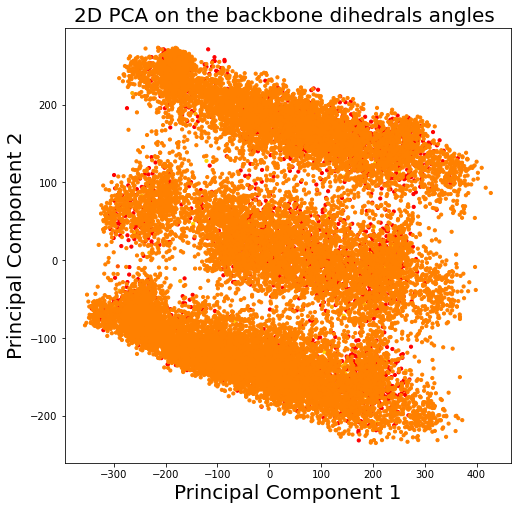

In [177]:
# Plot of the PCA 2D 

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 20)
ax.set_ylabel('Principal Component 2', fontsize = 20)
ax.set_title('2D PCA on the backbone dihedrals angles ', fontsize = 20)
ax.scatter(result2D['PCA0'], result2D['PCA1'],c=my_color, cmap="autumn", s=10)

In [181]:
# PCA 3D projection with sklearn in function of dihedral angles
# coloring in function of DSSP structure
from sklearn.decomposition import PCA

X = np.loadtxt("phi_psi.txt")
pca = PCA(n_components = 3)
pca.fit(X)
J3D = pca.transform(X)
np.savetxt("PCA3D.proj",J3D)

# Store results of PCA in a data frame
result3D=pd.DataFrame(J3D, columns=['PCA%i' % i for i in range(3)], index=df_angles3.index)

TypeError: loadtxt() got an unexpected keyword argument 'columns'

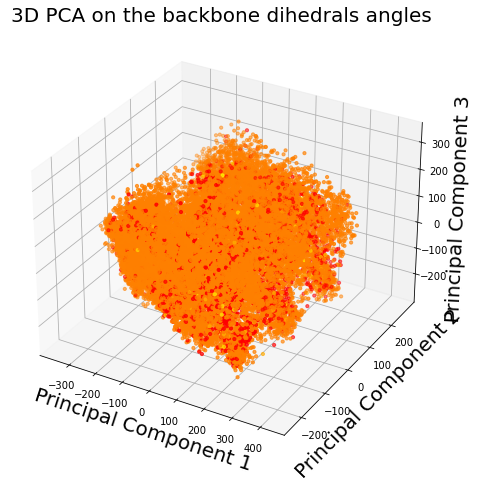

In [178]:
# Plot of the PCA 3D
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1,projection='3d') 
ax.set_xlabel('Principal Component 1', fontsize = 20)
ax.set_ylabel('Principal Component 2', fontsize = 20)
ax.set_zlabel('Principal Component 3', fontsize = 20)
ax.set_title('3D PCA on the backbone dihedrals angles ', fontsize = 20)
ax.scatter(result3D['PCA0'], result3D['PCA1'], result3D['PCA2'],c=my_color, cmap="autumn", s=10)

In [ ]:
# to do list :
    # find what is projection in unit cercle
    # redo the pca with de new dssp file
    # color the pca according to the secondary structure
    # make the ISOMAP & sketchmap projection


# Note that, as suggested in the literature Yuguang et al. (2005); Konrad (2006); Altis et al.
#(2007), instead of using the dihedral angles directly in the PCA, we used their projection on the unit circle.


# in the article, researchers have used projection on the unit cercle (?) not dihedrals angles 